# Song Lyrics Sentiment Analysis Unsupervised/NLP Project

In [18]:
import spotipy
import lyricsgenius
import os
import pickle
import json
import re
from langdetect import detect
from requests.exceptions import Timeout
from spotipy.oauth2 import SpotifyClientCredentials

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sqlalchemy import create_engine

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.metrics import pairwise_distances

# this statement allows the visuals to render within your Jupyter Notebook
%matplotlib inline

## Spotipy

Use python Spotify API to find songs from happy, angry, sad, or chill playlists.

In [43]:
auth_manager = SpotifyClientCredentials()
sp = spotipy.Spotify(auth_manager=auth_manager)

def get_playlist_tracks(playlist, emotion):
    track_list = []
    
    tracks = sp.playlist(playlist['id'], fields = "tracks, next")['tracks']['items']
    for track in tracks:
        if track['track'] != None:
            #print(json.dumps(track, sort_keys=False, indent=4))
            artist_name = track['track']['artists'][0]['name']
            track_name = track['track']['name']
            if track['track']['album']['release_date'] != None:
                release_year = track['track']['album']['release_date'].split('-')[0]
            else:
                release_year = 0
            track_list.append([artist_name, track_name, release_year, emotion])
            
    return(track_list)

In [21]:
def get_playlist_by_emo(playlist_tracks, emotion, num_to_get):

    num_pl = 0
    total = num_to_get//50
    
    while num_pl < total:
        playlists = sp.search(emotion, limit=50, offset=num_pl*50, type='playlist')
        for i, playlist in enumerate(playlists['playlists']['items']):
            if (num_pl%50) == 0:
                print("%4d %s %s" % (i + 1 + playlists['playlists']['offset'], playlist['id'],  playlist['name']))
            playlist_tracks.extend(get_playlist_tracks(playlist, emotion))
        if playlists['playlists']['next']:
            num_pl += 1
        else:
            num_pl = total
            
    return playlist_tracks

In [22]:
# number of playlists to retrieve from Spotify: 1000 means at least 100,000 songs per emotion for categorizing
# pick a number divisible by 50
num_to_get = 1000
playlist_tracks = []
emotions_list = ['happy', 'sad', 'angry', 'chill']

for emotion in emotions_list:
    playlist_tracks.extend(get_playlist_by_emo(playlist_tracks, emotion, num_to_get))


   1 37i9dQZF1DXdPec7aLTmlC Happy Hits!
   2 37i9dQZF1DWSf2RDTDayIx Happy Beats
   3 1h90L3LP8kAJ7KGjCV2Xfd Happy Songs
   4 37i9dQZF1DX84kJlLdo9vT Happy Days
   5 37i9dQZF1DX9u7XXOp0l5L Happy Tunes
   6 3rTliUjFBUwKukZLH15tkE happy vibes🦋
   7 37i9dQZF1DX1WSnLRtI26o Happy Drive
   8 37i9dQZF1DX0UrRvztWcAU Wake Up Happy
   9 37i9dQZF1DWYtQSOiZF6hj Happy Birthday
  10 37i9dQZF1DWSkMjlBZAZ07 Happy Folk
  11 37i9dQZF1DWZKuerrwoAGz Happy Favorites
  12 4AnAUkQNrLKlJCInZGSXRO Happy Songs ☺ (80s, 90s, 2000s, 2010s & 2020s)  ☺  Best Happy Hits & Oldies Songs
  13 52To1X77qO33uIcSuCVgKt Happy ✨
  14 0RH319xCjeU8VyTSqCF6M4 Happy songs everyone knows 😄 🙌
  15 37i9dQZF1DX4uPi2roRUwU Happy Dance
  16 0lngUq9w5tBnbeVTiq3ErJ Happy Upbeat Vibes
  17 37i9dQZF1DX1H4LbvY4OJi Happy Pop
  18 0dWheZd3cdhezPTHles6Ms happy music🦋
  19 5yI34GDYLxUxfSrpshdNVE  happy songs to scream the lyrics to
  20 37i9dQZF1DWVlYsZJXqdym Happy Pop Hits
  21 37LibJ2dUWe9FOkgUw98G1 happy vibes 
  22 37i9dQZF1DWTwbZHrJRIgD Happ

  19 37i9dQZF1DXaIrEwuQ3hyy Sommer Chillout
  20 37i9dQZF1DWWQRwui0ExPn lofi beats
  21 38fBnemYrpIUWFRfDZYcog Chill Lounge 2021 🍦 Summer Chill
  22 37i9dQZF1DWYoYGBbGKurt Chill Instrumental Beats
  23 37i9dQZF1DX9B1hu73DioC Indie Chillout
  24 63yrnUYe65gXwNN7lH935u Chill Rap Vibes 2021
  25 37i9dQZF1DXccH49bh52dB Chilled Dance Hits
  26 3SuOoKhbUulWTVBLh2eAl9 Chill rap vibes 
  27 2rN3mSrzUcgjlj1TcEDTX7 Chill Beats 💙 groove, relax
  28 37i9dQZF1DWYGZAMYFDM8S Acoustic Chill
  29 37i9dQZF1DXbIGqYf7WDxP Pop Chillout
  30 37i9dQZF1DX5CdVP4rz81C Fresh & Chill
  31 6FDLtTzY0UAgRU9mUIe6NK Chill 😎
  32 37i9dQZF1DXbcgQ8d7s0A0 Sweet Soul Chillout
  33 5HOitcztsmc74UHgbKfwfn Chillstep 2021
  34 4lipzgtz9pwpGFCgyMO8sK Chillhop Essentials Summer 2021
  35 37i9dQZF1DXcyVNt8nnPfR Chilled Classics
  36 37i9dQZF1DWVl5gPCRkquk Chill Folk
  37 3HuuoKWOpntQkxCr8L46JC CHILL
  38 3PmV8yRChsgzhQdlM6atsE Chill rap😴
  39 1Y6yp3H5O6XAos9JKvwuh9 Chill Guitar Beats 🎸 instrumental
  40 2aQ9dfVtUJlvfxaTKsPenb Chi

ValueError: 3 columns passed, passed data had 4 columns

In [23]:
playlist_tracks_df = pd.DataFrame(playlist_tracks, columns = ["Artist", "Title", "Year", "Emotion"])
playlist_tracks_df

,Artist,Title,Year,Emotion
0,Sam Feldt,The Best Days (feat. Tabitha),2020,happy
1,Galantis,Heartbreak Anthem (with David Guetta & Little ...,2021,happy
2,Martin Jensen,At Least I Had Fun,2020,happy
3,Tones And I,Fly Away,2020,happy
4,John De Sohn,Love You Better,2019,happy
...,...,...,...,...
2205421,AK AUSSERKONTROLLE,2065,2016,chill
2205422,AK AUSSERKONTROLLE,Unterwegs,2018,chill
2205423,RAF 3.0,Fallen,2012,chill
2205424,RAF Camora,Donna Imma,2017,chill


In [24]:
len(playlist_tracks)

2205426

In [25]:
playlist_tracks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205426 entries, 0 to 2205425
Data columns (total 4 columns):
 #   Column   Dtype 
---  ------   ----- 
 0   Artist   object
 1   Title    object
 2   Year     object
 3   Emotion  object
dtypes: object(4)
memory usage: 67.3+ MB


In [26]:
playlist_tracks_df = playlist_tracks_df.convert_dtypes()

In [40]:
playlist_tracks_df[playlist_tracks_df["Year"] == np.nan]["Year"] = 0
playlist_tracks_df["Year"] = playlist_tracks_df["Year"].astype(int)

In [41]:
playlist_tracks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205426 entries, 0 to 2205425
Data columns (total 4 columns):
 #   Column   Dtype 
---  ------   ----- 
 0   Artist   string
 1   Title    string
 2   Year     int64 
 3   Emotion  string
dtypes: int64(1), string(3)
memory usage: 67.3 MB


In [99]:
# preserve so I don't have to load from Spotify again.
# This is original list from all the playlists, including all duplicates.
playlist_tracks_df.to_pickle('spotify_emo_orig.pkl')

In [124]:
# the following shows how many unique artist/title tracks have just 1 emotion label
multi_labels = playlist_tracks_df.groupby(by=['Artist', 'Title'], as_index=False)['Emotion'].nunique()

multi_labels['Emotion'].value_counts()

1    113054
2     13002
3      3248
4      1160
Name: Emotion, dtype: int64

### At this point, I could go through all the multi-class tracks and use a majority rules system, or I can just keep all the tracks listed by just 1 unique emotion class.

In [130]:
single_class = multi_labels[multi_labels['Emotion'] == 1]

In [131]:
single_emo_df = playlist_tracks_df.merge(single_class, how='inner', on=['Title', 'Artist'])
single_emo_df

,Artist,Title,Year,Emotion_x,Emotion_y
0,Sam Feldt,The Best Days (feat. Tabitha),2020,happy,1
1,Sam Feldt,The Best Days (feat. Tabitha),2020,happy,1
2,Sam Feldt,The Best Days (feat. Tabitha),2020,happy,1
3,Sam Feldt,The Best Days (feat. Tabitha),2020,happy,1
4,Sam Feldt,The Best Days (feat. Tabitha),2020,happy,1
...,...,...,...,...,...
1116997,RAF 3.0,Fallen,2012,chill,1
1116998,RAF Camora,Donna Imma,2017,chill,1
1116999,RAF Camora,Donna Imma,2017,chill,1
1117000,Maxwell,100k,2017,chill,1


In [134]:
single_emo_df.drop_duplicates(inplace=True)

In [139]:
single_emo_df.rename(columns={'Emotion_x': 'Emotion'}, inplace=True)
single_emo_df.drop(columns = ['Emotion_y'], inplace=True)
single_emo_df

,Artist,Title,Year,Emotion
0,Sam Feldt,The Best Days (feat. Tabitha),2020,happy
128,HRVY,Good Vibes,2020,happy
352,AJ Mitchell,Slow Dance (feat. Ava Max) - Sam Feldt Remix,2019,happy
480,Jason Derulo,Lifestyle (feat. Adam Levine),2021,happy
704,Samantha Harvey,Get To Know You,2019,happy
...,...,...,...,...
1116992,AK AUSSERKONTROLLE,2065,2016,chill
1116994,AK AUSSERKONTROLLE,Unterwegs,2018,chill
1116996,RAF 3.0,Fallen,2012,chill
1116998,RAF Camora,Donna Imma,2017,chill


In [ ]:
single_emo_df[single_emo_df['Artist'] == 'One Direction']

### Year distribution is not great over every single year, but it's good for the last 5 years and okay for the last 10 years.

In [141]:
single_emo_df['Year'].value_counts().head(50)

2020    18714
2021    17714
2019    13187
2018    10622
2017     8511
2016     6252
2015     4999
2014     4027
2013     3562
2012     2793
2011     2726
2010     2188
2009     1865
2008     1553
2007     1394
2006     1313
2005     1200
2004     1018
2003      873
2001      808
2002      792
2000      647
1999      643
1998      527
1996      480
1997      478
1995      474
1994      448
1993      316
1991      309
1992      307
1989      240
0         228
1990      195
1988      195
1987      192
1983      190
1984      163
1982      161
1986      158
1985      148
1980      132
1981      130
1970      129
1977      129
1979      123
1971      117
1978      108
1968      106
1976      105
Name: Year, dtype: int64

### Emotion class distribution is fairly even. This would work for a post-topic modeling Classification model.

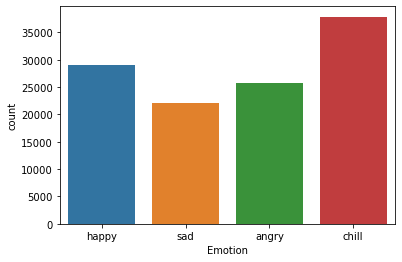

In [157]:
ax = sns.countplot(x="Emotion", data=single_emo_df)

In [264]:
# remove Year = 0 rows
single_emo_df = single_emo_df[single_emo_df['Year'] > 0]

In [272]:
# remove artist/title combos with multiple years
single_emo_df = single_emo_df.sort_values(by=['Artist', 'Title', 'Year'])

In [277]:
single_emo_df = single_emo_df.groupby(['Artist', 'Title']).first().reset_index()

In [278]:
single_emo_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112832 entries, 0 to 112831
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   Artist   112832 non-null  object
 1   Title    112832 non-null  object
 2   Year     112832 non-null  int64 
 3   Emotion  112832 non-null  string
 4   Lyrics   0 non-null       object
dtypes: int64(1), object(3), string(1)
memory usage: 4.3+ MB


### Section to handle multi-class categorizing.

In [159]:
multi_labels[multi_labels["Emotion"] == 2]

,Artist,Title,Emotion
82,#1 Dads,Freedom Fighter,2
87,#90s Update,Runaway Train,2
102,$NOT,"""Life""",2
106,$NOT,Can You Help Me,2
108,$NOT,FALL IN LOVE,2
...,...,...,...
130192,たかやん,Toy,2
130301,刘大壮,三号线 - 吉他版,2
130399,美波,main actor,2
130447,高爾宣 OSN,Without You - Acoustic Version,2


In [65]:
playlist_tracks_df[(playlist_tracks_df['Artist'] == 'Drake') & 
                   (playlist_tracks_df['Title'] == "God's Plan")]['Emotion'].value_counts()

happy    144
sad       16
angry     12
chill     12
Name: Emotion, dtype: Int64

In [142]:
playlist_tracks_df[(playlist_tracks_df['Artist'] == 'Drake') & 
                   (playlist_tracks_df['Title'] == "God's Plan")]['Emotion'].value_counts(normalize=True)

happy    0.782609
sad      0.086957
angry    0.065217
chill    0.065217
Name: Emotion, dtype: Float64

In [85]:
playlist_tracks_df[(playlist_tracks_df['Artist'] == 'Elton John') & 
                   (playlist_tracks_df['Title'] == "Tiny Dancer")]['Emotion'].value_counts()

happy    144
chill     22
angry     12
sad        8
Name: Emotion, dtype: Int64

In [103]:
playlist_tracks_df[(playlist_tracks_df['Artist'] == 'Tracy Chapman') & 
                   (playlist_tracks_df['Title'] == "Fast Car")]['Emotion'].value_counts().reset_index()

,index,Emotion
0,happy,64
1,chill,26
2,sad,24
3,angry,12


In [148]:
playlist_tracks_df[(playlist_tracks_df['Artist'] == 'Gotye') & 
                   (playlist_tracks_df['Title'] == "Somebody That I Used To Know")
                  ]['Emotion'].value_counts()

happy    208
sad       80
angry     64
chill     26
Name: Emotion, dtype: Int64

### Lyrics Genius 

Search for Artist/Title combinations for the lyrics of each song.

In [310]:
genius_access_token = os.environ['GENIUS_ACCESS_TOKEN']

lg = lyricsgenius.Genius(genius_access_token)

In [257]:
single_emo_df.iloc[12, :]['Title']

'Remember This'

In [183]:
song = lg.search_song(single_emo_df.iloc[12, :]['Title'], single_emo_df.iloc[12, :]['Artist'])
print(song.lyrics)

Searching for "Remember This" by Jonas Brothers...
Done.
[Chorus: Nick Jonas & Joe Jonas]
Used to pray for a moment just like this
There's a fire in your eyes I can't resist
Baby, we're gonna wanna remember this
Baby, we're gonna wanna remember this
I can taste the forever on your lips
There's a lifetime livin' inside that kiss
Baby, we're gonna wanna remember this
Baby, we're gonna wanna remember this

[Verse 1: Nick Jonas]
We ain't gettin' any younger, to be honеst, I don't care
I'm not tryna live forevеr, I'm just tryna be right here
This I know, only now it's all we got
This I know, mmm

[Pre-Chorus: Nick Jonas]
Just one more dance
Two more drinks
It'll go by fast
So don't you blink

[Chorus: Nick Jonas & Joe Jonas]
Used to pray for a moment just like this
There's a fire in your eyes I can't resist
Baby, we're gonna wanna remember this
Baby, we're gonna wanna remember this
I can taste the forever on your lips
There's a lifetime livin' inside that kiss
Baby, we're gonna wanna rememb

In [184]:
song.to_dict()

{'_type': 'song',
 'annotation_count': 1,
 'api_path': '/songs/6837244',
 'full_title': 'Remember This by\xa0Jonas\xa0Brothers',
 'header_image_thumbnail_url': 'https://images.genius.com/27fbd3a56806fdd70e126500f05416ff.300x300x1.jpg',
 'header_image_url': 'https://images.genius.com/27fbd3a56806fdd70e126500f05416ff.690x690x1.jpg',
 'id': 6837244,
 'instrumental': False,
 'lyrics_owner_id': 13935846,
 'lyrics_state': 'complete',
 'lyrics_updated_at': 1624072279,
 'path': '/Jonas-brothers-remember-this-lyrics',
 'pyongs_count': 1,
 'song_art_image_thumbnail_url': 'https://images.genius.com/27fbd3a56806fdd70e126500f05416ff.300x300x1.jpg',
 'song_art_image_url': 'https://images.genius.com/27fbd3a56806fdd70e126500f05416ff.690x690x1.jpg',
 'stats': {'unreviewed_annotations': 0, 'hot': False, 'pageviews': 9956},
 'title': 'Remember This',
 'title_with_featured': 'Remember This',
 'updated_by_human_at': 1624075940,
 'url': 'https://genius.com/Jonas-brothers-remember-this-lyrics',
 'song_art_pr

In [172]:
type(song.lyrics)

str

In [185]:
song.artist

'Jonas Brothers'

In [186]:
song = lg.search_song('Baby Baby not a song', single_emo_df.iloc[12, :]['Artist'])
print(song.lyrics)

Searching for "Baby Baby not a song" by Jonas Brothers...
Done.
5/1
11:11 - "Me, Chanel & Jameson"
Aazar & Yung Felix - "One Night" ft. Ebenezer & Maia Wright
ADÉ - "Replacements"
Annika Rose - "Naïve"
Bear - "Drop Top" ft. Don Toliver
Billy Bragg - "Can't Be There Today"
Boy In Space - "Forever Young"
Brandy - "Baby Mama" ft. Chance the Rapper
Brett Young - "Lady"
Bruno Major - "The Most Beautiful Thing"
Camila Cabello - "My Oh My (Remix)" ft. DaBaby & Gunna
Chjolo - "Jenova"
Church & AP - "War Outside"
Dagny - "Somebody"
Destiny Rogers - "Kickin' Pushin'"
Doe Boy - "Split It" ft. Moneybagg Yo
Doja Cat - "Say So (Remix)" ft. Nicki Minaj
Don Diablo - "Inside My Head (Voices)"
Duwap Kaine - "Smile""
Evie Irie - "Worst Enemy"
FUTURISTIC & Rittz - "Like This""
Gabbie Hanna - "Glass House"
Gabby Barrett - "Got Me" ft. Shane & Shane
Glass Animals - "Dreamland"
GOON DES GARCONS* - "A24" ft. CUCO
Grace Davies - "Amsterdam"
Hilltop Hoods - "I'm Good?"
Indigo Girls - "Country Radio"
Jean Deaux 

In [187]:
song.artist

'Genius'

In [279]:
single_emo_df #['Lyrics'] = None

,Artist,Title,Year,Emotion,Lyrics
0,!Neco,fwb,2021,sad,None
1,"""Puppy Dog Pals"" Cast",Puppy Dog Pals Main Title Theme,2017,happy,None
2,"""Weird Al"" Yankovic","Amish Paradise (Parody of ""Gangsta's Paradise""...",1996,angry,None
3,"""Weird Al"" Yankovic",Captain Underpants Theme Song,2017,angry,None
4,"""Weird Al"" Yankovic",The Hamilton Polka,2018,angry,None
...,...,...,...,...,...
112827,전진서,cold,2019,chill,None
112828,ＭＥＭＯＲＥＸ - ＭＥＭＯＲＩＥＳ 公式,A Way Home,2019,chill,None
112829,ｊａｒｊａｒｊｒ,Folgers Crystals,2021,chill,None
112830,･ ･－･ ･－ ･･･ ･ －･･,-・・ ・- -・ -・-・ ・ -- ・ - --- - ・・・・ ・ ・ -・ -・・ ...,2020,sad,None


In [329]:
# File to write lyrics to in case function crashes or Genius times out or ...
file = open("/home/melissa/Metis/NBM_Unsupervised_Student/my_project/lyrics_list.txt", "a")  

def get_genius_lyrics(df, lg):
    lyrics_list = []
    lg.timeout = 10
    #lg.sleep_time = 40
    i = 0
    
    for track in df.values:
        artist = track[0]
        title = track[1]
        
        retries = 0
        while retries < 1: # < 3:
            try:
                song = lg.search_song(title, artist)
            except: #Timeout as e:
                retries += 1
                #song = "None"  # this wasn't in original function but should have been
                print("Exception...")
                continue
                
            if (song == None or song.artist == "Genius"):
                lyrics_list.append(None)
                file.writelines(["\n \n   <|endoftext|>   \n \n", "None"])  # Deliminator
                print(i)
                i += 1
            else:
                lyrics_list.append(song.lyrics)
                file.writelines(["\n \n   <|endoftext|>   \n \n", song.lyrics])  # Deliminator
                print(i)
                i += 1
            break
            
    return lyrics_list

In [295]:
lyrics = get_genius_lyrics(single_emo_df, lg)

Searching for "fwb" by !Neco...
Specified song does not contain lyrics. Rejecting.
0
Searching for "Puppy Dog Pals Main Title Theme" by "Puppy Dog Pals" Cast...
Done.
1
Searching for "Amish Paradise (Parody of "Gangsta's Paradise" by Coolio)" by "Weird Al" Yankovic...
No results found for: 'Amish Paradise (Parody of "Gangsta's Paradise" by Coolio) "Weird Al" Yankovic'
2
Searching for "Captain Underpants Theme Song" by "Weird Al" Yankovic...
No results found for: 'Captain Underpants Theme Song "Weird Al" Yankovic'
3
Searching for "The Hamilton Polka" by "Weird Al" Yankovic...
Done.
4
Searching for "White & Nerdy (Parody of "Ridin'" by Chamillionaire feat. Krayzie Bone)" by "Weird Al" Yankovic...
No results found for: 'White & Nerdy (Parody of "Ridin'" by Chamillionaire feat. Krayzie Bone) "Weird Al" Yankovic'
5
Searching for "Twice a Fool" by #1 Dads...
Done.
6
Searching for "What She's Doing Now" by #1 Garth Brooks Tribute Band...
Done.
7
Searching for "Follow Me" by #90s Update...
Don

Done.
122
Searching for "Golden Calf" by $uicideboy$...
Done.
123
Searching for "Goosebumps" by $uicideboy$...
Done.
124
Searching for "Gorilla Warfare" by $uicideboy$...
Done.
125
Searching for "Grey Magic" by $uicideboy$...
Done.
126
Searching for "Handzum Suicide (feat. Dylan Ross)" by $uicideboy$...
No results found for: 'Handzum Suicide (feat. Dylan Ross) $uicideboy$'
127
Searching for "I Am The Apocalypse" by $uicideboy$...
Done.
128
Searching for "I Am the Apocalypse" by $uicideboy$...
Done.
129
Searching for "I Ended Up Driving The Camaro Off The Causeway Bridge" by $uicideboy$...
Done.
130
Searching for "I Hung Myself for a Persona" by $uicideboy$...
Done.
131
Searching for "I Want To Believe" by $uicideboy$...
Done.
132
Searching for "I Want to Believe" by $uicideboy$...
Done.
133
Searching for "I Will One Day Learn To Fly Into The Stars" by $uicideboy$...
Done.
134
Searching for "I'm Done" by $uicideboy$...
Done.
135
Searching for "If You Were To Get What You Deserve, You Wo

Done.
242
Searching for "Manitoumani" by -M-...
Done.
243
Searching for "Solidarité" by -M-...
Done.
244
Searching for "Don't Let Me Down" by .BAJ...
Done.
245
Searching for "Feelings" by .Eehou...
Done.
246
Searching for "Yes I Know" by .Fen...
Done.
247
Searching for "Forever" by .Jxck...
Done.
248
Searching for "Always Blue" by .Sinh...
Done.
249
Searching for "Behavior" by .Sinh...
Done.
250
Searching for "Early Spring" by .Sinh...
Specified song does not contain lyrics. Rejecting.
251
Searching for "Healing" by .Sinh...
Done.
252
Searching for "Jakarta" by .Sinh...
Done.
253
Searching for "Movement" by .Sinh...
Done.
254
Searching for "Past" by .Sinh...
Done.
255
Searching for "a day with you" by .Uzu...
Done.
256
Searching for "sleepless nights" by .anxious....
Specified song does not contain lyrics. Rejecting.
257
Searching for "Lilac Days" by .clouds...
Done.
258
Searching for "cozy mornings" by .clouds...
Done.
259
Searching for "posição" by .enzo...
Done.
260
Searching for "B

No results found for: 'Foggy Fields 12nd'
373
Searching for "Forever, I Promise" by 12nd...
No results found for: 'Forever, I Promise 12nd'
374
Searching for "Infinity" by 12nd...
Done.
375
Searching for "Lakeside" by 12nd...
No results found for: 'Lakeside 12nd'
376
Searching for "Left Out" by 12nd...
Done.
377
Searching for "Momentum" by 12nd...
Done.
378
Searching for "Ontwaken" by 12nd...
No results found for: 'Ontwaken 12nd'
379
Searching for "Rose Petals" by 12nd...
No results found for: 'Rose Petals 12nd'
380
Searching for "Bubzstep" by 12th Planet...
Done.
381
Searching for "Gully Squad" by 12th Planet...
Done.
382
Searching for "Majestic 12" by 12th Planet...
Specified song does not contain lyrics. Rejecting.
383
Searching for "RVD" by 12th Planet...
No results found for: 'RVD 12th Planet'
384
Searching for "Send It" by 12th Planet...
Done.
385
Searching for "Shady" by 12th Planet...
Done.
386
Searching for "Sooo Sick" by 12th Planet...
Done.
387
Searching for "Whoops (feat. P

Done.
491
Searching for "Out of Luck" by 2 Man Embassy...
Done.
492
Searching for "Velvet" by 2 Man Embassy...
Done.
493
Searching for "Here I Go" by 2 Mello...
Done.
494
Searching for "Mirror Temple - Mirror Magic Mix" by 2 Mello...
Done.
495
Searching for "Do What I Do" by 2 Tone Drip...
Done.
496
Searching for "Get Ready - Orchestral Mix" by 2 Unlimited...
Done.
497
Searching for "Get Ready - Rap Version Edit" by 2 Unlimited...
Done.
498
Searching for "Get Ready - Rapversion Edit" by 2 Unlimited...
Done.
499
Searching for "Jump For Joy" by 2 Unlimited...
Done.
500
Searching for "No Limit" by 2 Unlimited...
Done.
501
Searching for "No Limit - Zatox Remix" by 2 Unlimited...
Done.
502
Searching for "flujo de agua" by 2-9...
No results found for: 'flujo de agua 2-9'
503
Searching for "Lick It - 20 Fingers Radio Mix" by 20 Fingers...
Done.
504
Searching for "DEAD INSIDE" by 20TOKENS...
Done.
505
Searching for "Dust Clouds" by 20syl...
Done.
506
Searching for "1.5" by 21 Savage...
Done.
5

Done.
612
Searching for "Brenda's Got A Baby" by 2Pac...
Done.
613
Searching for "California Love" by 2Pac...
Done.
614
Searching for "California Love - Original Version" by 2Pac...
Done.
615
Searching for "Can't C Me" by 2Pac...
Done.
616
Searching for "Don't You Trust Me" by 2Pac...
Done.
617
Searching for "Fake Ass Bitches" by 2Pac...
Done.
618
Searching for "Ghost" by 2Pac...
Done.
619
Searching for "Hail Mary (feat. The Outlawz)" by 2Pac...
Done.
620
Searching for "Hell 4 A Hustler" by 2Pac...
Done.
621
Searching for "Hit 'Em Up - Single Version" by 2Pac...
Done.
622
Searching for "Hit 'em Up" by 2Pac...
Done.
623
Searching for "Holler If Ya' Hear Me" by 2Pac...
Done.
624
Searching for "How Do U Want It" by 2Pac...
Done.
625
Searching for "How Do You Want It" by 2Pac...
Done.
626
Searching for "I Ain't Mad At Cha" by 2Pac...
Done.
627
Searching for "I Get Around" by 2Pac...
Done.
628
Searching for "It Ain't Easy" by 2Pac...
Done.
629
Searching for "Last Wordz" by 2Pac...
Done.
630

Done.
748
Searching for "Touch - Zeds Dead Remix" by 3LAU...
Done.
749
Searching for "No More (Baby I'ma Do Right)" by 3LW...
Done.
750
Searching for "Examples" by 3MFrench...
Done.
751
Searching for "Seasonal Depression" by 3NIGMA...
No results found for: 'Seasonal Depression 3NIGMA'
752
Searching for "Dirty Mind" by 3OH!3...
Done.
753
Searching for "Déjà Vu" by 3OH!3...
Done.
754
Searching for "I'm Not the One" by 3OH!3...
Done.
755
Searching for "IMNOTYOURBOYFRIENDBABY" by 3OH!3...
No results found for: 'IMNOTYOURBOYFRIENDBABY 3OH!3'
756
Searching for "PUNKBITCH" by 3OH!3...
Done.
757
Searching for "STARSTRUKK (feat. Katy Perry)" by 3OH!3...
Done.
758
Searching for "Touchin on My" by 3OH!3...
Done.
759
Searching for "Demons - Original Mix" by 3RDKND...
No results found for: 'Demons - Original Mix 3RDKND'
760
Searching for "Let Me Love You" by 3RIC MCK3NNA...
No results found for: 'Let Me Love You 3RIC MCK3NNA'
761
Searching for "Riddin'" by 3RIS D3D3...
No results found for: 'Riddin

Done.
866
Searching for "Everything I Didn't Say" by 5 Seconds of Summer...
Done.
867
Searching for "Ghost Of You - Live" by 5 Seconds of Summer...
Done.
868
Searching for "Girls Talk Boys (from the "Ghostbusters" Original Motion Picture Soundtrack)" by 5 Seconds of Summer...
No results found for: 'Girls Talk Boys (from the "Ghostbusters" Original Motion Picture Soundtrack) 5 Seconds of Summer'
869
Searching for "Gotta Get Out" by 5 Seconds of Summer...
Done.
870
Searching for "Heartbreak Girl" by 5 Seconds of Summer...
Done.
871
Searching for "High" by 5 Seconds of Summer...
Done.
872
Searching for "I Miss You - Unplugged" by 5 Seconds of Summer...
Done.
873
Searching for "Intro - Live" by 5 Seconds of Summer...
Done.
874
Searching for "Invisible" by 5 Seconds of Summer...
Done.
875
Searching for "Jet Black Heart" by 5 Seconds of Summer...
Done.
876
Searching for "Jet Black Heart - Live" by 5 Seconds of Summer...
Done.
877
Searching for "Kill My Time" by 5 Seconds of Summer...
Done.
8

Done.
996
Searching for "GOOBA" by 6ix9ine...
Done.
997
Searching for "GUMMO" by 6ix9ine...
Done.
998
Searching for "KEKE" by 6ix9ine...
Done.
999
Searching for "KOODA" by 6ix9ine...
Done.
1000
Searching for "MAMA" by 6ix9ine...
Done.
1001
Searching for "Oof" by 6ix9ine...
Done.
1002
Searching for "STOOPID" by 6ix9ine...
Done.
1003
Searching for "Shinigami" by 6ix9ine...
Done.
1004
Searching for "Sinaloa" by 6ix9ine...
Done.
1005
Searching for "TATI" by 6ix9ine...
Done.
1006
Searching for "TROLLZ (with Nicki Minaj)" by 6ix9ine...
Done.
1007
Searching for "Yokai" by 6ix9ine...
Done.
1008
Searching for "If Anything, Im Better Off Alone" by 6lackhart...
Done.
1009
Searching for "If You Think I Care, I Dont" by 6lackhart...
No results found for: 'If You Think I Care, I Dont 6lackhart'
1010
Searching for "3AM" by 6o...
Done.
1011
Searching for "Again" by 6o...
Done.
1012
Searching for "Not the Same" by 6o...
Done.
1013
Searching for "Til I Die" by 6o...
Done.
1014
Searching for "Try" by 6o.

No results found for: 'sweater weather - lofi remix 89ine'
1123
Searching for "6 AM (8D Audio)" by 8D Tunes...
No results found for: '6 AM (8D Audio) 8D Tunes'
1124
Searching for "Closer (8D Audio)" by 8D Tunes...
No results found for: 'Closer (8D Audio) 8D Tunes'
1125
Searching for "Dark Blue Paradise (SKUM Remix)" by 8D Tunes...
No results found for: 'Dark Blue Paradise (SKUM Remix) 8D Tunes'
1126
Searching for "Euphoria (8D Audio)" by 8D Tunes...
No results found for: 'Euphoria (8D Audio) 8D Tunes'
1127
Searching for "Falling (8D Audio)" by 8D Tunes...
No results found for: 'Falling (8D Audio) 8D Tunes'
1128
Searching for "Fly Me To The Moon (8D Audio)" by 8D Tunes...
No results found for: 'Fly Me To The Moon (8D Audio) 8D Tunes'
1129
Searching for "Hate Me (8D Audio)" by 8D Tunes...
No results found for: 'Hate Me (8D Audio) 8D Tunes'
1130
Searching for "Hear Me Out (8D Audio)" by 8D Tunes...
No results found for: 'Hear Me Out (8D Audio) 8D Tunes'
1131
Searching for "Here With Me (8

Done.
1214
Searching for "Artist" by A Boogie Wit da Hoodie...
Done.
1215
Searching for "Baecation" by A Boogie Wit da Hoodie...
Done.
1216
Searching for "Blood On My Denim" by A Boogie Wit da Hoodie...
Done.
1217
Searching for "Come Closer (feat. Queen Naija)" by A Boogie Wit da Hoodie...
Done.
1218
Searching for "D.T.B. (Interlude)" by A Boogie Wit da Hoodie...
Done.
1219
Searching for "DTB 4 Life" by A Boogie Wit da Hoodie...
Done.
1220
Searching for "Demons and Angels (feat. Juice WRLD)" by A Boogie Wit da Hoodie...
Done.
1221
Searching for "Get to You" by A Boogie Wit da Hoodie...
Done.
1222
Searching for "Good Girls Gone Bad" by A Boogie Wit da Hoodie...
Done.
1223
Searching for "I Know What's Real" by A Boogie Wit da Hoodie...
Done.
1224
Searching for "If I Gotta Go" by A Boogie Wit da Hoodie...
Done.
1225
Searching for "Just Like Me (feat. Young Thug)" by A Boogie Wit da Hoodie...
Done.
1226
Searching for "King Of My City" by A Boogie Wit da Hoodie...
Done.
1227
Searching for "

Done.
1327
Searching for "This Is the House That Doubt Built" by A Day To Remember...
Done.
1328
Searching for "Turn Off The Radio" by A Day To Remember...
Done.
1329
Searching for "Violence (Enough Is Enough)" by A Day To Remember...
Done.
1330
Searching for "Viva La Mexico" by A Day To Remember...
Done.
1331
Searching for "Welcome to the Family" by A Day To Remember...
Done.
1332
Searching for "Why Walk On Water When We've Got Boats" by A Day To Remember...
Done.
1333
Searching for "You Already Know What You Are" by A Day To Remember...
Done.
1334
Searching for "You Be Tails, I'll Be Sonic" by A Day To Remember...
Done.
1335
Searching for "You Had Me At Hello" by A Day To Remember...
Done.
1336
Searching for "You Should Have Killed Me When You Had The Chance" by A Day To Remember...
Done.
1337
Searching for "You Should've Killed Me When You Had the Chance" by A Day To Remember...
Done.
1338
Searching for "Almost Lover" by A Fine Frenzy...
Done.
1339
Searching for "What I Wouldn't Do"

Done.
1434
Searching for "Busta's Lament" by A Tribe Called Quest...
Done.
1435
Searching for "Check the Rhime" by A Tribe Called Quest...
Done.
1436
Searching for "Find a Way" by A Tribe Called Quest...
Done.
1437
Searching for "Lyrics to Go" by A Tribe Called Quest...
Done.
1438
Searching for "Oh My God" by A Tribe Called Quest...
Done.
1439
Searching for "Oh My God - Remix" by A Tribe Called Quest...
Done.
1440
Searching for "Rap Promoter" by A Tribe Called Quest...
Done.
1441
Searching for "Scenario - Remix" by A Tribe Called Quest...
Done.
1442
Searching for "Stressed Out (feat. Faith Evans)" by A Tribe Called Quest...
Done.
1443
Searching for "Sucka Nigga" by A Tribe Called Quest...
Done.
1444
Searching for "The Chase, Part II" by A Tribe Called Quest...
Done.
1445
Searching for "Verses from the Abstract" by A Tribe Called Quest...
Done.
1446
Searching for "Gurenge - Chill Lofi Ver." by A V I A N D...
No results found for: 'Gurenge - Chill Lofi Ver. A V I A N D'
1447
Searching fo

Done.
1533
Searching for "On My Way!" by A-Wall...
Done.
1534
Searching for "Drop FM" by A. G. Cook...
Done.
1535
Searching for "Keri Baby" by A. G. Cook...
Done.
1536
Searching for "Fuiste Mala" by A.B. Quintanilla III Y Los Kumbia Kings...
No results found for: 'Fuiste Mala A.B. Quintanilla III Y Los Kumbia Kings'
1537
Searching for "Na Na Na (Dulce Niña)" by A.B. Quintanilla III Y Los Kumbia Kings...
No results found for: 'Na Na Na (Dulce Niña) A.B. Quintanilla III Y Los Kumbia Kings'
1538
Searching for "Te Quiero A Tí" by A.B. Quintanilla III Y Los Kumbia Kings...
No results found for: 'Te Quiero A Tí A.B. Quintanilla III Y Los Kumbia Kings'
1539
Searching for "Moving Out Of The Ghetto" by A.C. Reed...
Done.
1540
Searching for "Goblin (Favorite Boys)" by A.C.E...
Done.
1541
Searching for "SAVAGE" by A.C.E...
Done.
1542
Searching for "Slow Dive" by A.C.E...
Done.
1543
Searching for "Love N Hennessy" by A.CHAL...
Done.
1544
Searching for "Love N Hennessy REMIX (feat. 2 Chainz & Nicky

No results found for: 'Never Say Goodbye (From "Dil Bechara") A.R. Rahman'
1641
Searching for "O Humdum Suniyo Re" by A.R. Rahman...
Done.
1642
Searching for "O Kaadhale" by A.R. Rahman...
No results found for: 'O Kaadhale A.R. Rahman'
1643
Searching for "O Rey Chhori" by A.R. Rahman...
Done.
1644
Searching for "Oh Maria" by A.R. Rahman...
Done.
1645
Searching for "Ok Jaanu Title Track" by A.R. Rahman...
Done.
1646
Searching for "Ok Jaanu Title Track (From "OK Jaanu")" by A.R. Rahman...
No results found for: 'Ok Jaanu Title Track (From "OK Jaanu") A.R. Rahman'
1647
Searching for "Oliyaaga Vandhaai" by A.R. Rahman...
No results found for: 'Oliyaaga Vandhaai A.R. Rahman'
1648
Searching for "Omana Penne" by A.R. Rahman...
Done.
1649
Searching for "Param Sundari" by A.R. Rahman...
No results found for: 'Param Sundari A.R. Rahman'
1650
Searching for "Phoolon Jaisi" by A.R. Rahman...
No results found for: 'Phoolon Jaisi A.R. Rahman'
1651
Searching for "Pookkalae Sattru Oyivedungal" by A.R. R

Done.
1756
Searching for "Whole Lotta Rosie" by AC/DC...
Done.
1757
Searching for "Off-Luv" by AC3...
Done.
1758
Searching for "Guts" by ACN Music....
No results found for: 'Guts ACN Music.'
1759
Searching for "FUCKSHIT" by ACOT...
Done.
1760
Searching for "ROACH" by ACOT...
Done.
1761
Searching for "Drunk in Love" by ACOURVE...
No results found for: 'Drunk in Love ACOURVE'
1762
Searching for "I didn't get you" by ACOURVE...
No results found for: 'I didn't get you ACOURVE'
1763
Searching for "Rainy" by ACOURVE...
No results found for: 'Rainy ACOURVE'
1764
Searching for "The day" by ACOURVE...
Done.
1765
Searching for "The night we parted" by ACOURVE...
No results found for: 'The night we parted ACOURVE'
1766
Searching for "What can I do" by ACOURVE...
No results found for: 'What can I do ACOURVE'
1767
Searching for "Chapter 2" by AD...
Done.
1768
Searching for "City" by ADHDS...
Done.
1769
Searching for "Uyir Poo" by ADK...
No results found for: 'Uyir Poo ADK'
1770
Searching for "Vella

Done.
1891
Searching for "Abandoned" by AK...
Done.
1892
Searching for "All Equal" by AK...
Done.
1893
Searching for "Autumn is Here" by AK...
Done.
1894
Searching for "Branches" by AK...
Done.
1895
Searching for "Deja Vu" by AK...
Done.
1896
Searching for "Discovery" by AK...
Done.
1897
Searching for "Eden" by AK...
Done.
1898
Searching for "Everyday Issues" by AK...
Done.
1899
Searching for "Everything Will Be Okay" by AK...
Done.
1900
Searching for "Felicity" by AK...
Done.
1901
Searching for "Holding On" by AK...
Specified song does not contain lyrics. Rejecting.
1902
Searching for "Horizon" by AK...
Done.
1903
Searching for "IV" by AK...
Done.
1904
Searching for "In the Distance" by AK...
Done.
1905
Searching for "Isolated" by AK...
Done.
1906
Searching for "Like I Got It" by AK...
Done.
1907
Searching for "Mellow Evening" by AK...
Done.
1908
Searching for "Night Drive" by AK...
Done.
1909
Searching for "Ozon" by AK...
Done.
1910
Searching for "Pulses" by AK...
Done.
1911
Searchin

No results found for: 'TO FEAR - INCOMPLETE ANTISAINT'
2028
Searching for "Ambrosia" by AOBeats...
Done.
2029
Searching for "a single butterfly floating in the breeze" by AOI...
No results found for: 'a single butterfly floating in the breeze AOI'
2030
Searching for "a tulip with no shadow blossoms" by AOI...
Specified song does not contain lyrics. Rejecting.
2031
Searching for "afternoon shower" by AOI...
No results found for: 'afternoon shower AOI'
2032
Searching for "petals falling from the cherry tree" by AOI...
No results found for: 'petals falling from the cherry tree AOI'
2033
Searching for "tattered trees in the rain" by AOI...
No results found for: 'tattered trees in the rain AOI'
2034
Searching for "Fake" by AP Dhillon...
Done.
2035
Searching for "Feels" by AP Dhillon...
Done.
2036
Searching for "Ma Belle" by AP Dhillon...
Done.
2037
Searching for "SEEMS RIGHT" by AP$...
No results found for: 'SEEMS RIGHT AP$'
2038
Searching for "Upside Down (feat. Carly Paige) - Massive Vibe

No results found for: 'Aurical ATYYA'
2158
Searching for "Space" by AUDREY NUNA...
Done.
2159
Searching for "damn Right" by AUDREY NUNA...
Done.
2160
Searching for "damn Right Pt. 2" by AUDREY NUNA...
Done.
2161
Searching for "Polywave" by AURAGRAPH...
Specified song does not contain lyrics. Rejecting.
2162
Searching for "Cure For Me" by AURORA...
Done.
2163
Searching for "Half the World Away" by AURORA...
Done.
2164
Searching for "Murder Song (5, 4, 3, 2, 1) - Acoustic" by AURORA...
Done.
2165
Searching for "Runaway - Piano Version" by AURORA...
Done.
2166
Searching for "Stars Stars" by AURORA...
Done.
2167
Searching for "In Betweenin'" by AUSTN...
Done.
2168
Searching for "Slumber Summer" by AVAANI...
No results found for: 'Slumber Summer AVAANI'
2169
Searching for "On My Game" by AVADY...
Done.
2170
Searching for "I don't know why" by AVAION...
Done.
2171
Searching for "Love Again" by AVAION...
Done.
2172
Searching for "Same Vibes" by AVAION...
Done.
2173
Searching for "She dance" b

Done.
2274
Searching for "Nature Boy" by Aaron Neville...
Done.
2275
Searching for "Please Come Home For Christmas" by Aaron Neville...
Done.
2276
Searching for "Ice Cream!" by Aaron Polar...
Done.
2277
Searching for "watch me die" by Aaron Polar...
Done.
2278
Searching for "Better When I Do" by Aaron Pritchett...
Done.
2279
Searching for "Dirt Road In 'Em" by Aaron Pritchett...
No results found for: 'Dirt Road In 'Em Aaron Pritchett'
2280
Searching for "Other Days" by Aaron Reid...
Done.
2281
Searching for "Ape Shit" by Aaron Salovaara...
No results found for: 'Ape Shit Aaron Salovaara'
2282
Searching for "CARE" by Aaron Sayre...
Done.
2283
Searching for "Dancin - Krono Remix (Extended)" by Aaron Smith...
Done.
2284
Searching for "Unconditional" by Aaron Smith...
Done.
2285
Searching for "Unspoken" by Aaron Smith...
Done.
2286
Searching for "Severance" by Aaron Static...
Done.
2287
Searching for "Birthday Blues" by Aaron Taos...
Done.
2288
Searching for "Bloom - Remix" by Aaron Taos..

No results found for: 'Kil Ma T'illi Abeer Nehme'
2377
Searching for "Talfantelak" by Abeer Nehme...
No results found for: 'Talfantelak Abeer Nehme'
2378
Searching for "Onderweg" by Abel...
Done.
2379
Searching for "A Thousand Times Good Night" by Abel Korzeniowski...
No results found for: 'A Thousand Times Good Night Abel Korzeniowski'
2380
Searching for "Forbidden Love" by Abel Korzeniowski...
Done.
2381
Searching for "Six Hours" by Abel Korzeniowski...
Done.
2382
Searching for "Table for Two" by Abel Korzeniowski...
Specified song does not contain lyrics. Rejecting.
2383
Searching for "The Field" by Abel Korzeniowski...
Specified song does not contain lyrics. Rejecting.
2384
Searching for "Collide - Jim Wilson Remix" by Abel Ramos...
No results found for: 'Collide - Jim Wilson Remix Abel Ramos'
2385
Searching for "El Padre Que Siempre Soñé" by Abel Zavala...
Done.
2386
Searching for "Jesús Mi Fiel Amigo (En Vivo)" by Abel Zavala...
No results found for: 'Jesús Mi Fiel Amigo (En Vivo

Done.
2472
Searching for "On Deck" by Abra Cadabra...
Done.
2473
Searching for "On Deck (Remix) [feat. Rv, Kush, Double Lz, Bandokay, Lowkey OFB & Dezzie]" by Abra Cadabra...
Done.
2474
Searching for "Selective Bad Boys (feat. Dappy)" by Abra Cadabra...
Done.
2475
Searching for "Show Me" by Abra Cadabra...
Done.
2476
Searching for "Spin This Coupe" by Abra Cadabra...
Done.
2477
Searching for "You (feat. Dirtbike LB & Young Adz)" by Abra Cadabra...
Done.
2478
Searching for "Happiness" by Abra Moore...
Done.
2479
Searching for "Stay" by Abraham Alexander...
Done.
2480
Searching for "Aunque Estés Con Él" by Abraham Mateo...
Done.
2481
Searching for "Loco Enamorado" by Abraham Mateo...
Done.
2482
Searching for "No Encuentro Palabras" by Abraham Mateo...
Done.
2483
Searching for "Se Acabó el Amor - Urban Version" by Abraham Mateo...
Done.
2484
Searching for "Tiempo Pa Olvidar" by Abraham Mateo...
Done.
2485
Searching for "Besame de Nuevo" by Abraham Vazquez...
No results found for: 'Besame 

Done.
2591
Searching for "그러지마요 (from "상류사회")" by Acoustic Collabo...
No results found for: '그러지마요 (from "상류사회") Acoustic Collabo'
2592
Searching for "A Time for Us (From "Romeo and Juliet")" by Acoustic Guitar Collective...
No results found for: 'A Time for Us (From "Romeo and Juliet") Acoustic Guitar Collective'
2593
Searching for "Chasing Cars" by Acoustic Guitar Collective...
Done.
2594
Searching for "Chi Mai (From "Maddalena" & "Le Professionnel")" by Acoustic Guitar Collective...
No results found for: 'Chi Mai (From "Maddalena" & "Le Professionnel") Acoustic Guitar Collective'
2595
Searching for "Crying in the Rain" by Acoustic Guitar Collective...
Done.
2596
Searching for "Don't Know Why" by Acoustic Guitar Collective...
Done.
2597
Searching for "Everybody's Got to Learn Sometime" by Acoustic Guitar Collective...
Done.
2598
Searching for "Fragile" by Acoustic Guitar Collective...
Done.
2599
Searching for "I Say a Little Prayer" by Acoustic Guitar Collective...
Done.
2600
Searchi

Done.
2672
Searching for "The Scientist" by Acoustic Heartstrings...
No results found for: 'The Scientist Acoustic Heartstrings'
2673
Searching for "Three Little Birds" by Acoustic Heartstrings...
Done.
2674
Searching for "WAP - Acoustic Guitar Version" by Acoustic Heartstrings...
No results found for: 'WAP - Acoustic Guitar Version Acoustic Heartstrings'
2675
Searching for "Watermelon Sugar" by Acoustic Heartstrings...
No results found for: 'Watermelon Sugar Acoustic Heartstrings'
2676
Searching for "What About Us" by Acoustic Heartstrings...
Done.
2677
Searching for "Wish You Were Here" by Acoustic Heartstrings...
Done.
2678
Searching for "With or Without You" by Acoustic Heartstrings...
Done.
2679
Searching for "Without Me" by Acoustic Heartstrings...
Done.
2680
Searching for "Wow." by Acoustic Heartstrings...
No results found for: 'Wow. Acoustic Heartstrings'
2681
Searching for "drivers license - Acoustic Guitar Version" by Acoustic Heartstrings...
No results found for: 'drivers li

Done.
2789
Searching for "Vítr nad Prahou" by Adam Mišík...
No results found for: 'Vítr nad Prahou Adam Mišík'
2790
Searching for "Perfect Destiny - Nick Silvestri Remix" by Adam Nickey...
No results found for: 'Perfect Destiny - Nick Silvestri Remix Adam Nickey'
2791
Searching for "Dash" by Adam Nystrom...
No results found for: 'Dash Adam Nystrom'
2792
Searching for "Trapped in My Mind" by Adam Oh...
Done.
2793
Searching for "Planet 9" by Adam Port...
Done.
2794
Searching for "Shelter Island" by Adam Rafferty...
No results found for: 'Shelter Island Adam Rafferty'
2795
Searching for "Nothin' to Do but Drink" by Adam Sanders...
Done.
2796
Searching for "Chanukah Song - The" by Adam Sandler...
Done.
2797
Searching for "Can't Fall In Love" by Adam Snow...
Done.
2798
Searching for "Desert Summer" by Adam Stacks...
Done.
2799
Searching for "Loving You - Original Mix" by Adam Stacks...
Done.
2800
Searching for "Hatchet" by Adam Torres...
Done.
2801
Searching for "I See You" by Adam Turley..

No results found for: 'Aaj Ei Akash Adit'
2908
Searching for "Ang Laga De" by Aditi Paul...
Done.
2909
Searching for "Offo" by Aditi Singh Sharma...
No results found for: 'Offo Aditi Singh Sharma'
2910
Searching for "Sooraj Dooba Hain" by Aditi Singh Sharma...
Done.
2911
Searching for "Wajah" by Aditya Tiwari...
No results found for: 'Wajah Aditya Tiwari'
2912
Searching for "Deewane Hum Nahi" by Aditya Yadav...
No results found for: 'Deewane Hum Nahi Aditya Yadav'
2913
Searching for "Tere Ishq Mein" by Aditya Yadav...
No results found for: 'Tere Ishq Mein Aditya Yadav'
2914
Searching for "Pareidolia" by Adiv Williams...
No results found for: 'Pareidolia Adiv Williams'
2915
Searching for "Mala" by Adjiri Odametey...
No results found for: 'Mala Adjiri Odametey'
2916
Searching for "Tesàa" by Adjiri Odametey...
No results found for: 'Tesàa Adjiri Odametey'
2917
Searching for "Squealing Pigs" by Admiral Fallow...
Done.
2918
Searching for "On a Day Like This One" by Admiral Freebee...
No res

Done.
3013
Searching for "Treat You Better" by Adro...
Done.
3014
Searching for "Como Si Nada" by Adso Alejandro...
Done.
3015
Searching for "Love Without Words" by Adult Fiction...
Done.
3016
Searching for "Be Your Own 3am" by Adult Mom...
Done.
3017
Searching for "Full Screen" by Adult Mom...
Done.
3018
Searching for "I Make Boys Cry" by Adult Mom...
Done.
3019
Searching for "Ode to One Night Stands" by Adult Mom...
Done.
3020
Searching for "Survival" by Adult Mom...
Done.
3021
Searching for "Butterflies" by Advait...
Done.
3022
Searching for "Dil Ko Kaise Samjhau?" by Advait...
No results found for: 'Dil Ko Kaise Samjhau? Advait'
3023
Searching for "Om Mantra" by Advaitas...
Done.
3024
Searching for "Samadhi" by Advaitas...
Done.
3025
Searching for "Heartbeat" by Advection...
Done.
3026
Searching for "Weight Of The World" by Advent...
Done.
3027
Searching for "Wind From The Valley" by Advent...
Done.
3028
Searching for "Do I See Color" by Adventure Club...
Specified song does not co

Done.
3138
Searching for "Tumba Pala Cocuyé" by Afro-Cuban All Stars...
Done.
3139
Searching for "Veinte Años (Feat. Naymi)" by Afro-Cuban Groove Collective...
No results found for: 'Veinte Años (Feat. Naymi) Afro-Cuban Groove Collective'
3140
Searching for "Que No Te Digan Muñeca" by AfroCubism...
No results found for: 'Que No Te Digan Muñeca AfroCubism'
3141
Searching for "You deserve" by AfroTherapist...
No results found for: 'You deserve AfroTherapist'
3142
Searching for "All Night (feat. Ally Brooke)" by Afrojack...
Done.
3143
Searching for "Gone (feat. Ty Dolla $ign)" by Afrojack...
Done.
3144
Searching for "Hero" by Afrojack...
Done.
3145
Searching for "Illuminate" by Afrojack...
Done.
3146
Searching for "Keep Our Love Alive" by Afrojack...
Done.
3147
Searching for "No Beef (feat. Miss Palmer)" by Afrojack...
Done.
3148
Searching for "SummerThing!" by Afrojack...
Done.
3149
Searching for "Take Over Control (feat. Eva Simons)" by Afrojack...
Done.
3150
Searching for "Ten Feet Tal

No results found for: 'Tujhme Aur Teri Yaad Mein Agam Kumar Nigam'
3247
Searching for "Ain't No Sunshine" by Agatino Romero...
No results found for: 'Ain't No Sunshine Agatino Romero'
3248
Searching for "Journey South" by Age Of Spades...
Done.
3249
Searching for "When The Rain Begins To Fall - Axel Konrad Mix Short" by Age Pee...
No results found for: 'When The Rain Begins To Fall - Axel Konrad Mix Short Age Pee'
3250
Searching for "My Own Summer (Shove It)" by Agent Envy...
Done.
3251
Searching for "Bloodstains" by Agent Orange...
Done.
3252
Searching for "Bloodstains - Original Version" by Agent Orange...
Done.
3253
Searching for "Bored of You" by Agent Orange...
Done.
3254
Searching for "Everything Turns Grey" by Agent Orange...
Done.
3255
Searching for "Too Young to Die" by Agent Orange...
Done.
3256
Searching for "Double Dice - Original Mix" by Aggey...
Done.
3257
Searching for "Lonely" by Agi...
Done.
3258
Searching for "Release Me" by Agnes...
Done.
3259
Searching for "Cinta Ma

Done.
3368
Searching for "Noir! Noir!" by Aimer...
Done.
3369
Searching for "Ref:rain" by Aimer...
Done.
3370
Searching for "Sailing" by Aimer...
Done.
3371
Searching for "Torches" by Aimer...
Done.
3372
Searching for "Torches (TV size)" by Aimer...
Done.
3373
Searching for "broKen NIGHT" by Aimer...
Done.
3374
Searching for "everlasting snow" by Aimer...
Done.
3375
Searching for "ninelie" by Aimer...
Done.
3376
Searching for "words" by Aimer...
Done.
3377
Searching for "あなたに出会わなければ〜夏雪冬花〜" by Aimer...
Done.
3378
Searching for "キズナ" by Aimer...
Done.
3379
Searching for "今日から思い出" by Aimer...
No results found for: '今日から思い出 Aimer'
3380
Searching for "君を待つ" by Aimer...
Done.
3381
Searching for "思い出は奇麗で" by Aimer...
Done.
3382
Searching for "星屑ビーナス" by Aimer...
Done.
3383
Searching for "春はゆく" by Aimer...
Done.
3384
Searching for "花びらたちのマーチ" by Aimer...
Done.
3385
Searching for "茜さす" by Aimer...
Done.
3386
Searching for "Because I'm in Love" by Aimyon...
Done.
3387
Searching for "Naked Heart"

No results found for: 'Vardaan Ajey Nagar (CarryMinati)'
3485
Searching for "Yalgaar" by Ajey Nagar (CarryMinati)...
Done.
3486
Searching for "Zindagi" by Ajey Nagar (CarryMinati)...
Done.
3487
Searching for "Sentimental Easing" by Ajia...
Done.
3488
Searching for "Cushty" by Ajmw...
No results found for: 'Cushty Ajmw'
3489
Searching for "Flowers" by Ajmw...
Done.
3490
Searching for "Light" by Ajmw...
Done.
3491
Searching for "Way Back When" by Ajmw...
Done.
3492
Searching for "Svadhyaya" by Ajna Chakra...
No results found for: 'Svadhyaya Ajna Chakra'
3493
Searching for "Etiquette" by Ak3k...
Specified song does not contain lyrics. Rejecting.
3494
Searching for "On My Mind" by AkKasper...
Done.
3495
Searching for "Lady of the East" by Akal Dub...
Done.
3496
Searching for "Ranjhana" by Akanksha Bhandari...
No results found for: 'Ranjhana Akanksha Bhandari'
3497
Searching for "Gurenge (From "Demon Slayer: Kimetsu no Yaiba")" by Akano...
No results found for: 'Gurenge (From "Demon Slayer:

Done.
3587
Searching for "Beautiful" by Akon...
Done.
3588
Searching for "Chammak Challo" by Akon...
Done.
3589
Searching for "Don't Matter - Radio Edit" by Akon...
Done.
3590
Searching for "Gunshot (Fiesta Riddim)" by Akon...
Done.
3591
Searching for "I Wanna Love You - Album Version (Edited)" by Akon...
Done.
3592
Searching for "I'm So Paid" by Akon...
Done.
3593
Searching for "Sorry, Blame It On Me" by Akon...
Done.
3594
Searching for "5 PM" by Akosmo...
No results found for: '5 PM Akosmo'
3595
Searching for "Rainy Day (From "Night in the Woods")" by Akosmo...
No results found for: 'Rainy Day (From "Night in the Woods") Akosmo'
3596
Searching for "Iski Uski" by Akriti Kakkar...
No results found for: 'Iski Uski Akriti Kakkar'
3597
Searching for "Tere Jeha Hor Disda" by Akriti Kakkar...
No results found for: 'Tere Jeha Hor Disda Akriti Kakkar'
3598
Searching for "Begonya" by Aksel...
No results found for: 'Begonya Aksel'
3599
Searching for "Sarhoş Saatler" by Aksel...
No results found

No results found for: 'Tú Me Vuelves Loco Alan Hernandez Oficial'
3695
Searching for "Chattahoochee - Extended Mix" by Alan Jackson...
Done.
3696
Searching for "Don't Rock The Jukebox" by Alan Jackson...
Done.
3697
Searching for "Don't Rock the Jukebox" by Alan Jackson...
Done.
3698
Searching for "Everything I Love" by Alan Jackson...
Done.
3699
Searching for "Good Time" by Alan Jackson...
Done.
3700
Searching for "Here In the Real World" by Alan Jackson...
Done.
3701
Searching for "Little Bitty" by Alan Jackson...
Done.
3702
Searching for "Margaritaville (with Jimmy Buffett)" by Alan Jackson...
Done.
3703
Searching for "Remember When" by Alan Jackson...
Done.
3704
Searching for "Sissy's Song" by Alan Jackson...
Done.
3705
Searching for "Someday" by Alan Jackson...
Done.
3706
Searching for "The Blues Man" by Alan Jackson...
Done.
3707
Searching for "There Goes" by Alan Jackson...
Done.
3708
Searching for "Wanted" by Alan Jackson...
Done.
3709
Searching for "Where I Come From" by Alan J

No results found for: 'You Learn - 2015 Remaster Alanis Morissette'
3789
Searching for "You Oughta Know" by Alanis Morissette...
Done.
3790
Searching for "You Oughta Know - 2015 Remaster" by Alanis Morissette...
Done.
3791
Searching for "My Mind Is a Maze" by Alann8h...
Done.
3792
Searching for "Hold on to Me" by Alarc...
Done.
3793
Searching for "Just a Moment" by Alarc...
Done.
3794
Searching for "Need You Now" by Alarc...
Done.
3795
Searching for "Prince Charles' Last View Of Scotland" by Alasdair Fraser...
No results found for: 'Prince Charles' Last View Of Scotland Alasdair Fraser'
3796
Searching for "The Pitnacree Ferryman" by Alasdair Fraser...
No results found for: 'The Pitnacree Ferryman Alasdair Fraser'
3797
Searching for "Just Dead to You" by Alaska Walk...
Done.
3798
Searching for "A quién le importa" by Alaska Y Dinarama...
Done.
3799
Searching for "One Thousand (Mighty) Voices" by Alaskan Tapes...
Done.
3800
Searching for "Real People in Real Places - Reimagined" by Alask

No results found for: 'Torn - IMKK Remix Alec Chambers'
3903
Searching for "Baller" by Alec King...
Done.
3904
Searching for "Larry David" by Alec King...
Done.
3905
Searching for "Never Write A Song About U" by Alec King...
Done.
3906
Searching for "SOPHIE (TALENT)" by Alec King...
Done.
3907
Searching for "ur a bitch and i hate u cuz u broke my heart" by Alec King...
Done.
3908
Searching for "Itsukushima" by Alec Orachi...
Done.
3909
Searching for "All We Love" by Alec Troniq...
Done.
3910
Searching for "Faces" by Alec Troniq...
Done.
3911
Searching for "Good Morning Children" by Alec Troniq...
No results found for: 'Good Morning Children Alec Troniq'
3912
Searching for "Pimpernuckel (With Gabriel Vitel)" by Alec Troniq...
No results found for: 'Pimpernuckel (With Gabriel Vitel) Alec Troniq'
3913
Searching for "The Aviating" by Alec Troniq...
Done.
3914
Searching for "The Word" by Alec Wigdahl...
Done.
3915
Searching for "Autumn" by Alecbts...
No results found for: 'Autumn Alecbts'
3

Done.
4013
Searching for "Dopamine" by Alex Alexander...
Done.
4014
Searching for "Prove Me Right" by Alex Amor...
Specified song does not contain lyrics. Rejecting.
4015
Searching for "Awaken" by Alex Baker...
Done.
4016
Searching for "Nightfall" by Alex Baker...
Done.
4017
Searching for "Soft Focus" by Alex Baker...
Done.
4018
Searching for "Tangerine" by Alex Baker...
Done.
4019
Searching for "Musica Universalis" by Alex Baranowski...
No results found for: 'Musica Universalis Alex Baranowski'
4020
Searching for "Blurred - Dream Edit" by Alex Barattini...
No results found for: 'Blurred - Dream Edit Alex Barattini'
4021
Searching for "Dreams to Ecstasy - Free Dreams Edit" by Alex Barattini...
No results found for: 'Dreams to Ecstasy - Free Dreams Edit Alex Barattini'
4022
Searching for "Lucky - Outwave Edit" by Alex Barattini...
No results found for: 'Lucky - Outwave Edit Alex Barattini'
4023
Searching for "Exhale" by Alex Bassjunkie...
No results found for: 'Exhale Alex Bassjunkie'
4

Done.
4125
Searching for "Lifeline" by Alex O'aiza...
No results found for: 'Lifeline Alex O'aiza'
4126
Searching for "Money (Acoustic)" by Alex O'aiza...
No results found for: 'Money (Acoustic) Alex O'aiza'
4127
Searching for "Side by Side" by Alex O'aiza...
No results found for: 'Side by Side Alex O'aiza'
4128
Searching for "Next B*tch" by Alex Oren...
No results found for: 'Next B*tch Alex Oren'
4129
Searching for "Addicted" by Alex Parker...
Done.
4130
Searching for "All I Want" by Alex Porat...
Done.
4131
Searching for "Don't Watch Me Cry" by Alex Porat...
Done.
4132
Searching for "girlfriend" by Alex Porat...
Done.
4133
Searching for "happy for you" by Alex Porat...
Done.
4134
Searching for "Say Mama" by Alex Preston...
Done.
4135
Searching for "Playing Games" by Alex Prospect...
Done.
4136
Searching for "you make my dreams come true" by Alex Purdy...
Done.
4137
Searching for "Don't Water Down My Whiskey" by Alex Roe...
Done.
4138
Searching for "Enough" by Alex Roe...
Done.
4139


No results found for: 'Believe in Yourself - Original Mix Alexander Tarasov'
4225
Searching for "Change for the Better" by Alexander Tarasov...
No results found for: 'Change for the Better Alexander Tarasov'
4226
Searching for "For You" by Alexander Tarasov...
No results found for: 'For You Alexander Tarasov'
4227
Searching for "Heart To Heart" by Alexander Tarasov...
No results found for: 'Heart To Heart Alexander Tarasov'
4228
Searching for "Life Goes On" by Alexander Tarasov...
No results found for: 'Life Goes On Alexander Tarasov'
4229
Searching for "Serenity" by Alexander Tarasov...
No results found for: 'Serenity Alexander Tarasov'
4230
Searching for "Days That Passed By" by Alexander Volosnikov...
No results found for: 'Days That Passed By Alexander Volosnikov'
4231
Searching for "Emily" by Alexander Wren...
Done.
4232
Searching for "Hallelujah" by Alexandra Burke...
Done.
4233
Searching for "How Do We Go" by Alexandra Kay...
Done.
4234
Searching for "Dirty Mirror" by Alexandra 

Done.
4318
Searching for "Between" by Alextbh...
Done.
4319
Searching for "You" by Alextbh...
Done.
4320
Searching for "no space" by Alextbh...
Done.
4321
Searching for "Anything Goes" by Alexx Calise...
Done.
4322
Searching for "Break Me" by Alexx Calise...
Done.
4323
Searching for "Cry" by Alexx Calise...
Done.
4324
Searching for "Get Used To It" by Alexx Calise...
Done.
4325
Searching for "Good Enough (The Dirty South Mix)" by Alexx Calise...
Done.
4326
Searching for "My Song (Version 2.0)" by Alexx Calise...
No results found for: 'My Song (Version 2.0) Alexx Calise'
4327
Searching for "Out of Sight" by Alexx Calise...
Done.
4328
Searching for "Release Me" by Alexx Calise...
Done.
4329
Searching for "Saying Goodbye" by Alexx Calise...
Done.
4330
Searching for "See You Again" by Alexx Calise...
Done.
4331
Searching for "Cin Cin" by Alfa...
Done.
4332
Searching for "Dove Sei?" by Alfa...
Done.
4333
Searching for "SuL Più BeLLo - prod. Yanomi" by Alfa...
No results found for: 'SuL Più 

Done.
4425
Searching for "Govinda Jai Jai" by Alice Coltrane...
Done.
4426
Searching for "Bed of Nails" by Alice Cooper...
Done.
4427
Searching for "Billion Dollar Babies - Live" by Alice Cooper...
Done.
4428
Searching for "Feed My Frankenstein" by Alice Cooper...
Done.
4429
Searching for "Hey Stoopid - Live" by Alice Cooper...
Done.
4430
Searching for "I'm Eighteen" by Alice Cooper...
Done.
4431
Searching for "No More Mr. Nice Guy" by Alice Cooper...
Done.
4432
Searching for "Poison - Live" by Alice Cooper...
Done.
4433
Searching for "Back in My Life" by Alice DJ...
Done.
4434
Searching for "Will I Ever" by Alice DJ...
Done.
4435
Searching for "Better Off Alone (Remastered) - 1999 Original Hit Radio" by Alice Deejay...
Done.
4436
Searching for "Paranoid" by Alice Gas...
Done.
4437
Searching for "Cry Cry Cry" by Alice Gold...
Done.
4438
Searching for "Am I Inside" by Alice In Chains...
Done.
4439
Searching for "Black Gives Way To Blue" by Alice In Chains...
Done.
4440
Searching for "Bl

Done.
4534
Searching for "High" by Alina Baraz...
Done.
4535
Searching for "Off the Grid (feat. Khalid)" by Alina Baraz...
Done.
4536
Searching for "Pretty Thoughts - FKJ Remix" by Alina Baraz...
Done.
4537
Searching for "To Me" by Alina Baraz...
Done.
4538
Searching for "Unfold" by Alina Baraz...
Done.
4539
Searching for "Walking Your Path (Full Intention) - Remix" by Alina Kiya...
Done.
4540
Searching for "The Seeds I’ve Sown" by Alina Linnéa...
Done.
4541
Searching for "Lake Shore Drive" by Aliotta Haynes Jeremiah...
Done.
4542
Searching for "Love Games" by Alireza999...
No results found for: 'Love Games Alireza999'
4543
Searching for "Love Is Hell" by Alireza999...
No results found for: 'Love Is Hell Alireza999'
4544
Searching for "I Am, I Feel" by Alisha's Attic...
Done.
4545
Searching for "Indestructible" by Alisha's Attic...
Done.
4546
Searching for "Perfect Strangers - Piano" by Alison Gilbert...
No results found for: 'Perfect Strangers - Piano Alison Gilbert'
4547
Searching fo

Done.
4618
Searching for "Radio" by Alkaline Trio...
Done.
4619
Searching for "Stupid Kid" by Alkaline Trio...
Done.
4620
Searching for "Burning Sun" by Alkemie...
No results found for: 'Burning Sun Alkemie'
4621
Searching for "In Love with Your Sin" by Alkemie...
No results found for: 'In Love with Your Sin Alkemie'
4622
Searching for "Nadie Como Tú (Silbamos)" by Alkilados...
Done.
4623
Searching for "Una Cita (Remix)" by Alkilados feat. Nicky Jam, J. Alvarez, El Roockie...
Done.
4624
Searching for "Fender Bender" by Alkis Siokis...
No results found for: 'Fender Bender Alkis Siokis'
4625
Searching for "Fantomas" by Alkpote...
Done.
4626
Searching for "Alfredo's" by All...
Done.
4627
Searching for "Birthday I.O.U." by All...
Done.
4628
Searching for "Carry You" by All...
Done.
4629
Searching for "Fool" by All...
Done.
4630
Searching for "Gnutheme" by All...
Specified song does not contain lyrics. Rejecting.
4631
Searching for "Honey Peeps" by All...
Done.
4632
Searching for "Hot Rod L

Done.
4739
Searching for "The Sound of Silence" by Allen & Bright...
Done.
4740
Searching for "You Shine" by Allen Folk...
Done.
4741
Searching for "The Whistle Song - House Kitsuné America" by Allen French...
No results found for: 'The Whistle Song - House Kitsuné America Allen French'
4742
Searching for "Phantom" by Allen Mock...
Done.
4743
Searching for "Tectonic" by Allen Mock...
Done.
4744
Searching for "Another Break Up Song" by Allen Stone...
Done.
4745
Searching for "Freedom" by Allen Stone...
Done.
4746
Searching for "Georgia On My Mind" by Allen Stone...
Done.
4747
Searching for "Say So" by Allen Stone...
Done.
4748
Searching for "Sunny Days" by Allen Stone...
Done.
4749
Searching for "Unaware - Live At Spotify, NY/2012" by Allen Stone...
Done.
4750
Searching for "Sweet Touch Of Love" by Allen Toussaint...
Done.
4751
Searching for "Momo's Ears" by Allesandro...
Done.
4752
Searching for "Screw Loose" by Alli Mauzey...
Done.
4753
Searching for "Why I'm Single" by Alli Simpson..

Done.
4857
Searching for "The State of Florida" by Alpha Direction...
Done.
4858
Searching for "One More Time" by Alpha House...
Done.
4859
Searching for "Oh No" by Alpha P...
Done.
4860
Searching for "Paloma" by Alpha P...
Done.
4861
Searching for "Avatar of Nine" by Alpha Room...
Done.
4862
Searching for "Back Home" by Alpha Room...
Done.
4863
Searching for "Past Days" by Alpha Room...
Done.
4864
Searching for "Press Start" by Alpha Room...
Done.
4865
Searching for "Lost Your Mind" by Alpha Royce...
Done.
4866
Searching for "Lovecore" by Alpha Royce...
No results found for: 'Lovecore Alpha Royce'
4867
Searching for "la lune attire la mer" by Alpha Wann...
Done.
4868
Searching for "philly flingo" by Alpha Wann...
Done.
4869
Searching for "Acid Romance" by Alpha Wolf...
Done.
4870
Searching for "Akudama" by Alpha Wolf...
Done.
4871
Searching for "Black Mamba" by Alpha Wolf...
Done.
4872
Searching for "Creep" by Alpha Wolf...
Done.
4873
Searching for "Failvre" by Alpha Wolf...
Done.
487

Done.
4972
Searching for "Not Above Love" by AlunaGeorge...
Done.
4973
Searching for "Superior Emotion" by AlunaGeorge...
Done.
4974
Searching for "Search 4 You" by Alunawolf...
Done.
4975
Searching for "Counterfeit" by Alura...
Done.
4976
Searching for "One in a Million" by Alus...
Done.
4977
Searching for "Under the Moon" by Alva Gracia...
No results found for: 'Under the Moon Alva Gracia'
4978
Searching for "Deportivo" by Alvaro Diaz...
Done.
4979
Searching for "El Mismo Sol" by Alvaro Soler...
Done.
4980
Searching for "La Cintura" by Alvaro Soler...
Done.
4981
Searching for "La Cintura (feat. Flo Rida & TINI) - Remix" by Alvaro Soler...
Done.
4982
Searching for "La Libertad" by Alvaro Soler...
Done.
4983
Searching for "Magia" by Alvaro Soler...
Done.
4984
Searching for "Mañana" by Alvaro Soler...
Done.
4985
Searching for "Mañana (feat. Cali Y El Dandee)" by Alvaro Soler...
Done.
4986
Searching for "Si Te Vas" by Alvaro Soler...
Done.
4987
Searching for "The Chipmunk Song (Christmas

Done.
5075
Searching for "Be Mine" by Amar Sajaalpuria...
No results found for: 'Be Mine Amar Sajaalpuria'
5076
Searching for "Das Ki Karaan" by Amar Sajaalpuria...
No results found for: 'Das Ki Karaan Amar Sajaalpuria'
5077
Searching for "Dil Maange More 2" by Amar Sajaalpuria...
No results found for: 'Dil Maange More 2 Amar Sajaalpuria'
5078
Searching for "Bapu Tere Karke" by Amar Sandhu...
Done.
5079
Searching for "Gal Kar Ke Vekhi" by Amar Sehmbi...
No results found for: 'Gal Kar Ke Vekhi Amar Sehmbi'
5080
Searching for "Do I Wanna Know" by Amara...
Done.
5081
Searching for "Put Your Head On My Shoulder" by Amara...
Done.
5082
Searching for "She Will Be Loved" by Amara...
Done.
5083
Searching for "her taste" by Amara...
Done.
5084
Searching for "i'm yours" by Amara...
Done.
5085
Searching for "El Carretero" by Amara Touré...
Done.
5086
Searching for "Lamento Cubano" by Amara Touré...
Done.
5087
Searching for "Cuando Suba La Marea" by Amaral...
Done.
5088
Searching for "El universo 

No results found for: 'Afterglow Ambientcloud'
5176
Searching for "Valentine" by Ambra...
Done.
5177
Searching for "Azure" by Ambray...
Done.
5178
Searching for "Maya" by Ambray...
Done.
5179
Searching for "Waterline" by Ambray...
Done.
5180
Searching for "Biggest Part of Me" by Ambrosia...
Done.
5181
Searching for "Biggest Part of Me - Remastered Version" by Ambrosia...
Done.
5182
Searching for "the catch up" by Ambré...
Done.
5183
Searching for "Mellow Head" by Ambulo...
Specified song does not contain lyrics. Rejecting.
5184
Searching for "Night Bus" by Ambulo...
Done.
5185
Searching for "Our Secret" by Ambulo...
Done.
5186
Searching for "Mass On Sunday" by Ambush Buzzworl...
Done.
5187
Searching for "Side Bitch" by Ambush Buzzworl...
Done.
5188
Searching for "Tommy Shelby (Outdrill)" by Ambush Buzzworl...
Done.
5189
Searching for "Fallen" by Ambyion...
No results found for: 'Fallen Ambyion'
5190
Searching for "Farewell" by Ambyion...
No results found for: 'Farewell Ambyion'
5191
Se

Done.
5289
Searching for "STFU2" by Aminé...
Done.
5290
Searching for "Shimmy" by Aminé...
Done.
5291
Searching for "Sundays" by Aminé...
Done.
5292
Searching for "Yellow" by Aminé...
Done.
5293
Searching for "زي شمس و قمر" by Amir Eid...
No results found for: 'زي شمس و قمر Amir Eid'
5294
Searching for "صباح الخير" by Amir Eid...
No results found for: 'صباح الخير Amir Eid'
5295
Searching for "لما بنتولد" by Amir Eid...
No results found for: 'لما بنتولد Amir Eid'
5296
Searching for "يوم جديد" by Amir Eid...
No results found for: 'يوم جديد Amir Eid'
5297
Searching for "Kaho Na Kaho" by Amir Jamal...
Done.
5298
Searching for "Enough Time to Say Goodbye" by Amir Joaquin...
No results found for: 'Enough Time to Say Goodbye Amir Joaquin'
5299
Searching for "Sana Heyran" by Amir Tataloo...
No results found for: 'Sana Heyran Amir Tataloo'
5300
Searching for "Clockwatch" by AmirSaysNothing...
Done.
5301
Searching for "Aur Intezar Ab Mushkil Hai - Romance / Soundtrack Version" by Amit Kumar...
N

No results found for: 'So Sweet - Louie Vega Amp Do It Again Dub Amp Fiddler'
5386
Searching for "Midtown Rooftop" by Amparo...
No results found for: 'Midtown Rooftop Amparo'
5387
Searching for "Scout" by Amparo...
Done.
5388
Searching for "Unlisted" by Amparo...
Done.
5389
Searching for "Rebirth" by Amphitryon...
No results found for: 'Rebirth Amphitryon'
5390
Searching for "Forever" by Ampyx...
Done.
5391
Searching for "Resurrection - Bonus Track" by Ampyx...
No results found for: 'Resurrection - Bonus Track Ampyx'
5392
Searching for "Alby Etmannah" by Amr Diab...
Done.
5393
Searching for "Awel Kol Haga" by Amr Diab...
Done.
5394
Searching for "Awel Youm Fi Elboad" by Amr Diab...
Done.
5395
Searching for "Bahebo" by Amr Diab...
Done.
5396
Searching for "Hayeish Yeftekerni" by Amr Diab...
Done.
5397
Searching for "Ma'darsh Al Nesyan" by Amr Diab...
Done.
5398
Searching for "Maak Alby" by Amr Diab...
Done.
5399
Searching for "Mahragan" by Amr Diab...
Done.
5400
Searching for "Ne'oul Ai

Done.
5490
Searching for "I'm Keeping the Nintendo" by An Adolescent Tragedy...
Done.
5491
Searching for "Hieronymus Bosch Butt Music" by An Dro...
Done.
5492
Searching for "Astronaute" by An'Om...
Done.
5493
Searching for "Sou Como Sou" by Ana Bacalhau...
Done.
5494
Searching for "La Mentira" by Ana Belén...
Done.
5495
Searching for "Lembrança" by Ana Gabriela...
Done.
5496
Searching for "Mais de Nós" by Ana Gabriela...
Done.
5497
Searching for "Não Te Largo, Não Te Troco" by Ana Gabriela...
Done.
5498
Searching for "Tarde O Temprano" by Ana Guerra...
Done.
5499
Searching for "Abide In Me" by Ana Laura...
Done.
5500
Searching for "A Un Paso De La Luna" by Ana Mena...
Done.
5501
Searching for "Un beso de improviso" by Ana Mena...
No results found for: 'Un beso de improviso Ana Mena'
5502
Searching for "Me Cura" by Ana Muller...
Done.
5503
Searching for "Mucho Pa' Ti" by Ana Nieto...
No results found for: 'Mucho Pa' Ti Ana Nieto'
5504
Searching for "Amalfi Moon" by Ana Olgica...
Done.
5

Done.
5598
Searching for "The Waters" by Anderson .Paak...
Done.
5599
Searching for "Trippy (feat. J. Cole)" by Anderson .Paak...
Done.
5600
Searching for "Devil in Me" by Anderson East...
Done.
5601
Searching for "Find 'Em, Fool 'Em and Forget 'Em" by Anderson East...
Done.
5602
Searching for "Satisfy Me" by Anderson East...
Done.
5603
Searching for "This Too Shall Last" by Anderson East...
Done.
5604
Searching for "Funk Slap" by Anderson M...
Done.
5605
Searching for "Bermudachords" by Andhim...
No results found for: 'Bermudachords Andhim'
5606
Searching for "Boy Boy Boy" by Andhim...
Done.
5607
Searching for "German Winter" by Andhim...
Done.
5608
Searching for "Hausch" by Andhim...
Done.
5609
Searching for "Last Song" by Andhim...
Done.
5610
Searching for "Call It Off" by Andi...
Done.
5611
Searching for "Over" by Andi...
Done.
5612
Searching for "f u jack" by Andi...
Done.
5613
Searching for "Anh Đánh Rơi Người Yêu Này! - Thật Tuyệt Vời Khi Ở Bên Em Ost" by Andiez...
Done.
5614
Se

Done.
5702
Searching for "Drowning World" by Andrew Applepie...
Done.
5703
Searching for "Hongkong Bedtime" by Andrew Applepie...
No results found for: 'Hongkong Bedtime Andrew Applepie'
5704
Searching for "Please Don't Go" by Andrew Applepie...
Specified song does not contain lyrics. Rejecting.
5705
Searching for "Pokemon In NYC" by Andrew Applepie...
Done.
5706
Searching for "Special" by Andrew Ashong...
No results found for: 'Special Andrew Ashong'
5707
Searching for "The Monster" by Andrew Baena...
Done.
5708
Searching for "All This Will Happen Again" by Andrew Bayer...
Specified song does not contain lyrics. Rejecting.
5709
Searching for "By All Means - Solarity Remix" by Andrew Bayer...
No results found for: 'By All Means - Solarity Remix Andrew Bayer'
5710
Searching for "Closing Act" by Andrew Bayer...
Specified song does not contain lyrics. Rejecting.
5711
Searching for "Counting Down" by Andrew Bayer...
Specified song does not contain lyrics. Rejecting.
5712
Searching for "Cou

Done.
5800
Searching for "Four Horsemen of the Apocalypse: Theme" by André Previn...
No results found for: 'Four Horsemen of the Apocalypse: Theme André Previn'
5801
Searching for "Adieu, mein kleiner Gardeoffizier" by André Rieu...
No results found for: 'Adieu, mein kleiner Gardeoffizier André Rieu'
5802
Searching for "Bella ciao" by André Rieu...
Done.
5803
Searching for "Die kleine Kneipe" by André Rieu...
Done.
5804
Searching for "Espana Cani" by André Rieu...
Done.
5805
Searching for "Felicitá" by André Rieu...
Done.
5806
Searching for "Gigi L'amoroso" by André Rieu...
No results found for: 'Gigi L'amoroso André Rieu'
5807
Searching for "Granada" by André Rieu...
Done.
5808
Searching for "L'Italiano (Lasciatemi cantare)" by André Rieu...
No results found for: 'L'Italiano (Lasciatemi cantare) André Rieu'
5809
Searching for "La petite valse" by André Rieu...
Done.
5810
Searching for "Libiamo - From "La Traviata"" by André Rieu...
No results found for: 'Libiamo - From "La Traviata" A

Done.
5917
Searching for "Moon River" by Andy Williams...
Done.
5918
Searching for "Moon River (From "Breakfast at Tiffany's")" by Andy Williams...
Done.
5919
Searching for "Castaways (Indie Pop)" by Andy Yu...
Done.
5920
Searching for "All My Tears" by Ane Brun...
Done.
5921
Searching for "To Let Myself Go - Malkyl Mix" by Ane Brun...
Done.
5922
Searching for "True Colors" by Ane Brun...
Done.
5923
Searching for "Say Na Say Na" by Aneela Mirza...
Done.
5924
Searching for "Who's Gonna Stop Me - Acoustic" by Aneesa Sheikh...
No results found for: 'Who's Gonna Stop Me - Acoustic Aneesa Sheikh'
5925
Searching for "I Touch Myself" by Anekka...
Done.
5926
Searching for "Gosto Serena" by Anelis Assumpção...
Done.
5927
Searching for "Megan" by Anesthesia...
Done.
5928
Searching for "Voda Ziva" by Aneta Langerová...
Done.
5929
Searching for "Don't Shoot Me Down (feat. Jae-Mi)" by Anevo...
Done.
5930
Searching for "Our Love" by Anevo...
Done.
5931
Searching for "Myself" by Anfa Rose...
Done.
59

Done.
6035
Searching for "Carolina IV" by Angra...
Done.
6036
Searching for "Carry On" by Angra...
Done.
6037
Searching for "Caça E Caçador" by Angra...
Done.
6038
Searching for "Crossing" by Angra...
Done.
6039
Searching for "Crushing Room" by Angra...
Done.
6040
Searching for "Deep Blue" by Angra...
Done.
6041
Searching for "Deus Le Volt!" by Angra...
Specified song does not contain lyrics. Rejecting.
6042
Searching for "Ego Painted Grey" by Angra...
Done.
6043
Searching for "Evil Warning" by Angra...
Done.
6044
Searching for "Extreme Dream" by Angra...
Done.
6045
Searching for "Eyes of Christ" by Angra...
Done.
6046
Searching for "Final Light" by Angra...
Done.
6047
Searching for "Fireworks" by Angra...
Done.
6048
Searching for "Freedom Call" by Angra...
Done.
6049
Searching for "Gate XIII" by Angra...
Specified song does not contain lyrics. Rejecting.
6050
Searching for "Gentle Change" by Angra...
Done.
6051
Searching for "Heroes of Sand" by Angra...
Done.
6052
Searching for "Heroe

No results found for: 'Drag Racing the Devil - Alternate Version Angry Johnny and the Killbillies'
6148
Searching for "Drink Till I Puke" by Angry Johnny and the Killbillies...
No results found for: 'Drink Till I Puke Angry Johnny and the Killbillies'
6149
Searching for "Drinkin' Your Memory Away" by Angry Johnny and the Killbillies...
No results found for: 'Drinkin' Your Memory Away Angry Johnny and the Killbillies'
6150
Searching for "Drop Me a Line" by Angry Johnny and the Killbillies...
No results found for: 'Drop Me a Line Angry Johnny and the Killbillies'
6151
Searching for "End of the World" by Angry Johnny and the Killbillies...
No results found for: 'End of the World Angry Johnny and the Killbillies'
6152
Searching for "Frankie Got Bit Today" by Angry Johnny and the Killbillies...
No results found for: 'Frankie Got Bit Today Angry Johnny and the Killbillies'
6153
Searching for "Funny Thing About Heroes" by Angry Johnny and the Killbillies...
No results found for: 'Funny Thing 

No results found for: 'I'm a Steak AnimationStation'
6229
Searching for "Loneliness Theme" by Anime Kei...
Done.
6230
Searching for "Naruto Shippuden OST - Resolution" by Anime Kei...
No results found for: 'Naruto Shippuden OST - Resolution Anime Kei'
6231
Searching for "Rakujitsu (Setting Sun)" by Anime Kei...
No results found for: 'Rakujitsu (Setting Sun) Anime Kei'
6232
Searching for "Sadness and Sorrow" by Anime Kei...
Done.
6233
Searching for "Sakura's Theme (From 'Naruto')" by Anime Kei...
No results found for: 'Sakura's Theme (From 'Naruto') Anime Kei'
6234
Searching for "Shirohae" by Anime Kei...
Done.
6235
Searching for "Love Is Gone (Slowed)" by Anime OverDrive...
Done.
6236
Searching for "Train Wreck (Slowed)" by Anime OverDrive...
No results found for: 'Train Wreck (Slowed) Anime OverDrive'
6237
Searching for "hit different (slow)" by Anime OverDrive...
Done.
6238
Searching for "yellow - Slowed" by Anime OverDrive...
No results found for: 'yellow - Slowed Anime OverDrive'
6

No results found for: 'Uyir Nadhi Kalangudhae (From "Vedalam") Anirudh Ravichander'
6298
Searching for "Uyire Un Uyirena" by Anirudh Ravichander...
No results found for: 'Uyire Un Uyirena Anirudh Ravichander'
6299
Searching for "VIP Title Song" by Anirudh Ravichander...
No results found for: 'VIP Title Song Anirudh Ravichander'
6300
Searching for "Vaathi Coming (From "Master")" by Anirudh Ravichander...
No results found for: 'Vaathi Coming (From "Master") Anirudh Ravichander'
6301
Searching for "Velicha Poove (From "Ethir Neechal")" by Anirudh Ravichander...
No results found for: 'Velicha Poove (From "Ethir Neechal") Anirudh Ravichander'
6302
Searching for "Veshangalil Poiyillai - Additional Song" by Anirudh Ravichander...
No results found for: 'Veshangalil Poiyillai - Additional Song Anirudh Ravichander'
6303
Searching for "What a Karavaad" by Anirudh Ravichander...
Done.
6304
Searching for "Belaredj" by Anis Benhallak...
No results found for: 'Belaredj Anis Benhallak'
6305
Searching 

Done.
6397
Searching for "Generation Gap Between Us" by Ann Peebles...
Done.
6398
Searching for "I Can't Stand the Rain" by Ann Peebles...
Done.
6399
Searching for "Until You Came into My Life" by Ann Peebles...
Done.
6400
Searching for "Darling" by Anna & Jordan...
Done.
6401
Searching for "It's Up To You!" by Anna & Jordan...
Done.
6402
Searching for "Biglaan" by Anna Aquino...
Done.
6403
Searching for "Kung Sabagay" by Anna Aquino...
Done.
6404
Searching for "Teka Lang" by Anna Aquino...
Done.
6405
Searching for "Awareness" by Anna B May...
Done.
6406
Searching for "October" by Anna B May...
Done.
6407
Searching for "Grain of Trust" by Anna Bergendahl...
No results found for: 'Grain of Trust Anna Bergendahl'
6408
Searching for "Invisible" by Anna Clendening...
Done.
6409
Searching for "DANCE: I. when you're broken up" by Anna Clyne...
Done.
6410
Searching for "Qui pro quo" by Anna Curci...
Done.
6411
Searching for "XO" by Anna Elizabeth Laube...
No results found for: 'XO Anna Elizab

Done.
6513
Searching for "Sun Crosses The Sky" by Anon Berg...
Done.
6514
Searching for "Jukiao - Remix" by Anonimus...
Done.
6515
Searching for "Sin Ropa - Remix" by Anonimus...
Done.
6516
Searching for "From Jewish Life: I. Prayer (arr. for cello and orchestra)" by Anonymous...
No results found for: 'From Jewish Life: I. Prayer (arr. for cello and orchestra) Anonymous'
6517
Searching for "ARTIST. Yosi - 소음" by Anonymous Artists...
No results found for: 'ARTIST. Yosi - 소음 Anonymous Artists'
6518
Searching for "Metamorphosis II (arr. for harp)" by Anonymous ...
No results found for: 'Metamorphosis II (arr. for harp) Anonymous'
6519
Searching for "Star Trek (Voyager): Main Title (in the style of Strauss)" by Anonymous ...
No results found for: 'Star Trek (Voyager): Main Title (in the style of Strauss) Anonymous'
6520
Searching for "West Side Freestyle" by Anonymuz...
Done.
6521
Searching for "Above Your Head" by Anoraak...
Done.
6522
Searching for "Between Love" by Anoraak...
Done.
6523

Done.
6615
Searching for "Jasmine" by Anthony Keyrouz...
No results found for: 'Jasmine Anthony Keyrouz'
6616
Searching for "Last Melody" by Anthony Keyrouz...
Done.
6617
Searching for "Mohicans - Radio Edit" by Anthony Keyrouz...
No results found for: 'Mohicans - Radio Edit Anthony Keyrouz'
6618
Searching for "Wake Me Up In Paris" by Anthony Keyrouz...
Done.
6619
Searching for "When It Hurts The Worst" by Anthony Keyrouz...
Done.
6620
Searching for "You To Be You" by Anthony Keyrouz...
Done.
6621
Searching for "Like a Song" by Anthony Lazaro...
Done.
6622
Searching for "Its Whatever" by Anthony Ortiz...
Done.
6623
Searching for "Kitchen Session" by Anthony Pears...
Done.
6624
Searching for "Rent" by Anthony Rapp...
Done.
6625
Searching for "California" by Anthony Russo...
Done.
6626
Searching for "It's A Risk" by Anthony Russo...
Done.
6627
Searching for "Equations" by Anthony Salari...
Done.
6628
Searching for "If That Ain't Country" by Anthony Smith...
Done.
6629
Searching for "Send

Done.
6711
Searching for "Love Trapped" by Antoni...
Done.
6712
Searching for "Tokyo (interlude)" by Antoni...
Done.
6713
Searching for "Dinero" by Antonia...
Done.
6714
Searching for "I Think I Love Him" by Antonia...
Done.
6715
Searching for "Latitude" by Antonin Luthar...
Done.
6716
Searching for "A Felicidade" by Antonio Adolfo...
No results found for: 'A Felicidade Antonio Adolfo'
6717
Searching for "Endless Love" by Antonio Di Fonzo...
No results found for: 'Endless Love Antonio Di Fonzo'
6718
Searching for "Lagrima" by Antonio Garcia Isaac...
No results found for: 'Lagrima Antonio Garcia Isaac'
6719
Searching for "Tú Me Obligaste" by Antonio José...
Done.
6720
Searching for "8-part Crucifixus" by Antonio Lotti...
Done.
6721
Searching for "Sahar - Radio edit" by Antonio Moreno...
No results found for: 'Sahar - Radio edit Antonio Moreno'
6722
Searching for "El Reloj" by Antonio Prieto...
No results found for: 'El Reloj Antonio Prieto'
6723
Searching for "Un Sueño Contigo Alma" by 

No results found for: 'Vivaldi: Magnificat in G Minor, RV 610: II. Et exultavit Antonio Vivaldi'
6759
Searching for "Vivaldi: Magnificat in G Minor, RV 610: VI. Esurientes" by Antonio Vivaldi...
No results found for: 'Vivaldi: Magnificat in G Minor, RV 610: VI. Esurientes Antonio Vivaldi'
6760
Searching for "Vivaldi: Magnificat in G Minor, RV 610: VIII. Sicut locutus est" by Antonio Vivaldi...
No results found for: 'Vivaldi: Magnificat in G Minor, RV 610: VIII. Sicut locutus est Antonio Vivaldi'
6761
Searching for "Vivaldi: The Four Seasons, Violin Concerto in E Major, Op. 8 No. 1, RV 269 "Spring": I. Allegro" by Antonio Vivaldi...
No results found for: 'Vivaldi: The Four Seasons, Violin Concerto in E Major, Op. 8 No. 1, RV 269 "Spring": I. Allegro Antonio Vivaldi'
6762
Searching for "Vivaldi: The Four Seasons, Violin Concerto in E Major, Op. 8 No. 1, RV 269 "Spring": III. Allegro" by Antonio Vivaldi...
No results found for: 'Vivaldi: The Four Seasons, Violin Concerto in E Major, Op. 8

Done.
6827
Searching for "Gunde Jaari Gallanthayinde" by Anup Rubens...
No results found for: 'Gunde Jaari Gallanthayinde Anup Rubens'
6828
Searching for "Vellipothundhe Vellipothundhe" by Anup Rubens...
No results found for: 'Vellipothundhe Vellipothundhe Anup Rubens'
6829
Searching for "Aamake Aamar Moto Thaakte Dao" by Anupam Roy...
No results found for: 'Aamake Aamar Moto Thaakte Dao Anupam Roy'
6830
Searching for "Bandhu Chol" by Anupam Roy...
No results found for: 'Bandhu Chol Anupam Roy'
6831
Searching for "Hridoyer Rong" by Anupam Roy...
No results found for: 'Hridoyer Rong Anupam Roy'
6832
Searching for "Journey Song" by Anupam Roy...
No results found for: 'Journey Song Anupam Roy'
6833
Searching for "Tab Bhi Tu" by Anupam Roy...
No results found for: 'Tab Bhi Tu Anupam Roy'
6834
Searching for "Teri Meri Baatein" by Anupam Roy...
Done.
6835
Searching for "Humko Aajkal Hai Intezaar" by Anupama...
No results found for: 'Humko Aajkal Hai Intezaar Anupama'
6836
Searching for "Phon

Done.
6911
Searching for "Contemplation" by Aoko...
Done.
6912
Searching for "Lucidity" by Aoko...
Done.
6913
Searching for "Motion" by Aoko...
Done.
6914
Searching for "Night Dive" by Aoko...
Done.
6915
Searching for "The Creek Section" by Aoko...
Done.
6916
Searching for "Waterway" by Aoko...
Done.
6917
Searching for "Quarter Pounder" by Aonenine...
Done.
6918
Searching for "Afton Family" by ApAngryPiggy...
Done.
6919
Searching for "Another Round" by ApAngryPiggy...
Done.
6920
Searching for "Creepin' Towards the Door" by ApAngryPiggy...
No results found for: 'Creepin' Towards the Door ApAngryPiggy'
6921
Searching for "I Got No Time" by ApAngryPiggy...
Done.
6922
Searching for "Into the Pit" by ApAngryPiggy...
Done.
6923
Searching for "Never Be Alone" by ApAngryPiggy...
Done.
6924
Searching for "Outside Your Window" by ApAngryPiggy...
Done.
6925
Searching for "Psychotic Bunny" by ApAngryPiggy...
Done.
6926
Searching for "Fame" by Apache 207...
Done.
6927
Searching for "Matrix" by Apac

No results found for: 'Hard to Say I'm Sorry - Silver Nikan Remix Aquagen'
7034
Searching for "Partyalarm (Und Ab Geht’s) (Radio Mix)" by Aquagen...
No results found for: 'Partyalarm (Und Ab Geht’s) (Radio Mix) Aquagen'
7035
Searching for "Lost In the Sea - Chill Mix" by Aqualise...
Done.
7036
Searching for "Brighter Than Sunshine" by Aqualung...
Done.
7037
Searching for "Cold" by Aqualung...
Done.
7038
Searching for "Good Times Gonna Come" by Aqualung...
Done.
7039
Searching for "Strange And Beautiful (I'll Put A Spell On You)" by Aqualung...
Done.
7040
Searching for "To the Wonder (feat. Kina Grannis)" by Aqualung...
Done.
7041
Searching for "Almost Over - Live From The Piano Room" by Aquilo...
Done.
7042
Searching for "Best Of Us Go Down" by Aquilo...
Done.
7043
Searching for "Blindside" by Aquilo...
Done.
7044
Searching for "Complication" by Aquilo...
Done.
7045
Searching for "I Gave It All" by Aquilo...
Done.
7046
Searching for "Losing You" by Aquilo...
Done.
7047
Searching for "N

Done.
7140
Searching for "Emilio & Gloria" by Arcangel...
Done.
7141
Searching for "Hábitos" by Arcangel...
Done.
7142
Searching for "Infeliz" by Arcangel...
Done.
7143
Searching for "Memoria Rota" by Arcangel...
Done.
7144
Searching for "No Se Enamora" by Arcangel...
Done.
7145
Searching for "Por Amar A Ciegas" by Arcangel...
Done.
7146
Searching for "Rehén" by Arcangel...
Done.
7147
Searching for "Sigues Con El - Remix" by Arcangel...
Done.
7148
Searching for "Sola (feat. De La Ghetto)" by Arcangel...
Done.
7149
Searching for "Te Esperaré" by Arcangel...
Done.
7150
Searching for "Concerto Grosso No. 8 in G Minor, Op. 6, "Christmas Concerto": Allegro" by Arcangelo Corelli...
Specified song does not contain lyrics. Rejecting.
7151
Searching for "Concerto Grosso, op. 6, No. 7: Vivace-Allegro-Vivace" by Arcangelo Corelli...
No results found for: 'Concerto Grosso, op. 6, No. 7: Vivace-Allegro-Vivace Arcangelo Corelli'
7152
Searching for "Oboe Concerto in A Major (arr. J. Barbirolli): I. P

Done.
7265
Searching for "Naysayer" by Architects...
Done.
7266
Searching for "Nihilist" by Architects...
Done.
7267
Searching for "Phantom Fear" by Architects...
Done.
7268
Searching for "Royal Beggars" by Architects...
Done.
7269
Searching for "The Seventh Circle" by Architects...
Done.
7270
Searching for "Contact High" by Architecture In Helsinki...
Done.
7271
Searching for "Ebb & Flow" by Archiver...
Done.
7272
Searching for "Involuntary Doppelgänger" by Archspire...
Done.
7273
Searching for "Good Night" by Arcien...
Done.
7274
Searching for "Once Upon a Time" by Arcien...
Done.
7275
Searching for "Atlantic Sun" by Arcis...
Done.
7276
Searching for "Champion" by Arcis...
Done.
7277
Searching for "City Life" by Arcis...
Done.
7278
Searching for "Marble" by Arcis...
Done.
7279
Searching for "Speed Boat Theme" by Arcis...
Done.
7280
Searching for "Wallerina" by Arcis...
No results found for: 'Wallerina Arcis'
7281
Searching for "Anyways" by Arctic Monkeys...
Done.
7282
Searching for "

No results found for: 'Angry Birds Trilogy Theme (From "Angry Birds Trilogy") Ari Pulkkinen'
7378
Searching for "Angry Birds: Main Theme" by Ari Pulkkinen...
No results found for: 'Angry Birds: Main Theme Ari Pulkkinen'
7379
Searching for "Easter Eggs" by Ari Pulkkinen...
No results found for: 'Easter Eggs Ari Pulkkinen'
7380
Searching for "Fairy Hogmother" by Ari Pulkkinen...
No results found for: 'Fairy Hogmother Ari Pulkkinen'
7381
Searching for "Go Green, Get Lucky" by Ari Pulkkinen...
No results found for: 'Go Green, Get Lucky Ari Pulkkinen'
7382
Searching for "Hogs and Kisses" by Ari Pulkkinen...
No results found for: 'Hogs and Kisses Ari Pulkkinen'
7383
Searching for "Season's Greedings" by Ari Pulkkinen...
No results found for: 'Season's Greedings Ari Pulkkinen'
7384
Searching for "Summer Pignic" by Ari Pulkkinen...
No results found for: 'Summer Pignic Ari Pulkkinen'
7385
Searching for "Trick or Treat" by Ari Pulkkinen...
No results found for: 'Trick or Treat Ari Pulkkinen'
738

Done.
7478
Searching for "Dua Karo (From "Street Dancer 3D")" by Arijit Singh...
Done.
7479
Searching for "First Class" by Arijit Singh...
Done.
7480
Searching for "Galti Se Mistake (From "Jagga Jasoos")" by Arijit Singh...
Done.
7481
Searching for "Gazab Ka Hain Yeh Din" by Arijit Singh...
No results found for: 'Gazab Ka Hain Yeh Din Arijit Singh'
7482
Searching for "Gazab Ka Hain Yeh Din (From "Sanam Re)" by Arijit Singh...
No results found for: 'Gazab Ka Hain Yeh Din (From "Sanam Re) Arijit Singh'
7483
Searching for "Ghungroo (From "War")" by Arijit Singh...
No results found for: 'Ghungroo (From "War") Arijit Singh'
7484
Searching for "Haareya" by Arijit Singh...
Done.
7485
Searching for "Haareya (From "Meri Pyaari Bindu")" by Arijit Singh...
No results found for: 'Haareya (From "Meri Pyaari Bindu") Arijit Singh'
7486
Searching for "Hai Dil Ye Mera" by Arijit Singh...
No results found for: 'Hai Dil Ye Mera Arijit Singh'
7487
Searching for "Hairaani" by Arijit Singh...
No results fou

No results found for: 'Tera Yaar Hoon Main (From "Sonu Ke Titu Ki Sweety") Arijit Singh'
7552
Searching for "Tere Bina" by Arijit Singh...
Done.
7553
Searching for "Teri Meri Kahaani" by Arijit Singh...
Done.
7554
Searching for "The Arijit Singh Classic Mashup(Remix By Dj Kiran Kamath)" by Arijit Singh...
No results found for: 'The Arijit Singh Classic Mashup(Remix By Dj Kiran Kamath) Arijit Singh'
7555
Searching for "Thode Kam Ajnabi" by Arijit Singh...
Done.
7556
Searching for "Thodi Jagah (From "Marjaavaan")" by Arijit Singh...
No results found for: 'Thodi Jagah (From "Marjaavaan") Arijit Singh'
7557
Searching for "Tomake Chai" by Arijit Singh...
Done.
7558
Searching for "Tose Naina (From "Mickey Virus")" by Arijit Singh...
No results found for: 'Tose Naina (From "Mickey Virus") Arijit Singh'
7559
Searching for "Tose Naina (From "Mickey Virus)" by Arijit Singh...
No results found for: 'Tose Naina (From "Mickey Virus) Arijit Singh'
7560
Searching for "Tui Chunli Jakhan" by Arijit Sin

No results found for: 'Dil Mein Ho Tum (From "Cheat India") Armaan Malik'
7651
Searching for "Echo (with KSHMR)" by Armaan Malik...
Done.
7652
Searching for "Ishaara" by Armaan Malik...
No results found for: 'Ishaara Armaan Malik'
7653
Searching for "Jab Tak" by Armaan Malik...
Done.
7654
Searching for "Jab Tak (From "M.S.Dhoni - The Untold Story")" by Armaan Malik...
No results found for: 'Jab Tak (From "M.S.Dhoni - The Untold Story") Armaan Malik'
7655
Searching for "Kaun Tujhe (Armaan Malik Version)" by Armaan Malik...
No results found for: 'Kaun Tujhe (Armaan Malik Version) Armaan Malik'
7656
Searching for "Kuch To Hai" by Armaan Malik...
Done.
7657
Searching for "Kuch To Hai (From "Do Lafzon Ki Kahani")" by Armaan Malik...
No results found for: 'Kuch To Hai (From "Do Lafzon Ki Kahani") Armaan Malik'
7658
Searching for "Kyun Rabba" by Armaan Malik...
Done.
7659
Searching for "Main Hoon Hero Tera (Armaan Malik Version)" by Armaan Malik...
No results found for: 'Main Hoon Hero Tera (

No results found for: 'Ei To Tomar Alokdhenu Arnob'
7740
Searching for "Hariye Giyechi" by Arnob...
Done.
7741
Searching for "Hok Kolorob" by Arnob...
Done.
7742
Searching for "Keno Cole Gele Dure" by Arnob...
No results found for: 'Keno Cole Gele Dure Arnob'
7743
Searching for "Kokhono Jante chash ni" by Arnob...
No results found for: 'Kokhono Jante chash ni Arnob'
7744
Searching for "Majhe Majhe" by Arnob...
Done.
7745
Searching for "Megh Bolechhe" by Arnob...
No results found for: 'Megh Bolechhe Arnob'
7746
Searching for "Ore Nil Doriya" by Arnob...
No results found for: 'Ore Nil Doriya Arnob'
7747
Searching for "Phagun Haway Haway" by Arnob...
No results found for: 'Phagun Haway Haway Arnob'
7748
Searching for "Purano Sei" by Arnob...
No results found for: 'Purano Sei Arnob'
7749
Searching for "Shey Jey Boshey Achey" by Arnob...
No results found for: 'Shey Jey Boshey Achey Arnob'
7750
Searching for "Sonar Moyna Pakhi" by Arnob...
No results found for: 'Sonar Moyna Pakhi Arnob'
7751

Specified song does not contain lyrics. Rejecting.
7851
Searching for "communication" by ArtÖ...
Done.
7852
Searching for "Just a Little" by Arufi...
Done.
7853
Searching for "Kick Back" by Arufi...
Done.
7854
Searching for "Warranted Queen" by Arum Rae...
Done.
7855
Searching for "Once Upon a Time Lo - From "Ninnu Kori"" by Arun Gopan...
No results found for: 'Once Upon a Time Lo - From "Ninnu Kori" Arun Gopan'
7856
Searching for "At Dawn" by Arutani...
Done.
7857
Searching for "Lady (Acoustic)" by Arva...
Done.
7858
Searching for "Nevermind" by Arverne...
No results found for: 'Nevermind Arverne'
7859
Searching for "Låt inget störa oss ikväll" by Arvingarna...
No results found for: 'Låt inget störa oss ikväll Arvingarna'
7860
Searching for "Fratres, Pt. 1" by Arvo Pärt...
No results found for: 'Fratres, Pt. 1 Arvo Pärt'
7861
Searching for "Pärt: Spiegel im Spiegel (Excerpt)" by Arvo Pärt...
No results found for: 'Pärt: Spiegel im Spiegel (Excerpt) Arvo Pärt'
7862
Searching for "Silou

No results found for: 'Kya Dekhte Ho - Qurbani / Soundtrack Version Asha Bhosle'
7957
Searching for "Sapna Mera Toot Gaya" by Asha Bhosle...
No results found for: 'Sapna Mera Toot Gaya Asha Bhosle'
7958
Searching for "September Madham" by Asha Bhosle...
Done.
7959
Searching for "Ye Ladka Hay Allah Kaisa Hai Diwana (From "Hum Kisise Kum Naheen")" by Asha Bhosle...
No results found for: 'Ye Ladka Hay Allah Kaisa Hai Diwana (From "Hum Kisise Kum Naheen") Asha Bhosle'
7960
Searching for "Zara Sa Jhoom Loon Main" by Asha Bhosle...
Done.
7961
Searching for "Serve" by Asha Elia...
Done.
7962
Searching for "LONELY NIGHTS" by Asha Imuno...
No results found for: 'LONELY NIGHTS Asha Imuno'
7963
Searching for "Like I Do" by Asha Zapf...
Done.
7964
Searching for "Canticle of Light" by Ashana...
Done.
7965
Searching for "Hymn" by Ashana...
Done.
7966
Searching for "Happy" by Ashanti...
Done.
7967
Searching for "Booli" by Ashbeck...
Done.
7968
Searching for "ETERNAL" by Ashbeck...
No results found fo

Done.
8069
Searching for "Creature" by Asking Alexandria...
Done.
8070
Searching for "Dear Insanity" by Asking Alexandria...
Done.
8071
Searching for "Don't Pray For Me" by Asking Alexandria...
Done.
8072
Searching for "Down To Hell" by Asking Alexandria...
Done.
8073
Searching for "Empire (feat. Bingx)" by Asking Alexandria...
Done.
8074
Searching for "Eve" by Asking Alexandria...
Done.
8075
Searching for "Final Episode (Let's Change The Channel) - Borgore Remix" by Asking Alexandria...
Done.
8076
Searching for "Hey There Mr. Brooks" by Asking Alexandria...
Done.
8077
Searching for "Hopelessly Hopeful" by Asking Alexandria...
Done.
8078
Searching for "I Am One" by Asking Alexandria...
Done.
8079
Searching for "I Used To Have A Best Friend [But Then He Gave Me An STD]" by Asking Alexandria...
Done.
8080
Searching for "If You Can't Ride Two Horses At Once...You Should Get Out Of The Circus" by Asking Alexandria...
Done.
8081
Searching for "Into The Fire - Acoustic Version" by Asking Ale

Done.
8184
Searching for "Midtown" by At Dawn...
Done.
8185
Searching for "Last Sunrise In The Wasteland" by At The End Of Times, Nothing...
Specified song does not contain lyrics. Rejecting.
8186
Searching for "Petrichor" by At The End Of Times, Nothing...
Specified song does not contain lyrics. Rejecting.
8187
Searching for "Pulchra" by At The End Of Times, Nothing...
Specified song does not contain lyrics. Rejecting.
8188
Searching for "Ravelling" by At The End Of Times, Nothing...
Specified song does not contain lyrics. Rejecting.
8189
Searching for "Imagine (Piano Instrumental) - Pop" by At The Piano...
Done.
8190
Searching for "Forever in My Mind" by Ata Denis...
No results found for: 'Forever in My Mind Ata Denis'
8191
Searching for "Through Mountains and Clouds" by Atacustico...
No results found for: 'Through Mountains and Clouds Atacustico'
8192
Searching for "Your Mind" by Atakan Onder...
Done.
8193
Searching for "Lunch ' N ' Breakfast Original remix" by AtariJones...
No resu

No results found for: 'Konrads Hopp Om Livet Atomic'
8285
Searching for "Be With You - Milky Remix" by Atomic Kitten...
Done.
8286
Searching for "The Tide Is High - Radio Mix" by Atomic Kitten...
Done.
8287
Searching for "Tyranny of the King" by Atomic Love Reactor...
No results found for: 'Tyranny of the King Atomic Love Reactor'
8288
Searching for "Good Vibes" by Atomic Spliff...
Done.
8289
Searching for "Default" by Atoms For Peace...
Done.
8290
Searching for "Ingenue" by Atoms For Peace...
Done.
8291
Searching for "Pencil Fight" by Atomship...
Done.
8292
Searching for "Anger Left Behind" by Atreyu...
Done.
8293
Searching for "Baptize" by Atreyu...
Done.
8294
Searching for "Becoming the Bull" by Atreyu...
Done.
8295
Searching for "Bleeding Mascara" by Atreyu...
Done.
8296
Searching for "Blow" by Atreyu...
Done.
8297
Searching for "Broken Again" by Atreyu...
Done.
8298
Searching for "Catastrophe" by Atreyu...
Done.
8299
Searching for "Cut Off The Head" by Atreyu...
Done.
8300
Searchi

No results found for: 'Feel The Power - Dougal & Gammer Remix Audiolush'
8420
Searching for "An Unfinished Life" by Audiomachine...
Specified song does not contain lyrics. Rejecting.
8421
Searching for "Deceit and Betrayal" by Audiomachine...
Specified song does not contain lyrics. Rejecting.
8422
Searching for "Empathy" by Audiomachine...
Specified song does not contain lyrics. Rejecting.
8423
Searching for "Guardians At the Gate" by Audiomachine...
Specified song does not contain lyrics. Rejecting.
8424
Searching for "Prevail" by Audiomachine...
Specified song does not contain lyrics. Rejecting.
8425
Searching for "So Say We All" by Audiomachine...
Specified song does not contain lyrics. Rejecting.
8426
Searching for "Tangled Earth" by Audiomachine...
No results found for: 'Tangled Earth Audiomachine'
8427
Searching for "The Gallows" by Audiomachine...
Specified song does not contain lyrics. Rejecting.
8428
Searching for "Dem Howl feat. Troels Abrahamsen - Joris Voorn Mix" by Audion.

Done.
8528
Searching for "The Escape Artist" by August Burns Red...
Done.
8529
Searching for "The First Step" by August Burns Red...
Done.
8530
Searching for "The Legend Of Zelda" by August Burns Red...
Specified song does not contain lyrics. Rejecting.
8531
Searching for "The Reflective Property" by August Burns Red...
Done.
8532
Searching for "The Seventh Trumpet" by August Burns Red...
Done.
8533
Searching for "The Wake" by August Burns Red...
Done.
8534
Searching for "Thirty and Seven" by August Burns Red...
Done.
8535
Searching for "Too Late for Roses" by August Burns Red...
Done.
8536
Searching for "Treatment" by August Burns Red...
Done.
8537
Searching for "Truth of a Liar" by August Burns Red...
Done.
8538
Searching for "Twenty-One Grams" by August Burns Red...
Done.
8539
Searching for "Up Against the Ropes" by August Burns Red...
Done.
8540
Searching for "Vanguard" by August Burns Red...
Done.
8541
Searching for "Vital Signs" by August Burns Red...
Done.
8542
Searching for "Wh

Done.
8642
Searching for "Big Bad World" by Authority Zero...
Done.
8643
Searching for "Everyday" by Authority Zero...
Done.
8644
Searching for "Get It Right" by Authority Zero...
Done.
8645
Searching for "Movement" by Authority Zero...
Done.
8646
Searching for "Revolution" by Authority Zero...
Done.
8647
Searching for "Thoughts" by Autodepth...
Done.
8648
Searching for "Badman - Torro Torro Remix" by Autoerotique...
Done.
8649
Searching for "Don’t Worry" by Autograf...
Done.
8650
Searching for "Dream" by Autograf...
Done.
8651
Searching for "Dream - Boehm Remix" by Autograf...
No results found for: 'Dream - Boehm Remix Autograf'
8652
Searching for "Gravity (Flyboy Remix feat. French Horn Rebellion & Flyboy)" by Autograf...
No results found for: 'Gravity (Flyboy Remix feat. French Horn Rebellion & Flyboy) Autograf'
8653
Searching for "Hold Me Back" by Autograf...
Done.
8654
Searching for "If You Never Loved Me" by Autograf...
Done.
8655
Searching for "Metaphysical - Daktyl Remix" by Au

Done.
8767
Searching for "Save Me" by Avenged Sevenfold...
Done.
8768
Searching for "Scream" by Avenged Sevenfold...
Done.
8769
Searching for "Second Heartbeat" by Avenged Sevenfold...
Done.
8770
Searching for "Simulation" by Avenged Sevenfold...
Done.
8771
Searching for "St. James" by Avenged Sevenfold...
Done.
8772
Searching for "Streets" by Avenged Sevenfold...
Done.
8773
Searching for "Strength of the World" by Avenged Sevenfold...
Done.
8774
Searching for "The Art Of Subconscious Illusion" by Avenged Sevenfold...
Done.
8775
Searching for "The Fight" by Avenged Sevenfold...
Done.
8776
Searching for "Thick And Thin" by Avenged Sevenfold...
Done.
8777
Searching for "To End The Rapture" by Avenged Sevenfold...
Done.
8778
Searching for "Tonight the World Dies" by Avenged Sevenfold...
Done.
8779
Searching for "Trashed and Scattered" by Avenged Sevenfold...
Done.
8780
Searching for "Turn The Other Way" by Avenged Sevenfold...
Done.
8781
Searching for "Unbound (The Wild Ride)" by Avenged 

Done.
8887
Searching for "Falling Fast" by Avril Lavigne...
Done.
8888
Searching for "Forgotten" by Avril Lavigne...
Done.
8889
Searching for "Freak Out" by Avril Lavigne...
Done.
8890
Searching for "Girlfriend (feat. Lil Mama) - Dr. Luke Mix" by Avril Lavigne...
No results found for: 'Girlfriend (feat. Lil Mama) - Dr. Luke Mix Avril Lavigne'
8891
Searching for "Give You What You Like" by Avril Lavigne...
Done.
8892
Searching for "He Wasn't" by Avril Lavigne...
Done.
8893
Searching for "Hello Heartache" by Avril Lavigne...
Done.
8894
Searching for "Hello Kitty" by Avril Lavigne...
Done.
8895
Searching for "Hot" by Avril Lavigne...
Done.
8896
Searching for "How Does It Feel" by Avril Lavigne...
Done.
8897
Searching for "Hush Hush" by Avril Lavigne...
Done.
8898
Searching for "I Always Get What I Want" by Avril Lavigne...
Done.
8899
Searching for "I Can Do Better - Acoustic Version" by Avril Lavigne...
Done.
8900
Searching for "I Don't Have To Try" by Avril Lavigne...
Done.
8901
Searchin

Done.
9012
Searching for "Emo Boy" by Ayesha Erotica...
Done.
9013
Searching for "Literal Legend" by Ayesha Erotica...
Done.
9014
Searching for "Princess" by Ayesha Erotica...
Done.
9015
Searching for "Vacation Bible School" by Ayesha Erotica...
Done.
9016
Searching for "Literal Legend" by Ayesha Nicole Smith...
Done.
9017
Searching for "Fiji Truth" by Ayestí...
No results found for: 'Fiji Truth Ayestí'
9018
Searching for "Kaybolan Yıllar" by Ayhan Günyıl...
No results found for: 'Kaybolan Yıllar Ayhan Günyıl'
9019
Searching for "Home" by Ayko...
Done.
9020
Searching for "Seeds" by Ayla Nereo...
Done.
9021
Searching for "Show Yourself" by Ayla Nereo...
Done.
9022
Searching for "Turning Wake" by Ayla Nereo...
Done.
9023
Searching for "Wheel Of Time" by Ayla Nereo...
Done.
9024
Searching for "Lush" by Ayla Nova...
Done.
9025
Searching for "i dont wanna say goodbye" by Ayleen Valentine...
Done.
9026
Searching for "Teardrops - Slow Version" by Aylo...
Done.
9027
Searching for "انت و بس" by

Done.
9125
Searching for "Cabaret" by Azizi Gibson...
Done.
9126
Searching for "Jigsaw" by Azmito...
No results found for: 'Jigsaw Azmito'
9127
Searching for "Solo Se Vive una Vez" by Azucar Moreno...
Done.
9128
Searching for "Sólo Se Vive una Vez" by Azucar Moreno...
Done.
9129
Searching for "Auf Takt - Instrumental" by AzudemSK...
No results found for: 'Auf Takt - Instrumental AzudemSK'
9130
Searching for "Nebensache - Instrumental" by AzudemSK...
No results found for: 'Nebensache - Instrumental AzudemSK'
9131
Searching for "Fallen Blade" by Azuku...
Done.
9132
Searching for "Forgotten Path" by Azuku...
Done.
9133
Searching for "Howling Metal" by Azuku...
Done.
9134
Searching for "Kurokami" by Azuku...
Done.
9135
Searching for "Oichi the Earless" by Azuku...
No results found for: 'Oichi the Earless Azuku'
9136
Searching for "Yukionna" by Azuku...
Done.
9137
Searching for "Passionnel" by Azur...
Done.
9138
Searching for "Dizzy" by Azure Ryder...
Done.
9139
Searching for "Oh What A Rel

Done.
9236
Searching for "Never Let Me Go" by B.R.T...
Done.
9237
Searching for "Say Yes" by B.R.T...
Done.
9238
Searching for "Self Control" by B.R.T...
Done.
9239
Searching for "Show Me" by B.R.T...
Done.
9240
Searching for "Name Your Price" by B.Ramble...


HTTPError: [Errno 500] 500 Server Error: Internal Server Error for url: https://genius.com/Quentin-tarantino-django-unchained-dialogues-annotated

In [322]:
song = lg.search_song("Free", "Ben West")
print(song.lyrics)

Searching for "Free" by Ben West...
Done.
(Chorus: Ben Westbeech)
When the sunshine comes
Its rays they seem to talk to me
When the sunshine comes
The sunny days shine on to set me free

(Verse 1: Kero One)
It seemed like it took forever for that sun to shine
Counting down the days in the back of her mind
Years without a man, a hill that's hard to climb
At times she'd mask it, acting like all is fine
With her, party nights, Gemini life
Hangovers barely sober with her stomach uptight
Yeah, a few flings but none that brought a ring
Her clouds followed proud till' one evening
It's like her spell erased, replaced by this dude
Hotter than Vegas summers with charm its major news
PhD degree, male chivalry
Even carried her on his back drunk in shiny shoes
Romance, here's her chance, ring in his hand
Tears embraced her cheek saying yes to his plan
Call the girls, they won't believe the ring she had
Finally, the sun touched her skin as she sang

(Chorus: Ben Westbeech)
When the sunshine comes
It

In [323]:
single_emo_df.iloc[11619:11629, :]

,Artist,Title,Year,Emotion,Lyrics
11619,Ben Wagner,Like Riding a Bike,2021,happy,None
11620,Ben Weaver,Home,2020,chill,None
11621,Ben Weaver,Used To Be,2020,chill,None
11622,Ben Webster,Someone to Watch Over Me,2005,sad,None
11623,Ben Weighill,Cross Me - Acoustic,2019,happy,None
11624,Ben Weighill,Mad Love - Acoustic,2019,happy,None
11625,Ben Weighill,You Need To Calm Down - Acoustic,2019,happy,None
11626,Ben West,Free,2021,happy,None
11627,Ben Westbeech,Something For The Weekend,2011,chill,None
11628,Ben Westbeech,Something for the Weekend,2011,happy,None


In [324]:
single_emo_df.drop([11626], inplace=True)

In [325]:
single_emo_df.iloc[11623:11633, :]

,Artist,Title,Year,Emotion,Lyrics
11623,Ben Weighill,Cross Me - Acoustic,2019,happy,None
11624,Ben Weighill,Mad Love - Acoustic,2019,happy,None
11625,Ben Weighill,You Need To Calm Down - Acoustic,2019,happy,None
11627,Ben Westbeech,Something For The Weekend,2011,chill,None
11628,Ben Westbeech,Something for the Weekend,2011,happy,None
11629,Ben Williams,Black Villain Music,2015,chill,None
11630,Ben Williams,Home,2011,chill,None
11631,Ben Williams,Mr. Dynamite,2011,chill,None
11632,Ben Woodward,Memories (Acoustic),2019,chill,None
11633,Ben Woodward,Rockabye (Remix),2016,chill,None


In [326]:
single_emo_df.reset_index(drop=True, inplace=True)

In [327]:
single_emo_df.iloc[11623:11633, :]

,Artist,Title,Year,Emotion,Lyrics
11623,Ben Weighill,Cross Me - Acoustic,2019,happy,None
11624,Ben Weighill,Mad Love - Acoustic,2019,happy,None
11625,Ben Weighill,You Need To Calm Down - Acoustic,2019,happy,None
11626,Ben Westbeech,Something For The Weekend,2011,chill,None
11627,Ben Westbeech,Something for the Weekend,2011,happy,None
11628,Ben Williams,Black Villain Music,2015,chill,None
11629,Ben Williams,Home,2011,chill,None
11630,Ben Williams,Mr. Dynamite,2011,chill,None
11631,Ben Woodward,Memories (Acoustic),2019,chill,None
11632,Ben Woodward,Rockabye (Remix),2016,chill,None


In [328]:
single_11626_end = single_emo_df.iloc[11626:,:].copy()
single_11626_end.head()

,Artist,Title,Year,Emotion,Lyrics
11626,Ben Westbeech,Something For The Weekend,2011,chill,None
11627,Ben Westbeech,Something for the Weekend,2011,happy,None
11628,Ben Williams,Black Villain Music,2015,chill,None
11629,Ben Williams,Home,2011,chill,None
11630,Ben Williams,Mr. Dynamite,2011,chill,None


# Running Lyrics Genius again after error from API
### From the point it stopped before
This function takes 3 days to run - do not run it again!!

In [330]:
lyrics = get_genius_lyrics(single_11626_end, lg)

Searching for "Something For The Weekend" by Ben Westbeech...
Done.
0
Searching for "Something for the Weekend" by Ben Westbeech...
Done.
1
Searching for "Black Villain Music" by Ben Williams...
Done.
2
Searching for "Home" by Ben Williams...
Done.
3
Searching for "Mr. Dynamite" by Ben Williams...
Done.
4
Searching for "Memories (Acoustic)" by Ben Woodward...
No results found for: 'Memories (Acoustic) Ben Woodward'
5
Searching for "Rockabye (Remix)" by Ben Woodward...
No results found for: 'Rockabye (Remix) Ben Woodward'
6
Searching for "Say My Name" by Ben Woodward...
Done.
7
Searching for "What's Love Got To Do With It" by Ben Wylen...
Done.
8
Searching for "Branches" by Ben&Ben...
Done.
9
Searching for "Di Ka Sayang" by Ben&Ben...
Done.
10
Searching for "Make It With You" by Ben&Ben...
Done.
11
Searching for "Ours" by Ben&Ben...
Done.
12
Searching for "Pagtingin" by Ben&Ben...
Done.
13
Searching for "Ride Home" by Ben&Ben...
Done.
14
Searching for "SUNRISE" by Ben&Ben...
Done.
15
Se

Done.
101
Searching for "Boys Will Be Boys" by Benny...
Done.
102
Searching for "Little Game" by Benny...
Done.
103
Searching for "Mía" by Benny...
Done.
104
Searching for "Beautiful People (Zamli Summer Remix)" by Benny Benassi...
No results found for: 'Beautiful People (Zamli Summer Remix) Benny Benassi'
105
Searching for "Cinema" by Benny Benassi...
Done.
106
Searching for "Cinema - Radio Edit" by Benny Benassi...
Done.
107
Searching for "Conscious Jorney" by Benny Bernstein...
No results found for: 'Conscious Jorney Benny Bernstein'
108
Searching for "Dance With Somebody" by Benny Bridges...
Done.
109
Searching for "To Mama" by Benny Bubblez...
Done.
110
Searching for "And The Angels Sing - 24-Bit Mastering/1959 Digital Remaster" by Benny Carter...
No results found for: 'And The Angels Sing - 24-Bit Mastering/1959 Digital Remaster Benny Carter'
111
Searching for "Crazy Rhythm" by Benny Carter...
Specified song does not contain lyrics. Rejecting.
112
Searching for "Friendly Islands 

Done.
217
Searching for "Jugg" by Berna...
Done.
218
Searching for "Pour toujours" by Bernadette Boulet...
Done.
219
Searching for "Laughing on the Outside" by Bernadette Carroll...
Done.
220
Searching for "Your Fault / Last Midnight" by Bernadette Peters...
Done.
221
Searching for "Sweet Cherie" by Bernadine Richter...
No results found for: 'Sweet Cherie Bernadine Richter'
222
Searching for "Aftermath" by Bernard...
Done.
223
Searching for "Someone Like You" by Bernard Dubicki...
No results found for: 'Someone Like You Bernard Dubicki'
224
Searching for "Songbird" by Bernard Fanning...
Done.
225
Searching for "Wash Me Clean" by Bernard Fanning...
Done.
226
Searching for "Yesterday's Gone" by Bernard Fanning...
Done.
227
Searching for "Angola" by Bernard Lavilliers...
Done.
228
Searching for "Aeternam" by Bernat Vivancos...
No results found for: 'Aeternam Bernat Vivancos'
229
Searching for "20 Joints" by Berner...
Done.
230
Searching for "Table" by Berner...
Done.
231
Searching for "Cl

Done.
325
Searching for "Runnin" by Betical...
No results found for: 'Runnin Betical'
326
Searching for "Bat Country" by Betraying The Martyrs...
Done.
327
Searching for "Eternal Machine" by Betraying The Martyrs...
Done.
328
Searching for "Let It Go" by Betraying The Martyrs...
Done.
329
Searching for "I Breathe You In [ASOT 618] - Pure Mix" by Betsie Larkin...
No results found for: 'I Breathe You In [ASOT 618] - Pure Mix Betsie Larkin'
330
Searching for "The Rose" by Bette Midler...
Done.
331
Searching for "A Lifetime" by Better Than Ezra...
Done.
332
Searching for "Desperately Wanting" by Better Than Ezra...
Done.
333
Searching for "Good" by Better Than Ezra...
Done.
334
Searching for "Juicy" by Better Than Ezra...
Done.
335
Searching for "The Shoop Shoop Song (It's in His Kiss)" by Betty Everett...
Done.
336
Searching for "Baby Mine" by Betty Noyes...
Done.
337
Searching for "Blue Moon" by Betty Says...
Done.
338
Searching for "Yesterday" by Betty Says...
Done.
339
Searching for "C

Done.
448
Searching for "Chained" by Bian...
Done.
449
Searching for "Morning" by Bianca Bridge...
Done.
450
Searching for "Love Connection - Radio Edit" by Bianca Linta...
Done.
451
Searching for "Stop" by Bianca Rose...
Done.
452
Searching for "Piękna" by Białas...
Done.
453
Searching for "Into the Fossil" by Biba Dupont...
Done.
454
Searching for "Mar De Ardora" by Biba Dupont...
No results found for: 'Mar De Ardora Biba Dupont'
455
Searching for "Say When" by Biba Dupont...
Done.
456
Searching for "Silhouette" by Biba Dupont...
Done.
457
Searching for "Be Africa" by Bibi Tanga & The Selenites...
No results found for: 'Be Africa Bibi Tanga & The Selenites'
458
Searching for "Beret Girl" by Bibio...
Specified song does not contain lyrics. Rejecting.
459
Searching for "Curls" by Bibio...
Done.
460
Searching for "Excuses" by Bibio...
Done.
461
Searching for "Night Falls" by Bibio...
Done.
462
Searching for "Old Graffiti" by Bibio...
Done.
463
Searching for "Petals" by Bibio...
Done.
46

Done.
570
Searching for "Full Circle (feat. Key Wane, and Diddy)" by Big Sean...
Done.
571
Searching for "Go Legend (& Metro Boomin)" by Big Sean...
Done.
572
Searching for "Harder Than My Demons" by Big Sean...
Done.
573
Searching for "High" by Big Sean...
Done.
574
Searching for "Lithuania (feat. Travis Scott)" by Big Sean...
Done.
575
Searching for "Moves" by Big Sean...
Done.
576
Searching for "No Favors" by Big Sean...
Done.
577
Searching for "Pull Up N Wreck (& Metro Boomin)" by Big Sean...
Done.
578
Searching for "Pull Up N Wreck (With Metro Boomin)" by Big Sean...
Done.
579
Searching for "Same Time Pt. 1" by Big Sean...
Done.
580
Searching for "Win Some, Lose Some" by Big Sean...
Done.
581
Searching for "Broken Heart" by Big Slime Records...
Done.
582
Searching for "Carta de Amor" by Big Soto...
Done.
583
Searching for "Final Feliz" by Big Soto...
Done.
584
Searching for "Solo Tu" by Big Soto...
Done.
585
Searching for "Traductor" by Big Soto...
Done.
586
Searching for "Lovely 

Done.
690
Searching for "(We're Gonna) Rock Around The Clock" by Bill Haley & His Comets...
Done.
691
Searching for "(We're Gonna) Rock Around The Clock - Single Version" by Bill Haley & His Comets...
Done.
692
Searching for "Rock Around The Clock" by Bill Haley & His Comets...
Done.
693
Searching for "See You Later, Alligator" by Bill Haley & His Comets...
Done.
694
Searching for "Shake, Rattle And Roll" by Bill Haley & His Comets...
Done.
695
Searching for "Shake, Rattle And Roll - Single Version" by Bill Haley & His Comets...
Done.
696
Searching for "You Are My Sunshine" by Bill Henderson...
Done.
697
Searching for "Livin' It Up" by Bill LaBounty...
Done.
698
Searching for "Look Who's Lonely Now" by Bill LaBounty...
Done.
699
Searching for "(I've Had) The Time Of My Life - From "Dirty Dancing" Soundtrack" by Bill Medley...
No results found for: '(I've Had) The Time Of My Life - From "Dirty Dancing" Soundtrack Bill Medley'
700
Searching for "(I've Had) The Time of My Life - From "Dir

No results found for: 'Silence - Acoustic Billy Lockett'
804
Searching for "Wide Eyed" by Billy Lockett...
Done.
805
Searching for "Good Feelin'" by Billy Marchiafava...
Done.
806
Searching for "Real Milf Hours" by Billy Marchiafava...
Done.
807
Searching for "Rings" by Billy Marchiafava...
Done.
808
Searching for "Brudmarsch efter Larshöga Jonte" by Billy Nordberg...
No results found for: 'Brudmarsch efter Larshöga Jonte Billy Nordberg'
809
Searching for "Caribbean Queen (No More Love On the Run)" by Billy Ocean...
Done.
810
Searching for "Get Outta My Dreams, Get Into My Car" by Billy Ocean...
Done.
811
Searching for "Get Outta My Dreams, Get into My Car" by Billy Ocean...
Done.
812
Searching for "When The Going Gets Tough, The Tough Get Going" by Billy Ocean...
Done.
813
Searching for "Without You" by Billy Paul...
Done.
814
Searching for "Your Song" by Billy Paul...
Done.
815
Searching for "Nothing From Nothing" by Billy Preston...
Done.
816
Searching for "Nothing from Nothing" by 

No results found for: 'Ai to Shu (Grief and Sorrow, Hokages Funeral) Bird Of Pray'
911
Searching for "Ai to Shu - Grief and Sorrow [from Naruto] - Hokage's Funeral" by Bird Of Pray...
No results found for: 'Ai to Shu - Grief and Sorrow [from Naruto] - Hokage's Funeral Bird Of Pray'
912
Searching for "Grief and Sorrow (From "Naruto") - Instrumental" by Bird Of Pray...
No results found for: 'Grief and Sorrow (From "Naruto") - Instrumental Bird Of Pray'
913
Searching for "Hakubo – Nightfall [from Naruto Shippuuden]" by Bird Of Pray...
No results found for: 'Hakubo – Nightfall [from Naruto Shippuuden] Bird Of Pray'
914
Searching for "Man of the World (From "Naruto Shippuuden") - Instrumental" by Bird Of Pray...
No results found for: 'Man of the World (From "Naruto Shippuuden") - Instrumental Bird Of Pray'
915
Searching for "Nightfall (From "Naruto Shippuuden") - Instrumental" by Bird Of Pray...
No results found for: 'Nightfall (From "Naruto Shippuuden") - Instrumental Bird Of Pray'
916
Sea

Done.
1017
Searching for "Broken" by Bjonr...
Done.
1018
Searching for "Broken (feat. Tom Bailey)" by Bjonr...
Done.
1019
Searching for "Waiting" by Bjonr...
Done.
1020
Searching for "Dormant" by Bjänn...
Done.
1021
Searching for "All Is Full of Love" by Björk...
Done.
1022
Searching for "Army Of Me" by Björk...
Done.
1023
Searching for "Army of Me" by Björk...
Done.
1024
Searching for "Come to Me" by Björk...
Done.
1025
Searching for "Human Behaviour" by Björk...
Done.
1026
Searching for "Venus as a Boy" by Björk...
Done.
1027
Searching for "One Night In Bangkok - Single Version" by Björn Ulvaeus...
No results found for: 'One Night In Bangkok - Single Version Björn Ulvaeus'
1028
Searching for "Catch Fire" by Bjørnskov...
Specified song does not contain lyrics. Rejecting.
1029
Searching for "Tweakin' Together" by Bktherula...
Done.
1030
Searching for "okok/depressing" by Bktherula...
Done.
1031
Searching for "Let Us Adore You" by BlVkarot...
No results found for: 'Let Us Adore You BlVk

No results found for: 'Rainbow (feat. Xoli M) - DJ Spen & Michele Chiavarini Remix Black Motion'
1137
Searching for "Can't Play Around" by Black O...
Done.
1138
Searching for "The Grain" by Black Oak...
Done.
1139
Searching for "Java - Original Mix" by Black Pearl...
Done.
1140
Searching for "Sunday Vibe" by Black Phaze...
Done.
1141
Searching for "Pick Your Poison" by Black Pistol Fire...
Done.
1142
Searching for "Storm Cussin'" by Black Pistol Fire...
Done.
1143
Searching for "Island Honey" by Black Pontiac...
Done.
1144
Searching for "Baby Please" by Black Pool...
Done.
1145
Searching for "Black Moon Rising" by Black Pumas...
Done.
1146
Searching for "Fire" by Black Pumas...
Done.
1147
Searching for "Done All Wrong" by Black Rebel Motorcycle Club...
Done.
1148
Searching for "Whoa!" by Black Rob...
Done.
1149
Searching for "Tribal War" by Black Roots...
Done.
1150
Searching for "Black Sabbath - 2014 Remaster" by Black Sabbath...
Done.
1151
Searching for "Changes - 2021 Remaster" by B

No results found for: 'I Took Some Love Blackchild (ITA)'
1247
Searching for "Don't Let Me Down (feat. Cat Martin)" by Blackmill...
Done.
1248
Searching for "Embrace" by Blackmill...
Specified song does not contain lyrics. Rejecting.
1249
Searching for "Feel That Love Again (feat. Graham Brown)" by Blackmill...
Done.
1250
Searching for "Gaia" by Blackmill...
Done.
1251
Searching for "Journey's End" by Blackmill...
Specified song does not contain lyrics. Rejecting.
1252
Searching for "Let It Be (feat. Veela)" by Blackmill...
Done.
1253
Searching for "Lucid Truth" by Blackmill...
Specified song does not contain lyrics. Rejecting.
1254
Searching for "Miracle" by Blackmill...
Specified song does not contain lyrics. Rejecting.
1255
Searching for "My Love" by Blackmill...
Specified song does not contain lyrics. Rejecting.
1256
Searching for "Rain" by Blackmill...
Specified song does not contain lyrics. Rejecting.
1257
Searching for "Sacred River" by Blackmill...
Specified song does not conta

Done.
1364
Searching for "Flamingo" by Blank & Jones...
Done.
1365
Searching for "Friends" by Blank & Jones...
Done.
1366
Searching for "Give It to Me" by Blank & Jones...
Done.
1367
Searching for "Give It to Me - Radio Mix" by Blank & Jones...
Done.
1368
Searching for "Good - Leo Mas & Fabrice Remix" by Blank & Jones...
No results found for: 'Good - Leo Mas & Fabrice Remix Blank & Jones'
1369
Searching for "Happiness - Milchbar Terrace Mix" by Blank & Jones...
No results found for: 'Happiness - Milchbar Terrace Mix Blank & Jones'
1370
Searching for "High Fly" by Blank & Jones...
Done.
1371
Searching for "I Love You - Late Night Mix" by Blank & Jones...
Done.
1372
Searching for "Illusion" by Blank & Jones...
Done.
1373
Searching for "Lightning" by Blank & Jones...
Done.
1374
Searching for "Love from the Start - Original Mix" by Blank & Jones...
Done.
1375
Searching for "Love from the Start - Radio Mix" by Blank & Jones...
Done.
1376
Searching for "Lullaby (Les Yeux Fermes)" by Blank & 

Done.
1483
Searching for "Let Someone Go" by Blewbird...
Done.
1484
Searching for "Love to Come Home" by Blewbird...
Done.
1485
Searching for "Somehow" by Blewbird...
Done.
1486
Searching for "Staring at the Sun" by Blewbird...
Done.
1487
Searching for "Touching Waters" by Blewbird...
Done.
1488
Searching for "Under the Covers" by Blewbird...
Done.
1489
Searching for "Good Love" by Blia...
Done.
1490
Searching for "Need You" by Blia...
Done.
1491
Searching for "Save Me" by Blia...
Done.
1492
Searching for "Hémle" by Blick Bassy...
Done.
1493
Searching for "Mama" by Blick Bassy...
Done.
1494
Searching for "Ill Hold You" by Blimpflyinghigh...
No results found for: 'Ill Hold You Blimpflyinghigh'
1495
Searching for "Sun Is Out" by Blimpflyinghigh...
No results found for: 'Sun Is Out Blimpflyinghigh'
1496
Searching for "Affari tuoi - prod. Frenetik&Orang3" by Blind...
No results found for: 'Affari tuoi - prod. Frenetik&Orang3 Blind'
1497
Searching for "Cuore Nero - prod. Frenetik&Orang3" by

Done.
1603
Searching for "Cruel Pornography" by Blood On The Dance Floor...
Done.
1604
Searching for "Frankenstein and the Bride (Acoustic Version)" by Blood On The Dance Floor...
Done.
1605
Searching for "Freaks Do It Better! (feat. Kerry Louise)" by Blood On The Dance Floor...
Done.
1606
Searching for "Incomplete And All Alone - feat. Joel Madden" by Blood On The Dance Floor...
Done.
1607
Searching for "Something Grimm (Unplugged)" by Blood On The Dance Floor...
Done.
1608
Searching for "Yo, Ho" by Blood On The Dance Floor...
Done.
1609
Searching for "Chamakay" by Blood Orange...
Done.
1610
Searching for "Charcoal Baby" by Blood Orange...
Done.
1611
Searching for "Chosen" by Blood Orange...
Done.
1612
Searching for "It Is What It Is" by Blood Orange...
Done.
1613
Searching for "You're Not Good Enough" by Blood Orange...
Done.
1614
Searching for "It's Getting Boring By The Sea" by Blood Red Shoes...
Done.
1615
Searching for "Spineless" by Blood Youth...
Done.
1616
Searching for "And W

Done.
1725
Searching for "Vision Trail" by Blue States...
Done.
1726
Searching for "Your Girl" by Blue States...
Done.
1727
Searching for "Hooked On A Feeling" by Blue Swede...
Done.
1728
Searching for "Hello World" by Blue Vintage...
Done.
1729
Searching for "Floppy Disk" by Blue Virus...
Done.
1730
Searching for "Il cartone del latte" by Blue Virus...
Done.
1731
Searching for "La cosa più triste" by Blue Virus...
Done.
1732
Searching for "La porta sul retro" by Blue Virus...
Done.
1733
Searching for "Bloom" by Blue Wednesday...
Specified song does not contain lyrics. Rejecting.
1734
Searching for "Don't Let Go" by Blue Wednesday...
Done.
1735
Searching for "Dusk" by Blue Wednesday...
Done.
1736
Searching for "Exhale" by Blue Wednesday...
Done.
1737
Searching for "Homesick" by Blue Wednesday...
Done.
1738
Searching for "Japanese Garden" by Blue Wednesday...
Done.
1739
Searching for "Murmuration" by Blue Wednesday...
Specified song does not contain lyrics. Rejecting.
1740
Searching for

Done.
1848
Searching for "Ich Bin Wieder Hier - Käpt'n Nemos Radio Mix" by Blümchen...
No results found for: 'Ich Bin Wieder Hier - Käpt'n Nemos Radio Mix Blümchen'
1849
Searching for "Nur Geträumt" by Blümchen...
Done.
1850
Searching for "#progress" by Bmbu...
Done.
1851
Searching for "Baby Don't Cut" by Bmike...
Done.
1852
Searching for "Baby Don't Cut (Acoustic)" by Bmike...
Done.
1853
Searching for "#deep" by Bo Burnham...
Done.
1854
Searching for "All Eyes On Me - Song Only" by Bo Burnham...
Done.
1855
Searching for "All Time Low" by Bo Burnham...
Done.
1856
Searching for "Andy The Frog" by Bo Burnham...
Done.
1857
Searching for "Beating Off In A Minor" by Bo Burnham...
Done.
1858
Searching for "Bezos II" by Bo Burnham...
Done.
1859
Searching for "Channel 5: The Musical - Studio" by Bo Burnham...
Done.
1860
Searching for "Don't Wanna Know" by Bo Burnham...
Done.
1861
Searching for "Eff - Studio" by Bo Burnham...
Done.
1862
Searching for "From God's Perspective" by Bo Burnham...
Do

No results found for: 'Three Little Birds - Stephen Marley and Jason Bentley Remix Bob Marley & The Wailers'
1954
Searching for "Trenchtown Rock - Live At The Roxy Theatre" by Bob Marley & The Wailers...
No results found for: 'Trenchtown Rock - Live At The Roxy Theatre Bob Marley & The Wailers'
1955
Searching for "Waiting In Vain - US Version" by Bob Marley & The Wailers...
No results found for: 'Waiting In Vain - US Version Bob Marley & The Wailers'
1956
Searching for "Desire - Single Edit" by Bob Moses...
Done.
1957
Searching for "Tearing Me Up" by Bob Moses...
Done.
1958
Searching for "The Blame - Helsloot Remix" by Bob Moses...
No results found for: 'The Blame - Helsloot Remix Bob Moses'
1959
Searching for "Sunspots" by Bob Mould...
Specified song does not contain lyrics. Rejecting.
1960
Searching for "40 Dogs (Like Romeo and Juliet)" by Bob Schneider...
Done.
1961
Searching for "Peaches" by Bob Schneider...
Done.
1962
Searching for "Tarantula" by Bob Schneider...
Done.
1963
Search

No results found for: 'Homura (Demon Slayer) Bobu Sama'
2058
Searching for "I Do (Ghost In The Shell)" by Bobu Sama...
Done.
2059
Searching for "Kirameki (Your Lie in April)" by Bobu Sama...
No results found for: 'Kirameki (Your Lie in April) Bobu Sama'
2060
Searching for "White Album (White Album II)" by Bobu Sama...
Done.
2061
Searching for "Drown Inside The River (Outro)" by Boci...
No results found for: 'Drown Inside The River (Outro) Boci'
2062
Searching for "Deliquesce - Original Mix" by Bodhi...
Done.
2063
Searching for "Dunkel" by Bodi Lukasz...
No results found for: 'Dunkel Bodi Lukasz'
2064
Searching for "Like A Stranger" by Bodies Of Water...
Done.
2065
Searching for "Body Count" by Body Count...
Done.
2066
Searching for "Body Count's in the House" by Body Count...
Done.
2067
Searching for "Institutionalized 2014" by Body Count...
Done.
2068
Searching for "Manslaughter" by Body Count...
Done.
2069
Searching for "No Lives Matter" by Body Count...
Done.
2070
Searching for "Poi

Done.
2163
Searching for "Undivided" by Bon Jovi...
Done.
2164
Searching for "Feel the Heat" by Bon Lui...
Done.
2165
Searching for "Broken Promises" by Bon Vie...
Done.
2166
Searching for "New Endings" by Bon Vie...
Done.
2167
Searching for "Wabi Sabi" by Bon-Psy...
No results found for: 'Wabi Sabi Bon-Psy'
2168
Searching for "Beach At Night" by Bonada...
Done.
2169
Searching for "Sunsettlers" by Bonada...
No results found for: 'Sunsettlers Bonada'
2170
Searching for "MAñANA FOREVER" by Bonaparte...
Done.
2171
Searching for "Bond Goes Gaga" by Bond...
Done.
2172
Searching for "Not With Me" by Bondan Prakoso...
Done.
2173
Searching for "Ya Sudahlah" by Bondan Prakoso...
Done.
2174
Searching for "All I See" by Bondax...
Done.
2175
Searching for "Gold - Moon Boots Remix" by Bondax...
Done.
2176
Searching for "Me Usa" by Bonde do Tigrão...
Done.
2177
Searching for "Back It Up" by Bone Crew...
Done.
2178
Searching for "Welcome to the Bone Crew" by Bone Crew...
Done.
2179
Searching for "Nev

No results found for: 'Lights Out Boogie Belgique'
2280
Searching for "Need Somebody" by Boogie Belgique...
No results found for: 'Need Somebody Boogie Belgique'
2281
Searching for "Red Steam" by Boogie Belgique...
No results found for: 'Red Steam Boogie Belgique'
2282
Searching for "The Bartender" by Boogie Belgique...
No results found for: 'The Bartender Boogie Belgique'
2283
Searching for "The Ogres" by Boogie Belgique...
No results found for: 'The Ogres Boogie Belgique'
2284
Searching for "Somebody To Love (Saltshaker Mix) - Radio Edit" by Boogie Pimps...
No results found for: 'Somebody To Love (Saltshaker Mix) - Radio Edit Boogie Pimps'
2285
Searching for "'Til The Joint Rolled" by Boogie T...
Done.
2286
Searching for "2KFO (Subtronics Remix)" by Boogie T...
No results found for: '2KFO (Subtronics Remix) Boogie T'
2287
Searching for "Raven Master" by Boogie T...
Done.
2288
Searching for "Senpai (Original Mix)" by Boogie T...
No results found for: 'Senpai (Original Mix) Boogie T'
2

No results found for: 'I Wanna Dance with Somebody (Who Loves Me) BossArt Ensemble'
2383
Searching for "True" by BossArt Ensemble...
No results found for: 'True BossArt Ensemble'
2384
Searching for "When the World is Running Down" by BossArt Ensemble...
No results found for: 'When the World is Running Down BossArt Ensemble'
2385
Searching for "He for Everybody" by BossLady...
Done.
2386
Searching for "Can't Take My Eyes off You" by Bossa Bros...
Done.
2387
Searching for "Fix You" by Bossa Bros...
Done.
2388
Searching for "Stayin´ Alive" by Bossa Bros...
Done.
2389
Searching for "Yesterday" by Bossa Bros...
Done.
2390
Searching for "Breakfast Club De Paris (feat. Gabrielle Chiararo)" by Bossa Cafe en Ibiza...
No results found for: 'Breakfast Club De Paris (feat. Gabrielle Chiararo) Bossa Cafe en Ibiza'
2391
Searching for "Minutos" by Bossa Cafe en Ibiza...
No results found for: 'Minutos Bossa Cafe en Ibiza'
2392
Searching for "One Note Pacha" by Bossa Cafe en Ibiza...
No results found f

Done.
2460
Searching for "Lonely American" by Bossa Nova Deluxe...
Done.
2461
Searching for "Lovely Soft Bossa for Romantic Beaches" by Bossa Nova Deluxe...
No results found for: 'Lovely Soft Bossa for Romantic Beaches Bossa Nova Deluxe'
2462
Searching for "Luxurious Tasteful Alto Sax Bossa for Chic Beach Parties" by Bossa Nova Deluxe...
No results found for: 'Luxurious Tasteful Alto Sax Bossa for Chic Beach Parties Bossa Nova Deluxe'
2463
Searching for "Lyrical Bossa Nova for Feeling Relaxed" by Bossa Nova Deluxe...
No results found for: 'Lyrical Bossa Nova for Feeling Relaxed Bossa Nova Deluxe'
2464
Searching for "Mellow Instrumental Music for Romantic Beaches" by Bossa Nova Deluxe...
No results found for: 'Mellow Instrumental Music for Romantic Beaches Bossa Nova Deluxe'
2465
Searching for "Midnight" by Bossa Nova Deluxe...
Done.
2466
Searching for "Milano Dance" by Bossa Nova Deluxe...
No results found for: 'Milano Dance Bossa Nova Deluxe'
2467
Searching for "Montevideo" by Bossa N

No results found for: 'Homeless (feat. Jared Hiwat) - Radio Edit Bougenvilla'
2540
Searching for "Good Time" by Boulevard Tells...
Done.
2541
Searching for "Dance Party" by Bounce Patrol...
Done.
2542
Searching for "Godfear" by Bound in Fear...
Done.
2543
Searching for "Treason (feat. Harry Davies)" by Bound in Fear...
No results found for: 'Treason (feat. Harry Davies) Bound in Fear'
2544
Searching for "Dog Teeth" by Boundaries...
Done.
2545
Searching for "Out Here" by Boundary Run...
Done.
2546
Searching for "Don't Do Me This Way" by Bourbon...
Done.
2547
Searching for "I Kill People (Freestyle)" by Bousmara Division N°1...
No results found for: 'I Kill People (Freestyle) Bousmara Division N°1'
2548
Searching for "TR666 (Freestyle)" by Bousmara Division N°1...
No results found for: 'TR666 (Freestyle) Bousmara Division N°1'
2549
Searching for "Trap Niggas Freestyle" by Bousmara Division N°1...
No results found for: 'Trap Niggas Freestyle Bousmara Division N°1'
2550
Searching for "Bang

Done.
2652
Searching for "Rolling In The Deep" by Boyce Avenue...
Done.
2653
Searching for "Say Something" by Boyce Avenue...
Done.
2654
Searching for "Somebody That I Used to Know" by Boyce Avenue...
Done.
2655
Searching for "Someone Like You" by Boyce Avenue...
Done.
2656
Searching for "Stay (feat. Mandy Lee)" by Boyce Avenue...
Done.
2657
Searching for "Story of My Life" by Boyce Avenue...
Done.
2658
Searching for "Sucker" by Boyce Avenue...
Done.
2659
Searching for "The One That Got Away" by Boyce Avenue...
Done.
2660
Searching for "This Is What You Came For" by Boyce Avenue...
Done.
2661
Searching for "Titanium" by Boyce Avenue...
Done.
2662
Searching for "Unwritten (feat. Diamond White)" by Boyce Avenue...
Done.
2663
Searching for "Wanted" by Boyce Avenue...
Done.
2664
Searching for "We Are Young" by Boyce Avenue...
Done.
2665
Searching for "We Can't Stop" by Boyce Avenue...
Done.
2666
Searching for "What Lovers Do" by Boyce Avenue...
Done.
2667
Searching for "When I Was Your Man

Done.
2777
Searching for "Breathe" by Brainstory...
Done.
2778
Searching for "Lakeside" by Bram...
Done.
2779
Searching for "Yasuragi" by Bram...
Done.
2780
Searching for "Such Owls as You" by Brambles...
Done.
2781
Searching for "To Speak of Solitude" by Brambles...
Done.
2782
Searching for "Ghetto for You" by Brame & Hamo...
Done.
2783
Searching for "Roy Keane" by Brame & Hamo...
Done.
2784
Searching for "Astounded" by Bran Van 3000...
Done.
2785
Searching for "Drinking in L.A." by Bran Van 3000...
Done.
2786
Searching for "Just a Vapor" by Branan Murphy...
Done.
2787
Searching for "Talk About It" by Branan Murphy...
Done.
2788
Searching for "I Believe in a Thing Called Love" by Branches...
Done.
2789
Searching for "Archers" by Brand New...
Done.
2790
Searching for "Degausser" by Brand New...
Done.
2791
Searching for "Jude Law And A Semester Abroad" by Brand New...
Done.
2792
Searching for "Last Chance To Lose Your Keys" by Brand New...
Done.
2793
Searching for "Limousine" by Brand N

Done.
2893
Searching for "lejos" by Bratty...
Done.
2894
Searching for "Chi Mat Ba Ram" by Brave Girls...
Done.
2895
Searching for "Rollin'" by Brave Girls...
Done.
2896
Searching for "Revelation Song" by Brave of Heart...
Done.
2897
Searching for "Tropical Flow" by BraveLion...
Done.
2898
Searching for "Friend Zone" by Bravo...
Done.
2899
Searching for "Know Better" by Bravo the Bagchaser...
Done.
2900
Searching for "Indigo" by Braxton...
Done.
2901
Searching for "Shooting Star" by Braxton Cook...
Done.
2902
Searching for "Imagination" by Brayd3n...
Done.
2903
Searching for "Watch You Leave" by Brayden...
Done.
2904
Searching for "A Matter of Trust" by Brazil XXI...
Done.
2905
Searching for "I Like You" by Brazil XXI...
Done.
2906
Searching for "I'm Throwing My Arms Around Paris" by Brazil XXI...
Done.
2907
Searching for "Sacrifice" by Brazil XXI...
Done.
2908
Searching for "Better With You" by Brdrlss...
No results found for: 'Better With You Brdrlss'
2909
Searching for "Feel My Love

Done.
3014
Searching for "Sacrifices or Heartbreak" by Bremmy...
Done.
3015
Searching for "TEN" by Bremmy...
Done.
3016
Searching for "Trick Me" by Bremmy...
Done.
3017
Searching for "YFP" by Bremmy...
Done.
3018
Searching for "Your Coach" by Bremmy...
Done.
3019
Searching for "lonely fisherman" by Bremmy...
Done.
3020
Searching for "Don't Care At All" by Bren...
Done.
3021
Searching for "Insecure (feat. Pink Sweat$)" by Bren Joy...
Done.
3022
Searching for "Rockin' Around The Christmas Tree" by Brenda Lee...
Done.
3023
Searching for "Sweet Nuthing" by Brenda Lee...
Done.
3024
Searching for "In The Thick Of It" by Brenda Russell...
Done.
3025
Searching for "Piano In The Dark - Edit" by Brenda Russell...
Done.
3026
Searching for "HOP" by Brendan Eder Ensemble...
No results found for: 'HOP Brendan Eder Ensemble'
3027
Searching for "Tuesday at the Pond" by Brendan Eder Ensemble...
No results found for: 'Tuesday at the Pond Brendan Eder Ensemble'
3028
Searching for "Prelude to a Kiss" by B

Done.
3136
Searching for "Started with a Song" by Brett Kissel...
Done.
3137
Searching for "Remain" by Brett Lee Miller...
Done.
3138
Searching for "Sweet Child O' Mine (Acoustic Version)" by Brett Schulz...
No results found for: 'Sweet Child O' Mine (Acoustic Version) Brett Schulz'
3139
Searching for "Back On The Wagon" by Brett Young...
Done.
3140
Searching for "Change Your Name" by Brett Young...
Done.
3141
Searching for "Chapters" by Brett Young...
Done.
3142
Searching for "Hell Yeah Damn Right (Ole Miss Tribute)" by Brett Young...
No results found for: 'Hell Yeah Damn Right (Ole Miss Tribute) Brett Young'
3143
Searching for "Lady" by Brett Young...
Done.
3144
Searching for "Left Side Of Leavin'" by Brett Young...
Done.
3145
Searching for "Let It Be Mine" by Brett Young...
Done.
3146
Searching for "Makin' Me Say" by Brett Young...
Done.
3147
Searching for "Memory Won't Let Me" by Brett Young...
Done.
3148
Searching for "Olivia Mae" by Brett Young...
Done.
3149
Searching for "Reason

Done.
3245
Searching for "Anthem" by Bring Me The Horizon...
Done.
3246
Searching for "Antivist" by Bring Me The Horizon...
Done.
3247
Searching for "Avalanche" by Bring Me The Horizon...
Done.
3248
Searching for "Blacklist" by Bring Me The Horizon...
Done.
3249
Searching for "Blessed With A Curse" by Bring Me The Horizon...
Done.
3250
Searching for "Can You Feel My Heart - Remix" by Bring Me The Horizon...
Done.
3251
Searching for "Can You Feel My Heart - Shikari Sound System Remix" by Bring Me The Horizon...
No results found for: 'Can You Feel My Heart - Shikari Sound System Remix Bring Me The Horizon'
3252
Searching for "Chasing Rainbows" by Bring Me The Horizon...
Done.
3253
Searching for "Chelsea Smile" by Bring Me The Horizon...
Done.
3254
Searching for "Crooked Young" by Bring Me The Horizon...
Done.
3255
Searching for "Crucify Me" by Bring Me The Horizon...
Done.
3256
Searching for "Dear Diary," by Bring Me The Horizon...
Done.
3257
Searching for "Death Breath" by Bring Me The 

Done.
3354
Searching for "The Lost Get Found" by Britt Nicole...
Done.
3355
Searching for "The Sun Is Rising" by Britt Nicole...
Done.
3356
Searching for "Through Your Eyes" by Britt Nicole...
Done.
3357
Searching for "Stay High - Childish Gambino Version" by Brittany Howard...
Done.
3358
Searching for "Boogie Wonderland" by Brittany Murphy...
Done.
3359
Searching for "Somebody to Love" by Brittany Murphy...
Done.
3360
Searching for "Somebody Else" by Brittany Ray...
Done.
3361
Searching for "The New Girl in Town" by Brittany Snow...
Done.
3362
Searching for "The Moon Song" by Brittin Lane...
Done.
3363
Searching for "Blinded" by Brixson...
Done.
3364
Searching for "Heartbeat" by Brixson...
Done.
3365
Searching for "I Believe - (Video / Radio Mix)" by Bro'Sis...
No results found for: 'I Believe - (Video / Radio Mix) Bro'Sis'
3366
Searching for "Straight Facts" by Broadday...
Done.
3367
Searching for "Odd Fellow" by Broadfield...
Done.
3368
Searching for "Empty" by Broadside...
Done.
33

Done.
3470
Searching for "The Scientist" by Brooklyn Duo...
No results found for: 'The Scientist Brooklyn Duo'
3471
Searching for "There's Nothing Holdin' Me Back" by Brooklyn Duo...
Done.
3472
Searching for "A Man This Lonely" by Brooks & Dunn...
Done.
3473
Searching for "Beer Thirty" by Brooks & Dunn...
Done.
3474
Searching for "Boot Scootin' Boogie" by Brooks & Dunn...
Done.
3475
Searching for "Boot Scootin' Boogie - Club Mix" by Brooks & Dunn...
Done.
3476
Searching for "Brand New Man - with Luke Combs" by Brooks & Dunn...
Done.
3477
Searching for "Hard Workin' Man - with Brothers Osborne" by Brooks & Dunn...
Done.
3478
Searching for "Husbands And Wives" by Brooks & Dunn...
Done.
3479
Searching for "If You See Him / If You See Her - with Reba McEntire" by Brooks & Dunn...
No results found for: 'If You See Him / If You See Her - with Reba McEntire Brooks & Dunn'
3480
Searching for "It's Getting Better All The Time" by Brooks & Dunn...
Done.
3481
Searching for "My Maria - with Thomas

Done.
3570
Searching for "Because the Night - Live at Nassau Coliseum, Uniondale, NY - December 1980" by Bruce Springsteen...
No results found for: 'Because the Night - Live at Nassau Coliseum, Uniondale, NY - December 1980 Bruce Springsteen'
3571
Searching for "Born in the U.S.A." by Bruce Springsteen...
Done.
3572
Searching for "Born to Run" by Bruce Springsteen...
Done.
3573
Searching for "Cover Me" by Bruce Springsteen...
Done.
3574
Searching for "Dancing in the Dark" by Bruce Springsteen...
Done.
3575
Searching for "Fire" by Bruce Springsteen...
Done.
3576
Searching for "I'm On Fire" by Bruce Springsteen...
Done.
3577
Searching for "Jersey Girl - Live at Meadowlands Arena, E. Rutherford, NJ - July 1981" by Bruce Springsteen...
No results found for: 'Jersey Girl - Live at Meadowlands Arena, E. Rutherford, NJ - July 1981 Bruce Springsteen'
3578
Searching for "My Hometown" by Bruce Springsteen...
Done.
3579
Searching for "One Step Up" by Bruce Springsteen...
Done.
3580
Searching for 

Done.
3673
Searching for "No Eres Mia" by Bryant Myers...
Done.
3674
Searching for "Ojala" by Bryant Myers...
Done.
3675
Searching for "Se Fuerte" by Bryant Myers...
Done.
3676
Searching for "Triste" by Bryant Myers...
Done.
3677
Searching for "Un Ratito Mas" by Bryant Myers...
Done.
3678
Searching for "Dessner: Song for Octave" by Bryce Dessner...
Done.
3679
Searching for "Burn Fast" by Bryce Fox...
Done.
3680
Searching for "Horns" by Bryce Fox...
Done.
3681
Searching for "Baby Girl (feat. Jeremih)" by Bryce Vine...
Done.
3682
Searching for "Drew Barrymore (feat. Wale)" by Bryce Vine...
Done.
3683
Searching for "La La Land - Acoustic" by Bryce Vine...
Done.
3684
Searching for "Miss You a Little (feat. lovelytheband)" by Bryce Vine...
Done.
3685
Searching for "On the Ball" by Bryce Vine...
Done.
3686
Searching for "Private School" by Bryce Vine...
Done.
3687
Searching for "I'd Rather Be Alone" by Brye...
Done.
3688
Searching for "LEMONS" by Brye...
Done.
3689
Searching for "LEMONS (wit

Done.
3793
Searching for "Paano Na Kaya" by Bugoy Drilon...
Done.
3794
Searching for "Pananagutan" by Bugoy Drilon...
Done.
3795
Searching for "Fly Away" by Bugra Atmaca...
No results found for: 'Fly Away Bugra Atmaca'
3796
Searching for "Lost - Jack Mode Remix" by Bugra Atmaca...
No results found for: 'Lost - Jack Mode Remix Bugra Atmaca'
3797
Searching for "Undersides" by Bugseed...
Specified song does not contain lyrics. Rejecting.
3798
Searching for "Cause A Commotion (feat. Skip Marley)" by Bugzy Malone...
Done.
3799
Searching for "Die By The Gun" by Bugzy Malone...
Done.
3800
Searching for "Doe’d Up" by Bugzy Malone...
Done.
3801
Searching for "M.E.N II" by Bugzy Malone...
Done.
3802
Searching for "M.E.N III" by Bugzy Malone...
Done.
3803
Searching for "Make Or Break" by Bugzy Malone...
Done.
3804
Searching for "Pain" by Bugzy Malone...
Done.
3805
Searching for "Run (feat. Rag'n'Bone Man)" by Bugzy Malone...
Done.
3806
Searching for "We Don't Play" by Bugzy Malone...
Done.
3807
S

Done.
3908
Searching for "Din For Evigt" by Burhan G...
Done.
3909
Searching for "Søvnløs" by Burhan G...
Done.
3910
Searching for "The Second You Sleep" by Burhan G...
Done.
3911
Searching for "Can't Be Unsaid" by Buried In Verona...
Done.
3912
Searching for "Hangin' Hoes By Their Toes" by Buried In Verona...
Done.
3913
Searching for "Vultures Above" by Buried In Verona...
Done.
3914
Searching for "It's a Life" by Burkhard Dallwitz...
Specified song does not contain lyrics. Rejecting.
3915
Searching for "A Holly Jolly Christmas - Single Version" by Burl Ives...
Done.
3916
Searching for "Carry On" by Burn Season...
Done.
3917
Searching for "Honey Bucket" by Burn The Priest...
Done.
3918
Searching for "Saturno" by Burn-O...
Done.
3919
Searching for "Red Rum" by BurnKas...
Done.
3920
Searching for "23" by Burna Boy...
Done.
3921
Searching for "Bank On It" by Burna Boy...
Done.
3922
Searching for "Bebo" by Burna Boy...
Done.
3923
Searching for "Collateral Damage" by Burna Boy...
Done.
392

No results found for: 'Orgasm Addict - 2001 Remastered Version Buzzcocks'
4029
Searching for "Promises" by Buzzcocks...
Done.
4030
Searching for "What Do I Get? - 2001 Remastered Version" by Buzzcocks...
No results found for: 'What Do I Get? - 2001 Remastered Version Buzzcocks'
4031
Searching for "I'm Just Bait" by Buzzworl Entertainment...
Done.
4032
Searching for "Your Painted Armor Aches to Crack" by Bvdub...
No results found for: 'Your Painted Armor Aches to Crack Bvdub'
4033
Searching for "Insight" by Bwi-Bwi...
No results found for: 'Insight Bwi-Bwi'
4034
Searching for "Insight - Mixed" by Bwi-Bwi...
No results found for: 'Insight - Mixed Bwi-Bwi'
4035
Searching for "Global Actec Civilization" by Bwoy De Bhajan...
No results found for: 'Global Actec Civilization Bwoy De Bhajan'
4036
Searching for "Blue" by Bxnjamin...
Done.
4037
Searching for "Rules to the Game (feat. Trainspotters)" by By Any Means...
Done.
4038
Searching for "Sunrise" by Bye Malo...
Done.
4039
Searching for "Ró

Done.
4142
Searching for "No me quiere llamar" by C.R.O...
Done.
4143
Searching for "Noches en Neuquén" by C.R.O...
Done.
4144
Searching for "Nueve Siete" by C.R.O...
Done.
4145
Searching for "Pa´ Mi Casa" by C.R.O...
Done.
4146
Searching for "Power" by C.R.O...
Done.
4147
Searching for "Prendido Fuego" by C.R.O...
Done.
4148
Searching for "Rosa" by C.R.O...
Done.
4149
Searching for "Siempre" by C.R.O...
Done.
4150
Searching for "Siguiendo tus Pasos" by C.R.O...
Done.
4151
Searching for "Tarde" by C.R.O...
Done.
4152
Searching for "Tiempo" by C.R.O...
Done.
4153
Searching for "Tu Recuerdo" by C.R.O...
Done.
4154
Searching for "Volver" by C.R.O...
Done.
4155
Searching for "Zombies" by C.R.O...
Done.
4156
Searching for "Sunday Afterglow" by C.Vogt...
No results found for: 'Sunday Afterglow C.Vogt'
4157
Searching for "NUMB++" by C05...
Done.
4158
Searching for "make u mine" by C05...
Done.
4159
Searching for "Blood Red Roses" by C21fx...
Done.
4160
Searching for "Divide We Fall" by C21fx.

Done.
4267
Searching for "Lying With You" by CHASE WRIGHT...
Done.
4268
Searching for "I Would" by CHASELAVISH...
No results found for: 'I Would CHASELAVISH'
4269
Searching for "Film" by CHEETAH...
Done.
4270
Searching for "Villain" by CHEETAH...
Done.
4271
Searching for "Everything To" by CHEEZE...
Done.
4272
Searching for "How Do You Think" by CHEEZE...
Done.
4273
Searching for "In a Long Dream 긴 꿈에서" by CHEEZE...
Done.
4274
Searching for "Little by little" by CHEEZE...
Done.
4275
Searching for "어떨까 넌" by CHEEZE...
Done.
4276
Searching for "Thankful" by CHEL...
Done.
4277
Searching for "View from Down There" by CHEL...
Done.
4278
Searching for "Amaranth" by CHEN...
Done.
4279
Searching for "Beautiful goodbye" by CHEN...
Done.
4280
Searching for "Bye Babe" by CHEN...
Done.
4281
Searching for "Cherry Blossom Love Song" by CHEN...
Done.
4282
Searching for "Flower" by CHEN...
Done.
4283
Searching for "Good night" by CHEN...
Done.
4284
Searching for "Hello" by CHEN...
Done.
4285
Searching

No results found for: 'Once I Had A Secret Love CMC 3'
4398
Searching for "Oh Mama (feat. Gia Koka)" by CMC$...
Done.
4399
Searching for "Flutter" by CMJ...
No results found for: 'Flutter CMJ'
4400
Searching for "Let Me Show You" by CMJ...
Done.
4401
Searching for "Cmk Acústico #Sad - Mesmo Lugar" by CMK...
No results found for: 'Cmk Acústico #Sad - Mesmo Lugar CMK'
4402
Searching for "HAI MAI" by CMR...
No results found for: 'HAI MAI CMR'
4403
Searching for "NEVER MET! - 100 gecs r3mix (feat. Glitch Gum)" by CMTEN...
Done.
4404
Searching for "PAYMeNTS" by CMillano...
Done.
4405
Searching for "Winter" by CMillano...
Done.
4406
Searching for "Hey DJ" by CNCO...
Done.
4407
Searching for "Hey DJ - Remix" by CNCO...
Done.
4408
Searching for "Honey Boo" by CNCO...
Done.
4409
Searching for "Llegaste Tú" by CNCO...
Done.
4410
Searching for "Mamita" by CNCO...
Done.
4411
Searching for "Mi Medicina" by CNCO...
Done.
4412
Searching for "Mis Ojos Lloran Por Ti" by CNCO...
Done.
4413
Searching for

Done.
4531
Searching for "Evil - Single Version" by Cactus...
Done.
4532
Searching for "No Need To Worry" by Cactus...
Done.
4533
Searching for "No Need to Worry" by Cactus...
Done.
4534
Searching for "Deep Sea Fish" by Cactus Vibrance...
Done.
4535
Searching for "Margarita Please" by Cactus Vibrance...
No results found for: 'Margarita Please Cactus Vibrance'
4536
Searching for "NIAR" by Cactus Vibrance...
Done.
4537
Searching for "Odd Times" by Cactus Vibrance...
Done.
4538
Searching for "Rain Rain Rain" by Cactus Vibrance...
Done.
4539
Searching for "Taxi Travel" by Cactus Vibrance...
No results found for: 'Taxi Travel Cactus Vibrance'
4540
Searching for "Thank You Bill" by Cactus Vibrance...
Done.
4541
Searching for "10 Waves - Remastered" by Cadaver Ghoul...
No results found for: '10 Waves - Remastered Cadaver Ghoul'
4542
Searching for "Enlightenment" by Cadaver Ghoul...
Done.
4543
Searching for "In My Head" by Cadaver Ghoul...
Done.
4544
Searching for "Necromancy" by Cadaver Ghoul

No results found for: 'Hideout Cafe Music BGM channel'
4611
Searching for "Instant Peace" by Cafe Music BGM channel...
No results found for: 'Instant Peace Cafe Music BGM channel'
4612
Searching for "Isn't It Nice?" by Cafe Music BGM channel...
No results found for: 'Isn't It Nice? Cafe Music BGM channel'
4613
Searching for "It's All About Coffee" by Cafe Music BGM channel...
No results found for: 'It's All About Coffee Cafe Music BGM channel'
4614
Searching for "It's Already Better" by Cafe Music BGM channel...
No results found for: 'It's Already Better Cafe Music BGM channel'
4615
Searching for "Jazzy Jazzy" by Cafe Music BGM channel...
No results found for: 'Jazzy Jazzy Cafe Music BGM channel'
4616
Searching for "Joyful Joyful" by Cafe Music BGM channel...
No results found for: 'Joyful Joyful Cafe Music BGM channel'
4617
Searching for "Just a Little Change" by Cafe Music BGM channel...
No results found for: 'Just a Little Change Cafe Music BGM channel'
4618
Searching for "Just as Al

Done.
4685
Searching for "Back Stabbin' Betty" by Cage The Elephant...
Done.
4686
Searching for "Black Madonna" by Cage The Elephant...
Done.
4687
Searching for "Broken Boy" by Cage The Elephant...
Done.
4688
Searching for "Cigarette Daydreams - Unpeeled" by Cage The Elephant...
Done.
4689
Searching for "Come a Little Closer - Unpeeled" by Cage The Elephant...
Done.
4690
Searching for "Cry Baby - Unpeeled" by Cage The Elephant...
Done.
4691
Searching for "Dance Dance" by Cage The Elephant...
Done.
4692
Searching for "Golden Brown - Unpeeled" by Cage The Elephant...
Done.
4693
Searching for "Goodbye" by Cage The Elephant...
Done.
4694
Searching for "Halo" by Cage The Elephant...
Done.
4695
Searching for "House Of Glass" by Cage The Elephant...
Done.
4696
Searching for "How Are You True" by Cage The Elephant...
Done.
4697
Searching for "How Are You True - Unpeeled" by Cage The Elephant...
Done.
4698
Searching for "Hypocrite" by Cage The Elephant...
Done.
4699
Searching for "In One Ear" b

Done.
4804
Searching for "Lyrical Faya" by Cali P...
Done.
4805
Searching for "God Save The Queen" by Cali Rodi...
Done.
4806
Searching for "Strawberry Moon" by Cali Shaw...
Done.
4807
Searching for "Route 1" by Cali Soul...
Done.
4808
Searching for "Santa Monica Pier" by Cali Soul...
Done.
4809
Searching for "Teach Me How to Dougie" by Cali Swag District...
Done.
4810
Searching for "Contigo" by Cali Y El Dandee...
Done.
4811
Searching for "La Estrategia" by Cali Y El Dandee...
Done.
4812
Searching for "Locura - Remix" by Cali Y El Dandee...
Done.
4813
Searching for "Lumbra" by Cali Y El Dandee...
Done.
4814
Searching for "Nada" by Cali Y El Dandee...
Done.
4815
Searching for "Tu Nombre" by Cali Y El Dandee...
Done.
4816
Searching for "Floating" by CaliCronk...
Done.
4817
Searching for "I'll Be Waiting" by CaliCronk...
No results found for: 'I'll Be Waiting CaliCronk'
4818
Searching for "Laid Back" by CaliCronk...
No results found for: 'Laid Back CaliCronk'
4819
Searching for "My Dear"

Done.
4922
Searching for "What I Miss Most" by Calum Scott...
Done.
4923
Searching for "Won’t Let You Down" by Calum Scott...
Done.
4924
Searching for "You Are The Reason - Duet Version" by Calum Scott...
Done.
4925
Searching for "Hello misery" by Calum Ward...
Done.
4926
Searching for "Stormclouds" by Calum Ward...
Done.
4927
Searching for "Complicated" by Calumny...
Done.
4928
Searching for "Don't Mind That We're Lonely" by Calundé...
No results found for: 'Don't Mind That We're Lonely Calundé'
4929
Searching for "Belicoso" by Calva Louise...
Done.
4930
Searching for "Hold Up - Beyonce - original mix" by Calvillo Sisters...
No results found for: 'Hold Up - Beyonce - original mix Calvillo Sisters'
4931
Searching for "Acceptable in the 80's" by Calvin Harris...
Done.
4932
Searching for "Bounce (feat. Kelis) - Radio Edit" by Calvin Harris...
No results found for: 'Bounce (feat. Kelis) - Radio Edit Calvin Harris'
4933
Searching for "By Your Side (feat. Tom Grennan) - Felix Jaehn Remix" b

No results found for: 'I Stole the Eiffel Tower Camila Lion'
5034
Searching for "Unstoppable" by Camila Mora...
Done.
5035
Searching for "Te Quise" by Camila Moreno...
Done.
5036
Searching for "Que je t'aime" by Camille...
Done.
5037
Searching for "Can't Think of No Other Man" by Camille Harrison...
Done.
5038
Searching for "Calme des nuits, Op.68, No.1" by Camille Saint-Saëns...
No results found for: 'Calme des nuits, Op.68, No.1 Camille Saint-Saëns'
5039
Searching for "Carnival of the Animals, R. 125: Aquarium" by Camille Saint-Saëns...
No results found for: 'Carnival of the Animals, R. 125: Aquarium Camille Saint-Saëns'
5040
Searching for "Carnival of the Animals, R. 125: XIII. The Swan (Arr. P. Vidal for Cello & Orchestra)" by Camille Saint-Saëns...
No results found for: 'Carnival of the Animals, R. 125: XIII. The Swan (Arr. P. Vidal for Cello & Orchestra) Camille Saint-Saëns'
5041
Searching for "Le Carnaval des Animaux, R. 125: 13. Le Cygne" by Camille Saint-Saëns...
No results fo

Done.
5140
Searching for "Gutted" by Cannibal Corpse...
Done.
5141
Searching for "Hammer Smashed Face" by Cannibal Corpse...
Done.
5142
Searching for "I Will Kill You" by Cannibal Corpse...
Done.
5143
Searching for "Inhumane Harvest" by Cannibal Corpse...
Done.
5144
Searching for "Meathook Sodomy" by Cannibal Corpse...
Done.
5145
Searching for "Murderous Rampage" by Cannibal Corpse...
Done.
5146
Searching for "Priests Of Sodom" by Cannibal Corpse...
Done.
5147
Searching for "Pulverized" by Cannibal Corpse...
Done.
5148
Searching for "Scourge of Iron" by Cannibal Corpse...
Done.
5149
Searching for "Sentenced to Burn" by Cannibal Corpse...
Done.
5150
Searching for "The Bleeding" by Cannibal Corpse...
Done.
5151
Searching for "The Pick Axe Murders" by Cannibal Corpse...
Done.
5152
Searching for "Kingdom Under Your Feet (feat. Jose Manuel Tts)" by Cannibal Grandpa...
No results found for: 'Kingdom Under Your Feet (feat. Jose Manuel Tts) Cannibal Grandpa'
5153
Searching for "Iron Galaxy" by

Done.
5266
Searching for "Luna" by Capsvl...
Done.
5267
Searching for "Moonrise Over the Mountain" by Captain Chucke...
Done.
5268
Searching for "Cocaina" by Captain Cuts...
Done.
5269
Searching for "Do You Think About Me" by Captain Cuts...
Done.
5270
Searching for "Stuck In My Head (feat. AJ Mitchell)" by Captain Cuts...
Done.
5271
Searching for "Summertime Love" by Captain Cuts...
Done.
5272
Searching for "Black Forest Wedding" by Captain Dipper & The Strawberry Girl...
Done.
5273
Searching for "Porcelain Skin" by Captain Dipper & The Strawberry Girl...
Done.
5274
Searching for "Flying High - Perplexer Remix" by Captain Hollywood Project...
No results found for: 'Flying High - Perplexer Remix Captain Hollywood Project'
5275
Searching for "Flying High - Radio Mix" by Captain Hollywood Project...
Done.
5276
Searching for "Flying High - Single Mix" by Captain Hollywood Project...
Done.
5277
Searching for "Captain Jack - Short Mix" by Captain Jack...
Done.
5278
Searching for "Get Up!" b

No results found for: 'Hymn "Honour Eternal Spring" Carl Gustav Sparre Olsen'
5371
Searching for "Peace - Ridney Remix" by Carl Hanaghan...
No results found for: 'Peace - Ridney Remix Carl Hanaghan'
5372
Searching for "Clarinet Concerto No. 2 in E-Flat Major, Op. 74, J. 155: III. Alla Polacca" by Carl Maria von Weber...
No results found for: 'Clarinet Concerto No. 2 in E-Flat Major, Op. 74, J. 155: III. Alla Polacca Carl Maria von Weber'
5373
Searching for "Concertino for Clarinet and Orchestra in E-Flat, Op. 26: Allegro" by Carl Maria von Weber...
No results found for: 'Concertino for Clarinet and Orchestra in E-Flat, Op. 26: Allegro Carl Maria von Weber'
5374
Searching for "Klarinettenkonzert Nr. 1 f-Moll: III. Rondo: Allegretto" by Carl Maria von Weber...
No results found for: 'Klarinettenkonzert Nr. 1 f-Moll: III. Rondo: Allegretto Carl Maria von Weber'
5375
Searching for "Carmina Burana: O Fortuna" by Carl Orff...
Done.
5376
Searching for "Orff: Carmina Burana: In Trutina" by Carl

Done.
5457
Searching for "Surges (variation)" by Carlos Cipa...
Done.
5458
Searching for "and she was" by Carlos Cipa...
Done.
5459
Searching for "dark tree" by Carlos Cipa...
Done.
5460
Searching for "por qué está tan cabrón crecer?" by Carlos Colosio...
Done.
5461
Searching for "Iwas Kilig" by Carlos De Guia...
No results found for: 'Iwas Kilig Carlos De Guia'
5462
Searching for "Kaibigan" by Carlos De Guia...
No results found for: 'Kaibigan Carlos De Guia'
5463
Searching for "Scent of a Woman: Tango (Por Una Cabeza)" by Carlos Gardel...
No results found for: 'Scent of a Woman: Tango (Por Una Cabeza) Carlos Gardel'
5464
Searching for "Tango - Por Una Cabeza" by Carlos Gardel...
Done.
5465
Searching for "Otra Luna" by Carlos Libedinsky...
No results found for: 'Otra Luna Carlos Libedinsky'
5466
Searching for "Mezcal" by Carlos Neda...
Done.
5467
Searching for "Hasta siempre, comandante" by Carlos Puebla Y Sus Tradicionales...
Done.
5468
Searching for "Y en llego Fidel" by Carlos Puebl

No results found for: 'Circle of Life - From "The Lion King"/ Soundtrack Carmen Twillie'
5564
Searching for "Olvídala Amigo" by Carmencita Lara...
Done.
5565
Searching for "Rise" by Carmody...
Done.
5566
Searching for "Sidechick (Carmon X Jamaika)" by Carmon...
Done.
5567
Searching for "Late Nights" by Carmouflage Rose...
Done.
5568
Searching for "Blitzkrieg (feat. Nazaar)" by Carnage...
Done.
5569
Searching for "Bricks" by Carnage...
Done.
5570
Searching for "Bricks (feat. Migos)" by Carnage...
Done.
5571
Searching for "Headlock (feat. KILLY)" by Carnage...
Done.
5572
Searching for "Holy Moly (feat. Terror Bass)" by Carnage...
Done.
5573
Searching for "I Like Tuh" by Carnage...
Done.
5574
Searching for "Learn How to Watch (feat. Mac Miller & MadeinTYO)" by Carnage...
Done.
5575
Searching for "Letting People Go (feat. Prinze George)" by Carnage...
Done.
5576
Searching for "Mase in '97" by Carnage...
Done.
5577
Searching for "Toca (feat. Timmy Trumpet & KSHMR)" by Carnage...
Done.
5578


Done.
5667
Searching for "Run, Sally, Run!" by Carpenter Brut...
Specified song does not contain lyrics. Rejecting.
5668
Searching for "Run, Sally, Run! - Live" by Carpenter Brut...
Done.
5669
Searching for "Sexkiller On The Loose" by Carpenter Brut...
Specified song does not contain lyrics. Rejecting.
5670
Searching for "Sexkiller On The Loose - Live" by Carpenter Brut...
No results found for: 'Sexkiller On The Loose - Live Carpenter Brut'
5671
Searching for "Sunday Lunch" by Carpenter Brut...
Specified song does not contain lyrics. Rejecting.
5672
Searching for "The Good Old Call - Live" by Carpenter Brut...
Done.
5673
Searching for "Turbo Killer" by Carpenter Brut...
Done.
5674
Searching for "Turbo Killer - Live" by Carpenter Brut...
Done.
5675
Searching for "Wake Up The President" by Carpenter Brut...
Specified song does not contain lyrics. Rejecting.
5676
Searching for "Wake Up The President - Live" by Carpenter Brut...
Done.
5677
Searching for "(They Long To Be) Close To You" by 

Done.
5783
Searching for "Confetti" by Casey Dubie...
Done.
5784
Searching for "Bury the Light" by Casey Edwards...
Done.
5785
Searching for "Devil Trigger" by Casey Edwards...
Done.
5786
Searching for "I Hope We're Not the Last" by Casey Jones...
Done.
5787
Searching for "Louisa" by Casey Jones...
Done.
5788
Searching for "Sh*t Storm" by Casey Jones...
No results found for: 'Sh*t Storm Casey Jones'
5789
Searching for "Baby Boy" by Casey Sana...
Done.
5790
Searching for "Introducing... Champagne Charlie" by Casey Sana...
Done.
5791
Searching for "30,000 feat. Nero, Ro Ransom" by Casey Veggies...
Done.
5792
Searching for "Ridin' Roun Town" by Casey Veggies...
Done.
5793
Searching for "Tied Up (feat. DeJ Loaf)" by Casey Veggies...
Done.
5794
Searching for "Aether" by Cash...
Done.
5795
Searching for "42" by Cash Cash...
Done.
5796
Searching for "Devil (feat. Busta Rhymes, B.o.B & Neon Hitch)" by Cash Cash...
Done.
5797
Searching for "Hero (feat. Christina Perri)" by Cash Cash...
Done.
57

Specified song does not contain lyrics. Rejecting.
5883
Searching for "Coke Nose" by Caspr...
Done.
5884
Searching for "Don't Let The Good Life Pass You By" by Cass Elliot...
Done.
5885
Searching for "Dream A Little Dream Of Me" by Cass Elliot...
Done.
5886
Searching for "It's Getting Better" by Cass Elliot...
Done.
5887
Searching for "Make Your Own Kind Of Music" by Cass Elliot...
Done.
5888
Searching for "Make Your Own Kind Of Music - Single Version" by Cass Elliot...
Done.
5889
Searching for "Laughter Is The Best Medicine" by Cass McCombs...
Done.
5890
Searching for "Sweet Lucy" by Cass McCombs...
Done.
5891
Searching for "Leave Yourself" by Cassa...
Done.
5892
Searching for "No Place I'd Rather Be" by Cassa Lio...
Done.
5893
Searching for "Easier To Lie" by Cassadee Pope...
Done.
5894
Searching for "Proved You Wrong" by Cassadee Pope...
Done.
5895
Searching for "Stupid Boy - The Voice Performance" by Cassadee Pope...
Done.
5896
Searching for "Take You Home" by Cassadee Pope...
Done

Done.
5996
Searching for "Postpone" by Catfish and the Bottlemen...
Done.
5997
Searching for "Rango" by Catfish and the Bottlemen...
Done.
5998
Searching for "Red" by Catfish and the Bottlemen...
Done.
5999
Searching for "Twice" by Catfish and the Bottlemen...
Done.
6000
Searching for "In The Dark" by Cathedrals...
Done.
6001
Searching for "Mr Blue" by Catherine Feeny...
Done.
6002
Searching for "Evening Tide" by Catherine Holm...
Done.
6003
Searching for "Home" by Catie Turner...
Done.
6004
Searching for "i luv him." by Catie Turner...
Done.
6005
Searching for "Zanobi" by Catiso...
No results found for: 'Zanobi Catiso'
6006
Searching for "Her Yer Yansın" by Cato...
Done.
6007
Searching for "WO III" by Catscan...
Done.
6008
Searching for "Stay With Me" by Catsy...
Done.
6009
Searching for "Landslide" by Cattle & Cane...
Done.
6010
Searching for "Do Not Resuscitate" by Cattle Decapitation...
Done.
6011
Searching for "Gesi Bağları" by Catwork...
No results found for: 'Gesi Bağları Catwor

Done.
6119
Searching for "Strange - Edit" by Celeste...
Done.
6120
Searching for "Tonight Tonight" by Celeste...
Done.
6121
Searching for "Run Run Run" by Celeste Buckingham...
Done.
6122
Searching for "Let Me Pray" by Celeste Caramanna...
No results found for: 'Let Me Pray Celeste Caramanna'
6123
Searching for "Adamas (From "Sword Art Online: Alicization")" by Celestial Aeon Project...
No results found for: 'Adamas (From "Sword Art Online: Alicization") Celestial Aeon Project'
6124
Searching for "Aerie's Romance (From "Baldur's Gate 2")" by Celestial Aeon Project...
No results found for: 'Aerie's Romance (From "Baldur's Gate 2") Celestial Aeon Project'
6125
Searching for "Again (from "Fullmetal Alchemist Brotherhood")" by Celestial Aeon Project...
No results found for: 'Again (from "Fullmetal Alchemist Brotherhood") Celestial Aeon Project'
6126
Searching for "Another World" by Celestial Aeon Project...
Done.
6127
Searching for "Concerning Hobbits (From "The Lord of the Rings: The Fell

Done.
6184
Searching for "So Sorry To Say" by Celldweller...
Done.
6185
Searching for "Stay With Me (Unlikely)" by Celldweller...
Done.
6186
Searching for "Switchback" by Celldweller...
Done.
6187
Searching for "Symbiont" by Celldweller...
Done.
6188
Searching for "The Arrival" by Celldweller...
Specified song does not contain lyrics. Rejecting.
6189
Searching for "The Best It's Gonna Get" by Celldweller...
Done.
6190
Searching for "The Last Firstborn" by Celldweller...
Done.
6191
Searching for "The Stars Of Orion" by Celldweller...
Done.
6192
Searching for "Under My Feet" by Celldweller...
Done.
6193
Searching for "Unlikely (Stay With Me)" by Celldweller...
Done.
6194
Searching for "Unshakeable" by Celldweller...
Done.
6195
Searching for "Welcome To The End" by Celldweller...
Done.
6196
Searching for "Hollywood" by Cello...
Done.
6197
Searching for "Gratitude" by Cellomano...
No results found for: 'Gratitude Cellomano'
6198
Searching for "Undefeated One Work Nggas" by Cellus.Papi...
N

No results found for: 'Wonderwall (feat. Emelie Cyréus) Chad Cooper'
6301
Searching for "Shooting Up, Breaking Down (feat. Jesse Sendejas)" by Chad Hates George...
No results found for: 'Shooting Up, Breaking Down (feat. Jesse Sendejas) Chad Hates George'
6302
Searching for "Delicate" by Chad Lawson...
Done.
6303
Searching for "In the Waiting" by Chad Lawson...
Specified song does not contain lyrics. Rejecting.
6304
Searching for "Islands" by Chad Lawson...
Done.
6305
Searching for "Knock, Knock" by Chad Lawson...
No results found for: 'Knock, Knock Chad Lawson'
6306
Searching for "Nocturne in a Minor" by Chad Lawson...
Specified song does not contain lyrics. Rejecting.
6307
Searching for "Paper Shadows" by Chad Lawson...
Done.
6308
Searching for "Prelude in D Major" by Chad Lawson...
Specified song does not contain lyrics. Rejecting.
6309
Searching for "Swan Lake" by Chad Lawson...
Done.
6310
Searching for "The Broad Sun" by Chad Lawson...
No results found for: 'The Broad Sun Chad Law

Done.
6405
Searching for "Rainy Forgiveness" by Changed Habits...
Done.
6406
Searching for "Tired" by Changed Habits...
Done.
6407
Searching for "Changed The Way You Kiss Me - Radio Edit" by Changed The Way You Kiss Me...
Done.
6408
Searching for "One life to live" by Chanidu...
Done.
6409
Searching for "Thoughts" by Channing Spence...
Done.
6410
Searching for "Once Upon A Christmas" by Chantal...
Done.
6411
Searching for "Besame Mucho" by Chantal Chamberland...
No results found for: 'Besame Mucho Chantal Chamberland'
6412
Searching for "Hit the Road Jack" by Chantal Chamberland...
No results found for: 'Hit the Road Jack Chantal Chamberland'
6413
Searching for "La Mer" by Chantal Chamberland...
Done.
6414
Searching for "Feels Like Home" by Chantal Kreviazuk...
Done.
6415
Searching for "Les pirates ont un coeur" by Chany Z...
Done.
6416
Searching for "Broken Toy" by Chanzei...
No results found for: 'Broken Toy Chanzei'
6417
Searching for "First Time" by Chanzei...
Done.
6418
Searching 

No results found for: 'Île Maurice Charlie Boulala'
6513
Searching for "Céu Azul (Ao Vivo)" by Charlie Brown Jr....
No results found for: 'Céu Azul (Ao Vivo) Charlie Brown Jr.'
6514
Searching for "O Errado Que Deu Certo" by Charlie Brown Jr....
Done.
6515
Searching for "Channel Orange In Your Living Room" by Charlie Burg...
Done.
6516
Searching for "Lancaster Nights" by Charlie Burg...
Done.
6517
Searching for "Lovesong (The Way) [feat. Bluets]" by Charlie Burg...
Done.
6518
Searching for "Chill Zone" by Charlie Calz Beats...
Done.
6519
Searching for "Do Not Let Go" by Charlie Calz Beats...
Done.
6520
Searching for "Late Nights" by Charlie Calz Beats...
Done.
6521
Searching for "Longer Lazy Days" by Charlie Calz Beats...
Done.
6522
Searching for "Bubbling Telephone [Chalice]" by Charlie Chaplin...
No results found for: 'Bubbling Telephone [Chalice] Charlie Chaplin'
6523
Searching for "RAP (feat. Izi)" by Charlie Charles...
Done.
6524
Searching for "Fuck It" by Charlie Collins...
Specif

Done.
6623
Searching for "Hardcore Feelings - Radio Edit" by Charly Lownoise & Mental Theo...
No results found for: 'Hardcore Feelings - Radio Edit Charly Lownoise & Mental Theo'
6624
Searching for "Koning Voetbal dit EK - TOTO Edition" by Charly Lownoise & Mental Theo...
Done.
6625
Searching for "Stars" by Charly Lownoise & Mental Theo...
Done.
6626
Searching for "Stars - Long Extended Remix" by Charly Lownoise & Mental Theo...
No results found for: 'Stars - Long Extended Remix Charly Lownoise & Mental Theo'
6627
Searching for "Together In Wonderland" by Charly Lownoise & Mental Theo...
Done.
6628
Searching for "Together In Wonderland - Video Mix" by Charly Lownoise & Mental Theo...
No results found for: 'Together In Wonderland - Video Mix Charly Lownoise & Mental Theo'
6629
Searching for "Verrotted - Original Mix" by Charly Lownoise & Mental Theo...
No results found for: 'Verrotted - Original Mix Charly Lownoise & Mental Theo'
6630
Searching for "Wonderful Days" by Charly Lownoise & 

Done.
6726
Searching for "Libélulas" by Cheap Monk...
Done.
6727
Searching for "Mirador" by Cheap Monk...
Done.
6728
Searching for "Océanos De Plástico" by Cheap Monk...
Done.
6729
Searching for "River Breeze" by Cheap Monk...
Done.
6730
Searching for "Tao" by Cheap Monk...
Done.
6731
Searching for "It's Okay (To Punch Nazis)" by Cheap Perfume...
Done.
6732
Searching for "It's Okay to Punch Nazis" by Cheap Perfume...
Done.
6733
Searching for "Messy Minds" by Cheap Sleeper...
Done.
6734
Searching for "Running Wild" by Cheap Sleeper...
Done.
6735
Searching for "I Want You To Want Me" by Cheap Trick...
Done.
6736
Searching for "I Want You to Want Me - Live at Nippon Budokan, Tokyo, JPN - April 1978" by Cheap Trick...
No results found for: 'I Want You to Want Me - Live at Nippon Budokan, Tokyo, JPN - April 1978 Cheap Trick'
6737
Searching for "Surrender" by Cheap Trick...
Done.
6738
Searching for "All Things $ Can Do (with Travis Barker & Tove Styrke)" by Cheat Codes...
Done.
6739
Searchin

No results found for: 'Idhu Emosion Chennai Orchestra'
6841
Searching for "El Raton" by Cheo Feliciano...
Done.
6842
Searching for "After All (Love Theme From Chances Are)" by Cher...
Done.
6843
Searching for "Gimme! Gimme! Gimme! (A Man After Midnight)" by Cher...
Done.
6844
Searching for "Gypsys, Tramps & Thieves" by Cher...
Done.
6845
Searching for "Just Like Jesse James" by Cher...
Done.
6846
Searching for "Save Up All Your Tears" by Cher...
Done.
6847
Searching for "Super Trouper" by Cher...
Done.
6848
Searching for "The Shoop Shoop Song (It's In His Kiss)" by Cher...
Done.
6849
Searching for "I Wish (feat. T.I.)" by Cher Lloyd...
Done.
6850
Searching for "None Of My Business" by Cher Lloyd...
Done.
6851
Searching for "Oath" by Cher Lloyd...
Done.
6852
Searching for "Swagger Jagger" by Cher Lloyd...
Done.
6853
Searching for "With Ur Love (feat. Mike Posner)" by Cher Lloyd...
Done.
6854
Searching for "Living Life, In The Night" by Cheriimoya...
Done.
6855
Searching for "Unappreciat

Done.
6954
Searching for "Hard to Say I'm Sorry - 2007 Remaster" by Chicago...
Done.
6955
Searching for "Hard to Say I'm Sorry / Get Away - 2006 Remaster" by Chicago...
Done.
6956
Searching for "Saturday in the Park" by Chicago...
Done.
6957
Searching for "Saturday in the Park - 2002 Remaster" by Chicago...
Done.
6958
Searching for "Will You Still Love Me? - 2003 Remaster" by Chicago...
Done.
6959
Searching for "You're the Inspiration - 2003 Remaster" by Chicago...
Done.
6960
Searching for "You're the Inspiration - 2009 Remaster" by Chicago...
Done.
6961
Searching for "1000 More Suns" by Chicane...
Done.
6962
Searching for "8 (Circle)" by Chicane...
Done.
6963
Searching for "A Love That's Hard To Find" by Chicane...
Done.
6964
Searching for "Goldfish" by Chicane...
Done.
6965
Searching for "Never Look Back" by Chicane...
Done.
6966
Searching for "Offshore" by Chicane...
Done.
6967
Searching for "One Foot In The Past, One Foot In The Future" by Chicane...
Done.
6968
Searching for "Poppi

Done.
7062
Searching for "Me and Your Mama" by Childish Gambino...
Done.
7063
Searching for "My Shine" by Childish Gambino...
Done.
7064
Searching for "Pop Thieves (Make It Feel Good)" by Childish Gambino...
Done.
7065
Searching for "Retro [ROUGH]" by Childish Gambino...
Done.
7066
Searching for "Stay High - Childish Gambino Version" by Childish Gambino...
Done.
7067
Searching for "Sunrise" by Childish Gambino...
Done.
7068
Searching for "The Night Me and Your Mama Met" by Childish Gambino...
Done.
7069
Searching for "Time (feat. Ariana Grande)" by Childish Gambino...
Done.
7070
Searching for "V. 3005 - Beach Picnic Version" by Childish Gambino...
Done.
7071
Searching for "You See Me" by Childish Gambino...
Done.
7072
Searching for "May My Prayer Raise To You" by Children And Male Choir Of The Moscow Choral Academy...
No results found for: 'May My Prayer Raise To You Children And Male Choir Of The Moscow Choral Academy'
7073
Searching for "Are You Dead Yet" by Children Of Bodom...
Done

No results found for: 'Chill Relax Jazz Cafe Chill Jazz-Lounge'
7157
Searching for "Chill with Me" by Chill Jazz-Lounge...
No results found for: 'Chill with Me Chill Jazz-Lounge'
7158
Searching for "Chilled Cocktail Jazz Party" by Chill Jazz-Lounge...
No results found for: 'Chilled Cocktail Jazz Party Chill Jazz-Lounge'
7159
Searching for "Chilled Jazz Ice" by Chill Jazz-Lounge...
No results found for: 'Chilled Jazz Ice Chill Jazz-Lounge'
7160
Searching for "Chilled Jazz Nights" by Chill Jazz-Lounge...
No results found for: 'Chilled Jazz Nights Chill Jazz-Lounge'
7161
Searching for "Chilled Smooth Jazz" by Chill Jazz-Lounge...
No results found for: 'Chilled Smooth Jazz Chill Jazz-Lounge'
7162
Searching for "Chilling Garden Party" by Chill Jazz-Lounge...
No results found for: 'Chilling Garden Party Chill Jazz-Lounge'
7163
Searching for "Chilling Instrumental Jazz" by Chill Jazz-Lounge...
No results found for: 'Chilling Instrumental Jazz Chill Jazz-Lounge'
7164
Searching for "Chilling Ja

No results found for: 'Starting Strong Chill Jazz-Lounge'
7225
Searching for "Sticks" by Chill Jazz-Lounge...
No results found for: 'Sticks Chill Jazz-Lounge'
7226
Searching for "Strong Jazz Fingers" by Chill Jazz-Lounge...
No results found for: 'Strong Jazz Fingers Chill Jazz-Lounge'
7227
Searching for "Summer Chilling" by Chill Jazz-Lounge...
No results found for: 'Summer Chilling Chill Jazz-Lounge'
7228
Searching for "Tapas Jazz Cafe" by Chill Jazz-Lounge...
No results found for: 'Tapas Jazz Cafe Chill Jazz-Lounge'
7229
Searching for "Time Aware" by Chill Jazz-Lounge...
No results found for: 'Time Aware Chill Jazz-Lounge'
7230
Searching for "Top Jazz Dogs" by Chill Jazz-Lounge...
No results found for: 'Top Jazz Dogs Chill Jazz-Lounge'
7231
Searching for "Train Jazz" by Chill Jazz-Lounge...
No results found for: 'Train Jazz Chill Jazz-Lounge'
7232
Searching for "Truth Jazz" by Chill Jazz-Lounge...
No results found for: 'Truth Jazz Chill Jazz-Lounge'
7233
Searching for "Unwinding Jazz

No results found for: 'Almost Home - Chillhop Live Session Chillhop Music'
7320
Searching for "At home" by Chillhop Music...
Done.
7321
Searching for "Autumn Sundays be like" by Chillhop Music...
No results found for: 'Autumn Sundays be like Chillhop Music'
7322
Searching for "Be" by Chillhop Music...
Done.
7323
Searching for "Be Here Now - Chillhop Live Session" by Chillhop Music...
No results found for: 'Be Here Now - Chillhop Live Session Chillhop Music'
7324
Searching for "Belly Breathing - Chillhop Live Session" by Chillhop Music...
No results found for: 'Belly Breathing - Chillhop Live Session Chillhop Music'
7325
Searching for "Blue and Green" by Chillhop Music...
Done.
7326
Searching for "Chilling with an Ice coffee" by Chillhop Music...
No results found for: 'Chilling with an Ice coffee Chillhop Music'
7327
Searching for "Chinjaorosu" by Chillhop Music...
No results found for: 'Chinjaorosu Chillhop Music'
7328
Searching for "Coffee Jazz vibes" by Chillhop Music...
No results f

Done.
7417
Searching for "Dot" by Chilly Gonzales...
Done.
7418
Searching for "Epigram in E" by Chilly Gonzales...
Specified song does not contain lyrics. Rejecting.
7419
Searching for "Foule sentimentale" by Chilly Gonzales...
No results found for: 'Foule sentimentale Chilly Gonzales'
7420
Searching for "Freudian Slippers" by Chilly Gonzales...
Specified song does not contain lyrics. Rejecting.
7421
Searching for "Gentle Threat" by Chilly Gonzales...
Done.
7422
Searching for "Gogol" by Chilly Gonzales...
Specified song does not contain lyrics. Rejecting.
7423
Searching for "I Am Europe" by Chilly Gonzales...
Done.
7424
Searching for "Kenaston" by Chilly Gonzales...
Specified song does not contain lyrics. Rejecting.
7425
Searching for "Knight Moves" by Chilly Gonzales...
Done.
7426
Searching for "Kopfkino" by Chilly Gonzales...
Specified song does not contain lyrics. Rejecting.
7427
Searching for "Lana Del Rey Medley" by Chilly Gonzales...
Done.
7428
Searching for "Music Is Back" by Ch

No results found for: 'B U M M E R Chkody'
7524
Searching for "Cannonball" by Chlara...
Done.
7525
Searching for "Dying Inside to Hold You" by Chlara...
Done.
7526
Searching for "ILYSB" by Chlara...
Done.
7527
Searching for "The Nights" by Chlara...
Done.
7528
Searching for "The Doctor Said" by Chloe Adams...
Done.
7529
Searching for "Crime Is All I'm Good For" by Chloe Defector...
Done.
7530
Searching for "Tamie" by Chloe Flower...
Specified song does not contain lyrics. Rejecting.
7531
Searching for "Asylum" by Chloe Foy...
Done.
7532
Searching for "My Life" by Chloe Jane...
Done.
7533
Searching for "Half Girl Half Rant" by Chloe Le Fay...
No results found for: 'Half Girl Half Rant Chloe Le Fay'
7534
Searching for "DOUCHEBAG" by Chloe Lilac...
Done.
7535
Searching for "Forget the Past" by Chloe Van Doren...
Done.
7536
Searching for "I Promised Myself - Deep Edit" by Chloe Van Doren...
Done.
7537
Searching for "Night Mist" by Chloe Wasserberg...
No results found for: 'Night Mist Chloe

Done.
7636
Searching for "Never Far Away" by Chris Cornell...
Done.
7637
Searching for "Nothing Compares 2 U" by Chris Cornell...
Done.
7638
Searching for "One - Live At Beacon Theatre/2015" by Chris Cornell...
No results found for: 'One - Live At Beacon Theatre/2015 Chris Cornell'
7639
Searching for "Patience" by Chris Cornell...
Done.
7640
Searching for "Preaching The End Of The World" by Chris Cornell...
Done.
7641
Searching for "Scream" by Chris Cornell...
Done.
7642
Searching for "Showdown" by Chris Cornell...
Done.
7643
Searching for "Stay With Me Baby" by Chris Cornell...
Done.
7644
Searching for "Sunshower" by Chris Cornell...
Done.
7645
Searching for "Sunshower - Great Expectations Soundtrack" by Chris Cornell...
No results found for: 'Sunshower - Great Expectations Soundtrack Chris Cornell'
7646
Searching for "Thank You - Recorded Live At Esplanade Arts & Heritage Centre, Medicine Hat, Alberta, Canada on April 27, 2011" by Chris Cornell...
No results found for: 'Thank You - R

Done.
7740
Searching for "Found" by Chris Renzema...
Done.
7741
Searching for "How To Be Yours - String Version" by Chris Renzema...
No results found for: 'How To Be Yours - String Version Chris Renzema'
7742
Searching for "How to Be Yours" by Chris Renzema...
Done.
7743
Searching for "I Don't Wanna Go" by Chris Renzema...
Done.
7744
Searching for "Springtime" by Chris Renzema...
Done.
7745
Searching for "You're The Only One" by Chris Renzema...
Done.
7746
Searching for "A Mighty Fortress Is Our God" by Chris Rice...
Done.
7747
Searching for "Come Thou Fount" by Chris Rice...
Done.
7748
Searching for "O Love That Will Not Let Me Go" by Chris Rice...
Done.
7749
Searching for "The Old Rugged Cross" by Chris Rice...
Done.
7750
Searching for "Untitled Hymn (Come to Jesus)" by Chris Rice...
Done.
7751
Searching for "All I See Is You" by Chris River...
Done.
7752
Searching for "Dare To Dream" by Chris River...
Done.
7753
Searching for "Dimensions" by Chris River...
Done.
7754
Searching for "

Done.
7857
Searching for "Neverland" by Christian Ford...
Done.
7858
Searching for "Fall for You" by Christian French...
Done.
7859
Searching for "avalanche" by Christian French...
Done.
7860
Searching for "good things take time" by Christian French...
Done.
7861
Searching for "head first" by Christian French...
Done.
7862
Searching for "love ride (acoustic)" by Christian French...
Done.
7863
Searching for "paper thin" by Christian French...
Done.
7864
Searching for "sweet home" by Christian French...
Done.
7865
Searching for "Would I Lie to You - Deep House Remix" by Christian Joseph...
Done.
7866
Searching for "Toma Tiempo" by Christian Lara...
Done.
7867
Searching for "Darling" by Christian Leave...
Done.
7868
Searching for "Shadows" by Christian Leave...
Done.
7869
Searching for "Lose This Number" by Christian Lee Hutson...
Done.
7870
Searching for "Atom Bomb" by Christian Locke...
Done.
7871
Searching for "Haul (feat. Mohna)" by Christian Löffler...
Done.
7872
Searching for "Lys (

Done.
7958
Searching for "Swept Away" by Christopher Cross...
Done.
7959
Searching for "Penumbra" by Christopher Dicker...
Done.
7960
Searching for "Solitaire" by Christopher Dicker...
Done.
7961
Searching for "Gotham City, 1986" by Christopher Drake...
Done.
7962
Searching for "Requiem" by Christopher Drake...
Done.
7963
Searching for "Never Ever Getting Rid of Me" by Christopher Fitzgerald...
Done.
7964
Searching for "Classic Cartoon Theme" by Christopher Fuller...
No results found for: 'Classic Cartoon Theme Christopher Fuller'
7965
Searching for "Brighter" by Christopher Galovan...
Done.
7966
Searching for "Completion" by Christopher Galovan...
Done.
7967
Searching for "From Dust" by Christopher Galovan...
Done.
7968
Searching for "Hold Me" by Christopher Galovan...
Done.
7969
Searching for "Pentecost (Reworked) [feat. Ardie Son]" by Christopher Galovan...
No results found for: 'Pentecost (Reworked) [feat. Ardie Son] Christopher Galovan'
7970
Searching for "Redefined" by Christophe

Done.
8058
Searching for "Insanity" by Chunk! No, Captain Chunk!...
Done.
8059
Searching for "Made For More" by Chunk! No, Captain Chunk!...
Done.
8060
Searching for "Restart" by Chunk! No, Captain Chunk!...
Done.
8061
Searching for "The Other Line" by Chunk! No, Captain Chunk!...
Done.
8062
Searching for "True Colors" by Chunk! No, Captain Chunk!...
Done.
8063
Searching for "Drink It, Smoke It, Snort It, Shoot It" by Chunkysdead...
Done.
8064
Searching for "Me & You" by Chupapi...
Done.
8065
Searching for "Ready Or Not" by Church & AP...
Done.
8066
Searching for "Twelve Fifteen (High to Fall)" by Churchill Morris...
Done.
8067
Searching for "By My Lonesome" by Chuuwee...
Done.
8068
Searching for "Nothin' At All (feat. Skoolie 300)" by Chuuwee...
Done.
8069
Searching for "¿Dónde Estas Presumida?" by Chuy Lizarraga y Su Banda Tierra Sinaloense...
Done.
8070
Searching for "Chanel - Slowed" by Chvnge Up...
Done.
8071
Searching for "white ferrari - Slowed" by Chvnge Up...
Done.
8072
Search

No results found for: 'Good To Know (feat. Masego, Kp & Ambriia) Ciscero'
8182
Searching for "Where's My Love Slowed - Slowed" by Citethsea...
No results found for: 'Where's My Love Slowed - Slowed Citethsea'
8183
Searching for "Última vez" by Citia...
Done.
8184
Searching for "How Does It Feel?" by Citizen...
Done.
8185
Searching for "Jet" by Citizen...
Done.
8186
Searching for "Sleep" by Citizen...
Done.
8187
Searching for "Speaking With A Ghost" by Citizen...
Done.
8188
Searching for "The Night I Drove Alone" by Citizen...
Done.
8189
Searching for "The Summer" by Citizen...
Done.
8190
Searching for "Bullet and a Target" by Citizen Cope...
Done.
8191
Searching for "Let The Drummer Kick" by Citizen Cope...
Done.
8192
Searching for "Sideways" by Citizen Cope...
Done.
8193
Searching for "Son's Gonna Rise" by Citizen Cope...
Done.
8194
Searching for "Life Gives You Lemons" by Citizen Kay...
Done.
8195
Searching for "Buried Alive" by Citizen Soldier...
Done.
8196
Searching for "If These S

Done.
8310
Searching for "The Grand Optimist" by City and Colour...
Done.
8311
Searching for "Waiting..." by City and Colour...
Done.
8312
Searching for "Days of My Life" by City of London...
Done.
8313
Searching for "MAGNIFICENT SEVEN, THE" by City of Prague Philharmonic / James Fitzpatrick...
No results found for: 'MAGNIFICENT SEVEN, THE City of Prague Philharmonic / James Fitzpatrick'
8314
Searching for "FERRYMAN" by City of Souls...
Done.
8315
Searching for "Healing of the Nations" by City of the Fallen...
Done.
8316
Searching for "Everything" by City of the Sun...
Specified song does not contain lyrics. Rejecting.
8317
Searching for "Two Hundred Bands" by Citycreed...
No results found for: 'Two Hundred Bands Citycreed'
8318
Searching for "Tu Casa" by Ciudad en Lo Alto...
Done.
8319
Searching for "Read My Thoughts" by Civet Cat...
Done.
8320
Searching for "Surrounded by Bubbles" by Civet Cat...
Done.
8321
Searching for "Azure" by Civin...
Done.
8322
Searching for "Haven" by Civin..

Done.
8421
Searching for "Canon in D" by Classical Study Music...
Done.
8422
Searching for "Cascades" by Classical Study Music...
Specified song does not contain lyrics. Rejecting.
8423
Searching for "Clair De Lune" by Classical Study Music...
Specified song does not contain lyrics. Rejecting.
8424
Searching for "Claire De Lune" by Classical Study Music...
Specified song does not contain lyrics. Rejecting.
8425
Searching for "Classical Chillout" by Classical Study Music...
Specified song does not contain lyrics. Rejecting.
8426
Searching for "Classical Piano Music" by Classical Study Music...
Specified song does not contain lyrics. Rejecting.
8427
Searching for "Classical Studying Music" by Classical Study Music...
Specified song does not contain lyrics. Rejecting.
8428
Searching for "Cradle Song" by Classical Study Music...
Specified song does not contain lyrics. Rejecting.
8429
Searching for "Eternal Peace" by Classical Study Music...
Specified song does not contain lyrics. Rejecting

Specified song does not contain lyrics. Rejecting.
8490
Searching for "Suite bergamasque, L. 75: 3. Clair de lune" by Claude Debussy...
No results found for: 'Suite bergamasque, L. 75: 3. Clair de lune Claude Debussy'
8491
Searching for "Suite bergamasque, L. 75: Clair de lune" by Claude Debussy...
Specified song does not contain lyrics. Rejecting.
8492
Searching for "Suite bergamasque: Suite bergamasque: III. Clair de lune. Andante très expressif" by Claude Debussy...
No results found for: 'Suite bergamasque: Suite bergamasque: III. Clair de lune. Andante très expressif Claude Debussy'
8493
Searching for "Symphony in B Minor (arr. T. Finno for orchestra): II. Un poco lento, cantabile" by Claude Debussy...
No results found for: 'Symphony in B Minor (arr. T. Finno for orchestra): II. Un poco lento, cantabile Claude Debussy'
8494
Searching for "Slice of Life Joint" by Claude Eagle...
Done.
8495
Searching for "I Hate Love" by Claude Kelly...
Done.
8496
Searching for "Armstrong" by Claude 

Done.
8584
Searching for "Off White Limousine" by Client Liaison...
Done.
8585
Searching for "Wild Life" by Client Liaison...
Done.
8586
Searching for "World Of Our Love" by Client Liaison...
Done.
8587
Searching for "Higugma" by Cliff...
No results found for: 'Higugma Cliff'
8588
Searching for "Hush" by Cliff...
Done.
8589
Searching for "Confident (feat. The MB's)" by Cliff Beach...
No results found for: 'Confident (feat. The MB's) Cliff Beach'
8590
Searching for "When You Wish Upon a Star" by Cliff Edwards...
Done.
8591
Searching for "All We Did Is Eat The Pellets" by Cliff Martinez...
Done.
8592
Searching for "Secrets of the Goddess" by Cliff Martinez...
Specified song does not contain lyrics. Rejecting.
8593
Searching for "Congratulations" by Cliff Richard...
Done.
8594
Searching for "Devil Woman" by Cliff Richard...
Done.
8595
Searching for "Summer Holiday - 2003 Remaster" by Cliff Richard...
Done.
8596
Searching for "The Young Ones - 2005 Remaster" by Cliff Richard...
Done.
8597


Specified song does not contain lyrics. Rejecting.
8681
Searching for "Anywhere You Want To Go" by Clouds And Thorns...
Done.
8682
Searching for "Call You Home" by Clouds And Thorns...
Done.
8683
Searching for "Come Say Hello" by Clouds And Thorns...
Done.
8684
Searching for "Everything Is Possible Now" by Clouds And Thorns...
Done.
8685
Searching for "Home" by Clouds And Thorns...
Done.
8686
Searching for "Where Will We Go Today" by Clouds And Thorns...
Done.
8687
Searching for "Whole Lot To Love" by Clouds And Thorns...
Done.
8688
Searching for "All the Small Things - Acoustic" by Cloudsmiff...
No results found for: 'All the Small Things - Acoustic Cloudsmiff'
8689
Searching for "Piece Of Your Heart - Acoustic" by Cloudsmiff...
No results found for: 'Piece Of Your Heart - Acoustic Cloudsmiff'
8690
Searching for "All We Can Do" by Cloudsurfin'...
Done.
8691
Searching for "Blue in Blue" by Cloudsurfin'...
Done.
8692
Searching for "Herbs" by Cloudsurfin'...
Done.
8693
Searching for "Sle

Done.
8798
Searching for "The Promise You Made" by Cock Robin...
Done.
8799
Searching for "Estate" by Cocktail Martino...
Done.
8800
Searching for "Se mi vuoi" by Cocktail Martino...
Done.
8801
Searching for "Soli tra la gente" by Cocktail Martino...
No results found for: 'Soli tra la gente Cocktail Martino'
8802
Searching for "U. - Junior Sanchez Remix" by Coco & Breezy...
Done.
8803
Searching for "Me And You" by Coco Jones...
Done.
8804
Searching for "Back In A Cadillac" by Coco Montoya...
Done.
8805
Searching for "Bad At All" by Coco O....
Done.
8806
Searching for "Yachts - A Man Called Adam mix" by Coco Steel Lovebomb...
Specified song does not contain lyrics. Rejecting.
8807
Searching for "Vox" by Cocolores...
Done.
8808
Searching for "Happy Birthday Song" by Cocomelon...
Done.
8809
Searching for "Nighttiming" by Coconut Records...
Done.
8810
Searching for "Saint Jerome" by Coconut Records...
Done.
8811
Searching for "Chupee" by Cocoon...
Done.
8812
Searching for "BLOODY STREAM" b

Done.
8914
Searching for "Prophecy - Solo Piano" by Coffee Piano...
Done.
8915
Searching for "Clear Eyes, Full Hearts, Can't Lose" by Coffee Project...
Done.
8916
Searching for "Coffee Jazz" by Coffee Shop Jazz Piano Chilling...
Done.
8917
Searching for "Why Would I Do Like" by Coffeeboy...
Done.
8918
Searching for "내가 니편이 되어 줄게 I Will Be on Your Side" by Coffeeboy...
No results found for: '내가 니편이 되어 줄게 I Will Be on Your Side Coffeeboy'
8919
Searching for "Coffee with Friends" by Coffeehouse BGM Station...
No results found for: 'Coffee with Friends Coffeehouse BGM Station'
8920
Searching for "Lost in the Aroma" by Coffeehouse BGM Station...
No results found for: 'Lost in the Aroma Coffeehouse BGM Station'
8921
Searching for "Mellow Intensity" by Coffeehouse BGM Station...
No results found for: 'Mellow Intensity Coffeehouse BGM Station'
8922
Searching for "My Forever Place" by Coffeehouse BGM Station...
No results found for: 'My Forever Place Coffeehouse BGM Statio

Done.
9011
Searching for "I'm In Love" by Colde...
Done.
9012
Searching for "Scent" by Colde...
Done.
9013
Searching for "String" by Colde...
Done.
9014
Searching for "Treasure" by Colde...
Done.
9015
Searching for "WA-R-R" by Colde...
Done.
9016
Searching for "사랑해 (I fxxking love you)" by Colde...
Done.
9017
Searching for "Everything You Want Me to Be" by Coldfront...
Done.
9018
Searching for "Could You Count The Time I've Given to You?" by Coldiac...
Done.
9019
Searching for "Wreck This Journal" by Coldiac...
Done.
9020
Searching for "A Rush of Blood to the Head" by Coldplay...
Done.
9021
Searching for "Always in My Head" by Coldplay...
Done.
9022
Searching for "Amsterdam" by Coldplay...
Done.
9023
Searching for "Champion Of The World - Live at NPR's Tiny Desk" by Coldplay...
No results found for: 'Champion Of The World - Live at NPR's Tiny Desk Coldplay'
9024
Searching for "Christmas Lights" by Coldplay...
Done.
9025
Searching for "Clocks - Radio Edit" by Coldplay...
Done.
9026
Sear

Done.
9136
Searching for "Dawn Rise" by Colton Bryan...
Done.
9137
Searching for "Made to Fly" by Colton Dixon...
Done.
9138
Searching for "More Of You" by Colton Dixon...
Done.
9139
Searching for "The Other Side" by Colton Dixon...
Done.
9140
Searching for "Through All Of It" by Colton Dixon...
Done.
9141
Searching for "La reine du bal" by Columbine...
Done.
9142
Searching for "Amor" by Colyn...
Done.
9143
Searching for "Resolve" by Colyn...
Done.
9144
Searching for "Brokendate" by Com Truise...
Done.
9145
Searching for "Compress—Fuse" by Com Truise...
Specified song does not contain lyrics. Rejecting.
9146
Searching for "Cyanide Sisters" by Com Truise...
Specified song does not contain lyrics. Rejecting.
9147
Searching for "Isostasy" by Com Truise...
Specified song does not contain lyrics. Rejecting.
9148
Searching for "Iteration" by Com Truise...
Specified song does not contain lyrics. Rejecting.
9149
Searching for "Propagation" by Com Truise...
Done.
9150
Searching for "Ultrafiche 

Specified song does not contain lyrics. Rejecting.
9268
Searching for "Spring (It's a Big World Outside)" by ConcernedApe...
Specified song does not contain lyrics. Rejecting.
9269
Searching for "Spring (The Valley Comes Alive)" by ConcernedApe...
Specified song does not contain lyrics. Rejecting.
9270
Searching for "Stardew Valley Overture" by ConcernedApe...
Specified song does not contain lyrics. Rejecting.
9271
Searching for "Rise Like a Phoenix" by Conchita Wurst...
Done.
9272
Searching for "Joey" by Concrete Blonde...
Done.
9273
Searching for "Buckout Road" by Concrete Dream...
Done.
9274
Searching for "Light Crispy Rain" by Concrete Showers...
Done.
9275
Searching for "Ocean Air" by Confessions of a Traitor...
Done.
9276
Searching for "Viernes Siento Amor" by Confeti de Odio...
No results found for: 'Viernes Siento Amor Confeti de Odio'
9277
Searching for "Boring" by Confetti...
Done.
9278
Searching for "Dear God" by Confetti...
Done.
9279
Searching for "Elephant In The Room" by

Done.
9383
Searching for "The Business" by Cookie Crumble...
Done.
9384
Searching for "Thinking About You" by Cookie Crumble...
Done.
9385
Searching for "You Broke Me First" by Cookie Crumble...
Done.
9386
Searching for "Big Booty Bass" by Cookie Monsta...
Done.
9387
Searching for "Ruff (feat. Tima Dee)" by Cookie Monsta...
Done.
9388
Searching for ""C" Is for Cookie" by Cookie Monster...
Done.
9389
Searching for "C - C is for Cookie" by Cookie Monster...
Done.
9390
Searching for "Vibe (If I Back It Up)" by Cookiee Kawaii...
Done.
9391
Searching for "Chicago" by Cookin Soul...
Done.
9392
Searching for "Cocktail en la piscina" by Cookin Soul...
Done.
9393
Searching for "Consensualrap" by Cookin Soul...
No results found for: 'Consensualrap Cookin Soul'
9394
Searching for "Soulplan" by Cookin Soul...
Done.
9395
Searching for "This Girl (feat. Kylie Auldist)" by Cookin' On 3 Burners...
Done.
9396
Searching for "This Girl - Instrumental" by Cookin' On 3 Burners...
Done.
9397
Searching for "

Done.
9487
Searching for "Baby Baby" by Corona...
Done.
9488
Searching for "I Don't Wanna Be a Star" by Corona...
Done.
9489
Searching for "The Rhythm of the Night - Radio Version" by Corona...
Done.
9490
Searching for "Try Me Out" by Corona...
Done.
9491
Searching for "Bailarias Conmigo" by Corp Latino Bar del Mar...
No results found for: 'Bailarias Conmigo Corp Latino Bar del Mar'
9492
Searching for "Latin Celebration" by Corp Latino Bar del Mar...
Done.
9493
Searching for "Deathwishers" by Corporate Hearts...
No results found for: 'Deathwishers Corporate Hearts'
9494
Searching for "The Shreds" by Corporate Hearts...
Done.
9495
Searching for "A Spark, A Beginning" by Corre...
Done.
9496
Searching for "Song for Singapore" by Corrinne May...
No results found for: 'Song for Singapore Corrinne May'
9497
Searching for "Vote with a Bullet" by Corrosion Of Conformity...
Done.
9498
Searching for "Romeo" by Corrupt (UK)...
Done.
9499
Searching for "Annihilation" by Corserine...
No results fou

Done.
9598
Searching for "Monument" by Counterparts...
Done.
9599
Searching for "You're Not You Anymore" by Counterparts...
Done.
9600
Searching for "Accidentally In Love" by Counting Crows...
Done.
9601
Searching for "Colorblind" by Counting Crows...
Done.
9602
Searching for "Mrs. Potters Lullaby" by Counting Crows...
Done.
9603
Searching for "Omaha" by Counting Crows...
Done.
9604
Searching for "Round Here" by Counting Crows...
Done.
9605
Searching for "On My Mind" by Country Dons...
Done.
9606
Searching for "Little Tescos" by Coupdekat...
No results found for: 'Little Tescos Coupdekat'
9607
Searching for "Easy" by Couros...
Done.
9608
Searching for "You Be The Sun" by Courrier Sud...
Done.
9609
Searching for "Are You In Love With A Notion?" by Courteeners...
Done.
9610
Searching for "Cavorting" by Courteeners...
Done.
9611
Searching for "Summer" by Courteeners...
Done.
9612
Searching for "Before You Gotta Go" by Courtney Barnett...
Done.
9613
Searching for "Nameless, Faceless" by Co

Done.
9715
Searching for "That's What I Love About Sunday" by Craig Morgan...
Done.
9716
Searching for "The Father, My Son, And The Holy Ghost" by Craig Morgan...
Done.
9717
Searching for "Wake Up Lovin' You" by Craig Morgan...
Done.
9718
Searching for "Devi Prayer" by Craig Pruess & Ananda...
Done.
9719
Searching for "Break Every Rule" by Craig Stickland...
Done.
9720
Searching for "Tears In The Rain" by Craig Stickland...
Done.
9721
Searching for "Don't Let Go - Josh Butler Remix" by Craig Williams...
No results found for: 'Don't Let Go - Josh Butler Remix Craig Williams'
9722
Searching for "1 Deep" by Craig Xen...
Done.
9723
Searching for "Bare Flesh" by Craig Xen...
Done.
9724
Searching for "Crucify Thy Infant, Son of Whore (feat. XXXTENTACION & Garrete Revenge)" by Craig Xen...
No results found for: 'Crucify Thy Infant, Son of Whore (feat. XXXTENTACION & Garrete Revenge) Craig Xen'
9725
Searching for "Death to He Who Cross Me" by Craig Xen...
Done.
9726
Searching for "FWM God" by 

Done.
9835
Searching for "Isn´t She Lovely (Bossa Version)" by Cris Delanno...
Done.
9836
Searching for "You Raise Me Up" by Cris Delanno...
No results found for: 'You Raise Me Up Cris Delanno'
9837
Searching for "Jack The Whistle And The Hammer" by Cris Jacobs...
Done.
9838
Searching for "Baby" by Crisaunt...
Done.
9839
Searching for "Dream Girl - Slowed + Reverb" by Crisaunt...
No results found for: 'Dream Girl - Slowed + Reverb Crisaunt'
9840
Searching for "Serotonin" by Crisaunt...
Done.
9841
Searching for "Fist Fight!" by Crisis of Conformity...
Done.
9842
Searching for "La meilleure" by Crisologo...
No results found for: 'La meilleure Crisologo'
9843
Searching for "Piña Colada" by Crisologo...
No results found for: 'Piña Colada Crisologo'
9844
Searching for "Trop beau" by Crisologo...
Done.
9845
Searching for "Circular" by Crisp Nibblets...
Done.
9846
Searching for "Victorious" by Cristal Noise...
Done.
9847
Searching for "Azul" by Cristian Castro...
Done.
9848
Searching for "Yo 

Done.
9954
Searching for "Just Another Case" by Cru...
Done.
9955
Searching for "Blood for the Blood God" by Cruachan...
Done.
9956
Searching for "Paris" by Crucial Star...
Done.
9957
Searching for "can i love again?" by Crucial Star...
Done.
9958
Searching for "study abroad" by Crucial Star...
Done.
9959
Searching for "혼자 이 밤을" by Crucial Star...
Done.
9960
Searching for "Ragga Flame" by Crude Intentions...
No results found for: 'Ragga Flame Crude Intentions'
9961
Searching for "End Of The Wicked (feat. Octavian)" by Cruel Santino...
Done.
9962
Searching for "Freaky" by Cruel Santino...
Done.
9963
Searching for "RX-64 (The Jungle)" by Cruel Santino...
No results found for: 'RX-64 (The Jungle) Cruel Santino'
9964
Searching for "Rapid Fire" by Cruel Santino...
No results found for: 'Rapid Fire Cruel Santino'
9965
Searching for "Raw Dinner" by Cruel Santino...
No results found for: 'Raw Dinner Cruel Santino'
9966
Searching for "Sparky" by Cruel Santino...
Done.
9967
Searching for "Devil 

No results found for: 'when the party's over - triple j Like A Version Cub Sport'
10076
Searching for "Con los Días Contaos" by Cubanbeef...
Done.
10077
Searching for "Soledad" by Cubanbeef...
Specified song does not contain lyrics. Rejecting.
10078
Searching for "Tú Me Acostumbraste (Feat. Naymi)" by Cubasers...
No results found for: 'Tú Me Acostumbraste (Feat. Naymi) Cubasers'
10079
Searching for "Es Gibt Mehr" by Cubbie...
Done.
10080
Searching for "Homeless" by Cubbie...
Done.
10081
Searching for "Molly lm Magen" by Cubbie...
No results found for: 'Molly lm Magen Cubbie'
10082
Searching for "airplanes" by Cubbie...
Done.
10083
Searching for "fast perfekt" by Cubbie...
Specified song does not contain lyrics. Rejecting.
10084
Searching for "roundabout" by Cubbie...
Done.
10085
Searching for "tapedeck" by Cubbie...
Specified song does not contain lyrics. Rejecting.
10086
Searching for "Hold The Beat - Gammer Remix" by Cube::Hard...
Done.
10087
Searching for "Airbeat" by Cubicolor...
S

No results found for: 'Power to the People - Demo Version Curtis Mayfield'
10201
Searching for "Doodoodoo" by Curtis Waters...
Done.
10202
Searching for "LDR" by Curtismith...
Done.
10203
Searching for "Missing Link" by Curve...
Done.
10204
Searching for "Convo" by Cushy...
Done.
10205
Searching for "Fluorescent" by Cushy...
Done.
10206
Searching for "Weeping" by Cushy...
Done.
10207
Searching for "Yonder" by Cushy...
Done.
10208
Searching for "Waves" by Custodymusic...
No results found for: 'Waves Custodymusic'
10209
Searching for "Give It Up" by Cut 'N' Move...
Done.
10210
Searching for "The Garden" by Cut Chemist...
Done.
10211
Searching for "Counting Down" by Cut Copy...
Done.
10212
Searching for "Hearts On Fire" by Cut Copy...
Done.
10213
Searching for "Lights & Music" by Cut Copy...
Done.
10214
Searching for "Lights & Music - Boys Noize Remix" by Cut Copy...
Done.
10215
Searching for "Take Me Over" by Cut Copy...
Done.
10216
Searching for "Lonely" by Cut Off...
Done.
10217
Search

Done.
10309
Searching for "The Power of Love" by Céline Dion...
Done.
10310
Searching for "Think Twice" by Céline Dion...
Done.
10311
Searching for "Unison" by Céline Dion...
Done.
10312
Searching for "Where Does My Heart Beat Now" by Céline Dion...
Done.
10313
Searching for "12 Miniatures, Op. 20 (Arr. A. Schaefer & G. Dütsch for Piano 4 Hands): No. 9, Canzonetta" by César Cui...
No results found for: '12 Miniatures, Op. 20 (Arr. A. Schaefer & G. Dütsch for Piano 4 Hands): No. 9, Canzonetta César Cui'
10314
Searching for "The Shift" by Cøllina...
Done.
10315
Searching for "Aurora's Theme" by Cœur De Pirate...
Specified song does not contain lyrics. Rejecting.
10316
Searching for "Comme des enfants" by Cœur De Pirate...
Done.
10317
Searching for "Pilgrims On A Long Journey" by Cœur De Pirate...
Specified song does not contain lyrics. Rejecting.
10318
Searching for "Pilgrims on a Long Journey" by Cœur De Pirate...
Specified song does not contain lyrics. Rejecting.
10319
Searching for "P

Done.
10412
Searching for "Spiritual Law" by D.I....
Done.
10413
Searching for "Glockenspiel Song" by D.I.D...
Done.
10414
Searching for "Freefall" by D.L.S....
No results found for: 'Freefall D.L.S.'
10415
Searching for "Let Me Tell You Somethinn - Tee's Illhouse Mix" by D.M.S....
No results found for: 'Let Me Tell You Somethinn - Tee's Illhouse Mix D.M.S.'
10416
Searching for "Crying out" by D.O....
Done.
10417
Searching for "Tell Me (What Is Love)" by D.O....
Done.
10418
Searching for "New Wave Sucks - Positively D.O.A. 7" EP 1981" by D.O.A....
No results found for: 'New Wave Sucks - Positively D.O.A. 7" EP 1981 D.O.A.'
10419
Searching for "The Enemy" by D.O.A....
Done.
10420
Searching for "Sixes" by D.O.D...
Done.
10421
Searching for "Sleepless" by D.O.D...
Done.
10422
Searching for "Tenderlove" by D.Polo...
Done.
10423
Searching for "Beneath The Wheel" by D.R.I....
Done.
10424
Searching for "Five Year Plan" by D.R.I....
Done.
10425
Searching for "I Don't Need Society" by D.R.I....

Done.
10545
Searching for "Immune to Fakes" by DBL-A...
No results found for: 'Immune to Fakes DBL-A'
10546
Searching for "The Final Boss" by DBL-A...
No results found for: 'The Final Boss DBL-A'
10547
Searching for "The One" by DBL-A...
Done.
10548
Searching for "I Think I'm Bored" by DBMK...
Done.
10549
Searching for "Bobby & Rowdy (feat. Knucks)" by DC...
Done.
10550
Searching for "Neighbourhood" by DC...
Done.
10551
Searching for "Campfire Story" by DC The Don...
Done.
10552
Searching for "Ghost Rider" by DC The Don...
Done.
10553
Searching for "MR. NOT NICE" by DC The Don...
Done.
10554
Searching for "Red Light - Bonus" by DC The Don...
Done.
10555
Searching for "Univers" by DC.SR...
Done.
10556
Searching for "FEFE" by DCCM...
Done.
10557
Searching for "Lucky You - Remix" by DCCM...
Done.
10558
Searching for "Angelito Sin Alas (feat. Juan Magán) - Remix" by DCS...
No results found for: 'Angelito Sin Alas (feat. Juan Magán) - Remix DCS'
10559
Searching for "Villa" by DCS Lefty...
N

No results found for: 'La Vie en Rose - DJ Antoine Vs. Mad Mark 2k17 Mix DJ Antoine'
10680
Searching for "Megamix" by DJ Antoine...
Done.
10681
Searching for "Side" by DJ Aristocrat...
Done.
10682
Searching for "Without You - Fabio Vee Chill Mix" by DJ Aristocrat...
No results found for: 'Without You - Fabio Vee Chill Mix DJ Aristocrat'
10683
Searching for "Breakup Riddim" by DJ Aroma...
No results found for: 'Breakup Riddim DJ Aroma'
10684
Searching for "With You" by DJ B-LOST...
No results found for: 'With You DJ B-LOST'
10685
Searching for "Winona" by DJ BORING...
Done.
10686
Searching for "Fast" by DJ Bander...
Done.
10687
Searching for "Let's Get Fresh" by DJ Bass-D...
Done.
10688
Searching for "Pray For Em" by DJ Ben Ben...
Done.
10689
Searching for "Killing Me Softly (feat. Kate Aster)" by DJ Blighty...
No results found for: 'Killing Me Softly (feat. Kate Aster) DJ Blighty'
10690
Searching for "Everybody" by DJ BoBo...
Done.
10691
Searching for "Happy Birthday - Bonus Track" by 

No results found for: 'Yes or No (feat. Shree Brar) DJ Flow'
10781
Searching for "Turtle Soup - Wagon Christ Mix" by DJ Food...
No results found for: 'Turtle Soup - Wagon Christ Mix DJ Food'
10782
Searching for "Down 2 Love" by DJ Force...
Done.
10783
Searching for "Escape The Feeling - Original Mix" by DJ Force...
Done.
10784
Searching for "High On Life - Force & Styles Remix" by DJ Force...
Done.
10785
Searching for "High On Life - Original Mix" by DJ Force...
Done.
10786
Searching for "Perfect Dreams - Original Mix" by DJ Force...
Done.
10787
Searching for "Poltergeist - Original Mix" by DJ Force...
No results found for: 'Poltergeist - Original Mix DJ Force'
10788
Searching for "Gold Dust (feat. Ms Dynamite) - Radio Edit" by DJ Fresh...
No results found for: 'Gold Dust (feat. Ms Dynamite) - Radio Edit DJ Fresh'
10789
Searching for "Gold Dust - Shy FX Re-Edit" by DJ Fresh...
Done.
10790
Searching for "Golddust" by DJ Fresh...
Done.
10791
Searching for "Hot Right Now - Radio Edit" by 

No results found for: 'Love To Ecstacy - Rhythmic Groove Remix DJ Kwest'
10867
Searching for "Cocada" by DJ Lagoa...
No results found for: 'Cocada DJ Lagoa'
10868
Searching for "Kishi kaisei" by DJ Lagoa...
No results found for: 'Kishi kaisei DJ Lagoa'
10869
Searching for "Melancholy #1" by DJ Lagoa...
No results found for: 'Melancholy #1 DJ Lagoa'
10870
Searching for "Sailing in Silence" by DJ Lagoa...
Done.
10871
Searching for "Simply Minded" by DJ Lars...
Done.
10872
Searching for "I Get Deep (feat. Roland Clark) - Late Nite Tuff Guy Remix - Emanuel Satie Rework" by DJ Le Roi...
No results found for: 'I Get Deep (feat. Roland Clark) - Late Nite Tuff Guy Remix - Emanuel Satie Rework DJ Le Roi'
10873
Searching for "I Get Deep - Late Nite Tuff Guy Remix" by DJ Le Roi...
No results found for: 'I Get Deep - Late Nite Tuff Guy Remix DJ Le Roi'
10874
Searching for "I Get Deep - Late Nite Tuff Guy Remix - Emanuel Satie Rework" by DJ Le Roi...
No results found for: 'I Get Deep - Late Nite Tu

Done.
10951
Searching for "The Name of Life" by DJ SLY...
Done.
10952
Searching for "Heaven" by DJ Sammy...
Done.
10953
Searching for "Heaven (Candlelight Mix)" by DJ Sammy...
Done.
10954
Searching for "Heaven - Candlelight Mix" by DJ Sammy...
Done.
10955
Searching for "Castle In The Sky" by DJ Satomi...
Done.
10956
Searching for "Castle In The Sky - Da Brozz Remix Edit" by DJ Satomi...
No results found for: 'Castle In The Sky - Da Brozz Remix Edit DJ Satomi'
10957
Searching for "Waves" by DJ Satomi...
Done.
10958
Searching for "Chop" by DJ Scarfz...
Done.
10959
Searching for "Blue Bills (feat. $NOT & Fenix Flexin)" by DJ Scheme...
Done.
10960
Searching for "Buck 50" by DJ Scheme...
Done.
10961
Searching for "E-ER (feat. Lil Yachty)" by DJ Scheme...
Done.
10962
Searching for "Hey Mister (feat. Ski Mask The Slump God)" by DJ Scheme...
Done.
10963
Searching for "How You Feel? (Freestyle) (feat. Lil Yachty & Ski Mask The Slump God)" by DJ Scheme...
Done.
10964
Searching for "Love Kills Sl

No results found for: 'Rushing Back (Slowed & Reverb) DJ Wrekshop'
11048
Searching for "GEGETI" by DJ Xclusive...
No results found for: 'GEGETI DJ Xclusive'
11049
Searching for "Blessing" by DJ Yung Vamp...
Done.
11050
Searching for "Cookin' Da Dope Wiv Da Uzi" by DJ Yung Vamp...
No results found for: 'Cookin' Da Dope Wiv Da Uzi DJ Yung Vamp'
11051
Searching for "Colours" by DJ ZID...
Done.
11052
Searching for "Can't Let Go" by DJ Zaro...
Done.
11053
Searching for "Doo Wah Diddy - Silverjam Remix" by DJ Ötzi...
No results found for: 'Doo Wah Diddy - Silverjam Remix DJ Ötzi'
11054
Searching for "Hey Baby (Radio Mix)" by DJ Ötzi...
Done.
11055
Searching for "Waterfall (Undertale Remix)" by DJ-R...
No results found for: 'Waterfall (Undertale Remix) DJ-R'
11056
Searching for "Why Don't You Come On" by DJDS...
Done.
11057
Searching for "SEMTEX" by DJEZJA...
Done.
11058
Searching for "Toolbox - Original Mix" by DJOKO, Luca Secco...
No results found for: 'Toolbox - Original Mix DJOKO, Luca Se

Done.
11166
Searching for "Hoy" by DORA...
Done.
11167
Searching for "Bittersweet Symphony" by DOSA...
Done.
11168
Searching for "Dancing In The Moonlight" by DOSA...
Done.
11169
Searching for "Forever Young" by DOSA...
Done.
11170
Searching for "Heat Waves" by DOSA...
Done.
11171
Searching for "Sweet Child O' Mine" by DOSA...
Done.
11172
Searching for "Waves" by DOSA...
Done.
11173
Searching for "Wake Up" by DOUBLECAMP...
Done.
11174
Searching for "Bury Me in Smoke" by DOWN...
Done.
11175
Searching for "Eyes of the South" by DOWN...
Done.
11176
Searching for "Ghosts Along the Mississippi" by DOWN...
Done.
11177
Searching for "Lifer" by DOWN...
Done.
11178
Searching for "Stone the Crow" by DOWN...
Done.
11179
Searching for "Temptation's Wings" by DOWN...
Done.
11180
Searching for "Eaze" by DOWORK...
Done.
11181
Searching for "2 minutes" by DOXX...
Done.
11182
Searching for "Adieu" by DOXX...
Done.
11183
Searching for "Astéroïde" by DOXX...
Done.
11184
Searching for "Comme avant" by DOX

Done.
11294
Searching for "It's Only Up From Here" by DWLLRS...
Specified song does not contain lyrics. Rejecting.
11295
Searching for "Summers Over" by DWY...
Done.
11296
Searching for "Rain on me - Instrumental" by DXRKWRLD...
No results found for: 'Rain on me - Instrumental DXRKWRLD'
11297
Searching for "Want You" by DXSTN...
Done.
11298
Searching for "Bad Kicks" by DYGL...
Done.
11299
Searching for "JUNGLE" by DYLIS...
Done.
11300
Searching for "Shower" by DYLN...
Done.
11301
Searching for "Mimosa" by DYLYN...
Done.
11302
Searching for "Drunk & Romantic (feat. Jaxon)" by DYSN...
Done.
11303
Searching for "I R L (feat. Prelow)" by DYSN...
Done.
11304
Searching for "Kendall" by DYSN...
Done.
11305
Searching for "Ya la Laa" by DYSTINCT...
Done.
11306
Searching for "Contemplation" by DYVN...
Done.
11307
Searching for "Garden II" by DYVN...
Done.
11308
Searching for "Indigo" by DYVN...
Done.
11309
Searching for "Kolibri" by DYVN...
Done.
11310
Searching for "Reflections" by DYVN...
Done

Done.
11418
Searching for "Face to Face" by Daft Punk...
Done.
11419
Searching for "Flynn Lives" by Daft Punk...
Specified song does not contain lyrics. Rejecting.
11420
Searching for "Give Life Back to Music" by Daft Punk...
Done.
11421
Searching for "One More Time - Radio Edit" by Daft Punk...
Done.
11422
Searching for "One More Time - Radio Edit [Short Radio Edit]" by Daft Punk...
Done.
11423
Searching for "Prime Time of Your Life - Para One Remix" by Daft Punk...
Done.
11424
Searching for "Robot Rock" by Daft Punk...
Done.
11425
Searching for "Technologic" by Daft Punk...
Done.
11426
Searching for "Touch (feat. Paul Williams)" by Daft Punk...
Done.
11427
Searching for "Veridis Quo" by Daft Punk...
Specified song does not contain lyrics. Rejecting.
11428
Searching for "Heard 'Em Say" by Dafuniks...
No results found for: 'Heard 'Em Say Dafuniks'
11429
Searching for "Soul Searching" by Dafuniks...
Done.
11430
Searching for "When It Rains (feat. Aloe Blacc)" by Dag Savage...
Done.
1143

Done.
11521
Searching for "Pride" by Damageplan...
Done.
11522
Searching for "Save Me" by Damageplan...
Done.
11523
Searching for "Wake Up" by Damageplan...
Done.
11524
Searching for "BRAVE" by Damara Melissa...
No results found for: 'BRAVE Damara Melissa'
11525
Searching for "Floating Down A River" by Damato...
Done.
11526
Searching for "All These Things" by Damaui...
Done.
11527
Searching for "Huna" by Damaui...
Done.
11528
Searching for "As Above So Below" by Damian Breath...
Done.
11529
Searching for "Beyond Me" by Damian Breath...
Done.
11530
Searching for "Beyond Me (8D Audio)" by Damian Breath...
No results found for: 'Beyond Me (8D Audio) Damian Breath'
11531
Searching for "Fallande (8D Audio)" by Damian Breath...
No results found for: 'Fallande (8D Audio) Damian Breath'
11532
Searching for "Glitch (Remastered in 8d)" by Damian Breath...
No results found for: 'Glitch (Remastered in 8d) Damian Breath'
11533
Searching for "Jazz-fi (8D Audio) - Live" by Damian Breath...
No results

No results found for: 'Picturesque Storm Damu The Fudgemunk'
11632
Searching for "They Who Flock" by Damu The Fudgemunk...
No results found for: 'They Who Flock Damu The Fudgemunk'
11633
Searching for "SURFER" by Damzys...
Done.
11634
Searching for "Goodbye to A World (lofi) - Remix" by Dan...
Done.
11635
Searching for "An Interesting Dream" by Dan & Sam...
Done.
11636
Searching for "Walls Feat. Maxx Hennard" by Dan & Sam...
No results found for: 'Walls Feat. Maxx Hennard Dan & Sam'
11637
Searching for "All Nighter" by Dan + Shay...
Done.
11638
Searching for "Alone Together" by Dan + Shay...
Done.
11639
Searching for "From the Ground Up - Single Version" by Dan + Shay...
Done.
11640
Searching for "Glad You Exist - Acoustic" by Dan + Shay...
Done.
11641
Searching for "I Heard Goodbye" by Dan + Shay...
Done.
11642
Searching for "Island Time" by Dan + Shay...
Done.
11643
Searching for "Lipstick" by Dan + Shay...
Done.
11644
Searching for "Make or Break" by Dan + Shay...
Done.
11645
Search

Done.
11735
Searching for "Yo Aprendi" by Danay Suárez...
Done.
11736
Searching for "Awkward" by Dance Gavin Dance...
Done.
11737
Searching for "Betrayed By The Game" by Dance Gavin Dance...
Done.
11738
Searching for "Bloodsucker" by Dance Gavin Dance...
Done.
11739
Searching for "Born To Fail" by Dance Gavin Dance...
Done.
11740
Searching for "Calentamiento Global" by Dance Gavin Dance...
Done.
11741
Searching for "Care" by Dance Gavin Dance...
Done.
11742
Searching for "Carve" by Dance Gavin Dance...
Done.
11743
Searching for "Chocolate Jackalope" by Dance Gavin Dance...
Done.
11744
Searching for "Chucky vs. The Giant Tortoise" by Dance Gavin Dance...
Done.
11745
Searching for "Count Bassy" by Dance Gavin Dance...
Done.
11746
Searching for "Death Of A Strawberry" by Dance Gavin Dance...
Done.
11747
Searching for "Deception" by Dance Gavin Dance...
Done.
11748
Searching for "Evaporate" by Dance Gavin Dance...
Done.
11749
Searching for "Flash" by Dance Gavin Dance...
Done.
11750
Search

Done.
11840
Searching for "Cravin (feat. G-Eazy)" by DaniLeigh...
Done.
11841
Searching for "Easy - Unplugged" by DaniLeigh...
Done.
11842
Searching for "Lil Bebe (feat. Lil Baby) - Remix" by DaniLeigh...
Done.
11843
Searching for "My Terms (feat. PARTYNEXTDOOR)" by DaniLeigh...
Done.
11844
Searching for "Situations" by DaniLeigh...
Done.
11845
Searching for "Usually" by DaniLeigh...
Done.
11846
Searching for "Allure" by DaniSogen...
No results found for: 'Allure DaniSogen'
11847
Searching for "Amedesu" by DaniSogen...
No results found for: 'Amedesu DaniSogen'
11848
Searching for "Asano" by DaniSogen...
No results found for: 'Asano DaniSogen'
11849
Searching for "Mamoritai" by DaniSogen...
No results found for: 'Mamoritai DaniSogen'
11850
Searching for "Nokori" by DaniSogen...
No results found for: 'Nokori DaniSogen'
11851
Searching for "Quiet Whisper" by DaniSogen...
No results found for: 'Quiet Whisper DaniSogen'
11852
Searching for "Verte Ir" by Daniel Acosta...
Done.
11853
Searchin

Done.
11951
Searching for "Pigeon Lake" by Daniel Steidtmann...
No results found for: 'Pigeon Lake Daniel Steidtmann'
11952
Searching for "Cry All Night" by Daniel Steinberg...
No results found for: 'Cry All Night Daniel Steinberg'
11953
Searching for "Lonely" by Daniel Steinberg...
Done.
11954
Searching for "Pasilda" by Daniel Steinberg...
No results found for: 'Pasilda Daniel Steinberg'
11955
Searching for "Rush Me - Original Mix" by Daniel Steinberg...
No results found for: 'Rush Me - Original Mix Daniel Steinberg'
11956
Searching for "Botella Tras Botella" by Daniel Sánchez...
No results found for: 'Botella Tras Botella Daniel Sánchez'
11957
Searching for "Como te pago" by Daniel Sánchez...
Done.
11958
Searching for "Pídeme la Luna" by Daniel Sánchez...
No results found for: 'Pídeme la Luna Daniel Sánchez'
11959
Searching for "History Repeats (feat. Chris Murphy)" by Daniel Thomasso...
No results found for: 'History Repeats (feat. Chris Murphy) Daniel Thomasso'
11960
Searching for 

Done.
12052
Searching for "Rise" by Danny Gokey...
Done.
12053
Searching for "The Comeback" by Danny Gokey...
Done.
12054
Searching for "Spooky Man" by Danny Gonzalez...
Done.
12055
Searching for "Autumn Nocturne" by Danny Grissett...
Specified song does not contain lyrics. Rejecting.
12056
Searching for "Eventhough We Ain't Got Money" by Danny Jones...
Done.
12057
Searching for "One More" by Danny Laise...
Done.
12058
Searching for "Nineveh" by Danny O'Callaghan...
Done.
12059
Searching for "Worth It All" by Danny O'Callaghan...
Done.
12060
Searching for "Báilame" by Danny Ocean...
Done.
12061
Searching for "Dime tú" by Danny Ocean...
Done.
12062
Searching for "Epa Wei" by Danny Ocean...
Done.
12063
Searching for "Swing" by Danny Ocean...
Done.
12064
Searching for "Swing (Bonus Track)" by Danny Ocean...
Done.
12065
Searching for "Hide and Seek - Don Diablo Edit" by Danny Olson...
Done.
12066
Searching for "Danny's Autopaleis" by Danny Panadero...
No results found for: 'Danny's Autopal

Done.
12173
Searching for "Without You - Acoustic Version" by Dardust...
No results found for: 'Without You - Acoustic Version Dardust'
12174
Searching for "The Last Scream" by Daredevils...
Done.
12175
Searching for "Como Me Ven" by Darell...
Done.
12176
Searching for "Mundo Imaginario" by Darell...
Done.
12177
Searching for "Te Boté" by Darell...
Done.
12178
Searching for "Can't Stay Away" by Darin...
Done.
12179
Searching for "Tänk dig" by Darin...
Done.
12180
Searching for "Arabesque" by Dario Crisman...
Done.
12181
Searching for "Lonely Sunrise" by Dario Crisman...
No results found for: 'Lonely Sunrise Dario Crisman'
12182
Searching for "The Way of Light" by Dario D'Attis...
Done.
12183
Searching for "High" by Dario G...
Done.
12184
Searching for "Keep On Lovin - Acoustic Mx" by Dario G...
No results found for: 'Keep On Lovin - Acoustic Mx Dario G'
12185
Searching for "Sunchyme - Radio Edit; 2012 Remaster" by Dario G...
No results found for: 'Sunchyme - Radio Edit; 2012 Remaster D

Done.
12268
Searching for "Feet in the Rain" by Darla Baltazar...
Done.
12269
Searching for "No Good Thing" by Darla Baltazar...
Done.
12270
Searching for "Turn Your Eyes Upon Jesus" by Darla Baltazar...
No results found for: 'Turn Your Eyes Upon Jesus Darla Baltazar'
12271
Searching for "Whom Have I" by Darla Baltazar...
Done.
12272
Searching for "Ghost in Me" by Darla Jade...
Done.
12273
Searching for "My Own Home (The Jungle Book Theme) - From "The Jungle Book"" by Darleen Carr...
Done.
12274
Searching for "A Light on in the Dark" by Darlingside...
Done.
12275
Searching for "Futures" by Darlingside...
Done.
12276
Searching for "Hold Your Head Up High" by Darlingside...
Done.
12277
Searching for "Hold Your Head Up High - Recorded at Spotify Studios NYC" by Darlingside...
Done.
12278
Searching for "Ocean Bed" by Darlingside...
Done.
12279
Searching for "Old Friend" by Darlingside...
Done.
12280
Searching for "Babylon" by Daron Malakian and Scars On Broadway...
Done.
12281
Searching fo

Done.
12371
Searching for "Last Cigarette" by Darwin Deez...
Done.
12372
Searching for "Radar Detector" by Darwin Deez...
Done.
12373
Searching for "ECACDC" by Darwin Miller...
Done.
12374
Searching for "Every Day" by Darwin feat. Donna Grassie...
Done.
12375
Searching for "Love Songs" by Daryl Braithwaite...
Done.
12376
Searching for "One Summer - 2007 Remastered" by Daryl Braithwaite...
No results found for: 'One Summer - 2007 Remastered Daryl Braithwaite'
12377
Searching for "Adult Education" by Daryl Hall & John Oates...
Done.
12378
Searching for "I Can't Go for That (No Can Do)" by Daryl Hall & John Oates...
Done.
12379
Searching for "I Can't Go for That (No Can Do) - Pomo Remix" by Daryl Hall & John Oates...
No results found for: 'I Can't Go for That (No Can Do) - Pomo Remix Daryl Hall & John Oates'
12380
Searching for "It's Uncanny - 2015 Japanese Remaster" by Daryl Hall & John Oates...
No results found for: 'It's Uncanny - 2015 Japanese Remaster Daryl Hall & John Oates'
12381
S

Done.
12491
Searching for "Q.E.D." by Dave Horne...
Done.
12492
Searching for "Mon Corona Radio Edit (Davy Remix)" by Dave Kensington...
No results found for: 'Mon Corona Radio Edit (Davy Remix) Dave Kensington'
12493
Searching for "A Figment Of Conciliation" by Dave Lewis...
No results found for: 'A Figment Of Conciliation Dave Lewis'
12494
Searching for "Balancing Thoughts" by Dave Lewis...
Done.
12495
Searching for "Brian & Jennifer" by Dave Lewis...
Done.
12496
Searching for "Reaching" by Dave Lewis...
Done.
12497
Searching for "Outside the Club" by Dave M.Sanchez...
No results found for: 'Outside the Club Dave M.Sanchez'
12498
Searching for "Don't It Make You Wonder" by Dave Mason...
Done.
12499
Searching for "Feelin' Alright" by Dave Mason...
Done.
12500
Searching for "Intro" by Dave Mason...
Done.
12501
Searching for "Grace Is Gone - Live at Radio City Music Hall, New York, NY - April 2007" by Dave Matthews...
No results found for: 'Grace Is Gone - Live at Radio City Music Hall,

No results found for: 'The Jean Genie - 2013 Remaster David Bowie'
12590
Searching for "This Is Not America (with The Pat Metheny Group) - 2014 Remastered Version" by David Bowie...
No results found for: 'This Is Not America (with The Pat Metheny Group) - 2014 Remastered Version David Bowie'
12591
Searching for "Underground" by David Bowie...
Done.
12592
Searching for "Volare (Nel Blu Dipinto Di Blu)" by David Bowie...
Done.
12593
Searching for "Young Americans - 2016 Remaster" by David Bowie...
Done.
12594
Searching for "Going Home" by David Broaders...
Specified song does not contain lyrics. Rejecting.
12595
Searching for "I Will Not Be Your Fool - Live" by David Bromberg...
Done.
12596
Searching for "Sharon" by David Bromberg...
Done.
12597
Searching for "Come On Get Happy - The Partridge Family Theme" by David Cassidy...
Done.
12598
Searching for "Sonar" by David Celeste...
Done.
12599
Searching for "Heroes Never Die" by David Chappell...
Done.
12600
Searching for "Cetoula" by Davi

No results found for: 'Soft Landing - Jody Wisternoff & James Grant Remix David Hohme'
12689
Searching for "Tub Scene" by David Holmes...
Specified song does not contain lyrics. Rejecting.
12690
Searching for "In Love - Robin Schulz Remix" by David K feat. Yo-C...
No results found for: 'In Love - Robin Schulz Remix David K feat. Yo-C'
12691
Searching for "Postcards from Catalonia" by David Keenan...
Done.
12692
Searching for "The Friary" by David Keenan...
Done.
12693
Searching for "Closing" by David Keller...
Done.
12694
Searching for "Wildlife" by David Keller...
Done.
12695
Searching for "Momentum" by David King...
Done.
12696
Searching for "Asymetric Refraction" by David Kuckhermann...
Specified song does not contain lyrics. Rejecting.
12697
Searching for "Han Solo" by David Kuckhermann...
No results found for: 'Han Solo David Kuckhermann'
12698
Searching for "Khubananukh - Solo Version" by David Kuckhermann...
No results found for: 'Khubananukh - Solo Version David Kuckhermann'
12

Done.
12786
Searching for "Morning Light" by David Tolk...
Done.
12787
Searching for "Peace" by David Tolk...
Done.
12788
Searching for "Timeless" by David Tolk...
Done.
12789
Searching for "Let's Go Fly a Kite - From "Mary Poppins"/Soundtrack Version" by David Tomlinson...
No results found for: 'Let's Go Fly a Kite - From "Mary Poppins"/Soundtrack Version David Tomlinson'
12790
Searching for "Phases of the Moon" by David Urse...
Done.
12791
Searching for "Love Expressions" by David Versace...
Done.
12792
Searching for "Homage to Mr V." by David Visan...
Done.
12793
Searching for "Tamtra Tibet" by David Visan...
No results found for: 'Tamtra Tibet David Visan'
12794
Searching for "Glass House" by David Walrod...
No results found for: 'Glass House David Walrod'
12795
Searching for "Polar Light" by David West...
Done.
12796
Searching for "House Every Weekend" by David Zowie...
Done.
12797
Searching for "House Every Weekend - Radio Edit" by David Zowie...
No results found for: 'House Ever

No results found for: 'Anime DayFox'
12894
Searching for "Dreamy Me" by DayFox...
No results found for: 'Dreamy Me DayFox'
12895
Searching for "In Sleep" by DayFox...
Done.
12896
Searching for "Lioness - VLOG Instrumental Version" by DayFox...
No results found for: 'Lioness - VLOG Instrumental Version DayFox'
12897
Searching for "Stranger Love" by DayFox...
Done.
12898
Searching for "Bad Girl" by Daya...
Done.
12899
Searching for "First Time" by Daya...
Done.
12900
Searching for "Hide Away" by Daya...
Done.
12901
Searching for "I.C.Y.M.I." by Daya...
Done.
12902
Searching for "Montana" by Daya...
Done.
12903
Searching for "New" by Daya...
Done.
12904
Searching for "The Difference" by Daya...
Done.
12905
Searching for "Thirsty" by Daya...
Done.
12906
Searching for "X Missing U" by Dayang Nurfaizah...
Done.
12907
Searching for "Galaxy - Haze, Uplift & Sc@r Remix" by Daydream...
No results found for: 'Galaxy - Haze, Uplift & Sc@r Remix Daydream'
12908
Searching for "Tame" by Dayes Young..

Done.
12999
Searching for "Movies" by DeVita...
Done.
13000
Searching for "Love For The Summer (feat. Loren Gray)" by Deacon...
Done.
13001
Searching for "Real Gone Kid" by Deacon Blue...
Done.
13002
Searching for "Lost Control" by Dead Bambi...
Done.
13003
Searching for "Stay" by Dead Bambi...
Done.
13004
Searching for "Sonic Reducer" by Dead Boys...
Done.
13005
Searching for "Better Alive" by Dead Bundy...
Done.
13006
Searching for "Crawl Back In" by Dead By Sunrise...
Done.
13007
Searching for "Too Late" by Dead By Sunrise...
Done.
13008
Searching for "It's Your Birthday, That Makes You Feel Good" by Dead Calloway...
No results found for: 'It's Your Birthday, That Makes You Feel Good Dead Calloway'
13009
Searching for "The Host of Seraphim" by Dead Can Dance...
Specified song does not contain lyrics. Rejecting.
13010
Searching for "Roky Said" by Dead Ghosts...
Done.
13011
Searching for "A Growing Boy Needs His Lunch" by Dead Kennedys...
Done.
13012
Searching for "Buzzbomb" by Dead K

Done.
13116
Searching for "all along." by Dean St....
Done.
13117
Searching for "Did I Shave My Legs For This?" by Deana Carter...
Done.
13118
Searching for "We Danced Anyway" by Deana Carter...
Done.
13119
Searching for "How TF" by Deante' Hitchcock...
Done.
13120
Searching for "How TF (feat. 6LACK) - Live" by Deante' Hitchcock...
Done.
13121
Searching for "Bring It On" by Deap Vally...
Done.
13122
Searching for "Bubble Baby" by Deap Vally...
Done.
13123
Searching for "Critic" by Deap Vally...
Done.
13124
Searching for "Gonnawanna" by Deap Vally...
Done.
13125
Searching for "Grunge Bond" by Deap Vally...
Done.
13126
Searching for "Heart Is an Animal" by Deap Vally...
Done.
13127
Searching for "Julian" by Deap Vally...
Done.
13128
Searching for "Little Baby Beauty Queen" by Deap Vally...
Done.
13129
Searching for "Post Funk" by Deap Vally...
Done.
13130
Searching for "Royal Jelly" by Deap Vally...
Done.
13131
Searching for "Smile More" by Deap Vally...
Done.
13132
Searching for "Teenag

Done.
13228
Searching for "Persephone" by Decisive Koala...
Done.
13229
Searching for "sober in the candlelight" by Decks...
Done.
13230
Searching for "Altitude" by Declan DP...
Done.
13231
Searching for "Blue" by Declan DP...
Done.
13232
Searching for "Campfire" by Declan DP...
No results found for: 'Campfire Declan DP'
13233
Searching for "Coast" by Declan DP...
Done.
13234
Searching for "Flying High" by Declan DP...
Done.
13235
Searching for "Heaven" by Declan DP...
Done.
13236
Searching for "I Want to Be" by Declan DP...
Done.
13237
Searching for "Looking Back" by Declan DP...
Done.
13238
Searching for "New York" by Declan DP...
Done.
13239
Searching for "Puzzle" by Declan DP...
Done.
13240
Searching for "Stay Home" by Declan DP...
Done.
13241
Searching for "Time Goes by" by Declan DP...
No results found for: 'Time Goes by Declan DP'
13242
Searching for "XF" by Declan DP...
No results found for: 'XF Declan DP'
13243
Searching for "Anymore" by Declan J Donovan...
Done.
13244
Searchi

Done.
13336
Searching for "Dolphin Diver" by Deep Divers...
Done.
13337
Searching for "I'm Alone With You" by Deep Divers...
Done.
13338
Searching for "Never End" by Deep Divers...
Done.
13339
Searching for "I Like It - Radio Edit" by Deep Emotion...
Done.
13340
Searching for "Sweet Lullaby" by Deep Forest...
Done.
13341
Searching for "Mera Jee Karda" by Deep Jandu...
Done.
13342
Searching for "Alone with Myself - Lounge Reprise" by Deep Joke...
Done.
13343
Searching for "Alone with Myself - Water Version" by Deep Joke...
Done.
13344
Searching for "Frozen - Cut Version" by Deep Joke...
Done.
13345
Searching for "Frozen - Radio Version" by Deep Joke...
Done.
13346
Searching for "Samira - Radio Version" by Deep Joke...
Done.
13347
Searching for "Truth - Ezio Centanni Radio Version" by Deep Joke...
No results found for: 'Truth - Ezio Centanni Radio Version Deep Joke'
13348
Searching for "#Peg Pugg" by Deep Karan...
No results found for: '#Peg Pugg Deep Karan'
13349
Searching for "Nakhra" 

Done.
13449
Searching for "Hançer - Mpirgkel Remix" by Deha Bilimlier...
No results found for: 'Hançer - Mpirgkel Remix Deha Bilimlier'
13450
Searching for "Mala Piola - Remix" by Dehilan...
Done.
13451
Searching for "Dead by Dawn" by Deicide...
Done.
13452
Searching for "Father Baker's" by Deicide...
Done.
13453
Searching for "In the Minds of Evil" by Deicide...
Done.
13454
Searching for "Once Upon the Cross" by Deicide...
Done.
13455
Searching for "The Beginning Of The End" by Deicide...
Specified song does not contain lyrics. Rejecting.
13456
Searching for "The End Of The Beginning" by Deicide...
Done.
13457
Searching for "The Pentecostal" by Deicide...
Done.
13458
Searching for "They Are the Children of the Underworld" by Deicide...
Done.
13459
Searching for "Vives En Mi" by Deid...
Done.
13460
Searching for "Senorita" by Deidara Black...
No results found for: 'Senorita Deidara Black'
13461
Searching for "Ray of Light" by Deise Costa...
Done.
13462
Searching for "Love Him Like I Do

Done.
13559
Searching for "Every Time You Lie" by Demi Lovato...
Done.
13560
Searching for "Everything You're Not" by Demi Lovato...
Done.
13561
Searching for "Father" by Demi Lovato...
Done.
13562
Searching for "Fix A Heart" by Demi Lovato...
Done.
13563
Searching for "Fix a Heart" by Demi Lovato...
Done.
13564
Searching for "Get Back" by Demi Lovato...
Done.
13565
Searching for "Gift of a Friend" by Demi Lovato...
Done.
13566
Searching for "Gonna Get Caught" by Demi Lovato...
Done.
13567
Searching for "Heart By Heart" by Demi Lovato...
Done.
13568
Searching for "Here We Go Again" by Demi Lovato...
Done.
13569
Searching for "I Love Me" by Demi Lovato...
Done.
13570
Searching for "I Will Survive" by Demi Lovato...
Done.
13571
Searching for "Kingdom Come" by Demi Lovato...
Done.
13572
Searching for "Let It Go - From "Frozen / Single Version" by Demi Lovato...
Done.
13573
Searching for "Made In The USA" by Demi Lovato...
Done.
13574
Searching for "Met Him Last Night (feat. Ariana Grande)

Done.
13665
Searching for "Analyzing" by Dennis Lloyd...
Done.
13666
Searching for "Bottom Line" by Dennis Lloyd...
Done.
13667
Searching for "GFY" by Dennis Lloyd...
Done.
13668
Searching for "HODL On" by Dennis Lloyd...
Done.
13669
Searching for "Irrelevant" by Dennis Lloyd...
Done.
13670
Searching for "Leftovers" by Dennis Lloyd...
Done.
13671
Searching for "Never Go Back" by Dennis Lloyd...
Done.
13672
Searching for "Never Go Back - Eden Prince Remix" by Dennis Lloyd...
Done.
13673
Searching for "Nevermind (Alright)" by Dennis Lloyd...
Done.
13674
Searching for "Nevermind (Wankelmut Remix)" by Dennis Lloyd...
No results found for: 'Nevermind (Wankelmut Remix) Dennis Lloyd'
13675
Searching for "Playa (Say That)" by Dennis Lloyd...
Done.
13676
Searching for "Snow White" by Dennis Lloyd...
Done.
13677
Searching for "Unfaithful" by Dennis Lloyd...
Done.
13678
Searching for "Party Till The Sunrise" by Dennis Mence...
Done.
13679
Searching for "Move Out Of My Way - Original" by Dennis Qu

Specified song does not contain lyrics. Rejecting.
13768
Searching for "Chinese New Year" by Derek Fiechter...
Done.
13769
Searching for "Christmas Day" by Derek Fiechter...
Done.
13770
Searching for "Cinco De Mayo" by Derek Fiechter...
Done.
13771
Searching for "Coast of Mexico" by Derek Fiechter...
Specified song does not contain lyrics. Rejecting.
13772
Searching for "Court Jester" by Derek Fiechter...
Done.
13773
Searching for "Dutch Windmills" by Derek Fiechter...
Specified song does not contain lyrics. Rejecting.
13774
Searching for "Fairground Rides and Games" by Derek Fiechter...
No results found for: 'Fairground Rides and Games Derek Fiechter'
13775
Searching for "Fun in the Sun" by Derek Fiechter...
Done.
13776
Searching for "Gaelic Feast" by Derek Fiechter...
Specified song does not contain lyrics. Rejecting.
13777
Searching for "German Polka" by Derek Fiechter...
Specified song does not contain lyrics. Rejecting.
13778
Searching for "Guinea" by Derek Fiechter...
No results 

Done.
13867
Searching for "Used to the Darkness" by Des Rocs...
Done.
13868
Searching for "Wayne" by Des Rocs...
Done.
13869
Searching for "Life - Radio Edit" by Des'ree...
Done.
13870
Searching for "'Merican" by Descendents...
Done.
13871
Searching for "Catalina" by Descendents...
Done.
13872
Searching for "Cool to Be You" by Descendents...
Done.
13873
Searching for "Everything Sux" by Descendents...
Done.
13874
Searching for "Get The Time" by Descendents...
Done.
13875
Searching for "Hope" by Descendents...
Done.
13876
Searching for "I Don't Want To Grow Up" by Descendents...
Done.
13877
Searching for "I'm Not A Loser" by Descendents...
Done.
13878
Searching for "I'm Not A Punk" by Descendents...
Done.
13879
Searching for "I'm The One" by Descendents...
Done.
13880
Searching for "Myage" by Descendents...
Done.
13881
Searching for "One More Day" by Descendents...
Done.
13882
Searching for "Pervert" by Descendents...
Done.
13883
Searching for "Rotting Out" by Descendents...
Done.
13884

No results found for: 'Cruelboarders - Split Destructo Disk'
13983
Searching for "Goth Queen (Reign Supreme)" by Destructo Disk...
Done.
13984
Searching for "I Wish I Was A Riot Grrrl" by Destructo Disk...
Done.
13985
Searching for "You're standing on my neck (Splendora cover)" by Destructo Disk...
Done.
13986
Searching for "LIES - Remix" by Destxmido...
No results found for: 'LIES - Remix Destxmido'
13987
Searching for ""Laka-koffa"" by Detektivbyrån...
Specified song does not contain lyrics. Rejecting.
13988
Searching for "Kärlekens Alla Färjor" by Detektivbyrån...
Specified song does not contain lyrics. Rejecting.
13989
Searching for "Human Scum" by Detest...
Done.
13990
Searching for "Venom" by Detest...
Done.
13991
Searching for "Deep Dip" by Detlef...
No results found for: 'Deep Dip Detlef'
13992
Searching for "JayDee" by Detlef...
No results found for: 'JayDee Detlef'
13993
Searching for "Swagon" by Detlef...
No results found for: 'Swagon Detlef'
13994
Searching for "America" by

Done.
14088
Searching for "Doobie Ashtray" by Devin The Dude...
Done.
14089
Searching for "Fa Sho" by Devin The Dude...
Done.
14090
Searching for "I Can't Even Speak" by Devious R...
Done.
14091
Searching for "Battery" by Devolved...
Done.
14092
Searching for "Cracks In The Ceiling (feat. Joseph)" by Devon Gilfillian...
Done.
14093
Searching for "The Good Life" by Devon Gilfillian...
Done.
14094
Searching for "Compass" by Devon Rea...
Done.
14095
Searching for "Epiphany" by Devon Rea...
Done.
14096
Searching for "Held Promises" by Devon Rea...
Done.
14097
Searching for "Moving On" by Devon Rea...
Done.
14098
Searching for "Serenity" by Devon Rea...
Done.
14099
Searching for "Star Chasing" by Devon Rea...
Done.
14100
Searching for "Things We Could Be" by Devon Rea...
Done.
14101
Searching for "Thoughts Become Things" by Devonta Jj...
No results found for: 'Thoughts Become Things Devonta Jj'
14102
Searching for "Catch Up" by Devonté Hynes...
Specified song does not contain lyrics. Reject

Done.
14188
Searching for "Losing My Religion - The Voice Performance" by Dia Frampton...
No results found for: 'Losing My Religion - The Voice Performance Dia Frampton'
14189
Searching for "Rising" by Dia Hassan...
No results found for: 'Rising Dia Hassan'
14190
Searching for "Cappen Op M'n Naam - Remix" by Diablo...
No results found for: 'Cappen Op M'n Naam - Remix Diablo'
14191
Searching for "Illuminati" by Diablo...
Done.
14192
Searching for "Killing (feat. Terror Reid)" by Diablo...
Done.
14193
Searching for "Otra Vez" by Diablo...
Done.
14194
Searching for "Frontlines (feat. Immortal Technique)" by Diabolic...
Done.
14195
Searching for "Not Again (feat. Vinnie Paz)" by Diabolic...
Done.
14196
Searching for "Crimson Gale" by Diabulus in Musica...
Done.
14197
Searching for "I'm A Dreamer (feat. 360)" by Diafrix...
Done.
14198
Searching for "The Smooth Soul of Life - Guitar Del Mar Mix" by Dial J for Jazz...
No results found for: 'The Smooth Soul of Life - Guitar Del Mar Mix Dial J 

Done.
14293
Searching for "Five" by Dierks Bentley...
Done.
14294
Searching for "Free And Easy (Down The Road I Go)" by Dierks Bentley...
Done.
14295
Searching for "Hurt Somebody" by Dierks Bentley...
Done.
14296
Searching for "I Hold On" by Dierks Bentley...
Done.
14297
Searching for "I Wanna Make You Close Your Eyes" by Dierks Bentley...
Done.
14298
Searching for "In My Head" by Dierks Bentley...
Done.
14299
Searching for "Pick Up" by Dierks Bentley...
Done.
14300
Searching for "Say You Do" by Dierks Bentley...
Done.
14301
Searching for "Sideways" by Dierks Bentley...
Done.
14302
Searching for "Tip It On Back" by Dierks Bentley...
Done.
14303
Searching for "Trying To Stop Your Leaving" by Dierks Bentley...
Done.
14304
Searching for "What The Hell Did I Say" by Dierks Bentley...
Done.
14305
Searching for "What Was I Thinkin'" by Dierks Bentley...
Done.
14306
Searching for "Woman, Amen" by Dierks Bentley...
Done.
14307
Searching for "Sausalito Summernight" by Diesel...
Done.
14308
Sear

No results found for: 'Mithi Jehi Dilnoor'
14409
Searching for "Jhanjraan" by Dilpreet Dhillon...
No results found for: 'Jhanjraan Dilpreet Dhillon'
14410
Searching for "Rangle Dupatte (Desi Crew)" by Dilpreet Dhillon...
No results found for: 'Rangle Dupatte (Desi Crew) Dilpreet Dhillon'
14411
Searching for "Sanawar" by Dilpreet Dhillon...
Done.
14412
Searching for "Shraab Wargi" by Dilpreet Dhillon...
Done.
14413
Searching for "Irudhi" by Diluckshan Jeyaratnam...
No results found for: 'Irudhi Diluckshan Jeyaratnam'
14414
Searching for "Uyire (Re-Orchestrated)" by Diluckshan Jeyaratnam...
No results found for: 'Uyire (Re-Orchestrated) Diluckshan Jeyaratnam'
14415
Searching for "High Love" by Dim Sum...
Done.
14416
Searching for "Молния" by Dima Bilan...
Done.
14417
Searching for "Can't Breathe - Original" by Dima Kash...
Done.
14418
Searching for "Church of Hell (Weaver Remix)" by Dimatik...
No results found for: 'Church of Hell (Weaver Remix) Dimatik'
14419
Searching for "Giratina" by

Done.
14516
Searching for "Espelho - Live" by Diogo Nogueira...
No results found for: 'Espelho - Live Diogo Nogueira'
14517
Searching for "História" by Diogo Piçarra...
Done.
14518
Searching for "Só Existo Contigo" by Diogo Piçarra...
Done.
14519
Searching for "Grapevine" by Dioh...
No results found for: 'Grapevine Dioh'
14520
Searching for "Run Around Sue" by Dion...
Done.
14521
Searching for "Runaround Sue" by Dion...
Done.
14522
Searching for "The Wanderer" by Dion...
Done.
14523
Searching for "A Teenager In Love" by Dion & The Belmonts...
Done.
14524
Searching for "I Wonder Why" by Dion & The Belmonts...
Done.
14525
Searching for "I Wonder Why - Remastered" by Dion & The Belmonts...
Done.
14526
Searching for "The Wanderer" by Dion & The Belmonts...
Done.
14527
Searching for "Simple" by Dion Cooper...
Done.
14528
Searching for "Neon Phantom" by Dion Timmer...
Done.
14529
Searching for "Sanctuary" by Dion Timmer...
Done.
14530
Searching for "Tell You Why" by Dion Timmer...
Done.
1453

Done.
14624
Searching for "Swing Lo Magellan" by Dirty Projectors...
Done.
14625
Searching for "Brass 2.0" by Dirty Rush & Gregor Es...
Done.
14626
Searching for "Days Go By" by Dirty Vegas...
Done.
14627
Searching for "Sticky Fingers" by Dirty Versachi...
Done.
14628
Searching for "God of Waar" by Dirty Wormz...
Done.
14629
Searching for "Evil Inside" by Dirtyphonics...
Done.
14630
Searching for "Got Your Love" by Dirtyphonics...
Done.
14631
Searching for "Hammer" by Dirtyphonics...
Specified song does not contain lyrics. Rejecting.
14632
Searching for "Navigator" by Dirtyphonics...
Done.
14633
Searching for "Scorpion" by Dirtyphonics...
Done.
14634
Searching for "Sight Of Your Soul" by Dirtyphonics...
Done.
14635
Searching for "Vantablack" by Dirtyphonics...
Done.
14636
Searching for "It's in Your Eyes" by Disappeared Completely...
Done.
14637
Searching for "Hear Nothing See Nothing Say Nothing" by Discharge...
Done.
14638
Searching for "I Love Dead Babies" by Discharge...
Done.
1463

Done.
14735
Searching for "Drexel" by Distilled....
No results found for: 'Drexel Distilled.'
14736
Searching for "Stop Thinking" by Distinct Mind...
Done.
14737
Searching for "Blue Monday" by Distinction...
Done.
14738
Searching for "Get Away" by Distinguish...
Done.
14739
Searching for "Sun Goes Down - Original Mix" by DistortEd...
Done.
14740
Searching for "Best Shot" by Distrion...
Done.
14741
Searching for "Fly" by Distrion...
Done.
14742
Searching for "3" by Disturbed...
Done.
14743
Searching for "A Reason to Fight" by Disturbed...
Done.
14744
Searching for "A Welcome Burden" by Disturbed...
Done.
14745
Searching for "Another Way to Die" by Disturbed...
Done.
14746
Searching for "Are You Ready" by Disturbed...
Done.
14747
Searching for "Asylum" by Disturbed...
Done.
14748
Searching for "Avarice" by Disturbed...
Done.
14749
Searching for "Awaken" by Disturbed...
Done.
14750
Searching for "Bound" by Disturbed...
Done.
14751
Searching for "Conflict" by Disturbed...
Done.
14752
Searc

No results found for: 'Jee Karda (Rock Version) Divya Kumar'
14867
Searching for "Yevandoi Nani Garu" by Divya Kumar...
Done.
14868
Searching for "Psycho (feat. Rubi Rose)" by Dixie...
Done.
14869
Searching for "Just Be Friends" by Dixie Flatline...
Done.
14870
Searching for "Rose" by Dixon...
Done.
14871
Searching for "Think About It" by Dixxy...
Done.
14872
Searching for "Uzak Ol" by Diyar Pala...
Done.
14873
Searching for "Şerefsiz (feat. Sansar Salvo)" by Diyar Pala...
Done.
14874
Searching for "Eagle" by Diz...
Done.
14875
Searching for "Evermore" by Dizaro...
Done.
14876
Searching for "Move On" by Dizaro...
Done.
14877
Searching for "You & I" by Dizaro...
Done.
14878
Searching for "Bassline Junkie" by Dizzee Rascal...
Done.
14879
Searching for "Bonkers" by Dizzee Rascal...
Done.
14880
Searching for "Dance Wiv Me - Radio Edit" by Dizzee Rascal...
No results found for: 'Dance Wiv Me - Radio Edit Dizzee Rascal'
14881
Searching for "Don't Gas Me" by Dizzee Rascal...
Done.
14882
Searc

Done.
14956
Searching for "Radio Caribe" by Dj Lindo...
Done.
14957
Searching for "Que Foda Foi Essa" by Dj Lindão...
Done.
14958
Searching for "209 THE YIN" by Dj Magiccee...
No results found for: '209 THE YIN Dj Magiccee'
14959
Searching for "Dle Yaman" by Dj Nil...
No results found for: 'Dle Yaman Dj Nil'
14960
Searching for "CIDRO 2 (Remix)" by Dj Saputra...
No results found for: 'CIDRO 2 (Remix) Dj Saputra'
14961
Searching for "Africa" by Dj Sava...
Done.
14962
Searching for "Bailando - Snoopy & Darone Remix Radio Edit" by Dj Sava...
No results found for: 'Bailando - Snoopy & Darone Remix Radio Edit Dj Sava'
14963
Searching for "Coco Bongo" by Dj Sava...
Done.
14964
Searching for "Magical place (feat. IOVA) - Dj Dark & MD Dj Remix" by Dj Sava...
Done.
14965
Searching for "Sollamal Thottu Chellum Thendral" by Dj Shainth...
No results found for: 'Sollamal Thottu Chellum Thendral Dj Shainth'
14966
Searching for "Influence" by Dj Slam...
Done.
14967
Searching for "I Got Two Phones" by

Done.
15046
Searching for "Time for Your Check Up" by Doc McStuffins...
Done.
15047
Searching for "Break My Fall" by Doc Robinson...
Done.
15048
Searching for "Leave a Light on (Acoustic) [feat. Taylor Meier]" by Doc Robinson...
Done.
15049
Searching for "the world is small" by Doctor Do...
Done.
15050
Searching for "Cruising Down the 1st Pacific" by Doctor Gosso & the Samplers...
No results found for: 'Cruising Down the 1st Pacific Doctor Gosso & the Samplers'
15051
Searching for "Golden Neotropical" by Doctor Gosso & the Samplers...
No results found for: 'Golden Neotropical Doctor Gosso & the Samplers'
15052
Searching for "Overcrowded Beaches" by Doctor Gosso & the Samplers...
No results found for: 'Overcrowded Beaches Doctor Gosso & the Samplers'
15053
Searching for "Say Goodbye to What Is Gone" by Doctor Polite...
Done.
15054
Searching for "Café de Flore - Charles Webster's latin lovers mix" by Doctor Rockit...
No results found for: 'Café de Flore - Charles Webster's latin lovers m

No results found for: 'Sonata in D Major, Kk.430 Domenico Scarlatti'
15155
Searching for "Fragments" by Domenik Kalinsky...
No results found for: 'Fragments Domenik Kalinsky'
15156
Searching for "Lies" by Domeno...
Done.
15157
Searching for "Born Again (Cycle Mix)" by Domez M...
Done.
15158
Searching for "Fristad" by Domi Nova...
No results found for: 'Fristad Domi Nova'
15159
Searching for "Birthday, Pt. 20" by Dominant...
No results found for: 'Birthday, Pt. 20 Dominant'
15160
Searching for "Wooly Bully" by Domingo "Sam" Samudio...
Done.
15161
Searching for "My Love" by Dominic Chin...
Done.
15162
Searching for "Fool" by Dominic Donner...
Done.
15163
Searching for "Açaí Bowl" by Dominic Fike...
Done.
15164
Searching for "Babydoll" by Dominic Fike...
Done.
15165
Searching for "Batshit" by Dominic Fike...
Done.
15166
Searching for "Chicken Tenders" by Dominic Fike...
Done.
15167
Searching for "She Wants My Money" by Dominic Fike...
Done.
15168
Searching for "Vampire" by Dominic Fike...

Done.
15255
Searching for "The God Of House" by Don Escobar...
Done.
15256
Searching for "Amo Gid Na Ya" by Don Flores...
No results found for: 'Amo Gid Na Ya Don Flores'
15257
Searching for "SEE YOU IN FOREVER" by Don Galaxy...
Done.
15258
Searching for "Blue, Blue Day" by Don Gibson...
Done.
15259
Searching for "Dirty Laundry" by Don Henley...
Done.
15260
Searching for "New York Minute" by Don Henley...
Done.
15261
Searching for "The End Of The Innocence" by Don Henley...
Done.
15262
Searching for "The Heart Of The Matter" by Don Henley...
Done.
15263
Searching for "Cos'è l'amore (feat. Franco Califano)" by Don Joe...
Done.
15264
Searching for "RIDE THE WAVE" by Don Kenobi...
Done.
15265
Searching for "Faithful" by Don Kon...
Done.
15266
Searching for "Boomerang" by Don Krez...
Done.
15267
Searching for "Vincent (Starry Starry Night)" by Don McLean...
Done.
15268
Searching for "Blessed Be the Name of the Lord" by Don Moen...
Done.
15269
Searching for "Give Thanks - Live" by Don Moen.

Done.
15361
Searching for "Is It True" by Donny...
Done.
15362
Searching for "Since You Been Gone" by Donny Block...
Done.
15363
Searching for "Morena" by Donny Caballero...
Done.
15364
Searching for "A Song for You" by Donny Hathaway...
Done.
15365
Searching for "I Love You More Than You'll Ever Know" by Donny Hathaway...
Done.
15366
Searching for "Jealous Guy" by Donny Hathaway...
Done.
15367
Searching for "Love, Love, Love" by Donny Hathaway...
Done.
15368
Searching for "This Christmas" by Donny Hathaway...
Done.
15369
Searching for "Seasons Of Love" by Donny Osmond...
Done.
15370
Searching for "I Believe" by Donny Richmond...
Done.
15371
Searching for "Vice" by Donny Trauma...
Done.
15372
Searching for "Amar" by Donovan...
Done.
15373
Searching for "Barabajagal (with Jeff Beck Group)" by Donovan...
No results found for: 'Barabajagal (with Jeff Beck Group) Donovan'
15374
Searching for "Catch the Wind" by Donovan...
Done.
15375
Searching for "The War Drags On" by Donovan...
Done.
153

Done.
15475
Searching for "Lonely Girl" by Dorothy Ashby...
Specified song does not contain lyrics. Rejecting.
15476
Searching for "Misty Blue" by Dorothy Moore...
Done.
15477
Searching for "Ice Cream Paint Job" by Dorrough Music...
Done.
15478
Searching for "Aşk Lazım" by Doruk Balkan...
No results found for: 'Aşk Lazım Doruk Balkan'
15479
Searching for "Ninggal Tatu" by Dory Harsa...
No results found for: 'Ninggal Tatu Dory Harsa'
15480
Searching for "Ojo Nesu Nesu" by Dory Harsa...
No results found for: 'Ojo Nesu Nesu Dory Harsa'
15481
Searching for "Sing Tak Sayang Ilang" by Dory Harsa...
Done.
15482
Searching for "Mythical Kings And Iguanas" by Dory Previn...
Done.
15483
Searching for "That Look" by Dosem...
Done.
15484
Searching for "이대로 있어줘요 Stay With Me" by Dosichonggak...
No results found for: '이대로 있어줘요 Stay With Me Dosichonggak'
15485
Searching for "A chaque jour..." by Dosseh...
Done.
15486
Searching for "A45" by Dosseh...
Done.
15487
Searching for "Famiglia è Grande" by Dos

Done.
15585
Searching for "Save Me" by Downplay...
Done.
15586
Searching for "The One Who Laughs Last" by Downplay...
Done.
15587
Searching for "Won't Let Go" by Downplay...
Done.
15588
Searching for "Twist of Fate" by Downpresser...
Done.
15589
Searching for "Midnight Tokyo" by Downtown Binary...
Done.
15590
Searching for "Oort" by Downtown Binary...
No results found for: 'Oort Downtown Binary'
15591
Searching for "A Wall" by Downtown Boys...
Done.
15592
Searching for "I'm Enough (I Want More)" by Downtown Boys...
Done.
15593
Searching for "Maldito" by Downtown Boys...
No results found for: 'Maldito Downtown Boys'
15594
Searching for "Monstro" by Downtown Boys...
Done.
15595
Searching for "Promissory Note" by Downtown Boys...
Done.
15596
Searching for "Somos Chulas (No Somos Pendejas)" by Downtown Boys...
Done.
15597
Searching for "Tall Boys" by Downtown Boys...
Done.
15598
Searching for "Chilled Moments" by Downtown Owl...
Done.
15599
Searching for "Just Chillin'" by Downtown Owl...


Done.
15689
Searching for "My Spirit Will Go On" by DragonForce...
Done.
15690
Searching for "No More" by DragonForce...
Done.
15691
Searching for "Operation Ground and Pound" by DragonForce...
Done.
15692
Searching for "Prepare For War" by DragonForce...
Done.
15693
Searching for "Reasons To Live" by DragonForce...
Done.
15694
Searching for "Revolution Deathsquad" by DragonForce...
Done.
15695
Searching for "Soldiers Of The Wastelands" by DragonForce...
Done.
15696
Searching for "The Fire Still Burns" by DragonForce...
Done.
15697
Searching for "The Last Dragonborn" by DragonForce...
Done.
15698
Searching for "Through The Fire And Flames" by DragonForce...
Done.
15699
Searching for "Through the Fire and Flames" by DragonForce...
Done.
15700
Searching for "When She Loved Him" by Dragone...
Done.
15701
Searching for "Apples" by Dragonfruit...
Done.
15702
Searching for "Wasted" by Dragonfruit...
Done.
15703
Searching for "Gods of War" by Dragony...
Done.
15704
Searching for "Golden Dawn"

Done.
15819
Searching for "Yoga Rain" by Dream Wonderland...
No results found for: 'Yoga Rain Dream Wonderland'
15820
Searching for "A Thousand Miles" by Dream on Dreamer...
Done.
15821
Searching for "Dream, Ivory" by Dream, Ivory...
Done.
15822
Searching for "Everything Nice" by DreamDoll...
Done.
15823
Searching for "Fairytale Rain" by DreamDrops...
No results found for: 'Fairytale Rain DreamDrops'
15824
Searching for "Rain On The Rooftop" by DreamDrops...
No results found for: 'Rain On The Rooftop DreamDrops'
15825
Searching for "Airglow" by DreamStation1986...
No results found for: 'Airglow DreamStation1986'
15826
Searching for "Sky Garden" by Dreama...
Done.
15827
Searching for "A Heart of Sunflower" by Dreamcatcher...
Done.
15828
Searching for "Airplane" by Dreamcatcher...
Done.
15829
Searching for "Alldaylong" by Dreamcatcher...
Done.
15830
Searching for "BEcause" by Dreamcatcher...
Done.
15831
Searching for "BOCA" by Dreamcatcher...
Done.
15832
Searching for "Chase Me" by Dream

Done.
15937
Searching for "Won't Fall" by Drics...
Done.
15938
Searching for "Ya Everything" by Drics...
Done.
15939
Searching for "Love Me 4 Me" by Driew...
Done.
15940
Searching for "Swift Coasting" by Drift Crew...
Done.
15941
Searching for "A Higher Presence" by Drift Far Away...
Done.
15942
Searching for "Meditations" by Drift Far Away...
Done.
15943
Searching for "Memories" by Drifting Roots...
Done.
15944
Searching for "Seu abraço" by Drik Barbosa...
Done.
15945
Searching for "Ritz" by Drill Hub...
Done.
15946
Searching for "PS Hitsquad Fire In The Booth pt. 1" by Drill Section...
No results found for: 'PS Hitsquad Fire In The Booth pt. 1 Drill Section'
15947
Searching for "Drillogram - Who's the Birthday Girl?" by Drilly T...
No results found for: 'Drillogram - Who's the Birthday Girl? Drilly T'
15948
Searching for "Fragment II" by Drinker...
Done.
15949
Searching for "Holiday - Kyson Remix" by Drinker...
No results found for: 'Holiday - Kyson Remix Drinker'
15950
Searching for

No results found for: 'still alive Drunk Urameshi'
16059
Searching for "twilight" by Drunk Urameshi...
No results found for: 'twilight Drunk Urameshi'
16060
Searching for "white candle" by Drunk Urameshi...
No results found for: 'white candle Drunk Urameshi'
16061
Searching for "Sundance" by Drxnk...
Done.
16062
Searching for "Up & Down" by Drxnk...
Done.
16063
Searching for "Scratchcard Lanyard" by Dry Cleaning...
Done.
16064
Searching for "Unsmart Lady" by Dry Cleaning...
Done.
16065
Searching for "God Loves All His Rednecks" by Dry County...
Done.
16066
Searching for "Waitin On Hank" by Dry County...
Done.
16067
Searching for "Rot" by Dry Kill Logic...
Done.
16068
Searching for "Rascal Does Not Dream of a Boombox" by DryWaterBeats...
No results found for: 'Rascal Does Not Dream of a Boombox DryWaterBeats'
16069
Searching for "Cane" by Dsa Commando...
Done.
16070
Searching for "No Behaviour" by Dsavv...
Done.
16071
Searching for "Super Violent" by Dsavv...
Done.
16072
Searching for "

Done.
16170
Searching for "*LOGO" by Dudu...
Done.
16171
Searching for "Calabasas" by Dudu...
Done.
16172
Searching for "Coisas Mais Estranhas 1" by Dudu...
Done.
16173
Searching for "Coisas Mais Estranhas 2" by Dudu...
Done.
16174
Searching for "D.B.N." by Dudu...
Done.
16175
Searching for "Monstro" by Dudu...
Done.
16176
Searching for "Tears In Heaven (Bossa Version)" by Dudu Braga...
Done.
16177
Searching for "I Just Wanna Go There" by Due West...
Done.
16178
Searching for "Puño De Diamantes" by Duelo...
Done.
16179
Searching for "Aspect" by Duett...
Specified song does not contain lyrics. Rejecting.
16180
Searching for "Brochure" by Duett...
Specified song does not contain lyrics. Rejecting.
16181
Searching for "Cycles" by Duett...
Specified song does not contain lyrics. Rejecting.
16182
Searching for "Don't Make Me Wait" by Duett...
Done.
16183
Searching for "Stepping Stone" by Duffy...
Done.
16184
Searching for "Amphibious" by Dugong Jr...
Done.
16185
Searching for "Secrets (feat

No results found for: 'Evaporate ft. PaulWetz - Edit Durante'
16291
Searching for "Lamhe Fizool Ke" by Durgesh R Rajbhatt...
No results found for: 'Lamhe Fizool Ke Durgesh R Rajbhatt'
16292
Searching for "Bhalo Achi Bhalo Theko" by Durnibar Saha...
No results found for: 'Bhalo Achi Bhalo Theko Durnibar Saha'
16293
Searching for "Rural Legends" by DurtE...
Done.
16294
Searching for "Wild Birds in the Rain" by Dusk Till Dawn Nature...
Done.
16295
Searching for "Where To Go" by Duskus...
Specified song does not contain lyrics. Rejecting.
16296
Searching for "Wild" by Duskus...
Done.
16297
Searching for "Black Kite" by Dust Follows...
Specified song does not contain lyrics. Rejecting.
16298
Searching for "Mountain Quail" by Dust Follows...
Specified song does not contain lyrics. Rejecting.
16299
Searching for "Break The Sky" by Dust of Apollon...
Done.
16300
Searching for "Don't Feel Like Living" by Dust of Apollon...
Done.
16301
Searching for "Inside Out" by Duster...
Done.
16302
Searchin

Done.
16393
Searching for "Lágrimas em Poças" by Duzz...
Done.
16394
Searching for "Missão Tom Cruise" by Duzz...
Done.
16395
Searching for "Patrícia" by Duzz...
Done.
16396
Searching for "Remédios" by Duzz...
Done.
16397
Searching for "Sentença" by Duzz...
Done.
16398
Searching for "Sorry Mom" by Duzz...
Done.
16399
Searching for "Vícios" by Duzz...
Done.
16400
Searching for "5 AM" by Duzzled...
Done.
16401
Searching for "She's Not" by Duñe...
Done.
16402
Searching for "Smile Together" by Duñe...
Done.
16403
Searching for "4g Freestyle" by Dv...
Done.
16404
Searching for "5 Sentidos" by Dvicio...
Done.
16405
Searching for "Casi Humanos" by Dvicio...
Done.
16406
Searching for "Enamorate" by Dvicio...
Done.
16407
Searching for "Paraíso" by Dvicio...
Done.
16408
Searching for "Quizás" by Dvicio...
Done.
16409
Searching for "Qué Tienes Tú (feat. Jesús de Reik & Mau y Ricky)" by Dvicio...
No results found for: 'Qué Tienes Tú (feat. Jesús de Reik & Mau y Ricky) Dvicio'
16410
Searching for "

Done.
16517
Searching for "Real (2020)" by Dyo...
Done.
16518
Searching for "Eye Twitch" by Dyonysiz...
Done.
16519
Searching for "This Won't Last" by Dyrean...
Done.
16520
Searching for "Stones (feat. Julian Easily)" by Dyrigent...
Done.
16521
Searching for "One Last Time" by Dyrisk...
Done.
16522
Searching for "Surrounded (feat. Joe Taylor)" by Dyro...
Done.
16523
Searching for "Iron Strengthens Iron" by Dyscarnate...
Done.
16524
Searching for "How Long? (Can't Hold Any Longer)" by Dyslm...
Done.
16525
Searching for "I Never Did" by Dyslm...
Done.
16526
Searching for "I Will Wait for You to Come Home" by Dyslm...
Done.
16527
Searching for "Realized" by Dyslm...
Done.
16528
Searching for "Saints and Ghosts, Pt. 1" by Dyslm...
Done.
16529
Searching for "You Belong Here" by Dyslm...
Done.
16530
Searching for "only with u" by Dyslm...
Done.
16531
Searching for "breathe" by Dysphoria...
Done.
16532
Searching for "lonely" by Dysphoria...
Done.
16533
Searching for "restless" by Dysphoria...

Done.
16626
Searching for "Wake Up" by EDEN...
Done.
16627
Searching for "and" by EDEN...
Done.
16628
Searching for "float" by EDEN...
Done.
16629
Searching for "rock + roll" by EDEN...
Done.
16630
Searching for "start//end" by EDEN...
Done.
16631
Searching for "Vay (Her Şey Aşktan Film Müziği)" by EDIS...
No results found for: 'Vay (Her Şey Aşktan Film Müziği) EDIS'
16632
Searching for "WONDERFUL WONDER" by EDOGA-SULLIVAN...
No results found for: 'WONDERFUL WONDER EDOGA-SULLIVAN'
16633
Searching for "Action Hero - Progressive Mix" by EDU...
Done.
16634
Searching for "Anthem" by EDX...
Done.
16635
Searching for "I Found You (Neptune)" by EDX...
Done.
16636
Searching for "Indian Summer" by EDX...
Specified song does not contain lyrics. Rejecting.
16637
Searching for "Missing" by EDX...
Done.
16638
Searching for "Roadkill - EDX Radio Mix" by EDX...
No results found for: 'Roadkill - EDX Radio Mix EDX'
16639
Searching for "Stay" by EDX...
Done.
16640
Searching for "Take Me Home" by EDX...


Done.
16750
Searching for "Bambi" by ESSEHO...
Done.
16751
Searching for "Costellazioni" by ESSEHO...
Done.
16752
Searching for "Taught Different" by EST Gee...
Done.
16753
Searching for "Told You So" by ESound...
Done.
16754
Searching for "寿" by ET-KING...
No results found for: '寿 ET-KING'
16755
Searching for "愛しい人へ" by ET-KING...
No results found for: '愛しい人へ ET-KING'
16756
Searching for "Really, Love (feat. MARLEY)" by ETHAN...
Done.
16757
Searching for "HOOLIGAN" by EUN JIWON...
Done.
16758
Searching for "It's Love (but it's not mine)" by EUT...
Done.
16759
Searching for "WESTWORLD" by EVAN GIIA...
Done.
16760
Searching for "tiny life - Duskus Remix" by EVAN GIIA...
No results found for: 'tiny life - Duskus Remix EVAN GIIA'
16761
Searching for "Bon Bon Chocolat" by EVERGLOW...
Done.
16762
Searching for "DUN DUN" by EVERGLOW...
Done.
16763
Searching for "LA DI DA" by EVERGLOW...
Done.
16764
Searching for "ゆれる" by EVISBEATS...
No results found for: 'ゆれる EVISBEATS'
16765
Searching for 

No results found for: 'Lullaby of Birdland Earl Klugh'
16878
Searching for "More and More Amor" by Earl Klugh...
No results found for: 'More and More Amor Earl Klugh'
16879
Searching for "This Time (Solo)" by Earl Klugh...
No results found for: 'This Time (Solo) Earl Klugh'
16880
Searching for "Wishful Thinking" by Earl Klugh...
No results found for: 'Wishful Thinking Earl Klugh'
16881
Searching for "That Thang" by Earl R. Johnson, Jr....
Done.
16882
Searching for "Ain't Got It Like That" by Earl St. Clair...
Done.
16883
Searching for "Feeling Alive" by Earl St. Clair...
Done.
16884
Searching for "Centurion (feat. Vince Staples)" by Earl Sweatshirt...
Done.
16885
Searching for "Hive (feat. Vince Staples & Casey Veggies)" by Earl Sweatshirt...
Done.
16886
Searching for "Pre (feat. SK La' Flare)" by Earl Sweatshirt...
No results found for: 'Pre (feat. SK La' Flare) Earl Sweatshirt'
16887
Searching for "Sasquatch (feat. Tyler, The Creator)" by Earl Sweatshirt...
Done.
16888
Searching for 

Specified song does not contain lyrics. Rejecting.
16986
Searching for "Last Lovers" by Ebb & Nova...
Done.
16987
Searching for "Bawat Daan" by Ebe Dancel...
Done.
16988
Searching for "Huwag ka nang Umiyak with KZ Tandingan" by Ebe Dancel...
No results found for: 'Huwag ka nang Umiyak with KZ Tandingan Ebe Dancel'
16989
Searching for "Manatili" by Ebe Dancel...
Done.
16990
Searching for "Prom (Acoustic)" by Ebe Dancel...
Done.
16991
Searching for "Forest Moon" by Eber Filipe...
Done.
16992
Searching for "Gheseh Eshgh" by Ebi...
Done.
16993
Searching for "Boomshakalaka" by Ebisu...
No results found for: 'Boomshakalaka Ebisu'
16994
Searching for "Atwer Abroba" by Ebo Taylor...
Done.
16995
Searching for "Eye Nyam Nam 'A' Mensuro - Henrik Schwarz Blend" by Ebo Taylor...
No results found for: 'Eye Nyam Nam 'A' Mensuro - Henrik Schwarz Blend Ebo Taylor'
16996
Searching for "Love and Death" by Ebo Taylor...
Done.
16997
Searching for "Odofo Nyi Akyiri Biara" by Ebo Taylor...
Specified song doe

Done.
17101
Searching for "South of the Border (feat. Camila Cabello) - Acoustic" by Ed Sheeran...
Done.
17102
Searching for "Sunburn - Deluxe Edition" by Ed Sheeran...
Done.
17103
Searching for "Take It Back" by Ed Sheeran...
Done.
17104
Searching for "The City - Live at the Bedford" by Ed Sheeran...
Done.
17105
Searching for "Thinking Out Loud" by Ed Sheeran...
Done.
17106
Searching for "Thinking out Loud - Alex Adair Remix" by Ed Sheeran...
Done.
17107
Searching for "U.N.I." by Ed Sheeran...
Done.
17108
Searching for "Wake Me Up" by Ed Sheeran...
Done.
17109
Searching for "Where We Land" by Ed Sheeran...
Done.
17110
Searching for "Next to Me" by Ed Struijlaart...
No results found for: 'Next to Me Ed Struijlaart'
17111
Searching for "EBB" by Ed Tullett...
Done.
17112
Searching for "Faux" by Ed Tullett...
Done.
17113
Searching for "All of Me" by EdMik...
Done.
17114
Searching for "Running Man" by EdWicci...
No results found for: 'Running Man EdWicci'
17115
Searching for "Headspace" by

Done.
17214
Searching for "Confident Slowed - Remix" by Eduardo Luzquiños...
No results found for: 'Confident Slowed - Remix Eduardo Luzquiños'
17215
Searching for "Doja x Calabria - TikTok Mashup" by Eduardo Luzquiños...
No results found for: 'Doja x Calabria - TikTok Mashup Eduardo Luzquiños'
17216
Searching for "Get Busy - Remix" by Eduardo Luzquiños...
No results found for: 'Get Busy - Remix Eduardo Luzquiños'
17217
Searching for "Papi Chulo Slowed - Remix" by Eduardo Luzquiños...
No results found for: 'Papi Chulo Slowed - Remix Eduardo Luzquiños'
17218
Searching for "Red Red Wine - Remix" by Eduardo Luzquiños...
No results found for: 'Red Red Wine - Remix Eduardo Luzquiños'
17219
Searching for "SoFtly / Killing Me Softly With His Song - TikTok Remix" by Eduardo Luzquiños...
No results found for: 'SoFtly / Killing Me Softly With His Song - TikTok Remix Eduardo Luzquiños'
17220
Searching for "Wiggle Slowed - Remix" by Eduardo Luzquiños...
No results found for: 'Wiggle Slowed - Remix

Done.
17281
Searching for "War" by Edwin Starr...
Done.
17282
Searching for "A Girl Like You" by Edwyn Collins...
Done.
17283
Searching for "Comfort in Melancholy" by Edy Hafler...
No results found for: 'Comfort in Melancholy Edy Hafler'
17284
Searching for "Fields of Gold" by Edy Hafler...
No results found for: 'Fields of Gold Edy Hafler'
17285
Searching for "Time After Time" by Edy Hafler...
No results found for: 'Time After Time Edy Hafler'
17286
Searching for "What I Miss - Instrumental Version" by Edy Hafler...
No results found for: 'What I Miss - Instrumental Version Edy Hafler'
17287
Searching for "Oh" by Eefje de Visser...
Done.
17288
Searching for "Ongeveer" by Eefje de Visser...
Done.
17289
Searching for "Storm" by Eefje de Visser...
Done.
17290
Searching for "For Hire and Removal - 12" Mix" by Eek-A-Mouse...
No results found for: 'For Hire and Removal - 12" Mix Eek-A-Mouse'
17291
Searching for "Ganja Smuggling" by Eek-A-Mouse...
Done.
17292
Searching for "I Love Weed" by Eek

Done.
17389
Searching for "FAKK" by Eisbrecher...
Done.
17390
Searching for "Kontrollverlust" by Eisbrecher...
Done.
17391
Searching for "Leiserdrehen" by Eisbrecher...
Done.
17392
Searching for "Menschenfresser" by Eisbrecher...
Done.
17393
Searching for "So Oder So" by Eisbrecher...
Done.
17394
Searching for "Sturmfahrt" by Eisbrecher...
Done.
17395
Searching for "Verrückt" by Eisbrecher...
Done.
17396
Searching for "Verrückt - Maxwell Smart Remix" by Eisbrecher...
No results found for: 'Verrückt - Maxwell Smart Remix Eisbrecher'
17397
Searching for "Verrückt - Original Version" by Eisbrecher...
No results found for: 'Verrückt - Original Version Eisbrecher'
17398
Searching for "Was Ist Hier Los?" by Eisbrecher...
Done.
17399
Searching for "Zwischen uns" by Eisbrecher...
Done.
17400
Searching for "Men Halaty" by Eissa Al Marzouk...
No results found for: 'Men Halaty Eissa Al Marzouk'
17401
Searching for "Mahasamadhi" by Eivissarts...
No results found for: 'Mahasamadhi Eivissarts'
17402

Done.
17502
Searching for "Drowning" by Elainerr...
Done.
17503
Searching for "Is It Right" by Elaiza...
Done.
17504
Searching for "Libérable" by Elams...
Done.
17505
Searching for "Daytona 500" by Elan Brio...
Done.
17506
Searching for "Easy" by Elan Brio...
Done.
17507
Searching for "Mud" by Elan Brio...
Done.
17508
Searching for "Thinking Bout You" by Elan Suave...
Done.
17509
Searching for "Light As The Leaves" by Elaska Young...
No results found for: 'Light As The Leaves Elaska Young'
17510
Searching for "Connection" by Elastica...
Done.
17511
Searching for "Epäröimättä hetkeekään" by Elastinen...
Done.
17512
Searching for "Keinutaan (Vain elämää kausi 10)" by Elastinen...
Done.
17513
Searching for "Suutele Suulle" by Elastinen...
Done.
17514
Searching for "Strong Enough" by Elazion...
Done.
17515
Searching for "One Day Like This" by Elbow...
Done.
17516
Searching for "The Alchemist" by Elcee the Alchemist...
Done.
17517
Searching for "لما تضلم" by Eldab3...
Done.
17518
Searching 

No results found for: 'Hold (feat. Jessica Jarrell) - Candyland Remix Elephante'
17616
Searching for "Plans" by Elephante...
Done.
17617
Searching for "Plans (feat. Brandyn Burnette)" by Elephante...
Done.
17618
Searching for "Shooting Stars" by Elephante...
Done.
17619
Searching for "Too Good To Be True" by Elephants Everywhere...
Done.
17620
Searching for "Overcast" by Elestu...
Done.
17621
Searching for "City Of Angels - Deep Mix" by Elevation...
Done.
17622
Searching for "Echo (feat. Tauren Wells)" by Elevation Worship...
Done.
17623
Searching for "Lo Harás Otra Vez (Do It Again)" by Elevation Worship...
Done.
17624
Searching for "O Come to the Altar (Live)" by Elevation Worship...
Done.
17625
Searching for "Old Church Basement (feat. Dante Bowe)" by Elevation Worship...
Done.
17626
Searching for "Unstoppable God" by Elevation Worship...
Done.
17627
Searching for "Nerd" by Eleven Fly...
Done.
17628
Searching for "Gilgamesh" by Elfenberg...
No results found for: 'Gilgamesh Elfenberg

Done.
17727
Searching for "Ingénue" by Eline Moss...
Done.
17728
Searching for "Como Puedo" by Elio...
Done.
17729
Searching for "Triste" by Elio...
Done.
17730
Searching for "Back That" by Elio Riso...
Done.
17731
Searching for "Gonna Get" by Elio Riso...
Done.
17732
Searching for "In questo momento" by Eliodoro Russo...
Specified song does not contain lyrics. Rejecting.
17733
Searching for "Cruisin'" by Elior...
Done.
17734
Searching for "Cute" by Elior...
Done.
17735
Searching for "Pharaoh" by Elior...
Done.
17736
Searching for "Ponds" by Elior...
Done.
17737
Searching for "new moon" by Elior...
Done.
17738
Searching for "winterglow" by Elior...
No results found for: 'winterglow Elior'
17739
Searching for "Circles" by Eliott...
Done.
17740
Searching for "Dancing Queen" by Eliott...
Done.
17741
Searching for "Man of the World" by Eliott Tordo Erhu...
No results found for: 'Man of the World Eliott Tordo Erhu'
17742
Searching for "Samidare" by Eliott Tordo Erhu...
No results found for:

Done.
17845
Searching for "Run" by Ella Grace...
Done.
17846
Searching for "Beautifully Unfinished" by Ella Henderson...
Done.
17847
Searching for "Dream On Me" by Ella Henderson...
Done.
17848
Searching for "Empire" by Ella Henderson...
Done.
17849
Searching for "Ghost" by Ella Henderson...
Done.
17850
Searching for "Glorious" by Ella Henderson...
Done.
17851
Searching for "Missed" by Ella Henderson...
Done.
17852
Searching for "Pieces" by Ella Henderson...
Done.
17853
Searching for "Take Care of You" by Ella Henderson...
Done.
17854
Searching for "OXYGEN" by Ella J...
Done.
17855
Searching for "Stop and Go" by Ella Jenkins...
Done.
17856
Searching for "Coastline" by Ella Maddux...
No results found for: 'Coastline Ella Maddux'
17857
Searching for "Don't Want You" by Ella Mai...
Done.
17858
Searching for "Naked" by Ella Mai...
Done.
17859
Searching for "chosen one" by Ella Martine...
Done.
17860
Searching for "Player Girl" by Ella Soto...
Done.
17861
Searching for "Down in Flames" by E

Done.
17962
Searching for "Off to School" by Elmo...
Done.
17963
Searching for "Sesame Street Theme" by Elmo...
Done.
17964
Searching for "Sing" by Elmo...
Done.
17965
Searching for "Take a Breath" by Elmo...
Done.
17966
Searching for "You'll Be Safe Here" by Elmo Magalona...
Done.
17967
Searching for "Splish Splash" by Elmo and Friends...
Done.
17968
Searching for "Shake Your Money Maker" by Elmore James...
Done.
17969
Searching for "حاجات" by Elmuanna...
No results found for: 'حاجات Elmuanna'
17970
Searching for "De Medallo Mijo" by Elniko Arias...
No results found for: 'De Medallo Mijo Elniko Arias'
17971
Searching for "Guaranà" by Elodie...
Done.
17972
Searching for "Margarita (con Marracash)" by Elodie...
No results found for: 'Margarita (con Marracash) Elodie'
17973
Searching for "Dhyāna" by Elof Sunflower...
No results found for: 'Dhyāna Elof Sunflower'
17974
Searching for "Good Day Bad Day" by Elohim...
Done.
17975
Searching for "Hallucinating" by Elohim...
Done.
17976
Searchin

No results found for: 'New Pork City Elvira Björkman'
18064
Searching for "Over the Cobalt" by Elvira Björkman...
No results found for: 'Over the Cobalt Elvira Björkman'
18065
Searching for "Piggie-Dilly-Circus" by Elvira Björkman...
No results found for: 'Piggie-Dilly-Circus Elvira Björkman'
18066
Searching for "Alison" by Elvis Costello...
Done.
18067
Searching for "Everyday I Write The Book" by Elvis Costello & The Attractions...
Done.
18068
Searching for "Oliver's Army" by Elvis Costello & The Attractions...
Done.
18069
Searching for "Pump It Up" by Elvis Costello & The Attractions...
Done.
18070
Searching for "Shipbuilding" by Elvis Costello & The Attractions...
Done.
18071
Searching for "Suavemente" by Elvis Crespo...
Done.
18072
Searching for "Pepsi/Coke Suicide" by Elvis Depressedly...
Done.
18073
Searching for "(You're The) Devil in Disguise" by Elvis Presley...
Done.
18074
Searching for "A Little Less Conversation" by Elvis Presley...
Done.
18075
Searching for "A Little Less 

Done.
18169
Searching for "Vibrance - Original Mix" by Emil Gallier...
Done.
18170
Searching for "No More" by Emil Key...
Done.
18171
Searching for "Latch" by Emil Landman...
Done.
18172
Searching for "Our Bodies" by Emil Landman...
Done.
18173
Searching for "Don'T Be Scared" by Emil Pengt...
Done.
18174
Searching for "Descend" by Emil Rottmayer...
No results found for: 'Descend Emil Rottmayer'
18175
Searching for "Detached" by Emil Rottmayer...
No results found for: 'Detached Emil Rottmayer'
18176
Searching for "Distraction" by Emil Rottmayer...
No results found for: 'Distraction Emil Rottmayer'
18177
Searching for "Elevate" by Emil Rottmayer...
No results found for: 'Elevate Emil Rottmayer'
18178
Searching for "Endura (Bonus Track)" by Emil Rottmayer...
No results found for: 'Endura (Bonus Track) Emil Rottmayer'
18179
Searching for "K.E.Y.S" by Emil Rottmayer...
No results found for: 'K.E.Y.S Emil Rottmayer'
18180
Searching for "L.I.F.T" by Emil Rottmayer...
No results found for: 'L.

Done.
18264
Searching for "8 Mile" by Eminem...
Done.
18265
Searching for "8 Mile - Soundtrack Version" by Eminem...
Done.
18266
Searching for "Alfred’s Theme" by Eminem...
Done.
18267
Searching for "Almost Famous" by Eminem...
Done.
18268
Searching for "Amityville" by Eminem...
Done.
18269
Searching for "Arose" by Eminem...
Done.
18270
Searching for "As The World Turns" by Eminem...
Done.
18271
Searching for "Ass Like That" by Eminem...
Done.
18272
Searching for "Asshole" by Eminem...
Done.
18273
Searching for "Bad Guys Always Die - From "Wild Wild West" Soundtrack" by Eminem...
Done.
18274
Searching for "Bad Meets Evil" by Eminem...
Done.
18275
Searching for "Bagpipes From Baghdad" by Eminem...
Done.
18276
Searching for "Berzerk" by Eminem...
Done.
18277
Searching for "Big Weenie" by Eminem...
Done.
18278
Searching for "Bitch Please II" by Eminem...
Done.
18279
Searching for "Black Magic (feat. Skylar Grey)" by Eminem...
Done.
18280
Searching for "Book of Rhymes (feat. DJ Premier)" b

Done.
18405
Searching for "Maleducato" by Emis Killa...
Done.
18406
Searching for "Notte gialla (feat. Madame)" by Emis Killa...
Done.
18407
Searching for "Per Tutta La Città (feat. Ernia)" by Emis Killa...
Done.
18408
Searching for "Quella foto di noi due" by Emis Killa...
Done.
18409
Searching for "Scordarmi chi ero" by Emis Killa...
Done.
18410
Searching for "Senza cuore & senza nome" by Emis Killa...
Done.
18411
Searching for "Serio (feat. Capo Plaza)" by Emis Killa...
Done.
18412
Searching for "Sparami - feat. Salmo, Fabri Fibra" by Emis Killa...
Done.
18413
Searching for "Supereroe" by Emis Killa...
Done.
18414
Searching for "Toro Loco" by Emis Killa...
Done.
18415
Searching for "Emiway (Gully Ka Kutta)" by Emiway Bantai...
Done.
18416
Searching for "Emiway (Out of Sampark)" by Emiway Bantai...
Done.
18417
Searching for "Emiway-Samajh Mein Aaya Kya?" by Emiway Bantai...
No results found for: 'Emiway-Samajh Mein Aaya Kya? Emiway Bantai'
18418
Searching for "Feel Outro" by Emiway B

Done.
18527
Searching for "Mia (feat. Ghemon)" by En?gma...
Done.
18528
Searching for "Paracadute (feat. Emis Killa)" by En?gma...
Done.
18529
Searching for "The Wedding" by Enaid...
Done.
18530
Searching for "Love Syndrome" by Enamour...
Specified song does not contain lyrics. Rejecting.
18531
Searching for "Beat It" by Enbound...
Done.
18532
Searching for "Sinner" by Encrypted...
Done.
18533
Searching for "Objects" by End of Time...
Done.
18534
Searching for "Colder" by End of the Dream...
Done.
18535
Searching for "Gone (feat. Call Me Karizma) - Bonus Track" by End of the World...
Done.
18536
Searching for "Lost" by End of the World...
Done.
18537
Searching for "Rollerskates" by End of the World...
Done.
18538
Searching for "Smash the Baby" by Ender...
Done.
18539
Searching for "Ruhumda Sızı" by Ender Balkır...
Done.
18540
Searching for "Fuck Humanity" by Endless Disease...
Done.
18541
Searching for "Cold Star Heaven" by Endless Leopard...
Done.
18542
Searching for "Nightfall" by En

Done.
18616
Searching for "Return To Innocence" by Enigma...
Done.
18617
Searching for "never forget" by Enkae...
Done.
18618
Searching for "Someday" by Enligh10...
Done.
18619
Searching for "Trying" by Enligh10...
Done.
18620
Searching for "Adolesce" by Enluv...
Done.
18621
Searching for "Air Currents" by Enluv...
Done.
18622
Searching for "Do I Rly Luv U" by Enluv...
No results found for: 'Do I Rly Luv U Enluv'
18623
Searching for "Flying Away" by Enluv...
Done.
18624
Searching for "Pointless" by Enluv...
Done.
18625
Searching for "Understanding" by Enluv...
Done.
18626
Searching for "Cinema Paradiso" by Ennio Morricone...
Done.
18627
Searching for "Deborah's Theme (From "Once upon a Time in America")" by Ennio Morricone...
Specified song does not contain lyrics. Rejecting.
18628
Searching for "Gabriel's Oboe (From "The Mission")" by Ennio Morricone...
No results found for: 'Gabriel's Oboe (From "The Mission") Ennio Morricone'
18629
Searching for "Love Theme (From "Cinema Paradiso")"

Done.
18726
Searching for "Freedom - The Wolves Within-" by Epica...
Done.
18727
Searching for "Drain" by Epidèmya...
Done.
18728
Searching for "Cruisin'" by Epifania...
No results found for: 'Cruisin' Epifania'
18729
Searching for "Headspace" by Epifania...
No results found for: 'Headspace Epifania'
18730
Searching for "Morning Dew" by Epifania...
Done.
18731
Searching for "Traverse" by Epifania...
Done.
18732
Searching for "Core of Your Being" by Epigenesis...
Done.
18733
Searching for "Later In Life" by Epigenesis...
Done.
18734
Searching for "Life By Your Side" by Epigenesis...
Done.
18735
Searching for "May Love Never Fade Away" by Epigenesis...
Done.
18736
Searching for "Once In A Lifetime" by Epigenesis...
Done.
18737
Searching for "Passions" by Epigenesis...
Done.
18738
Searching for "HERE COME THE REGRETS" by Epik High...
Done.
18739
Searching for "Leica" by Epik High...
Done.
18740
Searching for "Rain Song (Feat. Colde)" by Epik High...
Done.
18741
Searching for "부르즈 할리파 Burj

No results found for: 'By the Sleepy Lagoon - 1988 Remastered Version Eric Coates'
18839
Searching for "London Suite: 3. Knightsbridge (March)" by Eric Coates...
No results found for: 'London Suite: 3. Knightsbridge (March) Eric Coates'
18840
Searching for "Savage Days" by Eric D...
Done.
18841
Searching for "Try" by Eric Dash...
Done.
18842
Searching for "Burning Love" by Eric Delgado...
Done.
18843
Searching for "Do You Believe in Me" by Eric Gadd...
Done.
18844
Searching for "The Impossible Silence" by Eric Hilton...
Done.
18845
Searching for "A Little More" by Eric Hutchinson...
Done.
18846
Searching for "Not There Yet" by Eric Hutchinson...
Done.
18847
Searching for "OK, It's Alright with Me" by Eric Hutchinson...
Done.
18848
Searching for "Rock & Roll" by Eric Hutchinson...
Done.
18849
Searching for "Tell The World" by Eric Hutchinson...
Done.
18850
Searching for "Watching You Watch Him" by Eric Hutchinson...
Done.
18851
Searching for "La Primavera" by Eric Josef...
Done.
18852
S

Done.
18937
Searching for "Half In Love" by Erin Kirby...
Done.
18938
Searching for "Waste More Time" by Erin Kirby...
No results found for: 'Waste More Time Erin Kirby'
18939
Searching for "Sha Boom" by Eriss Roberto...
No results found for: 'Sha Boom Eriss Roberto'
18940
Searching for "Quando a Gente Briga" by Erix...
Done.
18941
Searching for "Not Your Mistress" by Erkki.R...
No results found for: 'Not Your Mistress Erkki.R'
18942
Searching for "Holm Sound" by Erland Cooper...
Done.
18943
Searching for "911" by Erlando...
Done.
18944
Searching for "Fields Of Gold" by Erlando...
No results found for: 'Fields Of Gold Erlando'
18945
Searching for "Sunglasses & Sangria" by Erlando...
No results found for: 'Sunglasses & Sangria Erlando'
18946
Searching for "Take Me Home, Country Roads" by Erlando...
Done.
18947
Searching for "Time to Shine - Erlando's Sunrise Edit" by Erlando...
No results found for: 'Time to Shine - Erlando's Sunrise Edit Erlando'
18948
Searching for "Safe and Sound" by

Done.
19053
Searching for "Banshee" by Eskimo Callboy...
Done.
19054
Searching for "Crystals" by Eskimo Callboy...
Done.
19055
Searching for "Dramaqueen" by Eskimo Callboy...
Done.
19056
Searching for "Final Dance" by Eskimo Callboy...
Done.
19057
Searching for "Hurricane" by Eskimo Callboy...
Done.
19058
Searching for "Is Anyone Up" by Eskimo Callboy...
Done.
19059
Searching for "It's Going Down" by Eskimo Callboy...
Done.
19060
Searching for "Lost" by Eskimo Callboy...
Done.
19061
Searching for "MC Thunder" by Eskimo Callboy...
Done.
19062
Searching for "My Own Summer" by Eskimo Callboy...
Done.
19063
Searching for "Nice Boi" by Eskimo Callboy...
Done.
19064
Searching for "Nightlife (feat. Little Big)" by Eskimo Callboy...
Done.
19065
Searching for "Okay" by Eskimo Callboy...
Done.
19066
Searching for "Pitch Blease" by Eskimo Callboy...
Done.
19067
Searching for "Prism" by Eskimo Callboy...
Done.
19068
Searching for "Prom Night" by Eskimo Callboy...
Done.
19069
Searching for "Rehab" 

Done.
19183
Searching for "Olvido" by Esteban Gabriel...
No results found for: 'Olvido Esteban Gabriel'
19184
Searching for "Piel de Seda" by Esteban Gabriel...
Done.
19185
Searching for "Te Busque" by Esteban Gabriel...
Done.
19186
Searching for "Videos y Fotos" by Esteban Gabriel...
Done.
19187
Searching for "Petty" by Estella Dawn...
Done.
19188
Searching for "Shelter in the Storm" by Estella Kirk...
No results found for: 'Shelter in the Storm Estella Kirk'
19189
Searching for "Come Over" by Estelle...
Done.
19190
Searching for "Come Over (feat. Sean Paul) - Radio Version" by Estelle...
No results found for: 'Come Over (feat. Sean Paul) - Radio Version Estelle'
19191
Searching for "Lights Out" by Estelle...
Done.
19192
Searching for "Set Me On Fire" by Estelle...
Done.
19193
Searching for "Atlas" by Estelle Blanca...
Done.
19194
Searching for "Heaven Is All Around" by Estelle Blanca...
Done.
19195
Searching for "Patio Groove" by Estelle Blanca...
No results found for: 'Patio Groove 

No results found for: 'Chillin At Le Hotel Plaza Euphonic Traveller'
19292
Searching for "The Rooftop@Sunset - 2017 Mix Loungin Laguna Beach, Pt. 4" by Euphonic Traveller...
No results found for: 'The Rooftop@Sunset - 2017 Mix Loungin Laguna Beach, Pt. 4 Euphonic Traveller'
19293
Searching for "Les anges de l'oubli" by Euphonik...
Done.
19294
Searching for "Dancing In The Rain - Darwin Remix" by Euphony...
No results found for: 'Dancing In The Rain - Darwin Remix Euphony'
19295
Searching for "Space Invader - Scott Brown's 'Mind Over Matter Update'" by Euphony...
No results found for: 'Space Invader - Scott Brown's 'Mind Over Matter Update' Euphony'
19296
Searching for "This Life" by Euphony...
Done.
19297
Searching for "Playing Games" by Euphoria...
Done.
19298
Searching for "Lament for Thorin" by Eurielle...
Done.
19299
Searching for "A'Dam Waar Lech Dat Dan?! - Maastunnel Mix" by Euromasters...
No results found for: 'A'Dam Waar Lech Dat Dan?! - Maastunnel Mix Euromasters'
19300
Searc

Done.
19394
Searching for "What Dreams Are Made Of" by Evann McIntosh...
Done.
19395
Searching for "Yours" by Evann McIntosh...
Done.
19396
Searching for "Beg" by Evans Blue...
Done.
19397
Searching for "Beyond The Stars" by Evans Blue...
Done.
19398
Searching for "Destroy The Obvious" by Evans Blue...
Done.
19399
Searching for "Erase My Scars" by Evans Blue...
Done.
19400
Searching for "Possession" by Evans Blue...
Done.
19401
Searching for "The Pursuit" by Evans Blue...
Done.
19402
Searching for "This Time It's Different" by Evans Blue...
Done.
19403
Searching for "iGod" by Evans Blue...
Done.
19404
Searching for "Ride 4 Me" by Evans Junior...
Done.
19405
Searching for "blinded" by Evate...
Done.
19406
Searching for "Uzunlar - V1" by Evdeki Saat...
Done.
19407
Searching for "Anoko secret" by Eve...
Done.
19408
Searching for "Heikousen" by Eve...
Done.
19409
Searching for "Inochi No Tabekata" by Eve...
Done.
19410
Searching for "Kaikai Kitan" by Eve...
Done.
19411
Searching for "Kokor

Done.
19506
Searching for "The Lovers" by Evocativ...
Done.
19507
Searching for "Something More" by Evocky...
No results found for: 'Something More Evocky'
19508
Searching for "Pretending" by Evolution of Stars...
Done.
19509
Searching for "Waiting for Nothing" by Evolution of Stars...
Specified song does not contain lyrics. Rejecting.
19510
Searching for "Living The Dream - Bananaman & Gisbo Remix" by Evolve...
No results found for: 'Living The Dream - Bananaman & Gisbo Remix Evolve'
19511
Searching for "Well I Gotta Story" by Evolve...
Done.
19512
Searching for "Crystal Blue" by Evolver...
Done.
19513
Searching for "Dark Sea" by Evva...
Done.
19514
Searching for "Once Upon a Dream" by Evynne Hollens...
Done.
19515
Searching for "Something in the Middle - Acoustic" by Ewan J Phillips...
Done.
19516
Searching for "Be Our Guest" by Ewan McGregor...
Done.
19517
Searching for "Kung Tayo" by Ex Battalion...
Done.
19518
Searching for "C cédille" by Ex-Aequo...
No results found for: 'C cédil

Done.
19611
Searching for "ZERO" by Eye's Berg...
Done.
19612
Searching for "Something Changed" by EyeMad...
Done.
19613
Searching for "Cocaine Sunday" by Eyedress...
Done.
19614
Searching for "Something About You" by Eyedress...
Done.
19615
Searching for "Doin’ It Again" by Eyelar...
Done.
19616
Searching for "Hungry Eyes" by Eyeopener...
Done.
19617
Searching for "All In Good Time" by Eyeris...
Done.
19618
Searching for "Die Trying" by Eyes Set To Kill...
Done.
19619
Searching for "Infected" by Eyes Set To Kill...
Done.
19620
Searching for "Bliss" by Eyesoh...
Done.
19621
Searching for "Drifting" by Eyesoh...
Done.
19622
Searching for "Surreal" by Eyezic...
No results found for: 'Surreal Eyezic'
19623
Searching for "Circling" by Eyolf...
Done.
19624
Searching for "Eternal" by Eyolf...
Done.
19625
Searching for "Journey" by Eyolf...
Done.
19626
Searching for "Reflections" by Eyolf...
Done.
19627
Searching for "Transition" by Eyolf...
No results found for: 'Transition Eyolf'
19628
Sear

Done.
19736
Searching for "Cocaine" by FIDLAR...
Done.
19737
Searching for "Drone" by FIDLAR...
Done.
19738
Searching for "Get Off My Rock" by FIDLAR...
Done.
19739
Searching for "Gimmie Something" by FIDLAR...
Done.
19740
Searching for "Hey Johnny" by FIDLAR...
Done.
19741
Searching for "Leave Me Alone" by FIDLAR...
Done.
19742
Searching for "No Waves" by FIDLAR...
Done.
19743
Searching for "Punks" by FIDLAR...
Done.
19744
Searching for "Sabotage" by FIDLAR...
Done.
19745
Searching for "Sober" by FIDLAR...
Done.
19746
Searching for "Stupid Decisions" by FIDLAR...
Done.
19747
Searching for "Too Real" by FIDLAR...
Done.
19748
Searching for "Wait for the Man" by FIDLAR...
Done.
19749
Searching for "West Coast" by FIDLAR...
Done.
19750
Searching for "White on White" by FIDLAR...
Done.
19751
Searching for "Veneno" by FIFI...
Done.
19752
Searching for "Keep On" by FIGARATE...
Done.
19753
Searching for "Franzis" by FIL BO RIVA...
Done.
19754
Searching for "Solo" by FIL BO RIVA...
Done.
19755

Done.
19873
Searching for "TOP GUN" by FSK SATELLITE...
Done.
19874
Searching for "Poi" by FSPROD Vinu...
No results found for: 'Poi FSPROD Vinu'
19875
Searching for "Don't Lie and Say You Love Me" by FTHRS...
No results found for: 'Don't Lie and Say You Love Me FTHRS'
19876
Searching for "Your Love" by FTR GRL...
No results found for: 'Your Love FTR GRL'
19877
Searching for "Who We Are" by FTampa...
Done.
19878
Searching for "Ft." by FUNKIST...
Done.
19879
Searching for "Snow Fairy" by FUNKIST...
Done.
19880
Searching for "Laessiger Dandy" by FVNKSTER$...
No results found for: 'Laessiger Dandy FVNKSTER$'
19881
Searching for "Recover" by FWA...
Done.
19882
Searching for "Need U (with Gunna)" by FXXXXY...
Done.
19883
Searching for "Yeah Kool (feat. Lil Uzi Vert)" by FXXXXY...
Done.
19884
Searching for "Up Late @ Nite" by FYB...
No results found for: 'Up Late @ Nite FYB'
19885
Searching for "Afterglow" by FYDE...
Done.
19886
Searching for "Dalí" by FYDE...
Done.
19887
Searching for "Bilh

Done.
19973
Searching for "Seonaidh The Water Spirit" by Face The West...
No results found for: 'Seonaidh The Water Spirit Face The West'
19974
Searching for "Cold Blood Warm Nights" by Faceless 1-7...
Done.
19975
Searching for "Smoking What the Reaper Leaving" by Faceless 1-7...
Done.
19976
Searching for "Wap X Anaconda" by Facemask Time...
No results found for: 'Wap X Anaconda Facemask Time'
19977
Searching for "Stay With Me" by Faces...
Done.
19978
Searching for "Stay with Me - 2008 Remaster" by Faces...
Done.
19979
Searching for "You Need Too" by Facke...
Done.
19980
Searching for "Wild Heart" by Factuel...
Done.
19981
Searching for "A Dream's Surprise - Sc@r & Chris Fear Remix" by Fade...
No results found for: 'A Dream's Surprise - Sc@r & Chris Fear Remix Fade'
19982
Searching for "Dream Surprise - Bananaman & Gisbo Remix" by Fade...
No results found for: 'Dream Surprise - Bananaman & Gisbo Remix Fade'
19983
Searching for "To My Beat - Original Mix" by Fade...
Done.
19984
Searchin

Done.
20075
Searching for "Beat It - Studio Version" by Fall Out Boy...
Done.
20076
Searching for "Beat It - Studio Version Featuring John Mayer" by Fall Out Boy...
Done.
20077
Searching for "Bob Dylan" by Fall Out Boy...
Done.
20078
Searching for "Centuries - Remix" by Fall Out Boy...
Done.
20079
Searching for "Champion" by Fall Out Boy...
Done.
20080
Searching for "Champion - Remix" by Fall Out Boy...
Done.
20081
Searching for "Church" by Fall Out Boy...
Done.
20082
Searching for "Church (feat. nothing, nowhere.) - nothing,nowhere. remix" by Fall Out Boy...
Done.
20083
Searching for "Dear Future Self (Hands Up)" by Fall Out Boy...
Done.
20084
Searching for "Dear Future Self (Hands Up) [feat. Wyclef Jean]" by Fall Out Boy...
Done.
20085
Searching for "Demigods" by Fall Out Boy...
Done.
20086
Searching for "Don't You Know Who I Think I Am?" by Fall Out Boy...
Done.
20087
Searching for "Fame < Infamy" by Fall Out Boy...
Done.
20088
Searching for "G.I.N.A.S.F.S." by Fall Out Boy...
Done.

Done.
20190
Searching for "I'm Fine" by Fame on Fire...
Done.
20191
Searching for "It's Okay" by Fame on Fire...
Done.
20192
Searching for "Lucid Dreams" by Fame on Fire...
Done.
20193
Searching for "MONTERO (Call Me By Your Name)" by Fame on Fire...
Done.
20194
Searching for "Mood" by Fame on Fire...
Done.
20195
Searching for "Numb" by Fame on Fire...
Done.
20196
Searching for "Shape of You" by Fame on Fire...
Done.
20197
Searching for "Smells Like Teen Spirit" by Fame on Fire...
Done.
20198
Searching for "Without Me" by Fame on Fire...
Done.
20199
Searching for "XO TOUR Llif3" by Fame on Fire...
Done.
20200
Searching for "Chainsaw (feat. Tedashii)" by Family Force 5...
Done.
20201
Searching for "The Only Thing They Fear Is You" by FamilyJules...
Done.
20202
Searching for "Grandi(ne)" by Famoso Postumo...
Done.
20203
Searching for "S T F U" by Famous Addonis...
Done.
20204
Searching for "Council Of The Dead" by Famous Last Words...
Done.
20205
Searching for "No Walls" by Famous Last W

Done.
20304
Searching for "Ernie" by Fat Freddy's Drop...
Done.
20305
Searching for "Hope - LOCK-IN" by Fat Freddy's Drop...
Specified song does not contain lyrics. Rejecting.
20306
Searching for "The Raft - Stepper's Dub" by Fat Freddy's Drop...
Done.
20307
Searching for "Wandering Eye" by Fat Freddy's Drop...
Done.
20308
Searching for "God Knows" by Fat Fungus...
Done.
20309
Searching for "Vibration Disorder" by Fat Fungus...
Done.
20310
Searching for "All The Way Up" by Fat Joe...
Done.
20311
Searching for "All The Way Up (Remix)" by Fat Joe...
Done.
20312
Searching for "Get It Poppin' (feat. Nelly) - Serban Main 4/20/05" by Fat Joe...
No results found for: 'Get It Poppin' (feat. Nelly) - Serban Main 4/20/05 Fat Joe'
20313
Searching for "Lean Back (feat. Lil Jon, Eminem, Mase & Remy Martin) - Remix" by Fat Joe...
Done.
20314
Searching for "Lord Above" by Fat Joe...
Done.
20315
Searching for "Make It Rain" by Fat Joe...
Done.
20316
Searching for "Pick It Up (feat. Dre)" by Fat Joe...

No results found for: 'Benak W Beny Fayrouz Arkan'
20411
Searching for "Nithua Pathare - Version 1" by Fazlur Rahman Babu...
Done.
20412
Searching for "Fácil" by Fazzini...
Done.
20413
Searching for "I Thought it would be Different this Time" by Fdluxx...
No results found for: 'I Thought it would be Different this Time Fdluxx'
20414
Searching for "Missed Calls" by Fdma...
Done.
20415
Searching for "Feminazi" by Fea...
Done.
20416
Searching for "Mujer Moderna" by Fea...
Done.
20417
Searching for "Sister K." by Fea...
Done.
20418
Searching for "Ya Se" by Fea...
Done.
20419
Searching for "You Can't Change Me" by Fea...
Done.
20420
Searching for "Beef Boloney" by Fear...
Done.
20421
Searching for "Fuck You Let's Rodeo" by Fear...
Done.
20422
Searching for "Give Me Some Action" by Fear...
Done.
20423
Searching for "I Believe I'll Have Another Beer" by Fear...
Done.
20424
Searching for "I Don't Care About You" by Fear...
Done.
20425
Searching for "I Love Livin' in the City" by Fear...
Done.


Done.
20531
Searching for "Lovefool" by Feeling...
Done.
20532
Searching for "Moonlight Shadow" by Feeling...
Done.
20533
Searching for "Nothing Else Matters" by Feeling...
Done.
20534
Searching for "November Rain" by Feeling...
Done.
20535
Searching for "Otherside" by Feeling...
Done.
20536
Searching for "The Flame" by Feeling...
Done.
20537
Searching for "The Lady In Red" by Feeling...
Done.
20538
Searching for "Two Princes" by Feeling...
Done.
20539
Searching for "Wonderwall" by Feeling...
Done.
20540
Searching for "You're the Inspiration" by Feeling...
Done.
20541
Searching for "Blueberry Pancakes" by Feelrs...
Done.
20542
Searching for "The One" by Feelz...
Done.
20543
Searching for "Quicksand - BEAUZ Remix" by Feenixpawl...
No results found for: 'Quicksand - BEAUZ Remix Feenixpawl'
20544
Searching for "Door Tot Het Einde" by FeestDJRuud...
Done.
20545
Searching for "Het Escaleert" by FeestDJRuud...
No results found for: 'Het Escaleert FeestDJRuud'
20546
Searching for "Terug Naar 

No results found for: 'Piano Concerto No.2 in D Minor, Op.40, MWV O11: 2. Adagio. Molto sostenuto Felix Mendelssohn'
20631
Searching for "String Quartet No. 6 Op.80 in F minor: II Allegro assai" by Felix Mendelssohn...
No results found for: 'String Quartet No. 6 Op.80 in F minor: II Allegro assai Felix Mendelssohn'
20632
Searching for "String Quartet No.6 In F Minor, Op.80, MWV R 37: 1. Allegro vivace assai" by Felix Mendelssohn...
No results found for: 'String Quartet No.6 In F Minor, Op.80, MWV R 37: 1. Allegro vivace assai Felix Mendelssohn'
20633
Searching for "String Quartet No.6 In F Minor, Op.80, MWV R 37: 4. Finale: Allegro molto" by Felix Mendelssohn...
No results found for: 'String Quartet No.6 In F Minor, Op.80, MWV R 37: 4. Finale: Allegro molto Felix Mendelssohn'
20634
Searching for "Symphony No. 3 in A Minor, Op. 56, MWV N 18, "Scottish": 2. Vivace non troppo - Live" by Felix Mendelssohn...
No results found for: 'Symphony No. 3 in A Minor, Op. 56, MWV N 18, "Scottish": 2.

Done.
20726
Searching for "All By Myself" by Fernando Varela...
No results found for: 'All By Myself Fernando Varela'
20727
Searching for "No Longer On My Own" by Fernando Varela...
Done.
20728
Searching for "You’ll See My Face" by Fernando Varela...
No results found for: 'You’ll See My Face Fernando Varela'
20729
Searching for "I Wish I Had a Hundred Years" by Fernando Velázquez...
No results found for: 'I Wish I Had a Hundred Years Fernando Velázquez'
20730
Searching for "Anders" by Fero47...
Done.
20731
Searching for "Swiss Feelings" by Fero47...
Done.
20732
Searching for "This Jam Is Hype [Mix Cut] - Original Mix" by Ferocious...
Done.
20733
Searching for "Fasli Battere" by Feroz Khan...
No results found for: 'Fasli Battere Feroz Khan'
20734
Searching for "Paani Diya Chhallan" by Feroz Khan...
No results found for: 'Paani Diya Chhallan Feroz Khan'
20735
Searching for "wish you were gay" by Ferraro...
Done.
20736
Searching for "By My Side (feat. Anthony Valadez)" by Ferreck Dawn...


No results found for: 'Blood Thirsty (feat. Cas One, Bitter Stephens) Figure'
20831
Searching for "Dr. Death" by Figure...
Specified song does not contain lyrics. Rejecting.
20832
Searching for "RedRum" by Figure...
Done.
20833
Searching for "Silence Isn't Golden" by FigureItOut...
No results found for: 'Silence Isn't Golden FigureItOut'
20834
Searching for "Le Crocodile" by Fiin...
Done.
20835
Searching for "I Should've Told You" by Fiji Blue...
Done.
20836
Searching for "Outside" by Fiji Blue...
Done.
20837
Searching for "Reasons You Should Care" by Fiji Blue...
Done.
20838
Searching for "Space Makes Me Sad" by Fiji Blue...
Done.
20839
Searching for "Alla Tillsammans" by Fikarast...
No results found for: 'Alla Tillsammans Fikarast'
20840
Searching for "Chokladbollar" by Fikavibbar...
No results found for: 'Chokladbollar Fikavibbar'
20841
Searching for "Yol" by Fikri Karayel...
Done.
20842
Searching for "A Zed And Two L's" by Fila Brazillia...
No results found for: 'A Zed And Two L's 

Done.
20940
Searching for "Love Drug" by Finn Schaller...
No results found for: 'Love Drug Finn Schaller'
20941
Searching for "Home to Me" by Finn de Siècle...
Done.
20942
Searching for "Sunset" by Finneah Lyyn...
Done.
20943
Searching for "Bella" by Finnebassen...
No results found for: 'Bella Finnebassen'
20944
Searching for "If You Only Knew" by Finnebassen...
Done.
20945
Searching for "Regen" by Finny...
Done.
20946
Searching for "Minha Menina Bonita" by Fino Coletivo...
Done.
20947
Searching for "Crystal" by Finson...
Done.
20948
Searching for "Osan" by Fiokee...
Done.
20949
Searching for "Very Connected (feat. Flavour)" by Fiokee...
No results found for: 'Very Connected (feat. Flavour) Fiokee'
20950
Searching for "Let It Be" by Fiona...
Done.
20951
Searching for "Cosmonauts" by Fiona Apple...
Done.
20952
Searching for "Criminal" by Fiona Apple...
Done.
20953
Searching for "Daredevil" by Fiona Apple...
Done.
20954
Searching for "Drumset" by Fiona Apple...
Done.
20955
Searching for 

Done.
21064
Searching for "Engraved" by Fit For A King...
Done.
21065
Searching for "Eyes to See" by Fit For A King...
Done.
21066
Searching for "Forever Unbroken" by Fit For A King...
Done.
21067
Searching for "Hollow Eyes" by Fit For A King...
Done.
21068
Searching for "Hollow King (Sound of the End)" by Fit For A King...
Done.
21069
Searching for "Identity" by Fit For A King...
Done.
21070
Searching for "Impostor" by Fit For A King...
Done.
21071
Searching for "More Than Nameless" by Fit For A King...
Done.
21072
Searching for "Oblivion" by Fit For A King...
Done.
21073
Searching for "Pissed Off" by Fit For A King...
Done.
21074
Searching for "Shadows & Echoes" by Fit For A King...
Done.
21075
Searching for "Shattered Glass" by Fit For A King...
Done.
21076
Searching for "Skin & Bones" by Fit For A King...
Done.
21077
Searching for "Slave to Nothing" by Fit For A King...
Done.
21078
Searching for "Stacking Bodies (feat. Levi Benton)" by Fit For A King...
Done.
21079
Searching for "S

Done.
21179
Searching for "M.I.N.E (End This Way)" by Five Finger Death Punch...
Done.
21180
Searching for "Mama Said Knock You Out" by Five Finger Death Punch...
Done.
21181
Searching for "Mama Said Knock You Out (feat. Tech N9ne)" by Five Finger Death Punch...
Done.
21182
Searching for "Matter Of Time" by Five Finger Death Punch...
Done.
21183
Searching for "Matter of Time" by Five Finger Death Punch...
Done.
21184
Searching for "Meet My Maker" by Five Finger Death Punch...
Done.
21185
Searching for "Meet The Monster" by Five Finger Death Punch...
Done.
21186
Searching for "Meet the Monster" by Five Finger Death Punch...
Done.
21187
Searching for "Menace" by Five Finger Death Punch...
Done.
21188
Searching for "Mother May I (Tic Toc)" by Five Finger Death Punch...
Done.
21189
Searching for "My Heart Lied" by Five Finger Death Punch...
Done.
21190
Searching for "My Nemesis" by Five Finger Death Punch...
Done.
21191
Searching for "My Own Hell" by Five Finger Death Punch...
Done.
21192


Done.
21285
Searching for "Get Lucky - Acoustic Version" by Flash Ki...
Done.
21286
Searching for "Roll The Dice - Vocal Edit" by Flashmob...
Done.
21287
Searching for "Fly Away" by Flatbush Zombies...
Done.
21288
Searching for "Headstone" by Flatbush Zombies...
Done.
21289
Searching for "Smoke Break (Interlude)" by Flatbush Zombies...
Done.
21290
Searching for "blessings" by Flatbush Zombies...
Done.
21291
Searching for "dirty elevator music" by Flatbush Zombies...
Done.
21292
Searching for "herb" by Flatbush Zombies...
Done.
21293
Searching for "iamlegend" by Flatbush Zombies...
Done.
21294
Searching for "quicksand" by Flatbush Zombies...
Done.
21295
Searching for "when i'm gone (feat. Sophie Faith)" by Flatbush Zombies...
Done.
21296
Searching for "A Life Where We Work Out (feat. Kaitlin Butts)" by Flatland Cavalry...
Done.
21297
Searching for "February Snow" by Flatland Cavalry...
Done.
21298
Searching for "One from the Tap" by Flatpocket...
No results found for: 'One from the Tap 

Done.
21392
Searching for "Everything in Between" by Fletcher Reed...
Done.
21393
Searching for "Heatwave" by Fletcher Reed...
Done.
21394
Searching for "Sacramento Steve" by Fletcher Reed...
Done.
21395
Searching for "Breathe" by Fleurie...
Done.
21396
Searching for "Hurricane" by Fleurie...
Done.
21397
Searching for "R U O.K.?" by Fleurie...
Done.
21398
Searching for "A Carousel Ride" by Fleursonseaux...
No results found for: 'A Carousel Ride Fleursonseaux'
21399
Searching for "Let Loose" by Flew...
Done.
21400
Searching for "Bath Salts lofi mix" by Flex...
Done.
21401
Searching for "GANG GANG (lofi mix)" by Flex...
Done.
21402
Searching for "Levitating lofi mix" by Flex...
No results found for: 'Levitating lofi mix Flex'
21403
Searching for "Old Town Road lofi mix" by Flex...
No results found for: 'Old Town Road lofi mix Flex'
21404
Searching for "Real As It Gets (lofi mix)" by Flex...
Done.
21405
Searching for "Seeing Green - LoFi Mix" by Flex...
Done.
21406
Searching for "WITHOU Y

Done.
21497
Searching for "Salty Dog" by Flogging Molly...
Done.
21498
Searching for "Seven Deadly Sins" by Flogging Molly...
Done.
21499
Searching for "The Worst Day Since Yesterday" by Flogging Molly...
Done.
21500
Searching for "Stories Before Bed" by Floodplain...
No results found for: 'Stories Before Bed Floodplain'
21501
Searching for "Reel for Rubik / Toward the Sun" by Flook...
Done.
21502
Searching for "Road To Errogie" by Flook...
No results found for: 'Road To Errogie Flook'
21503
Searching for "Sister Golden Hair - DJ Cerla Floorfiller Mix" by Floorfilla...
No results found for: 'Sister Golden Hair - DJ Cerla Floorfiller Mix Floorfilla'
21504
Searching for "I Feel Him Moving" by Floorplan...
Done.
21505
Searching for "Never Grow Old - Re-Plant" by Floorplan...
No results found for: 'Never Grow Old - Re-Plant Floorplan'
21506
Searching for "Tell You No Lie" by Floorplan...
Done.
21507
Searching for "We Magnify His Name" by Floorplan...
No results found for: 'We Magnify His N

Specified song does not contain lyrics. Rejecting.
21597
Searching for "Like the First Moment" by Florzinho...
No results found for: 'Like the First Moment Florzinho'
21598
Searching for "2 MUCH (feat. 24hrs) (feat. 24hrs)" by Flosstradamus...
Done.
21599
Searching for "Back Again (feat. Waka Flocka Flame)" by Flosstradamus...
Done.
21600
Searching for "Came Up (feat. Post Malone & Key!)" by Flosstradamus...
Done.
21601
Searching for "Rollup - Baauer Remix" by Flosstradamus...
Done.
21602
Searching for "Soundclash" by Flosstradamus...
Done.
21603
Searching for "Bread Winner" by Flossy...
Done.
21604
Searching for "New Light" by Flott....
Done.
21605
Searching for "Becoming" by Flovry...
Specified song does not contain lyrics. Rejecting.
21606
Searching for "C U in Class!" by Flovry...
Specified song does not contain lyrics. Rejecting.
21607
Searching for "Car Radio" by Flovry...
Done.
21608
Searching for "First Heartbreak" by Flovry...
Specified song does not contain lyrics. Rejecting.

Done.
21707
Searching for "Hide Away" by Fly By Nightcore...
Done.
21708
Searching for "How to Save a Life" by Fly By Nightcore...
Done.
21709
Searching for "I Will Follow You Into The Dark (Switching Vocals)" by Fly By Nightcore...
No results found for: 'I Will Follow You Into The Dark (Switching Vocals) Fly By Nightcore'
21710
Searching for "I'm A Mess (Switching Vocals)" by Fly By Nightcore...
Done.
21711
Searching for "Iris" by Fly By Nightcore...
Done.
21712
Searching for "Issues (Switching Vocals)" by Fly By Nightcore...
Done.
21713
Searching for "Just a Dream (Switching Vocals)" by Fly By Nightcore...
Done.
21714
Searching for "Let Her Go" by Fly By Nightcore...
Done.
21715
Searching for "Let It Go (Switching Vocals)" by Fly By Nightcore...
Done.
21716
Searching for "Let Me Down Slowly (Switching Vocals)" by Fly By Nightcore...
Done.
21717
Searching for "Let Me Love You (Switching Vocals)" by Fly By Nightcore...
Done.
21718
Searching for "Lose You To Love Me" by Fly By Nightcore

Done.
21824
Searching for "Just Want Happiness" by Folamour...
Specified song does not contain lyrics. Rejecting.
21825
Searching for "Petit Prince Du Macadam" by Folamour...
No results found for: 'Petit Prince Du Macadam Folamour'
21826
Searching for "The Journey (feat. Zeke Manyika)" by Folamour...
Done.
21827
Searching for "We Gotta Wake This World Up From Its Sleep" by Folamour...
Specified song does not contain lyrics. Rejecting.
21828
Searching for "When U Came into My Life" by Folamour...
Done.
21829
Searching for "Ya Just Need 2 Believe in Yaself" by Folamour...
No results found for: 'Ya Just Need 2 Believe in Yaself Folamour'
21830
Searching for "Last Hurrah" by Folded Dragons...
Done.
21831
Searching for "Hunting for Reason" by Folded Like Fabric...
Done.
21832
Searching for "House Of Love - Joeski Vocal Mix" by Fomo...
No results found for: 'House Of Love - Joeski Vocal Mix Fomo'
21833
Searching for "Feel The Same - Original Mix" by Fon.Leman...
Done.
21834
Searching for "Fo

Done.
21934
Searching for "Cold War" by Foreign Figures...
Done.
21935
Searching for "Air" by Foreign Forest...
Done.
21936
Searching for "Green Jacket" by Foreign Slippers...
Done.
21937
Searching for "I Won't Back Down" by Foreign Slippers...
Done.
21938
Searching for "Cold as Ice - 2008 Remaster" by Foreigner...
Done.
21939
Searching for "Hot Blooded" by Foreigner...
Done.
21940
Searching for "Juke Box Hero - 2008 Remaster" by Foreigner...
Done.
21941
Searching for "Long, Long Way from Home" by Foreigner...
Done.
21942
Searching for "Urgent - 2008 Remaster" by Foreigner...
Done.
21943
Searching for "Waiting for a Girl like You" by Foreigner...
Done.
21944
Searching for "A New Day" by Forest Walks...
Done.
21945
Searching for "All My Days" by Forester...
Done.
21946
Searching for "Big Sur" by Forester...
Done.
21947
Searching for "Falling Fire" by Forester...
Done.
21948
Searching for "Radio Snow" by Forester...
Done.
21949
Searching for "Spark" by Forester...
Done.
21950
Searching f

Specified song does not contain lyrics. Rejecting.
22054
Searching for "Two Thousand and Seventeen" by Four Tet...
Done.
22055
Searching for "No Graduation" by Four Times Epic...
Done.
22056
Searching for "Our Day" by Four Times Epic...
Done.
22057
Searching for "Baby I Need Your Loving" by Four Tops...
Done.
22058
Searching for "I Can't Help Myself (Sugar Pie, Honey Bunch)" by Four Tops...
Done.
22059
Searching for "I Can't Help Myself (Sugar Pie, Honey Bunch) - Single Version (Mono)" by Four Tops...
No results found for: 'I Can't Help Myself (Sugar Pie, Honey Bunch) - Single Version (Mono) Four Tops'
22060
Searching for "I Can’t Help Myself (Sugar Pie, Honey Bunch)" by Four Tops...
Done.
22061
Searching for "I'm In A Different World" by Four Tops...
Done.
22062
Searching for "It's The Same Old Song" by Four Tops...
Done.
22063
Searching for "Loco in Acapulco" by Four Tops...
Done.
22064
Searching for "Reach Out, I'll Be There" by Four Tops...
Done.
22065
Searching for "When She Was M

No results found for: 'Ella, elle l'a - Remasterisé en 2004 France Gall'
22172
Searching for "Il jouait du piano debout - Remasterisé en 2004" by France Gall...
No results found for: 'Il jouait du piano debout - Remasterisé en 2004 France Gall'
22173
Searching for "Poupee De Cire Poupee De Son" by France Gall...
Done.
22174
Searching for "Don't Worry About Me - Radio Edit" by Frances...
Done.
22175
Searching for "When It Comes To Us" by Frances...
Done.
22176
Searching for "Unraveling" by Frances Cone...
Done.
22177
Searching for "Bicycle" by Frances England...
Done.
22178
Searching for "Closer To You" by Frances England...
Done.
22179
Searching for "Daddy-o" by Frances England...
Done.
22180
Searching for "Do You Hear the Birds Singing?" by Frances England...
Done.
22181
Searching for "Mind of My Own" by Frances England...
Done.
22182
Searching for "Red Balloon" by Frances England...
Done.
22183
Searching for "The Sun Will Shine Again" by Frances England...
Done.
22184
Searching for "

Done.
22264
Searching for "I Will" by Francoise Sanders...
Done.
22265
Searching for "Dho Dho Dho" by Frango...
Done.
22266
Searching for "بالحظ" by Franio...
No results found for: 'بالحظ Franio'
22267
Searching for "Coming Home - Live Edit" by Frank & Friedrich...
No results found for: 'Coming Home - Live Edit Frank & Friedrich'
22268
Searching for "Crowbar" by Frank Carter & The Rattlesnakes...
Done.
22269
Searching for "Devil Inside Me" by Frank Carter & The Rattlesnakes...
Done.
22270
Searching for "God Is My Friend" by Frank Carter & The Rattlesnakes...
Done.
22271
Searching for "I Hate You" by Frank Carter & The Rattlesnakes...
Done.
22272
Searching for "Kitty Sucker" by Frank Carter & The Rattlesnakes...
Done.
22273
Searching for "Love Games" by Frank Carter & The Rattlesnakes...
Done.
22274
Searching for "Lullaby" by Frank Carter & The Rattlesnakes...
Done.
22275
Searching for "Real Life" by Frank Carter & The Rattlesnakes...
Done.
22276
Searching for "Wild Flowers" by Frank Ca

Done.
22351
Searching for "Riot Song" by Frank Turner...
Done.
22352
Searching for "The Ballad of Me & My Friends (Original Demo)" by Frank Turner...
Done.
22353
Searching for "The Way I Tend To Be" by Frank Turner...
Done.
22354
Searching for "Can't Let Go (feat. Harry Hudson)" by Frank Walker...
Done.
22355
Searching for "I Love Hating You" by FrankJavCee...
Done.
22356
Searching for "SimpsonWave1995" by FrankJavCee...
Specified song does not contain lyrics. Rejecting.
22357
Searching for "Soothing Me" by Franke Williums...
Done.
22358
Searching for "F.U.R.B. (F U Right Back)" by Frankee...
Done.
22359
Searching for "Venus" by Frankie Avalon...
Done.
22360
Searching for "Helluva Life" by Frankie Ballard...
Done.
22361
Searching for "Young & Crazy" by Frankie Ballard...
Done.
22362
Searching for "Temporary" by Frankie Bates...
Done.
22363
Searching for "One More Tomorrow" by Frankie Carle with Marjorie Hughes...
No results found for: 'One More Tomorrow Frankie Carle with Marjorie Hugh

No results found for: 'Piano Concerto in G Major, Hob XVIII:3: Finale - rondo Franz Joseph Haydn'
22435
Searching for "Piano Trio No. 1 In G Major, Hob.XV:25 - "Gypsy": 1. Andante" by Franz Joseph Haydn...
No results found for: 'Piano Trio No. 1 In G Major, Hob.XV:25 - "Gypsy": 1. Andante Franz Joseph Haydn'
22436
Searching for "String Quartets Op. 74 (Hob. III: 72-74) 'Apponyi', String Quartet in G minor Op. 74 No. 3, 'The Rider': IV. Finale (Allegro con brio)" by Franz Joseph Haydn...
No results found for: 'String Quartets Op. 74 (Hob. III: 72-74) 'Apponyi', String Quartet in G minor Op. 74 No. 3, 'The Rider': IV. Finale (Allegro con brio) Franz Joseph Haydn'
22437
Searching for "Symphony No. 44 in E Minor, Hob.I:44, "Trauersinfonie" (Mourning): IV. Finale: Presto assai" by Franz Joseph Haydn...
No results found for: 'Symphony No. 44 in E Minor, Hob.I:44, "Trauersinfonie" (Mourning): IV. Finale: Presto assai Franz Joseph Haydn'
22438
Searching for "Symphony No. 49 in F Minor, Hob.I:4

Done.
22482
Searching for "Suzanne" by Françoise Hardy...
Done.
22483
Searching for "Tous les garçons et les filles - Slow" by Françoise Hardy...
Done.
22484
Searching for "Sahi Hai" by Frappe Ash...
Done.
22485
Searching for "Too Hot, Too Cold" by Frase...
Done.
22486
Searching for "DON'T LET GO" by Fraser...
Done.
22487
Searching for "bo2 zombies" by Frat Mouse...
Done.
22488
Searching for "Hard Boy" by Frawley...
Done.
22489
Searching for "Middle Of Nowhere" by Frawley...
No results found for: 'Middle Of Nowhere Frawley'
22490
Searching for "scawy monstews and nice spwites :3" by Fraxiom...
Done.
22491
Searching for "Lamentaciones – à 8" by Fray José de Vaquedano...
No results found for: 'Lamentaciones – à 8 Fray José de Vaquedano'
22492
Searching for "September Fields" by Frazey Ford...
Done.
22493
Searching for "Missing" by Frazier Trill...
Done.
22494
Searching for "It's Possible" by Fre3 Fly...
Done.
22495
Searching for "Freak of the Week" by Freak Kitchen...
Done.
22496
Searchi

Done.
22597
Searching for "Money Talks (feat. Dave)" by Fredo...
Done.
22598
Searching for "Playin' for Keeps (feat. Asco)" by Fredo...
Done.
22599
Searching for "Ready (feat. Summer Walker)" by Fredo...
Done.
22600
Searching for "So High (feat. Fredo)" by Fredo...
Done.
22601
Searching for "Talk of the Town" by Fredo...
Done.
22602
Searching for "The Avenues" by Fredo...
Done.
22603
Searching for "Third Avenue" by Fredo...
Done.
22604
Searching for "Wandsworth to Bullingdon (feat. Headie One)" by Fredo...
Done.
22605
Searching for "What Can I Say" by Fredo...
Done.
22606
Searching for "Big Steppa (feat. Sada Baby)" by Fredo Bang...
Done.
22607
Searching for "Bless His Soul (feat. Polo G)" by Fredo Bang...
Done.
22608
Searching for "Top" by Fredo Bang...
Done.
22609
Searching for "Top (Remix) feat. Lil Durk" by Fredo Bang...
Done.
22610
Searching for "Gang Bang" by Fredo Santana...
Done.
22611
Searching for "Jealous" by Fredo Santana...
Done.
22612
Searching for "My Lil' Niggaz" by Fre

No results found for: 'Mad About Bars - S5-E8 Pt2 French The Kid'
22703
Searching for "Old Friends" by French The Kid...
Done.
22704
Searching for "Only One Freestyle" by French The Kid...
Done.
22705
Searching for "Noir sur blanc" by Frenetik...
Done.
22706
Searching for "Interrail (feat. Carl Brave x Franco126)" by Frenetik&Orang3...
Done.
22707
Searching for "Migliore di me" by Frenetik&Orang3...
Done.
22708
Searching for "Statement" by Frenk Dublin...
Done.
22709
Searching for "Guestlist" by Frenna...
Done.
22710
Searching for "Bizarre Love Triangle - 2014 Remaster" by Frente!...
No results found for: 'Bizarre Love Triangle - 2014 Remaster Frente!'
22711
Searching for "Moment" by Frents...
Done.
22712
Searching for "Knuckleheads" by Frenzal Rhomb...
Done.
22713
Searching for "Let's Get High" by Freqish...
Done.
22714
Searching for "Gods" by Frequencerz...
Done.
22715
Searching for "Renegades" by Frequencerz...
Done.
22716
Searching for "Starlight" by Frequencerz...
Done.
22717
Sear

Done.
22813
Searching for "Pieces of You and Me (with GIRIBOY)" by Fromm...
Done.
22814
Searching for "Drown" by Front Porch Step...
Done.
22815
Searching for "Bunsen" by Frontierer...
Done.
22816
Searching for "Tumoric" by Frontierer...
Done.
22817
Searching for "Creative Community - Radio Edit" by Frontliner...
Done.
22818
Searching for "Discorecord" by Frontliner...
Done.
22819
Searching for "Dream Dust - Radio Edit" by Frontliner...
Done.
22820
Searching for "External Life - Radio Edit" by Frontliner...
Done.
22821
Searching for "Extreme Loudnezz - Radio Edit" by Frontliner...
No results found for: 'Extreme Loudnezz - Radio Edit Frontliner'
22822
Searching for "Frontliner - Producers Mind - Full Continuous DJ Mix" by Frontliner...
No results found for: 'Frontliner - Producers Mind - Full Continuous DJ Mix Frontliner'
22823
Searching for "Halos - Edit" by Frontliner...
Done.
22824
Searching for "I Saw It - Edit" by Frontliner...
Done.
22825
Searching for "If You Find - Radio Edit" b

No results found for: 'Piano Sonata No. 3 in B Minor, Op. 58: I. Allegro maestoso Frédéric Chopin'
22885
Searching for "Piano Sonata No.3 In B Minor, Op.58: 2. Scherzo (Molto vivace)" by Frédéric Chopin...
No results found for: 'Piano Sonata No.3 In B Minor, Op.58: 2. Scherzo (Molto vivace) Frédéric Chopin'
22886
Searching for "Piano Sonata No.3: Largo" by Frédéric Chopin...
No results found for: 'Piano Sonata No.3: Largo Frédéric Chopin'
22887
Searching for "Preludes, Op. 28: No. 4 in E Minor, Largo" by Frédéric Chopin...
No results found for: 'Preludes, Op. 28: No. 4 in E Minor, Largo Frédéric Chopin'
22888
Searching for "Preludio Op. 28 No. 6 "The Burned Room" - Edit Version" by Frédéric Chopin...
No results found for: 'Preludio Op. 28 No. 6 "The Burned Room" - Edit Version Frédéric Chopin'
22889
Searching for "Prélude in E minor, Op. 28, No. 4" by Frédéric Chopin...
Specified song does not contain lyrics. Rejecting.
22890
Searching for "Valse No. 1 in E-Flat Major, Op. 18" by Frédé

Done.
22993
Searching for "Man X Woman" by Full Crate x Mar...
Done.
22994
Searching for "YOU ARE THE UNIVERSE - MICHELE CHIAVARINI EDIT VERSION" by Full Flava...
No results found for: 'YOU ARE THE UNIVERSE - MICHELE CHIAVARINI EDIT VERSION Full Flava'
22995
Searching for "Black Flag" by Full House Brew Crew...
Done.
22996
Searching for "SIMP" by Full Tac...
Done.
22997
Searching for "Where's My Juul??" by Full Tac...
Done.
22998
Searching for "Oopsie" by Full Woop...
Done.
22999
Searching for "Nowhere" by Fullife...
Done.
23000
Searching for "Love in Space" by Fulltone...
Done.
23001
Searching for "Al Giusto Momento" by Fulminacci...
Done.
23002
Searching for "Canguro" by Fulminacci...
Done.
23003
Searching for "Santa Marinella" by Fulminacci...
Done.
23004
Searching for "Un fatto tuo personale" by Fulminacci...
Done.
23005
Searching for "Caithness" by Fulton Street Players...
No results found for: 'Caithness Fulton Street Players'
23006
Searching for "#98 Stally x Maza x Billy Billio

Done.
23058
Searching for "Il problema non è" by Funk Shui Project...
Done.
23059
Searching for "La Prima (feat. Jamiro Venz)" by Funk Shui Project...
Done.
23060
Searching for "Reboot" by Funk Shui Project...
Done.
23061
Searching for "Silenzio assordante" by Funk Shui Project...
No results found for: 'Silenzio assordante Funk Shui Project'
23062
Searching for "Stupida allegria" by Funk Shui Project...
Done.
23063
Searching for "Visione" by Funk Shui Project...
Done.
23064
Searching for "Can You Get To That" by Funkadelic...
Done.
23065
Searching for "Can You Get to That" by Funkadelic...
Done.
23066
Searching for "Hit It and Quit It" by Funkadelic...
Done.
23067
Searching for "Maggot Brain" by Funkadelic...
Done.
23068
Searching for "Got to Have You" by Funkatomic...
Done.
23069
Searching for "Speed Up - Menesix Remix" by Funkerman...
No results found for: 'Speed Up - Menesix Remix Funkerman'
23070
Searching for "B Monkey" by Funki Porcini...
Done.
23071
Searching for "Man on the Run

Done.
23179
Searching for "Anomaly" by Future Palace...
Done.
23180
Searching for "Ghost Chapter" by Future Palace...
Done.
23181
Searching for "Illusionist" by Future Palace...
Done.
23182
Searching for "Maybe" by Future Palace...
Done.
23183
Searching for "Parted Ways" by Future Palace...
Done.
23184
Searching for "Lift Me Up - Slammin' Vinyl Remix" by Future Primitive...
No results found for: 'Lift Me Up - Slammin' Vinyl Remix Future Primitive'
23185
Searching for "We're Flying - Vibes & Wishdokta Remix" by Future Primitive...
No results found for: 'We're Flying - Vibes & Wishdokta Remix Future Primitive'
23186
Searching for "Going for Greatness" by Future Royalty...
Done.
23187
Searching for "Heaven - Ravi & Singh After Hour Mix" by Future Sound Of Ibiza...
No results found for: 'Heaven - Ravi & Singh After Hour Mix Future Sound Of Ibiza'
23188
Searching for "Heavy / Numb / What I've Done / One More Light / In the End" by Future Sunsets...
Done.
23189
Searching for "Moving On" by F

No results found for: 'Idhayam Unnai Thedudhe G. V. Prakash'
23299
Searching for "Imaye Imaye" by G. V. Prakash...
No results found for: 'Imaye Imaye G. V. Prakash'
23300
Searching for "Iravaaga Nee" by G. V. Prakash...
No results found for: 'Iravaaga Nee G. V. Prakash'
23301
Searching for "Kaatrile" by G. V. Prakash...
No results found for: 'Kaatrile G. V. Prakash'
23302
Searching for "Karuppu Nerathazhagi" by G. V. Prakash...
Done.
23303
Searching for "Kayilae Aagasam (From "Soorarai Pottru")" by G. V. Prakash...
No results found for: 'Kayilae Aagasam (From "Soorarai Pottru") G. V. Prakash'
23304
Searching for "Keerthana Accident" by G. V. Prakash...
No results found for: 'Keerthana Accident G. V. Prakash'
23305
Searching for "Naalu Nimisham" by G. V. Prakash...
Done.
23306
Searching for "Otha Sollaala" by G. V. Prakash...
Done.
23307
Searching for "Otha Sollaala (From "Aadukalam")" by G. V. Prakash...
No results found for: 'Otha Sollaala (From "Aadukalam") G. V. Prakash'
23308
Searc

Done.
23407
Searching for "Labyrinth" by GFRIEND...
Done.
23408
Searching for "Me Gustas Tu" by GFRIEND...
Done.
23409
Searching for "NAVILLERA" by GFRIEND...
Done.
23410
Searching for "Night Drive" by GFRIEND...
Done.
23411
Searching for "Rough" by GFRIEND...
Done.
23412
Searching for "Sunny Summer" by GFRIEND...
Done.
23413
Searching for "Sunrise" by GFRIEND...
Done.
23414
Searching for "Three Of Cups" by GFRIEND...
Done.
23415
Searching for "Time for the moon night" by GFRIEND...
Done.
23416
Searching for "Wanna Be" by GFRIEND...
Done.
23417
Searching for "Bite It You Scum" by GG Allin...
Done.
23418
Searching for "SUPERNØVA (feat. Marcus Bischoff of Heaven Shall Burn)" by GHØSTKID...
No results found for: 'SUPERNØVA (feat. Marcus Bischoff of Heaven Shall Burn) GHØSTKID'
23419
Searching for "Comedy" by GILLA...
Done.
23420
Searching for "Kinetic Garden" by GILLA...
Done.
23421
Searching for "Rabbit Hole" by GILLA...
Done.
23422
Searching for "Spaghetti" by GILLIA...
Done.
23423
Sear

Done.
23542
Searching for "Boy on the Moon" by GROUNDSTROEM...
No results found for: 'Boy on the Moon GROUNDSTROEM'
23543
Searching for "Now Or Never (with Thomas Gold)" by GRY...
Done.
23544
Searching for "Autostrada" by GReeeN...
Done.
23545
Searching for "Eismann" by GReeeN...
Done.
23546
Searching for "Interstellar" by GReeeN...
Done.
23547
Searching for "Kommissar" by GReeeN...
Done.
23548
Searching for "Thc" by GReeeN...
Done.
23549
Searching for "愛唄" by GReeeeN...
Done.
23550
Searching for "For The Love (Big Wild Remix)" by GRiZ...
Done.
23551
Searching for "Griztronics" by GRiZ...
Done.
23552
Searching for "Smoke That (feat. ProbCause & Jaye Prime)" by GRiZ...
Done.
23553
Searching for "Vibe Check" by GRiZ...
Done.
23554
Searching for "Loco" by GS...
Done.
23555
Searching for "Love you" by GS...
Done.
23556
Searching for "TOI" by GS...
Done.
23557
Searching for "Broken Record" by GSoul...
Done.
23558
Searching for "Can Love Be Fair" by GSoul...
Done.
23559
Searching for "Hate E

No results found for: 'Só Sei Dançar Com Você GabrielMzero'
23639
Searching for "High Hopes" by Gabriela Bee...
Done.
23640
Searching for "Montero: Beyond Bach:" by Gabriela Montero...
Done.
23641
Searching for "En Verano" by Gabriela Richardson...
Done.
23642
Searching for "Cats on Mars" by Gabriela Robin...
Done.
23643
Searching for "I Don't Care" by Gabriela Silva...
Done.
23644
Searching for "If I Can't Have You" by Gabriela Silva...
Done.
23645
Searching for "The Middle" by Gabriela Silva...
Done.
23646
Searching for "Estragando O Acampamento (Trashing The Camp)" by Gabriela Teissier...
No results found for: 'Estragando O Acampamento (Trashing The Camp) Gabriela Teissier'
23647
Searching for "Inuyasha Lullaby" by Gabriela Vega...
No results found for: 'Inuyasha Lullaby Gabriela Vega'
23648
Searching for "Little Black Dress" by Gabrieldiditt...
No results found for: 'Little Black Dress Gabrieldiditt'
23649
Searching for "Il mio più bel senso di colpa" by Gabriele Slep...
Done.
2365

No results found for: 'When You Dance Like This Galwaro'
23756
Searching for "Don't Let Go" by Game...
Done.
23757
Searching for "I See the Light [Instrumental version] (From "Tangled")" by Game Music Composer | Oliver Moya Bueno...
No results found for: 'I See the Light [Instrumental version] (From "Tangled") Game Music Composer | Oliver Moya Bueno'
23758
Searching for "Angry Birds Main Theme" by Game Tunes...
Done.
23759
Searching for "Angry Birds Star Wars" by Game Tunes...
Done.
23760
Searching for "Ballad of the Wind Fish" by GameChops...
No results found for: 'Ballad of the Wind Fish GameChops'
23761
Searching for "Cait Sith" by GameChops...
Done.
23762
Searching for "Chao Garden (From "Sonic Adventure 2 Battle") [Remix]" by GameChops...
No results found for: 'Chao Garden (From "Sonic Adventure 2 Battle") [Remix] GameChops'
23763
Searching for "Chemixtrixx ( Chemical Plant Zone ) [ VIP Mix ]" by GameChops...
No results found for: 'Chemixtrixx ( Chemical Plant Zone ) [ VIP Mix ] G

Done.
23861
Searching for "Bye Rio (2021 Remaster)" by Garbela...
No results found for: 'Bye Rio (2021 Remaster) Garbela'
23862
Searching for "The Lost Mind" by Garcian...
Done.
23863
Searching for "Move On" by Garden City Movement...
Done.
23864
Searching for "Vibrations" by Garden of Sound...
Done.
23865
Searching for "Happy" by Gardiner Sisters...
Done.
23866
Searching for "Walking On Sunshine" by Gardiner Sisters...
Done.
23867
Searching for "Completing the Circle (feat. Rachel Mellis)" by Gareth Coker...
Specified song does not contain lyrics. Rejecting.
23868
Searching for "Light of Nibel (feat. Aeralie Brighton)" by Gareth Coker...
Specified song does not contain lyrics. Rejecting.
23869
Searching for "Naru, Embracing the Light (feat. Rachel Mellis)" by Gareth Coker...
Specified song does not contain lyrics. Rejecting.
23870
Searching for "Ori, Embracing the Light" by Gareth Coker...
No results found for: 'Ori, Embracing the Light Gareth Coker'
23871
Searching for "Ori, Lost In 

Done.
23959
Searching for "Really Want to Know You - Remastered Version" by Gary Wright...
Done.
23960
Searching for "Free" by Gascar...
Done.
23961
Searching for "Posh Kid" by Gasch...
Done.
23962
Searching for "No Time" by Gascogin...
Done.
23963
Searching for "Sight" by Gaspar Narby...
Done.
23964
Searching for "Canarios" by Gaspar Sanz...
Done.
23965
Searching for "Passion - Naked Edit" by Gat Decor...
Done.
23966
Searching for "House Train" by Gate 21...
Done.
23967
Searching for "Hypnotherapy" by Gates...
No results found for: 'Hypnotherapy Gates'
23968
Searching for "Airwaves" by Gateway Drugs...
Done.
23969
Searching for "Alive With You" by Gateway Kids Worship...
Done.
23970
Searching for "Sick, Sad Heart" by Gatherers...
Done.
23971
Searching for "The Shape of Blue" by Gathering in Jazz...
Done.
23972
Searching for "Nothing Else" by Gatton...
Done.
23973
Searching for "Broken Midnight" by Gattsu...
Done.
23974
Searching for "The Decision" by Gattsu...
Done.
23975
Searching fo

No results found for: 'Boy on the Green Line - Live Geena Gangi'
24072
Searching for "Luna" by Geena Gangi...
Done.
24073
Searching for "Topless" by Geeno...
Done.
24074
Searching for "Fragrance" by Geeta Zaildar...
No results found for: 'Fragrance Geeta Zaildar'
24075
Searching for "HADAL" by Geeva Flava...
No results found for: 'HADAL Geeva Flava'
24076
Searching for "8 de Mayo" by Geezmo...
No results found for: '8 de Mayo Geezmo'
24077
Searching for "About Missing" by Geezmo...
Done.
24078
Searching for "Golden Hour" by Geezmo...
No results found for: 'Golden Hour Geezmo'
24079
Searching for "Home is anywhere I’m with u" by Geezmo...
No results found for: 'Home is anywhere I’m with u Geezmo'
24080
Searching for "Jellyfish Lullaby" by Geezmo...
No results found for: 'Jellyfish Lullaby Geezmo'
24081
Searching for "Sentir" by Geezmo...
No results found for: 'Sentir Geezmo'
24082
Searching for "Everything Stays" by Gehen...
Done.
24083
Searching for "forgotten" by Gehen...
Done.
24084


Done.
24185
Searching for "In Green (feat. Sarah Quintana)" by Generationals...
Done.
24186
Searching for "You Got Me" by Generationals...
Done.
24187
Searching for "Stand Alone (feat. Zayde Wølf)" by Generdyn...
Done.
24188
Searching for "Presto (feat. Franco126)" by Generic Animal...
Done.
24189
Searching for "Follow You Follow Me - Remastered 2007" by Genesis...
Done.
24190
Searching for "I Can't Dance - Remastered 2007" by Genesis...
Done.
24191
Searching for "In Too Deep - Remastered 2007" by Genesis...
Done.
24192
Searching for "Invisible Touch - 2007 Remaster" by Genesis...
Done.
24193
Searching for "Invisible Touch - Remastered 2007" by Genesis...
Done.
24194
Searching for "Just a Job to Do - 2007 Remaster" by Genesis...
Done.
24195
Searching for "Misunderstanding" by Genesis...
Done.
24196
Searching for "Taking It All Too Hard - 2007 Remaster" by Genesis...
Done.
24197
Searching for "That's All - 2007 Remaster" by Genesis...
Done.
24198
Searching for "The Lamb Lies Down on Bro

No results found for: 'Hasta los Huesos George Arthur Calendar'
24279
Searching for "Little Green Bag - Single Edit" by George Baker Selection...
Done.
24280
Searching for "Beyond the Sea (La Mer)" by George Benson...
Done.
24281
Searching for "Giblet Gravy" by George Benson...
Done.
24282
Searching for "Love Ballad" by George Benson...
Done.
24283
Searching for "Love X Love" by George Benson...
Done.
24284
Searching for "Midnight Love Affair" by George Benson...
Done.
24285
Searching for "Nature Boy - 2015 GH Version" by George Benson...
No results found for: 'Nature Boy - 2015 GH Version George Benson'
24286
Searching for "On Broadway" by George Benson...
Done.
24287
Searching for "On Broadway - Live; 2015 GH Version" by George Benson...
No results found for: 'On Broadway - Live; 2015 GH Version George Benson'
24288
Searching for "The Ghetto" by George Benson...
Done.
24289
Searching for "This Masquerade - 2015 GH Version" by George Benson...
No results found for: 'This Masquerade - 

No results found for: 'Messiah - Part 2: 39. Chorus: Let us break their bonds asunder George Frideric Handel'
24345
Searching for "Messiah - Part 2: 41. Air: Thou shalt break them" by George Frideric Handel...
No results found for: 'Messiah - Part 2: 41. Air: Thou shalt break them George Frideric Handel'
24346
Searching for "Music for the Royal Fireworks, HWV 351 "La Réjouissance": IV. Allegro" by George Frideric Handel...
No results found for: 'Music for the Royal Fireworks, HWV 351 "La Réjouissance": IV. Allegro George Frideric Handel'
24347
Searching for "Music for the Royal Fireworks: Suite HWV 351: 4. La réjouissance" by George Frideric Handel...
No results found for: 'Music for the Royal Fireworks: Suite HWV 351: 4. La réjouissance George Frideric Handel'
24348
Searching for "Rinaldo, HWV 7: Lascia ch'io pianga (Arr. for Piano)" by George Frideric Handel...
No results found for: 'Rinaldo, HWV 7: Lascia ch'io pianga (Arr. for Piano) George Frideric Handel'
24349
Searching for "Rin

Done.
24420
Searching for "When The Credits Roll" by George Strait...
Specified song does not contain lyrics. Rejecting.
24421
Searching for "Write This Down" by George Strait...
Done.
24422
Searching for "You Look So Good In Love" by George Strait...
Done.
24423
Searching for "Contemplate" by George Strezov...
No results found for: 'Contemplate George Strezov'
24424
Searching for "Post-Nocturne" by George Strezov...
No results found for: 'Post-Nocturne George Strezov'
24425
Searching for "Who Do You Love?" by George Thorogood & The Destroyers...
Done.
24426
Searching for "Lyric for Strings" by George Walker...
Specified song does not contain lyrics. Rejecting.
24427
Searching for "Maliket Gamal El Rouh" by George Wassouf...
No results found for: 'Maliket Gamal El Rouh George Wassouf'
24428
Searching for "Salaf W Dayn" by George Wassouf...
No results found for: 'Salaf W Dayn George Wassouf'
24429
Searching for "Gypsy Woman (She's Homeless)" by George White Group...
Done.
24430
Searchin

Done.
24521
Searching for "You'll Never Walk Alone" by Gerry & The Pacemakers...
Done.
24522
Searching for "Belter" by Gerry Cinnamon...
Done.
24523
Searching for "Canter" by Gerry Cinnamon...
Done.
24524
Searching for "Diamonds in the Mud" by Gerry Cinnamon...
Done.
24525
Searching for "Sometimes" by Gerry Cinnamon...
Done.
24526
Searching for "Where We're Going" by Gerry Cinnamon...
Done.
24527
Searching for "It'll All Be Over - DJ Koze Remix - Radio Edit" by Gerry Read...
Done.
24528
Searching for "Sunshine Kissing" by Gerry Read...
Done.
24529
Searching for "Hands Together - House of Omni Hands Together Extended Club Mix" by Gershon Jackson...
No results found for: 'Hands Together - House of Omni Hands Together Extended Club Mix Gershon Jackson'
24530
Searching for "Take It Easy - Sonny Fodera & Mat.Joe Remix" by Gershon Jackson...
No results found for: 'Take It Easy - Sonny Fodera & Mat.Joe Remix Gershon Jackson'
24531
Searching for "Waltz Of The Elves" by Gerson Lizama...
No resu

Done.
24646
Searching for "Gatteka" by Ghostemane...
Done.
24647
Searching for "Grindstone Cowboy" by Ghostemane...
Done.
24648
Searching for "Hades" by Ghostemane...
Done.
24649
Searching for "Heavens Gate Has the Best Punch" by Ghostemane...
Done.
24650
Searching for "Hellrap" by Ghostemane...
Done.
24651
Searching for "Hexada" by Ghostemane...
Done.
24652
Searching for "Hydrochloride" by Ghostemane...
Done.
24653
Searching for "Idle Hands" by Ghostemane...
Done.
24654
Searching for "Intro.Destitute" by Ghostemane...
Done.
24655
Searching for "John Dee" by Ghostemane...
Done.
24656
Searching for "Jumpshot (feat. Bexey & E Meta)" by Ghostemane...
Done.
24657
Searching for "Kali Yuga" by Ghostemane...
Done.
24658
Searching for "Kronol" by Ghostemane...
Done.
24659
Searching for "Kybalion" by Ghostemane...
Done.
24660
Searching for "Lazaretto" by Ghostemane...
Done.
24661
Searching for "Leprosy" by Ghostemane...
Done.
24662
Searching for "Melanchoholic" by Ghostemane...
Done.
24663
Sear

Done.
24754
Searching for "Somebody Like You" by Gianni Blu...
Done.
24755
Searching for "Summer Jam" by Gianni Blu...
Done.
24756
Searching for "Tell Me What It Feels Like - Vijay & Sofia Remix" by Gianni Blu...
No results found for: 'Tell Me What It Feels Like - Vijay & Sofia Remix Gianni Blu'
24757
Searching for "Sirius" by Gianni Kosta...
Done.
24758
Searching for "Fatti Mandare Dalla Mamma A Prendere Il Latte" by Gianni Morandi...
Done.
24759
Searching for "Luna" by Gianni Togni...
Done.
24760
Searching for "Semplice" by Gianni Togni...
Done.
24761
Searching for "Wicked Game" by Giant Drag...
Done.
24762
Searching for "Heat Up" by Giant Rooks...
Done.
24763
Searching for "New Estate" by Giant Rooks...
Done.
24764
Searching for "Watershed" by Giant Rooks...
Done.
24765
Searching for "Bubinga" by Giants' Nest...
Done.
24766
Searching for "Got to Fall Out" by Giants' Nest...
Done.
24767
Searching for "Holding Anchor" by Giants' Nest...
Done.
24768
Searching for "Must Have Forgotten" 

Specified song does not contain lyrics. Rejecting.
24866
Searching for "Il barbiere di Siviglia: Largo al factotum - Remastered" by Gioachino Rossini...
No results found for: 'Il barbiere di Siviglia: Largo al factotum - Remastered Gioachino Rossini'
24867
Searching for "La gazza ladra (The Thieving Magpie): Overture" by Gioachino Rossini...
Specified song does not contain lyrics. Rejecting.
24868
Searching for "Sei sonate a quattro, Sonata No. 1 in G Major: I. Moderato" by Gioachino Rossini...
No results found for: 'Sei sonate a quattro, Sonata No. 1 in G Major: I. Moderato Gioachino Rossini'
24869
Searching for "William Tell Overture" by Gioachino Rossini...
Specified song does not contain lyrics. Rejecting.
24870
Searching for "Psalm 27 In LoFi" by Gioioso...
No results found for: 'Psalm 27 In LoFi Gioioso'
24871
Searching for "Something Special" by Giolì & Assia...
Done.
24872
Searching for "Nature Can Be So Cruel" by Giona Ostinelli...
No results found for: 'Nature Can Be So Cruel

No results found for: 'In My Dreams Giulio Bogoni'
24952
Searching for "Alghero" by Giuni Russo...
Done.
24953
Searching for "La Traviata, Act I: Brindisi - "Libiamo ne lieti calici" (Instrumental Version)" by Giuseppe Verdi...
No results found for: 'La Traviata, Act I: Brindisi - "Libiamo ne lieti calici" (Instrumental Version) Giuseppe Verdi'
24954
Searching for "Messa da Requiem: 2a. Dies irae" by Giuseppe Verdi...
No results found for: 'Messa da Requiem: 2a. Dies irae Giuseppe Verdi'
24955
Searching for "Messa da Requiem: Dies irae - Tuba mirum" by Giuseppe Verdi...
No results found for: 'Messa da Requiem: Dies irae - Tuba mirum Giuseppe Verdi'
24956
Searching for "Nabucco : Act III : Va pensiero. Instrumental" by Giuseppe Verdi...
No results found for: 'Nabucco : Act III : Va pensiero. Instrumental Giuseppe Verdi'
24957
Searching for "Rigoletto: La donna è mobile" by Giuseppe Verdi...
Done.
24958
Searching for "Vanish" by Giveon...
Done.
24959
Searching for "When It's All Said And

Done.
25060
Searching for "Don't Stop Believin' (Regionals Version)" by Glee Cast...
Done.
25061
Searching for "Don't Wanna Lose You (Glee Cast Version)" by Glee Cast...
Done.
25062
Searching for "Don't You (Forget About Me) (Glee Cast Version)" by Glee Cast...
Done.
25063
Searching for "Don't You Want Me (Glee Cast Version) (feat. Darren Criss)" by Glee Cast...
Done.
25064
Searching for "Dream On (Glee Cast Version) (feat. Neil Patrick Harris)" by Glee Cast...
No results found for: 'Dream On (Glee Cast Version) (feat. Neil Patrick Harris) Glee Cast'
25065
Searching for "Empire State of Mind (Glee Cast Version)" by Glee Cast...
Done.
25066
Searching for "Everybody Talks (Glee Cast Version)" by Glee Cast...
Done.
25067
Searching for "Everytime (Glee Cast Version)" by Glee Cast...
Done.
25068
Searching for "Express Yourself (Glee Cast Version)" by Glee Cast...
Done.
25069
Searching for "Faithfully (Glee Cast Version)" by Glee Cast...
Done.
25070
Searching for "Fat Bottomed Girls (Glee Ca

Done.
25147
Searching for "Never Say Never (Glee Cast Version)" by Glee Cast...
Done.
25148
Searching for "New York State Of Mind (Glee Cast Version)" by Glee Cast...
Done.
25149
Searching for "No One is Alone (Glee Cast Version)" by Glee Cast...
Done.
25150
Searching for "No Surrender (Glee Cast Version)" by Glee Cast...
Done.
25151
Searching for "Not While I'm Around (Glee Cast Version)" by Glee Cast...
Done.
25152
Searching for "On My Own" by Glee Cast...
Done.
25153
Searching for "One (Glee Cast Version)" by Glee Cast...
Done.
25154
Searching for "One Less Bell To Answer / A House Is Not A Home (Glee Cast Version) (feat. Kristin Chenoweth)" by Glee Cast...
No results found for: 'One Less Bell To Answer / A House Is Not A Home (Glee Cast Version) (feat. Kristin Chenoweth) Glee Cast'
25155
Searching for "One Love (People Get Ready)" by Glee Cast...
Done.
25156
Searching for "P.Y.T. (Pretty Young Thing) (Glee Cast Version)" by Glee Cast...
Done.
25157
Searching for "Papa Can You Hear 

Done.
25236
Searching for "You're The One That I Want (Glee Cast Version)" by Glee Cast...
Done.
25237
Searching for "By The Time I Get To Phoenix - Remastered 2001" by Glen Campbell...
Done.
25238
Searching for "Galveston - Remastered 2001" by Glen Campbell...
Done.
25239
Searching for "Southern Nights" by Glen Campbell...
Done.
25240
Searching for "These Days" by Glen Campbell...
Done.
25241
Searching for "Cry Me a River" by Glen Hansard...
Done.
25242
Searching for "Astral Dawn Dreams Beyond" by Glen Neff...
Done.
25243
Searching for "Woah" by Glendal Tautua...
Done.
25244
Searching for "Fuck My Life Up" by Glenn Callin...
Done.
25245
Searching for "You'll Be In My Heart - From "Tarzan"/Soundtrack Version" by Glenn Close...
No results found for: 'You'll Be In My Heart - From "Tarzan"/Soundtrack Version Glenn Close'
25246
Searching for "Akhir Cerita Cinta" by Glenn Fredly...
Done.
25247
Searching for "Januari" by Glenn Fredly...
Done.
25248
Searching for "Kembali Ke Awal" by Glenn Fr

Done.
25329
Searching for "Tainted Love - Single Version" by Gloria Jones...
No results found for: 'Tainted Love - Single Version Gloria Jones'
25330
Searching for "Winter Without You" by Gloria Kim...
Done.
25331
Searching for "Why Can't I Have You" by Gloria Laing...
Done.
25332
Searching for "I'm Gonna Laugh You Right Out of My Life" by Gloria Lynne...
No results found for: 'I'm Gonna Laugh You Right Out of My Life Gloria Lynne'
25333
Searching for "Tell Me Now" by Gloria Tells...
Done.
25334
Searching for "Can't Shake You" by Gloriana...
Done.
25335
Searching for "Trouble" by Gloriana...
Done.
25336
Searching for "Sippin' Tea in Yo Hood" by Glory Mopz...
No results found for: 'Sippin' Tea in Yo Hood Glory Mopz'
25337
Searching for "Masters of the Galaxy" by Gloryhammer...
Done.
25338
Searching for "Universe on Fire" by Gloryhammer...
Done.
25339
Searching for "Glamorous" by Gloryuss...
No results found for: 'Glamorous Gloryuss'
25340
Searching for "Paradox Beat" by Glow Down...
Don

Done.
25455
Searching for "Shed a Little Light" by GoldFord...
Done.
25456
Searching for "Fall in Love (feat. Ciscero)" by GoldLink...
Done.
25457
Searching for "U Say (feat. Tyler, The Creator & Jay Prince)" by GoldLink...
Done.
25458
Searching for "Yard (feat. Haile of WSTRN) (feat. Haile)" by GoldLink...
No results found for: 'Yard (feat. Haile of WSTRN) (feat. Haile) GoldLink'
25459
Searching for "And We Disappear" by Goldbird...
Done.
25460
Searching for "Chase Our Love" by Goldbird...
Done.
25461
Searching for "Hit and Run" by Goldbird...
Done.
25462
Searching for "Purple, Yellow & Red" by Goldbird...
Done.
25463
Searching for "Chahtaan" by Goldboy...
No results found for: 'Chahtaan Goldboy'
25464
Searching for "Mission To Kill" by Goldboy and Schwartz...
Done.
25465
Searching for "A Calling" by Goldbæk...
Done.
25466
Searching for "Challen" by Goldbæk...
Done.
25467
Searching for "Exhibit A" by Goldbæk...
Done.
25468
Searching for "Pump It Up" by Golden Child...
Done.
25469
Sear

No results found for: 'Laali Laali Gopika Poornima'
25565
Searching for "Despair" by Goratie...
No results found for: 'Despair Goratie'
25566
Searching for "Holding on to Forever" by Goratie...
No results found for: 'Holding on to Forever Goratie'
25567
Searching for "Breakfast Beer" by Gord Bamford...
Done.
25568
Searching for "Aeroplane Bathroom" by Gordi...
Done.
25569
Searching for "Dino's" by Gordi...
Done.
25570
Searching for "Extraordinary Life" by Gordi...
Done.
25571
Searching for "Something Like This - Acoustic" by Gordi...
Done.
25572
Searching for "Unready" by Gordi...
Done.
25573
Searching for "Volcanic" by Gordi...
Done.
25574
Searching for "Sundown" by Gordon Lightfoot...
Done.
25575
Searching for "The Wreck of the Edmund Fitzgerald" by Gordon Lightfoot...
Done.
25576
Searching for "All Four Walls" by Gorgon City...
Done.
25577
Searching for "Burning - Terrace Dub" by Gorgon City...
No results found for: 'Burning - Terrace Dub Gorgon City'
25578
Searching for "Delicious"

Done.
25686
Searching for "Raffies" by Goyard Park...
Done.
25687
Searching for "Bailando" by Gozaderos...
Done.
25688
Searching for "You Got (What I Want)" by Graaf...
Done.
25689
Searching for "Not over Yet - Perfecto Mix" by Grace...
Done.
25690
Searching for "Blood Draw" by Grace Ackerman...
Done.
25691
Searching for "My Eyes" by Grace Aimi...
Done.
25692
Searching for "Ashes" by Grace Carter...
Done.
25693
Searching for "Don't Hurt Like It Used To" by Grace Carter...
Done.
25694
Searching for "Why Her Not Me" by Grace Carter...
Done.
25695
Searching for "Learning To Love Me" by Grace Gaustad...
Done.
25696
Searching for "Nightmare" by Grace Gaustad...
Done.
25697
Searching for "Red" by Grace Gaustad...
Done.
25698
Searching for "Sandman" by Grace Gaustad...
Done.
25699
Searching for "Vaccine For Sympathy" by Grace Gaustad...
Done.
25700
Searching for "Call Me Maybe - Acoustic" by Grace George...
Done.
25701
Searching for "I Hate U, I Love U" by Grace Grundy...
Done.
25702
Searchin

Done.
25807
Searching for "Peaceful" by Graphwize...
Done.
25808
Searching for "Evolution" by Graphyt...
Done.
25809
Searching for "Otherside" by Graphyt...
Done.
25810
Searching for "Breaking Free" by Grass Kid...
Done.
25811
Searching for "Doubters" by Grass Kid...
Done.
25812
Searching for "Althea - 2013 Remaster" by Grateful Dead...
No results found for: 'Althea - 2013 Remaster Grateful Dead'
25813
Searching for "Casey Jones - 2013 Remaster" by Grateful Dead...
Done.
25814
Searching for "Eyes of the World" by Grateful Dead...
Done.
25815
Searching for "Good Lovin' - 2013 Remaster" by Grateful Dead...
No results found for: 'Good Lovin' - 2013 Remaster Grateful Dead'
25816
Searching for "Into The Grave" by Grave...
Done.
25817
Searching for "Alcoholic Anthem" by Grave Plott...
Done.
25818
Searching for "1-1800 Suicide" by Gravediggaz...
No results found for: '1-1800 Suicide Gravediggaz'
25819
Searching for "Heavy Eyes" by Gravedweller...
Done.
25820
Searching for "Uncomfortably Numb"

Done.
25930
Searching for "Bittersweet" by Greer...
Done.
25931
Searching for "Shaam" by Greff...
Done.
25932
Searching for "I Need Thee Every Hour" by Greg Attwells...
Done.
25933
Searching for "Goodwill" by Greg Cerrone...
No results found for: 'Goodwill Greg Cerrone'
25934
Searching for "Heaven Is A Place On Earth" by Greg Dela...
Done.
25935
Searching for "C.R.E.a.M. Dreams" by Greg Grease...
Done.
25936
Searching for "Still My Valentine" by Greg Halpin...
Done.
25937
Searching for "Boys in the Street" by Greg Holden...
Done.
25938
Searching for "Greensleeves" by Greg Joy...
No results found for: 'Greensleeves Greg Joy'
25939
Searching for "On Your Side" by Greg Kasper...
Done.
25940
Searching for "Breakup Song" by Greg Kihn...
Done.
25941
Searching for "Learning To Fly" by Greg LaFollette...
No results found for: 'Learning To Fly Greg LaFollette'
25942
Searching for "Psalm 136 [Your Mercy Endures] [Thomas Merton Mix] - feat. Leslie Jordan] [Thomas Merton Mix" by Greg LaFollette...

Done.
26033
Searching for "Ocean Vibe" by Grimaso...
No results found for: 'Ocean Vibe Grimaso'
26034
Searching for "Animal Crossing - One for Kapp'n" by Grimecraft...
No results found for: 'Animal Crossing - One for Kapp'n Grimecraft'
26035
Searching for "Malie City (From "Pokemon Sun & Moon") [feat. Wishlyst]" by Grimecraft...
No results found for: 'Malie City (From "Pokemon Sun & Moon") [feat. Wishlyst] Grimecraft'
26036
Searching for "Genesis" by Grimes...
Done.
26037
Searching for "Kill V. Maim" by Grimes...
Done.
26038
Searching for "Skin" by Grimes...
Done.
26039
Searching for "Violence" by Grimes...
Done.
26040
Searching for "Violence - Original Mix" by Grimes...
Done.
26041
Searching for "We Appreciate Power" by Grimes...
Done.
26042
Searching for "Whateva U Need" by Grimm Lynn...
Done.
26043
Searching for "Jusqu'où elle m'aime (feat. Nemir)" by Gringe...
Done.
26044
Searching for "Pièces détachées" by Gringe...
Done.
26045
Searching for "Alle Freunde fett" by Gringo...
Done.


Done.
26144
Searching for "Cat Flag" by Grow Rich...
Done.
26145
Searching for "Bionic" by Gruber...
Done.
26146
Searching for "Deadass" by Grudges...
Done.
26147
Searching for "Growing Pains" by Grumpster...
Done.
26148
Searching for "Cerulean" by Grumpysnorlax...
No results found for: 'Cerulean Grumpysnorlax'
26149
Searching for "Continue?" by Grumpysnorlax...
No results found for: 'Continue? Grumpysnorlax'
26150
Searching for "Navi" by Grumpysnorlax...
No results found for: 'Navi Grumpysnorlax'
26151
Searching for "Street Fight" by Grumpysnorlax...
No results found for: 'Street Fight Grumpysnorlax'
26152
Searching for "Duydum ki Bensiz Yaralı Gibisin" by Grup Roj...
Done.
26153
Searching for "En Realidad" by Grupo Abracadabra...
Done.
26154
Searching for "A Través Del Vaso" by Grupo Arranke...
Done.
26155
Searching for "Amor Prohibido" by Grupo Bryndis...
Done.
26156
Searching for "Por Muchas Razones Te Quiero" by Grupo Bryndis...
Done.
26157
Searching for "Tu Traición" by Grupo Bry

Done.
26247
Searching for "Tulay" by Guira...
Done.
26248
Searching for "Marvin Gaye" by Guitar Dreamers...
Done.
26249
Searching for "Les Champs-Elysees" by Guitar Duo...
No results found for: 'Les Champs-Elysees Guitar Duo'
26250
Searching for "A Little Less Conversation" by Guitar Shorty...
Done.
26251
Searching for "24K Magic" by Guitar Tribute Players...
No results found for: '24K Magic Guitar Tribute Players'
26252
Searching for "All About That Bass" by Guitar Tribute Players...
Done.
26253
Searching for "Apologize" by Guitar Tribute Players...
Done.
26254
Searching for "Banana Pancakes" by Guitar Tribute Players...
No results found for: 'Banana Pancakes Guitar Tribute Players'
26255
Searching for "Best Day of My Life" by Guitar Tribute Players...
Done.
26256
Searching for "Call Me Maybe" by Guitar Tribute Players...
Done.
26257
Searching for "Can't Feel My Face" by Guitar Tribute Players...
Done.
26258
Searching for "Can't Hold Us" by Guitar Tribute Players...
Done.
26259
Search

Done.
26348
Searching for "Coma" by Guns N' Roses...
Done.
26349
Searching for "Don't Cry - Alternate Lyrics" by Guns N' Roses...
Done.
26350
Searching for "Live And Let Die" by Guns N' Roses...
Done.
26351
Searching for "Move To The City - Live" by Guns N' Roses...
Done.
26352
Searching for "My Michelle" by Guns N' Roses...
Done.
26353
Searching for "Reckless Life - Live" by Guns N' Roses...
Done.
26354
Searching for "Shackler's Revenge" by Guns N' Roses...
Done.
26355
Searching for "Shadow Of Your Love" by Guns N' Roses...
Done.
26356
Searching for "You Could Be Mine" by Guns N' Roses...
Done.
26357
Searching for "Bonnie and Clyde" by Gunther Ofori...
Done.
26358
Searching for "Executioner Style - Radio Edit" by Gunz For Hire...
Done.
26359
Searching for "I'm A Criminal - Radio Edit" by Gunz For Hire...
Done.
26360
Searching for "No Mercy" by Gunz For Hire...
Done.
26361
Searching for "Sicario" by Gunz For Hire...
Done.
26362
Searching for "Welcome To Death Row" by Gunz For Hire...
D

No results found for: 'Bandwidth Gustav Gustav'
26446
Searching for "Feels" by Gustav Gustav...
Done.
26447
Searching for "floating" by Gustav Gustav...
Done.
26448
Searching for "Gustav Holst: The Planets: I. Mars, The Bringer of War" by Gustav Holst...
Specified song does not contain lyrics. Rejecting.
26449
Searching for "The Planets, Op. 32: 4. Jupiter, the Bringer of Jollity" by Gustav Holst...
No results found for: 'The Planets, Op. 32: 4. Jupiter, the Bringer of Jollity Gustav Holst'
26450
Searching for "The Planets, Op. 32: I. Mars, the Bringer of War" by Gustav Holst...
No results found for: 'The Planets, Op. 32: I. Mars, the Bringer of War Gustav Holst'
26451
Searching for "The Planets, Op. 32: IV. Jupiter, the Bringer of Jollity" by Gustav Holst...
No results found for: 'The Planets, Op. 32: IV. Jupiter, the Bringer of Jollity Gustav Holst'
26452
Searching for "The Planets, Op. 32: Jupiter, the Bringer of Jollity" by Gustav Holst...
No results found for: 'The Planets, Op. 32

Done.
26527
Searching for "Ninggal Cerito (Purwokerto)" by Guyon Waton...
No results found for: 'Ninggal Cerito (Purwokerto) Guyon Waton'
26528
Searching for "Perlahan" by Guyon Waton...
No results found for: 'Perlahan Guyon Waton'
26529
Searching for "Dalane Gusti" by Guyub Rukun...
No results found for: 'Dalane Gusti Guyub Rukun'
26530
Searching for "Nie pytaj czy wniosę ten krzyż" by Guzior...
Done.
26531
Searching for "TRAPSTAR" by Guzior...
Done.
26532
Searching for "2% (feat. Frah Quintale)" by Guè Pequeno...
Done.
26533
Searching for "25 ore RMX (feat. Ernia & Shablo)" by Guè Pequeno...
No results found for: '25 ore RMX (feat. Ernia & Shablo) Guè Pequeno'
26534
Searching for "Chico (feat. Rose Villain & Luchè)" by Guè Pequeno...
Done.
26535
Searching for "Diventare Grande - Lazza RMX" by Guè Pequeno...
Done.
26536
Searching for "Doppio Whisky (feat. Mahmood)" by Guè Pequeno...
Done.
26537
Searching for "Eravamo Re" by Guè Pequeno...
Done.
26538
Searching for "Il Blues Del Perden

Done.
26641
Searching for "Further" by H.1...
Done.
26642
Searching for "Leave Your Past and Come Back Home" by H.1...
Done.
26643
Searching for "Ousia" by H.1...
No results found for: 'Ousia H.1'
26644
Searching for "Pray" by H.1...
Done.
26645
Searching for "Timeless" by H.1...
Done.
26646
Searching for "Letting Go - Radio Edit" by H.A.Z.E...
Done.
26647
Searching for "Back to Life" by H.E.A.T...
Done.
26648
Searching for "21" by H.E.R....
Done.
26649
Searching for "As I Am" by H.E.R....
Done.
26650
Searching for "Avenue" by H.E.R....
Done.
26651
Searching for "Back of My Mind (feat. Ty Dolla $ign)" by H.E.R....
Done.
26652
Searching for "Carried Away" by H.E.R....
Done.
26653
Searching for "Changes" by H.E.R....
Done.
26654
Searching for "Damage" by H.E.R....
Done.
26655
Searching for "Feel A Way" by H.E.R....
Done.
26656
Searching for "Fight For You - From the Original Motion Picture "Judas and the Black Messiah"" by H.E.R....
Done.
26657
Searching for "Focus (feat. Chris Brown) - 

No results found for: 'Break Free! HEREFORTHEROSES'
26773
Searching for "Comme des enfants" by HERMANO SALVATORE...
Done.
26774
Searching for "Ambiguous" by HEwas...
Done.
26775
Searching for "Balearic Mornings" by HI-LO...
No results found for: 'Balearic Mornings HI-LO'
26776
Searching for "The Answer - Oliver Heldens Edit" by HI-LO...
No results found for: 'The Answer - Oliver Heldens Edit HI-LO'
26777
Searching for "ONEGAI MUSCLE" by HIBIKI SAKURA(CV:AI FAIROUZ)...
No results found for: 'ONEGAI MUSCLE HIBIKI SAKURA(CV:AI FAIROUZ)'
26778
Searching for "Bang Bang" by HIDDN...
Done.
26779
Searching for "Burn It Up" by HIGH HØØPS...
Done.
26780
Searching for "Day By Day" by HIGH4...
Done.
26781
Searching for "Not Spring, Love, or Cherry Blossoms" by HIGH4...
Done.
26782
Searching for "HookGA (feat.HWASA Of MAMAMOO)" by HIGH4 20...
No results found for: 'HookGA (feat.HWASA Of MAMAMOO) HIGH4 20'
26783
Searching for "Jack's Groove" by HIGHTECH (ARG)...
No results found for: 'Jack's Groove 

No results found for: 'Cul de Sac HOUNDTRACK'
26888
Searching for "Remnants" by HOUNDTRACK...
No results found for: 'Remnants HOUNDTRACK'
26889
Searching for "Boys Girls" by HOUSE OF SAY...
Done.
26890
Searching for "Do You Think of Me" by HOUSE OF SAY...
Done.
26891
Searching for "You Give Me Feelings" by HOUSE OF SAY...
Done.
26892
Searching for "Cruel Summer (feat. Malvina)" by HRDY...
No results found for: 'Cruel Summer (feat. Malvina) HRDY'
26893
Searching for "Good Vibes" by HRVY...
Done.
26894
Searching for "Hasta Luego" by HRVY...
Done.
26895
Searching for "I Won’t Let You Down" by HRVY...
Done.
26896
Searching for "ME BECAUSE OF YOU" by HRVY...
Done.
26897
Searching for "Told You So - Acoustic" by HRVY...
Done.
26898
Searching for "Run" by HUDSUN...
Done.
26899
Searching for "Come Get Me (feat. Preston Harris)" by HUGEL...
Done.
26900
Searching for "Coming Home (feat. Jimmy Hennessy) - Radio Mix" by HUGEL...
No results found for: 'Coming Home (feat. Jimmy Hennessy) - Radio Mix

Done.
27009
Searching for "Sweet Nightfall" by Haelg...
No results found for: 'Sweet Nightfall Haelg'
27010
Searching for "Prometheus" by Haeresis...
No results found for: 'Prometheus Haeresis'
27011
Searching for "You Feel Me - Original Mix" by Haezer...
Done.
27012
Searching for "Little Light" by Hafdís Huld...
Done.
27013
Searching for "Braun, Grün, Lila" by Haftbefehl...
Done.
27014
Searching for "Midnight" by Hagen Feetly...
Done.
27015
Searching for "U Got Me" by Hagen Feetly...
Done.
27016
Searching for "Legs" by Hagibis...
Done.
27017
Searching for "Anne's Theme" by Hagood Hardy...
Done.
27018
Searching for "Eye For An Eye" by Hahlweg...
Done.
27019
Searching for "Eat This Bass" by Haiku Hands...
Done.
27020
Searching for "Super Villain" by Haiku Hands...
Done.
27021
Searching for "Shine Jesus Shine / Shout to the Lord - Medley" by Hail Mary Thr Queen Children's Choir...
No results found for: 'Shine Jesus Shine / Shout to the Lord - Medley Hail Mary Thr Queen Children's Choir'


Done.
27128
Searching for "Painkiller" by Halestorm...
Done.
27129
Searching for "Rock Show" by Halestorm...
Done.
27130
Searching for "Scream" by Halestorm...
Done.
27131
Searching for "Sick Individual" by Halestorm...
Done.
27132
Searching for "Skulls" by Halestorm...
Done.
27133
Searching for "Tell Me Where It Hurts" by Halestorm...
Done.
27134
Searching for "The Reckoning" by Halestorm...
Done.
27135
Searching for "The Silence" by Halestorm...
Done.
27136
Searching for "Unapologetic" by Halestorm...
Done.
27137
Searching for "Uncomfortable" by Halestorm...
Done.
27138
Searching for "Vicious" by Halestorm...
Done.
27139
Searching for "What Sober Couldn't Say" by Halestorm...
Done.
27140
Searching for "What Were You Expecting" by Halestorm...
Done.
27141
Searching for "White Dress" by Halestorm...
Done.
27142
Searching for "You Call Me a Bitch Like It's a Bad Thing" by Halestorm...
Done.
27143
Searching for "Let Yourself Go" by Haley Blais...
Done.
27144
Searching for "One More Puff"

Done.
27249
Searching for "On & On - Original Mix" by Ham...
Done.
27250
Searching for "Run For Cover - Original Mix" by Ham...
Done.
27251
Searching for "Serious Hardcore - Original Mix" by Ham...
Done.
27252
Searching for "That's What I Like" by Ham...
Done.
27253
Searching for "The Big Spill - DJ Demo Mix" by Ham...
Done.
27254
Searching for "GLIZZY FREESTYLE" by Ham Sandwich...
No results found for: 'GLIZZY FREESTYLE Ham Sandwich'
27255
Searching for "KEEPIT100!" by Ham Sandwich...
No results found for: 'KEEPIT100! Ham Sandwich'
27256
Searching for "MAGICAL GIRLS!" by Ham Sandwich...
Done.
27257
Searching for "Verdi: Marcha Triunfal de "Aida"" by Hamburg Symphony Orchestra...
No results found for: 'Verdi: Marcha Triunfal de "Aida" Hamburg Symphony Orchestra'
27258
Searching for "E Menina" by Hamdi...
Done.
27259
Searching for "Nazi Nazi" by Hamed Pahlan...
Done.
27260
Searching for "Ayonha" by Hamid Al Shaeri...
No results found for: 'Ayonha Hamid Al Shaeri'
27261
Searching for "Co

Done.
27358
Searching for "Skanegatan (Live)" by Hang Massive...
No results found for: 'Skanegatan (Live) Hang Massive'
27359
Searching for "Sky Like Eyes (Live)" by Hang Massive...
Done.
27360
Searching for "Einsof" by Hang in Balance...
No results found for: 'Einsof Hang in Balance'
27361
Searching for "Infamous Butchery" by Hanger Abortion...
Done.
27362
Searching for "Fortaleza" by Hanging Valleys...
Done.
27363
Searching for "Red Sun" by Hangzoo...
Done.
27364
Searching for "Pupus" by Hanin Dhiya...
Done.
27365
Searching for "Waktunya Sendiri" by Hanin Dhiya...
Done.
27366
Searching for "Jalpari" by Hanita Bhambri...
No results found for: 'Jalpari Hanita Bhambri'
27367
Searching for "Troubled Land (From "Bypass Road")" by Hanita Bhambri...
No results found for: 'Troubled Land (From "Bypass Road") Hanita Bhambri'
27368
Searching for "Run" by Hank Cianci...
Done.
27369
Searching for "Misty" by Hank Jones...
Done.
27370
Searching for "Deep In A Dream" by Hank Mobley...
Done.
27371
Se

Specified song does not contain lyrics. Rejecting.
27453
Searching for "I Was Just Trying to Be Brave" by Hans Zimmer...
Specified song does not contain lyrics. Rejecting.
27454
Searching for "I'm Moving to England" by Hans Zimmer...
Specified song does not contain lyrics. Rejecting.
27455
Searching for "Journey to the Line" by Hans Zimmer...
Done.
27456
Searching for "King of Pride Rock" by Hans Zimmer...
Done.
27457
Searching for "Leave No Man Behind" by Hans Zimmer...
Specified song does not contain lyrics. Rejecting.
27458
Searching for "Let Her Go" by Hans Zimmer...
Specified song does not contain lyrics. Rejecting.
27459
Searching for "Mountains" by Hans Zimmer...
Specified song does not contain lyrics. Rejecting.
27460
Searching for "Oogway's Legacy" by Hans Zimmer...
Specified song does not contain lyrics. Rejecting.
27461
Searching for "Rafiki's Fireflies" by Hans Zimmer...
Specified song does not contain lyrics. Rejecting.
27462
Searching for "Rain - From "Spirit: Stallion Of

No results found for: 'Jadikan Dia Jodohku Happy Asmara'
27537
Searching for "Jangan Tinggalkan Aku" by Happy Asmara...
No results found for: 'Jangan Tinggalkan Aku Happy Asmara'
27538
Searching for "KAU BUKAN DIRIMU" by Happy Asmara...
Done.
27539
Searching for "Kangen De'e" by Happy Asmara...
No results found for: 'Kangen De'e Happy Asmara'
27540
Searching for "Kanggo Kowe" by Happy Asmara...
No results found for: 'Kanggo Kowe Happy Asmara'
27541
Searching for "Karna Rindu" by Happy Asmara...
No results found for: 'Karna Rindu Happy Asmara'
27542
Searching for "Karo Kowe" by Happy Asmara...
No results found for: 'Karo Kowe Happy Asmara'
27543
Searching for "Kebal Kelaran" by Happy Asmara...
Done.
27544
Searching for "Kelangan Tresnamu" by Happy Asmara...
No results found for: 'Kelangan Tresnamu Happy Asmara'
27545
Searching for "Kelingan Tresnone Mantan" by Happy Asmara...
No results found for: 'Kelingan Tresnone Mantan Happy Asmara'
27546
Searching for "Konco Uripku" by Happy Asmara

Done.
27619
Searching for "Tak Ikhlasno" by Happy Asmara...
No results found for: 'Tak Ikhlasno Happy Asmara'
27620
Searching for "Tak Lalekne Kowe" by Happy Asmara...
No results found for: 'Tak Lalekne Kowe Happy Asmara'
27621
Searching for "Tatu" by Happy Asmara...
Done.
27622
Searching for "Terdiam Sepi" by Happy Asmara...
No results found for: 'Terdiam Sepi Happy Asmara'
27623
Searching for "Tiket Suargo" by Happy Asmara...
No results found for: 'Tiket Suargo Happy Asmara'
27624
Searching for "Tinggalen" by Happy Asmara...
No results found for: 'Tinggalen Happy Asmara'
27625
Searching for "Titipane Gusti" by Happy Asmara...
No results found for: 'Titipane Gusti Happy Asmara'
27626
Searching for "Tobat Selingkuh" by Happy Asmara...
No results found for: 'Tobat Selingkuh Happy Asmara'
27627
Searching for "Tresno Kopi Pait" by Happy Asmara...
No results found for: 'Tresno Kopi Pait Happy Asmara'
27628
Searching for "Tresno Mergo Opo" by Happy Asmara...
No results found for: 'Tresno Me

Done.
27720
Searching for "Cereal Is Ready" by Happy Breakfast Music...
Done.
27721
Searching for "Champagne for the Missus" by Happy Breakfast Music...
Done.
27722
Searching for "Close the Curtains First" by Happy Breakfast Music...
Done.
27723
Searching for "Close to Fantastic" by Happy Breakfast Music...
Done.
27724
Searching for "Cooked Cuckoo" by Happy Breakfast Music...
Done.
27725
Searching for "Cooked a Cuckoo" by Happy Breakfast Music...
Done.
27726
Searching for "Crumbles on Our Blanket" by Happy Breakfast Music...
Done.
27727
Searching for "Eat Biscuits with Me" by Happy Breakfast Music...
Done.
27728
Searching for "Euphoria Six" by Happy Breakfast Music...
Done.
27729
Searching for "Grand Slam Mam" by Happy Breakfast Music...
Done.
27730
Searching for "Happy Breakfast Music for You" by Happy Breakfast Music...
Done.
27731
Searching for "Happy Eggs and Champagne" by Happy Breakfast Music...
Done.
27732
Searching for "Happy Lazy Mornings" by Happy Breakfast Music...
Done.
277

Done.
27802
Searching for "Simple Backdrop for Coffeehouses" by Happy Cooking Music...
No results found for: 'Simple Backdrop for Coffeehouses Happy Cooking Music'
27803
Searching for "Smooth Bossanova - Background for Hip Cafes" by Happy Cooking Music...
No results found for: 'Smooth Bossanova - Background for Hip Cafes Happy Cooking Music'
27804
Searching for "Smooth Jazz Chill Out - Background Music for Kitchens" by Happy Cooking Music...
No results found for: 'Smooth Jazz Chill Out - Background Music for Kitchens Happy Cooking Music'
27805
Searching for "Smooth Jazz Chill Out - Bgm for Kitchens" by Happy Cooking Music...
No results found for: 'Smooth Jazz Chill Out - Bgm for Kitchens Happy Cooking Music'
27806
Searching for "Soundscape for Exploring" by Happy Cooking Music...
No results found for: 'Soundscape for Exploring Happy Cooking Music'
27807
Searching for "Soundscapes for Cooking" by Happy Cooking Music...
No results found for: 'Soundscapes for Cooking Happy Cooking Music'


Done.
27892
Searching for "Reverend Black Grape (Live)" by Happy Mondays...
Done.
27893
Searching for "Stayin' Alive - 12" Mix" by Happy Mondays...
Done.
27894
Searching for "Step On" by Happy Mondays...
Done.
27895
Searching for "Step On - 2007 Remaster" by Happy Mondays...
Done.
27896
Searching for "Stinkin' Thinkin'" by Happy Mondays...
Done.
27897
Searching for "Sunshine and Love" by Happy Mondays...
Done.
27898
Searching for "Tart Tart" by Happy Mondays...
Done.
27899
Searching for "The Boys Are Back in Town" by Happy Mondays...
Done.
27900
Searching for "The Egg (Mix) - 2019 Remaster" by Happy Mondays...
No results found for: 'The Egg (Mix) - 2019 Remaster Happy Mondays'
27901
Searching for "Theme from Netto" by Happy Mondays...
Done.
27902
Searching for "This Feeling - 2019 Remaster" by Happy Mondays...
Done.
27903
Searching for "Total Ringo" by Happy Mondays...
Done.
27904
Searching for "Twenty Four Hour Party People" by Happy Mondays...
Done.
27905
Searching for "W.F.L. - Thin

Done.
27980
Searching for "Love Waltz for Two" by Happy Piano Music Instrumental Collective...
Done.
27981
Searching for "Love is Lighter than Air" by Happy Piano Music Instrumental Collective...
Done.
27982
Searching for "Love is the Way" by Happy Piano Music Instrumental Collective...
Done.
27983
Searching for "My Little Daughter" by Happy Piano Music Instrumental Collective...
Done.
27984
Searching for "Piano Love 2 (Instrumental Solo) - Happy Music Song for Relaxation Yoga" by Happy Piano Music Instrumental Collective...
No results found for: 'Piano Love 2 (Instrumental Solo) - Happy Music Song for Relaxation Yoga Happy Piano Music Instrumental Collective'
27985
Searching for "Soleda's Theme (Piano & Orchestra) Happy Instrumental Love Song Joyful Music" by Happy Piano Music Instrumental Collective...
No results found for: 'Soleda's Theme (Piano & Orchestra) Happy Instrumental Love Song Joyful Music Happy Piano Music Instrumental Collective'
27986
Searching for "Song of the Sea" by 

No results found for: 'Happy Music for Babies, 61 Happy-Music-For-Babies'
28045
Searching for "Happy Music for Babies, 612" by Happy-Music-For-Babies...
No results found for: 'Happy Music for Babies, 612 Happy-Music-For-Babies'
28046
Searching for "Happy Music for Babies, 64" by Happy-Music-For-Babies...
No results found for: 'Happy Music for Babies, 64 Happy-Music-For-Babies'
28047
Searching for "Happy Music for Babies, 65" by Happy-Music-For-Babies...
No results found for: 'Happy Music for Babies, 65 Happy-Music-For-Babies'
28048
Searching for "Happy Music for Babies, 67" by Happy-Music-For-Babies...
No results found for: 'Happy Music for Babies, 67 Happy-Music-For-Babies'
28049
Searching for "Happy Music for Babies, 69" by Happy-Music-For-Babies...
No results found for: 'Happy Music for Babies, 69 Happy-Music-For-Babies'
28050
Searching for "Happy Music for Babies, 72" by Happy-Music-For-Babies...
No results found for: 'Happy Music for Babies, 72 Happy-Music-For-Babies'
28051
Search

Done.
28156
Searching for "Sami sobie" by Happysad...
Done.
28157
Searching for "Smutni Ludzie" by Happysad...
Done.
28158
Searching for "Smutni ludzie" by Happysad...
Done.
28159
Searching for "Styrana" by Happysad...
Done.
28160
Searching for "Są Momenty Takie" by Happysad...
Done.
28161
Searching for "Są momenty takie" by Happysad...
Done.
28162
Searching for "Słoneczniki I Konopie" by Happysad...
Done.
28163
Searching for "Słońce" by Happysad...
Done.
28164
Searching for "Tak mija czas" by Happysad...
Done.
28165
Searching for "Tak się boję" by Happysad...
Done.
28166
Searching for "Taka historia" by Happysad...
Done.
28167
Searching for "Taką Wodą Być" by Happysad...
Done.
28168
Searching for "Taką wodą być" by Happysad...
Done.
28169
Searching for "Tańczmy" by Happysad...
Done.
28170
Searching for "Ten dzień" by Happysad...
Done.
28171
Searching for "To miejsce na mapie" by Happysad...
Done.
28172
Searching for "Trzynaście" by Happysad...
No results found for: 'Trzynaście Happysa

No results found for: 'Nillayo Haricharan'
28264
Searching for "Nuvvante Na Navvu" by Haricharan...
No results found for: 'Nuvvante Na Navvu Haricharan'
28265
Searching for "Oke Oka Jeevitham" by Haricharan...
No results found for: 'Oke Oka Jeevitham Haricharan'
28266
Searching for "Saripovu" by Haricharan...
No results found for: 'Saripovu Haricharan'
28267
Searching for "Theeraadho Vali" by Haricharan...
No results found for: 'Theeraadho Vali Haricharan'
28268
Searching for "Thottu Thottu" by Haricharan...
No results found for: 'Thottu Thottu Haricharan'
28269
Searching for "Unakku Naan Erupen" by Haricharan...
No results found for: 'Unakku Naan Erupen Haricharan'
28270
Searching for "Unakku Naan Erupen (From "Kaadhal")" by Haricharan...
No results found for: 'Unakku Naan Erupen (From "Kaadhal") Haricharan'
28271
Searching for "UnmaiOrunaal Vellum" by Haricharan...
Done.
28272
Searching for "Madras" by Harihara Sudhan...
No results found for: 'Madras Harihara Sudhan'
28273
Searching 

No results found for: 'Thirudiya Idhyathai Harish Raghavendra'
28340
Searching for "Thottu Thottu" by Harish Raghavendra...
No results found for: 'Thottu Thottu Harish Raghavendra'
28341
Searching for "Ik Vaari Hor Soch Lae" by Harish Verma...
No results found for: 'Ik Vaari Hor Soch Lae Harish Verma'
28342
Searching for "Yaar Ve" by Harish Verma...
Done.
28343
Searching for "Petit frère" by Haristone...
Done.
28344
Searching for "Doobta Raha" by Harjas...
Done.
28345
Searching for "Pehla Pyaar" by Harjas...
Done.
28346
Searching for "Toota Dil" by Harjas...
Done.
28347
Searching for "AASHIQ • HARJAS" by Harjas Harjaayi...
No results found for: 'AASHIQ • HARJAS Harjas Harjaayi'
28348
Searching for "Zaroori Tha" by Harjas Harjaayi...
No results found for: 'Zaroori Tha Harjas Harjaayi'
28349
Searching for "Dil Marjaane Noo" by Harjit Harman...
No results found for: 'Dil Marjaane Noo Harjit Harman'
28350
Searching for "Gall Dil Di" by Harjit Harman...
No results found for: 'Gall Dil Di Ha

No results found for: 'Halena Harris Jayaraj'
28431
Searching for "Hasili Fisiliye" by Harris Jayaraj...
No results found for: 'Hasili Fisiliye Harris Jayaraj'
28432
Searching for "Hey Amigo" by Harris Jayaraj...
No results found for: 'Hey Amigo Harris Jayaraj'
28433
Searching for "Idhayathai Yedho Ondru" by Harris Jayaraj...
Done.
28434
Searching for "Kannai Vittu (From "Iru Mugan ")" by Harris Jayaraj...
No results found for: 'Kannai Vittu (From "Iru Mugan ") Harris Jayaraj'
28435
Searching for "Mazhai Vara Pogudhae" by Harris Jayaraj...
Done.
28436
Searching for "Mudhal Mudhalai" by Harris Jayaraj...
No results found for: 'Mudhal Mudhalai Harris Jayaraj'
28437
Searching for "Mundhinam" by Harris Jayaraj...
Done.
28438
Searching for "Nenje Nenje" by Harris Jayaraj...
No results found for: 'Nenje Nenje Harris Jayaraj'
28439
Searching for "Oh Maname" by Harris Jayaraj...
No results found for: 'Oh Maname Harris Jayaraj'
28440
Searching for "Oh! Shanthi Shanthi" by Harris Jayaraj...
Done

No results found for: 'Mere Baabula (Madhaniyaa) Harshdeep Kaur'
28520
Searching for "Rabb Meri Umar" by Harshdeep Kaur...
No results found for: 'Rabb Meri Umar Harshdeep Kaur'
28521
Searching for "Mahe Jaan" by Harshit Saxena...
No results found for: 'Mahe Jaan Harshit Saxena'
28522
Searching for "Illusion" by Hartness...
Done.
28523
Searching for "Anyway" by Hartshorn...
Done.
28524
Searching for "Without You" by Hartshorn...
Done.
28525
Searching for "Bittersweet" by Hartzon...
Done.
28526
Searching for "Misty" by Haruka Tojo...
Done.
28527
Searching for "Laying in Bed" by Harv...
Done.
28528
Searching for "Flagpole Sitta" by Harvey Danger...
Done.
28529
Searching for "Postcards" by Harvey Holston...
Done.
28530
Searching for "Deal" by Harvi...
Done.
28531
Searching for "Kiwi" by Harvio...
Done.
28532
Searching for "Everlong" by Hasan...
Done.
28533
Searching for "Nikdy" by Hasan...
Done.
28534
Searching for "Nas Ma Trhum" by Hasan Hadi...
No results found for: 'Nas Ma Trhum Hasan H

Done.
28651
Searching for "Let's Talk About Your Hair" by Have Mercy...
Done.
28652
Searching for "I Don't Want To Fall" by Havey...
Done.
28653
Searching for "Girls Come By" by Havoc & Lawn...
Done.
28654
Searching for "9 To 5" by Havoc Brothers...
Done.
28655
Searching for "Cinta Ku Buta 3.0" by Havoc Brothers...
Done.
28656
Searching for "Nanbanukaghe" by Havoc Brothers...
No results found for: 'Nanbanukaghe Havoc Brothers'
28657
Searching for "Angry Bird" by Havoc Mathan...
Done.
28658
Searching for "Cintaku Buta 1.0" by Havoc Mathan...
Done.
28659
Searching for "Cintaku Buta 2.0" by Havoc Mathan...
Done.
28660
Searching for "Kadhalan" by Havoc Mathan...
Done.
28661
Searching for "Kannale Kollathe" by Havoc Mathan...
No results found for: 'Kannale Kollathe Havoc Mathan'
28662
Searching for "Kathali" by Havoc Mathan...
Done.
28663
Searching for "Nanben Daa" by Havoc Mathan...
No results found for: 'Nanben Daa Havoc Mathan'
28664
Searching for "Point Of No Return" by Havok...
Done.
2

No results found for: 'The Shore Hawaiian BGM channel'
28725
Searching for "To My Baby" by Hawaiian BGM channel...
No results found for: 'To My Baby Hawaiian BGM channel'
28726
Searching for "Tropical Breeze" by Hawaiian BGM channel...
No results found for: 'Tropical Breeze Hawaiian BGM channel'
28727
Searching for "Tropical Rhythms" by Hawaiian BGM channel...
No results found for: 'Tropical Rhythms Hawaiian BGM channel'
28728
Searching for "Turquoise Blue" by Hawaiian BGM channel...
No results found for: 'Turquoise Blue Hawaiian BGM channel'
28729
Searching for "Twinkling Eyes" by Hawaiian BGM channel...
No results found for: 'Twinkling Eyes Hawaiian BGM channel'
28730
Searching for "Ukulele Girls" by Hawaiian BGM channel...
No results found for: 'Ukulele Girls Hawaiian BGM channel'
28731
Searching for "Warm Heart" by Hawaiian BGM channel...
No results found for: 'Warm Heart Hawaiian BGM channel'
28732
Searching for "What a Fun Sound" by Hawaiian BGM channel...
No results found for: '

Done.
28842
Searching for "Scrap Attack (Defqon.1 Anthem 2009) - Endymion Remix" by Headhunterz...
No results found for: 'Scrap Attack (Defqon.1 Anthem 2009) - Endymion Remix Headhunterz'
28843
Searching for "18HUNNA (feat. Dave)" by Headie One...
Done.
28844
Searching for "Ain't It Different (feat. AJ Tracey & Stormzy)" by Headie One...
Done.
28845
Searching for "Ain't It Different (feat. AJ Tracey, Stormzy & ONEFOUR)" by Headie One...
Done.
28846
Searching for "Back 2 Back (feat. DigDat)" by Headie One...
Done.
28847
Searching for "Back to Basics (feat. Skepta)" by Headie One...
Done.
28848
Searching for "Both" by Headie One...
Done.
28849
Searching for "Bumpy Ride (feat. M Huncho)" by Headie One...
Done.
28850
Searching for "Charades" by Headie One...
Done.
28851
Searching for "Daily Duppy (feat. GRM Daily)" by Headie One...
No results found for: 'Daily Duppy (feat. GRM Daily) Headie One'
28852
Searching for "Hard To Believe" by Headie One...
Done.
28853
Searching for "Interlude: 10

Done.
28953
Searching for "Pride Goes Before A Fall" by Hedda Mae...
Done.
28954
Searching for "Dolce Far Niente" by Heddwch...
No results found for: 'Dolce Far Niente Heddwch'
28955
Searching for "Crazy For You" by Hedley...
Done.
28956
Searching for "Heaven In Our Headlights" by Hedley...
Done.
28957
Searching for "Lose Control" by Hedley...
Done.
28958
Searching for "Perfect" by Hedley...
Done.
28959
Searching for "Blonde" by Hedonutopia...
Done.
28960
Searching for "Dear Craving" by Hedrun...
No results found for: 'Dear Craving Hedrun'
28961
Searching for "Feeling" by Hegge...
Done.
28962
Searching for "New Bromance" by Hegge...
Done.
28963
Searching for "Lozenge Composition: The Minimal Series" by Hegstraction...
No results found for: 'Lozenge Composition: The Minimal Series Hegstraction'
28964
Searching for "3" by Heiakim...
Specified song does not contain lyrics. Rejecting.
28965
Searching for "you" by Heiakim...
Done.
28966
Searching for "Lekker Belangrijk" by Heideroosjes...
D

No results found for: 'Orlando Heitor Pereira'
29033
Searching for "Our Hero Is Back" by Heitor Pereira...
Done.
29034
Searching for "Paint Your Pain" by Heitor Pereira...
Specified song does not contain lyrics. Rejecting.
29035
Searching for "Pigs Investigate" by Heitor Pereira...
Specified song does not contain lyrics. Rejecting.
29036
Searching for "Poetry Time" by Heitor Pereira...
Specified song does not contain lyrics. Rejecting.
29037
Searching for "Ready, Aim, Fire!" by Heitor Pereira...
Specified song does not contain lyrics. Rejecting.
29038
Searching for "Red on the Run" by Heitor Pereira...
Specified song does not contain lyrics. Rejecting.
29039
Searching for "Red's Speech" by Heitor Pereira...
Specified song does not contain lyrics. Rejecting.
29040
Searching for "Risky Idea" by Heitor Pereira...
Specified song does not contain lyrics. Rejecting.
29041
Searching for "Scarlet Overkill" by Heitor Pereira...
No results found for: 'Scarlet Overkill Heitor Pereira'
29042
Searc

Done.
29124
Searching for "Breeze Bay" by Hello Meteor...
Done.
29125
Searching for "Cloud Forest" by Hello Meteor...
Done.
29126
Searching for "Laridae" by Hello Meteor...
No results found for: 'Laridae Hello Meteor'
29127
Searching for "Moonwater" by Hello Meteor...
Done.
29128
Searching for "Paradise Depth" by Hello Meteor...
Done.
29129
Searching for "Salience" by Hello Meteor...
Done.
29130
Searching for "Surface Waves" by Hello Meteor...
Done.
29131
Searching for "The Tropic Sport Lounge" by Hello Meteor...
Done.
29132
Searching for "Virga" by Hello Meteor...
Done.
29133
Searching for "100=1" by Hello Psychaleppo...
No results found for: '100=1 Hello Psychaleppo'
29134
Searching for "The Quiz" by Hello Saferide...
Done.
29135
Searching for "Goya No Machiawase" by Hello Sleepwalkers...
Done.
29136
Searching for "Here (In Your Arms)" by Hellogoodbye...
Done.
29137
Searching for "Oh, It Is Love" by Hellogoodbye...
Done.
29138
Searching for "I Got You" by Hellove...
Done.
29139
Searc

No results found for: 'A Dry Hump in the Desert Henri Sorvali'
29226
Searching for "Angry Birds Epic! Main Theme" by Henri Sorvali...
No results found for: 'Angry Birds Epic! Main Theme Henri Sorvali'
29227
Searching for "Angry Birds Fight! Theme" by Henri Sorvali...
No results found for: 'Angry Birds Fight! Theme Henri Sorvali'
29228
Searching for "Angry Birds Fight! Theme - Orchestral Version" by Henri Sorvali...
No results found for: 'Angry Birds Fight! Theme - Orchestral Version Henri Sorvali'
29229
Searching for "Apocalyptic Hogriders" by Henri Sorvali...
No results found for: 'Apocalyptic Hogriders Henri Sorvali'
29230
Searching for "Arctic Eggspedition" by Henri Sorvali...
No results found for: 'Arctic Eggspedition Henri Sorvali'
29231
Searching for "Arena Pvp" by Henri Sorvali...
No results found for: 'Arena Pvp Henri Sorvali'
29232
Searching for "Battle of Birds and Pigs" by Henri Sorvali...
No results found for: 'Battle of Birds and Pigs Henri Sorvali'
29233
Searching for "Ca

Done.
29304
Searching for "All of Me" by Henry Smith...
Done.
29305
Searching for "Free Fallin'" by Henry Smith...
Done.
29306
Searching for "Hello" by Henry Smith...
Done.
29307
Searching for "I Can't Fall in Love Without You" by Henry Smith...
Done.
29308
Searching for "If I Ain't Got You" by Henry Smith...
Done.
29309
Searching for "Let Her Go" by Henry Smith...
Done.
29310
Searching for "Love Me Like You Do" by Henry Smith...
Done.
29311
Searching for "Love Yourself" by Henry Smith...
Done.
29312
Searching for "Perfect" by Henry Smith...
Done.
29313
Searching for "Say Something" by Henry Smith...
Done.
29314
Searching for "Say You Won't Let Go" by Henry Smith...
Done.
29315
Searching for "Shallow" by Henry Smith...
Done.
29316
Searching for "Someone Like You" by Henry Smith...
Done.
29317
Searching for "Stay With Me" by Henry Smith...
Done.
29318
Searching for "Too Good at Goodbyes" by Henry Smith...
Done.
29319
Searching for "Your Body Is a Wonderland" by Henry Smith...
Done.
2932

Done.
29410
Searching for "Rouge Company" by Herry Valente...
Done.
29411
Searching for "무지개" by Herz Analog...
No results found for: '무지개 Herz Analog'
29412
Searching for "밤골목탐험" by Herz Analog...
No results found for: '밤골목탐험 Herz Analog'
29413
Searching for "애정결핍" by Herz Analog...
No results found for: '애정결핍 Herz Analog'
29414
Searching for "여름밤" by Herz Analog...
Done.
29415
Searching for "يا هيشام" by Hesham Raptor...
Done.
29416
Searching for "Pression" by Hesytap Squad...
Done.
29417
Searching for "Make it Bang" by Het VerZet...
Done.
29418
Searching for "Twinkle" by Hether...
Done.
29419
Searching for "When U Loved Me" by Hether...
Done.
29420
Searching for "Pill" by Heuse...
Done.
29421
Searching for "Stones" by Heuse...
Done.
29422
Searching for "2014" by Heuss L'enfoiré...
Done.
29423
Searching for "Alone" by Hevi...
Specified song does not contain lyrics. Rejecting.
29424
Searching for "And Then I Woke Up" by Hevi...
Done.
29425
Searching for "Cherish Every Moment" by Hevi.

Done.
29525
Searching for "That's When I Calm Down" by Highland Sanctuary...
Done.
29526
Searching for "Hold Me Now - Bass-D & King Matthew Mix" by Highlander...
No results found for: 'Hold Me Now - Bass-D & King Matthew Mix Highlander'
29527
Searching for "Is This Happiness?" by Highlife...
Done.
29528
Searching for "Particle Accelerator" by Highlights of our Modern World...
Done.
29529
Searching for "Arizona" by Highly Suspect...
Done.
29530
Searching for "Bath Salts" by Highly Suspect...
Done.
29531
Searching for "Bloodfeather" by Highly Suspect...
Done.
29532
Searching for "Canals" by Highly Suspect...
Done.
29533
Searching for "F**k Me Up" by Highly Suspect...
Done.
29534
Searching for "Lost" by Highly Suspect...
Done.
29535
Searching for "Lydia" by Highly Suspect...
Done.
29536
Searching for "Mom" by Highly Suspect...
Done.
29537
Searching for "My Name Is Human" by Highly Suspect...
Done.
29538
Searching for "Send Me An Angel" by Highly Suspect...
Done.
29539
Searching for "Serot

Done.
29629
Searching for "Let It Be - From The Album "One Man Only"" by Himesh Patel...
Done.
29630
Searching for "The Long & Winding Road - From The Album "One Man Only"" by Himesh Patel...
Done.
29631
Searching for "The Long & Winding Road - Recorded Backstage" by Himesh Patel...
Done.
29632
Searching for "Yesterday - From The Album "One Man Only"" by Himesh Patel...
Done.
29633
Searching for "Aashiq Banaya Aapne" by Himesh Reshammiya...
No results found for: 'Aashiq Banaya Aapne Himesh Reshammiya'
29634
Searching for "Bewajah" by Himesh Reshammiya...
No results found for: 'Bewajah Himesh Reshammiya'
29635
Searching for "Dil De Diya (From "Radhe - Your Most Wanted Bhai")" by Himesh Reshammiya...
No results found for: 'Dil De Diya (From "Radhe - Your Most Wanted Bhai") Himesh Reshammiya'
29636
Searching for "Menu Kehn De" by Himesh Reshammiya...
No results found for: 'Menu Kehn De Himesh Reshammiya'
29637
Searching for "Mujhko Yaad Sataye Teri" by Himesh Reshammiya...
No results foun

Done.
29713
Searching for "Single Kingulam - From "A1 Express"" by Hiphop Tamizha...
No results found for: 'Single Kingulam - From "A1 Express" Hiphop Tamizha'
29714
Searching for "Single Pasanga" by Hiphop Tamizha...
Done.
29715
Searching for "Takkunu Takkunu - From "Mr. Local"" by Hiphop Tamizha...
No results found for: 'Takkunu Takkunu - From "Mr. Local" Hiphop Tamizha'
29716
Searching for "Vaadi Ne Va" by Hiphop Tamizha...
Done.
29717
Searching for "Vaadi Pulla Vaadi" by Hiphop Tamizha...
Done.
29718
Searching for "Vilambara Idaiveli" by Hiphop Tamizha...
Done.
29719
Searching for "Poupée" by Hippie Hourrah...
No results found for: 'Poupée Hippie Hourrah'
29720
Searching for "Angels on My Side" by Hippie Sabotage...
Done.
29721
Searching for "Caught Up" by Hippie Sabotage...
Done.
29722
Searching for "Coffee" by Hippie Sabotage...
Specified song does not contain lyrics. Rejecting.
29723
Searching for "Distance" by Hippie Sabotage...
Specified song does not contain lyrics. Rejecting

No results found for: 'Innocent Days Hitomi'
29818
Searching for "Masquerade" by Hitomi...
Done.
29819
Searching for "Stories" by Hitomi...
Done.
29820
Searching for "アイズ" by Hitomi Kaji...
Done.
29821
Searching for "Long Way From Home" by Hitt Kidd...
Done.
29822
Searching for "Apa Adanya" by Hivi!...
Done.
29823
Searching for "Bumi Dan Bulan" by Hivi!...
Done.
29824
Searching for "Curi - Curi" by Hivi!...
Done.
29825
Searching for "Gadis Sampul" by Hivi!...
Done.
29826
Searching for "Indahnya Dirimu" by Hivi!...
Done.
29827
Searching for "Jatuh, Bangkit Kembali!" by Hivi!...
Done.
29828
Searching for "Kereta Kencan" by Hivi!...
Done.
29829
Searching for "Mata Ke Hati (Acoustic Version)" by Hivi!...
No results found for: 'Mata Ke Hati (Acoustic Version) Hivi!'
29830
Searching for "Orang Ke 3" by Hivi!...
Done.
29831
Searching for "Sama Sama Tahu" by Hivi!...
Done.
29832
Searching for "Satu-Satunya" by Hivi!...
Done.
29833
Searching for "Siapkah Kau 'Tuk Jatuh Cinta Lagi" by Hivi!...
D

Done.
29936
Searching for "Gypsy Black Cat" by Hollis Brown...
Done.
29937
Searching for "Pessimistic" by Hollis Howard...
No results found for: 'Pessimistic Hollis Howard'
29938
Searching for "Good Good Life" by Holloson...
Done.
29939
Searching for "I Can't Wait" by Holloson...
Done.
29940
Searching for "Reflection" by Hollow Bones...
Done.
29941
Searching for "Cherry Pie Jam" by Hollow Clouds...
Done.
29942
Searching for "Anew" by Hollow Coves...
Done.
29943
Searching for "Anew - Acoustic" by Hollow Coves...
Done.
29944
Searching for "Beauty in the Light" by Hollow Coves...
Done.
29945
Searching for "Blessings" by Hollow Coves...
Done.
29946
Searching for "Lonely Nights (feat. Priscilla Ahn)" by Hollow Coves...
Done.
29947
Searching for "Moments" by Hollow Coves...
Done.
29948
Searching for "Patience" by Hollow Coves...
Done.
29949
Searching for "Pictures" by Hollow Coves...
Done.
29950
Searching for "Ran Away" by Hollow Coves...
Done.
29951
Searching for "The Woods (Acoustic)" by H

Specified song does not contain lyrics. Rejecting.
30061
Searching for "Fortunes" by Home...
Specified song does not contain lyrics. Rejecting.
30062
Searching for "Head First" by Home...
Specified song does not contain lyrics. Rejecting.
30063
Searching for "Hold" by Home...
Specified song does not contain lyrics. Rejecting.
30064
Searching for "If I'm Wrong" by Home...
Specified song does not contain lyrics. Rejecting.
30065
Searching for "Intro" by Home...
Done.
30066
Searching for "Native" by Home...
Specified song does not contain lyrics. Rejecting.
30067
Searching for "New Machines" by Home...
Specified song does not contain lyrics. Rejecting.
30068
Searching for "Nights (I Wish I Could Be There)" by Home...
Specified song does not contain lyrics. Rejecting.
30069
Searching for "Oort Cloud" by Home...
Specified song does not contain lyrics. Rejecting.
30070
Searching for "Tides" by Home...
Specified song does not contain lyrics. Rejecting.
30071
Searching for "A Better Day" by Ho

No results found for: 'Illusionist at Work Hooyoosay'
30165
Searching for "Bruno is Orange" by Hop Along, Queen Ansleis...
Done.
30166
Searching for "Cherries" by Hope Tala...
Done.
30167
Searching for "Crazy" by Hope Tala...
Done.
30168
Searching for "Lovestained" by Hope Tala...
Done.
30169
Searching for "Valentine" by Hope Tala...
Done.
30170
Searching for "Chaos" by Hopex...
Done.
30171
Searching for "Conquer" by Hopex...
Specified song does not contain lyrics. Rejecting.
30172
Searching for "Inferno" by Hopex...
Done.
30173
Searching for "Warrior" by Hopex...
Done.
30174
Searching for "Unnatural" by Hoppipolla...
Done.
30175
Searching for "All Your Fault" by Hopsin...
Done.
30176
Searching for "Alone With Me" by Hopsin...
Done.
30177
Searching for "Be11a Ciao" by Hopsin...
Done.
30178
Searching for "Black Sheep" by Hopsin...
Done.
30179
Searching for "Black Sheep (feat. Eric Tucker)" by Hopsin...
Done.
30180
Searching for "Die This Way (feat. Matt Black & Joey Tee)" by Hopsin...
D

No results found for: 'Stollice Hotel Lauer'
30284
Searching for "Coast" by Hotel Pools...
Specified song does not contain lyrics. Rejecting.
30285
Searching for "Coco" by Hotel Pools...
Specified song does not contain lyrics. Rejecting.
30286
Searching for "Crashing" by Hotel Pools...
Done.
30287
Searching for "Daze" by Hotel Pools...
Done.
30288
Searching for "Descent" by Hotel Pools...
Done.
30289
Searching for "Disconnect" by Hotel Pools...
Specified song does not contain lyrics. Rejecting.
30290
Searching for "Distance" by Hotel Pools...
Done.
30291
Searching for "Eclipse" by Hotel Pools...
Specified song does not contain lyrics. Rejecting.
30292
Searching for "Halfway" by Hotel Pools...
Specified song does not contain lyrics. Rejecting.
30293
Searching for "Horizon" by Hotel Pools...
Specified song does not contain lyrics. Rejecting.
30294
Searching for "Hunny" by Hotel Pools...
Specified song does not contain lyrics. Rejecting.
30295
Searching for "Limits" by Hotel Pools...
Done

No results found for: 'Eai Nishi (feat. Sami, Sandipon, Nirjhor, Arif & Rintu) Hridoy Khan'
30390
Searching for "Woh Yaadein" by Hrishi Pandey...
No results found for: 'Woh Yaadein Hrishi Pandey'
30391
Searching for "Ritya" by Hrishikesh...
No results found for: 'Ritya Hrishikesh'
30392
Searching for "Haralo Viralo" by Hrishikesh Ranade...
No results found for: 'Haralo Viralo Hrishikesh Ranade'
30393
Searching for "Senorita" by Hrithik Roshan...
Done.
30394
Searching for "TOXIC FRAGRANCE" by Hrtbrkfever...
Done.
30395
Searching for "Fast Life" by Htiekal...
Done.
30396
Searching for "我只喜歡你(《我只喜歡你》影視劇主題曲)" by Hu Xia...
No results found for: '我只喜歡你(《我只喜歡你》影視劇主題曲) Hu Xia'
30397
Searching for "知否知否 - "知否知否应是绿肥红瘦" 电视剧主题曲" by Hu Xia...
No results found for: '知否知否 - "知否知否应是绿肥红瘦" 电视剧主题曲 Hu Xia'
30398
Searching for "那些年" by Hu Xia...
Done.
30399
Searching for "Our Own Way - Radio Edit" by HuBee...
Done.
30400
Searching for "你要相信這不是最後一天" by Hua Chen Yu...
No results found for: '你要相信這不是最後一天 Hua C

Done.
30499
Searching for "Gold" by Hugo Kant...
Done.
30500
Searching for "This Old Tune" by Hugo Kant...
Done.
30501
Searching for "Swim" by Hugo Mari...
Done.
30502
Searching for "GEEKED OUT" by Hugo Pooe...
Done.
30503
Searching for "Felicity" by Hugo Reilly...
Done.
30504
Searching for "Along the Days" by Huh Gak...
No results found for: 'Along the Days Huh Gak'
30505
Searching for "Farewell In Tears" by Huh Gak...
No results found for: 'Farewell In Tears Huh Gak'
30506
Searching for "Only You" by Huh Gak...
Done.
30507
Searching for "Short Hair" by Huh Gak...
No results found for: 'Short Hair Huh Gak'
30508
Searching for "Maybe" by Hui...
Done.
30509
Searching for "Ghost" by Hui....
Done.
30510
Searching for "Einherjr" by Hulkoff...
Done.
30511
Searching for "Holmgång - Svitjod Edition" by Hulkoff...
No results found for: 'Holmgång - Svitjod Edition Hulkoff'
30512
Searching for "Ingvar - Svitjod Edition" by Hulkoff...
Done.
30513
Searching for "Ingvar - Vinland Edition" by Hulkof

Done.
30613
Searching for "In My Head" by Huyana...
Done.
30614
Searching for "Hjælp mig ud af mig selv" by Hviledag...
No results found for: 'Hjælp mig ud af mig selv Hviledag'
30615
Searching for "Maria" by Hwa Sa...
Done.
30616
Searching for "Orbit" by Hwa Sa...
Done.
30617
Searching for "A Daily Song" by Hwang Chi Yeul...
Done.
30618
Searching for "We Got The Night - Finlay C Remix" by HxshMuzik...
No results found for: 'We Got The Night - Finlay C Remix HxshMuzik'
30619
Searching for "Ocean Of Love" by Hybo...
Done.
30620
Searching for "Finished Symphony - Deadmau5 Remix" by Hybrid...
No results found for: 'Finished Symphony - Deadmau5 Remix Hybrid'
30621
Searching for "Finished Symphony - Hybrid's Soundtrack Edit" by Hybrid...
No results found for: 'Finished Symphony - Hybrid's Soundtrack Edit Hybrid'
30622
Searching for "Catcher in the rye" by Hybrid Vibrations...
No results found for: 'Catcher in the rye Hybrid Vibrations'
30623
Searching for "Swept away" by Hybrid Vibrations..

Done.
30732
Searching for "Kjærlighet" by I Killed The Prom Queen...
Done.
30733
Searching for "Say Goodbye" by I Killed The Prom Queen...
Done.
30734
Searching for "Thirty One & Sevens" by I Killed The Prom Queen...
Done.
30735
Searching for "To The Wolves" by I Killed The Prom Queen...
Done.
30736
Searching for "Your Shirt Would Look Better with a Columbian Neck-Tie" by I Killed The Prom Queen...
Done.
30737
Searching for "La canzone indie" by I Koko...
No results found for: 'La canzone indie I Koko'
30738
Searching for "Daydream in Blue - Acoustic" by I Monster...
Done.
30739
Searching for "Chapters" by I Need Sleep...
Done.
30740
Searching for "Compass" by I Need Sleep...
Done.
30741
Searching for "Ocean Waves" by I Need Sleep...
Done.
30742
Searching for "Paper" by I Need Sleep...
Done.
30743
Searching for "Radiant" by I Need Sleep...
Done.
30744
Searching for "Rain on a Sunday Morning" by I Need Sleep...
Done.
30745
Searching for "Rainy Window" by I Need Sleep...
Done.
30746
Sear

Done.
30858
Searching for "Danke" by IDLES...
Done.
30859
Searching for "Danny Nedelko" by IDLES...
Done.
30860
Searching for "Faith in the City" by IDLES...
Done.
30861
Searching for "Gram Rock" by IDLES...
Done.
30862
Searching for "Great" by IDLES...
Done.
30863
Searching for "Grounds" by IDLES...
Done.
30864
Searching for "Heel / Heal" by IDLES...
Done.
30865
Searching for "I'm Scum" by IDLES...
Done.
30866
Searching for "Kill Them With Kindness" by IDLES...
Done.
30867
Searching for "Mercedes Marxist" by IDLES...
Done.
30868
Searching for "Meydei" by IDLES...
Done.
30869
Searching for "Model Village" by IDLES...
Done.
30870
Searching for "Mr. Motivator" by IDLES...
Done.
30871
Searching for "Ne Touche Pas Moi" by IDLES...
Done.
30872
Searching for "Never Fight A Man With A Perm" by IDLES...
Done.
30873
Searching for "Queens" by IDLES...
Done.
30874
Searching for "Reigns" by IDLES...
Done.
30875
Searching for "Romantic Gestures" by IDLES...
Done.
30876
Searching for "Rottweiler" by

Done.
30975
Searching for "Bad Intentions" by INK...
Done.
30976
Searching for "Cola Song (feat. J Balvin)" by INNA...
Done.
30977
Searching for "Good Time (feat. Pitbull)" by INNA...
Done.
30978
Searching for "Maza Jaja" by INNA...
Done.
30979
Searching for "More Than Friends (feat. Daddy Yankee)" by INNA...
Done.
30980
Searching for "More Than Friends - Radio Edit" by INNA...
Done.
30981
Searching for "Nirvana - Mert Hakan & Ilkay Sencan Remix" by INNA...
No results found for: 'Nirvana - Mert Hakan & Ilkay Sencan Remix INNA'
30982
Searching for "Nobody" by INNA...
Done.
30983
Searching for "Takume" by INNX...
Done.
30984
Searching for "Time After Time" by INOJ...
Done.
30985
Searching for "Time After Time - Lil Jon Remix featuring "Thrill Da Playa" of The 69 Boyz" by INOJ...
No results found for: 'Time After Time - Lil Jon Remix featuring "Thrill Da Playa" of The 69 Boyz INOJ'
30986
Searching for "Cielos Que Lloran" by INSITE...
Done.
30987
Searching for "Destrózame" by INSITE...
Don

Done.
31108
Searching for "4:21 pm" by Ian Ewing...
Specified song does not contain lyrics. Rejecting.
31109
Searching for "Alaska Cold (Feat. Mike Regal)" by Ian Ewing...
No results found for: 'Alaska Cold (Feat. Mike Regal) Ian Ewing'
31110
Searching for "Angel Oak" by Ian Ewing...
No results found for: 'Angel Oak Ian Ewing'
31111
Searching for "Grey" by Ian Ewing...
No results found for: 'Grey Ian Ewing'
31112
Searching for "Healing" by Ian Ewing...
Done.
31113
Searching for "LuvnYou" by Ian Ewing...
No results found for: 'LuvnYou Ian Ewing'
31114
Searching for "Pink Salt" by Ian Ewing...
No results found for: 'Pink Salt Ian Ewing'
31115
Searching for "Silver Glen" by Ian Ewing...
No results found for: 'Silver Glen Ian Ewing'
31116
Searching for "Smart Gurl In A Skort" by Ian Ewing...
Specified song does not contain lyrics. Rejecting.
31117
Searching for "SUMMER GIRL" by Ian Hugel...
Done.
31118
Searching for "Younglove" by Ian Hugel...
No results found for: 'Younglove Ian Hugel'
31

Done.
31199
Searching for "Take Away the Colour" by Ice Mc...
Done.
31200
Searching for "Think About the Way" by Ice Mc...
Done.
31201
Searching for "A Grave Mistake" by Ice Nine Kills...
Done.
31202
Searching for "Acceptance in the Waves" by Ice Nine Kills...
Done.
31203
Searching for "Alice" by Ice Nine Kills...
Done.
31204
Searching for "Animals" by Ice Nine Kills...
Done.
31205
Searching for "Assault & Batteries" by Ice Nine Kills...
Done.
31206
Searching for "Bloodbath & Beyond" by Ice Nine Kills...
Done.
31207
Searching for "Buildings Burn, People Die" by Ice Nine Kills...
Done.
31208
Searching for "Chris Brown's Latest Hit" by Ice Nine Kills...
Done.
31209
Searching for "Communion Of The Cursed" by Ice Nine Kills...
Done.
31210
Searching for "Connect The Cuts" by Ice Nine Kills...
Done.
31211
Searching for "Enjoy Your Slay" by Ice Nine Kills...
Done.
31212
Searching for "Enjoy Your Slay (feat. Sam Kubrick)" by Ice Nine Kills...
Done.
31213
Searching for "Evidence on Fire" by Ice

Specified song does not contain lyrics. Rejecting.
31304
Searching for "winter bokeh (ft. jinsang)" by Idealism...
No results found for: 'winter bokeh (ft. jinsang) Idealism'
31305
Searching for "Hal Indah Butuh Waktu Untuk Datang" by Idgitaf...
Done.
31306
Searching for "Terpikat Senyummu" by Idgitaf...
No results found for: 'Terpikat Senyummu Idgitaf'
31307
Searching for "No Good Deed" by Idina Menzel...
Done.
31308
Searching for "Show Yourself" by Idina Menzel...
Done.
31309
Searching for "When We're Together" by Idina Menzel...
Done.
31310
Searching for "A Vava Inouva" by Idir...
Done.
31311
Searching for "Baby, Don't Leave Me" by Idk / Idc...
No results found for: 'Baby, Don't Leave Me Idk / Idc'
31312
Searching for "2much" by Idkconundrum...
Done.
31313
Searching for "Heartboy" by Idkconundrum...
Done.
31314
Searching for "Down For It" by Idman...
Done.
31315
Searching for "N'taki" by Idrissa Soumaoro...
No results found for: 'N'taki Idrissa Soumaoro'
31316
Searching for "Ange de

No results found for: 'Ninne Thalachi Thalachi (From "Mysskin's Psycho") Ilaiyaraaja'
31412
Searching for "Paravaiye Engu Irukkirai" by Ilaiyaraaja...
No results found for: 'Paravaiye Engu Irukkirai Ilaiyaraaja'
31413
Searching for "Saayndhu Saayndhu" by Ilaiyaraaja...
No results found for: 'Saayndhu Saayndhu Ilaiyaraaja'
31414
Searching for "Sattru Munbu" by Ilaiyaraaja...
No results found for: 'Sattru Munbu Ilaiyaraaja'
31415
Searching for "Vaarthai Thavarivittai" by Ilaiyaraaja...
No results found for: 'Vaarthai Thavarivittai Ilaiyaraaja'
31416
Searching for "Yengae Sellum" by Ilaiyaraaja...
No results found for: 'Yengae Sellum Ilaiyaraaja'
31417
Searching for "Santo" by Ilan Bluestone...
Specified song does not contain lyrics. Rejecting.
31418
Searching for "Will We Remain? - Spencer Brown Remix" by Ilan Bluestone...
Done.
31419
Searching for "Cap'n's At The Helm" by Ilan Eshkeri...
No results found for: 'Cap'n's At The Helm Ilan Eshkeri'
31420
Searching for "Flying Vessel" by Ilan

Done.
31502
Searching for "Demons - Live London Sessions / 2013" by Imagine Dragons...
Done.
31503
Searching for "Digital" by Imagine Dragons...
Done.
31504
Searching for "Follow You - Summer ’21 Version" by Imagine Dragons...
Done.
31505
Searching for "Friction" by Imagine Dragons...
Done.
31506
Searching for "Hear Me" by Imagine Dragons...
Done.
31507
Searching for "Machine" by Imagine Dragons...
Done.
31508
Searching for "Radioactive - Live" by Imagine Dragons...
Done.
31509
Searching for "Roots" by Imagine Dragons...
Done.
31510
Searching for "West Coast" by Imagine Dragons...
Done.
31511
Searching for "Piano Concerto Trailerized (As Featured in "Ratched" Official Final Trailer)" by Imagine Music...
No results found for: 'Piano Concerto Trailerized (As Featured in "Ratched" Official Final Trailer) Imagine Music'
31512
Searching for "Plastic World" by Imagine Music...
Done.
31513
Searching for "Tumi Jake Bhalobaso - Female Version" by Iman Chakraborty...
No results found for: 'Tumi 

Done.
31617
Searching for "Nomad" by In Hearts Wake...
Done.
31618
Searching for "Overthrow" by In Hearts Wake...
Done.
31619
Searching for "Passage" by In Hearts Wake...
Done.
31620
Searching for "Skydancer" by In Hearts Wake...
Done.
31621
Searching for "Son Of A Witch" by In Hearts Wake...
Done.
31622
Searching for "Survival (The Chariot)" by In Hearts Wake...
Done.
31623
Searching for "The Unknown (Strength)" by In Hearts Wake...
Done.
31624
Searching for "Totality" by In Hearts Wake...
Done.
31625
Searching for "Warcry" by In Hearts Wake...
Done.
31626
Searching for "Welcome To Mayhem VIP ft. In Hearts Wake" by In Hearts Wake...
Done.
31627
Searching for "I Was Honest, You Were Lying" by In Her Own Words...
Done.
31628
Searching for "Am I a Girl? Am I a Boy? Do I Really Care?" by In Love With a Ghost...
Done.
31629
Searching for "I Hope You Don't Mind If I Come Here to Cry" by In Love With a Ghost...
Specified song does not contain lyrics. Rejecting.
31630
Searching for "I Know It

Done.
31730
Searching for "Thy Mercy My God [Sandra McCracken]" by Indelible Grace Music...
No results found for: 'Thy Mercy My God [Sandra McCracken] Indelible Grace Music'
31731
Searching for "Maapea Di Dhee" by Inder Chahal...
No results found for: 'Maapea Di Dhee Inder Chahal'
31732
Searching for "Tainu Neend Ni Aauni" by Inder Chahal...
No results found for: 'Tainu Neend Ni Aauni Inder Chahal'
31733
Searching for "Teri Lod Nahi" by Inder Chahal...
No results found for: 'Teri Lod Nahi Inder Chahal'
31734
Searching for "Chhadta" by Inderjit Nikku...
No results found for: 'Chhadta Inderjit Nikku'
31735
Searching for "And Groove - Edit" by India Jordan...
Done.
31736
Searching for "Don't Play With My Heart" by India Shawn...
Done.
31737
Searching for "Too Sweet (feat. Unknown Mortal Orchestra)" by India Shawn...
Done.
31738
Searching for "Life Is Good" by India.Arie...
Done.
31739
Searching for "Video" by India.Arie...
Done.
31740
Searching for "Bandheh" by Indian Ocean...
Done.
31741

Done.
31838
Searching for "Both" by Ingrid Andress...
Done.
31839
Searching for "Don't Start Now" by Ingrid Andress...
Done.
31840
Searching for "The Stranger" by Ingrid Andress...
Done.
31841
Searching for "Ellen's Gesang III (Ave Maria!), Op. 56, No. 6, D. 839, "Hymne An Die Jungfrau"" by Ingrid Kertesi...
No results found for: 'Ellen's Gesang III (Ave Maria!), Op. 56, No. 6, D. 839, "Hymne An Die Jungfrau" Ingrid Kertesi'
31842
Searching for "Be OK" by Ingrid Michaelson...
Done.
31843
Searching for "Be OK (Acoustic)" by Ingrid Michaelson...
Done.
31844
Searching for "Be Ok - Acoustic Version" by Ingrid Michaelson...
Done.
31845
Searching for "Can't Help Falling In Love (Recorded Live at Daytrotter)" by Ingrid Michaelson...
No results found for: 'Can't Help Falling In Love (Recorded Live at Daytrotter) Ingrid Michaelson'
31846
Searching for "Girls Chase Boys" by Ingrid Michaelson...
Done.
31847
Searching for "Light Me Up" by Ingrid Michaelson...
Done.
31848
Searching for "The Lotto" 

Done.
31940
Searching for "Giddy Up (feat. Wiz Khalifa & 24KGoldn)" by Internet Money...
Done.
31941
Searching for "JLO (feat. Lil Tecca)" by Internet Money...
Done.
31942
Searching for "Lemonade (Feat. Roddy Ricch & Don Toliver) [Remix]" by Internet Money...
Done.
31943
Searching for "Lemonade - Remix" by Internet Money...
Done.
31944
Searching for "Lost Me (feat. Lil Mosey, iann dior & Lil Skies)" by Internet Money...
Done.
31945
Searching for "Speak (feat. The Kid Laroi)" by Internet Money...
Done.
31946
Searching for "Thrusting (feat. Swae Lee & Future)" by Internet Money...
Done.
31947
Searching for "Obstacle 1" by Interpol...
Done.
31948
Searching for "Real Life" by Interpol...
Done.
31949
Searching for "Untitled" by Interpol...
Done.
31950
Searching for "I Found You - Original Mix" by Interstate...
Done.
31951
Searching for "Lost Generation - Original Mix" by Interstate...
Done.
31952
Searching for "Over the Rainbow" by Inthemorning...
No results found for: 'Over the Rainbow Int

Done.
32055
Searching for "Guava Lane (feat. Eli Mac)" by Iration...
Done.
32056
Searching for "Let Me Inside" by Iration...
Done.
32057
Searching for "Move Forward" by Iration...
Done.
32058
Searching for "Smile" by Iration...
Done.
32059
Searching for "Stay the Course" by Iration...
Done.
32060
Searching for "Turn Around" by Iration...
Done.
32061
Searching for "Zen Island" by Iration...
Done.
32062
Searching for "Osos de Colores" by Ire...
Done.
32063
Searching for "Fame" by Irene Cara...
Done.
32064
Searching for "Flashdance, What a Feeling" by Irene Cara...
Done.
32065
Searching for "Flashdance...What A Feeling" by Irene Cara...
Done.
32066
Searching for "Flashdance...What a Feeling - Radio Edit" by Irene Cara...
Specified song does not contain lyrics. Rejecting.
32067
Searching for "Phone Home" by Irene J. Eileen...
No results found for: 'Phone Home Irene J. Eileen'
32068
Searching for "Castle of Ice" by Irene Weiss...
Done.
32069
Searching for "En meistä meitä saa (feat. Antti P

Done.
32156
Searching for "Stargazing" by Isabella Celander...
Done.
32157
Searching for "Soft Cloud" by Isabella LeVan...
Done.
32158
Searching for "Galaxies" by Isabella Richardson...
Done.
32159
Searching for "Le Poisson Des Mers Du Sud" by Isabelle Antena...
Done.
32160
Searching for "Alyssa Greene" by Isabelle McCalla...
Done.
32161
Searching for "Get Down" by Isador...
Done.
32162
Searching for "One Step" by Isadoré...
Done.
32163
Searching for "Sun Queen" by Isadoré...
Done.
32164
Searching for "Følelser" by Isah...
Done.
32165
Searching for "Sjarm" by Isah...
Done.
32166
Searching for "Loving You Is a Mountain" by Isaia Huron...
Done.
32167
Searching for "4r Da Squaw" by Isaiah Rashad...
Done.
32168
Searching for "Cilvia Demo" by Isaiah Rashad...
Done.
32169
Searching for "Claymore (feat. Smino)" by Isaiah Rashad...
Done.
32170
Searching for "Free Lunch" by Isaiah Rashad...
Done.
32171
Searching for "Headshots (4r Da Locals)" by Isaiah Rashad...
Done.
32172
Searching for "Park"

Done.
32276
Searching for "The Langdon House" by Issues...
Done.
32277
Searching for "The Worst of Them" by Issues...
Done.
32278
Searching for "Korkusuz" by Istanbul Trip...
Done.
32279
Searching for "Come Get Your Omega-3" by Istasha...
Done.
32280
Searching for "Hypothetically, We All Know Where This Is Going" by Istasha...
Specified song does not contain lyrics. Rejecting.
32281
Searching for "Obsolete" by Istasha...
Done.
32282
Searching for "Perestroika" by Istasha...
Done.
32283
Searching for "Snort Cocaine for Jesus" by Istasha...
Done.
32284
Searching for "The Heat From The Sun Is No" by Istasha...
Done.
32285
Searching for "Wasp Tongue" by Istasha...
Done.
32286
Searching for "White Noise" by Istasha...
Done.
32287
Searching for "SHINE" by Isthmus...
Done.
32288
Searching for "Kau Adalah (feat. Rayi Putra)" by Isyana Sarasvati...
Done.
32289
Searching for "Tetap Dalam Jiwa" by Isyana Sarasvati...
Done.
32290
Searching for "ragu Semesta" by Isyana Sarasvati...
Done.
32291
Sear

Done.
32397
Searching for "Bottles" by Ivy Falls...
Done.
32398
Searching for "Rhythm of the Night" by Ivy Mae...
Done.
32399
Searching for "Twilight" by Ivy to Fraudulent Game...
Done.
32400
Searching for "call it what u want" by Ivytide...
No results found for: 'call it what u want Ivytide'
32401
Searching for "Human Legacy" by Iván Torrent...
Specified song does not contain lyrics. Rejecting.
32402
Searching for "Release My Heart" by Iván Torrent...
Specified song does not contain lyrics. Rejecting.
32403
Searching for "On n'est pas tout seul" by Ixzo...
Done.
32404
Searching for "Burn For You" by Iya Terra...
Done.
32405
Searching for "Don't Matta" by Iya Terra...
No results found for: 'Don't Matta Iya Terra'
32406
Searching for "Outer Space" by Iya Terra...
No results found for: 'Outer Space Iya Terra'
32407
Searching for "A Mother's Love" by Iyah Syte...
Done.
32408
Searching for "Solo" by Iyaz...
Done.
32409
Searching for "Simply Falling" by Iyeoka...
Done.
32410
Searching for "

Done.
32524
Searching for "Hold Me (feat. Hannah Young)" by J Lisk...
Done.
32525
Searching for "Home" by J Lisk...
Done.
32526
Searching for "I Like It" by J Lisk...
Done.
32527
Searching for "If You Really Love Me" by J Lisk...
Done.
32528
Searching for "Instagram Models" by J Lisk...
Done.
32529
Searching for "Let Her Dance" by J Lisk...
Done.
32530
Searching for "Luv Me" by J Lisk...
Done.
32531
Searching for "My Friends" by J Lisk...
Done.
32532
Searching for "Oceans" by J Lisk...
Done.
32533
Searching for "Only You" by J Lisk...
Done.
32534
Searching for "Our Love" by J Lisk...
Done.
32535
Searching for "Reason" by J Lisk...
Done.
32536
Searching for "Ridin' With You" by J Lisk...
Done.
32537
Searching for "Stay" by J Lisk...
Done.
32538
Searching for "Sunset Cliffs" by J Lisk...
Done.
32539
Searching for "The Morning" by J Lisk...
Done.
32540
Searching for "To California" by J Lisk...
Done.
32541
Searching for "Today" by J Lisk...
Done.
32542
Searching for "Tough Love" by J Lisk

No results found for: 'Leave You Now - Boye & Sigvardt Remix JANNEY'
32649
Searching for "Touchy" by JAPHY SAATCHI...
No results found for: 'Touchy JAPHY SAATCHI'
32650
Searching for "I Don't Want You Back" by JAS1X...
No results found for: 'I Don't Want You Back JAS1X'
32651
Searching for "Bedroom Doll (Stewart Sullivan Mix)" by JATD...
No results found for: 'Bedroom Doll (Stewart Sullivan Mix) JATD'
32652
Searching for "Skytop Garden" by JAWNY...
Done.
32653
Searching for "Kingdom" by JAXSON GAMBLE...
Done.
32654
Searching for "Knock Back" by JAXSON GAMBLE...
Done.
32655
Searching for "Reckless" by JAXSON GAMBLE...
Done.
32656
Searching for "Wild Thing" by JAXSON GAMBLE...
Done.
32657
Searching for "Hey Chuck" by JAY VANILLA...
Done.
32658
Searching for "Back In Time" by JAY VOSS...
Done.
32659
Searching for "03' Bonnie & Clyde" by JAY-Z...
Done.
32660
Searching for "99 Problems" by JAY-Z...
Done.
32661
Searching for "A Star Is Born" by JAY-Z...
Done.
32662
Searching for "Big Pimpin'

Done.
32780
Searching for "#01 untitled" by JJJ...
Done.
32781
Searching for "#02 untitled" by JJJ...
Done.
32782
Searching for "C - Radio Edit" by JK Soul...
Done.
32783
Searching for "Baby!Baby!Baby!" by JKT48...
Done.
32784
Searching for "Emmanuel" by JKriv...
No results found for: 'Emmanuel JKriv'
32785
Searching for "Inner Demons" by JL...
Done.
32786
Searching for "Close to You" by JLS...
Done.
32787
Searching for "Everybody in Love" by JLS...
Done.
32788
Searching for "Breath By Breath" by JLV...
Done.
32789
Searching for "Ela Senta (Bônus)" by JLZ...
No results found for: 'Ela Senta (Bônus) JLZ'
32790
Searching for "Gostosinho" by JLZ...
No results found for: 'Gostosinho JLZ'
32791
Searching for "Magandang Dilag" by JM Bales...
Done.
32792
Searching for "214 - From "Alone/Together"" by JM De Guzman...
No results found for: '214 - From "Alone/Together" JM De Guzman'
32793
Searching for "Sa Mga Bituin Na Lang Ibubulong" by JM De Guzman...
Done.
32794
Searching for "7 Style" by JM

Done.
32896
Searching for "If You Didn't See Me (Then You Weren't on the Dancefloor)" by JR JR...
Done.
32897
Searching for "Skeletons" by JR JR...
Done.
32898
Searching for "Vocal Chords - EP Version" by JR JR...
No results found for: 'Vocal Chords - EP Version JR JR'
32899
Searching for "Epic Sax" by JR Serpent...
No results found for: 'Epic Sax JR Serpent'
32900
Searching for "Gone" by JRJ...
No results found for: 'Gone JRJ'
32901
Searching for "Somebody That I Used to Know" by JRL...
No results found for: 'Somebody That I Used to Know JRL'
32902
Searching for "how could you leave" by JRO...
Done.
32903
Searching for "Not Your Kind" by JRVO...
Done.
32904
Searching for "CLOSER" by JSJ...
No results found for: 'CLOSER JSJ'
32905
Searching for "I'll Wait For You" by JSJ...
No results found for: 'I'll Wait For You JSJ'
32906
Searching for "Pandemic" by JSMOI Big Ace...
No results found for: 'Pandemic JSMOI Big Ace'
32907
Searching for "Dreams" by JST FRNDS...
No results found for: 'Dre

Done.
33021
Searching for "Light Leaks ("I Just Want You To Be Happy")" by Jack Arthur...
Done.
33022
Searching for "Find My Way" by Jack Be...
Done.
33023
Searching for "Slow Dancing in the Rain at the End of the World" by Jack Be...
Done.
33024
Searching for "The Great Alone" by Jack Be...
Done.
33025
Searching for "The Man You Needed" by Jack Be...
Done.
33026
Searching for "For a Song to Mean a Thing" by Jack Bisonte...
No results found for: 'For a Song to Mean a Thing Jack Bisonte'
33027
Searching for "18th Floor" by Jack Botts...
Done.
33028
Searching for "Hold You" by Jack Botts...
Done.
33029
Searching for "Liquid Love" by Jack Botts...
Done.
33030
Searching for "Slow Mornings" by Jack Botts...
Done.
33031
Searching for "Overlook" by Jack Bradley Vaught...
No results found for: 'Overlook Jack Bradley Vaught'
33032
Searching for "Pop Style - Jack Daily Remix" by Jack Daily...
Done.
33033
Searching for "7am in ToKyO" by Jack Dean...
No results found for: '7am in ToKyO Jack Dean'


Done.
33134
Searching for "Dark Blue" by Jack's Mannequin...
Done.
33135
Searching for "The Mixed Tape" by Jack's Mannequin...
Done.
33136
Searching for "What The World Needs Now Is Love" by Jackie DeShannon...
Done.
33137
Searching for "Dream St." by Jackie Lynn...
Done.
33138
Searching for "I Get The Sweetest Feeling" by Jackie Wilson...
Done.
33139
Searching for "Lonely Teardrops" by Jackie Wilson...
Done.
33140
Searching for "Reet Petite" by Jackie Wilson...
Done.
33141
Searching for "Heartless" by Jackie Xan...
Done.
33142
Searching for "Gimme the Night" by Jackii Kennedy...
Done.
33143
Searching for "Nice Try - Live at Endless Noise, 2020" by Jackii Kennedy...
Done.
33144
Searching for "CULT" by Jacknife...
Done.
33145
Searching for "Party Favour" by Jacknife...
Done.
33146
Searching for "Love Love Love - Zwette Radio Mix" by Jackson...
No results found for: 'Love Love Love - Zwette Radio Mix Jackson'
33147
Searching for "679 & No Diggity" by Jackson Breit...
Done.
33148
Searchin

No results found for: 'Una Mattina (from "The Intouchables") Jacob's Piano'
33238
Searching for "Purple Heart" by Jacobi Beatz...
Done.
33239
Searching for "Loca (feat. Mower Fresh)" by Jacobo Wong...
No results found for: 'Loca (feat. Mower Fresh) Jacobo Wong'
33240
Searching for "Cosmos" by Jacoo...
Specified song does not contain lyrics. Rejecting.
33241
Searching for "Eternity" by Jacoo...
Done.
33242
Searching for "If You Only Knew" by Jacoo...
Specified song does not contain lyrics. Rejecting.
33243
Searching for "Towards the Light" by Jacoo...
Done.
33244
Searching for "Watching You Breathe" by Jacoo...
Done.
33245
Searching for "Do You Remember Buster Keaton?" by Jacopo Croci...
No results found for: 'Do You Remember Buster Keaton? Jacopo Croci'
33246
Searching for "Maria Samba" by Jacque Falcheti...
No results found for: 'Maria Samba Jacque Falcheti'
33247
Searching for "B.E.D. - Remix" by Jacquees...
Done.
33248
Searching for "Bed Friend (feat. Queen Naija)" by Jacquees...
Do

Done.
33348
Searching for "Nostalgia" by Jaeden Camstra...
Done.
33349
Searching for "Open Window" by Jaeden Camstra...
Done.
33350
Searching for "Rendezvous" by Jaeden Camstra...
Specified song does not contain lyrics. Rejecting.
33351
Searching for "Stewie Griffin - Interlude" by Jaeden Camstra...
Done.
33352
Searching for "wii" by Jaeden Camstra...
Specified song does not contain lyrics. Rejecting.
33353
Searching for "Until Dawn" by Jaeger...
Done.
33354
Searching for "Simply You" by Jaenna Cali...
Done.
33355
Searching for "Oslo" by Jaffna...
Done.
33356
Searching for "Dazed" by Jafunk...
No results found for: 'Dazed Jafunk'
33357
Searching for "Fool For You" by Jafunk...
No results found for: 'Fool For You Jafunk'
33358
Searching for "Skate with Me" by Jafunk...
No results found for: 'Skate with Me Jafunk'
33359
Searching for "The Baddest" by Jafunk...
No results found for: 'The Baddest Jafunk'
33360
Searching for "Weekend Love" by Jafunk...
No results found for: 'Weekend Love Ja

Done.
33454
Searching for "What Doesn't Kill You" by Jake Bugg...
Done.
33455
Searching for "I Need Your Love" by Jake Coco...
Done.
33456
Searching for "sometimes" by Jake Embers...
Done.
33457
Searching for "Here Comes The Kingdom" by Jake Fretz...
Done.
33458
Searching for "WIND AT MY BACK" by Jake Gusto...
Done.
33459
Searching for "Heartbroke" by Jake Hope...
Done.
33460
Searching for "Howl" by Jake Houlsby...
Done.
33461
Searching for "Sabinal" by Jake Houlsby...
Done.
33462
Searching for "Lost Things" by Jake Howden...
Done.
33463
Searching for "Gold" by Jake Isaac...
Done.
33464
Searching for "Waiting Here - Niklas Ibach Remix" by Jake Isaac...
No results found for: 'Waiting Here - Niklas Ibach Remix Jake Isaac'
33465
Searching for "Wild Ones" by Jake Lindholm...
No results found for: 'Wild Ones Jake Lindholm'
33466
Searching for "Click" by Jake Miller...
Done.
33467
Searching for "Dazed and Confused (feat. Travie McCoy)" by Jake Miller...
Done.
33468
Searching for "Let's Go Ho

Done.
33567
Searching for "Maori Brown Eyes" by James "Bla" Pahinui...
No results found for: 'Maori Brown Eyes James "Bla" Pahinui'
33568
Searching for "Don't Give The Devil No Ground" by James & Lucky Peterson...
Done.
33569
Searching for "At My Weakest" by James Arthur...
Done.
33570
Searching for "Avalanche" by James Arthur...
Done.
33571
Searching for "Back from the Edge" by James Arthur...
Done.
33572
Searching for "Car's Outside" by James Arthur...
Done.
33573
Searching for "Fall" by James Arthur...
Done.
33574
Searching for "Falling Like The Stars - Madism Remix" by James Arthur...
Done.
33575
Searching for "Finally Feel Good" by James Arthur...
Done.
33576
Searching for "From the Grave" by James Arthur...
Done.
33577
Searching for "Homicide Love" by James Arthur...
Done.
33578
Searching for "I Am" by James Arthur...
Done.
33579
Searching for "Impossible - Acoustic" by James Arthur...
Done.
33580
Searching for "Is This Love?" by James Arthur...
Done.
33581
Searching for "Medicin

Done.
33684
Searching for "A Goat Called Lavender" by James Hood...
Done.
33685
Searching for "Faerie God" by James Hood...
Done.
33686
Searching for ""I can't see you anymore"" by James Horner...
Specified song does not contain lyrics. Rejecting.
33687
Searching for ""Take Her to Sea, Mr. Murdoch"" by James Horner...
Specified song does not contain lyrics. Rejecting.
33688
Searching for "A Gift Of A Thistle" by James Horner...
Specified song does not contain lyrics. Rejecting.
33689
Searching for "A Kaleidoscope Of Mathematics - A Beautiful Mind/Soundtrack Version" by James Horner...
No results found for: 'A Kaleidoscope Of Mathematics - A Beautiful Mind/Soundtrack Version James Horner'
33690
Searching for "All Love Can Be - A Beautiful Mind/Soundtrack Version" by James Horner...
No results found for: 'All Love Can Be - A Beautiful Mind/Soundtrack Version James Horner'
33691
Searching for "Betrayal & Desolation" by James Horner...
Specified song does not contain lyrics. Rejecting.
336

Done.
33767
Searching for "The Mockingjay" by James Newton Howard...
Specified song does not contain lyrics. Rejecting.
33768
Searching for "The Vote" by James Newton Howard...
Specified song does not contain lyrics. Rejecting.
33769
Searching for "The Vote - Score" by James Newton Howard...
No results found for: 'The Vote - Score James Newton Howard'
33770
Searching for "Tina Takes Newt In / Macusa Headquarters" by James Newton Howard...
Specified song does not contain lyrics. Rejecting.
33771
Searching for "Welcome to the Moors" by James Newton Howard...
Specified song does not contain lyrics. Rejecting.
33772
Searching for "Lotus Flower Remastered" by James Otha...
Done.
33773
Searching for "Just Got Started Lovin' You" by James Otto...
Done.
33774
Searching for "Let's Just Let Go" by James Otto...
Done.
33775
Searching for "The Hero Within" by James Paget...
Done.
33776
Searching for "Bitter" by James Plimmer...
Done.
33777
Searching for "Burning Bridges" by James Plimmer...
No res

Done.
33873
Searching for "Billie Jean" by Jamie Lancaster...
Done.
33874
Searching for "Boys Don't Cry" by Jamie Lancaster...
Done.
33875
Searching for "Endless Love" by Jamie Lancaster...
Done.
33876
Searching for "Golden" by Jamie Lancaster...
Done.
33877
Searching for "It Ain't Over 'Til It's Over" by Jamie Lancaster...
Done.
33878
Searching for "Take It Easy" by Jamie Lancaster...
Done.
33879
Searching for "True" by Jamie Lancaster...
Done.
33880
Searching for "Ahead of Myself" by Jamie Lawson...
Done.
33881
Searching for "Can't See Straight" by Jamie Lawson...
Done.
33882
Searching for "Can't See Straight - Acoustic" by Jamie Lawson...
No results found for: 'Can't See Straight - Acoustic Jamie Lawson'
33883
Searching for "Wasn't Expecting That - Zwette Remix" by Jamie Lawson...
No results found for: 'Wasn't Expecting That - Zwette Remix Jamie Lawson'
33884
Searching for "Another Day" by Jamie Lidell...
Done.
33885
Searching for "Multiply" by Jamie Lidell...
Done.
33886
Searching 

Done.
33991
Searching for "Black Cat" by Janet Jackson...
Done.
33992
Searching for "Come Back To Me" by Janet Jackson...
Done.
33993
Searching for "Dammn Baby" by Janet Jackson...
Done.
33994
Searching for "Escapade" by Janet Jackson...
Done.
33995
Searching for "Every Time" by Janet Jackson...
Done.
33996
Searching for "Let's Wait Awhile" by Janet Jackson...
Done.
33997
Searching for "Miss You Much" by Janet Jackson...
Done.
33998
Searching for "Someone To Call My Lover" by Janet Jackson...
Done.
33999
Searching for "Someone To Call My Lover - Single Edit" by Janet Jackson...
Done.
34000
Searching for "Son Of A Gun (I Betcha Think This Song Is About You)" by Janet Jackson...
Done.
34001
Searching for "That's The Way Love Goes" by Janet Jackson...
Done.
34002
Searching for "The Pleasure Principle" by Janet Jackson...
Done.
34003
Searching for "When I Think Of You" by Janet Jackson...
Done.
34004
Searching for "Silly Games" by Janet Kay...
Done.
34005
Searching for "New York, I Am Home

Done.
34092
Searching for "Wandering" by Jars Of Bees...
Done.
34093
Searching for "God Be Merciful To Me" by Jars Of Clay...
Done.
34094
Searching for "God Will Lift Up Your Head" by Jars Of Clay...
Done.
34095
Searching for "Two Hands" by Jars Of Clay...
Done.
34096
Searching for "I Just Wanna" by Jarv Dee...
Done.
34097
Searching for "Face the Facts (feat. Alan Watts)" by Jas Walton...
No results found for: 'Face the Facts (feat. Alan Watts) Jas Walton'
34098
Searching for "Sound of the Rain (feat. Alan Watts)" by Jas Walton...
No results found for: 'Sound of the Rain (feat. Alan Watts) Jas Walton'
34099
Searching for "What About Background? (feat. Alan Watts)" by Jas Walton...
No results found for: 'What About Background? (feat. Alan Watts) Jas Walton'
34100
Searching for "Ek Onkaar" by Jasbir Jassi...
Done.
34101
Searching for "All OK" by Jase Harley...
Done.
34102
Searching for "Art of War (feat. Denzel Curry & Rico Nasty)" by Jasiah...
Done.
34103
Searching for "Baked Fried Bean

Done.
34208
Searching for "Wiggle (feat. Snoop Dogg)" by Jason Derulo...
Done.
34209
Searching for "Too Many Broken Hearts" by Jason Donovan...
Done.
34210
Searching for "The Dance" by Jason Fabus...
Done.
34211
Searching for "I Buy Organic" by Jason Farnham...
No results found for: 'I Buy Organic Jason Farnham'
34212
Searching for "Good To Be Alive" by Jason Gray...
Done.
34213
Searching for "I'm Gonna Let It Go" by Jason Gray...
Done.
34214
Searching for "Laugh Out Loud" by Jason Gray...
Done.
34215
Searching for "Remind Me You're Here" by Jason Gray...
Done.
34216
Searching for "Sparrows" by Jason Gray...
Done.
34217
Searching for "With Every Act Of Love" by Jason Gray...
Done.
34218
Searching for "Wat Is Je Naam" by Jason Haans...
No results found for: 'Wat Is Je Naam Jason Haans'
34219
Searching for "Unify" by Jason Isaac...
No results found for: 'Unify Jason Isaac'
34220
Searching for "Elephant" by Jason Isbell...
Done.
34221
Searching for "Alabama Pines" by Jason Isbell and the 

Done.
34311
Searching for "Chanda Chamke" by Jatin-Lalit...
No results found for: 'Chanda Chamke Jatin-Lalit'
34312
Searching for "Ddlj Theme" by Jatin-Lalit...
No results found for: 'Ddlj Theme Jatin-Lalit'
34313
Searching for "Hum Tum" by Jatin-Lalit...
No results found for: 'Hum Tum Jatin-Lalit'
34314
Searching for "I Am the Best" by Jatin-Lalit...
No results found for: 'I Am the Best Jatin-Lalit'
34315
Searching for "Kabhi Khushi Kabhie Gham" by Jatin-Lalit...
Done.
34316
Searching for "Kabhi Khushi Kabhie Gham - Sad Version -1" by Jatin-Lalit...
No results found for: 'Kabhi Khushi Kabhie Gham - Sad Version -1 Jatin-Lalit'
34317
Searching for "Kabhi Khushi Kabhie Gham - Sad Version, 2" by Jatin-Lalit...
No results found for: 'Kabhi Khushi Kabhie Gham - Sad Version, 2 Jatin-Lalit'
34318
Searching for "Ladki Kyon" by Jatin-Lalit...
No results found for: 'Ladki Kyon Jatin-Lalit'
34319
Searching for "Mere Haath Mein" by Jatin-Lalit...
No results found for: 'Mere Haath Mein Jatin-Lalit'

Done.
34426
Searching for "Unforgettable" by Jay Dixie...
No results found for: 'Unforgettable Jay Dixie'
34427
Searching for "Taxi in the Rain" by Jay Dref...
Done.
34428
Searching for "Timeless" by Jay FM...
Done.
34429
Searching for "Thunder Island" by Jay Ferguson...
Done.
34430
Searching for "Good Things Fall Apart - Acoustic" by Jay Filson...
No results found for: 'Good Things Fall Apart - Acoustic Jay Filson'
34431
Searching for "New Light - Acoustic" by Jay Filson...
No results found for: 'New Light - Acoustic Jay Filson'
34432
Searching for "Black Mask (feat. Pop Smoke)" by Jay Gwuapo...
Done.
34433
Searching for "Electric Elephants" by Jay Hardway...
No results found for: 'Electric Elephants Jay Hardway'
34434
Searching for "Vibes" by Jay Hardway...
Done.
34435
Searching for "Stole My Love" by Jay Isaiah...
Done.
34436
Searching for "Rosé" by Jay J...
Done.
34437
Searching for "Never Gonna Stop" by Jay Kill & The Hustle Standard...
Done.
34438
Searching for "Dear EX" by Jay L

Done.
34540
Searching for "Poca Tela" by Jaycob Duque...
Done.
34541
Searching for "Vegas" by Jaycreux...
Done.
34542
Searching for "60 Seconds (Note to Late Nights)" by Jayd...
Done.
34543
Searching for "Emotional" by Jayd...
Specified song does not contain lyrics. Rejecting.
34544
Searching for "All I Need (DJ-Kicks) - Edit" by Jayda G...
Done.
34545
Searching for "Are U Down" by Jayda G...
Done.
34546
Searching for "f this" by Jayde...
Done.
34547
Searching for "And to Those I Love, Thanks for Sticking Around Lofi" by Jaydensmusic...
No results found for: 'And to Those I Love, Thanks for Sticking Around Lofi Jaydensmusic'
34548
Searching for "Avatar's Love Lofi" by Jaydensmusic...
No results found for: 'Avatar's Love Lofi Jaydensmusic'
34549
Searching for "Naruto Blue Bird (Lofi)" by Jaydensmusic...
No results found for: 'Naruto Blue Bird (Lofi) Jaydensmusic'
34550
Searching for "Time Watch" by Jaye Reaves...
Done.
34551
Searching for "Aanan Faanan" by Jayesh Gandhi...
Done.
34552
S

Done.
34649
Searching for "Chilled Jazz Days" by Jazz Morning Playlist...
No results found for: 'Chilled Jazz Days Jazz Morning Playlist'
34650
Searching for "Early Morning Jazz" by Jazz Morning Playlist...
Done.
34651
Searching for "Morning Jazz Juice" by Jazz Morning Playlist...
Done.
34652
Searching for "Jah Jah With Me" by Jazz Purple...
No results found for: 'Jah Jah With Me Jazz Purple'
34653
Searching for "Coffee for Concentration" by Jazz Study Cafe...
Done.
34654
Searching for "A Child Is Born" by Jazz for Babies...
Done.
34655
Searching for "A Nightingale Sang in Berkeley Square" by Jazz for Babies...
No results found for: 'A Nightingale Sang in Berkeley Square Jazz for Babies'
34656
Searching for "All of You" by Jazz for Babies...
Done.
34657
Searching for "All the Things You Are" by Jazz for Babies...
Done.
34658
Searching for "At Last" by Jazz for Babies...
Done.
34659
Searching for "Autumn Leaves" by Jazz for Babies...
Done.
34660
Searching for "Body and Soul" by Jazz for

Done.
34755
Searching for "Barbie" by Je$$e...
Done.
34756
Searching for "forget me" by Je$$e...
Done.
34757
Searching for "Wanna Say Hi" by Jealous Friend...
Specified song does not contain lyrics. Rejecting.
34758
Searching for "Who's Gonna Love You (feat. Zagata)" by Jealous Friend...
Done.
34759
Searching for "Dandelion" by Jealous of the Birds...
Done.
34760
Searching for "Miss Misanthrope" by Jealous of the Birds...
Done.
34761
Searching for "Si Por Fa" by Jean Bacarreza...
No results found for: 'Si Por Fa Jean Bacarreza'
34762
Searching for "They Don't Understand" by Jean Bacarreza...
No results found for: 'They Don't Understand Jean Bacarreza'
34763
Searching for "Tirame el Beat" by Jean Bacarreza...
No results found for: 'Tirame el Beat Jean Bacarreza'
34764
Searching for "Was That All It Was" by Jean Carn...
Done.
34765
Searching for "Fly Away (Main Mix)" by Jean Claude Ades...
Done.
34766
Searching for "2 Impromptus: No. 1. Lent" by Jean Cras...
No results found for: '2 Impr

Specified song does not contain lyrics. Rejecting.
34846
Searching for "Inventing Light" by Jef Martens...
No results found for: 'Inventing Light Jef Martens'
34847
Searching for "The Unspoken" by Jef Martens...
Specified song does not contain lyrics. Rejecting.
34848
Searching for "Saracen (Eye of Horus Vocal Mix)" by Jef Stott...
No results found for: 'Saracen (Eye of Horus Vocal Mix) Jef Stott'
34849
Searching for "House Of Cards Theme" by Jeff Beal...
Done.
34850
Searching for "I've Known Everything" by Jeff Beal...
Done.
34851
Searching for "Losing Rachel" by Jeff Beal...
Done.
34852
Searching for "I Put a Spell on You (feat. Joss Stone)" by Jeff Beck...
Done.
34853
Searching for "Sweet Little Angel" by Jeff Beck...
Done.
34854
Searching for "Tears In Heaven" by Jeff Berlin...
Done.
34855
Searching for "Cruel" by Jeff Bernat...
Done.
34856
Searching for "If You Wonder" by Jeff Bernat...
Done.
34857
Searching for "Workflow (feat. Dumbfoundead)" by Jeff Bernat...
Done.
34858
Searchi

Done.
34958
Searching for "Ya Lo Sé" by Jenni Rivera...
Done.
34959
Searching for "Labyrintti" by Jenni Vartiainen...
Done.
34960
Searching for "Roxanne - Acoustic" by Jennie P...
No results found for: 'Roxanne - Acoustic Jennie P'
34961
Searching for "Mad World" by Jennifer Ann...
Done.
34962
Searching for "As I Lay Here" by Jennifer Dileo...
Done.
34963
Searching for "Better Than He Can" by Jennifer Flores...
Done.
34964
Searching for "I'm a Bubble" by Jennifer Gasoi...
Done.
34965
Searching for "Memory - From The Motion Picture Soundtrack "Cats"" by Jennifer Hudson...
Done.
34966
Searching for "On Top of the World" by Jennifer Hudson...
Done.
34967
Searching for "I'll Be" by Jennifer Juliette...
Done.
34968
Searching for "To the Brim" by Jennifer Kamikazi...
Done.
34969
Searching for "Ain't It Funny - Murder Remix" by Jennifer Lopez...
Done.
34970
Searching for "Ain't Your Mama" by Jennifer Lopez...
Done.
34971
Searching for "All I Have (feat. LL Cool J)" by Jennifer Lopez...
Done.


Specified song does not contain lyrics. Rejecting.
35068
Searching for "Harvest Dawn" by Jeremy Soule...
Specified song does not contain lyrics. Rejecting.
35069
Searching for "Solitude" by Jeremy Soule...
Specified song does not contain lyrics. Rejecting.
35070
Searching for "Watchman's Ease" by Jeremy Soule...
Specified song does not contain lyrics. Rejecting.
35071
Searching for "'Bout It (feat. Daniel James & Benjamin O)" by Jeremy Zucker...
Done.
35072
Searching for "Good Bye" by Jeremy Zucker...
Done.
35073
Searching for "HONEST" by Jeremy Zucker...
Done.
35074
Searching for "Idk Love" by Jeremy Zucker...
Done.
35075
Searching for "Stay Quiet" by Jeremy Zucker...
Done.
35076
Searching for "Talk Is Overrated" by Jeremy Zucker...
Done.
35077
Searching for "emily - live from the internet" by Jeremy Zucker...
Done.
35078
Searching for "end (stripped.)" by Jeremy Zucker...
Done.
35079
Searching for "firefly" by Jeremy Zucker...
Done.
35080
Searching for "full stop" by Jeremy Zucker...

Done.
35179
Searching for "When Nobody's Watching" by Jess Benko...
Done.
35180
Searching for "Worst Enemy" by Jess Benko...
Done.
35181
Searching for "Affection" by Jess Day...
Done.
35182
Searching for "Merry Christmas Mr. Lawrence (Arr. Metcalfe)" by Jess Gillam...
No results found for: 'Merry Christmas Mr. Lawrence (Arr. Metcalfe) Jess Gillam'
35183
Searching for "On the Nature of Daylight (Arr. Mackay)" by Jess Gillam...
No results found for: 'On the Nature of Daylight (Arr. Mackay) Jess Gillam'
35184
Searching for "123" by Jess Glynne...
Done.
35185
Searching for "All I Am - Acoustic" by Jess Glynne...
Done.
35186
Searching for "Gave Me Something" by Jess Glynne...
Done.
35187
Searching for "Hold My Hand - Feenixpawl Remix; Radio Edit" by Jess Glynne...
No results found for: 'Hold My Hand - Feenixpawl Remix; Radio Edit Jess Glynne'
35188
Searching for "I'll Be There - Acoustic" by Jess Glynne...
Done.
35189
Searching for "My Love - Acoustic" by Jess Glynne...
Done.
35190
Searchin

Done.
35297
Searching for "F*** Being Friends" by Jessie Reyez...
Done.
35298
Searching for "FAR AWAY II (feat. A Boogie Wit da Hoodie & JID)" by Jessie Reyez...
Done.
35299
Searching for "Gatekeeper" by Jessie Reyez...
Done.
35300
Searching for "Great One" by Jessie Reyez...
Done.
35301
Searching for "IMPORTED (with 6LACK)" by Jessie Reyez...
Done.
35302
Searching for "LOVE IN THE DARK" by Jessie Reyez...
Done.
35303
Searching for "Saint Nobody" by Jessie Reyez...
Done.
35304
Searching for "Alone" by Jessie Ware...
Done.
35305
Searching for "Hearts" by Jessie Ware...
Done.
35306
Searching for "Night Light" by Jessie Ware...
Done.
35307
Searching for "Ooh La La" by Jessie Ware...
Done.
35308
Searching for "Please - Single Edit" by Jessie Ware...
Done.
35309
Searching for "Remember Where You Are - Single Edit" by Jessie Ware...
Done.
35310
Searching for "Save A Kiss - Single Edit" by Jessie Ware...
Done.
35311
Searching for "Spotlight - Single Edit" by Jessie Ware...
Done.
35312
Searchi

Specified song does not contain lyrics. Rejecting.
35413
Searching for "just around the corner" by Jhove...
Specified song does not contain lyrics. Rejecting.
35414
Searching for "lonely, without you" by Jhove...
Done.
35415
Searching for "time flies" by Jhove...
Done.
35416
Searching for "Down" by Jhyve...
Done.
35417
Searching for "네가 좋은 백 한가지 이유" by Ji Chang Wook...
Done.
35418
Searching for "Sad Romance (a.k.a. Sad Violin)" by Ji Pyeong Kwon...
No results found for: 'Sad Romance (a.k.a. Sad Violin) Ji Pyeong Kwon'
35419
Searching for "Between Us Vietnamese version" by Ji Yeon...
No results found for: 'Between Us Vietnamese version Ji Yeon'
35420
Searching for "State of Mind" by Jiaani...
Done.
35421
Searching for "A Happy Year" by Jiangsu Art Troupe Folk Music Band...
No results found for: 'A Happy Year Jiangsu Art Troupe Folk Music Band'
35422
Searching for "Chief Don't Run (feat. Roman GianArthur)" by Jidenna...
Done.
35423
Searching for "Classic Man (feat. Roman GianArthur)" by 

Done.
35514
Searching for "Wonderful World, Beautiful People - Single Version" by Jimmy Cliff...
Done.
35515
Searching for "Make Someone Happy" by Jimmy Durante...
Done.
35516
Searching for "Hear You Me" by Jimmy Eat World...
Done.
35517
Searching for "Last Christmas - Studio Version" by Jimmy Eat World...
Done.
35518
Searching for "Pain" by Jimmy Eat World...
Done.
35519
Searching for "Sweetness" by Jimmy Eat World...
Done.
35520
Searching for "EW!" by Jimmy Fallon...
Done.
35521
Searching for "Sugar Shack" by Jimmy Gilmer...
Done.
35522
Searching for "Six Days - DJ Brisk Remix" by Jimmy J...
No results found for: 'Six Days - DJ Brisk Remix Jimmy J'
35523
Searching for "Six Days - Slipmatt Remix" by Jimmy J...
No results found for: 'Six Days - Slipmatt Remix Jimmy J'
35524
Searching for "Take Me Away - DJ Slipmatt Remix" by Jimmy J...
No results found for: 'Take Me Away - DJ Slipmatt Remix Jimmy J'
35525
Searching for "Shadow" by Jimmy Levy...
Done.
35526
Searching for "Love Don't Liv

Done.
35622
Searching for "I'm a Rock" by Jitwam...
Specified song does not contain lyrics. Rejecting.
35623
Searching for "Opendoors" by Jitwam...
Specified song does not contain lyrics. Rejecting.
35624
Searching for "WhereYouGonnaGo?" by Jitwam...
No results found for: 'WhereYouGonnaGo? Jitwam'
35625
Searching for "Rock Around The Clock" by Jive Bunny and the Mastermixers...
No results found for: 'Rock Around The Clock Jive Bunny and the Mastermixers'
35626
Searching for "Sue" by Jive Talk...
Done.
35627
Searching for "so sad" by Jiwon...
Done.
35628
Searching for "Comme des Garçons" by Jiwoo...
Done.
35629
Searching for "Greed" by Jiwoo...
Done.
35630
Searching for "Lavender's Blue" by Jiří Horák...
No results found for: 'Lavender's Blue Jiří Horák'
35631
Searching for "All I Need - Sensual Chill Mix" by Jjos...
Done.
35632
Searching for "Back To Me" by Jjos...
Done.
35633
Searching for "Breakfast in Ibiza - Lounge Mix" by Jjos...
No results found for: 'Breakfast in Ibiza - Lounge 

No results found for: 'Hey Victa! Part 2 Jo Sallins'
35728
Searching for "Hey Victa! Part II" by Jo Sallins...
No results found for: 'Hey Victa! Part II Jo Sallins'
35729
Searching for "Lesson # 1" by Jo Sallins...
No results found for: 'Lesson # 1 Jo Sallins'
35730
Searching for "Lesson # 2" by Jo Sallins...
No results found for: 'Lesson # 2 Jo Sallins'
35731
Searching for "Let the Bass Speak Part 1" by Jo Sallins...
No results found for: 'Let the Bass Speak Part 1 Jo Sallins'
35732
Searching for "Little Sunflower" by Jo Sallins...
No results found for: 'Little Sunflower Jo Sallins'
35733
Searching for "New Way of Thinking" by Jo Sallins...
Done.
35734
Searching for "No Other Love" by Jo Stafford...
Done.
35735
Searching for "The Things We Did Last Summer - Remastered" by Jo Stafford...
No results found for: 'The Things We Did Last Summer - Remastered Jo Stafford'
35736
Searching for "Who Loves The Sun feat. Jo.Ke" by Jo.Ke...
Done.
35737
Searching for "Comeback (feat. Tory Lanez and 

Specified song does not contain lyrics. Rejecting.
35816
Searching for "Sisu" by Jobii...
Specified song does not contain lyrics. Rejecting.
35817
Searching for "Snake Plant" by Jobii...
Specified song does not contain lyrics. Rejecting.
35818
Searching for "Unfettered" by Jobii...
Specified song does not contain lyrics. Rejecting.
35819
Searching for "Still Wondering" by Jocelyn Alice...
Done.
35820
Searching for "Somebody Else's Guy - Original" by Jocelyn Brown...
Done.
35821
Searching for "Somebody's Else's Guy" by Jocelyn Brown...
Done.
35822
Searching for "Do You Miss Me?" by Jocelyn Enriquez...
Done.
35823
Searching for "Dream Party" by Jodie Jay...
Done.
35824
Searching for "Move - Acoustic" by Jodie Nicholson...
No results found for: 'Move - Acoustic Jodie Nicholson'
35825
Searching for "How You Make Me Smile - Original Mix" by Jody Wisternoff...
No results found for: 'How You Make Me Smile - Original Mix Jody Wisternoff'
35826
Searching for "Nightwhisper" by Jody Wisternoff...

Done.
35916
Searching for "sky high" by Joe Nora...
Done.
35917
Searching for "By The Fire" by Joe Palmer...
Done.
35918
Searching for "I've Seen Me Do It" by Joe Peters...
Done.
35919
Searching for "Wash Away" by Joe Purdy...
Done.
35920
Searching for "Wash Away (reprise)" by Joe Purdy...
Done.
35921
Searching for "Bella Ciao - Pat B 1996 Oldschool Remix" by Joe Rascal...
No results found for: 'Bella Ciao - Pat B 1996 Oldschool Remix Joe Rascal'
35922
Searching for "Street Life" by Joe Sample...
Done.
35923
Searching for "I Still Haven't Found What I'm Looking For" by Joe Slater...
Done.
35924
Searching for "Promised Land" by Joe Smooth...
Done.
35925
Searching for "Is It Really Love" by Joe Stone...
Done.
35926
Searching for "Nothing Else (When I Think Of You)" by Joe Stone...
Done.
35927
Searching for "Superstar" by Joe Stone...
Done.
35928
Searching for "Asymmetrical Life" by Joe Traxler...
No results found for: 'Asymmetrical Life Joe Traxler'
35929
Searching for "Reason to Change"

Done.
36030
Searching for "THC" by Joey Montana...
Done.
36031
Searching for "Make A Move On Me" by Joey Negro...
Done.
36032
Searching for "Make a Move on Me - Radio Edit" by Joey Negro...
Done.
36033
Searching for "Ask for Love" by Joey Pecoraro...
Done.
36034
Searching for "Deep in a Dream of You" by Joey Pecoraro...
Done.
36035
Searching for "Don't Be a Fool" by Joey Pecoraro...
Specified song does not contain lyrics. Rejecting.
36036
Searching for "First Kiss" by Joey Pecoraro...
Done.
36037
Searching for "Gummy Bears and Sleeping In Alone" by Joey Pecoraro...
Done.
36038
Searching for "Half Awake" by Joey Pecoraro...
Done.
36039
Searching for "How Many Times?" by Joey Pecoraro...
Done.
36040
Searching for "Hug" by Joey Pecoraro...
No results found for: 'Hug Joey Pecoraro'
36041
Searching for "I Guess It's Time to Wake Up" by Joey Pecoraro...
Specified song does not contain lyrics. Rejecting.
36042
Searching for "I Think I Am Falling in Love" by Joey Pecoraro...
Done.
36043
Search

No results found for: 'Bach, JS / Arr. Wright: Cantata No. 147, Herz und Mund und Tat und Leben, BWV147: Jesu, Joy of Man's Desiring Johann Sebastian Bach'
36111
Searching for "Bach, JS / Orch. Marriner: Was mir behagt, ist nur die muntre Jagd, BWV 208: IX. Schafe können sicher weiden" by Johann Sebastian Bach...
No results found for: 'Bach, JS / Orch. Marriner: Was mir behagt, ist nur die muntre Jagd, BWV 208: IX. Schafe können sicher weiden Johann Sebastian Bach'
36112
Searching for "Bach, JS: Brandenburg Concerto No. 3 in G Major, BWV 1048: I. (Allegro)" by Johann Sebastian Bach...
No results found for: 'Bach, JS: Brandenburg Concerto No. 3 in G Major, BWV 1048: I. (Allegro) Johann Sebastian Bach'
36113
Searching for "Bach, JS: Goldberg Variations, BWV 988: I. Aria" by Johann Sebastian Bach...
No results found for: 'Bach, JS: Goldberg Variations, BWV 988: I. Aria Johann Sebastian Bach'
36114
Searching for "Bach, JS: Herz und Mund und Tat und Leben, BWV 147: No. 10, Choral. "Jesus bl

No results found for: 'Goldberg Variations, BWV 988: Variation No. 12 - Arr. for Two Guitars by Walter Abt Johann Sebastian Bach'
36149
Searching for "Goldberg Variations, BWV 988: Variation No. 13 - Arr. for Two Guitars by Walter Abt" by Johann Sebastian Bach...
No results found for: 'Goldberg Variations, BWV 988: Variation No. 13 - Arr. for Two Guitars by Walter Abt Johann Sebastian Bach'
36150
Searching for "Goldberg Variations, BWV 988: Variation No. 16 - Arr. for Two Guitars by Walter Abt" by Johann Sebastian Bach...
No results found for: 'Goldberg Variations, BWV 988: Variation No. 16 - Arr. for Two Guitars by Walter Abt Johann Sebastian Bach'
36151
Searching for "Goldberg Variations, BWV 988: Variation No. 7 - Arr. for Two Guitars by Walter Abt" by Johann Sebastian Bach...
No results found for: 'Goldberg Variations, BWV 988: Variation No. 7 - Arr. for Two Guitars by Walter Abt Johann Sebastian Bach'
36152
Searching for "Goldberg-Variationen, BWV 988: II. Aria" by Johann Sebastia

No results found for: 'St. Matthew Passion, BWV 244 / Part Two: No.39 Aria: "Erbarme dich" (Arr. For Oboe d’amore, Violin, Strings And Continuo) Johann Sebastian Bach'
36187
Searching for "St. Matthew Passion, BWV 244 / Part Two: No.47 Aria (Alto): "Erbarme dich, mein Gott"" by Johann Sebastian Bach...
No results found for: 'St. Matthew Passion, BWV 244 / Part Two: No.47 Aria (Alto): "Erbarme dich, mein Gott" Johann Sebastian Bach'
36188
Searching for "Suite No. 2 in A Minor, BWV 1067: Orchestral Suite No. 2 in B Minor, BWV 1067: VII. Badinerie (1)" by Johann Sebastian Bach...
No results found for: 'Suite No. 2 in A Minor, BWV 1067: Orchestral Suite No. 2 in B Minor, BWV 1067: VII. Badinerie (1) Johann Sebastian Bach'
36189
Searching for "Suite No.1 in C, BWV 1066: 4. Forlane" by Johann Sebastian Bach...
No results found for: 'Suite No.1 in C, BWV 1066: 4. Forlane Johann Sebastian Bach'
36190
Searching for "Suite No.3 in D, BWV 1068: 2. Air" by Johann Sebastian Bach...
No results found

No results found for: 'Sechs Klavierstücke, Op. 118: II. Intermezzo in A Major Johannes Brahms'
36236
Searching for "Serenade No. 1 in D Major, Op. 11: I. Allegro molto" by Johannes Brahms...
No results found for: 'Serenade No. 1 in D Major, Op. 11: I. Allegro molto Johannes Brahms'
36237
Searching for "Serenade No. 2 in A Major, Op. 16: 2. Scherzo. Vivace" by Johannes Brahms...
No results found for: 'Serenade No. 2 in A Major, Op. 16: 2. Scherzo. Vivace Johannes Brahms'
36238
Searching for "Symphony No. 3 in F Major, Op. 90: III. Poco allegretto" by Johannes Brahms...
Specified song does not contain lyrics. Rejecting.
36239
Searching for "Symphony No.2 In D, Op.73: 4. Allegro con spirito" by Johannes Brahms...
No results found for: 'Symphony No.2 In D, Op.73: 4. Allegro con spirito Johannes Brahms'
36240
Searching for "Symphony No.4 In E Minor, Op.98: 3. Allegro giocoso - Poco meno presto - Tempo I" by Johannes Brahms...
No results found for: 'Symphony No.4 In E Minor, Op.98: 3. Alleg

Done.
36312
Searching for "Blue Train - Remastered 2003" by John Coltrane...
Done.
36313
Searching for "Dear Lord" by John Coltrane...
Done.
36314
Searching for "Everytime We Say Goodbye" by John Coltrane...
Specified song does not contain lyrics. Rejecting.
36315
Searching for "Giant Steps" by John Coltrane...
Specified song does not contain lyrics. Rejecting.
36316
Searching for "Naima" by John Coltrane...
Specified song does not contain lyrics. Rejecting.
36317
Searching for "Our Delight" by John Coltrane...
Done.
36318
Searching for "Stardust" by John Coltrane...
Done.
36319
Searching for "Vilia - Take 3" by John Coltrane...
Done.
36320
Searching for "I See Your Face Before Me" by John Coltrane Quartet...
Done.
36321
Searching for "I Wish I Knew" by John Coltrane Quartet...
Specified song does not contain lyrics. Rejecting.
36322
Searching for "Soul Eyes" by John Coltrane Quartet...
Specified song does not contain lyrics. Rejecting.
36323
Searching for "Maybe" by John Concepcion...

Done.
36421
Searching for "Wake up Everybody (feat. Common & Melanie Fiona)" by John Legend...
Done.
36422
Searching for "Wild (feat. Gary Clark Jr.)" by John Legend...
Done.
36423
Searching for "Beautiful Boy (Darling Boy) - 2010 Remastered" by John Lennon...
No results found for: 'Beautiful Boy (Darling Boy) - 2010 Remastered John Lennon'
36424
Searching for "Beautiful Boy (Darling Boy) - Remastered 2010" by John Lennon...
No results found for: 'Beautiful Boy (Darling Boy) - Remastered 2010 John Lennon'
36425
Searching for "Blackbird" by John Lennon...
Done.
36426
Searching for "God - Remastered 2010" by John Lennon...
Done.
36427
Searching for "Happy Xmas (War Is Over)" by John Lennon...
Done.
36428
Searching for "Stand By Me - Remastered 2010" by John Lennon...
Done.
36429
Searching for "Watching The Wheels - Remastered 2010" by John Lennon...
No results found for: 'Watching The Wheels - Remastered 2010 John Lennon'
36430
Searching for "The Feeling (feat. Logic)" by John Lindahl...

Specified song does not contain lyrics. Rejecting.
36518
Searching for "Gettin' Over You - Full 12" Disco Vocal Mix" by John Oudo & The Sound...
No results found for: 'Gettin' Over You - Full 12" Disco Vocal Mix John Oudo & The Sound'
36519
Searching for "Main Title" by John Paesano...
Specified song does not contain lyrics. Rejecting.
36520
Searching for "Thought Of You" by John Park...
Done.
36521
Searching for "St. Elmos Fire (Man in Motion)" by John Parr...
Done.
36522
Searching for "Life Isn't Fair" by John Paul Allen...
Done.
36523
Searching for "Love Is In The Air" by John Paul Young...
Done.
36524
Searching for "Love Is in the Air" by John Paul Young...
Done.
36525
Searching for "(Get Your Kicks On) Route 66" by John Pizzarelli...
No results found for: '(Get Your Kicks On) Route 66 John Pizzarelli'
36526
Searching for "(I've Got A Gal In) Kalamazoo" by John Pizzarelli...
Done.
36527
Searching for "Candy" by John Pizzarelli...
No results found for: 'Candy John Pizzarelli'
36528


Done.
36611
Searching for "Find My Way" by John Vincent III...
Done.
36612
Searching for "Next to You" by John Vincent III...
Done.
36613
Searching for "Topanga Canyon" by John Vincent III...
Specified song does not contain lyrics. Rejecting.
36614
Searching for "Jouw Blik" by John West...
Done.
36615
Searching for "The Second Set of Madrigals: Weep, Weep Mine Eyes" by John Wilbye...
No results found for: 'The Second Set of Madrigals: Weep, Weep Mine Eyes John Wilbye'
36616
Searching for ""One Small Fact"" by John Williams...
Specified song does not contain lyrics. Rejecting.
36617
Searching for "A Summer Place" by John Williams...
Done.
36618
Searching for "Across The Stars (Love Theme) - From "Star Wars: Attack Of The Clones"" by John Williams...
No results found for: 'Across The Stars (Love Theme) - From "Star Wars: Attack Of The Clones" John Williams'
36619
Searching for "Aunt Marge's Waltz" by John Williams...
Specified song does not contain lyrics. Rejecting.
36620
Searching for 

Done.
36695
Searching for "I Walk the Line" by Johnny Cash...
Done.
36696
Searching for "I Walk the Line - Single Version" by Johnny Cash...
Done.
36697
Searching for "I've Been Everywhere" by Johnny Cash...
Done.
36698
Searching for "Jackson" by Johnny Cash...
Done.
36699
Searching for "Long-Legged Guitar Pickin' Man" by Johnny Cash...
Done.
36700
Searching for "One" by Johnny Cash...
Done.
36701
Searching for "Rusty Cage" by Johnny Cash...
Done.
36702
Searching for "Sea Of Heartbreak" by Johnny Cash...
Done.
36703
Searching for "Sunday Morning Coming Down - 1988 Version" by Johnny Cash...
Done.
36704
Searching for "The Man Comes Around" by Johnny Cash...
Done.
36705
Searching for "You Gotta Love Me" by Johnny Colon...
Specified song does not contain lyrics. Rejecting.
36706
Searching for "Sunday Shoutin'" by Johnny Corporate...
Done.
36707
Searching for "Kingdom (with The Movement)" by Johnny Cosmic...
Done.
36708
Searching for "Cry In Shame" by Johnny Diesel & The Injectors...
Done.

No results found for: '其实 Joker Xue'
36810
Searching for "剛剛好" by Joker Xue...
Done.
36811
Searching for "天外來物" by Joker Xue...
No results found for: '天外來物 Joker Xue'
36812
Searching for "演員" by Joker Xue...
Done.
36813
Searching for "聊表心意" by Joker Xue...
No results found for: '聊表心意 Joker Xue'
36814
Searching for "認真的雪" by Joker Xue...
Done.
36815
Searching for "變廢為寶" by Joker Xue...
No results found for: '變廢為寶 Joker Xue'
36816
Searching for "Like Huneee" by Jokujekku...
No results found for: 'Like Huneee Jokujekku'
36817
Searching for "Halfway There" by Jolianne...
Done.
36818
Searching for "Sascha" by Jolie Holland...
Done.
36819
Searching for "Tiny Idyll/Lil' Missy" by Jolie Holland...
Done.
36820
Searching for "Wreckage" by Jolie Holland...
Done.
36821
Searching for "倒帶" by Jolin Tsai...
Done.
36822
Searching for "天空" by Jolin Tsai...
No results found for: '天空 Jolin Tsai'
36823
Searching for "檸檬草的味道" by Jolin Tsai...
Done.
36824
Searching for "第三人稱" by Jolin Tsai...
Done.
36825
Se

Done.
36933
Searching for "Younger - R&B Mix" by Jonas Blue...
Done.
36934
Searching for "A Little Bit Longer" by Jonas Brothers...
Done.
36935
Searching for "Five More Minutes" by Jonas Brothers...
Done.
36936
Searching for "Love Her" by Jonas Brothers...
Done.
36937
Searching for "Play My Music" by Jonas Brothers...
Done.
36938
Searching for "Remember This" by Jonas Brothers...
Done.
36939
Searching for "Strangers" by Jonas Brothers...
Done.
36940
Searching for "Used To Be" by Jonas Brothers...
Done.
36941
Searching for "What A Man Gotta Do" by Jonas Brothers...
Done.
36942
Searching for "When You Look Me In The Eyes" by Jonas Brothers...
Done.
36943
Searching for "X (with KAROL G)" by Jonas Brothers...
Done.
36944
Searching for "A Fishy Tale" by Jonas Chamberlain...
Done.
36945
Searching for "A Piece In Three Four" by Jonas Holmes...
Done.
36946
Searching for "Nature Calling" by Jonas Holmes...
Done.
36947
Searching for "The Meadow - From "New Moon-Twilight"" by Jonas Kvarnström...


Done.
37027
Searching for "Zanzibar" by Jones Meadow...
No results found for: 'Zanzibar Jones Meadow'
37028
Searching for "A Whisker Away - Ghost in a Flower" by Jonetsu...
No results found for: 'A Whisker Away - Ghost in a Flower Jonetsu'
37029
Searching for "Animal Crossing: New Horizons - Main Theme - Piano Version" by Jonetsu...
No results found for: 'Animal Crossing: New Horizons - Main Theme - Piano Version Jonetsu'
37030
Searching for "Hollow - Ending Theme (From "Final Fantasy 7 Remake")" by Jonetsu...
No results found for: 'Hollow - Ending Theme (From "Final Fantasy 7 Remake") Jonetsu'
37031
Searching for "My Neighbor Totoro: Path of the Wind" by Jonetsu...
No results found for: 'My Neighbor Totoro: Path of the Wind Jonetsu'
37032
Searching for "One Summer's Day (From "Spirited Away")" by Jonetsu...
No results found for: 'One Summer's Day (From "Spirited Away") Jonetsu'
37033
Searching for "The Legend of Ashitaka (From "Princess Mononoke")" by Jonetsu...
No results found for: 

Done.
37141
Searching for "Look at Me Now - Tungevaag Edit" by Jordan Jay...
No results found for: 'Look at Me Now - Tungevaag Edit Jordan Jay'
37142
Searching for "I C U" by Jordan Joseph...
Done.
37143
Searching for "Save My Soul" by Jordan Joseph...
Done.
37144
Searching for "Wassup?" by Jordan Knows...
Done.
37145
Searching for "Care for Your Mother" by Jordan Mackampa...
Done.
37146
Searching for "Walk on the Wild Side" by Jordan Mackampa...
Done.
37147
Searching for "What Am I" by Jordan Mackampa...
Done.
37148
Searching for "What Could Have Been" by Jordan Mackampa...
Done.
37149
Searching for "Yours to Keep" by Jordan Mackampa...
Done.
37150
Searching for "Hell" by Jordan Max...
Done.
37151
Searching for "Spirit" by Jordan Maxwell...
Done.
37152
Searching for "Unlimited" by Jordan Maxwell...
Specified song does not contain lyrics. Rejecting.
37153
Searching for "In My Head" by Jordan May...
Done.
37154
Searching for "Arizona" by Jordan Mitchell...
Done.
37155
Searching for "The

No results found for: 'Time to Relax Jordy Chandra'
37228
Searching for "Waiting for Your Call" by Jordy Chandra...
Specified song does not contain lyrics. Rejecting.
37229
Searching for "Waking Up After a Break Up" by Jordy Chandra...
Specified song does not contain lyrics. Rejecting.
37230
Searching for "What Broken Heart Feels Like" by Jordy Chandra...
No results found for: 'What Broken Heart Feels Like Jordy Chandra'
37231
Searching for "Will You Stay With Me ?" by Jordy Chandra...
Specified song does not contain lyrics. Rejecting.
37232
Searching for "Winter Warmth" by Jordy Chandra...
No results found for: 'Winter Warmth Jordy Chandra'
37233
Searching for "You Are So near Yet So Far" by Jordy Chandra...
No results found for: 'You Are So near Yet So Far Jordy Chandra'
37234
Searching for "You and I Decided" by Jordy Chandra...
No results found for: 'You and I Decided Jordy Chandra'
37235
Searching for "As You Go" by Jordy Maxwell...
Done.
37236
Searching for "Friendship?" by Jordy

Done.
37325
Searching for "Saved" by Joseph O'Brien...
Done.
37326
Searching for "Shifts of Destiny" by Joseph Pedigo...
Done.
37327
Searching for "Find Me" by Joseph Solomon...
Done.
37328
Searching for "The Ocean" by Joseph Solomon...
Done.
37329
Searching for "Slow Retrieve" by Joseph Stanley...
No results found for: 'Slow Retrieve Joseph Stanley'
37330
Searching for "Fireproof, Polka Francaise, Op. 269" by Joseph Strauss...
No results found for: 'Fireproof, Polka Francaise, Op. 269 Joseph Strauss'
37331
Searching for "Jockey Polka, Op. 245" by Joseph Strauss...
No results found for: 'Jockey Polka, Op. 245 Joseph Strauss'
37332
Searching for "(Just Like) Starting Over" by Joseph Sullinger...
No results found for: '(Just Like) Starting Over Joseph Sullinger'
37333
Searching for "(They Long to Be) Close to You" by Joseph Sullinger...
No results found for: '(They Long to Be) Close to You Joseph Sullinger'
37334
Searching for "Africa (Instrumental)" by Joseph Sullinger...
No results fou

Done.
37435
Searching for "Stereo Hearts" by Josh Harrison...
Done.
37436
Searching for "Yellow" by Josh Harrison...
Done.
37437
Searching for "Hell & Back" by Josh Huie...
Done.
37438
Searching for "Amazing" by Josh Kelley...
Done.
37439
Searching for "Other Side" by Josh Kimball...
Done.
37440
Searching for "Story of You" by Josh Kramer...
Done.
37441
Searching for "Hate the Chase" by Josh Lambert...
Done.
37442
Searching for "Sad" by Josh Lambert...
Done.
37443
Searching for "Endless Summer (feat. Elana Stone) - The Jezabels Cover" by Josh Pyke...
No results found for: 'Endless Summer (feat. Elana Stone) - The Jezabels Cover Josh Pyke'
37444
Searching for "The Summer" by Josh Pyke...
Done.
37445
Searching for "You're My Colour" by Josh Pyke...
Done.
37446
Searching for "Best For The Best" by Josh Ritter...
Done.
37447
Searching for "Getting Ready to Get Down" by Josh Ritter...
Done.
37448
Searching for "Girl in the War" by Josh Ritter...
Done.
37449
Searching for "New Lover" by Josh

No results found for: 'Nocturne in G-Flat Major, B95 José Antonio Bottiroli'
37543
Searching for "Ya No Quiero Tu Querer" by José El Francés...
Done.
37544
Searching for "California Dreamin'" by José Feliciano...
Done.
37545
Searching for "Nena Na Na - Remastered" by José Feliciano...
No results found for: 'Nena Na Na - Remastered José Feliciano'
37546
Searching for "Crosses" by José González...
Done.
37547
Searching for "Cycling Trivialities" by José González...
Done.
37548
Searching for "Down The Line" by José González...
Done.
37549
Searching for "Killing for Love" by José González...
Done.
37550
Searching for "Lovestain" by José González...
Done.
37551
Searching for "Small Town Boy" by José González...
Done.
37552
Searching for "This Is How We Walk On The Moon" by José González...
Done.
37553
Searching for "Choro de Saudade" by José Isidoro...
No results found for: 'Choro de Saudade José Isidoro'
37554
Searching for "Come To My Door - Acoustic Version" by José James...
Done.
37555


Done.
37663
Searching for "I Don't Die" by Joyner Lucas...
Done.
37664
Searching for "Isis" by Joyner Lucas...
Done.
37665
Searching for "Isis (feat. Logic)" by Joyner Lucas...
Done.
37666
Searching for "Look What You Made Me Do (feat. Stefflon Don)" by Joyner Lucas...
Done.
37667
Searching for "Lotto" by Joyner Lucas...
Done.
37668
Searching for "Lotto - Remix" by Joyner Lucas...
Done.
37669
Searching for "Ramen & OJ" by Joyner Lucas...
Done.
37670
Searching for "Say Hello to Adele" by Joyner Lucas...
Done.
37671
Searching for "Shoot My Shot" by Joyner Lucas...
Done.
37672
Searching for "Snitch" by Joyner Lucas...
Done.
37673
Searching for "The War (feat. Young Thug)" by Joyner Lucas...
Done.
37674
Searching for "We Gon Be Alright" by Joyner Lucas...
Done.
37675
Searching for "Will - Remix" by Joyner Lucas...
Done.
37676
Searching for "Zim Zimma" by Joyner Lucas...
Done.
37677
Searching for "4 O'clock" by Joytastic Sarah...
No results found for: '4 O'clock Joytastic Sarah'
37678
Searc

Done.
37765
Searching for "Learn 2 Love" by Juan Vidal...
Done.
37766
Searching for "Plunk" by Juan Vidal...
Done.
37767
Searching for "The Blues Remain" by Juan Zelada...
Done.
37768
Searching for "What Do I Know" by Juan Zelada...
Done.
37769
Searching for "No Pero Sí" by Juancho Marqués...
Done.
37770
Searching for "Te Acuerdas Que" by Juancho Marqués...
Done.
37771
Searching for "Alguna Vez" by Juanes...
Done.
37772
Searching for "Bendecido" by Juanes...
Done.
37773
Searching for "Bonita" by Juanes...
Done.
37774
Searching for "Es Tarde" by Juanes...
Done.
37775
Searching for "Fuego" by Juanes...
Done.
37776
Searching for "La Camisa Negra" by Juanes...
Done.
37777
Searching for "Mis Planes Son Amarte" by Juanes...
Done.
37778
Searching for "Nada Valgo Sin Tu Amor" by Juanes...
Done.
37779
Searching for "Perro Viejo" by Juanes...
Done.
37780
Searching for "Como Llora (The Remix)" by Juanfran...
Done.
37781
Searching for "El Final" by Juanfran...
Done.
37782
Searching for "Kerri - Cr

Done.
37868
Searching for "Just Around the Riverbend - From "Pocahontas" / Soundtrack Version" by Judy Kuhn...
No results found for: 'Just Around the Riverbend - From "Pocahontas" / Soundtrack Version Judy Kuhn'
37869
Searching for "Colours" by Juelz...
Done.
37870
Searching for "La creacion" by Juergen Steltzer...
No results found for: 'La creacion Juergen Steltzer'
37871
Searching for "Who R U" by Jufu...
Done.
37872
Searching for "Don't Fuck With a Ruffneck" by Juggernaut...
No results found for: 'Don't Fuck With a Ruffneck Juggernaut'
37873
Searching for "Ruffneck Rules Da Artcore Scene" by Juggernaut...
Done.
37874
Searching for "Ruffneck Rules Da Artcore Scene!!! - 12 Inch Mix" by Juggernaut...
No results found for: 'Ruffneck Rules Da Artcore Scene!!! - 12 Inch Mix Juggernaut'
37875
Searching for "Gulabi Pagg" by Jugraj Sandhu...
No results found for: 'Gulabi Pagg Jugraj Sandhu'
37876
Searching for "Mera Sardar" by Jugraj Sandhu...
No results found for: 'Mera Sardar Jugraj Sandhu

No results found for: 'Zaterdag Julia Zahra'
37980
Searching for "Slikke Frank" by Julian...
No results found for: 'Slikke Frank Julian'
37981
Searching for "Another Template - Album Edit" by Julian Calor...
Done.
37982
Searching for "Cell - Album Edit" by Julian Calor...
Done.
37983
Searching for "Love's Not Fading" by Julian Calor...
Done.
37984
Searching for "No Fear Anymore" by Julian Calor...
Done.
37985
Searching for "Pace - Album Edit" by Julian Calor...
Done.
37986
Searching for "I'll Try Anything Once - Live From Electric Lady Studios for WRXP, New York" by Julian Casablancas...
Done.
37987
Searching for "1K" by Julian Collet...
Done.
37988
Searching for "Phase" by Julian Collet...
Done.
37989
Searching for "Step Into My Shoes" by Julian Cross...
Done.
37990
Searching for "Cold Hearted" by Julian Font...
Done.
37991
Searching for "The Weatherman" by Julian Guba...
Done.
37992
Searching for "Supervivencia - Original Mix" by Julian Iannone...
No results found for: 'Supervivencia

Specified song does not contain lyrics. Rejecting.
38075
Searching for "Sweet" by Julien Schwarz...
Done.
38076
Searching for "Still Haven't Found What I'm Looking For" by Juliet Turner...
Done.
38077
Searching for "Andar Conmigo" by Julieta Venegas...
Done.
38078
Searching for "Dos Soledades" by Julieta Venegas...
Done.
38079
Searching for "Eres para Mí (with Anita Tijoux)" by Julieta Venegas...
No results found for: 'Eres para Mí (with Anita Tijoux) Julieta Venegas'
38080
Searching for "A la Folie" by Juliette Armanet...
Done.
38081
Searching for "L'Indien" by Juliette Armanet...
Done.
38082
Searching for "Estilo de Locos" by Julio Cesar Lopez...
No results found for: 'Estilo de Locos Julio Cesar Lopez'
38083
Searching for "Creo En Ti" by Julio Melgar...
Done.
38084
Searching for "Bote" by Julio Secchin...
Done.
38085
Searching for "Jovem" by Julio Secchin...
Done.
38086
Searching for "A Clear Mind" by Julius Aston...
Done.
38087
Searching for "Sea Of Tranquility" by Julius Aston...


Done.
38204
Searching for "Suena" by Junior H...
Done.
38205
Searching for "Tal Vez" by Junior H...
Done.
38206
Searching for "Te Llevaste" by Junior H...
Done.
38207
Searching for "Viejo Vaya" by Junior H...
Done.
38208
Searching for "E Samba" by Junior Jack...
Done.
38209
Searching for "E Samba 2018 - Original Mix" by Junior Jack...
No results found for: 'E Samba 2018 - Original Mix Junior Jack'
38210
Searching for "My Feeling (Daddy'S Prime Time Edit)" by Junior Jack...
Done.
38211
Searching for "Stupidisco (Radio Edit)" by Junior Jack...
Done.
38212
Searching for "Rasta Should Be Deeper" by Junior Kelly...
Done.
38213
Searching for "A Smooth One" by Junior Mance...
Specified song does not contain lyrics. Rejecting.
38214
Searching for "All Or Nothin" by Junior Mesa...
Done.
38215
Searching for "Cool Out Son" by Junior Murvin...
Done.
38216
Searching for "Police & Thieves" by Junior Murvin...
Done.
38217
Searching for "Messin' With The Kid" by Junior Wells...
Done.
38218
Searching f

No results found for: 'Te Quise Amar Jurrivh'
38305
Searching for "Teardrops" by Jurrivh...
No results found for: 'Teardrops Jurrivh'
38306
Searching for "The Reason Why" by Jurrivh...
No results found for: 'The Reason Why Jurrivh'
38307
Searching for "Till Forever Falls Apart" by Jurrivh...
No results found for: 'Till Forever Falls Apart Jurrivh'
38308
Searching for "Used to Be" by Jurrivh...
Specified song does not contain lyrics. Rejecting.
38309
Searching for "Wait" by Jurrivh...
No results found for: 'Wait Jurrivh'
38310
Searching for "When I Cry" by Jurrivh...
No results found for: 'When I Cry Jurrivh'
38311
Searching for "When I Die" by Jurrivh...
No results found for: 'When I Die Jurrivh'
38312
Searching for "When You Cry" by Jurrivh...
Specified song does not contain lyrics. Rejecting.
38313
Searching for "With You" by Jurrivh...
No results found for: 'With You Jurrivh'
38314
Searching for "Wonderland" by Jurrivh...
No results found for: 'Wonderland Jurrivh'
38315
Searching fo

Done.
38419
Searching for "Never Let You Go" by Justin Bieber...
Done.
38420
Searching for "Never Say Never" by Justin Bieber...
Done.
38421
Searching for "No Pressure" by Justin Bieber...
Done.
38422
Searching for "Overboard" by Justin Bieber...
Done.
38423
Searching for "Peaches (Masterkraft Remix) feat. Alpha P & Omah Lay" by Justin Bieber...
Done.
38424
Searching for "Second Emotion (feat. Travis Scott)" by Justin Bieber...
Done.
38425
Searching for "Sorry - Latino Remix" by Justin Bieber...
Done.
38426
Searching for "Stuck In The Moment" by Justin Bieber...
Done.
38427
Searching for "Take You - Acoustic Version" by Justin Bieber...
Done.
38428
Searching for "The Feeling" by Justin Bieber...
Done.
38429
Searching for "There She Go (feat. Lil Uzi Vert)" by Justin Bieber...
Done.
38430
Searching for "Thought Of You" by Justin Bieber...
Done.
38431
Searching for "U Smile" by Justin Bieber...
Done.
38432
Searching for "What Do You Mean? - Acoustic Version" by Justin Bieber...
Done.
384

Done.
38525
Searching for "Everness" by Justine Ny...
Done.
38526
Searching for "Collide (feat. Tyga)" by Justine Skye...
Done.
38527
Searching for "Don’t Think About It" by Justine Skye...
Done.
38528
Searching for "Intruded" by Justine Skye...
Done.
38529
Searching for "Know Myself" by Justine Skye...
Done.
38530
Searching for "Golden Hours" by Justnormal...
Specified song does not contain lyrics. Rejecting.
38531
Searching for "Gracious Goodness" by Justnormal...
No results found for: 'Gracious Goodness Justnormal'
38532
Searching for "Marble Valley" by Justnormal...
Specified song does not contain lyrics. Rejecting.
38533
Searching for "balance, kid" by Justnormal...
Done.
38534
Searching for "red orchard" by Justnormal...
No results found for: 'red orchard Justnormal'
38535
Searching for "You & Me" by Justrave...
Done.
38536
Searching for "Replace You" by Justus Bennetts...
Done.
38537
Searching for "Pure" by Justus Rümenapp...
No results found for: 'Pure Justus Rümenapp'
38538
Se

Done.
38637
Searching for "Play" by K-391...
Done.
38638
Searching for "Everyday" by K-Anthony...
Done.
38639
Searching for "Crazy" by K-Ci & JoJo...
Done.
38640
Searching for "Hab gedacht" by K-Fly...
Specified song does not contain lyrics. Rejecting.
38641
Searching for "Before I Die" by K-Genesis The Unknown Artist...
No results found for: 'Before I Die K-Genesis The Unknown Artist'
38642
Searching for "Viben" by K-Liber...
Done.
38643
Searching for "Higher Place" by K-Mack...
No results found for: 'Higher Place K-Mack'
38644
Searching for "By Myself" by K-Magic...
Done.
38645
Searching for "Oditi - Kazusa Remix" by K-Milian...
No results found for: 'Oditi - Kazusa Remix K-Milian'
38646
Searching for "Dangerous" by K-Si Yang...
Done.
38647
Searching for "what do i owe" by K-Si Yang...
Done.
38648
Searching for "Lessons (feat. Wretch 32)" by K-Trap...
Done.
38649
Searching for "Mad About Bars - S4-E20 P2" by K-Trap...
No results found for: 'Mad About Bars - S4-E20 P2 K-Trap'
38650
Se

Done.
38724
Searching for "Reparations!" by KA$HDAMI...
Done.
38725
Searching for "Lisse" by KAASI...
Done.
38726
Searching for "Long Time Coming" by KAASI...
Done.
38727
Searching for "Maybe Monday" by KAASI...
Done.
38728
Searching for "The Ride" by KAASI...
Done.
38729
Searching for "Those Days" by KAASI...
Done.
38730
Searching for "Who You Are" by KAASI...
Done.
38731
Searching for "Deadly Escape" by KAAZE...
Done.
38732
Searching for "I'm Coming Home" by KAAZE...
Done.
38733
Searching for "Milk Man 2019" by KAAZE...
Done.
38734
Searching for "Favorite" by KABIR...
Done.
38735
Searching for "Mmmh" by KAI...
Done.
38736
Searching for "Overdose" by KAIBA...
Done.
38737
Searching for "Green" by KAINA...
Done.
38738
Searching for "Do It Again" by KAJ...
Done.
38739
Searching for "I Want More" by KALEO...
Done.
38740
Searching for "No Good" by KALEO...
Done.
38741
Searching for "Way down We Go - Recorded at Spotify Studios NYC" by KALEO...
Done.
38742
Searching for "Way down We Go - St

Done.
38849
Searching for "In der Nacht" by KC Rebell...
Done.
38850
Searching for "Murcielago" by KC Rebell...
Done.
38851
Searching for "Outta Control (feat. Hamza)" by KC Rebell...
Done.
38852
Searching for "Quarterback" by KC Rebell...
Done.
38853
Searching for "So vieles noch vor - Bonustrack" by KC Rebell...
No results found for: 'So vieles noch vor - Bonustrack KC Rebell'
38854
Searching for "Tabasco" by KC Rebell...
Done.
38855
Searching for "Remember" by KCM...
Done.
38856
Searching for "Turn The Music Louder (Rumble) - Radio Edit" by KDA...
No results found for: 'Turn The Music Louder (Rumble) - Radio Edit KDA'
38857
Searching for "Beamer Body" by KDDO...
Done.
38858
Searching for "Signals - Christian Reindl Remix" by KDrew...
No results found for: 'Signals - Christian Reindl Remix KDrew'
38859
Searching for "Plain Jane" by KEAN DYSSO...
Done.
38860
Searching for "Hysteria" by KEEP IT CLOSE...
Done.
38861
Searching for "CRYING(INTHERAIN)" by KEEPMYSECRETS...
Done.
38862
Searc

Done.
38983
Searching for "God Of Thunder" by KISS...
Done.
38984
Searching for "Love Gun - Demo Version" by KISS...
Done.
38985
Searching for "Love Gun - Live" by KISS...
Done.
38986
Searching for "Master & Slave" by KISS...
Done.
38987
Searching for "Racin' (feat. Lil Tjay)" by KJ Balla...
Done.
38988
Searching for "Abhi Abhi" by KK...
Done.
38989
Searching for "Anaganaga Ok Oollo" by KK...
No results found for: 'Anaganaga Ok Oollo KK'
38990
Searching for "Aye Bekhabar" by KK...
No results found for: 'Aye Bekhabar KK'
38991
Searching for "Beete Lamhein" by KK...
No results found for: 'Beete Lamhein KK'
38992
Searching for "Chale Jaise Hawaien" by KK...
No results found for: 'Chale Jaise Hawaien KK'
38993
Searching for "Cheliya" by KK...
No results found for: 'Cheliya KK'
38994
Searching for "Deewangee" by KK...
No results found for: 'Deewangee KK'
38995
Searching for "Dil Kyun Yeh Mera (From "Kites")" by KK...
No results found for: 'Dil Kyun Yeh Mera (From "Kites") KK'
38996
Searchin

Done.
39096
Searching for "Taped up Heart (feat. Clara Mae)" by KREAM...
Done.
39097
Searching for "High While the World Ends" by KROWNS...
Done.
39098
Searching for "MC's Act Like They Don't Know" by KRS-One...
Done.
39099
Searching for "Sound of da Police" by KRS-One...
Done.
39100
Searching for "Step into a World (Rapture's Delight)" by KRS-One...
Done.
39101
Searching for "Woah (feat. D3Mstreet)" by KRYPTO9095...
Done.
39102
Searching for "Bruk It Down (feat. TxTHEWAY)" by KSHMR...
Done.
39103
Searching for "Carry Me Home (feat. Jake Reese)" by KSHMR...
Done.
39104
Searching for "I Will Be A Lion (feat. Jake Reese)" by KSHMR...
Done.
39105
Searching for "JAMMU - Radio Edit" by KSHMR...
No results found for: 'JAMMU - Radio Edit KSHMR'
39106
Searching for "My Best Life (feat. Mike Waters)" by KSHMR...
Done.
39107
Searching for "My Best Life (feat. Mike Waters) - Club Mix" by KSHMR...
Done.
39108
Searching for "Slow (feat. KARRA)" by KSHMR...
Done.
39109
Searching for "The People - Di

Done.
39221
Searching for "Alhawa - Radio Version" by Kabala Guy...
No results found for: 'Alhawa - Radio Version Kabala Guy'
39222
Searching for "All I Have - Water Version" by Kabala Guy...
Done.
39223
Searching for "Belly Dance - Radio Version" by Kabala Guy...
No results found for: 'Belly Dance - Radio Version Kabala Guy'
39224
Searching for "Breathing" by Kabala Guy...
Done.
39225
Searching for "Formalites - Radio Version" by Kabala Guy...
No results found for: 'Formalites - Radio Version Kabala Guy'
39226
Searching for "Lounging" by Kabala Guy...
No results found for: 'Lounging Kabala Guy'
39227
Searching for "Revelation Dub" by Kabanjak...
No results found for: 'Revelation Dub Kabanjak'
39228
Searching for "Thursday" by Kabeh...
Done.
39229
Searching for "A Bucket of Thina" by Kabeção...
No results found for: 'A Bucket of Thina Kabeção'
39230
Searching for "Astronaut" by Kabeção...
No results found for: 'Astronaut Kabeção'
39231
Searching for "Calçadas" by Kabeção...
No results 

Done.
39312
Searching for "Böyle Sever" by Kahraman Deniz...
Done.
39313
Searching for "Sunset" by Kai Engel...
Done.
39314
Searching for "Hold Out The Light" by Kai Exos...
Done.
39315
Searching for "We Don't Care" by Kai Exos...
Done.
39316
Searching for "Where Love Goes" by Kai Mata...
Done.
39317
Searching for "Head Rush" by Kai Nanfelt...
No results found for: 'Head Rush Kai Nanfelt'
39318
Searching for "On My Mind" by Kai Reid...
Done.
39319
Searching for "Pluto" by Kai Reid...
Done.
39320
Searching for "Life Is Too Short" by Kai Tracid...
Done.
39321
Searching for "Your Own Reality" by Kai Tracid...
Done.
39322
Searching for "Between the Lines" by Kai Wachi...
Done.
39323
Searching for "Buggin'" by Kai Wachi...
Done.
39324
Searching for "DEMONS" by Kai Wachi...
Done.
39325
Searching for "Death Juice" by Kai Wachi...
Done.
39326
Searching for "LUVSICK" by Kai Wachi...
Done.
39327
Searching for "Muscleville" by Kai Wachi...
Done.
39328
Searching for "Psychotic" by Kai Wachi...
Don

No results found for: 'Yedetthu Mallele Kala Bhairava'
39417
Searching for "Yetu Pone" by Kala Bhairava...
No results found for: 'Yetu Pone Kala Bhairava'
39418
Searching for "Thousand Mile Stride" by Kalabi...
Done.
39419
Searching for "Bananenräuber" by Kalabrese...
No results found for: 'Bananenräuber Kalabrese'
39420
Searching for "Fresh and Foolish feat. Sarah Palin" by Kalabrese...
No results found for: 'Fresh and Foolish feat. Sarah Palin Kalabrese'
39421
Searching for "Purple Rose" by Kalabrese...
No results found for: 'Purple Rose Kalabrese'
39422
Searching for "Wanzka" by Kalabrese...
No results found for: 'Wanzka Kalabrese'
39423
Searching for "Hanging Lanterns" by Kalaido...
Specified song does not contain lyrics. Rejecting.
39424
Searching for "Izakaya" by Kalaido...
Specified song does not contain lyrics. Rejecting.
39425
Searching for "Moonlight and Rain" by Kalaido...
Specified song does not contain lyrics. Rejecting.
39426
Searching for "Heatwave" by Kalako...
No resul

Done.
39522
Searching for "Supna" by Kamal Khan...
Done.
39523
Searching for "blue" by Kamal....
Done.
39524
Searching for "Zanzibar" by Kamaliza...
Done.
39525
Searching for "Zermatt" by Kamaliza...
Done.
39526
Searching for "Crown Violet (Instrumental)" by Kamandi...
Done.
39527
Searching for "Cherokee" by Kamasi Washington...
Done.
39528
Searching for "Southside V.2" by Kamasi Washington...
Specified song does not contain lyrics. Rejecting.
39529
Searching for "Sensual Music for Love" by Kamasutra...
Done.
39530
Searching for "Goodbye My Love - Sunset Bangarang Mix" by Kamasutra Girl...
No results found for: 'Goodbye My Love - Sunset Bangarang Mix Kamasutra Girl'
39531
Searching for "В Тебе До Капли Растворюсь" by Kamazz...
Done.
39532
Searching for "Не Оставляй Меня" by Kamazz...
No results found for: 'Не Оставляй Меня Kamazz'
39533
Searching for "20 Saal" by Kambi...
Done.
39534
Searching for "Canada Wali" by Kambi...
Done.
39535
Searching for "Chal Koi Na" by Kambi...
Done.
39536

Done.
39630
Searching for "桜のような恋でした" by Kano...
No results found for: '桜のような恋でした Kano'
39631
Searching for "Der letzte Flug" by Kanonenfieber...
Done.
39632
Searching for "Dicke Bertha" by Kanonenfieber...
Done.
39633
Searching for "Die Feuertaufe" by Kanonenfieber...
Done.
39634
Searching for "Die Schlacht bei Tannenberg" by Kanonenfieber...
Done.
39635
Searching for "Grabenkampf" by Kanonenfieber...
Done.
39636
Searching for "Grabenlieder" by Kanonenfieber...
Done.
39637
Searching for "Ins Niemandsland" by Kanonenfieber...
Done.
39638
Searching for "Unterstandsangst" by Kanonenfieber...
Done.
39639
Searching for "Verscharrt und ungerühmt" by Kanonenfieber...
Done.
39640
Searching for "Night Stash" by Kanopy...
No results found for: 'Night Stash Kanopy'
39641
Searching for "Fight Fire with Fire" by Kansas...
Done.
39642
Searching for "Under The Knife" by Kansas...
Done.
39643
Searching for "Aadat" by Kanth Kaler...
Done.
39644
Searching for "Akhiyan" by Kanth Kaler...
No results foun

Done.
39750
Searching for "Curve" by Kara Marni...
Done.
39751
Searching for "You Might Need Somebody" by Kara Marni...
Done.
39752
Searching for "Man of Sorrows, Hallelujah! What a Savior" by Kara Young...
No results found for: 'Man of Sorrows, Hallelujah! What a Savior Kara Young'
39753
Searching for "Sakura" by Karakter...
Done.
39754
Searching for "Aglow (Intro) - Slowed Down Version" by Karamel Kel...
No results found for: 'Aglow (Intro) - Slowed Down Version Karamel Kel'
39755
Searching for "Yarra Ve" by Karamjit Anmol...
No results found for: 'Yarra Ve Karamjit Anmol'
39756
Searching for "2am" by Karan Aujla...
Done.
39757
Searching for "Adhiya" by Karan Aujla...
Done.
39758
Searching for "Dark Circle" by Karan Aujla...
Done.
39759
Searching for "Kya Baat Aa" by Karan Aujla...
Done.
39760
Searching for "Yaad" by Karan Aujla...
Done.
39761
Searching for "Rocket" by Karan Patade...
Done.
39762
Searching for "Wake Up" by Karan Patade...
Done.
39763
Searching for "Goli" by Karan Ran

Done.
39852
Searching for "Zone 2 Censored" by Karma & Trizzac & Kwengface & Snoop...
Done.
39853
Searching for "Orange sanguine" by Karma 51...
No results found for: 'Orange sanguine Karma 51'
39854
Searching for "Blush" by Karma Child...
Done.
39855
Searching for "Drivers License" by Karma Child...
Done.
39856
Searching for "Freedom (Never Let You Go)" by Karma Kid...
Done.
39857
Searching for "Healing Rain" by Karma Ritual...
Done.
39858
Searching for "Lei" by Karma Trap Boy...
Done.
39859
Searching for "Elysia" by Karmacloud...
No results found for: 'Elysia Karmacloud'
39860
Searching for "Dance Of Shiva" by Karmacosmic...
No results found for: 'Dance Of Shiva Karmacosmic'
39861
Searching for "Kundalini Rising" by Karmacosmic...
No results found for: 'Kundalini Rising Karmacosmic'
39862
Searching for "Blood Brothers" by Karmacy...
Done.
39863
Searching for "Supercar" by Karmah...
Done.
39864
Searching for "Bushido" by Karmawin...
Done.
39865
Searching for "Impala 62" by Karmawin...

Done.
39957
Searching for "Kamasutra - Chillout Shankar Mix" by Kashmir Meditation Group...
No results found for: 'Kamasutra - Chillout Shankar Mix Kashmir Meditation Group'
39958
Searching for "Cosmic Dust - Thelonious Coltrane Remix" by Kasia Konstance...
No results found for: 'Cosmic Dust - Thelonious Coltrane Remix Kasia Konstance'
39959
Searching for "Chains Chilled (with Project 46)" by Kaskade...
No results found for: 'Chains Chilled (with Project 46) Kaskade'
39960
Searching for "Disarm You (feat. Ilsey)" by Kaskade...
Done.
39961
Searching for "Disarm You (feat. Ilsey) - Grey Remix" by Kaskade...
Done.
39962
Searching for "Everything - Big Room Mix" by Kaskade...
Done.
39963
Searching for "I Remember" by Kaskade...
Done.
39964
Searching for "It's You, It's Me" by Kaskade...
Done.
39965
Searching for "It's You, It's Me - Extended" by Kaskade...
Done.
39966
Searching for "Last Chance" by Kaskade...
Done.
39967
Searching for "Love Me Like You Used To" by Kaskade...
Done.
39968
Se

Done.
40069
Searching for "Hey Na Na" by Katie Herzig...
Done.
40070
Searching for "I Hurt Too" by Katie Herzig...
Done.
40071
Searching for "Use Me" by Katie Jayne...
Done.
40072
Searching for "Lukewarm Lover" by Katie Kittermaster...
Done.
40073
Searching for "Moonshine" by Katie Melua...
Done.
40074
Searching for "Wonderful Life" by Katie Melua...
Done.
40075
Searching for "Loving Her" by Katie Pruitt...
Done.
40076
Searching for "Out Of The Blue" by Katie Pruitt...
Done.
40077
Searching for "Monsters" by Katie Sky...
Done.
40078
Searching for "Yellow Light" by Katie Tich...
Done.
40079
Searching for "Nowhere" by Katie Von Schleicher...
Done.
40080
Searching for "Four Five Seconds" by Katja Petri...
Done.
40081
Searching for "Headlights (Acoustic Version)" by Katja Petri...
Done.
40082
Searching for "Don't You Worry 'Bout Me" by Katnip...
Done.
40083
Searching for "A Cruel Angel's Thesis (Evangelion)" by Kato...
Done.
40084
Searching for "Again (Fullmetal Alchemist Brotherhood)" by 

Done.
40195
Searching for "Power" by Katy Perry...
Done.
40196
Searching for "Resilient" by Katy Perry...
Done.
40197
Searching for "Smile" by Katy Perry...
Done.
40198
Searching for "Starstrukk (feat. Katy Perry)" by Katy Perry...
Done.
40199
Searching for "Swish Swish" by Katy Perry...
Done.
40200
Searching for "Teary Eyes" by Katy Perry...
Done.
40201
Searching for "Thinking Of You" by Katy Perry...
Done.
40202
Searching for "Tucked" by Katy Perry...
Done.
40203
Searching for "Ur So Gay" by Katy Perry...
Done.
40204
Searching for "Waking Up In Vegas" by Katy Perry...
Done.
40205
Searching for "What Makes A Woman" by Katy Perry...
Done.
40206
Searching for "Fake Friends" by Katya Mila...
Done.
40207
Searching for "Love My Lovey" by Katydid...
Done.
40208
Searching for "The Together Song" by Katydid...
No results found for: 'The Together Song Katydid'
40209
Searching for "Forgetting" by Katz...
Done.
40210
Searching for "Hollow" by Katz...
Done.
40211
Searching for "Only You" by Katz.

Done.
40301
Searching for "I Thought I Had You" by Kayou....
Done.
40302
Searching for "I Was Wrong" by Kayou....
Done.
40303
Searching for "On the Run" by Kayou....
Done.
40304
Searching for "Once More" by Kayou....
Done.
40305
Searching for "Sad Boi" by Kayou....
Done.
40306
Searching for "Stargazing" by Kayou....
No results found for: 'Stargazing Kayou.'
40307
Searching for "You Still Mean the World to Me" by Kayou....
Done.
40308
Searching for "these days will fade out" by Kayou....
Done.
40309
Searching for "HEAZITAYDE" by Kayrxn...
No results found for: 'HEAZITAYDE Kayrxn'
40310
Searching for "Havana - Kizomba" by Kaysha...
No results found for: 'Havana - Kizomba Kaysha'
40311
Searching for "Alone - Sullivan King Remix" by Kayzo...
Done.
40312
Searching for "Antidance" by Kayzo...
Specified song does not contain lyrics. Rejecting.
40313
Searching for "Battle Drums" by Kayzo...
Done.
40314
Searching for "Before The Storm" by Kayzo...
Done.
40315
Searching for "Braincase" by Kayzo.

No results found for: 'All The Bright Places II - Solo Piano Version Keegan DeWitt'
40412
Searching for "Everything Must Go (Frank Collage)" by Keegan DeWitt...
No results found for: 'Everything Must Go (Frank Collage) Keegan DeWitt'
40413
Searching for "Like a Radio" by Keelan Donovan...
No results found for: 'Like a Radio Keelan Donovan'
40414
Searching for "FOCUS (Bryan Todd Remix)" by Keelie Walker...
No results found for: 'FOCUS (Bryan Todd Remix) Keelie Walker'
40415
Searching for "MONEY RAIN" by Keem Hyo-Eun...
Done.
40416
Searching for "Bonds." by Keem the Cipher...
Done.
40417
Searching for "Solo" by Keen...
Done.
40418
Searching for "Mi Consuelo" by Keen Levy...
Done.
40419
Searching for "Gym Life" by Keen Sounds...
Done.
40420
Searching for "La vie du bon côté" by Keen' V...
Done.
40421
Searching for "Manhattan (feat. Marc E. Bassy & Skizzy Mars)" by Keenan...
Done.
40422
Searching for "about a year" by Keenan Strand...
Done.
40423
Searching for "dependent" by Keenan Te...
D

No results found for: 'Photographs KeithTim Anderson'
40518
Searching for "Düşerken" by Keişan...
Done.
40519
Searching for "Karanlık" by Keişan...
Done.
40520
Searching for "İyice Derine" by Keişan...
Done.
40521
Searching for "Pale Papierosy" by Kejmil...
Done.
40522
Searching for "Hot Summer" by Kel Lee...
Done.
40523
Searching for "Quantum" by Kelders...
No results found for: 'Quantum Kelders'
40524
Searching for "Tenderoni" by Kele...
Done.
40525
Searching for "4th Of July (Calvin Harris Remix)" by Kelis...
No results found for: '4th Of July (Calvin Harris Remix) Kelis'
40526
Searching for "Bossy (feat. Too $hort)" by Kelis...
Done.
40527
Searching for "Bossy Featuring Too $hort (feat. Too $hort)" by Kelis...
Done.
40528
Searching for "Trick Me" by Kelis...
Done.
40529
Searching for "Do This" by Keljet...
Done.
40530
Searching for "Happy Birthday" by Kelleigh Bannen...
Done.
40531
Searching for "Doobie In My Pocket" by Keller Williams...
Done.
40532
Searching for "She Rolls" by Ke

Done.
40634
Searching for "Frozen in Time" by Kendall Miles...
Done.
40635
Searching for "Her" by Kendall Miles...
Done.
40636
Searching for "Isla Bella" by Kendall Miles...
Done.
40637
Searching for "Light Year Love" by Kendall Miles...
Done.
40638
Searching for "Lost in Florence" by Kendall Miles...
Done.
40639
Searching for "Paraglider" by Kendall Miles...
No results found for: 'Paraglider Kendall Miles'
40640
Searching for "Savannah (Interlude)" by Kendall Miles...
No results found for: 'Savannah (Interlude) Kendall Miles'
40641
Searching for "Expiration Date" by Kendall Street Company...
Done.
40642
Searching for "Jesus Keep Me Near the Cross" by Kendra Logozar...
No results found for: 'Jesus Keep Me Near the Cross Kendra Logozar'
40643
Searching for "El Microbito" by Kendra Soliz...
No results found for: 'El Microbito Kendra Soliz'
40644
Searching for "Blue Moon" by Kendrettes...
No results found for: 'Blue Moon Kendrettes'
40645
Searching for "Momma" by Kendrick Lamar...
Done.
4

Done.
40723
Searching for "The Bomb! (These Sounds Fall Into My Mind)" by Kenny Dope...
Done.
40724
Searching for "Blue Friday - Rudy Van Gelder Remaster" by Kenny Dorham...
No results found for: 'Blue Friday - Rudy Van Gelder Remaster Kenny Dorham'
40725
Searching for "How Could an Angel Break My Heart" by Kenny G...
Done.
40726
Searching for "How Could an Angel Break My Heart (with Toni Braxton)" by Kenny G...
Done.
40727
Searching for "Theme from "Dying Young"" by Kenny G...
Specified song does not contain lyrics. Rejecting.
40728
Searching for "For You" by Kenny Lattimore...
Done.
40729
Searching for "Convictions of the Heart (Live) [feat. Bryan White]" by Kenny Loggins...
No results found for: 'Convictions of the Heart (Live) [feat. Bryan White] Kenny Loggins'
40730
Searching for "Enter My Dream" by Kenny Loggins...
Done.
40731
Searching for "Footloose" by Kenny Loggins...
Done.
40732
Searching for "Heart to Heart" by Kenny Loggins...
Done.
40733
Searching for "I Believe In Love" 

No results found for: 'I Like - Jost & Grubert Radio Mix Keri Hilson'
40808
Searching for "The Way You Love Me" by Keri Hilson...
Done.
40809
Searching for "Aku Harus Jujur" by Kerispatih...
Done.
40810
Searching for "Demi Cinta" by Kerispatih...
Done.
40811
Searching for "Better" by Kerli...
Done.
40812
Searching for "Allen Toussaint" by Kermit Ruffins...
No results found for: 'Allen Toussaint Kermit Ruffins'
40813
Searching for "Bein' Green" by Kermit the Frog...
Done.
40814
Searching for "Big City" by Kero Kero Bonito...
Done.
40815
Searching for "Build It Up" by Kero Kero Bonito...
Done.
40816
Searching for "Flamingo" by Kero Kero Bonito...
Done.
40817
Searching for "I'd Rather Sleep" by Kero Kero Bonito...
Done.
40818
Searching for "It's Bugsnax!" by Kero Kero Bonito...
Done.
40819
Searching for "Lipslap" by Kero Kero Bonito...
Done.
40820
Searching for "Make Believe" by Kero Kero Bonito...
Done.
40821
Searching for "My Party - bo en Remix" by Kero Kero Bonito...
Specified song do

Done.
40930
Searching for "Colapso" by Kevin Kaarl...
Done.
40931
Searching for "Mujer Distante" by Kevin Kaarl...
Done.
40932
Searching for "Si Supieras" by Kevin Kaarl...
Done.
40933
Searching for "Vete" by Kevin Kaarl...
Done.
40934
Searching for "Nepenthe" by Kevin Kerrigan...
No results found for: 'Nepenthe Kevin Kerrigan'
40935
Searching for "There Is Hope" by Kevin Kerrigan...
No results found for: 'There Is Hope Kevin Kerrigan'
40936
Searching for "How Does A Moment Last Forever (Music Box)" by Kevin Kline...
Done.
40937
Searching for "Riverside" by Kevin Lake...
Done.
40938
Searching for "Riverside - Tydem Remix" by Kevin Lake...
No results found for: 'Riverside - Tydem Remix Kevin Lake'
40939
Searching for "Perco Con Mari" by Kevin Martes 13...
Done.
40940
Searching for "Gimme Gimme Feat. Bleech - Club Mix" by Kevin McKay...
No results found for: 'Gimme Gimme Feat. Bleech - Club Mix Kevin McKay'
40941
Searching for "Love Forever - Mixed" by Kevin McKay...
No results found for

No results found for: 'Alone - From "Capernaum" Original Motion Picture Soundtrack Khaled Mouzanar'
41043
Searching for "LAÏLA BAÏDA" by Khali...
Done.
41044
Searching for "Love is Real" by Khalia...
Done.
41045
Searching for "Cold Blooded" by Khalid...
Done.
41046
Searching for "Don't Pretend" by Khalid...
Done.
41047
Searching for "Free Spirit" by Khalid...
Done.
41048
Searching for "Heaven" by Khalid...
Done.
41049
Searching for "Love Lies" by Khalid...
Done.
41050
Searching for "Paradise" by Khalid...
Done.
41051
Searching for "Right Back (feat. A Boogie Wit Da Hoodie)" by Khalid...
Done.
41052
Searching for "Talk - Alle Farben Remix" by Khalid...
Done.
41053
Searching for "Winter" by Khalid...
Done.
41054
Searching for "Thus Far" by Khaligo...
Done.
41055
Searching for "Nothing's gonna change my love for you" by Khalil Fong...
Done.
41056
Searching for "5AM" by Khalil?...
Done.
41057
Searching for "Zodiac Killer" by Khalil?...
Done.
41058
Searching for "Demons (Eldorado)" by Khama

Done.
41153
Searching for "I need your touch" by Kicktracks...
Done.
41154
Searching for "In the Morning" by Kicktracks...
Done.
41155
Searching for "Living For You" by Kicktracks...
Done.
41156
Searching for "Midnight Rain" by Kicktracks...
No results found for: 'Midnight Rain Kicktracks'
41157
Searching for "No Worries" by Kicktracks...
Done.
41158
Searching for "Woman in Grey" by Kicktracks...
Done.
41159
Searching for "meraki" by Kicktracks...
No results found for: 'meraki Kicktracks'
41160
Searching for "Make You Cry" by Kid $Ixty...
Done.
41161
Searching for "Time" by Kid AZ...
Done.
41162
Searching for "Clouds" by Kid Abstrakt...
Done.
41163
Searching for "Fly with Me" by Kid Ava...
Done.
41164
Searching for "On My Mind" by Kid Ava...
Done.
41165
Searching for "Hold In, Hold On" by Kid Bloom...
Done.
41166
Searching for "Death 2 Soundcloud" by Kid Buu...
Done.
41167
Searching for "Double Up" by Kid Buu...
Done.
41168
Searching for "medley centre" by Kid Cansado...
Done.
41169
Se

Done.
41284
Searching for "I Need You , I Fall to My Knees" by Kid Tris...
Done.
41285
Searching for "777" by Kid Trunks...
Done.
41286
Searching for "Get Away" by Kid Trunks...
Done.
41287
Searching for "On That Bitch" by Kid Trunks...
Done.
41288
Searching for "Break The Rules" by Kid Voss...
Done.
41289
Searching for "El Sigue de la Ochenta Siete" by KidBandz...
No results found for: 'El Sigue de la Ochenta Siete KidBandz'
41290
Searching for "Esta Bueno No Esta Bueno" by KidBandz...
No results found for: 'Esta Bueno No Esta Bueno KidBandz'
41291
Searching for "The Alleviation - Remix" by KidBandz...
No results found for: 'The Alleviation - Remix KidBandz'
41292
Searching for "This That Beat" by KidBandz...
Done.
41293
Searching for "Tres Chiquititas" by KidBandz...
No results found for: 'Tres Chiquititas KidBandz'
41294
Searching for "BloodSpill 2" by KidSnorlax...
No results found for: 'BloodSpill 2 KidSnorlax'
41295
Searching for "Stream Snipe The Zoom Call" by KidSnorlax...
No r

Done.
41381
Searching for "Don't Judge Me (feat. Missy Elliott)" by Kierra Sheard...
Done.
41382
Searching for "You Don't Know" by Kierra Sheard...
Done.
41383
Searching for "What Is Love" by Kiesza...
Done.
41384
Searching for "As time goes by" by Kihyun...
No results found for: 'As time goes by Kihyun'
41385
Searching for "Love Virus" by Kihyun...
Done.
41386
Searching for "정이 들어버렸어" by Kihyun...
Done.
41387
Searching for "Feels - Jai Wolf Remix" by Kiiara...
Done.
41388
Searching for "Hang up tha phone" by Kiiara...
Done.
41389
Searching for "L*** Is a Bad Word" by Kiiara...
Done.
41390
Searching for "Messy" by Kiiara...
Done.
41391
Searching for "Tennessee" by Kiiara...
Done.
41392
Searching for "Whippin (feat. Felix Snow)" by Kiiara...
Done.
41393
Searching for "RealSpill 1.0" by Kiico...
No results found for: 'RealSpill 1.0 Kiico'
41394
Searching for "Fast" by Kiid Spyro...
Done.
41395
Searching for "Fukashigi no Carte but is it okay if it's lofi?" by Kijugo...
No results found f

Done.
41494
Searching for "I Am Broken Too" by Killswitch Engage...
Done.
41495
Searching for "In Due Time" by Killswitch Engage...
Done.
41496
Searching for "Let the Bridges Burn" by Killswitch Engage...
Done.
41497
Searching for "My Last Serenade" by Killswitch Engage...
Done.
41498
Searching for "Quiet Distress" by Killswitch Engage...
Done.
41499
Searching for "Reject Yourself" by Killswitch Engage...
Done.
41500
Searching for "Rose of Sharyn" by Killswitch Engage...
Done.
41501
Searching for "Save Me" by Killswitch Engage...
Done.
41502
Searching for "The End of Heartache" by Killswitch Engage...
Done.
41503
Searching for "The End of Heartache - Alternate Version" by Killswitch Engage...
Done.
41504
Searching for "The Hell in Me" by Killswitch Engage...
Done.
41505
Searching for "The Signal Fire" by Killswitch Engage...
Done.
41506
Searching for "This Fire" by Killswitch Engage...
Done.
41507
Searching for "Vide Infra" by Killswitch Engage...
Done.
41508
Searching for "Wasted Sacr

Done.
41604
Searching for "The Fire" by Kina Grannis...
Done.
41605
Searching for "White Flag" by Kina Grannis...
Done.
41606
Searching for "Yellow" by Kina Grannis...
Done.
41607
Searching for "Young Dumb & Broke" by Kina Grannis...
Done.
41608
Searching for "Eradicate the Klan" by Kind Eyes...
Done.
41609
Searching for "FUCK A PROUD BOY" by Kind Eyes...
Done.
41610
Searching for "Coffee Break" by Kind Puppy...
Done.
41611
Searching for "Night City" by Kind Puppy...
Done.
41612
Searching for "Summer Days" by Kind Puppy...
Done.
41613
Searching for "White Nights" by Kind Puppy...
Done.
41614
Searching for "Un día cualquiera" by Kinder Malo...
Done.
41615
Searching for "head in the clouds" by Kindmile...
Done.
41616
Searching for "House" by Kindness...
Done.
41617
Searching for "Softness As A Weapon" by Kindness...
Done.
41618
Searching for "Stay" by Kindred...
Done.
41619
Searching for "Katia" by Kinema...
Done.
41620
Searching for "90s" by King...
Done.
41621
Searching for "IICONIC" b

Done.
41727
Searching for "Hollow Tongue" by Kingdom Of Giants...
Done.
41728
Searching for "Lion's Mouth" by Kingdom Of Giants...
Done.
41729
Searching for "Night Shift" by Kingdom Of Giants...
Done.
41730
Searching for "No Faith No Space" by Kingdom Of Giants...
Done.
41731
Searching for "Sync" by Kingdom Of Giants...
Done.
41732
Searching for "The Silence Mill" by Kingdom Of Giants...
Done.
41733
Searching for "Even in the Valley" by Kingly...
Done.
41734
Searching for "6 Figures" by Kings...
Done.
41735
Searching for "Bitter Tonic" by Kings Elliot...
Done.
41736
Searching for "Dancing Alone" by Kings Elliot...
Done.
41737
Searching for "I'm Getting Tired of Me" by Kings Elliot...
Done.
41738
Searching for "High on Your Love" by Kings Go Forth...
Done.
41739
Searching for "Backwards" by Kings Kaleidoscope...
Done.
41740
Searching for "Oxygen" by Kings Kaleidoscope...
Done.
41741
Searching for "Safe Retreat (feat. Braille)" by Kings Kaleidoscope...
Done.
41742
Searching for "Same Blo

No results found for: 'Aai Khuda Har Faisla - From "Abdullah" Kishore Kumar'
41830
Searching for "Aanewala Pal Janewala Hai (From "Golmaal")" by Kishore Kumar...
No results found for: 'Aanewala Pal Janewala Hai (From "Golmaal") Kishore Kumar'
41831
Searching for "Aaye Tum Yaad Mujhe" by Kishore Kumar...
No results found for: 'Aaye Tum Yaad Mujhe Kishore Kumar'
41832
Searching for "Admi Jo Kahta Hai" by Kishore Kumar...
No results found for: 'Admi Jo Kahta Hai Kishore Kumar'
41833
Searching for "Ankhon Men Humne Aapke Sapne" by Kishore Kumar...
No results found for: 'Ankhon Men Humne Aapke Sapne Kishore Kumar'
41834
Searching for "Apno Mein Main Begaanaa - Pt. 1" by Kishore Kumar...
No results found for: 'Apno Mein Main Begaanaa - Pt. 1 Kishore Kumar'
41835
Searching for "Bachke Rehna Re Baba - Pukar / Soundtrack Version" by Kishore Kumar...
No results found for: 'Bachke Rehna Re Baba - Pukar / Soundtrack Version Kishore Kumar'
41836
Searching for "Badi Sooni Hai Zindagi (with Dialogues

No results found for: 'O Majhi Re Apna Kinara (From "Khushboo") Kishore Kumar'
41890
Searching for "O Saathi Re - Male Vocals" by Kishore Kumar...
Done.
41891
Searching for "Pal Pal Dil Ke Paas - Blackmail / Soundtrack Version" by Kishore Kumar...
No results found for: 'Pal Pal Dil Ke Paas - Blackmail / Soundtrack Version Kishore Kumar'
41892
Searching for "Pal Pal Dil Ke Paas - From "Blackmail"" by Kishore Kumar...
No results found for: 'Pal Pal Dil Ke Paas - From "Blackmail" Kishore Kumar'
41893
Searching for "Pichhli Yaad Bhulado" by Kishore Kumar...
No results found for: 'Pichhli Yaad Bhulado Kishore Kumar'
41894
Searching for "Pyar Hamen Kis Mod Pe - Satte Pe Satta / Soundtrack Version" by Kishore Kumar...
No results found for: 'Pyar Hamen Kis Mod Pe - Satte Pe Satta / Soundtrack Version Kishore Kumar'
41895
Searching for "Pyar Jab Na Diya Zindagi Ne Kabhi" by Kishore Kumar...
No results found for: 'Pyar Jab Na Diya Zindagi Ne Kabhi Kishore Kumar'
41896
Searching for "Pyar Manga H

Done.
41977
Searching for "Dantay" by Kiyo...
Done.
41978
Searching for "G" by Kiyo...
Done.
41979
Searching for "Ikaw Lang" by Kiyo...
Done.
41980
Searching for "Nandito Na" by Kiyo...
Done.
41981
Searching for "Pantalan, Pt. 1" by Kiyo...
Done.
41982
Searching for "Tacit" by Kizkiwa...
No results found for: 'Tacit Kizkiwa'
41983
Searching for "AIAIAI (feat. 中田ヤスタカ)" by Kizuna AI...
Done.
41984
Searching for "Currently" by Kizz Daniel...
Done.
41985
Searching for "Fvck You" by Kizz Daniel...
Done.
41986
Searching for "Happy Birthday Wishes" by KjRock...
No results found for: 'Happy Birthday Wishes KjRock'
41987
Searching for "Fredag" by Kjartan Lauritzen...
Done.
41988
Searching for "Mr. Saxobeat" by Klaas...
Done.
41989
Searching for "Sun Is Up" by Klaas...
Done.
41990
Searching for "Perlentaucher - Melokind Remix" by KlangTherapeuten...
No results found for: 'Perlentaucher - Melokind Remix KlangTherapeuten'
41991
Searching for "Symbiose - Original Mix" by KlangTherapeuten...
No resu

No results found for: 'Arsta by Night - Original Mix Klubbhuset'
42091
Searching for "Floating" by Klur...
Specified song does not contain lyrics. Rejecting.
42092
Searching for "Forecast" by Klur...
Done.
42093
Searching for "Odysée" by Klur...
Done.
42094
Searching for "Panorama" by Klur...
Done.
42095
Searching for "Roots" by Klur...
Done.
42096
Searching for "Break Away" by Klyne...
Done.
42097
Searching for "Water Flow" by Klyne...
Done.
42098
Searching for "Your Touch" by Klyne...
Done.
42099
Searching for "Les ferrofluides-fleurs" by Klô Pelgag...
Done.
42100
Searching for "Mélamine" by Klô Pelgag...
Done.
42101
Searching for "BUTTERFLY" by Kmac2021...
Done.
42102
Searching for "Coco" by Kmd Label...
Done.
42103
Searching for "Rapper$" by Kmd Label...
Done.
42104
Searching for "Rappers 2" by Kmd Label...
Done.
42105
Searching for "Again again" by Kmir...
Done.
42106
Searching for "Coffe to Go" by Kmir...
Done.
42107
Searching for "Lost." by Kmir...
Done.
42108
Searching for "off

Done.
42219
Searching for "Follow Your Fire - Syn Cole Remix" by Kodaline...
No results found for: 'Follow Your Fire - Syn Cole Remix Kodaline'
42220
Searching for "High Hopes - filous Remix" by Kodaline...
Done.
42221
Searching for "Latch - Live" by Kodaline...
Done.
42222
Searching for "Latch - Today FM Live version" by Kodaline...
Done.
42223
Searching for "Love Like This" by Kodaline...
Done.
42224
Searching for "Love Like This - Acoustic" by Kodaline...
Done.
42225
Searching for "Love Will Set You Free" by Kodaline...
Done.
42226
Searching for "Moving on" by Kodaline...
Done.
42227
Searching for "Ready" by Kodaline...
Done.
42228
Searching for "Talk" by Kodaline...
Done.
42229
Searching for "Way Back When" by Kodaline...
Done.
42230
Searching for "Wherever You Are - Joel Corry Remix" by Kodaline...
Done.
42231
Searching for "Richer" by Koder...
Done.
42232
Searching for "Chasing Stars - Extended Mix" by Kodex...
No results found for: 'Chasing Stars - Extended Mix Kodex'
42233
Sear

Done.
42331
Searching for "Quarteto" by Konteks...
Done.
42332
Searching for "Soft Dreams" by Konteks...
Done.
42333
Searching for "First Rain" by Kontinuum...
Done.
42334
Searching for "Blei (feat. Veysel)" by Kontra K...
Done.
42335
Searching for "Diamanten" by Kontra K...
Done.
42336
Searching for "Erfolg ist kein Glück" by Kontra K...
Done.
42337
Searching for "Farben" by Kontra K...
Done.
42338
Searching for "Gift (feat. BTNG & AK Ausser Kontrolle)" by Kontra K...
Done.
42339
Searching for "Himmel grau" by Kontra K...
Done.
42340
Searching for "Hoch" by Kontra K...
Done.
42341
Searching for "Hände weg (feat. Rico)" by Kontra K...
Done.
42342
Searching for "Oder nicht" by Kontra K...
Done.
42343
Searching for "Power" by Kontra K...
Done.
42344
Searching for "Marcher" by Koobe Juh...
No results found for: 'Marcher Koobe Juh'
42345
Searching for "Celebration" by Kool & The Gang...
Done.
42346
Searching for "Celebration - Single Version" by Kool & The Gang...
Done.
42347
Searching for

Done.
42466
Searching for "Rotting In Vain" by Korn...
Done.
42467
Searching for "Seed" by Korn...
Done.
42468
Searching for "Seen It All" by Korn...
Done.
42469
Searching for "Shoots and Ladders" by Korn...
Done.
42470
Searching for "Somebody Someone" by Korn...
Done.
42471
Searching for "Take Me" by Korn...
Done.
42472
Searching for "The Devil Went Down to Georgia" by Korn...
Done.
42473
Searching for "Thoughtless" by Korn...
Done.
42474
Searching for "Throw Me Away" by Korn...
Done.
42475
Searching for "Trash" by Korn...
Done.
42476
Searching for "Twist" by Korn...
Done.
42477
Searching for "Wake Up" by Korn...
Done.
42478
Searching for "When Will This End" by Korn...
Done.
42479
Searching for "When You're Not There" by Korn...
Done.
42480
Searching for "Y'all Want a Single" by Korn...
Done.
42481
Searching for "You'll Never Find Me" by Korn...
Done.
42482
Searching for "Freak on a Leash - Live At MTV Studio, NYC, 2006" by Korn feat. Amy Lee...
No results found for: 'Freak on a Leas

No results found for: 'Neptune (Trip Tease Remix) Kris Berle'
42591
Searching for "Back to Shore" by Kris Berry...
Done.
42592
Searching for "Strange (feat. Hillary Smith)" by Kris Bowers...
Specified song does not contain lyrics. Rejecting.
42593
Searching for "Palooza" by Kris Dane...
Done.
42594
Searching for "Alak Usok Pera" by Kris Delano...
Done.
42595
Searching for "Kalmado" by Kris Delano...
No results found for: 'Kalmado Kris Delano'
42596
Searching for "Creep - Acoustic" by Kris Jonathon...
No results found for: 'Creep - Acoustic Kris Jonathon'
42597
Searching for "Fly Me To The Moon" by Kris Jonathon...
Done.
42598
Searching for "Idontwannabeyouanymore" by Kris Jonathon...
No results found for: 'Idontwannabeyouanymore Kris Jonathon'
42599
Searching for "The Pilgrim, Chapter 33" by Kris Kristofferson...
Done.
42600
Searching for "The Silver Tongued Devil and I" by Kris Kristofferson...
Done.
42601
Searching for "Why Me" by Kris Kristofferson...
Done.
42602
Searching for "Jump

Done.
42688
Searching for "Live" by Krystal Meyers...
Done.
42689
Searching for "Only You Make Me Happy" by Krystal Meyers...
Done.
42690
Searching for "The Beauty of Grace" by Krystal Meyers...
Done.
42691
Searching for "The Way To Begin" by Krystal Meyers...
Done.
42692
Searching for "How Far is Heaven" by Krystal and the Kick...
Done.
42693
Searching for "Raspberry Skies - Michael Herrick Remix" by Krysten Simone...
No results found for: 'Raspberry Skies - Michael Herrick Remix Krysten Simone'
42694
Searching for "Mother Said" by Krystian Lamb...
Done.
42695
Searching for "Cesta" by Kryštof...
Done.
42696
Searching for "Hvězdáři" by Kryštof...
Done.
42697
Searching for "Křídla z mýdla" by Kryštof...
Done.
42698
Searching for "Ty a ja" by Kryštof...
Done.
42699
Searching for "Vánoční" by Kryštof...
No results found for: 'Vánoční Kryštof'
42700
Searching for "Confusingly" by Krzys Sundey...
No results found for: 'Confusingly Krzys Sundey'
42701
Searching for "Javeda Zindag" by Kshitij

No results found for: 'Ghoonghat Ki Aadh Se (From "Hum Hain Rahi Pyar Ke") Kumar Sanu'
42789
Searching for "Hum Pyaar Hain Tumhare" by Kumar Sanu...
No results found for: 'Hum Pyaar Hain Tumhare Kumar Sanu'
42790
Searching for "Jab Koi Baat Bigad Jaye (From "Jurm")" by Kumar Sanu...
No results found for: 'Jab Koi Baat Bigad Jaye (From "Jurm") Kumar Sanu'
42791
Searching for "Jeeta Tha Jiske Liye" by Kumar Sanu...
Done.
42792
Searching for "Jeeta Tha Jiske Liye (With Jhankar Beats) - From "Dilwale"" by Kumar Sanu...
No results found for: 'Jeeta Tha Jiske Liye (With Jhankar Beats) - From "Dilwale" Kumar Sanu'
42793
Searching for "Jeeye to Jeeye Kaise" by Kumar Sanu...
Done.
42794
Searching for "Kaash Kahin Aisa Hota" by Kumar Sanu...
No results found for: 'Kaash Kahin Aisa Hota Kumar Sanu'
42795
Searching for "Kaash Tum Mujhse Ek Baar - Jhankar Beats" by Kumar Sanu...
No results found for: 'Kaash Tum Mujhse Ek Baar - Jhankar Beats Kumar Sanu'
42796
Searching for "Kahin Pyaar Na Ho Jaye (

Done.
42868
Searching for "Terlalu Lama Sendiri" by Kunto Aji...
Done.
42869
Searching for "Selfish Love" by Kupid...
Done.
42870
Searching for "Afloat" by Kupla...
Specified song does not contain lyrics. Rejecting.
42871
Searching for "Cardamom" by Kupla...
Specified song does not contain lyrics. Rejecting.
42872
Searching for "Castles In The Snow" by Kupla...
Specified song does not contain lyrics. Rejecting.
42873
Searching for "Feathers" by Kupla...
Specified song does not contain lyrics. Rejecting.
42874
Searching for "I Promised To Take Care Of You" by Kupla...
Done.
42875
Searching for "I will wait for you to come home" by Kupla...
Done.
42876
Searching for "Kingdom in Blue" by Kupla...
Specified song does not contain lyrics. Rejecting.
42877
Searching for "Lavender" by Kupla...
Specified song does not contain lyrics. Rejecting.
42878
Searching for "Melody Mountain" by Kupla...
Specified song does not contain lyrics. Rejecting.
42879
Searching for "Memories Fade" by Kupla...
Spe

No results found for: 'Otra Liga KvndySwing'
42965
Searching for "Siempre Estaré" by KvndySwing...
Done.
42966
Searching for "Make Me Better" by Kvne...
Done.
42967
Searching for "Exposing Me" by Kvsh...
Done.
42968
Searching for "Cheating on Me" by Kwabs...
Done.
42969
Searching for "Walk (feat. Fetty Wap)" by Kwabs...
Done.
42970
Searching for "Seaside" by Kwaii Fong...
No results found for: 'Seaside Kwaii Fong'
42971
Searching for "The Way That You Move" by Kwaku Asante...
Done.
42972
Searching for "Dance Floor" by Kwaku Soot...
Done.
42973
Searching for "Get Loose - Acoustic" by Kwambo...
No results found for: 'Get Loose - Acoustic Kwambo'
42974
Searching for "AIN’T SO" by Kwame...
Done.
42975
Searching for "Begin" by Kwame...
Done.
42976
Searching for "No One Hears Me" by Kwame...
Done.
42977
Searching for "Look at What I've Done" by Kwamie Liv...
Done.
42978
Searching for "Aya" by Kweku Collins...
Done.
42979
Searching for "Ghost" by Kweku Collins...
Done.
42980
Searching for "Al

No results found for: 'Orange (jacuzzi jefferson remix) Kyle McEvoy'
43085
Searching for "Red" by Kyle McEvoy...
Done.
43086
Searching for "Guilty of Your Love" by Kyle Meehan...
Done.
43087
Searching for "I Wouldn't Mind" by Kyle Olthoff...
Done.
43088
Searching for "Tick Tock" by Kyle Pearce...
Done.
43089
Searching for "Paraluman" by Kyle Raphael...
Done.
43090
Searching for "Dance With Me" by Kyle Sherren...
No results found for: 'Dance With Me Kyle Sherren'
43091
Searching for "I Got You" by Kyle Watson...
Done.
43092
Searching for "Moments" by Kyle Watson...
No results found for: 'Moments Kyle Watson'
43093
Searching for "Perth Hills" by Kyle Waymouth...
No results found for: 'Perth Hills Kyle Waymouth'
43094
Searching for "Pinay Na Sobrang Fine" by Kyle Zagado...
No results found for: 'Pinay Na Sobrang Fine Kyle Zagado'
43095
Searching for "S.I.M.P" by Kylesimps...
Done.
43096
Searching for "Fields" by Kylian Rebour...
Specified song does not contain lyrics. Rejecting.
43097
Sea

No results found for: 'Sasuke's Destiny (From 'Naruto') L'Orchestra Numerique'
43184
Searching for "Love U" by L'atune...
Done.
43185
Searching for "Flowers" by L'aupaire...
Done.
43186
Searching for "Ocean Girl" by L'aupaire...
Done.
43187
Searching for "hollow" by L'shawn...
Done.
43188
Searching for "wave" by L'shawn...
Done.
43189
Searching for "Lie Alone - 16BL Remix" by L. Doblado...
No results found for: 'Lie Alone - 16BL Remix L. Doblado'
43190
Searching for "My Life Be Like(Grits)" by L. Starz...
Done.
43191
Searching for "I Wanna Fly" by L. V. Revanth...
Done.
43192
Searching for "Luckkanna Mate Nillu" by L. V. Revanth...
No results found for: 'Luckkanna Mate Nillu L. V. Revanth'
43193
Searching for "Oopiri Aaguthunnadey" by L. V. Revanth...
No results found for: 'Oopiri Aaguthunnadey L. V. Revanth'
43194
Searching for "I Can't Slow Her Down - Edit" by L.A. Salami...
Done.
43195
Searching for "King Kong" by L.A. Symphony...
Done.
43196
Searching for "Controller" by L.A.B....


Done.
43312
Searching for "Never as Tired as When I'm Waking Up" by LCD Soundsystem...
Done.
43313
Searching for "Someone Great" by LCD Soundsystem...
Done.
43314
Searching for "Tribulations" by LCD Soundsystem...
Done.
43315
Searching for "oh baby" by LCD Soundsystem...
Done.
43316
Searching for "Ambition" by LCR...
Done.
43317
Searching for "Fake Love" by LCR...
Done.
43318
Searching for "Live Corn #674runbrikky" by LD...
No results found for: 'Live Corn #674runbrikky LD'
43319
Searching for "Part 1 (So Fly)" by LD...
Done.
43320
Searching for "Es Tiempo" by LDNE...
Done.
43321
Searching for "Labios Rojos" by LDNE...
Done.
43322
Searching for "Mi Crush" by LDNE...
Done.
43323
Searching for "Mia" by LDNE...
Done.
43324
Searching for "No Se" by LDNE...
Done.
43325
Searching for "Pasion" by LDNE...
Done.
43326
Searching for "No Promises" by LDVC...
Done.
43327
Searching for "What Would You Do" by LDVC...
Done.
43328
Searching for "Week-end à Rome 2.0" by LE NOISEUR...
No results found f

No results found for: 'F.O.O.L. - Unplugged LNY TNZ'
43448
Searching for "Mariachi" by LNY TNZ...
No results found for: 'Mariachi LNY TNZ'
43449
Searching for "As I Fall" by LO...
Done.
43450
Searching for "Control" by LO...
Done.
43451
Searching for "Home" by LO...
Done.
43452
Searching for "Know You Better" by LO...
Done.
43453
Searching for "Love on the Weekend" by LO...
Done.
43454
Searching for "Lullaby" by LO...
Done.
43455
Searching for "Queen of Disaster" by LO LA...
Done.
43456
Searching for "Take Me Away (Freaky Friday)" by LO LA...
Done.
43457
Searching for "Worth" by LO$I...
Done.
43458
Searching for "Crisps & Chips" by LO-FI BEATS...
Done.
43459
Searching for "Permaisuri" by LOCA B...
No results found for: 'Permaisuri LOCA B'
43460
Searching for "One Big Country Song" by LOCASH...
Done.
43461
Searching for "Tenth" by LOCH RAVEN...
Done.
43462
Searching for "Good" by LODATO...
Done.
43463
Searching for "Good Thing" by LODATO...
Specified song does not contain lyrics. Reject

Specified song does not contain lyrics. Rejecting.
43583
Searching for "Newer Me" by LUCKI...
Done.
43584
Searching for "No Joke" by LUCKI...
Done.
43585
Searching for "Of Course You Won't" by LUCKI...
Done.
43586
Searching for "Options" by LUCKI...
Done.
43587
Searching for "Ouch Omen" by LUCKI...
Done.
43588
Searching for "Over" by LUCKI...
Done.
43589
Searching for "Pick A Flaw" by LUCKI...
Done.
43590
Searching for "Poker Face" by LUCKI...
Done.
43591
Searching for "Prada Tune" by LUCKI...
Done.
43592
Searching for "Pure Love - Hate" by LUCKI...
Done.
43593
Searching for "Red Key" by LUCKI...
Done.
43594
Searching for "Root of All" by LUCKI...
Done.
43595
Searching for "Runnin With" by LUCKI...
Done.
43596
Searching for "Send Me On My Way" by LUCKI...
Done.
43597
Searching for "Slow Down" by LUCKI...
Done.
43598
Searching for "Starstruck" by LUCKI...
Done.
43599
Searching for "Static" by LUCKI...
Done.
43600
Searching for "Sunset" by LUCKI...
Done.
43601
Searching for "TUNE & SCOTT

Done.
43708
Searching for "A Time for us - From "Romeo and Juliet"" by La Brea String Section...
No results found for: 'A Time for us - From "Romeo and Juliet" La Brea String Section'
43709
Searching for "Weak" by La Cabana Reyo...
Done.
43710
Searching for "La Revolución Sexual" by La Casa Azul...
Done.
43711
Searching for "Bang Bang" by La Coka Nostra...
Done.
43712
Searching for "Brujeria" by La Coka Nostra...
Done.
43713
Searching for "Creed Of The Greedier" by La Coka Nostra...
Done.
43714
Searching for "Gun In Your Mouth" by La Coka Nostra...
Done.
43715
Searching for "Masters Of The Dark Arts" by La Coka Nostra...
Done.
43716
Searching for "Le bal masqué" by La Compagnie Créole...
Done.
43717
Searching for "Ça fait rire les oiseaux" by La Compagnie Créole...
Done.
43718
Searching for "Rocket" by La Cru...
Done.
43719
Searching for "King Park" by La Dispute...
Done.
43720
Searching for "Such Small Hands" by La Dispute...
Done.
43721
Searching for "Alvajaras" by La Dormilona...
No

Done.
43818
Searching for "Blind" by LaLion...
Done.
43819
Searching for "Blood Is On My Hands" by LaLion...
Done.
43820
Searching for "Bright Lights (Lindsay Lohan)" by LaLion...
Done.
43821
Searching for "Brightest" by LaLion...
Done.
43822
Searching for "Catamaran" by LaLion...
Done.
43823
Searching for "Day Job" by LaLion...
Done.
43824
Searching for "Demons Screaming" by LaLion...
Done.
43825
Searching for "Distraction" by LaLion...
Done.
43826
Searching for "Don't Remind Me" by LaLion...
Done.
43827
Searching for "FaceTime" by LaLion...
Done.
43828
Searching for "Feel None" by LaLion...
Done.
43829
Searching for "Foot In" by LaLion...
Done.
43830
Searching for "Henny and Cigs" by LaLion...
Done.
43831
Searching for "I Can't Change... I Know" by LaLion...
Done.
43832
Searching for "In My Mind" by LaLion...
Done.
43833
Searching for "Karma's for Closers" by LaLion...
Done.
43834
Searching for "Kill It With Ignorance" by LaLion...
Done.
43835
Searching for "LONER" by LaLion...
Done.

Done.
43942
Searching for "French Beach Music" by Lady Legs...
Done.
43943
Searching for "Can't Take It" by Lady Ocean...
Done.
43944
Searching for "Painter" by Lady Ocean...
Done.
43945
Searching for "Sea of Dreams" by Lady Ocean...
Done.
43946
Searching for "Hip-Hop Quotables" by Lady Paradox...
Done.
43947
Searching for "Eat Them" by Lady Pills...
Done.
43948
Searching for "Free" by Lady Rose...
Done.
43949
Searching for "Journey" by Lady Rose...
Done.
43950
Searching for "Mixed Emotions" by Ladyhawke...
Done.
43951
Searching for "The River" by Ladyhawke...
Done.
43952
Searching for "Let's Be Happy" by Ladykin...
Done.
43953
Searching for "Hello My Baby" by Ladysmith Black Mambazo...
Done.
43954
Searching for "Nomathemba" by Ladysmith Black Mambazo...
No results found for: 'Nomathemba Ladysmith Black Mambazo'
43955
Searching for "Destroy Everything You Touch" by Ladytron...
Done.
43956
Searching for "Your Colors" by Laedon...
Done.
43957
Searching for "Want Me Like That" by Laeko...

Done.
44068
Searching for "breezin'" by Lamar Azul...
Done.
44069
Searching for "Angelica" by Lamb...
Specified song does not contain lyrics. Rejecting.
44070
Searching for "Gabriel" by Lamb...
Done.
44071
Searching for "Wonder" by Lamb...
Done.
44072
Searching for "11th Hour - Remixed / Remastered" by Lamb of God...
Done.
44073
Searching for "512" by Lamb of God...
Done.
44074
Searching for "Again We Rise" by Lamb of God...
Done.
44075
Searching for "Checkmate" by Lamb of God...
Done.
44076
Searching for "Culling" by Lamb of God...
Done.
44077
Searching for "Dead Seeds" by Lamb of God...
Done.
44078
Searching for "Descending" by Lamb of God...
Done.
44079
Searching for "Desolation" by Lamb of God...
Done.
44080
Searching for "Erase This" by Lamb of God...
Done.
44081
Searching for "Foot to the Throat" by Lamb of God...
Done.
44082
Searching for "Gears" by Lamb of God...
Done.
44083
Searching for "Ghost Walking" by Lamb of God...
Done.
44084
Searching for "Hourglass" by Lamb of God...


Done.
44189
Searching for "17" by Landon Cube...
Done.
44190
Searching for "21" by Landon Cube...
Done.
44191
Searching for "Down & Out" by Landon Cube...
Done.
44192
Searching for "Lie To Me" by Landon Cube...
Done.
44193
Searching for "Light Blue" by Landon Cube...
Done.
44194
Searching for "Makeup" by Landon Cube...
Done.
44195
Searching for "Pretty" by Landon Cube...
Done.
44196
Searching for "Round n Round" by Landon Cube...
Done.
44197
Searching for "Soul" by Landon Cube...
Done.
44198
Searching for "Falling in Love at a Coffee Shop" by Landon Pigg...
Done.
44199
Searching for "Cooped Up" by Landon Tewers...
Done.
44200
Searching for "Don't You" by Landon Tewers...
Done.
44201
Searching for "Need to Change" by Landon Tewers...
Done.
44202
Searching for "I'm Working" by Landon Wordswell...
Done.
44203
Searching for "Horizon" by Landscapes Of Joy...
Done.
44204
Searching for "badboyz" by Landspeed...
Done.
44205
Searching for "eighty" by Landspeed...
Done.
44206
Searching for "exte

Done.
44304
Searching for "Young Obito's Death Theme" by Lars Sorensen...
No results found for: 'Young Obito's Death Theme Lars Sorensen'
44305
Searching for "Zirconis' Story" by Lars Sorensen...
No results found for: 'Zirconis' Story Lars Sorensen'
44306
Searching for "Elegi" by Lars Winnerbäck...
Done.
44307
Searching for "En tätort på en slätt" by Lars Winnerbäck...
Done.
44308
Searching for "Hjärter Dams sista sång" by Lars Winnerbäck...
Done.
44309
Searching for "Ingen soldat" by Lars Winnerbäck...
Done.
44310
Searching for "Kom änglar" by Lars Winnerbäck...
Done.
44311
Searching for "Under månen" by Lars Winnerbäck...
Done.
44312
Searching for "Followed You" by Larssen....
Done.
44313
Searching for "On ne s'aimera plus jamais" by Larusso...
Done.
44314
Searching for "Fall" by Laruto...
Done.
44315
Searching for "Tusa" by Las Alas...
Done.
44316
Searching for "Before Midnight - Rain Version" by Las Columnas...
Done.
44317
Searching for "The Ketchup Song (Aserejé) - Spanish Version

No results found for: 'Na Ro Ae Mere Dil Lata Mangeshkar'
44391
Searching for "Om Chant For Morning Meditation" by Lata Mangeshkar...
No results found for: 'Om Chant For Morning Meditation Lata Mangeshkar'
44392
Searching for "Phool Hai Baharon Ka" by Lata Mangeshkar...
No results found for: 'Phool Hai Baharon Ka Lata Mangeshkar'
44393
Searching for "Rimjhim Gire Sawan" by Lata Mangeshkar...
No results found for: 'Rimjhim Gire Sawan Lata Mangeshkar'
44394
Searching for "Sawan Ka Mahina" by Lata Mangeshkar...
No results found for: 'Sawan Ka Mahina Lata Mangeshkar'
44395
Searching for "Sheesha Ho Ya Dil Ho" by Lata Mangeshkar...
Done.
44396
Searching for "Sona Lai Ja Re - From "Mera Gaon Mera Desh"" by Lata Mangeshkar...
No results found for: 'Sona Lai Ja Re - From "Mera Gaon Mera Desh" Lata Mangeshkar'
44397
Searching for "Sunya Sunya Maifilit Majhya - Umbartha / Soundtrack Version" by Lata Mangeshkar...
No results found for: 'Sunya Sunya Maifilit Majhya - Umbartha / Soundtrack Version 

Done.
44490
Searching for "Song of Storms (From "The Legend of Zelda: Ocarina of Time") [Jazz Fusion Remix]" by Laura Platt...
No results found for: 'Song of Storms (From "The Legend of Zelda: Ocarina of Time") [Jazz Fusion Remix] Laura Platt'
44491
Searching for "Crazy Dave (Intro Theme)" by Laura Shigihara...
Specified song does not contain lyrics. Rejecting.
44492
Searching for "Dunk Baby Academy" by Laura Shigihara...
No results found for: 'Dunk Baby Academy Laura Shigihara'
44493
Searching for "Loonboon" by Laura Shigihara...
Specified song does not contain lyrics. Rejecting.
44494
Searching for "Loonboon (In-Game)" by Laura Shigihara...
Specified song does not contain lyrics. Rejecting.
44495
Searching for "Zombies on Your Lawn" by Laura Shigihara...
Done.
44496
Searching for "State" by Laura Stevenson...
Done.
44497
Searching for "Bless the Lord" by Laura Story...
Done.
44498
Searching for "Blessings" by Laura Story...
Done.
44499
Searching for "Grace" by Laura Story...
Done.
44

Done.
44606
Searching for "Curacao" by Lavaux...
No results found for: 'Curacao Lavaux'
44607
Searching for "Nothin's for Nothin'" by Lavella...
No results found for: 'Nothin's for Nothin' Lavella'
44608
Searching for "I Don't Recall" by Lavender Diamond...
Done.
44609
Searching for "Lie" by Lavender Galaxy...
Done.
44610
Searching for "Paradise" by Lavender Galaxy...
Done.
44611
Searching for "Shine" by Lavender Galaxy...
Done.
44612
Searching for "Easy to Love" by Lavern...
Done.
44613
Searching for "Move Me" by Lavern...
Done.
44614
Searching for "Overrated" by Lavi...
Done.
44615
Searching for "Dances for Harp and Orchestra, L. 103: 2. Danse profane" by Lavinia Meijer...
No results found for: 'Dances for Harp and Orchestra, L. 103: 2. Danse profane Lavinia Meijer'
44616
Searching for "Gnossienne No. 2" by Lavinia Meijer...
No results found for: 'Gnossienne No. 2 Lavinia Meijer'
44617
Searching for "Gnossienne No. 3" by Lavinia Meijer...
No results found for: 'Gnossienne No. 3 Lavin

Done.
44724
Searching for "What We Do" by Le Boom...
Done.
44725
Searching for "John Wick Mode" by Le Castle Vania...
Specified song does not contain lyrics. Rejecting.
44726
Searching for "LED Spirals" by Le Castle Vania...
Specified song does not contain lyrics. Rejecting.
44727
Searching for "Shots Fired" by Le Castle Vania...
Done.
44728
Searching for "The Drowning" by Le Castle Vania...
Done.
44729
Searching for "Savon" by Le Club...
Done.
44730
Searching for "Kill Kill" by Le Destroy...
Done.
44731
Searching for "Espace temps" by Le Dé...
Done.
44732
Searching for "Triple bicéphale" by Le Dé...
Done.
44733
Searching for "Mexicana En Lelé" by Le Gang...
Done.
44734
Searching for "God Knows" by Le Hutin...
Specified song does not contain lyrics. Rejecting.
44735
Searching for "Boule Disco (Polar Youth Remix)" by Le Manou...
No results found for: 'Boule Disco (Polar Youth Remix) Le Manou'
44736
Searching for "Montrose" by Le Matos...
Specified song does not contain lyrics. Rejecting

Done.
44822
Searching for "Sett, the Boss" by League of Legends...
Specified song does not contain lyrics. Rejecting.
44823
Searching for "Sylas, the Unshackled (From League of Legends: Season 9)" by League of Legends...
No results found for: 'Sylas, the Unshackled (From League of Legends: Season 9) League of Legends'
44824
Searching for "Take Over" by League of Legends...
Done.
44825
Searching for "Worlds Collide" by League of Legends...
Done.
44826
Searching for "Geekn" by Leah Clark...
Done.
44827
Searching for "Beginning Middle End - Always and Forever Mix)(From The Netflix Film "To All The Boys: Always and Forever"" by Leah Nobel...
No results found for: 'Beginning Middle End - Always and Forever Mix)(From The Netflix Film "To All The Boys: Always and Forever" Leah Nobel'
44828
Searching for "Señorita" by Leah Sanders...
Done.
44829
Searching for "Crack Addict" by Lean Wit Kool Aid...
No results found for: 'Crack Addict Lean Wit Kool Aid'
44830
Searching for "Kush" by LeanGang...

Done.
44921
Searching for "Let's Talk It Over" by Lee Fields...
Done.
44922
Searching for "Honey Dove" by Lee Fields & The Expressions...
Done.
44923
Searching for "I Still Got It (Instrumental)" by Lee Fields & The Expressions...
Specified song does not contain lyrics. Rejecting.
44924
Searching for "It's All Over But the Crying (Instrumental)" by Lee Fields & The Expressions...
Done.
44925
Searching for "Ladies (Instrumental)" by Lee Fields & The Expressions...
Done.
44926
Searching for "You're the Kind of Girl (Instrumental)" by Lee Fields & The Expressions...
Specified song does not contain lyrics. Rejecting.
44927
Searching for "Electricity - Original Mix" by Lee Foss...
Done.
44928
Searching for "Name of Love" by Lee Foss...
Specified song does not contain lyrics. Rejecting.
44929
Searching for "The Vibe Orientation" by Lee Hogans...
No results found for: 'The Vibe Orientation Lee Hogans'
44930
Searching for "Where Stars Land Title" by Lee Hye Min...
No results found for: 'Where 

Done.
45029
Searching for "Chhad Dila" by Lehmber Hussainpuri...
No results found for: 'Chhad Dila Lehmber Hussainpuri'
45030
Searching for "Manke" by Lehmber Hussainpuri...
No results found for: 'Manke Lehmber Hussainpuri'
45031
Searching for "Gotta Believing" by Leia Kianni...
No results found for: 'Gotta Believing Leia Kianni'
45032
Searching for "Live Like That" by Leif Bent...
Done.
45033
Searching for "dead" by Leif Bent...
Done.
45034
Searching for "The Good Boy" by Leif Davenport...
No results found for: 'The Good Boy Leif Davenport'
45035
Searching for "Long Blue Light" by Leif Vollebekk...
Done.
45036
Searching for "Transatlantic Flight" by Leif Vollebekk...
Done.
45037
Searching for "I Ran with You" by Leifur James...
No results found for: 'I Ran with You Leifur James'
45038
Searching for "Pinocchio: When You Wish Upon A Star (arr. R. Hayman): When You Wish Upon A Star" by Leigh Harline...
No results found for: 'Pinocchio: When You Wish Upon A Star (arr. R. Hayman): When You

Done.
45137
Searching for "Everything's Okay" by Lenka...
Done.
45138
Searching for "Free" by Lenka...
Done.
45139
Searching for "Roll with the Punches" by Lenka...
Done.
45140
Searching for "Raise a Cup of Kindness - Weightless Dub Mix" by Lenkkodek...
No results found for: 'Raise a Cup of Kindness - Weightless Dub Mix Lenkkodek'
45141
Searching for "起风了 ヤキモチ" by Lennerd...
No results found for: '起风了 ヤキモチ Lennerd'
45142
Searching for "Albatros" by Lennert Coorevits...
No results found for: 'Albatros Lennert Coorevits'
45143
Searching for "Pourquoi tout perdre - Single" by Lenni Kim...
No results found for: 'Pourquoi tout perdre - Single Lenni Kim'
45144
Searching for "Cucu" by Lennis Rodriguez...
Done.
45145
Searching for "Ain't No Rest for the Wicked" by Lennon & Maisy...
Done.
45146
Searching for "Call Your Girlfriend (Live)" by Lennon & Maisy...
Done.
45147
Searching for "That's What's Up" by Lennon & Maisy...
Done.
45148
Searching for "Up and Up" by Lennon & Maisy...
Done.
45149
S

Done.
45252
Searching for "Don't Push It Don't Force It" by Leon Haywood...
Done.
45253
Searching for "I Want'a Do Something Freaky To You - Thump Version" by Leon Haywood...
No results found for: 'I Want'a Do Something Freaky To You - Thump Version Leon Haywood'
45254
Searching for "En Pulse Yethitu Poriye" by Leon James...
No results found for: 'En Pulse Yethitu Poriye Leon James'
45255
Searching for "Haiyo Haiyo (From "Oh My Kadavule")" by Leon James...
No results found for: 'Haiyo Haiyo (From "Oh My Kadavule") Leon James'
45256
Searching for "Marappadhilai Nenje - Additional Song" by Leon James...
No results found for: 'Marappadhilai Nenje - Additional Song Leon James'
45257
Searching for "Nee Tholaindhaayo" by Leon James...
No results found for: 'Nee Tholaindhaayo Leon James'
45258
Searching for "Ootaanda Soltuvaa" by Leon James...
No results found for: 'Ootaanda Soltuvaa Leon James'
45259
Searching for "Un Kadhal Irundhal Podhum" by Leon James...
No results found for: 'Un Kadhal 

Done.
45344
Searching for "Cry Me a River" by Leroy Sanchez...
Done.
45345
Searching for "Leave The Door Open" by Leroy Sanchez...
Done.
45346
Searching for "Love in the Dark" by Leroy Sanchez...
Done.
45347
Searching for "Et c'est pas fini" by Les Académiciens 2003...
No results found for: 'Et c'est pas fini Les Académiciens 2003'
45348
Searching for "Cette Nuit-Là" by Les Chaud Lapins...
Done.
45349
Searching for "Cette nuitl la" by Les Chauds Lapins...
Done.
45350
Searching for "Friends for Life" by Les Cieu...
Done.
45351
Searching for "Blessing In Disguise" by Les Clouds...
Done.
45352
Searching for "I'm Not the One" by Les Crossaders...
Done.
45353
Searching for "Pink" by Les Crossaders...
Done.
45354
Searching for "Think for a Minute" by Les Crossaders...
Done.
45355
Searching for "L'Amour à la française" by Les Fatals Picards...
Done.
45356
Searching for "Louder Than Words" by Les Friction...
Done.
45357
Searching for "Who Will Save You Now" by Les Friction...
Done.
45358
Searc

Done.
45453
Searching for "I Bet You Wont (feat. Mouse On da Track)" by Level...
Done.
45454
Searching for "Higher In Love" by Level 8...
Done.
45455
Searching for "Another Man's Cause - Remastered Version" by Levellers...
Done.
45456
Searching for "Elation" by Levellers...
Done.
45457
Searching for "What a Beautiful Day - Remastered Version" by Levellers...
Done.
45458
Searching for "Smile" by Leven Kali...
Done.
45459
Searching for "Thursday" by Leven Kali...
Done.
45460
Searching for "Aishite Aishite Aishite (Slowed + Reverb)" by Leverutlo...
Specified song does not contain lyrics. Rejecting.
45461
Searching for "Violent - slowed + reverb" by Leverutlo...
No results found for: 'Violent - slowed + reverb Leverutlo'
45462
Searching for "Dance to the Radio" by Levi...
Done.
45463
Searching for "Hero" by Levi...
Done.
45464
Searching for "On Demand" by Levi Belle...
Done.
45465
Searching for "Change" by Levi Bent-Lee...
Done.
45466
Searching for "One Night in Whistler" by Levi Bent-Lee.

No results found for: 'Himalaya LiQWYD'
45576
Searching for "Just Smile" by LiQWYD...
No results found for: 'Just Smile LiQWYD'
45577
Searching for "Memories" by LiQWYD...
No results found for: 'Memories LiQWYD'
45578
Searching for "Odessa" by LiQWYD...
No results found for: 'Odessa LiQWYD'
45579
Searching for "Piña colada" by LiQWYD...
No results found for: 'Piña colada LiQWYD'
45580
Searching for "Play It Safe" by LiQWYD...
No results found for: 'Play It Safe LiQWYD'
45581
Searching for "Poolside" by LiQWYD...
No results found for: 'Poolside LiQWYD'
45582
Searching for "Summer Nights" by LiQWYD...
No results found for: 'Summer Nights LiQWYD'
45583
Searching for "Sweet" by LiQWYD...
No results found for: 'Sweet LiQWYD'
45584
Searching for "Vibes" by LiQWYD...
No results found for: 'Vibes LiQWYD'
45585
Searching for "You" by LiQWYD...
No results found for: 'You LiQWYD'
45586
Searching for "Catch the Moment" by LiSA...
Done.
45587
Searching for "Gurenge (Demon Slayer) - Remix" by LiSA..

Done.
45685
Searching for "The Relapse" by Lightfoot...
Done.
45686
Searching for "Ain't No Sunshine" by Lighthouse Family...
Done.
45687
Searching for "Lifted" by Lighthouse Family...
Done.
45688
Searching for "Bring Me My Shotgun" by Lightnin' Hopkins...
Done.
45689
Searching for "Have You Ever Loved a Woman" by Lightnin' Hopkins...
Done.
45690
Searching for "Banner (Acoustic)" by Lights...
Done.
45691
Searching for "Savage" by Lights...
Done.
45692
Searching for "Siberia" by Lights...
Done.
45693
Searching for "Toes" by Lights...
Done.
45694
Searching for "Anomaly" by Lights & Motion...
Done.
45695
Searching for "Fireflies" by Lights & Motion...
Specified song does not contain lyrics. Rejecting.
45696
Searching for "Requiem" by Lights & Motion...
Specified song does not contain lyrics. Rejecting.
45697
Searching for "Kamariya" by Lijo George...
Done.
45698
Searching for "Be My Lover" by Lika Morgan...
Done.
45699
Searching for "Discovery Channel" by Lika Morgan...
Done.
45700
Search

Done.
45812
Searching for "COMPOSITION III IN RED, WHITE, AND BLACK" by Lil Darkie...
Done.
45813
Searching for "COMPOSITION XI" by Lil Darkie...
Done.
45814
Searching for "DARK" by Lil Darkie...
Done.
45815
Searching for "DEATH SQUAD" by Lil Darkie...
Done.
45816
Searching for "EGO DEATH" by Lil Darkie...
Done.
45817
Searching for "FAGHOT" by Lil Darkie...
Done.
45818
Searching for "FUCK ALL OF YOU <3" by Lil Darkie...
Done.
45819
Searching for "FUCK YOU I AM VERY ANGRY AND SERIOUS" by Lil Darkie...
Done.
45820
Searching for "GENOCIDE" by Lil Darkie...
Done.
45821
Searching for "GOOD MOURNING!" by Lil Darkie...
Done.
45822
Searching for "HAHA" by Lil Darkie...
Done.
45823
Searching for "HANGING MYSELF WITH MY PHONE CHARGER" by Lil Darkie...
Done.
45824
Searching for "HOLOCAUST" by Lil Darkie...
Done.
45825
Searching for "I AM ADDICTED TO DRUGS AND TIRED OF IT" by Lil Darkie...
Done.
45826
Searching for "I AM GONNA STOP DOING DRUGS" by Lil Darkie...
Done.
45827
Searching for "IMPERFECT

Done.
45947
Searching for "Remember My Name" by Lil Durk...
Done.
45948
Searching for "Ride 4 Me" by Lil Durk...
Done.
45949
Searching for "Rockstar (feat. Lil Skies)" by Lil Durk...
Done.
45950
Searching for "Shooter2x (feat. 21 Savage)" by Lil Durk...
Done.
45951
Searching for "Should've Ducked (feat. Pooh Shiesty)" by Lil Durk...
Done.
45952
Searching for "Skrubs" by Lil Durk...
Done.
45953
Searching for "Spazz" by Lil Durk...
Done.
45954
Searching for "Stay Down (with 6LACK & Young Thug)" by Lil Durk...
Done.
45955
Searching for "Street Affection" by Lil Durk...
Done.
45956
Searching for "Street Prayer" by Lil Durk...
Done.
45957
Searching for "Super Powers" by Lil Durk...
Done.
45958
Searching for "Switched Up" by Lil Durk...
Done.
45959
Searching for "Ten Four" by Lil Durk...
Done.
45960
Searching for "The Voice" by Lil Durk...
Done.
45961
Searching for "TherlBread" by Lil Durk...
Done.
45962
Searching for "They Be Talkin'" by Lil Durk...
Done.
45963
Searching for "They Forgot" b

Done.
46079
Searching for "Bankroll (feat. AJ Tracey)" by Lil Mosey...
Done.
46080
Searching for "Boof Pack" by Lil Mosey...
Done.
46081
Searching for "Burberry Headband" by Lil Mosey...
Done.
46082
Searching for "Bust Down Cartier" by Lil Mosey...
Done.
46083
Searching for "Enough" by Lil Mosey...
Done.
46084
Searching for "G Walk (with Chris Brown)" by Lil Mosey...
Done.
46085
Searching for "Holy Water" by Lil Mosey...
Done.
46086
Searching for "Jumpin Out The Face" by Lil Mosey...
Done.
46087
Searching for "K For Christmas" by Lil Mosey...
Done.
46088
Searching for "Kamakaze" by Lil Mosey...
Done.
46089
Searching for "Pull Up" by Lil Mosey...
Done.
46090
Searching for "Rarri" by Lil Mosey...
Done.
46091
Searching for "Yoppa (with BlocBoy JB)" by Lil Mosey...
Done.
46092
Searching for "Pa´riba" by Lil Moss...
Done.
46093
Searching for "MONTERO (Call Me By Your Name) - SATAN'S EXTENDED VERSION" by Lil Nas X...
Done.
46094
Searching for "Old Town Road - Diplo Remix" by Lil Nas X...
Don

Done.
46213
Searching for "Range Rover" by Lil Tigz...
Done.
46214
Searching for "Born 2 Be Great" by Lil Tjay...
Done.
46215
Searching for "Gang Gang" by Lil Tjay...
Done.
46216
Searching for "Go Crazy" by Lil Tjay...
Done.
46217
Searching for "Hood Rich" by Lil Tjay...
Done.
46218
Searching for "Irregular Love" by Lil Tjay...
Done.
46219
Searching for "Life Insurance (feat. Lil Tjay)" by Lil Tjay...
Done.
46220
Searching for "Long Time" by Lil Tjay...
Done.
46221
Searching for "Losses - Bonus" by Lil Tjay...
Done.
46222
Searching for "Love Hurts (feat. Toosii)" by Lil Tjay...
Done.
46223
Searching for "Mixed Emotions" by Lil Tjay...
Done.
46224
Searching for "No Escape" by Lil Tjay...
Done.
46225
Searching for "Oh Well" by Lil Tjay...
Done.
46226
Searching for "One Take" by Lil Tjay...
Done.
46227
Searching for "Post To Be (feat. Rileyy Lanez)" by Lil Tjay...
Done.
46228
Searching for "Ruthless (feat. Jay Critch)" by Lil Tjay...
Done.
46229
Searching for "Wet Em Up Pt. 2" by Lil Tjay

Done.
46341
Searching for "DipSet" by Lil Yachty...
Done.
46342
Searching for "Everything Good, Everything Right" by Lil Yachty...
Done.
46343
Searching for "FLEX" by Lil Yachty...
Done.
46344
Searching for "Forever World (feat. Trippie Redd)" by Lil Yachty...
Done.
46345
Searching for "Forever Young" by Lil Yachty...
Done.
46346
Searching for "Go Krazy, Go Stupid Freestyle" by Lil Yachty...
Done.
46347
Searching for "Gucci Flip Flops (feat. Lil Yachty)" by Lil Yachty...
Done.
46348
Searching for "Love Music" by Lil Yachty...
Done.
46349
Searching for "Minnesota" by Lil Yachty...
Done.
46350
Searching for "NBAYOUNGBOAT" by Lil Yachty...
Done.
46351
Searching for "Oprah’s Bank Account (Lil Yachty & DaBaby feat. Drake)" by Lil Yachty...
Done.
46352
Searching for "Peek A Boo" by Lil Yachty...
Done.
46353
Searching for "Range Rover Sports Truck (Lil Yachty & Lil Keed)" by Lil Yachty...
Done.
46354
Searching for "SB 2021 (feat. Sada Baby)" by Lil Yachty...
Done.
46355
Searching for "SB5 (fe

Done.
46465
Searching for "I Will Follow You" by Limelight Glow...
Done.
46466
Searching for "Lost in This Moment" by Limelight Glow...
Done.
46467
Searching for "Memories in Blue" by Limelight Glow...
Done.
46468
Searching for "November Shadows" by Limelight Glow...
Done.
46469
Searching for "Passing Moments" by Limelight Glow...
Done.
46470
Searching for "Past Midnight" by Limelight Glow...
Done.
46471
Searching for "Pictures Of You" by Limelight Glow...
Done.
46472
Searching for "Saying Goodbye" by Limelight Glow...
Done.
46473
Searching for "Stay" by Limelight Glow...
Done.
46474
Searching for "Turning Away" by Limelight Glow...
Done.
46475
Searching for "Untold" by Limelight Glow...
Done.
46476
Searching for "Waiting for the Sun" by Limelight Glow...
Done.
46477
Searching for "Warily" by Limelight Glow...
Done.
46478
Searching for "Yellow Roses" by Limelight Glow...
Done.
46479
Searching for "Alright" by Limes...
Done.
46480
Searching for "Another Day" by Limes...
Done.
46481
Sear

No results found for: 'Bliss Linearwave'
46574
Searching for "Bossa Para Fernanda" by Linearwave...
No results found for: 'Bossa Para Fernanda Linearwave'
46575
Searching for "Caetana" by Linearwave...
No results found for: 'Caetana Linearwave'
46576
Searching for "Floating Sky" by Linearwave...
No results found for: 'Floating Sky Linearwave'
46577
Searching for "Inner Peace" by Linearwave...
No results found for: 'Inner Peace Linearwave'
46578
Searching for "Ipanema" by Linearwave...
No results found for: 'Ipanema Linearwave'
46579
Searching for "Letter for Rod" by Linearwave...
No results found for: 'Letter for Rod Linearwave'
46580
Searching for "Onde Anda Você - lo-fi version" by Linearwave...
No results found for: 'Onde Anda Você - lo-fi version Linearwave'
46581
Searching for "Perfect Sunset" by Linearwave...
No results found for: 'Perfect Sunset Linearwave'
46582
Searching for "Seiko Udoku" by Linearwave...
No results found for: 'Seiko Udoku Linearwave'
46583
Searching for "Summ

No results found for: 'Rnw@y (Backyard Bangers Reanimation) [feat. Phoenix Orion] Linkin Park'
46676
Searching for "Robot Boy" by Linkin Park...
Done.
46677
Searching for "Runaway" by Linkin Park...
Done.
46678
Searching for "Runaway - Live" by Linkin Park...
Done.
46679
Searching for "SKIN TO BONE" by Linkin Park...
Done.
46680
Searching for "Session" by Linkin Park...
Specified song does not contain lyrics. Rejecting.
46681
Searching for "Sharp Edges" by Linkin Park...
Done.
46682
Searching for "Somewhere I Belong - Live" by Linkin Park...
Done.
46683
Searching for "Sorry for Now" by Linkin Park...
Done.
46684
Searching for "VICTIMIZED" by Linkin Park...
Done.
46685
Searching for "Wastelands" by Linkin Park...
Done.
46686
Searching for "Wisdom, Justice, and Love" by Linkin Park...
Done.
46687
Searching for "With You" by Linkin Park...
Done.
46688
Searching for "Wretches and Kings" by Linkin Park...
Done.
46689
Searching for "Wth>You (Chairman Hahn Reanimation) [feat. Aceyalone]" by L

Done.
46798
Searching for "I'm A Raver - Radio Version" by Lipstick...
Done.
46799
Searching for "Queen of the Rhythm - Radio Edit" by Lipstick...
Done.
46800
Searching for "Balanced Mind - Original Mix" by Liquid Ambiance...
Done.
46801
Searching for "Shaant Manobhav - Original Mix" by Liquid Ambiance...
No results found for: 'Shaant Manobhav - Original Mix Liquid Ambiance'
46802
Searching for "Diving Faces (Hardcore Remix)" by Liquid Child...
Done.
46803
Searching for "Gold On the Ceiling" by Liquid Hits...
Done.
46804
Searching for "Into the Light - Pt. 1" by Liquid Mind...
Done.
46805
Searching for "My Quiet Spirit - Pt. 2" by Liquid Mind...
Specified song does not contain lyrics. Rejecting.
46806
Searching for "Dissolve" by Liquid Stranger...
Done.
46807
Searching for "Soldier Of Fortune" by LiquidCinema...
No results found for: 'Soldier Of Fortune LiquidCinema'
46808
Searching for "Voyage" by LiquidCinema...
No results found for: 'Voyage LiquidCinema'
46809
Searching for "Feel Go

Done.
46903
Searching for "Bounce Back" by Little Mix...
Done.
46904
Searching for "Breathe" by Little Mix...
Done.
46905
Searching for "Case Closed" by Little Mix...
Done.
46906
Searching for "Confetti" by Little Mix...
Done.
46907
Searching for "Confetti - Acoustic" by Little Mix...
Done.
46908
Searching for "F.U." by Little Mix...
Done.
46909
Searching for "Freak" by Little Mix...
Done.
46910
Searching for "Grown" by Little Mix...
Done.
46911
Searching for "Holiday" by Little Mix...
Done.
46912
Searching for "Holiday - 220 KID Remix" by Little Mix...
Done.
46913
Searching for "How Ya Doin'?" by Little Mix...
Done.
46914
Searching for "How Ya Doin'? (feat. Missy Elliott)" by Little Mix...
Done.
46915
Searching for "I Love You" by Little Mix...
Done.
46916
Searching for "If You Want My Love" by Little Mix...
Done.
46917
Searching for "Is Your Love Enough?" by Little Mix...
Done.
46918
Searching for "Joan of Arc" by Little Mix...
Done.
46919
Searching for "Little Me" by Little Mix...
D

Done.
47025
Searching for "Purple Kush (feat. Sunspot Jonz)" by Living Legends...
Done.
47026
Searching for "War Games" by Living Legends...
Done.
47027
Searching for "Consciousness" by Living Room...
Done.
47028
Searching for "David 116 - Dub [Remastered]" by Living Room...
No results found for: 'David 116 - Dub [Remastered] Living Room'
47029
Searching for "Golden Lights" by Living Room...
Done.
47030
Searching for "No Borders" by Living Room...
Done.
47031
Searching for "Rain in the Moat" by Living Room...
Done.
47032
Searching for "Sleepmodee" by Living Room...
No results found for: 'Sleepmodee Living Room'
47033
Searching for "Smoke & Chill" by Living Room...
Done.
47034
Searching for "Warm Summer Breeze - Worldtraveller's Surphistication Vibe" by Living Room...
No results found for: 'Warm Summer Breeze - Worldtraveller's Surphistication Vibe Living Room'
47035
Searching for "Whiskey Jazz" by Living Room...
Done.
47036
Searching for "Hercules" by Livingston...
Done.
47037
Searchin

Done.
47140
Searching for "Everybody Knows" by LoFi Chill...
Done.
47141
Searching for "Everywhere U Go" by LoFi Chill...
Done.
47142
Searching for "Fall Asleep" by LoFi Chill...
Done.
47143
Searching for "Feel The Love" by LoFi Chill...
Specified song does not contain lyrics. Rejecting.
47144
Searching for "Flying High" by LoFi Chill...
Done.
47145
Searching for "Here With Me" by LoFi Chill...
Done.
47146
Searching for "Hide Your Heart" by LoFi Chill...
Done.
47147
Searching for "How Can I Know" by LoFi Chill...
Done.
47148
Searching for "I Don't Believe My Eyes" by LoFi Chill...
Done.
47149
Searching for "I Dream Of You" by LoFi Chill...
Done.
47150
Searching for "I Just Can't Wait" by LoFi Chill...
Done.
47151
Searching for "I Wanna Love U" by LoFi Chill...
Done.
47152
Searching for "In My Heart" by LoFi Chill...
Done.
47153
Searching for "Mesmerized" by LoFi Chill...
Done.
47154
Searching for "Only One" by LoFi Chill...
Done.
47155
Searching for "Save Me" by LoFi Chill...
Done.
471

No results found for: '2AM Zone-Out Gaming Lofi Fruits Music'
47256
Searching for "3 AM. Gaming" by Lofi Fruits Music...
No results found for: '3 AM. Gaming Lofi Fruits Music'
47257
Searching for "9PM" by Lofi Fruits Music...
No results found for: '9PM Lofi Fruits Music'
47258
Searching for "Ain't No Sunshine" by Lofi Fruits Music...
Done.
47259
Searching for "Ain't Nobody (Loves Me Better)" by Lofi Fruits Music...
Done.
47260
Searching for "Anyway" by Lofi Fruits Music...
Done.
47261
Searching for "April Showers" by Lofi Fruits Music...
No results found for: 'April Showers Lofi Fruits Music'
47262
Searching for "Aroma" by Lofi Fruits Music...
No results found for: 'Aroma Lofi Fruits Music'
47263
Searching for "Autumn Leaves" by Lofi Fruits Music...
No results found for: 'Autumn Leaves Lofi Fruits Music'
47264
Searching for "Avatar State" by Lofi Fruits Music...
No results found for: 'Avatar State Lofi Fruits Music'
47265
Searching for "Avatar's Love" by Lofi Fruits Music...
No results

No results found for: 'Mirror Masa Lofi Fruits Music'
47346
Searching for "Mood" by Lofi Fruits Music...
Done.
47347
Searching for "Moonlight" by Lofi Fruits Music...
Done.
47348
Searching for "Moonshine" by Lofi Fruits Music...
No results found for: 'Moonshine Lofi Fruits Music'
47349
Searching for "Mount Fuji Vibe" by Lofi Fruits Music...
No results found for: 'Mount Fuji Vibe Lofi Fruits Music'
47350
Searching for "Mr. Brightside" by Lofi Fruits Music...
No results found for: 'Mr. Brightside Lofi Fruits Music'
47351
Searching for "Never Alone Again" by Lofi Fruits Music...
Done.
47352
Searching for "New Beginnings" by Lofi Fruits Music...
Done.
47353
Searching for "Night Changes" by Lofi Fruits Music...
Done.
47354
Searching for "Nightly Serenade" by Lofi Fruits Music...
No results found for: 'Nightly Serenade Lofi Fruits Music'
47355
Searching for "Not About Angels" by Lofi Fruits Music...
Done.
47356
Searching for "Oblivion" by Lofi Fruits Music...
Done.
47357
Searching for "Outdo

No results found for: 'Brawl (From "Super Smash Bros Brawl") Lofi Lia'
47434
Searching for "Butterfly Kiss (From "Persona 5")" by Lofi Lia...
No results found for: 'Butterfly Kiss (From "Persona 5") Lofi Lia'
47435
Searching for "Game Over (From "Super Mario World")" by Lofi Lia...
Done.
47436
Searching for "K.K. Bossa (From "Animal Crossing")" by Lofi Lia...
No results found for: 'K.K. Bossa (From "Animal Crossing") Lofi Lia'
47437
Searching for "Slider (From "Super Mario 64")" by Lofi Lia...
No results found for: 'Slider (From "Super Mario 64") Lofi Lia'
47438
Searching for "Loving You Is a Losing Game (Violin Lofi)" by Lofi Night Drives...
No results found for: 'Loving You Is a Losing Game (Violin Lofi) Lofi Night Drives'
47439
Searching for "Chill JazzHop Beat" by Lofi Sleep Chill & Study...
No results found for: 'Chill JazzHop Beat Lofi Sleep Chill & Study'
47440
Searching for "Don_t Be Sad Fam" by Lofi Sleep Chill & Study...
No results found for: 'Don_t Be Sad Fam Lofi Sleep Chil

Done.
47546
Searching for "Monster - Acoustic" by Lola Kirke...
Done.
47547
Searching for "Lola à l'eau" by Lola Le Lann...
Done.
47548
Searching for "Love Like That" by Lola Lennox...
Done.
47549
Searching for "Wishing Girl" by Lola Marsh...
Done.
47550
Searching for "cyclone weather" by Lola Scott...
No results found for: 'cyclone weather Lola Scott'
47551
Searching for "Ruin My Make Up" by Lola Young...
Done.
47552
Searching for "Love Sensation" by Loleatta Holloway...
Done.
47553
Searching for "Tzen Tze Re Rei" by Loli Cosmica...
Done.
47554
Searching for "Sarandonga" by Lolita...
Done.
47555
Searching for "Exorcism" by Lollia...
Done.
47556
Searching for "Lifelight" by Lollia...
Done.
47557
Searching for "Mickey" by Lolly...
Done.
47558
Searching for "Desert Rose" by Lolo Zouaï...
Done.
47559
Searching for "Galipette" by Lolo Zouaï...
Done.
47560
Searching for "High Highs to Low Lows" by Lolo Zouaï...
Done.
47561
Searching for "Aurora Borealis" by Loly Kiton...
Done.
47562
Searchi

Done.
47647
Searching for "La signification du verbe oublier (Piano Version)" by Lonepsi...
Done.
47648
Searching for "Le Loup des Steppes" by Lonepsi...
Done.
47649
Searching for "Le Loup des Steppes (Piano Version)" by Lonepsi...
Done.
47650
Searching for "Le temps d'un instant" by Lonepsi...
Done.
47651
Searching for "Ma dernière chanson triste" by Lonepsi...
Done.
47652
Searching for "Rivière & océan" by Lonepsi...
Done.
47653
Searching for "French Movie" by Loner...
Done.
47654
Searching for "I'm Already There" by Lonestar...
Done.
47655
Searching for "Just the Rain" by Lonestar...
Done.
47656
Searching for "Maybe Someday" by Lonestar...
Done.
47657
Searching for "My Front Porch Looking In" by Lonestar...
Done.
47658
Searching for "Trifles" by Loney Dear...
Done.
47659
Searching for "Listen to D.J.'s" by Long Beach Dub Allstars...
Done.
47660
Searching for "Alfie" by Long Island Quartet...
Done.
47661
Searching for "Memories Of You" by Long Island Quartet...
Done.
47662
Searching 

Done.
47773
Searching for "Ciao Mare" by Lorenz Simonetti...
No results found for: 'Ciao Mare Lorenz Simonetti'
47774
Searching for "Disegna Un Cielo" by Lorenz Simonetti...
Done.
47775
Searching for "Isn't She Lovely" by Lorenza Pozza...
No results found for: 'Isn't She Lovely Lorenza Pozza'
47776
Searching for "Oh, Mine" by Lorenzo Bosio...
Done.
47777
Searching for "Rewind" by Lorenzo De Blanck...
Done.
47778
Searching for "Friends (I Don't Wanna Be)" by Lorenzo Doryon...
Done.
47779
Searching for "Akatsuki Theme" by Lorenzo Ferrara...
No results found for: 'Akatsuki Theme Lorenzo Ferrara'
47780
Searching for "Dark Dawn" by Lorenzo Ferrara...
Done.
47781
Searching for "Destiny of Men" by Lorenzo Ferrara...
Done.
47782
Searching for "Girei (Pain's Theme)" by Lorenzo Ferrara...
No results found for: 'Girei (Pain's Theme) Lorenzo Ferrara'
47783
Searching for "My Mother and My Father" by Lorenzo Ferrara...
Done.
47784
Searching for "Obito's Death Theme" by Lorenzo Ferrara...
No results 

Done.
47878
Searching for "Te Amo" by Los Mier...
Done.
47879
Searching for "Otro Muerde el Polvo - Another One Bites the Dust" by Los Miticos Del Ritmo...
No results found for: 'Otro Muerde el Polvo - Another One Bites the Dust Los Miticos Del Ritmo'
47880
Searching for "Lo dudo" by Los Panchos...
Done.
47881
Searching for "Sabor a Mí" by Los Panchos...
Done.
47882
Searching for "Si Tu Me Dices Ven" by Los Panchos...
Done.
47883
Searching for "Para Que Lo Notes (Babe I F***ing Love You)" by Los Parras...
No results found for: 'Para Que Lo Notes (Babe I F***ing Love You) Los Parras'
47884
Searching for "Ya Te Supere - En Vivo" by Los Parras...
Done.
47885
Searching for "Ya Te Superé - En Vivo" by Los Parras...
Done.
47886
Searching for "Adicto" by Los Peligrosos...
Done.
47887
Searching for "Déjate Llevar" by Los Peligrosos...
Done.
47888
Searching for "Atravez Del Vaso" by Los Pepe's NorteÑo...
No results found for: 'Atravez Del Vaso Los Pepe's NorteÑo'
47889
Searching for "Sin Cadena

Done.
47986
Searching for "Kairi" by Lost Son...
Done.
47987
Searching for "Life" by Lost Son...
Done.
47988
Searching for "Luv Loop" by Lost Son...
Done.
47989
Searching for "Stay Forever" by Lost Son...
Done.
47990
Searching for "the sound of people falling out of love" by Lost Son...
Done.
47991
Searching for "Wave" by Lost Spots...
Done.
47992
Searching for "Here's To Being Single" by Lost Stars...
Done.
47993
Searching for "Relentless" by Lost Stars...
Done.
47994
Searching for "Picking Sides" by LostBoyClay...
No results found for: 'Picking Sides LostBoyClay'
47995
Searching for "Love Won't Sleep" by Lostboycrow...
Done.
47996
Searching for "Powers" by Lostboycrow...
Done.
47997
Searching for "Since the Day I Was Born" by Lostboycrow...
Done.
47998
Searching for "Stay a Little Longer" by Lostboycrow...
Done.
47999
Searching for "The Lost Boy (feat. Skizzy Mars)" by Lostboycrow...
Done.
48000
Searching for "Expedition" by LostiFi...
No results found for: 'Expedition LostiFi'
48001

Done.
48097
Searching for "Won't Forget" by Louis Baker...
Done.
48098
Searching for "Claxton Hall Swing" by Louis Bellson...
No results found for: 'Claxton Hall Swing Louis Bellson'
48099
Searching for "Restless" by Louis Berry...
Done.
48100
Searching for "Bars No Jutsu" by Louis Capone...
Done.
48101
Searching for "Burst" by Louis Culture...
Specified song does not contain lyrics. Rejecting.
48102
Searching for "Midsummer Sun" by Louis Debreaux...
No results found for: 'Midsummer Sun Louis Debreaux'
48103
Searching for "Just For Today" by Louis Douze...
Done.
48104
Searching for "London's Requiem" by Louis Dunford...
Done.
48105
Searching for "Wasted On You" by Louis Futon...
Done.
48106
Searching for "Things to Talk About" by Louis III...
Done.
48107
Searching for "Let The Good Times Roll" by Louis Jordan...
Done.
48108
Searching for "A Chicken Ain't Nothin' But A Bird" by Louis Jordan & His Tympany Five...
Done.
48109
Searching for "Choo Choo Ch'Boogie" by Louis Jordan & His Tympa

Done.
48201
Searching for "The Abandoning" by Love and Death...
Done.
48202
Searching for "Angel Eyes" by Love and Theft...
Done.
48203
Searching for "If You Ever Get Lonely" by Love and Theft...
Done.
48204
Searching for "Night That You'll Never Forget" by Love and Theft...
Done.
48205
Searching for "Runaway" by Love and Theft...
Done.
48206
Searching for "We're Going to the Zoo" by Love to Sing...
Done.
48207
Searching for "MoonShine" by Love, Lies and Fiction...
Done.
48208
Searching for "Crazy About Your Love - Seb Zito Remix 1" by LoveHrtz...
No results found for: 'Crazy About Your Love - Seb Zito Remix 1 LoveHrtz'
48209
Searching for "I Got You Flowers!" by LoveJSan...
Done.
48210
Searching for "Stvck Up!" by LovePoser...
No results found for: 'Stvck Up! LovePoser'
48211
Searching for "Honest" by Loveable Rogues...
Done.
48212
Searching for "Love's Like Dancin" by Lovebirds...
Done.
48213
Searching for "National" by Lovebirds...
Done.
48214
Searching for "Want You In My Soul - Cl

No results found for: 'Floral Decor Lstn'
48315
Searching for "Her Theme" by Lstn...
Done.
48316
Searching for "Multi" by Lstn...
Done.
48317
Searching for "Rise and Fall" by Lstn...
Done.
48318
Searching for "Sacred Moments" by Lstn...
Done.
48319
Searching for "Sïstër" by Lstn...
Done.
48320
Searching for "Untold Truth" by Lstn...
Done.
48321
Searching for "Follow The Sun" by Lstrance...
Done.
48322
Searching for "Shining" by Lt Wee...
Done.
48323
Searching for "Dance All Nite" by Lu Colombo (Luisa)...
No results found for: 'Dance All Nite Lu Colombo (Luisa)'
48324
Searching for "Bonito Desastre" by Lu Decker...
Done.
48325
Searching for "Umbrella (Bossa Version)" by Lua Blanco...
No results found for: 'Umbrella (Bossa Version) Lua Blanco'
48326
Searching for "Te Esperando" by Luan Santana...
Done.
48327
Searching for "Summer Rain" by Lubin Beta...
Done.
48328
Searching for "Cloud Passade No. 3" by Lubomyr Melnyk...
No results found for: 'Cloud Passade No. 3 Lubomyr Melnyk'
48329
Sea

Done.
48429
Searching for "Cardiac" by Lucas WRLD...
Done.
48430
Searching for "Sad" by Lucas WRLD...
Done.
48431
Searching for "Gold and Oden (From One Piece)" by LucasPianoRoom...
No results found for: 'Gold and Oden (From One Piece) LucasPianoRoom'
48432
Searching for "Puede Ser" by Lucauy...
Done.
48433
Searching for "SG Lou" by Lucca Dohr...
Done.
48434
Searching for "Sem Ninguém" by Luccas Carlos...
Done.
48435
Searching for "Among Tropics" by Luccas Martins...
Done.
48436
Searching for "Mirlo" by Luccas Martins...
Done.
48437
Searching for "Prelúdio das Marés" by Luccas Martins...
No results found for: 'Prelúdio das Marés Luccas Martins'
48438
Searching for "Bohn - Original Mix" by Lucefora...
No results found for: 'Bohn - Original Mix Lucefora'
48439
Searching for "Danza Kuduro (feat. Don Omar)" by Lucenzo...
Done.
48440
Searching for "Who's To Say - Mixed" by Luces...
Done.
48441
Searching for "Diamanti Nei Denti" by Luche...
Done.
48442
Searching for "Parliamo" by Luche...
Do

Done.
48558
Searching for "MOONLIGHT" by Lucky Kilimanjaro...
No results found for: 'MOONLIGHT Lucky Kilimanjaro'
48559
Searching for "A.L.R.I.G.H.T." by Lucky Luke...
Done.
48560
Searching for "Cherry Cola" by Lucky Luke...
Done.
48561
Searching for "D.O.N.T." by Lucky Luke...
Done.
48562
Searching for "Dangerous (Whydio Remix)" by Lucky Luke...
No results found for: 'Dangerous (Whydio Remix) Lucky Luke'
48563
Searching for "Drüg" by Lucky Luke...
Done.
48564
Searching for "Lyd (Like You Do)" by Lucky Luke...
No results found for: 'Lyd (Like You Do) Lucky Luke'
48565
Searching for "M.A.D.E." by Lucky Luke...
Done.
48566
Searching for "Make Ü Mine" by Lucky Luke...
Done.
48567
Searching for "Nowhere" by Lucky Luke...
Done.
48568
Searching for "Tommy Vercetti" by Lucky Luke...
Done.
48569
Searching for "Malibu" by Lucus...
Done.
48570
Searching for "Bulletproof" by Lucy Blu...
Done.
48571
Searching for "Snow in Tokyo" by Lucy Blue...
Done.
48572
Searching for "Taxi Driver" by Lucy Blue.

No results found for: '"King Stephen or Hungary's First Benefactor", Op.117: Overture Ludwig van Beethoven'
48664
Searching for "Andante in C Major, WoO 211" by Ludwig van Beethoven...
No results found for: 'Andante in C Major, WoO 211 Ludwig van Beethoven'
48665
Searching for "Beethoven: Piano Concerto No. 5 in E-Flat Major, Op. 73 "Emperor": II. Adagio un poco mosso (Excerpt)" by Ludwig van Beethoven...
No results found for: 'Beethoven: Piano Concerto No. 5 in E-Flat Major, Op. 73 "Emperor": II. Adagio un poco mosso (Excerpt) Ludwig van Beethoven'
48666
Searching for "Beethoven: Piano Sonata No. 14 in C-Sharp Minor, Op. 27 No. 2 "Moonlight": I. Adagio sostenuto (Excerpt)" by Ludwig van Beethoven...
Specified song does not contain lyrics. Rejecting.
48667
Searching for "Beethoven: Piano Sonata No. 14 in C-Sharp Minor, Op. 27 No. 2 "Moonlight": III. Presto agitato" by Ludwig van Beethoven...
No results found for: 'Beethoven: Piano Sonata No. 14 in C-Sharp Minor, Op. 27 No. 2 "Moonlight

No results found for: 'Symphony No. 4 in B-Flat Major, Op. 60: 4. Allegro ma non troppo Ludwig van Beethoven'
48703
Searching for "Symphony No. 5 In C Minor Op. 67 Part 1" by Ludwig van Beethoven...
No results found for: 'Symphony No. 5 In C Minor Op. 67 Part 1 Ludwig van Beethoven'
48704
Searching for "Symphony No. 5 in C Minor, Op. 67, "Fate": Allegro con brio" by Ludwig van Beethoven...
Specified song does not contain lyrics. Rejecting.
48705
Searching for "Symphony No. 5 in C Minor, Op. 67: IV. Allegro" by Ludwig van Beethoven...
No results found for: 'Symphony No. 5 in C Minor, Op. 67: IV. Allegro Ludwig van Beethoven'
48706
Searching for "Symphony No. 6 in F Major, Op. 68 "Pastoral": I. Erwachen heiterer Empfindungen bei der Ankunft auf dem Lande. Allegro ma non troppo" by Ludwig van Beethoven...
Specified song does not contain lyrics. Rejecting.
48707
Searching for "Symphony No. 6 in F Major, Op. 68 "The Pastoral": III. Allegro" by Ludwig van Beethoven...
No results found for: '

No results found for: 'Agua de Beber (おいしい水) Luisa Pereira'
48767
Searching for "João" by Luisa Sobral...
Done.
48768
Searching for "Só Um Beijo" by Luisa Sobral...
Done.
48769
Searching for "Take A Picture" by Luisita Peixoto...
No results found for: 'Take A Picture Luisita Peixoto'
48770
Searching for "Artemis" by Luixy...
No results found for: 'Artemis Luixy'
48771
Searching for "Music Is Hypnotizing (Blood Groove & Kikis Remix)" by Luiz B...
No results found for: 'Music Is Hypnotizing (Blood Groove & Kikis Remix) Luiz B'
48772
Searching for "Play - Luiz B Remix" by Luiz B...
Done.
48773
Searching for "A Música Mais Triste do Ano" by Luiz Lins...
Done.
48774
Searching for "Eu Tô Bem" by Luiz Lins...
Done.
48775
Searching for "Saudade" by Luiz Lins...
Done.
48776
Searching for "Amores de Cristal" by Luja...
Done.
48777
Searching for "Bella" by Lujavo...
No results found for: 'Bella Lujavo'
48778
Searching for "Lullaby" by LukHash...
No results found for: 'Lullaby LukHash'
48779
Searc

Done.
48886
Searching for "Beneath the Crystal Veil" by Luke Faulkner...
Done.
48887
Searching for "Clouds" by Luke Faulkner...
Done.
48888
Searching for "Medicine" by Luke Friend...
Done.
48889
Searching for "WONDER" by Luke Friend...
Done.
48890
Searching for "I'm Thru" by Luke Gomm...
Done.
48891
Searching for "Baby Blue" by Luke Hemmings...
Done.
48892
Searching for "Starting Line" by Luke Hemmings...
Done.
48893
Searching for "Dappled Light" by Luke Howard...
Done.
48894
Searching for "In Metaphor, Solace" by Luke Howard...
Specified song does not contain lyrics. Rejecting.
48895
Searching for "Open" by Luke Howard...
Specified song does not contain lyrics. Rejecting.
48896
Searching for "Dancing In The Dark" by Luke James...
Done.
48897
Searching for "Like the First Time" by Luke Johnson...
Done.
48898
Searching for "Smoke" by Luke Levenson...
Done.
48899
Searching for "Arnold" by Luke Million...
Done.
48900
Searching for "Shooting Stars" by Luke Million...
Done.
48901
Searching 

Done.
48987
Searching for "A Solas - Remix" by Lunay...
Done.
48988
Searching for "Aventura" by Lunay...
Done.
48989
Searching for "LE GUSTA QUE LA VEAN" by Lunay...
Done.
48990
Searching for "Mi Favorita" by Lunay...
Done.
48991
Searching for "Por Mi Culpa" by Lunay...
Done.
48992
Searching for "Relaciones" by Lunay...
Done.
48993
Searching for "Soltera" by Lunay...
Done.
48994
Searching for "Soltera - Remix" by Lunay...
Done.
48995
Searching for "Singual" by Lunaz Chill...
Done.
48996
Searching for "Ain't Too Cool" by LunchMoney Lewis...
Done.
48997
Searching for "Boutique" by Lunchmoney...
Done.
48998
Searching for "Cycles" by Lunchmoney...
Done.
48999
Searching for "Sunday" by Lunchmoney...
Specified song does not contain lyrics. Rejecting.
49000
Searching for "maple" by Lunchmoney...
Done.
49001
Searching for "Broken (with Lil Skies & Noah Cyrus)" by Lund...
Done.
49002
Searching for "F*ck Love" by Lund...
Done.
49003
Searching for "Fiction" by Lund...
Done.
49004
Searching for "O

Done.
49107
Searching for "Back In Please" by Lvne...
Done.
49108
Searching for "Beautiful" by Lvne...
Done.
49109
Searching for "I Can Sing" by Lvne...
Done.
49110
Searching for "Never Ending" by Lvne...
Done.
49111
Searching for "Summer Blossom" by Lvne...
Done.
49112
Searching for "Nokturn" by Lvnt...
Done.
49113
Searching for "Body" by Lwny...
Done.
49114
Searching for "Львица" by Lx24...
Done.
49115
Searching for "Another Lesson Learned" by Lxandra...
Done.
49116
Searching for "Grow" by Lxdxp...
No results found for: 'Grow Lxdxp'
49117
Searching for "Exhausted, Pt. 2" by Lxst...
Done.
49118
Searching for "Last Time" by Lxst...
Done.
49119
Searching for "Myself" by Lxst...
Done.
49120
Searching for "On My Way" by Lxst...
Done.
49121
Searching for "Talk to Me" by Lxst...
Done.
49122
Searching for "Do This Forever" by Lxury...
Done.
49123
Searching for "En Tu Cuerpo" by Lyanno...
Done.
49124
Searching for "Luna Llena" by Lyanno...
Done.
49125
Searching for "Outta My Head (feat. Blest

Done.
49237
Searching for "Love Is Blind" by Låpsley...
Done.
49238
Searching for "My Love Was Like the Rain" by Låpsley...
Done.
49239
Searching for "Speaking of the End" by Låpsley...
Done.
49240
Searching for "Station (2014)" by Låpsley...
No results found for: 'Station (2014) Låpsley'
49241
Searching for "Through Water" by Låpsley...
Done.
49242
Searching for "Carnaby Suite" by Lé Mon...
Done.
49243
Searching for "Cedar" by Lé Mon...
Done.
49244
Searching for "Dahlia" by Lé Mon...
Done.
49245
Searching for "Sometimes" by Lé Mon...
Done.
49246
Searching for "The Lonesome Dove" by Lé Mon...
Done.
49247
Searching for "Impatiently" by Lé Real...
Done.
49248
Searching for "Coppélia: Musique des automates" by Léo Delibes...
No results found for: 'Coppélia: Musique des automates Léo Delibes'
49249
Searching for "Delibes: Lakmé, Act 1: "Dôme épais, le jasmin" (Lakmé, Mallika)" by Léo Delibes...
No results found for: 'Delibes: Lakmé, Act 1: "Dôme épais, le jasmin" (Lakmé, Mallika) Léo Delib

Done.
49347
Searching for "Who Do You Think Of? - Zac Samuel Remix" by M.O...
Done.
49348
Searching for "Ante Up (Robbin Hoodz Theory)" by M.O.P....
Done.
49349
Searching for "Ante Up (feat. Busta Rhymes, Teflon & Remi Martin) - Remix" by M.O.P....
Done.
49350
Searching for "We Run New York (feat. Teflon)" by M.O.P....
No results found for: 'We Run New York (feat. Teflon) M.O.P.'
49351
Searching for "Shy" by M.R.I....
Done.
49352
Searching for "Etoile" by M.S.J.A...
Done.
49353
Searching for "Mazhai Thuli" by M.S.V....
No results found for: 'Mazhai Thuli M.S.V.'
49354
Searching for "From This Moment On" by M.T.B....
No results found for: 'From This Moment On M.T.B.'
49355
Searching for "B1llionz" by M1llionz...
Done.
49356
Searching for "BX19" by M1llionz...
Done.
49357
Searching for "Badnis" by M1llionz...
Done.
49358
Searching for "EXPERIENCE" by M1llionz...
Done.
49359
Searching for "How Many Times" by M1llionz...
Done.
49360
Searching for "Lagga" by M1llionz...
Done.
49361
Searchin

Done.
49464
Searching for "Fear and Loathing" by MARINA...
Done.
49465
Searching for "Goodbye" by MARINA...
Done.
49466
Searching for "Happy" by MARINA...
Done.
49467
Searching for "Hermit the Frog" by MARINA...
Done.
49468
Searching for "Homewrecker" by MARINA...
Done.
49469
Searching for "Hypocrates" by MARINA...
Done.
49470
Searching for "I Am Not a Robot" by MARINA...
Done.
49471
Searching for "I Love You But I Love Me More" by MARINA...
Done.
49472
Searching for "Karma" by MARINA...
Done.
49473
Searching for "Lonely Hearts Club" by MARINA...
Done.
49474
Searching for "Man's World" by MARINA...
Done.
49475
Searching for "No More Suckers - Acoustic" by MARINA...
Done.
49476
Searching for "Oh No!" by MARINA...
Done.
49477
Searching for "Orange Trees" by MARINA...
Done.
49478
Searching for "Purge The Poison" by MARINA...
Done.
49479
Searching for "Purge The Poison (feat. Pussy Riot)" by MARINA...
Done.
49480
Searching for "Radioactive" by MARINA...
Done.
49481
Searching for "Savages" 

Done.
49586
Searching for "Tengo Un Problema" by MC Davo...
Done.
49587
Searching for "Wag Na Lang" by MC Einstein...
Done.
49588
Searching for "All In - Outforce Remix" by MC Finchy...
No results found for: 'All In - Outforce Remix MC Finchy'
49589
Searching for "Bum Bum Tam Tam" by MC Fioti...
Done.
49590
Searching for "KOKFUNK (feat. DJ Opia)" by MC Gey...
No results found for: 'KOKFUNK (feat. DJ Opia) MC Gey'
49591
Searching for "Gumm" by MC Heam...
Done.
49592
Searching for "Launda Befikar" by MC Heam...
No results found for: 'Launda Befikar MC Heam'
49593
Searching for "No Beef" by MC Heam...
Done.
49594
Searching for "Birthright" by MC Hollar...
Done.
49595
Searching for "Flow Corey Taylor" by MC Igu...
Done.
49596
Searching for "Seu Boga Não Tem Dente" by MC Keron...
Done.
49597
Searching for "Evoluiu - Remix" by MC Kevin o Chris...
No results found for: 'Evoluiu - Remix MC Kevin o Chris'
49598
Searching for "Vamos pra Gaiola - Remix" by MC Kevin o Chris...
No results found for

Done.
49703
Searching for "Lavender Buds" by MF DOOM...
Done.
49704
Searching for "Licorice" by MF DOOM...
Specified song does not contain lyrics. Rejecting.
49705
Searching for "Lovage" by MF DOOM...
Done.
49706
Searching for "One Beer" by MF DOOM...
Done.
49707
Searching for "Pennyroyal" by MF DOOM...
Specified song does not contain lyrics. Rejecting.
49708
Searching for "Poo-Putt Platter" by MF DOOM...
Done.
49709
Searching for "Rapp Snitch Knishes (feat. Mr. Fantastik)" by MF DOOM...
Done.
49710
Searching for "Rapp Snitch Knishes feat. Mr. Fantastik" by MF DOOM...
Done.
49711
Searching for "Red and Gold" by MF DOOM...
Done.
49712
Searching for "Rhymes Like Dimes" by MF DOOM...
Done.
49713
Searching for "THAT'S THAT" by MF DOOM...
Done.
49714
Searching for "The Finest" by MF DOOM...
Done.
49715
Searching for "The Mic" by MF DOOM...
Done.
49716
Searching for "White Willow Bark" by MF DOOM...
Specified song does not contain lyrics. Rejecting.
49717
Searching for "Who You Think I Am?" 

Done.
49828
Searching for "Yaariyaan" by MOHAN KANAN...
Done.
49829
Searching for "Bass Goes Down" by MOLOW...
Done.
49830
Searching for "If It Wasn't For You" by MOMO...
Done.
49831
Searching for "Higher Ground" by MOMO....
Done.
49832
Searching for "BAAM" by MOMOLAND...
Done.
49833
Searching for "BBoom BBoom" by MOMOLAND...
Done.
49834
Searching for "Hug me" by MOMOLAND...
Done.
49835
Searching for "Thumbs Up" by MOMOLAND...
Done.
49836
Searching for "Broken Piano" by MONJOE...
Done.
49837
Searching for "My Rhodes" by MONJOE...
Done.
49838
Searching for "Badadu" by MONSTAR...
Done.
49839
Searching for "Giữ Lấy Làm Gì" by MONSTAR...
Done.
49840
Searching for "Canadian Moose" by MONTSEL...
Done.
49841
Searching for "Flame" by MOOGADISHU...
Done.
49842
Searching for "U Don't Know Me" by MOOGADISHU...
Done.
49843
Searching for "Sadboys" by MOONKEEY...
Done.
49844
Searching for "Dove" by MOONY...
Done.
49845
Searching for "Beautiful Heartbeat" by MORTEN...
Done.
49846
Searching for "Feliz

No results found for: 'Window Seat Maadrhino'
49961
Searching for "Papeles (Maahez, Alej, Lary Over, Yashua, Menor Menor)" by Maahez...
Done.
49962
Searching for "Lief Zoals Je Bent" by Maan...
Done.
49963
Searching for "Rode Wijn" by Maan...
Done.
49964
Searching for "To tylko tango" by Maanam...
Done.
49965
Searching for "Eternal Lover" by Maarten van der Vleuten...
No results found for: 'Eternal Lover Maarten van der Vleuten'
49966
Searching for "Fresh Air" by Maasho...
Done.
49967
Searching for "鼓動エスカレーション" by Maaya Uchida...
No results found for: '鼓動エスカレーション Maaya Uchida'
49968
Searching for "Dead Inside" by Maazel...
Done.
49969
Searching for "Mabchester" by Mab Shcola...
Done.
49970
Searching for "Finders Keepers" by Mabel...
Done.
49971
Searching for "I Belong To Me" by Mabel...
Done.
49972
Searching for "Let Them Know" by Mabel...
Done.
49973
Searching for "Mad Love - Blinkie Remix" by Mabel...
Done.
49974
Searching for "Selfish Love (with Kamille)" by Mabel...
Done.
49975
Sea

Done.
50091
Searching for "...Because I'm Young Arrogant and Hate Everything You Stand For" by Machine Girl...
Done.
50092
Searching for "Athoth a Go!! Go!!" by Machine Girl...
Done.
50093
Searching for "Cloud99 (As Above Mix)" by Machine Girl...
Done.
50094
Searching for "Crystalline Chute" by Machine Girl...
Done.
50095
Searching for "Cyan Hardcore" by Machine Girl...
Specified song does not contain lyrics. Rejecting.
50096
Searching for "Landi Burst 3" by Machine Girl...
Specified song does not contain lyrics. Rejecting.
50097
Searching for "This Is Your Face on Dogs" by Machine Girl...
Done.
50098
Searching for "27" by Machine Gun Kelly...
Done.
50099
Searching for "Alpha Omega" by Machine Gun Kelly...
Done.
50100
Searching for "Bad Mother F*cker" by Machine Gun Kelly...
Done.
50101
Searching for "Burning Memories (feat. Lil Skies)" by Machine Gun Kelly...
Done.
50102
Searching for "DAYWALKER! (feat. CORPSE)" by Machine Gun Kelly...
Done.
50103
Searching for "Death In My Pocket" by

No results found for: 'Doomscrolling Mad Seedling'
50213
Searching for "Glitterbomb" by Mad Seedling...
Done.
50214
Searching for "Necronational Sound" by Mad Seedling...
No results found for: 'Necronational Sound Mad Seedling'
50215
Searching for "9 Lives" by Mad Sin...
Done.
50216
Searching for "Young Nights" by Mad Tsai...
Done.
50217
Searching for "Caroline" by Mad Wave...
Done.
50218
Searching for "Gravity" by Mad3 for M3...
Done.
50219
Searching for "Tutto Quello Che Ho" by MadLoco...
No results found for: 'Tutto Quello Che Ho MadLoco'
50220
Searching for "Centro (feat. Coez)" by MadMan...
Done.
50221
Searching for "Ciò Che Fa Per Me" by MadMan...
Done.
50222
Searching for "Extraterrestri (feat. Priestess)" by MadMan...
Done.
50223
Searching for "Hollywood (feat. Gemitaiz)" by MadMan...
Done.
50224
Searching for "Il Momento" by MadMan...
Done.
50225
Searching for "Intro (Madman/MM Vol.2)" by MadMan...
Done.
50226
Searching for "Mickey Rourke" by MadMan...
Done.
50227
Searching fo

No results found for: 'Mayilrage (From "Ah…Aah") Madhusree'
50322
Searching for "New Person, Old Place" by Madi Diaz...
Done.
50323
Searching for "Resentment" by Madi Diaz...
Done.
50324
Searching for "Cross Your Mind" by Madi Earl...
Done.
50325
Searching for "Lullaby" by Madi Sipes & The Painted Blue...
Done.
50326
Searching for "Can't Hold Us" by Madilyn Bailey...
Done.
50327
Searching for "Chandelier" by Madilyn Bailey...
Done.
50328
Searching for "Dusk Till Dawn" by Madilyn Bailey...
Done.
50329
Searching for "Galway Girl" by Madilyn Bailey...
Done.
50330
Searching for "Say Something (Acoustic) [feat. Runaground]" by Madilyn Bailey...
Done.
50331
Searching for "Team" by Madilyn Bailey...
Done.
50332
Searching for "Titanium" by Madilyn Bailey...
Done.
50333
Searching for "Try (feat. Jake Coco)" by Madilyn Bailey...
Done.
50334
Searching for "Wake Me Up" by Madilyn Bailey...
Done.
50335
Searching for "Call on Me" by Madism...
Done.
50336
Searching for "Fall Back Down Again" by Madis

Done.
50447
Searching for "Secrets (Your Fire)" by Magdalena Bay...
Done.
50448
Searching for "Why Can't We Just Be Friends?" by Maggie Cassidy...
Done.
50449
Searching for "Alive" by Maggie Gently...
Done.
50450
Searching for "Tranquility" by Maggie Gently...
Done.
50451
Searching for "Couple of Kids" by Maggie Lindemann...
Done.
50452
Searching for "Crash and Burn" by Maggie Lindemann...
Done.
50453
Searching for "Different" by Maggie Lindemann...
Done.
50454
Searching for "GASLIGHT!" by Maggie Lindemann...
Done.
50455
Searching for "It's Not Your Fault" by Maggie Lindemann...
Done.
50456
Searching for "Knife Under My Pillow" by Maggie Lindemann...
Done.
50457
Searching for "Knocking on Your Heart" by Maggie Lindemann...
Done.
50458
Searching for "Scissorhands" by Maggie Lindemann...
Done.
50459
Searching for "Things" by Maggie Lindemann...
Done.
50460
Searching for "Would I" by Maggie Lindemann...
Done.
50461
Searching for "Moonlight Shadow" by Maggie Reilly...
Done.
50462
Searching

Done.
50559
Searching for "Without You - Original Mix" by Mahmut Orhan...
No results found for: 'Without You - Original Mix Mahmut Orhan'
50560
Searching for "Mah Na Mah Na" by Mahna Mahna and The Two Snowths...
Done.
50561
Searching for "Take Your Man" by Mahogany Lox...
Done.
50562
Searching for "Still Loving You" by Mahogany Purple...
Done.
50563
Searching for "Fixer Upper - From "Frozen"/Soundtrack Version" by Maia Wilson...
No results found for: 'Fixer Upper - From "Frozen"/Soundtrack Version Maia Wilson'
50564
Searching for "Break Her Heart" by Maia Wright...
Done.
50565
Searching for "Do Yourself A Favor" by Maia Wright...
Done.
50566
Searching for "I’m Ready" by Maia Wright...
Done.
50567
Searching for "View" by Maia Wright...
Done.
50568
Searching for "Dance With Me" by Maica_n...
Done.
50569
Searching for "Flow" by Maica_n...
Done.
50570
Searching for "Go my way" by Maica_n...
Done.
50571
Searching for "La Indirecta" by Maifrén...
No results found for: 'La Indirecta Maifrén'


No results found for: 'Powerful - BOXINBOX & Lionsize Remix Major Lazer'
50667
Searching for "Roll The Bass" by Major Lazer...
Done.
50668
Searching for "Run Up (feat. PARTYNEXTDOOR & Nicki Minaj)" by Major Lazer...
Done.
50669
Searching for "Titans" by Major Lazer...
Done.
50670
Searching for "Titans (feat. Sia & Labrinth)" by Major Lazer...
Done.
50671
Searching for "Homewrecker" by Major League...
Done.
50672
Searching for "Need I Remind You" by Major League...
Done.
50673
Searching for "Dinaledi" by Major League Djz...
Done.
50674
Searching for "Step Out" by Major Murphy...
Done.
50675
Searching for "Swirling" by Major Tweaks...
Done.
50676
Searching for "Courage (Solo Piano)" by MajorLink...
No results found for: 'Courage (Solo Piano) MajorLink'
50677
Searching for "Falling" by Majozi...
Done.
50678
Searching for "The Woods - Evida Remix" by Majozi...
No results found for: 'The Woods - Evida Remix Majozi'
50679
Searching for "Good Morning" by Mak Sauce...
Done.
50680
Searching for

No results found for: 'Eppudo Mallikarjun'
50784
Searching for "Nee Navvula" by Mallikarjun...
No results found for: 'Nee Navvula Mallikarjun'
50785
Searching for "Yeluko Nayaka" by Mallikarjun...
No results found for: 'Yeluko Nayaka Mallikarjun'
50786
Searching for "Death Rattle" by Mallory Knox...
Done.
50787
Searching for "Saturn" by Malloy...
Done.
50788
Searching for "Unnoticed" by Malloy...
Done.
50789
Searching for "Why ?" by Malloy...
Done.
50790
Searching for "UFO (feat. Allday)" by Mallrat...
Done.
50791
Searching for "Sambinha Bom" by Mallu Magalhães...
Done.
50792
Searching for "Você Não Presta" by Mallu Magalhães...
Done.
50793
Searching for "Bladerunner Memories (Klaas Remix)" by Malmo...
No results found for: 'Bladerunner Memories (Klaas Remix) Malmo'
50794
Searching for "Right Time" by Malone...
Done.
50795
Searching for "STILL" by Malsi...
Done.
50796
Searching for "Ho'oponopono" by Maluhia...
No results found for: 'Ho'oponopono Maluhia'
50797
Searching for "11 PM" by 

Done.
50910
Searching for "Palmtree" by Mandelbarth...
No results found for: 'Palmtree Mandelbarth'
50911
Searching for "Palmtree - Balduin Remix" by Mandelbarth...
No results found for: 'Palmtree - Balduin Remix Mandelbarth'
50912
Searching for "Palmtree - Schwarz & Funk Remix" by Mandelbarth...
No results found for: 'Palmtree - Schwarz & Funk Remix Mandelbarth'
50913
Searching for "With or Without You - Radio Edit" by Mandelbarth...
No results found for: 'With or Without You - Radio Edit Mandelbarth'
50914
Searching for "A Time For Love" by Mandevilla...
Done.
50915
Searching for "Winchester In Apple Blossom Time" by Mandevilla...
No results found for: 'Winchester In Apple Blossom Time Mandevilla'
50916
Searching for "Te Ví Con El" by Mandingo...
Done.
50917
Searching for "Back To You" by Mandisa...
Done.
50918
Searching for "Good Morning" by Mandisa...
Done.
50919
Searching for "Good News" by Mandisa...
Done.
50920
Searching for "Overcomer" by Mandisa...
Done.
50921
Searching for "U

Done.
51006
Searching for "In the Mourning" by Manic TL...
Done.
51007
Searching for "Post Avenue" by Manic TL...
Done.
51008
Searching for "Portimao" by Manic Twister...
Done.
51009
Searching for "All That's Left" by Manila Killa...
Done.
51010
Searching for "Everyday, Everyday (feat. Nevve)" by Manila Killa...
Done.
51011
Searching for "Youth (feat. Satica)" by Manila Killa...
Done.
51012
Searching for "Minute" by Manilo...
Done.
51013
Searching for "Dil Main Nahi Laona (From "Laiye Je Yaarian" Soundtrack)" by Maninder Buttar...
No results found for: 'Dil Main Nahi Laona (From "Laiye Je Yaarian" Soundtrack) Maninder Buttar'
51014
Searching for "Kite Kalli" by Maninder Buttar...
No results found for: 'Kite Kalli Maninder Buttar'
51015
Searching for "Pani Di Gal" by Maninder Buttar...
Done.
51016
Searching for "Teri Meri Ladayi" by Maninder Buttar...
No results found for: 'Teri Meri Ladayi Maninder Buttar'
51017
Searching for "Tutt Chali Yaari" by Maninder Buttar...
Done.
51018
Searchi

No results found for: 'MOONDANCE WITH JUNO Manueku'
51110
Searching for "12 Cancons: Canco en la solitud" by Manuel Blancafort...
No results found for: '12 Cancons: Canco en la solitud Manuel Blancafort'
51111
Searching for "7 Peces de joventut (Youthful Pieces): Record" by Manuel Blancafort...
No results found for: '7 Peces de joventut (Youthful Pieces): Record Manuel Blancafort'
51112
Searching for "Introitus" by Manuel Cardoso...
No results found for: 'Introitus Manuel Cardoso'
51113
Searching for "I Want It That Way" by Manuel Costa...
Done.
51114
Searching for "Luz de Otoño" by Manuel Gonza...
No results found for: 'Luz de Otoño Manuel Gonza'
51115
Searching for "Hotel California - Guitar Version" by Manuel Granada...
No results found for: 'Hotel California - Guitar Version Manuel Granada'
51116
Searching for "Mai Come Voi" by Manuel Greco...
Done.
51117
Searching for "Anywhere" by Manuel Lambert...
Done.
51118
Searching for "Bajo El Agua" by Manuel Medrano...
Done.
51119
Searchin

Done.
51215
Searching for "Wait for This - Geom Remix" by Marc Philippe...
Done.
51216
Searching for "You and Me" by Marc Rebillet...
Done.
51217
Searching for "Believer" by Marc Scibilia...
Done.
51218
Searching for "How Bad We Need Each Other" by Marc Scibilia...
Done.
51219
Searching for "Seed of Joy" by Marc Scibilia...
Done.
51220
Searching for "Summer Clothes (Acoustic)" by Marc Scibilia...
Done.
51221
Searching for "Wild World" by Marc Scibilia...
Done.
51222
Searching for "A cuestas" by Marc Seguí...
Done.
51223
Searching for "Daiwal" by Marc Seguí...
Done.
51224
Searching for "Gameboi" by Marc Seguí...
Done.
51225
Searching for "Mentiras" by Marc Seguí...
Done.
51226
Searching for "Tiroteo" by Marc Seguí...
Done.
51227
Searching for "UH" by Marc Seguí...
Done.
51228
Searching for "Boom And Pow" by Marc Smith...
Done.
51229
Searching for "Encounters - Original Mix" by Marc Smith...
Done.
51230
Searching for "Nothing More - Original Mix" by Marc Smith...
Done.
51231
Searching fo

No results found for: 'Bonjour l’amour - Toujours Rmx Marco Casaglia'
51318
Searching for "Janvier vient te reprendre" by Marco Ema...
No results found for: 'Janvier vient te reprendre Marco Ema'
51319
Searching for "Simple Things" by Marco Foster...
Done.
51320
Searching for "Il Posto in Cui Ora Sto" by Marco Gray...
Done.
51321
Searching for "big talk" by Marco Luka...
Done.
51322
Searching for "do me wrong" by Marco Luka...
Done.
51323
Searching for "get me high" by Marco Luka...
Done.
51324
Searching for "paradise" by Marco Luka...
Done.
51325
Searching for "pretty little lies" by Marco Luka...
Done.
51326
Searching for "The Story Continues" by Marco Lys...
Done.
51327
Searching for "Mi Lado Más Frío" by Marco Mares...
Done.
51328
Searching for "Refugio" by Marco Mares...
Done.
51329
Searching for "Ya No Estaré Ahí" by Marco Medina...
Done.
51330
Searching for "Duemila volte" by Marco Mengoni...
Done.
51331
Searching for "Guerriero" by Marco Mengoni...
Done.
51332
Searching for "Io

Done.
51428
Searching for "How Deep Is Your Love (Bossa Version)" by Maria Augusta...
Done.
51429
Searching for "Beautiful Pictures" by Maria Avos...
Done.
51430
Searching for "Confiesalo" by Maria Becerra...
Done.
51431
Searching for "High" by Maria Becerra...
Done.
51432
Searching for "High (Remix)" by Maria Becerra...
Done.
51433
Searching for "Perdidamente" by Maria Becerra...
Done.
51434
Searching for "Charlita Veneno" by Maria Campos...
Done.
51435
Searching for "Corazón Verde" by Maria Campos...
Done.
51436
Searching for "Dejando Atrás" by Maria Campos...
Done.
51437
Searching for "El Milagrito" by Maria Campos...
Done.
51438
Searching for "Esos Besos" by Maria Campos...
Done.
51439
Searching for "Fantasma Español" by Maria Campos...
Done.
51440
Searching for "Figurita" by Maria Campos...
Done.
51441
Searching for "La Regalada" by Maria Campos...
Done.
51442
Searching for "Lejos" by Maria Campos...
Done.
51443
Searching for "Mi Corazón y Yo" by Maria Campos...
Done.
51444
Search

Done.
51540
Searching for "Tongue" by Maribou State...
Done.
51541
Searching for "Turnmills - Edit" by Maribou State...
No results found for: 'Turnmills - Edit Maribou State'
51542
Searching for "Vale" by Maribou State...
Done.
51543
Searching for "Wallflower - Lane 8 Radio Edit" by Maribou State...
No results found for: 'Wallflower - Lane 8 Radio Edit Maribou State'
51544
Searching for "Sun Scope" by Maricopa...
Done.
51545
Searching for "Lighthouse" by Marie...
Done.
51546
Searching for "No Empty Dream" by Marie...
Done.
51547
Searching for "Willow" by Marie Denis...
Done.
51548
Searching for "Saga Menuette" by Marie Depauw...
Done.
51549
Searching for "Mon amour, mon ami" by Marie Laforêt...
Done.
51550
Searching for "Encore une nuit" by Marie-Mai...
Done.
51551
Searching for "Tout recommence" by Marie-Pierre Arthur...
No results found for: 'Tout recommence Marie-Pierre Arthur'
51552
Searching for "Wizard Flurry Home" by Mariee Sioux...
Done.
51553
Searching for "Second Coffee" by M

Done.
51653
Searching for "If a Song Could Get Me You" by Marit Larsen...
Done.
51654
Searching for "Crzy (feat. Alexandra Rotan)" by Marius...
Done.
51655
Searching for "В комнате цветных пелерин" by Mariya Chaykovskaya...
No results found for: 'В комнате цветных пелерин Mariya Chaykovskaya'
51656
Searching for "本気でオンリーユー (Let's Get Married)" by Mariya Takeuchi...
Done.
51657
Searching for "Songs of Nymphs: IV. Freedom" by Marjan Mozetich...
No results found for: 'Songs of Nymphs: IV. Freedom Marjan Mozetich'
51658
Searching for "Stuck On You" by Mark 'Oh...
Done.
51659
Searching for "Tears Don't Lie" by Mark 'Oh...
Done.
51660
Searching for "Tears Don't Lie - Long Version" by Mark 'Oh...
Done.
51661
Searching for "White Tusk - Original" by Mark Alow...
Done.
51662
Searching for "It's Us Again" by Mark Ambor...
Done.
51663
Searching for "Adorable - Instrumental Solo Piano Version" by Mark Andrew Hansen...
No results found for: 'Adorable - Instrumental Solo Piano Version Mark Andrew Ha

No results found for: 'Ripples (Solo Piano Version) - Instrumental Mark Andrew Hansen'
51710
Searching for "Sea Love (Instrumental) - Solo Piano Version" by Mark Andrew Hansen...
No results found for: 'Sea Love (Instrumental) - Solo Piano Version Mark Andrew Hansen'
51711
Searching for "Soft Love - Instrumental Version" by Mark Andrew Hansen...
No results found for: 'Soft Love - Instrumental Version Mark Andrew Hansen'
51712
Searching for "Soleda’s Serenade" by Mark Andrew Hansen...
No results found for: 'Soleda’s Serenade Mark Andrew Hansen'
51713
Searching for "Spotted Pardalotte (Solo) - Happy Piano Instrumental Music" by Mark Andrew Hansen...
No results found for: 'Spotted Pardalotte (Solo) - Happy Piano Instrumental Music Mark Andrew Hansen'
51714
Searching for "Starlight - Solo Piano Version" by Mark Andrew Hansen...
No results found for: 'Starlight - Solo Piano Version Mark Andrew Hansen'
51715
Searching for "Take Me Home Love - Happy Piano Music Instrumental Solo" by Mark Andre

No results found for: 'The Wrigley Building Mark Isham'
51779
Searching for "Time Passing I" by Mark Isham...
Done.
51780
Searching for "Tribune Tower" by Mark Isham...
Done.
51781
Searching for "Hawaiian Roller Coaster Ride - From "Lilo & Stitch"/Soundtrack Version" by Mark Keali'i Ho'omalu...
No results found for: 'Hawaiian Roller Coaster Ride - From "Lilo & Stitch"/Soundtrack Version Mark Keali'i Ho'omalu'
51782
Searching for "He Mele No Lilo" by Mark Keali'i Ho'omalu...
Done.
51783
Searching for "He Mele No Lilo - From "Lilo & Stitch"/Soundtrack Version" by Mark Keali'i Ho'omalu...
No results found for: 'He Mele No Lilo - From "Lilo & Stitch"/Soundtrack Version Mark Keali'i Ho'omalu'
51784
Searching for "Slow Dancing in a Burning Room" by Mark Klaver...
Done.
51785
Searching for "Eighty Six - Original Mix" by Mark Knight...
Done.
51786
Searching for "Everything's Gonna Be Alright (feat. London Community Gospel Choir)" by Mark Knight...
Done.
51787
Searching for "In The Pocket - Ori

No results found for: 'Never Rain Down Again - Myon & Shane54 Dash Up Markus Schulz'
51866
Searching for "Brighter Days" by Markvard...
Done.
51867
Searching for "Dawn" by Markvard...
Done.
51868
Searching for "Relax" by Markvard...
Done.
51869
Searching for "Vacation" by Markvard...
Done.
51870
Searching for "Good Vibrations" by Marky Mark...
Done.
51871
Searching for "Good Vibrations" by Marky Mark Nashulta House Society...
No results found for: 'Good Vibrations Marky Mark Nashulta House Society'
51872
Searching for "Castles" by Marle Thomson...
Done.
51873
Searching for "Love You Now" by Marlee...
Done.
51874
Searching for "California Soul - Diplo Remix" by Marlena Shaw...
Done.
51875
Searching for "Rhythm of Love" by Marlena Shaw...
Specified song does not contain lyrics. Rejecting.
51876
Searching for "Woman Of The Ghetto" by Marlena Shaw...
Done.
51877
Searching for "Woman of the Ghetto - Catz 'n Dogz Remix" by Marlena Shaw...
No results found for: 'Woman of the Ghetto - Catz 'n 

Done.
51977
Searching for "Proud" by Marshmello...
Done.
51978
Searching for "Ritual (feat. Wrabel)" by Marshmello...
Done.
51979
Searching for "Shockwave" by Marshmello...
Done.
51980
Searching for "Silence - Illenium Remix" by Marshmello...
Done.
51981
Searching for "Silence - Slushii Remix" by Marshmello...
Done.
51982
Searching for "Summer" by Marshmello...
Done.
51983
Searching for "You Can Cry" by Marshmello...
Done.
51984
Searching for "Miss Me?" by Marshvll...
Done.
51985
Searching for "The Vibe (Remix) [feat. Yung Fusion]" by Marshvll...
Done.
51986
Searching for "The Vibe - Original Mix" by Marshvll...
Done.
51987
Searching for "Ilovewenudance (Sing to You)" by Marshyn...
No results found for: 'Ilovewenudance (Sing to You) Marshyn'
51988
Searching for "Got You (Where I Want You)" by Marta Jobim...
No results found for: 'Got You (Where I Want You) Marta Jobim'
51989
Searching for "Prague" by Marta Stivender...
No results found for: 'Prague Marta Stivender'
51990
Searching for 

Done.
52081
Searching for "Pain" by Martin Czerny...
No results found for: 'Pain Martin Czerny'
52082
Searching for "Pensive" by Martin Czerny...
No results found for: 'Pensive Martin Czerny'
52083
Searching for "Perpetual Energy" by Martin Czerny...
No results found for: 'Perpetual Energy Martin Czerny'
52084
Searching for "Pretending" by Martin Czerny...
Done.
52085
Searching for "Raindrops Falling From My Eyes" by Martin Czerny...
No results found for: 'Raindrops Falling From My Eyes Martin Czerny'
52086
Searching for "Rainy Day" by Martin Czerny...
Done.
52087
Searching for "Red River" by Martin Czerny...
No results found for: 'Red River Martin Czerny'
52088
Searching for "Sad Journey" by Martin Czerny...
No results found for: 'Sad Journey Martin Czerny'
52089
Searching for "Silence" by Martin Czerny...
Done.
52090
Searching for "Soft Despair" by Martin Czerny...
Done.
52091
Searching for "Spring Memories" by Martin Czerny...
No results found for: 'Spring Memories Martin Czerny'
52

Done.
52180
Searching for "The Night Out - Single Version" by Martin Solveig...
Done.
52181
Searching for "Hey Now - Single Mix" by Martin Solveig & The Cataracs...
Done.
52182
Searching for "No. 10 Lullaby" by Martin Stadtfeld...
No results found for: 'No. 10 Lullaby Martin Stadtfeld'
52183
Searching for "Au ralenti" by Martin Tames...
Done.
52184
Searching for "Brume" by Martin Tames...
Done.
52185
Searching for "Circles" by Martin Trevy...
Done.
52186
Searching for "Make It Bounce" by Martin Vide...
Done.
52187
Searching for "Clouds - Purple Disco Machine Remix" by Martin Waslewski...
No results found for: 'Clouds - Purple Disco Machine Remix Martin Waslewski'
52188
Searching for "Love You Tonight" by Martin Zandt...
Done.
52189
Searching for "Cynical Skin" by Martin and James...
Done.
52190
Searching for "God's Will" by Martina McBride...
Done.
52191
Searching for "Teenage Daughters" by Martina McBride...
Done.
52192
Searching for "This One's for the Girls" by Martina McBride...
Do

Done.
52291
Searching for "Lửng Lơ" by Masew...
Done.
52292
Searching for "Thương Nhiều Hơn Nói" by Masew...
Done.
52293
Searching for "Khanjar 2" by Masha Ali...
No results found for: 'Khanjar 2 Masha Ali'
52294
Searching for "Ro Ro Ke" by Masha Ali...
Done.
52295
Searching for "Yakeen" by Masha Ali...
Done.
52296
Searching for "To The Sky" by Mashiko...
Done.
52297
Searching for "Marrikh" by Mashrou' Leila...
Done.
52298
Searching for "Mapusa - Original Mix" by Mashti...
No results found for: 'Mapusa - Original Mix Mashti'
52299
Searching for "100 Rishteri" by Masih...
Done.
52300
Searching for "Stick 'Em Up" by Masked Intruder...
Done.
52301
Searching for "Coo Lullaby" by Masked Man...
Done.
52302
Searching for "Coupe_90" by Masked Man...
Done.
52303
Searching for "Astronaut In The Ocean (Remix) - feat. G-Eazy & DDG" by Masked Wolf...
Done.
52304
Searching for "Astronaut In The Ocean - TCTS Remix" by Masked Wolf...
No results found for: 'Astronaut In The Ocean - TCTS Remix Masked Wo

Done.
52396
Searching for "Losses" by Mastermind...
Done.
52397
Searching for "Spirit Never Die" by Masterplan...
Done.
52398
Searching for "Hardcore To Da Bone" by Masters of Ceremony...
Done.
52399
Searching for "Able Sisters (From "Animal Crossing: New Horizons") [Cover]" by Masters of Sound...
Done.
52400
Searching for "Blood and Thunder" by Mastodon...
Done.
52401
Searching for "Circle of Cysquatch" by Mastodon...
Done.
52402
Searching for "Cold Dark Place" by Mastodon...
Done.
52403
Searching for "Crusher Destroyer" by Mastodon...
Done.
52404
Searching for "Island" by Mastodon...
Done.
52405
Searching for "The Motherload" by Mastodon...
Done.
52406
Searching for "Ghost" by Maston...
Done.
52407
Searching for "Don't Get Emotional" by Mastrovita...
No results found for: 'Don't Get Emotional Mastrovita'
52408
Searching for "Far Away from Here" by Mastrovita...
No results found for: 'Far Away from Here Mastrovita'
52409
Searching for "Eggin" by Masuyu...
No results found for: 'Eggin 

Done.
52502
Searching for "Doomsday" by Matilda Mann...
Done.
52503
Searching for "February" by Matilda Mann...
Done.
52504
Searching for "Naughty" by Matilda the Musical Original Cast...
No results found for: 'Naughty Matilda the Musical Original Cast'
52505
Searching for "Revolting Children" by Matilda the Musical Original Cast...
Done.
52506
Searching for "Acuérdate de Mí" by Matisse...
Done.
52507
Searching for "Alguna Vez" by Matisse...
Done.
52508
Searching for "Así Era Ella - Versión Acústica" by Matisse...
Done.
52509
Searching for "Como Antes" by Matisse...
Done.
52510
Searching for "Cuando te Encontré (feat. Carlos Sadness) - El Viaje de Matisse" by Matisse...
No results found for: 'Cuando te Encontré (feat. Carlos Sadness) - El Viaje de Matisse Matisse'
52511
Searching for "Imposible Amor" by Matisse...
Done.
52512
Searching for "La Misma Luna" by Matisse...
Done.
52513
Searching for "Pedazos" by Matisse...
Done.
52514
Searching for "Por Tu Bien" by Matisse...
Done.
52515
Se

Done.
52607
Searching for "Flow State" by Matt Hylom...
No results found for: 'Flow State Matt Hylom'
52608
Searching for "Jade" by Matt Hylom...
Done.
52609
Searching for "Moonlight" by Matt Hylom...
Done.
52610
Searching for "Unearth" by Matt Hylom...
No results found for: 'Unearth Matt Hylom'
52611
Searching for "Wait For Me" by Matt Hylom...
Done.
52612
Searching for "Zenith" by Matt Hylom...
No results found for: 'Zenith Matt Hylom'
52613
Searching for "Ain't No Mountain High Enough - Acoustic" by Matt Johnson...
Done.
52614
Searching for "Break My Heart - Acoustic" by Matt Johnson...
Done.
52615
Searching for "Brown Eyed Girl - Acoustic Version" by Matt Johnson...
Done.
52616
Searching for "Budapest - Acoustic Live Lounge" by Matt Johnson...
No results found for: 'Budapest - Acoustic Live Lounge Matt Johnson'
52617
Searching for "Dance Monkey - Acoustic" by Matt Johnson...
Done.
52618
Searching for "Havana - Acoustic" by Matt Johnson...
Done.
52619
Searching for "I Will Survive -

Done.
52713
Searching for "Prayed For You" by Matt Stell...
Done.
52714
Searching for "That Ain't Me No More" by Matt Stell...
Done.
52715
Searching for "Sucker for You" by Matt Terry...
Done.
52716
Searching for "When Christmas Comes Around" by Matt Terry...
Done.
52717
Searching for "Calefare" by Matt Theng...
No results found for: 'Calefare Matt Theng'
52718
Searching for "Arrival" by Matt Tondut...
No results found for: 'Arrival Matt Tondut'
52719
Searching for "Before You Sleep" by Matt Tondut...
Done.
52720
Searching for "Breaking Dawn" by Matt Tondut...
Done.
52721
Searching for "Departure" by Matt Tondut...
No results found for: 'Departure Matt Tondut'
52722
Searching for "Drift.Land.Repeat" by Matt Tondut...
No results found for: 'Drift.Land.Repeat Matt Tondut'
52723
Searching for "For Now, Rest" by Matt Tondut...
Done.
52724
Searching for "Fractured" by Matt Tondut...
Done.
52725
Searching for "Goshen" by Matt Tondut...
No results found for: 'Goshen Matt Tondut'
52726
Searchi

No results found for: 'Algorithmblues Matty'
52818
Searching for "Mine!" by Matty Marz...
Done.
52819
Searching for "Drugs on M, Pt. 2" by Matty Wood$...
Done.
52820
Searching for "Kelso" by Matty Wood$...
Done.
52821
Searching for "Sunday" by Matty Wood$...
Done.
52822
Searching for "A Morte do Autotune" by Matuê...
Done.
52823
Searching for "Alright - Anturage Remix" by Matvey Emerson...
No results found for: 'Alright - Anturage Remix Matvey Emerson'
52824
Searching for "Back to You" by Matvey Emerson...
No results found for: 'Back to You Matvey Emerson'
52825
Searching for "Black Roses" by Matvey Emerson...
No results found for: 'Black Roses Matvey Emerson'
52826
Searching for "Diamonds (feat. Zapolya)" by Matvey Emerson...
No results found for: 'Diamonds (feat. Zapolya) Matvey Emerson'
52827
Searching for "Heal My Love" by Matvey Emerson...
No results found for: 'Heal My Love Matvey Emerson'
52828
Searching for "Loneliness" by Matvey Emerson...
No results found for: 'Loneliness Mat

No results found for: 'Bette Davis Eyes Max + Johann'
52926
Searching for "Wenn du schläfst" by Max + Johann...
Done.
52927
Searching for "Happy, Healthy, Well-Adjusted" by Max Bennett Kelly...
Done.
52928
Searching for "Humanity" by Max Brhon...
Done.
52929
Searching for "The Future" by Max Brhon...
Done.
52930
Searching for "Bruch: Violin Concerto No. 1, Op. 26: II. Adagio (Opening)" by Max Bruch...
No results found for: 'Bruch: Violin Concerto No. 1, Op. 26: II. Adagio (Opening) Max Bruch'
52931
Searching for "You're a Pink Toothbrush" by Max Bygraves...
Done.
52932
Searching for "Feels So Good" by Max Chapman...
No results found for: 'Feels So Good Max Chapman'
52933
Searching for "La Fiesta - Original Mix" by Max Chapman...
No results found for: 'La Fiesta - Original Mix Max Chapman'
52934
Searching for "Make A Move" by Max Chapman...
Done.
52935
Searching for "Parting Ways - Edit" by Max Cooper...
Done.
52936
Searching for "Perpetual Motion" by Max Cooper...
Specified song does n

Done.
53024
Searching for "On Point" by Max Wallin'...
Done.
53025
Searching for "night drive" by Max Williams...
Done.
53026
Searching for "Infinite" by Max Wilman...
Done.
53027
Searching for "Daydreams" by Max the Sax...
No results found for: 'Daydreams Max the Sax'
53028
Searching for "Forever" by Max the Sax...
Done.
53029
Searching for "Make Me Feel Good" by Max the Sax...
Done.
53030
Searching for "Ride" by Max the Sax...
Done.
53031
Searching for "The Coastliner" by Max the Sax...
Done.
53032
Searching for "o'cean" by Max the Sax...
Done.
53033
Searching for "4 Ur Mind" by MaxOne...
Done.
53034
Searching for "4 Quarters" by MaxThaDemon...
Done.
53035
Searching for "Double Baccin" by MaxThaDemon...
Done.
53036
Searching for "Intro" by MaxThaDemon...
Done.
53037
Searching for "Power of My Melodies" by Maxamillion...
No results found for: 'Power of My Melodies Maxamillion'
53038
Searching for "Mo' Better Blues" by Maxeen...
Done.
53039
Searching for "Larmes glacées" by Maxence Cyr

Done.
53142
Searching for "When You See My Friends" by Mayday Parade...
Done.
53143
Searching for "When You See My Friends - Acoustic" by Mayday Parade...
Done.
53144
Searching for "Without the Bitter the Sweet Isn't as Sweet" by Mayday Parade...
Done.
53145
Searching for "Worth a Thousand Words" by Mayday Parade...
Done.
53146
Searching for "You're Dead Wrong" by Mayday Parade...
Done.
53147
Searching for "Your Song" by Mayday Parade...
Done.
53148
Searching for "Your Song - EP Version" by Mayday Parade...
Done.
53149
Searching for "Rebound" by Maydien...
Done.
53150
Searching for "Sunrise Catrin" by Mayeda Taki...
No results found for: 'Sunrise Catrin Mayeda Taki'
53151
Searching for "Just Ain't Gonna Work Out (Instrumental)" by Mayer Hawthorne...
Specified song does not contain lyrics. Rejecting.
53152
Searching for "No Strings" by Mayer Hawthorne...
Done.
53153
Searching for "Someone Like You (Instrumental)" by Mayer Hawthorne...
Done.
53154
Searching for "The News" by Mayer Hawtho

Done.
53251
Searching for "Redbone - Recorded at Spotify Studios NYC" by McClenney...
Done.
53252
Searching for "SOS" by McClenney...
Done.
53253
Searching for "Ain't No Stoppin' Us Now" by McFadden & Whitehead...
Done.
53254
Searching for "Ain't No Stoppin' Us Now - Single Version" by McFadden & Whitehead...
No results found for: 'Ain't No Stoppin' Us Now - Single Version McFadden & Whitehead'
53255
Searching for "All About You" by McFly...
Done.
53256
Searching for "Five Colours In Her Hair" by McFly...
Done.
53257
Searching for "Love Is Easy" by McFly...
Done.
53258
Searching for "Obviously" by McFly...
Done.
53259
Searching for "Party Girl" by McFly...
Done.
53260
Searching for "Star Girl" by McFly...
Done.
53261
Searching for "The Ballad Of Paul K" by McFly...
Done.
53262
Searching for "I Might Die Tonight" by McGrady...
Done.
53263
Searching for "Angel 2 Me" by McKay...
Done.
53264
Searching for "Angel 2 Me - International Ver." by McKay...
Done.
53265
Searching for "Month Of Jun

Done.
53361
Searching for "Spiritual Journey" by Meditation Music Zone...
Done.
53362
Searching for "Tranquility" by Meditation Music Zone...
Done.
53363
Searching for "Voice of Truth" by Meditation Music Zone...
Done.
53364
Searching for "Healing Music" by Meditation Relax Club feat. Calming Music Academy...
Done.
53365
Searching for "Yoga Nidra" by Meditation Spa...
Specified song does not contain lyrics. Rejecting.
53366
Searching for "Gentle Breeze" by Meditor...
Done.
53367
Searching for "Infinite Space, Endless Love" by Meditor...
Done.
53368
Searching for "Welcome Home" by Meditor...
Done.
53369
Searching for "Be Alright - Nightcore Edit" by Medon...
Done.
53370
Searching for "You Got Me" by Medon...
Done.
53371
Searching for "Danny Phantom" by Medusa...
Done.
53372
Searching for "Nine Maidens" by Medwyn Goodall...
Done.
53373
Searching for "Dil Ungla Naal Banauna" by MeeT...
Done.
53374
Searching for "Cricle's" by Meek...
Done.
53375
Searching for "$lay (feat. A$AP Ferg)" by Me

Done.
53469
Searching for "Dystopia" by Megadeth...
Done.
53470
Searching for "Fatal Illusion" by Megadeth...
Done.
53471
Searching for "Five Magics - Remastered 2004" by Megadeth...
No results found for: 'Five Magics - Remastered 2004 Megadeth'
53472
Searching for "Good Mourning / Black Friday - Remastered" by Megadeth...
Done.
53473
Searching for "Hangar 18 - Remastered 2004" by Megadeth...
No results found for: 'Hangar 18 - Remastered 2004 Megadeth'
53474
Searching for "Head Crusher - 2019 - Remaster" by Megadeth...
No results found for: 'Head Crusher - 2019 - Remaster Megadeth'
53475
Searching for "Holy Wars...The Punishment Due - Remastered 2004" by Megadeth...
No results found for: 'Holy Wars...The Punishment Due - Remastered 2004 Megadeth'
53476
Searching for "Hook In Mouth - Remastered" by Megadeth...
Done.
53477
Searching for "Into The Lungs Of Hell - Remastered" by Megadeth...
No results found for: 'Into The Lungs Of Hell - Remastered Megadeth'
53478
Searching for "Kill The K

Done.
53561
Searching for "Title - Acoustic" by Meghan Trainor...
Done.
53562
Searching for "Underwater (feat. Dillon Francis)" by Meghan Trainor...
Done.
53563
Searching for "Woman Up" by Meghan Trainor...
Done.
53564
Searching for "best friend breakup" by Meghana Mokhasi...
No results found for: 'best friend breakup Meghana Mokhasi'
53565
Searching for "Nachdi Phira" by Meghna Mishra...
No results found for: 'Nachdi Phira Meghna Mishra'
53566
Searching for "Fame - Abstraal Romantica Vision" by Mehari...
No results found for: 'Fame - Abstraal Romantica Vision Mehari'
53567
Searching for "Bit Hogbeda" by Mehboob Saab...
No results found for: 'Bit Hogbeda Mehboob Saab'
53568
Searching for "Shining Star" by Mehdi...
Done.
53569
Searching for "Sweet Memories" by Mehdi...
Done.
53570
Searching for "Maktoub (feat. Arabella)" by Mehdi Mouelh...
No results found for: 'Maktoub (feat. Arabella) Mehdi Mouelh'
53571
Searching for "Grateful Minds" by Mehdi Teyt & Rehla X...
No results found for: '

Done.
53670
Searching for "Like The Way I Do" by Melissa Etheridge...
Done.
53671
Searching for "Firmament" by Melissa Gio...
No results found for: 'Firmament Melissa Gio'
53672
Searching for "Jag kan inte skilja på" by Melissa Horn...
Done.
53673
Searching for "Dodo titit" by Melissa Laveaux...
Done.
53674
Searching for "Raven" by Melissa VanFleet...
Done.
53675
Searching for "Cloud One" by Mella Dee...
Done.
53676
Searching for "Sidney Street - Radio Edit" by Mella Dee...
No results found for: 'Sidney Street - Radio Edit Mella Dee'
53677
Searching for "Techno Disco Tool - Radio Edit" by Mella Dee...
No results found for: 'Techno Disco Tool - Radio Edit Mella Dee'
53678
Searching for "Run Run" by Melle...
Done.
53679
Searching for "Sides" by Melle Jutte...
Done.
53680
Searching for "JUNGLE" by MellemFingaMuzik...
Done.
53681
Searching for "Tonight, Tonight" by Mellokings...
Done.
53682
Searching for "Zombie - Radio Edit" by Melloton...
No results found for: 'Zombie - Radio Edit Mellot

No results found for: 'Midnight Madonna (Bonus Track) Memorex Memories'
53777
Searching for "Pictures of Purple Skies" by Memorex Memories...
No results found for: 'Pictures of Purple Skies Memorex Memories'
53778
Searching for "Thanks for Listening" by Memorex Memories...
Done.
53779
Searching for "Watching Gameshows" by Memorex Memories...
No results found for: 'Watching Gameshows Memorex Memories'
53780
Searching for "Alive" by Memoria XI...
Done.
53781
Searching for "France" by Memoria XI...
Done.
53782
Searching for "Offers" by Memory Tapes...
Done.
53783
Searching for "The Here and Now" by Memory Theory...
Done.
53784
Searching for "Continuous Rain" by Memory of Water...
Done.
53785
Searching for "Ultraviolence" by Memory of a Melody...
Done.
53786
Searching for "Beneath The Skin" by Memphis May Fire...
Done.
53787
Searching for "Blood & Water" by Memphis May Fire...
Done.
53788
Searching for "Carry On" by Memphis May Fire...
Done.
53789
Searching for "Death Inside" by Memphis Ma

Done.
53889
Searching for "If I Could Only Fly" by Merle Haggard...
Done.
53890
Searching for "If We Make It Through December" by Merle Haggard...
Done.
53891
Searching for "Kern River" by Merle Haggard...
Done.
53892
Searching for "Misery And Gin" by Merle Haggard...
Done.
53893
Searching for "Misery and Gin" by Merle Haggard...
Done.
53894
Searching for "No Reason to Quit" by Merle Haggard...
Done.
53895
Searching for "Today I Started Loving You Again - Remastered" by Merle Haggard...
Done.
53896
Searching for "What Am I Gonna Do (With the Rest of My Life)" by Merle Haggard...
Done.
53897
Searching for "Yesterday's Wine" by Merle Haggard...
Done.
53898
Searching for "Hungry Eyes" by Merle Haggard & The Strangers...
Done.
53899
Searching for "I Never Go Around Mirrors" by Merle Haggard & The Strangers...
Done.
53900
Searching for "Silver Wings" by Merle Haggard & The Strangers...
Done.
53901
Searching for "Hunny" by Meron T...
Done.
53902
Searching for "Take Me" by Merplexit...
No res

Done.
53994
Searching for "Hero Of The Day" by Metallica...
Done.
53995
Searching for "Holier Than Thou" by Metallica...
Done.
53996
Searching for "Jump In The Fire (Remastered)" by Metallica...
Done.
53997
Searching for "King Nothing" by Metallica...
Done.
53998
Searching for "Last Caress (Live - Seattle '89)" by Metallica...
Done.
53999
Searching for "Leper Messiah - Remastered" by Metallica...
No results found for: 'Leper Messiah - Remastered Metallica'
54000
Searching for "Low Man's Lyric" by Metallica...
Done.
54001
Searching for "Mama Said" by Metallica...
Done.
54002
Searching for "Master Of Puppets" by Metallica...
Done.
54003
Searching for "Master Of Puppets (Remastered)" by Metallica...
Done.
54004
Searching for "Master of Puppets (Remastered)" by Metallica...
Done.
54005
Searching for "Moth Into Flame" by Metallica...
Done.
54006
Searching for "Motorbreath (Remastered)" by Metallica...
No results found for: 'Motorbreath (Remastered) Metallica'
54007
Searching for "Murder One

No results found for: 'Somebody - Stadiumx Edit Metrush'
54098
Searching for "Missing You" by Metrøx...
Done.
54099
Searching for "Dark Rose" by MettaForm...
No results found for: 'Dark Rose MettaForm'
54100
Searching for "Cellophane" by Metz...
Done.
54101
Searching for "Toxic" by Mevyn...
Done.
54102
Searching for "El Mexicano Perdido" by Mexican Dubwiser...
No results found for: 'El Mexicano Perdido Mexican Dubwiser'
54103
Searching for "Mirando a las muchachas" by Mexican Institute Of Sound...
Done.
54104
Searching for "México" by Mexican Institute Of Sound...
Done.
54105
Searching for "Tipo Raro" by Mexican Institute Of Sound...
Done.
54106
Searching for "SAD" by Mexico Trill...
Done.
54107
Searching for "Far From India" by Meydo...
Done.
54108
Searching for "Celengan Rindu" by Meylinda...
No results found for: 'Celengan Rindu Meylinda'
54109
Searching for "Love Me Slow" by Meynberg...
Done.
54110
Searching for "Pure Shores" by Meynberg...
Done.
54111
Searching for "Stay (A Little

Done.
54207
Searching for "SPACESHIP" by Mic Torrance...
Done.
54208
Searching for "My Blood Will Call out to You from the Ground" by Micah P. Hinson...
Done.
54209
Searching for "AMEN" by Micah Tyler...
Done.
54210
Searching for "Even Then" by Micah Tyler...
Done.
54211
Searching for "Never Been a Moment" by Micah Tyler...
Done.
54212
Searching for "Dreams" by Micah Von...
Done.
54213
Searching for "This Time It's My Life" by Micar...
Done.
54214
Searching for "This Time It's My Life - Radio Edit" by Micar...
Done.
54215
Searching for "Barbed Wire" by Micatone...
Done.
54216
Searching for "One Night" by Micha Douglas...
Done.
54217
Searching for "I'd Do Anything For You" by Michael Alvarado...
Done.
54218
Searching for "Missin' You Like Crazy (Feat. Carissa Rae)" by Michael Alvarado...
No results found for: 'Missin' You Like Crazy (Feat. Carissa Rae) Michael Alvarado'
54219
Searching for "Rollin" by Michael Amani...
Done.
54220
Searching for "Mad World" by Michael Andrews...
Done.
542

No results found for: 'Cornfield Chase - Piano-Cello Version Michael Forster'
54321
Searching for "Mr. Blue" by Michael Franks...
Done.
54322
Searching for "Closer To The Sky" by Michael Franti...
Done.
54323
Searching for "Ganja Babe" by Michael Franti...
Done.
54324
Searching for "I Got You" by Michael Franti & Spearhead...
Done.
54325
Searching for "I’m Alive (Life Sounds Like)" by Michael Franti & Spearhead...
Done.
54326
Searching for "Life Is Better With You" by Michael Franti & Spearhead...
Done.
54327
Searching for "Say Hey (I Love You) - feat. シェリーン・アンダーソン" by Michael Franti & Spearhead...
No results found for: 'Say Hey (I Love You) - feat. シェリーン・アンダーソン Michael Franti & Spearhead'
54328
Searching for "Anyone Can Cook - From "Ratatouille"/Score" by Michael Giacchino...
No results found for: 'Anyone Can Cook - From "Ratatouille"/Score Michael Giacchino'
54329
Searching for "Burning Love" by Michael Giacchino...
Done.
54330
Searching for "Carl Goes Up - From "Up"" by Michael Giac

Done.
54401
Searching for "Workin' Day and Night" by Michael Jackson...
Done.
54402
Searching for "You Are Not Alone" by Michael Jackson...
Done.
54403
Searching for "You Are Not Alone - Single Version" by Michael Jackson...
Done.
54404
Searching for "You Rock My World - Radio Edit" by Michael Jackson...
Done.
54405
Searching for "Dent" by Michael Jordan Touchdown Pass...
Done.
54406
Searching for "Sedan-Sized Truck" by Michael Jordan Touchdown Pass...
Done.
54407
Searching for "Main Titles from the HBO Miniseries Band of Brothers - Instrumental" by Michael Kamen...
Specified song does not contain lyrics. Rejecting.
54408
Searching for "Without Love" by Michael Ketterer...
Done.
54409
Searching for "Final Days" by Michael Kiwanuka...
Done.
54410
Searching for "Hero" by Michael Kiwanuka...
Done.
54411
Searching for "Light" by Michael Kiwanuka...
Done.
54412
Searching for "Love & Hate" by Michael Kiwanuka...
Done.
54413
Searching for "Love & Hate - Alternative Radio Mix" by Michael Kiwan

Done.
54495
Searching for "Mine" by Michael Walsh...
Done.
54496
Searching for "Let'S All Chant" by Michael Zagger Band...
Done.
54497
Searching for "When We're Human - From "The Princess and the Frog"/Soundtrack Version" by Michael-Leon Wooley...
No results found for: 'When We're Human - From "The Princess and the Frog"/Soundtrack Version Michael-Leon Wooley'
54498
Searching for "Corpse Is Driving Me Nuts" by Michaela Laws...
Done.
54499
Searching for "YanChan VS YanKun" by Michaela Laws...
Done.
54500
Searching for "HIGH" by Michal Manis...
Done.
54501
Searching for "Your Ghost" by Michal Menert...
No results found for: 'Your Ghost Michal Menert'
54502
Searching for "Bolero - Instrumental" by Michalis Nikoloudis...
No results found for: 'Bolero - Instrumental Michalis Nikoloudis'
54503
Searching for "Michel en PLS" by Michel...
Done.
54504
Searching for "Ana Eza Ayesh" by Michel Azzi...
No results found for: 'Ana Eza Ayesh Michel Azzi'
54505
Searching for "Hey Lady Luck - Radio Edit"

Done.
54587
Searching for "Wandering Spirit" by Mick Jagger...
Done.
54588
Searching for "Carefree" by Mick Jenkins...
Done.
54589
Searching for "Healer (feat. Jean Deaux)" by Mick Jenkins...
Done.
54590
Searching for "Jazz" by Mick Jenkins...
Done.
54591
Searching for "Spread Love" by Mick Jenkins...
Done.
54592
Searching for "The Waters" by Mick Jenkins...
Done.
54593
Searching for "Understood" by Mick Jenkins...
Done.
54594
Searching for "There's Only One Conor McGregor" by Mick Konstantin...
No results found for: 'There's Only One Conor McGregor Mick Konstantin'
54595
Searching for "Yesterday" by Micka Pandera...
Done.
54596
Searching for "Tamtra Tibet (feat. Choying Drolma)" by Mickael Winter...
No results found for: 'Tamtra Tibet (feat. Choying Drolma) Mickael Winter'
54597
Searching for "Love Is Strange" by Mickey & Sylvia...
Done.
54598
Searching for "Feed My Ego" by Mickey Darling...
Done.
54599
Searching for "Better Than You Left Me" by Mickey Guyton...
Done.
54600
Searching 

No results found for: 'Revenge Of The Goldfish Midnight Tyrannosaurus'
54695
Searching for "Solitary" by Midnight Tyrannosaurus...
No results found for: 'Solitary Midnight Tyrannosaurus'
54696
Searching for "Supreme Symbiote" by Midnight Tyrannosaurus...
Done.
54697
Searching for "F a n t a s y T a l k i n g t o t h e M o o n" by MidnightDrives...
No results found for: 'F a n t a s y T a l k i n g t o t h e M o o n MidnightDrives'
54698
Searching for "Love The Life You Live" by Midnite...
Done.
54699
Searching for "Refried Love - Original Mix" by Midnite Jackers...
No results found for: 'Refried Love - Original Mix Midnite Jackers'
54700
Searching for "Helena (So Long & Goodnight)" by Midnite String Quartet...
No results found for: 'Helena (So Long & Goodnight) Midnite String Quartet'
54701
Searching for "Roses" by Midnite String Quartet...
Done.
54702
Searching for "When Will My Life Begin?" by Midnite String Quartet...
Specified song does not contain lyrics. Rejecting.
54703
Searchin

No results found for: 'Ankhiyon Se Goli Mare (From "Pati Patni Aur Woh") Mika Singh'
54806
Searching for "Hawa Hawa" by Mika Singh...
Done.
54807
Searching for "Jumme Ki Raat" by Mika Singh...
No results found for: 'Jumme Ki Raat Mika Singh'
54808
Searching for "Milegi Milegi (From "Stree")" by Mika Singh...
No results found for: 'Milegi Milegi (From "Stree") Mika Singh'
54809
Searching for "Poster Lagwa Do (From "Luka Chuppi")" by Mika Singh...
Done.
54810
Searching for "Shakti" by Mika Singh...
Done.
54811
Searching for "Miniatures for Piano "A Whole in Twelve": No. 2, The Lady Plays" by Mikael Ayrapetyan...
No results found for: 'Miniatures for Piano "A Whole in Twelve": No. 2, The Lady Plays Mikael Ayrapetyan'
54812
Searching for "Intiaanikesä" by Mikael Gabriel...
Done.
54813
Searching for "Oli aikoi" by Mikael Gabriel...
Done.
54814
Searching for "Morning Sun" by Mikael Manvelyan...
No results found for: 'Morning Sun Mikael Manvelyan'
54815
Searching for "Softly Inspiring" by Mik

Done.
54917
Searching for "Lighthouse" by Mike Perry...
Done.
54918
Searching for "Paradise" by Mike Perry...
Done.
54919
Searching for "Rise & Fall" by Mike Perry...
Done.
54920
Searching for "Stay Young" by Mike Perry...
Done.
54921
Searching for "Talk About It" by Mike Perry...
Done.
54922
Searching for "Be As You Are" by Mike Posner...
Done.
54923
Searching for "Be As You Are - Acoustic" by Mike Posner...
Done.
54924
Searching for "Buried In Detroit - Lucas Löwe Remix" by Mike Posner...
Done.
54925
Searching for "Cooler Than Me" by Mike Posner...
Done.
54926
Searching for "In The Arms Of A Stranger - Grey Remix" by Mike Posner...
Done.
54927
Searching for "Jealousy (feat. blackbear)" by Mike Posner...
Done.
54928
Searching for "Momma Always Told Me (feat. Stanaj & Yung Bae)" by Mike Posner...
Done.
54929
Searching for "Momma Always Told Me (feat. Stanaj & Yung Bae) - Matoma Remix" by Mike Posner...
Done.
54930
Searching for "Move On" by Mike Posner...
Done.
54931
Searching for "Dro

Done.
55018
Searching for "Legend of Zelda" by Mikel...
Specified song does not contain lyrics. Rejecting.
55019
Searching for "Lost Woods" by Mikel...
Specified song does not contain lyrics. Rejecting.
55020
Searching for "Midna's Lament" by Mikel...
Done.
55021
Searching for "Minuet of Forest" by Mikel...
Specified song does not contain lyrics. Rejecting.
55022
Searching for "National Park" by Mikel...
Specified song does not contain lyrics. Rejecting.
55023
Searching for "Oath to Order" by Mikel...
Specified song does not contain lyrics. Rejecting.
55024
Searching for "Ocarina of Time" by Mikel...
Specified song does not contain lyrics. Rejecting.
55025
Searching for "Outset Island" by Mikel...
Done.
55026
Searching for "Pokémon Gym" by Mikel...
Specified song does not contain lyrics. Rejecting.
55027
Searching for "Pokémon League" by Mikel...
Specified song does not contain lyrics. Rejecting.
55028
Searching for "Relic Song" by Mikel...
Specified song does not contain lyrics. Rejec

Done.
55119
Searching for "Bad Karma (feat. Joan Jett)" by Miley Cyrus...
Done.
55120
Searching for "Bottom Of The Ocean" by Miley Cyrus...
Done.
55121
Searching for "Butterfly Fly Away" by Miley Cyrus...
Done.
55122
Searching for "D.R.E.A.M. (feat. Ghostface Killah)" by Miley Cyrus...
Done.
55123
Searching for "Dream" by Miley Cyrus...
Done.
55124
Searching for "Drive" by Miley Cyrus...
Done.
55125
Searching for "Edge of Midnight (Midnight Sky Remix) (feat. Stevie Nicks)" by Miley Cyrus...
Done.
55126
Searching for "Every Rose Has Its Thorn" by Miley Cyrus...
Done.
55127
Searching for "Forgiveness And Love" by Miley Cyrus...
Done.
55128
Searching for "Gimme What I Want" by Miley Cyrus...
Done.
55129
Searching for "Girls Just Wanna Have Fun" by Miley Cyrus...
Done.
55130
Searching for "Golden G String" by Miley Cyrus...
Done.
55131
Searching for "Goodbye" by Miley Cyrus...
Done.
55132
Searching for "Hands Of Love" by Miley Cyrus...
Done.
55133
Searching for "Hoedown Throwdown" by Miley

No results found for: 'Famous Blue Raincoat (Arr. Metcalfe, Foster) Miloš Karadaglić'
55236
Searching for "Sour Times (arr. Metcalfe, Assad)" by Miloš Karadaglić...
No results found for: 'Sour Times (arr. Metcalfe, Assad) Miloš Karadaglić'
55237
Searching for "Done/Undone" by Milquetoast and Co....
No results found for: 'Done/Undone Milquetoast and Co.'
55238
Searching for "People Make The World Go Round" by Milt Jackson...
Specified song does not contain lyrics. Rejecting.
55239
Searching for "Abrasive" by Milton Breech...
Done.
55240
Searching for "On The Rhode" by Milton Keys...
Done.
55241
Searching for "11.PLAGUE/666" by Mimi Barks...
Done.
55242
Searching for "BACK OFF" by Mimi Barks...
Done.
55243
Searching for "Error" by Mimi Barks...
Done.
55244
Searching for "Society's a Mansion" by Mimi Gilbert...
No results found for: 'Society's a Mansion Mimi Gilbert'
55245
Searching for "Days n Nights" by Mimikat...
No results found for: 'Days n Nights Mimikat'
55246
Searching for "Love R

Done.
55337
Searching for "I Don't Wanna Hear It" by Minor Threat...
Done.
55338
Searching for "In My Eyes" by Minor Threat...
Done.
55339
Searching for "It Follows" by Minor Threat...
Done.
55340
Searching for "Minor Threat" by Minor Threat...
Done.
55341
Searching for "Seeing Red" by Minor Threat...
Done.
55342
Searching for "Straight Edge" by Minor Threat...
Done.
55343
Searching for "Harvest" by Minosour...
Done.
55344
Searching for "The Elfin Knight (Traditional)" by Minstrel Season...
No results found for: 'The Elfin Knight (Traditional) Minstrel Season'
55345
Searching for "Aterrizar" by Mint Field...
No results found for: 'Aterrizar Mint Field'
55346
Searching for "play’n rewind" by Mint Tape...
Done.
55347
Searching for "Divinity" by Minthaze...
Specified song does not contain lyrics. Rejecting.
55348
Searching for "Knives n Cherries" by Minthaze...
Specified song does not contain lyrics. Rejecting.
55349
Searching for "One Day" by Minty Burns...
Done.
55350
Searching for "For

Done.
55455
Searching for "Astro Zombies" by Misfits...
Done.
55456
Searching for "Bullet" by Misfits...
Done.
55457
Searching for "Die, Die My Darling" by Misfits...
Done.
55458
Searching for "Dig Up Her Bones" by Misfits...
Done.
55459
Searching for "Green Hell" by Misfits...
Done.
55460
Searching for "Hate Breeders" by Misfits...
Done.
55461
Searching for "Hybrid Moments" by Misfits...
Done.
55462
Searching for "Hybrid Moments - C.I. Recording 1978" by Misfits...
No results found for: 'Hybrid Moments - C.I. Recording 1978 Misfits'
55463
Searching for "Last Caress" by Misfits...
Done.
55464
Searching for "Last Caress - C.I. Recording 1978" by Misfits...
No results found for: 'Last Caress - C.I. Recording 1978 Misfits'
55465
Searching for "Saturday Night" by Misfits...
Done.
55466
Searching for "Static Age" by Misfits...
Done.
55467
Searching for "TV Casualty" by Misfits...
Done.
55468
Searching for "TV Casualty - C.I. Recording 1978" by Misfits...
No results found for: 'TV Casualty -

Done.
55580
Searching for "Duckie Duckie" by Mister Rhythm...
Done.
55581
Searching for "Eency Weency Spider" by Mister Rhythm...
No results found for: 'Eency Weency Spider Mister Rhythm'
55582
Searching for "Farmer in the Dell" by Mister Rhythm...
Done.
55583
Searching for "Going On A Picnic" by Mister Rhythm...
Done.
55584
Searching for "Happy Birthday" by Mister Rhythm...
Done.
55585
Searching for "Hop Little Bunny" by Mister Rhythm...
Done.
55586
Searching for "Horsey Horsey" by Mister Rhythm...
Done.
55587
Searching for "Humpty Dumpty" by Mister Rhythm...
Done.
55588
Searching for "Jack Be Nimble" by Mister Rhythm...
Done.
55589
Searching for "Johnny's Dog" by Mister Rhythm...
Done.
55590
Searching for "Let's Unpack Our Baskets" by Mister Rhythm...
Done.
55591
Searching for "Little Bo Peep" by Mister Rhythm...
Done.
55592
Searching for "Little Boy Blue" by Mister Rhythm...
Done.
55593
Searching for "Little Jack Horner" by Mister Rhythm...
Done.
55594
Searching for "Little Miss Muf

Done.
55679
Searching for "琥珀色の涙" by Miwa Sasagawa...
No results found for: '琥珀色の涙 Miwa Sasagawa'
55680
Searching for "Tamma Tamma Again" by Mixed...
Done.
55681
Searching for "In The Mix - Original Mix" by Mixmasters...
No results found for: 'In The Mix - Original Mix Mixmasters'
55682
Searching for "1Take (Naija to London)" by Mixtape Madness...
No results found for: '1Take (Naija to London) Mixtape Madness'
55683
Searching for "Diamonds (Mad About Bars Special)" by Mixtape Madness...
Done.
55684
Searching for "Mad About Bars" by Mixtape Madness...
Done.
55685
Searching for "Mad About Bars - S5-E21" by Mixtape Madness...
No results found for: 'Mad About Bars - S5-E21 Mixtape Madness'
55686
Searching for "Mad About Bars - S5-E23" by Mixtape Madness...
No results found for: 'Mad About Bars - S5-E23 Mixtape Madness'
55687
Searching for "Mad About Bars S4-E7-P2" by Mixtape Madness...
No results found for: 'Mad About Bars S4-E7-P2 Mixtape Madness'
55688
Searching for "Next Up - Part 1" by

Done.
55788
Searching for "In This World" by Moby...
Done.
55789
Searching for "Lift Me Up - 2006 - Remaster" by Moby...
Done.
55790
Searching for "Porcelain - Reprise Version" by Moby...
Done.
55791
Searching for "South Side" by Moby...
Done.
55792
Searching for "The Sky Is Broken" by Moby...
Done.
55793
Searching for "The Whispering Wind" by Moby...
Done.
55794
Searching for "Why Does My Heart Feel So Bad?" by Moby...
Done.
55795
Searching for "Why Does My Heart Feel so Bad?" by Moby...
Done.
55796
Searching for "Friends of All Kinds" by Moccasin Creek...
Done.
55797
Searching for "Proud American" by Moccasin Creek...
Done.
55798
Searching for "White Trash Fabulous" by Moccasin Creek...
Done.
55799
Searching for "Tres Tres Chic" by Mocean Worker...
Done.
55800
Searching for "Taste of Your Love" by Mochi...
Done.
55801
Searching for "White Water" by Mock Nine...
Done.
55802
Searching for "Weekend - Jai Wolf Remix" by Mocki...
Done.
55803
Searching for "Birds of a Feather" by Mocky...


No results found for: 'Ana Law Habibak Mohamed Fouad'
55904
Searching for "Bain Aydaek" by Mohamed Fouad...
Done.
55905
Searching for "Leh" by Mohamed Fouad...
No results found for: 'Leh Mohamed Fouad'
55906
Searching for "Ana Law Azetoh" by Mohamed Hamaki...
No results found for: 'Ana Law Azetoh Mohamed Hamaki'
55907
Searching for "Haga Mestakhabeya" by Mohamed Hamaki...
No results found for: 'Haga Mestakhabeya Mohamed Hamaki'
55908
Searching for "Hanet" by Mohamed Hamaki...
No results found for: 'Hanet Mohamed Hamaki'
55909
Searching for "Khodni Eleik" by Mohamed Hamaki...
No results found for: 'Khodni Eleik Mohamed Hamaki'
55910
Searching for "Mabalash" by Mohamed Hamaki...
No results found for: 'Mabalash Mohamed Hamaki'
55911
Searching for "Mesh Makoul" by Mohamed Hamaki...
No results found for: 'Mesh Makoul Mohamed Hamaki'
55912
Searching for "Mesh Maoul" by Mohamed Hamaki...
No results found for: 'Mesh Maoul Mohamed Hamaki'
55913
Searching for "Mn Alby Baghany" by Mohamed Hamaki.

No results found for: 'Sheher Mein Mohit Chauhan'
55975
Searching for "Tabah" by Mohit Chauhan...
No results found for: 'Tabah Mohit Chauhan'
55976
Searching for "Yun Hi" by Mohit Chauhan...
No results found for: 'Yun Hi Mohit Chauhan'
55977
Searching for "Bumpy Ride" by Mohombi...
Done.
55978
Searching for "Beraghsaa" by Mohsen Chavoshi...
Done.
55979
Searching for "Fais rien (Petit Biscuit Remix)" by Moi Je...
Done.
55980
Searching for "Asaab Kielma" by Moin Sharif...
No results found for: 'Asaab Kielma Moin Sharif'
55981
Searching for "Saudade Da Bahia" by Moinho...
Done.
55982
Searching for "Camasutra" by Moini...
Done.
55983
Searching for "Hang Drum Dreams" by Moini...
Done.
55984
Searching for "Wounded" by Moini...
Done.
55985
Searching for "Your Voice" by Moira & Claire...
Done.
55986
Searching for "Ang Iwasan" by Moira Dela Torre...
Done.
55987
Searching for "Before It Sinks In" by Moira Dela Torre...
Done.
55988
Searching for "Handa, Awit" by Moira Dela Torre...
Done.
55989
Se

Done.
56076
Searching for "Feel Alive Again" by Molly Parden...
Done.
56077
Searching for "Landslide" by Molly Parden...
Done.
56078
Searching for "Weather" by Molly Parden...
Done.
56079
Searching for "Weather2020" by Molly Parden...
Done.
56080
Searching for "Why Am I Crying" by Molly Sandén...
Done.
56081
Searching for "Helpless" by Molly Tuttle...
Done.
56082
Searching for "Wish You Well" by Molly's Peck...
Done.
56083
Searching for "Blanco y Negro" by Molok0...
Done.
56084
Searching for "Blanco y Negro (Acustic)" by Molok0...
Done.
56085
Searching for "Viernes" by Molok0...
Done.
56086
Searching for "Fun For Me" by Moloko...
Done.
56087
Searching for "Sing It Back" by Moloko...
Done.
56088
Searching for "Sing It Back - Boris Dlugosch Mix" by Moloko...
No results found for: 'Sing It Back - Boris Dlugosch Mix Moloko'
56089
Searching for "Sing It Back - Boris Musical Mix Edit" by Moloko...
No results found for: 'Sing It Back - Boris Musical Mix Edit Moloko'
56090
Searching for "Hydro

Done.
56197
Searching for "Do So Much Better" by Monika Santucci...
Done.
56198
Searching for "Ocean Blue" by Moniker...
Done.
56199
Searching for "Human Condition" by Monique DeBose...
No results found for: 'Human Condition Monique DeBose'
56200
Searching for "Moving Mountains" by Monique Galant...
No results found for: 'Moving Mountains Monique Galant'
56201
Searching for "Baby Come Back (Bossa Version)" by Monique Kessous...
No results found for: 'Baby Come Back (Bossa Version) Monique Kessous'
56202
Searching for "Eu Sem Você" by Monique Kessous...
Done.
56203
Searching for "Hey Jude (Bossa Version)" by Monique Kessous...
Done.
56204
Searching for "Eternal Relax" by Monique Namaste...
No results found for: 'Eternal Relax Monique Namaste'
56205
Searching for "Soothing Water Stream" by Monique Namaste...
No results found for: 'Soothing Water Stream Monique Namaste'
56206
Searching for "Timeless Peace" by Monique Namaste...
No results found for: 'Timeless Peace Monique Namaste'
56207


Done.
56305
Searching for "Jilly Mcqueen" by Monte La Rue...
No results found for: 'Jilly Mcqueen Monte La Rue'
56306
Searching for "Riviera" by Monte La Rue...
Done.
56307
Searching for "Conversazione" by Montefiori Cocktail...
No results found for: 'Conversazione Montefiori Cocktail'
56308
Searching for "Riviera Beat" by Montefiori Cocktail...
No results found for: 'Riviera Beat Montefiori Cocktail'
56309
Searching for "Beautiful Love" by Montell Fish...
Done.
56310
Searching for "Don't Be Afraid to Fly" by Montell Fish...
Done.
56311
Searching for "Getting Stronger" by Montell Fish...
Specified song does not contain lyrics. Rejecting.
56312
Searching for "Heavenly Father" by Montell Fish...
Done.
56313
Searching for "Heavenly Father." by Montell Fish...
Done.
56314
Searching for "Imagination" by Montell Fish...
Specified song does not contain lyrics. Rejecting.
56315
Searching for "Let Go of Your Pain" by Montell Fish...
Done.
56316
Searching for "Overcome" by Montell Fish...
Done.


Done.
56424
Searching for "Better Days" by Moonkids...
Done.
56425
Searching for "Don't Say Goodbye" by Moonkids...
Done.
56426
Searching for "Escape" by Moonkids...
Done.
56427
Searching for "Nova" by Moonkids...
Done.
56428
Searching for "On My Mind" by Moonkids...
Done.
56429
Searching for "Take Me Back" by Moonkids...
Done.
56430
Searching for "Alone In The Crowd (Reimagined for Cello and Piano)" by Moonlight Echoes...
Done.
56431
Searching for "Already Strangers" by Moonlight Echoes...
Done.
56432
Searching for "Astray" by Moonlight Echoes...
Done.
56433
Searching for "Chapel" by Moonlight Echoes...
Done.
56434
Searching for "Comfort in Doubt" by Moonlight Echoes...
Done.
56435
Searching for "Despair" by Moonlight Echoes...
Done.
56436
Searching for "Fallen" by Moonlight Echoes...
Done.
56437
Searching for "Fallen - Piano Version" by Moonlight Echoes...
Done.
56438
Searching for "Full Of Grace" by Moonlight Echoes...
Done.
56439
Searching for "Grief" by Moonlight Echoes...
Done.
5

No results found for: 'Soft & Crispy Rain Morgonkvist'
56552
Searching for "失礼しますが、RIP♡" by Mori Calliope...
Done.
56553
Searching for "All The Ways He Loves Us" by Moriah Peters...
Done.
56554
Searching for "Born To Be Free" by Moriah Peters...
Done.
56555
Searching for "Brave" by Moriah Peters...
Done.
56556
Searching for "Don't Want to Live For Me" by Moriah Peters...
Done.
56557
Searching for "Waterfall" by Moriah Peters...
Done.
56558
Searching for "Well Done" by Moriah Peters...
Done.
56559
Searching for "You Carry Me" by Moriah Peters...
Done.
56560
Searching for "Nothing's Gonna Stop Us Now - From "Crazy Beautiful You"" by Morissette...
Done.
56561
Searching for "If I Don’t Die Before" by Moritz...
Done.
56562
Searching for "Bumerang" by Moritz Garth...
Done.
56563
Searching for "Kaltes Wasser" by Moritz Garth...
Done.
56564
Searching for "Kriminell 2.0" by Moritz Garth...
Done.
56565
Searching for "In Between" by Moritz Hofbauer...
No results found for: 'In Between Moritz Hofb

No results found for: 'Swing Jazz - Background for Boutique Coffee Shops Morning Chill Out Playlist'
56613
Searching for "Thrilling Backdrops for Feeling Refreshed" by Morning Chill Out Playlist...
No results found for: 'Thrilling Backdrops for Feeling Refreshed Morning Chill Out Playlist'
56614
Searching for "Tranquil Music for Studying" by Morning Chill Out Playlist...
No results found for: 'Tranquil Music for Studying Morning Chill Out Playlist'
56615
Searching for "Trumpet Jazz Soundtrack for Dreaming" by Morning Chill Out Playlist...
No results found for: 'Trumpet Jazz Soundtrack for Dreaming Morning Chill Out Playlist'
56616
Searching for "Unique Music for Making Breakfast" by Morning Chill Out Playlist...
Done.
56617
Searching for "Vibes for Brunch Time" by Morning Chill Out Playlist...
Done.
56618
Searching for "Wondrous Music for Relaxing Moments - Jazz Quartet" by Morning Chill Out Playlist...
No results found for: 'Wondrous Music for Relaxing Moments - Jazz Quartet Morning C

No results found for: 'Mononoke Hime (From "Princess Mononoke") Morunas'
56693
Searching for "Rito Village (from "The Legend Of Zelda: Breath Of The Wild") - Piano Version" by Morunas...
No results found for: 'Rito Village (from "The Legend Of Zelda: Breath Of The Wild") - Piano Version Morunas'
56694
Searching for "The Legend of Ashitaka (From "Princess Mononoke")" by Morunas...
No results found for: 'The Legend of Ashitaka (From "Princess Mononoke") Morunas'
56695
Searching for "Toss A Coin To Your Witcher (from "The Witcher Series") - Piano Version" by Morunas...
No results found for: 'Toss A Coin To Your Witcher (from "The Witcher Series") - Piano Version Morunas'
56696
Searching for "Yeke Yeke" by Mory Kanté...
Done.
56697
Searching for "Auditorium" by Mos Def...
Done.
56698
Searching for "Hip Hop" by Mos Def...
Done.
56699
Searching for "Life In Marvelous Times" by Mos Def...
Done.
56700
Searching for "Speed Law" by Mos Def...
Done.
56701
Searching for "Sunshine" by Mos Def...
Do

Done.
56807
Searching for "Creatures" by Motionless In White...
Done.
56808
Searching for "Creatures X: To The Grave" by Motionless In White...
Done.
56809
Searching for "Dark Passenger" by Motionless In White...
Done.
56810
Searching for "Dead As F**k" by Motionless In White...
Done.
56811
Searching for "Death March" by Motionless In White...
Done.
56812
Searching for "Destroying Everything" by Motionless In White...
Done.
56813
Searching for "Devil's Night" by Motionless In White...
Done.
56814
Searching for "Disguise" by Motionless In White...
Done.
56815
Searching for "Everybody Sells Cocaine" by Motionless In White...
Done.
56816
Searching for "Fatal" by Motionless In White...
Done.
56817
Searching for "Generation Lost" by Motionless In White...
Done.
56818
Searching for "Ghost In The Mirror" by Motionless In White...
Done.
56819
Searching for "Hatefuck" by Motionless In White...
Done.
56820
Searching for "Headache" by Motionless In White...
Done.
56821
Searching for "Holding On T

Done.
56919
Searching for "Suffer Through" by Movements...
Done.
56920
Searching for "The Grey" by Movements...
Done.
56921
Searching for "Tunnel Vision" by Movements...
Done.
56922
Searching for "Under The Gun" by Movements...
Done.
56923
Searching for "Lonely - Empyre One Edit Remix" by Movetown...
No results found for: 'Lonely - Empyre One Edit Remix Movetown'
56924
Searching for "Elenore" by Movie Soundtrack All Stars...
No results found for: 'Elenore Movie Soundtrack All Stars'
56925
Searching for "My Generation" by Movie Soundtrack All Stars...
Done.
56926
Searching for "Natural" by Movimiento Original...
Done.
56927
Searching for "Juice" by Movits!...
Done.
56928
Searching for "Just One Hard Push - Remastered Version" by Mowgli Bansuri...
No results found for: 'Just One Hard Push - Remastered Version Mowgli Bansuri'
56929
Searching for "Motionless - Remastered Version" by Mowgli Bansuri...
No results found for: 'Motionless - Remastered Version Mowgli Bansuri'
56930
Searching for

No results found for: 'No Inhibitions Mr. Terence Thompson'
57027
Searching for "Blue Orchid" by Mr. Woodcole...
No results found for: 'Blue Orchid Mr. Woodcole'
57028
Searching for "Coneccta de Malandros" by Mr. Yosie Locote...
Done.
57029
Searching for "365日" by Mr.Children...
Done.
57030
Searching for "Coke Wind" by Mr.Goodvibe...
No results found for: 'Coke Wind Mr.Goodvibe'
57031
Searching for "Soul Surf" by Mr.Goodvibe...
No results found for: 'Soul Surf Mr.Goodvibe'
57032
Searching for "After Dark" by Mr.Kitty...
Done.
57033
Searching for "Destroy Me" by Mr.Kitty...
Done.
57034
Searching for "XIII" by Mr.Kitty...
Done.
57035
Searching for "Carillon" by Mr.Rain...
Done.
57036
Searching for "Fuori luogo" by Mr.Rain...
Done.
57037
Searching for "I grandi non piangono mai" by Mr.Rain...
Done.
57038
Searching for "Ipernova" by Mr.Rain...
Done.
57039
Searching for "La storia di Sam" by Mr.Rain...
Done.
57040
Searching for "Supereroe" by Mr.Rain...
Done.
57041
Searching for "Superstite

No results found for: 'Jaun kahan bataye dil Mukesh'
57136
Searching for "Jinhe Hum Bhoolna" by Mukesh...
No results found for: 'Jinhe Hum Bhoolna Mukesh'
57137
Searching for "Jinhen Ham Bhoolna Chahen" by Mukesh...
No results found for: 'Jinhen Ham Bhoolna Chahen Mukesh'
57138
Searching for "Jis Dil Mein Basa Tha Pyar Tera" by Mukesh...
No results found for: 'Jis Dil Mein Basa Tha Pyar Tera Mukesh'
57139
Searching for "Jis Gali Mein Tera Ghar" by Mukesh...
No results found for: 'Jis Gali Mein Tera Ghar Mukesh'
57140
Searching for "Jis Gali Mein Tera Ghar - From "Kati Patang"" by Mukesh...
No results found for: 'Jis Gali Mein Tera Ghar - From "Kati Patang" Mukesh'
57141
Searching for "Kahin Door Jab Din Dhal Jaye" by Mukesh...
Done.
57142
Searching for "Kehta Hai Joker Sara Zamana" by Mukesh...
No results found for: 'Kehta Hai Joker Sara Zamana Mukesh'
57143
Searching for "Koi Jab Tumhara Hriday Tod De" by Mukesh...
No results found for: 'Koi Jab Tumhara Hriday Tod De Mukesh'
57144
Sea

Done.
57233
Searching for "Move Me" by Mura Masa...
Done.
57234
Searching for "No Hope Generation" by Mura Masa...
Done.
57235
Searching for "What If I Go?" by Mura Masa...
Done.
57236
Searching for "Geri Dönüş Olsa - Doğuş Çabakçor Remix" by Murat Boz...
No results found for: 'Geri Dönüş Olsa - Doğuş Çabakçor Remix Murat Boz'
57237
Searching for "Özledim" by Murat Boz...
Done.
57238
Searching for "Derine - Mahmut Orhan Remix" by Murat Dalkılıç...
No results found for: 'Derine - Mahmut Orhan Remix Murat Dalkılıç'
57239
Searching for "Yalan Dünya" by Murat Dalkılıç...
Done.
57240
Searching for "Ghosts" by Murat Salman...
Done.
57241
Searching for "Undercover" by Murat Salman...
No results found for: 'Undercover Murat Salman'
57242
Searching for "Banana Split (with YNW Melly feat. Lil Durk)" by Murda Beatz...
Done.
57243
Searching for "Go to the Light" by Murder By Death...
Done.
57244
Searching for "Boykot" by Murder King...
Done.
57245
Searching for "Demokrasi" by Murder King...
Done.


Done.
57328
Searching for "Hakke - Remix" by Musical Vandals...
No results found for: 'Hakke - Remix Musical Vandals'
57329
Searching for "Fires of a Revolution" by Musicalbasics...
No results found for: 'Fires of a Revolution Musicalbasics'
57330
Searching for "Naruto to Boruto" by Musicality...
No results found for: 'Naruto to Boruto Musicality'
57331
Searching for "Rainy Day" by Musicality...
Done.
57332
Searching for "Fiji" by MusicbyAden...
No results found for: 'Fiji MusicbyAden'
57333
Searching for "Iron Square Serenade" by Musicmusicmusic...
No results found for: 'Iron Square Serenade Musicmusicmusic'
57334
Searching for "Limonada Coco" by Musicologo The Libro...
Done.
57335
Searching for "YKTV" by Musmah...
No results found for: 'YKTV Musmah'
57336
Searching for "Air Forces" by Mustafa...
Done.
57337
Searching for "Stay Alive" by Mustafa...
Done.
57338
Searching for "Hellow" by Mustafa Al-Abdullah...
No results found for: 'Hellow Mustafa Al-Abdullah'
57339
Searching for "Bedel

Done.
57434
Searching for "Run It" by My Morning Jacket...
Done.
57435
Searching for "Run Thru" by My Morning Jacket...
Done.
57436
Searching for "Wordless Chorus" by My Morning Jacket...
Done.
57437
Searching for "Spanish Rain" by My New Shoes...
Done.
57438
Searching for "Secrets Calling" by My Ocean...
Done.
57439
Searching for "Southern Sky" by My Ocean...
Done.
57440
Searching for "Rooftop Grill" by My Ol' Man...
No results found for: 'Rooftop Grill My Ol' Man'
57441
Searching for "Beautiful Day" by My Sun and Stars...
Done.
57442
Searching for "Change the World" by My Sun and Stars...
Done.
57443
Searching for "Everything's Gonna Be Alright" by My Sun and Stars...
Done.
57444
Searching for "For You" by My Sun and Stars...
Done.
57445
Searching for "Hello" by My Sun and Stars...
Done.
57446
Searching for "It's Been You" by My Sun and Stars...
Done.
57447
Searching for "New World" by My Sun and Stars...
Done.
57448
Searching for "On Top of the World" by My Sun and Stars...
Done.
57

No results found for: 'Come Little Children (From "Hocus Pocus") [Children of the Night] Myuu'
57547
Searching for "Corpse Bride / Victor's Piano Solo, The Piano Duet (From "Corpse Bride")" by Myuu...
No results found for: 'Corpse Bride / Victor's Piano Solo, The Piano Duet (From "Corpse Bride") Myuu'
57548
Searching for "Dead Island Trailer Theme" by Myuu...
Done.
57549
Searching for "Deadly Sorrow" by Myuu...
Done.
57550
Searching for "Dearly Beloved (From "Kingdom Hearts")" by Myuu...
Done.
57551
Searching for "Disintegrating" by Myuu...
Done.
57552
Searching for "Don't Die on Me" by Myuu...
Done.
57553
Searching for "Elfen Lied - Lilium (Piano Version)" by Myuu...
No results found for: 'Elfen Lied - Lilium (Piano Version) Myuu'
57554
Searching for "Every 27 Years (From "IT") [Extended Version]" by Myuu...
Done.
57555
Searching for "Fernweh" by Myuu...
Done.
57556
Searching for "Flowered Rust" by Myuu...
Done.
57557
Searching for "Gymnopédie No. 1 (Erik Satie)" by Myuu...
No results

Done.
57668
Searching for "Right By Your Side (N-Force Vs. Darren Styles) [Radio Edit]" by N-Force...
No results found for: 'Right By Your Side (N-Force Vs. Darren Styles) [Radio Edit] N-Force'
57669
Searching for "Right by Your Side - Re-Con Remix" by N-Force...
No results found for: 'Right by Your Side - Re-Con Remix N-Force'
57670
Searching for "Set You Free - Hixxy Remix" by N-Trance...
No results found for: 'Set You Free - Hixxy Remix N-Trance'
57671
Searching for "The Best" by N-Vitral...
No results found for: 'The Best N-Vitral'
57672
Searching for "Vault of Violence (Official Masters of Hardcore 2019 Anthem)" by N-Vitral...
No results found for: 'Vault of Violence (Official Masters of Hardcore 2019 Anthem) N-Vitral'
57673
Searching for "Exciting" by N-ZTON...
No results found for: 'Exciting N-ZTON'
57674
Searching for "Only One" by N. F...
Done.
57675
Searching for "Black and Blue" by N. Kerbin...
Done.
57676
Searching for "Like I'm Over This" by N.A.O...
Done.
57677
Searching 

Done.
57790
Searching for "Replay (PM 01:27)" by NCT 127...
Done.
57791
Searching for "Right Now" by NCT 127...
Done.
57792
Searching for "Sit Down!" by NCT 127...
Done.
57793
Searching for "Summer 127" by NCT 127...
Done.
57794
Searching for "Switch - Bonus Track" by NCT 127...
No results found for: 'Switch - Bonus Track NCT 127'
57795
Searching for "Whiplash" by NCT 127...
Done.
57796
Searching for "gimme gimme" by NCT 127...
Done.
57797
Searching for "無限的我 무한적아; LIMITLESS" by NCT 127...
Done.
57798
Searching for "소방차 Fire Truck" by NCT 127...
Done.
57799
Searching for "119" by NCT DREAM...
Done.
57800
Searching for "7 Days" by NCT DREAM...
Done.
57801
Searching for "ANL" by NCT DREAM...
Done.
57802
Searching for "BOOM" by NCT DREAM...
Done.
57803
Searching for "Best Friend" by NCT DREAM...
Done.
57804
Searching for "Bye My First…" by NCT DREAM...
Done.
57805
Searching for "Chewing Gum" by NCT DREAM...
Done.
57806
Searching for "Dive Into You" by NCT DREAM...
Done.
57807
Searching fo

Done.
57921
Searching for "STORY" by NF...
Done.
57922
Searching for "Statement" by NF...
Done.
57923
Searching for "THAT'S A JOKE" by NF...
Done.
57924
Searching for "TRUST" by NF...
Done.
57925
Searching for "The Search - Edit" by NF...
Done.
57926
Searching for "Thing Called Love" by NF...
Done.
57927
Searching for "Turn The Music Up" by NF...
Done.
57928
Searching for "Wait" by NF...
Done.
57929
Searching for "Wake Up" by NF...
Done.
57930
Searching for "Warm Up" by NF...
Done.
57931
Searching for "Wish You Wouldn't" by NF...
Done.
57932
Searching for "Menepi" by NGATMOMBILUNG...
Specified song does not contain lyrics. Rejecting.
57933
Searching for "Leben" by NGEE...
Done.
57934
Searching for "BANG" by NGHTMRE...
Done.
57935
Searching for "FEELING GUD" by NGHTMRE...
Done.
57936
Searching for "GUD VIBRATIONS" by NGHTMRE...
Done.
57937
Searching for "Grave" by NGHTMRE...
Specified song does not contain lyrics. Rejecting.
57938
Searching for "Like That" by NGHTMRE...
Done.
57939
Sear

Done.
58056
Searching for "Up North (feat. Cousin Stizz & Night Lovell)" by NOK from the Future...
Done.
58057
Searching for "LEAST I CAN DO" by NOLAN...
Done.
58058
Searching for "Pumpin Blood - Franne Remix" by NONONO...
No results found for: 'Pumpin Blood - Franne Remix NONONO'
58059
Searching for "Pumpin Blood - The Jane Doze Remix" by NONONO...
Done.
58060
Searching for "Concrete People" by NOOMA...
Done.
58061
Searching for "Control" by NORMANDY...
Done.
58062
Searching for "Fever" by NORMANDY...
Done.
58063
Searching for "Giant" by NORMANDY...
Done.
58064
Searching for "Heather" by NORMANDY...
Done.
58065
Searching for "Kung Fu Fighting" by NORMANDY...
Done.
58066
Searching for "Mood" by NORMANDY...
Done.
58067
Searching for "SAY SO" by NORMANDY...
Done.
58068
Searching for "Watermelon Sugar" by NORMANDY...
Done.
58069
Searching for "Fall For Me" by NORRA...
Done.
58070
Searching for "Ibiza" by NORRA...
Done.
58071
Searching for "What We Had" by NORRA...
Done.
58072
Searching fo

Done.
58176
Searching for "Popular" by Nada Surf...
Done.
58177
Searching for "Lingo" by Nadamondi...
No results found for: 'Lingo Nadamondi'
58178
Searching for "Peepers" by Nadamondi...
No results found for: 'Peepers Nadamondi'
58179
Searching for "Mohabbat Se Zyada" by Nadeem Shravan...
No results found for: 'Mohabbat Se Zyada Nadeem Shravan'
58180
Searching for "Tu Meri Hai" by Nadeem Shravan...
No results found for: 'Tu Meri Hai Nadeem Shravan'
58181
Searching for "Tmanneit" by Nader Al Atat...
No results found for: 'Tmanneit Nader Al Atat'
58182
Searching for "Lilium" by Nadia Carolina Castillo...
Done.
58183
Searching for "How Deep is Your Love" by Nadia Gattas...
Done.
58184
Searching for "Fever Dream" by Nadia Kamrath...
Done.
58185
Searching for "Beranjak Dewasa" by Nadin Amizah...
Done.
58186
Searching for "Bertaut" by Nadin Amizah...
Done.
58187
Searching for "Mendarah" by Nadin Amizah...
Done.
58188
Searching for "Rumpang" by Nadin Amizah...
Done.
58189
Searching for "Sora

Done.
58282
Searching for "Free - DJ Hirohito Hitmix" by Nakatomi...
No results found for: 'Free - DJ Hirohito Hitmix Nakatomi'
58283
Searching for "Sing" by Nakatomi...
Done.
58284
Searching for "Us Against Them" by Naked Aggression...
Done.
58285
Searching for "Always Something There To Remind Me" by Naked Eyes...
Done.
58286
Searching for "Always Something There to Remind Me" by Naked Eyes...
Done.
58287
Searching for "Soldiers Requiem" by Naked Raygun...
Done.
58288
Searching for "Treason" by Naked Raygun...
Done.
58289
Searching for "Understand?" by Naked Raygun...
Done.
58290
Searching for "Sundinaya" by Naked Rhythm...
No results found for: 'Sundinaya Naked Rhythm'
58291
Searching for "Tokyo Wonder." by Nakimushi...
Done.
58292
Searching for "Justice (Get Up, Stand Up)" by Nakkia Gold...
Done.
58293
Searching for "Gira Gira Gira (From "Dear Comrade")" by Nakul Abhyankar...
No results found for: 'Gira Gira Gira (From "Dear Comrade") Nakul Abhyankar'
58294
Searching for "Just Like

No results found for: 'Pegasus - Reset Napkey'
58393
Searching for "The Right Stars" by Napkey...
Done.
58394
Searching for "Tokyo at Dusk" by Napkey...
No results found for: 'Tokyo at Dusk Napkey'
58395
Searching for "Tu te réveilles" by Napkey...
Done.
58396
Searching for "Vanguard - Reset" by Napkey...
No results found for: 'Vanguard - Reset Napkey'
58397
Searching for "Noise (Lose My Mind)" by Napoleon Majoran...
No results found for: 'Noise (Lose My Mind) Napoleon Majoran'
58398
Searching for "Ne Olur Gitme" by Nara...
Done.
58399
Searching for "Calma" by Nara Gilberto...
Done.
58400
Searching for "Good" by Nara Gilberto...
Done.
58401
Searching for "No Rain" by Nara Gilberto...
No results found for: 'No Rain Nara Gilberto'
58402
Searching for "O Barquinho" by Nara Leão...
Done.
58403
Searching for "Ain't No Sunshine" by Nara Veloso...
No results found for: 'Ain't No Sunshine Nara Veloso'
58404
Searching for "All of Me" by Nara Veloso...
No results found for: 'All of Me Nara Velos

Done.
58500
Searching for "Slowly" by Natalia Lafourcade...
Done.
58501
Searching for "Soledad y el Mar (feat. Los Macorinos)" by Natalia Lafourcade...
Done.
58502
Searching for "Tú Sí Sabes Quererme (feat. Los Macorinos)" by Natalia Lafourcade...
Done.
58503
Searching for "Goin' Crazy" by Natalie...
Done.
58504
Searching for "Skins" by Natalie...
Done.
58505
Searching for "Black Heart" by Natalie 2V...
Done.
58506
Searching for "Miss You Like Crazy" by Natalie Cole...
Done.
58507
Searching for "Our Love Is Here To Stay" by Natalie Cole...
Done.
58508
Searching for "Oye Como Va" by Natalie Cole...
Done.
58509
Searching for "Route 66" by Natalie Cole...
Done.
58510
Searching for "Desert Song" by Natalie Grant...
Done.
58511
Searching for "Song To The King - Bonus Track" by Natalie Grant...
Done.
58512
Searching for "This Town Still Talks About You" by Natalie Hemby...
Done.
58513
Searching for "Shiver" by Natalie Imbruglia...
Done.
58514
Searching for "Torn - Acoustic MTV Unplugged" by 

Done.
58616
Searching for "Breaking Me" by Nathan Grisdale...
No results found for: 'Breaking Me Nathan Grisdale'
58617
Searching for "Dig Deep" by Nathan Hartono...
Done.
58618
Searching for "今天你熬夜了嗎" by Nathan Hartono...
Done.
58619
Searching for "听我唱响 ("SPOP 听我唱!" 主题曲)" by Nathan Hartono...
No results found for: '听我唱响 ("SPOP 听我唱!" 主题曲) Nathan Hartono'
58620
Searching for "Leave It Alone" by Nathan Hawes...
Done.
58621
Searching for "Dancing With My Demons" by Nathan James...
Done.
58622
Searching for "Akira" by Nathan Kawanishi...
Specified song does not contain lyrics. Rejecting.
58623
Searching for "Haru" by Nathan Kawanishi...
Specified song does not contain lyrics. Rejecting.
58624
Searching for "Rained In" by Nathan Kawanishi...
Specified song does not contain lyrics. Rejecting.
58625
Searching for "Views from Yamashita Park" by Nathan Kawanishi...
No results found for: 'Views from Yamashita Park Nathan Kawanishi'
58626
Searching for "Walking to Adachi" by Nathan Kawanishi...
N

No results found for: 'Chhupi Thi Kahan Navya Sharma'
58721
Searching for "Kaathadi (on Crack Series)" by Navz-47...
No results found for: 'Kaathadi (on Crack Series) Navz-47'
58722
Searching for "Kathali (On Crack Series)" by Navz-47...
No results found for: 'Kathali (On Crack Series) Navz-47'
58723
Searching for "Kan Ya Makan" by Nawal...
Done.
58724
Searching for "Al Nas Al Ozzaz" by Nawal Al Zoghbi...
No results found for: 'Al Nas Al Ozzaz Nawal Al Zoghbi'
58725
Searching for "For as Long as Space Endures" by Nawang Khechog...
No results found for: 'For as Long as Space Endures Nawang Khechog'
58726
Searching for "Wanting Peace" by Nawang Khechog...
No results found for: 'Wanting Peace Nawang Khechog'
58727
Searching for "Wisdom and Compassion" by Nawang Khechog...
No results found for: 'Wisdom and Compassion Nawang Khechog'
58728
Searching for "Cloud Nine" by Nawhij...
Done.
58729
Searching for "New Orleans - Original Mix" by Naxxos...
No results found for: 'New Orleans - Original

No results found for: 'Photograph (Instrumental) Neena Goh'
58828
Searching for "Roya Karengi" by Neer...
No results found for: 'Roya Karengi Neer'
58829
Searching for "Chor Bazari" by Neeraj Shridhar...
No results found for: 'Chor Bazari Neeraj Shridhar'
58830
Searching for "Chor Bazari (From "Love Aaj Kal ")" by Neeraj Shridhar...
No results found for: 'Chor Bazari (From "Love Aaj Kal ") Neeraj Shridhar'
58831
Searching for "Heyy Babyy" by Neeraj Shridhar...
No results found for: 'Heyy Babyy Neeraj Shridhar'
58832
Searching for "Jhak Maar Ke" by Neeraj Shridhar...
No results found for: 'Jhak Maar Ke Neeraj Shridhar'
58833
Searching for "Twist" by Neeraj Shridhar...
Done.
58834
Searching for "Nachi Nachi (From "Street Dancer 3D")" by Neeti Mohan...
Done.
58835
Searching for "Sarfira" by Neeti Mohan...
No results found for: 'Sarfira Neeti Mohan'
58836
Searching for "Soch Na Sake-Sab Tera" by Neeti Mohan...
No results found for: 'Soch Na Sake-Sab Tera Neeti Mohan'
58837
Searching for "T

Done.
58913
Searching for "Laura non c'è" by Nek...
Done.
58914
Searching for "Se telefonando" by Nek...
Done.
58915
Searching for "Uno di questi giorni" by Nek...
Done.
58916
Searching for "Alunissons" by Nekfeu...
Done.
58917
Searching for "Au coeur du G" by Nekfeu...
Done.
58918
Searching for "Avant tu riais" by Nekfeu...
Done.
58919
Searching for "Chanson d'amour" by Nekfeu...
Done.
58920
Searching for "Ciel noir" by Nekfeu...
Done.
58921
Searching for "De mes cendres" by Nekfeu...
Done.
58922
Searching for "Egérie" by Nekfeu...
Done.
58923
Searching for "Elle en avait envie" by Nekfeu...
Done.
58924
Searching for "Elle pleut" by Nekfeu...
Done.
58925
Searching for "Energie sombre" by Nekfeu...
Done.
58926
Searching for "Etre humain" by Nekfeu...
Done.
58927
Searching for "Ken Kaneki" by Nekfeu...
Done.
58928
Searching for "Nekketsu" by Nekfeu...
Done.
58929
Searching for "On verra" by Nekfeu...
Done.
58930
Searching for "Rêve d'avoir des rêves" by Nekfeu...
Done.
58931
Searching f

Done.
59039
Searching for "New Horizons" by Nesta Malcolm...
Done.
59040
Searching for "Cafe Cubano" by Nestor Torres...
No results found for: 'Cafe Cubano Nestor Torres'
59041
Searching for "Kissing Your Shadow - MBNN Remix" by Neteta...
No results found for: 'Kissing Your Shadow - MBNN Remix Neteta'
59042
Searching for "Temporany Time" by Nether....
Done.
59043
Searching for "Lucky Man" by Netherfriends...
Done.
59044
Searching for "Si Me Muero Antes" by Neto Peña...
Done.
59045
Searching for "Rio (feat. Digital Farm Animals)" by Netsky...
Done.
59046
Searching for "Thunder (feat. Emeli Sandé)" by Netsky...
Done.
59047
Searching for "Toy" by Netta...
Done.
59048
Searching for "Instant" by Nettson...
No results found for: 'Instant Nettson'
59049
Searching for "Voices" by Neulore...
No results found for: 'Voices Neulore'
59050
Searching for "Ghost" by Neutral Milk Hotel...
Done.
59051
Searching for "Lady Burning Sky" by Neutron 9000...
No results found for: 'Lady Burning Sky Neutron 90

Done.
59158
Searching for "Sand Outro" by Ngahere Wafer...
Done.
59159
Searching for "above the clouds" by Ngyn...
Done.
59160
Searching for "endless rain" by Ngyn...
Done.
59161
Searching for "riding solo" by Ngyn...
Done.
59162
Searching for "should have never met you" by Ngyn...
Done.
59163
Searching for "Akira" by Nhan Solo...
Done.
59164
Searching for "Etude - Kazusa Remix" by Nhato...
No results found for: 'Etude - Kazusa Remix Nhato'
59165
Searching for "Don't Take Your Love From Me - Extended Mix" by NiCe7...
Done.
59166
Searching for "Point - Original Mix" by NiCe7...
Done.
59167
Searching for "Refine The Mental State - Original Mix" by NiEL OMa...
No results found for: 'Refine The Mental State - Original Mix NiEL OMa'
59168
Searching for "Aurorean" by NiElsir...
No results found for: 'Aurorean NiElsir'
59169
Searching for "Glimpse" by NiElsir...
No results found for: 'Glimpse NiElsir'
59170
Searching for "Revert" by NiElsir...
No results found for: 'Revert NiElsir'
59171
Sear

Done.
59252
Searching for "Red Flags" by Nick Bateman...
Done.
59253
Searching for "Love All Your Heart" by Nick Black...
Done.
59254
Searching for "Fell Too Far" by Nick Bonin...
Done.
59255
Searching for "Monster" by Nick Bonin...
Done.
59256
Searching for "Where the Wild Roses Grow - 2011 - Remaster" by Nick Cave & The Bad Seeds...
No results found for: 'Where the Wild Roses Grow - 2011 - Remaster Nick Cave & The Bad Seeds'
59257
Searching for "Whatta 'Bout You" by Nick Colionne...
No results found for: 'Whatta 'Bout You Nick Colionne'
59258
Searching for "Gang" by Nick Conrad...
Done.
59259
Searching for "California" by Nick Cunningham...
Done.
59260
Searching for "Dark Blue Sweater" by Nick Cunningham...
Done.
59261
Searching for "Hold Me Close" by Nick De La Hoyde...
Done.
59262
Searching for "Kumbaya" by Nick Dorian...
No results found for: 'Kumbaya Nick Dorian'
59263
Searching for "Black Eyed Dog" by Nick Drake...
Done.
59264
Searching for "Hazey Jane II" by Nick Drake...
Done.

Done.
59374
Searching for "Va Va Voom" by Nicki Minaj...
Done.
59375
Searching for "Want Some More" by Nicki Minaj...
Done.
59376
Searching for "I Want You to Stay" by Nicki Neal...
Done.
59377
Searching for "Fucking Diablo" by Nicki Nicole...
Done.
59378
Searching for "Mala Vida" by Nicki Nicole...
Done.
59379
Searching for "Me Gusta" by Nicki Nicole...
Done.
59380
Searching for "Plegarias - Acústico Premios Gardel 2020" by Nicki Nicole...
Done.
59381
Searching for "New Eyes" by Nicklas Sahl...
Done.
59382
Searching for "Baila A Tu Manera (Whiskey Barons Remix)" by Nickodemus...
No results found for: 'Baila A Tu Manera (Whiskey Barons Remix) Nickodemus'
59383
Searching for "Cleopatra In New York" by Nickodemus...
No results found for: 'Cleopatra In New York Nickodemus'
59384
Searching for "Do You Do You? - Chancha via Circuito Remix" by Nickodemus...
No results found for: 'Do You Do You? - Chancha via Circuito Remix Nickodemus'
59385
Searching for "Mi Swing es Tropical" by Nickodemus.

Done.
59473
Searching for "Secret Promise" by Nicolas Haelg...
No results found for: 'Secret Promise Nicolas Haelg'
59474
Searching for "Seduction Magnet" by Nicolas Haelg...
No results found for: 'Seduction Magnet Nicolas Haelg'
59475
Searching for "Small Things" by Nicolas Haelg...
Done.
59476
Searching for "We Get High Together" by Nicolas Haelg...
Done.
59477
Searching for "No" by Nicolas Jaar...
Done.
59478
Searching for "Time for Us" by Nicolas Jaar...
Done.
59479
Searching for "WOUH" by Nicolas Jaar...
Done.
59480
Searching for "Wouh" by Nicolas Jaar...
Done.
59481
Searching for "Nova" by Nicolas Pera...
Done.
59482
Searching for "deserve it" by Nicolas Sales...
Done.
59483
Searching for "Like u Better - Original Mix" by Nicolau Marinho...
No results found for: 'Like u Better - Original Mix Nicolau Marinho'
59484
Searching for "New York Eyes" by Nicole...
Done.
59485
Searching for "Crazy In Love - Fifty shades of Grey soundtrack" by Nicole Andersson...
No results found for: 'Cra

No results found for: 'It's OK - Live Maple House Sessions Nightbirde'
59584
Searching for "Wasted Love" by Nightcall...
Done.
59585
Searching for "When The Morning Breaks (feat. EKE)" by Nightcall...
Done.
59586
Searching for "Happy Ending" by Nightcore...
Done.
59587
Searching for "Monster (Dotexe Remix)" by Nightcore...
Done.
59588
Searching for "Sad Songs & Depression - Nightcore Remix - Male Version" by Nightcore...
Done.
59589
Searching for "Turn Back Home" by Nightcore...
Done.
59590
Searching for "Armor" by Nightcore Dreams...
Done.
59591
Searching for "Before You Go (Switching Vocals)" by Nightcore Dreams...
Done.
59592
Searching for "Can't Help Falling in Love (Switching Vocals)" by Nightcore Dreams...
Done.
59593
Searching for "Complicated - Nightcore Version" by Nightcore Dreams...
Done.
59594
Searching for "Didn't I - Nightcore Version" by Nightcore Dreams...
Done.
59595
Searching for "Girls Like You (Nightcore Version)" by Nightcore Dreams...
Done.
59596
Searching for "Hi

Done.
59680
Searching for "Last Night in Los Feliz" by Niia...
Done.
59681
Searching for "Learn My Body - Live Acoustic" by Niia...
Done.
59682
Searching for "Macaroni Salad" by Niia...
Done.
59683
Searching for "Something" by Niicap...
No results found for: 'Something Niicap'
59684
Searching for "With Me" by Niicap...
Done.
59685
Searching for "Deep Dream" by Niigata...
Done.
59686
Searching for "Together Again" by Niiko x SWAE...
Done.
59687
Searching for "Feelings" by Nik Alevizos...
No results found for: 'Feelings Nik Alevizos'
59688
Searching for "Diggin' my Own Grave" by Nik Ammar...
Done.
59689
Searching for "Glass Walls" by Nik Ammar...
Done.
59690
Searching for "Guilty Man" by Nik Ammar...
Done.
59691
Searching for "The Burnin'" by Nik Ammar...
Done.
59692
Searching for "Nobody Knows" by Nik Kershaw...
Done.
59693
Searching for "The Riddle" by Nik Kershaw...
Done.
59694
Searching for "Wouldn't It Be Good" by Nik Kershaw...
Done.
59695
Searching for "Lexi" by Nik Makino...
Done

Specified song does not contain lyrics. Rejecting.
59774
Searching for "Some" by Nils Frahm...
Specified song does not contain lyrics. Rejecting.
59775
Searching for "Them" by Nils Frahm...
Done.
59776
Searching for "Them - Solo Piano Edit" by Nils Frahm...
Done.
59777
Searching for "You" by Nils Frahm...
Specified song does not contain lyrics. Rejecting.
59778
Searching for "Balloons - Made in Paris Remix" by Nils Hoffmann...
No results found for: 'Balloons - Made in Paris Remix Nils Hoffmann'
59779
Searching for "Drift - Ben Böhmer Remix" by Nils Hoffmann...
No results found for: 'Drift - Ben Böhmer Remix Nils Hoffmann'
59780
Searching for "Second Sun" by Nils Hoffmann...
Done.
59781
Searching for "Second Sun - Monkey Safari Remix" by Nils Hoffmann...
No results found for: 'Second Sun - Monkey Safari Remix Nils Hoffmann'
59782
Searching for "Le Funk Fatale (feat. Karas Day)" by Nils Ohrmann...
No results found for: 'Le Funk Fatale (feat. Karas Day) Nils Ohrmann'
59783
Searching for "

Done.
59881
Searching for "Gunshots by Computer - Saul Williams" by Nine Inch Nails...
No results found for: 'Gunshots by Computer - Saul Williams Nine Inch Nails'
59882
Searching for "Happiness In Slavery" by Nine Inch Nails...
Done.
59883
Searching for "Head Like A Hole" by Nine Inch Nails...
Done.
59884
Searching for "Heresy" by Nine Inch Nails...
Done.
59885
Searching for "I Do Not Want This" by Nine Inch Nails...
Done.
59886
Searching for "Into The Void" by Nine Inch Nails...
Done.
59887
Searching for "Kinda I Want To" by Nine Inch Nails...
Done.
59888
Searching for "Last" by Nine Inch Nails...
Done.
59889
Searching for "March Of The Pigs" by Nine Inch Nails...
Done.
59890
Searching for "Metal - Remix Version" by Nine Inch Nails...
No results found for: 'Metal - Remix Version Nine Inch Nails'
59891
Searching for "My Violent Heart" by Nine Inch Nails...
Done.
59892
Searching for "Only" by Nine Inch Nails...
Done.
59893
Searching for "Piggy" by Nine Inch Nails...
Done.
59894
Searchi

Specified song does not contain lyrics. Rejecting.
60003
Searching for "Breed" by Nirvana...
Done.
60004
Searching for "D-7 - 1990 Radio Appearance" by Nirvana...
No results found for: 'D-7 - 1990 Radio Appearance Nirvana'
60005
Searching for "Dive" by Nirvana...
Done.
60006
Searching for "Do Re Mi - Home Demo" by Nirvana...
No results found for: 'Do Re Mi - Home Demo Nirvana'
60007
Searching for "Downer" by Nirvana...
Done.
60008
Searching for "Drain You" by Nirvana...
Done.
60009
Searching for "Dumb - 1991 Radio Appearance" by Nirvana...
No results found for: 'Dumb - 1991 Radio Appearance Nirvana'
60010
Searching for "Floyd The Barber - Remastered" by Nirvana...
No results found for: 'Floyd The Barber - Remastered Nirvana'
60011
Searching for "Frances Farmer Will Have Her Revenge On Seattle" by Nirvana...
Done.
60012
Searching for "Jesus Doesn't Want Me For A Sunbeam" by Nirvana...
Done.
60013
Searching for "Lounge Act" by Nirvana...
Done.
60014
Searching for "Love Buzz" by Nirvana..

No results found for: 'Will The Circle Be Unbroken (Glory, Glory) Nitty Gritty Dirt Band'
60110
Searching for "Boy From The Sun" by Niva...
Done.
60111
Searching for "Adueñarme" by Nivel Codiciado...
Done.
60112
Searching for "Dame Un Segundo" by Nivel Codiciado...
Done.
60113
Searching for "El De 919" by Nivel Codiciado...
No results found for: 'El De 919 Nivel Codiciado'
60114
Searching for "Encarcelado" by Nivel Codiciado...
Done.
60115
Searching for "Ya No Quiero" by Nivel Codiciado...
Done.
60116
Searching for "Gomennasai" by Niwashi 庭作...
No results found for: 'Gomennasai Niwashi 庭作'
60117
Searching for "Aurora" by Niwel...
Done.
60118
Searching for "Bad Love" by Niwel...
Done.
60119
Searching for "Bad Love - Vocal Edit" by Niwel...
Done.
60120
Searching for "Broken Love" by Niwel...
Done.
60121
Searching for "Cold Sky" by Niwel...
Done.
60122
Searching for "Escape" by Niwel...
Done.
60123
Searching for "Fake Life" by Niwel...
Done.
60124
Searching for "Gemini" by Niwel...
Done.


Done.
60232
Searching for "I'm Stuck" by Noah Cyrus...
Done.
60233
Searching for "Liar" by Noah Cyrus...
Done.
60234
Searching for "Make Me (Cry) - Acoustic Version" by Noah Cyrus...
Done.
60235
Searching for "Make Me (Cry) - Marshmello Remix" by Noah Cyrus...
Done.
60236
Searching for "Make Me (Cry) [Acoustic Version]" by Noah Cyrus...
Done.
60237
Searching for "Sadness" by Noah Cyrus...
Done.
60238
Searching for "Stay Together" by Noah Cyrus...
Done.
60239
Searching for "Team" by Noah Cyrus...
Done.
60240
Searching for "That's Just How I Feel" by Noah Dillon...
Done.
60241
Searching for "Never Know" by Noah Elliott...
Done.
60242
Searching for "Drawing out the Line" by Noah Gundersen...
Done.
60243
Searching for "Dont You Worry Child" by Noah Guthrie...
Done.
60244
Searching for "High Enough (Acoustic Version)" by Noah Guthrie...
No results found for: 'High Enough (Acoustic Version) Noah Guthrie'
60245
Searching for "I Would Die 4 U" by Noah Guthrie...
No results found for: 'I Would 

No results found for: 'distance Nohidea'
60341
Searching for "drift.." by Nohidea...
Specified song does not contain lyrics. Rejecting.
60342
Searching for "entheogen" by Nohidea...
Specified song does not contain lyrics. Rejecting.
60343
Searching for "falling down (Feat. shiloh)" by Nohidea...
Done.
60344
Searching for "haiku" by Nohidea...
Specified song does not contain lyrics. Rejecting.
60345
Searching for "happy hour" by Nohidea...
Specified song does not contain lyrics. Rejecting.
60346
Searching for "pause" by Nohidea...
Done.
60347
Searching for "s p r i n g (st) r o l l" by Nohidea...
Specified song does not contain lyrics. Rejecting.
60348
Searching for "the endless" by Nohidea...
Done.
60349
Searching for "Done" by Noile...
Done.
60350
Searching for "Around - Solomun Vox" by Noir...
Done.
60351
Searching for "Le Vent Nous Portera" by Noir Désir...
Done.
60352
Searching for "Le vent nous portera" by Noir Désir...
Done.
60353
Searching for "Declaration of love feat.lo Vita (

Specified song does not contain lyrics. Rejecting.
60456
Searching for "Birthright - Original Club Mix" by Nora En Pure...
No results found for: 'Birthright - Original Club Mix Nora En Pure'
60457
Searching for "Cognitive Fadings" by Nora En Pure...
No results found for: 'Cognitive Fadings Nora En Pure'
60458
Searching for "Come Away" by Nora En Pure...
Done.
60459
Searching for "Come With Me - Original Mix" by Nora En Pure...
Done.
60460
Searching for "Come With Me - Radio Edit" by Nora En Pure...
Done.
60461
Searching for "Come with Me - KR$CHN Remix" by Nora En Pure...
No results found for: 'Come with Me - KR$CHN Remix Nora En Pure'
60462
Searching for "Delta" by Nora En Pure...
Specified song does not contain lyrics. Rejecting.
60463
Searching for "Enchantment" by Nora En Pure...
Specified song does not contain lyrics. Rejecting.
60464
Searching for "Fibonacci" by Nora En Pure...
Done.
60465
Searching for "Heart Beating" by Nora En Pure...
Done.
60466
Searching for "In The Air Toni

Done.
60563
Searching for "Secte part.3" by Norsacce Berlusconi...
Done.
60564
Searching for "Olvidela Compa" by Nortec Collective...
No results found for: 'Olvidela Compa Nortec Collective'
60565
Searching for "The Clap" by Nortec: Bostich + Fussible...
No results found for: 'The Clap Nortec: Bostich + Fussible'
60566
Searching for "Meet Me In the City" by North Mississippi Allstars...
Done.
60567
Searching for "Death Was Arrested" by North Point Worship...
Done.
60568
Searching for "Better Together" by North Polo...
Done.
60569
Searching for "Shape Your Reality" by NorthTale...
Done.
60570
Searching for "Actor" by Northbound...
Done.
60571
Searching for "The Happy Spinning Workers" by Northern Illinois University Chinese Orchestra...
No results found for: 'The Happy Spinning Workers Northern Illinois University Chinese Orchestra'
60572
Searching for "Oriental Journey" by Northern Lights...
Done.
60573
Searching for "Walk In The Park" by Northern Sky...
Done.
60574
Searching for "4D" 

No results found for: 'Last Light Nothingtosay'
60685
Searching for "Outer Haven" by Notions...
Done.
60686
Searching for "Voices" by Notourz...
Done.
60687
Searching for "Confessions" by Nouan...
Done.
60688
Searching for "Small River" by Nouan...
Done.
60689
Searching for "All About You" by Nounours...
Done.
60690
Searching for "Not Your Fault" by Nounours...
No results found for: 'Not Your Fault Nounours'
60691
Searching for "Qafel" by Nour Al Zain...
No results found for: 'Qafel Nour Al Zain'
60692
Searching for "Yareit El Aleb Waraqa" by Nour Al Zain...
No results found for: 'Yareit El Aleb Waraqa Nour Al Zain'
60693
Searching for "Ever Fallen In Love" by Nouvelle Vague...
Done.
60694
Searching for "Heart Of Glass" by Nouvelle Vague...
Done.
60695
Searching for "Love Will Tear Us Apart" by Nouvelle Vague...
Done.
60696
Searching for "99 Red Balloons" by Nova Bossa Ltd....
No results found for: '99 Red Balloons Nova Bossa Ltd.'
60697
Searching for "Mi Amor" by Nova Miller...
Done.


Specified song does not contain lyrics. Rejecting.
60806
Searching for "Dawn on the Side" by Nujabes...
Done.
60807
Searching for "Far Fowls" by Nujabes...
Done.
60808
Searching for "Hikari (feat. Substantial)" by Nujabes...
Done.
60809
Searching for "Horizon" by Nujabes...
Done.
60810
Searching for "Kumomi" by Nujabes...
Specified song does not contain lyrics. Rejecting.
60811
Searching for "Letter from Yokosuka" by Nujabes...
Specified song does not contain lyrics. Rejecting.
60812
Searching for "Luv (sic) 12" Remix Instrumentals" by Nujabes...
No results found for: 'Luv (sic) 12" Remix Instrumentals Nujabes'
60813
Searching for "Luv (sic) Grand Finale Instrumentals" by Nujabes...
No results found for: 'Luv (sic) Grand Finale Instrumentals Nujabes'
60814
Searching for "Luv (sic) Instrumentals" by Nujabes...
No results found for: 'Luv (sic) Instrumentals Nujabes'
60815
Searching for "Luv (sic) pt 2 Instrumentals" by Nujabes...
No results found for: 'Luv (sic) pt 2 Instrumentals Nujabe

No results found for: 'Oranges and Lemons Nursery Rhymes 123'
60888
Searching for "Polly Put the Kettle On" by Nursery Rhymes 123...
No results found for: 'Polly Put the Kettle On Nursery Rhymes 123'
60889
Searching for "Pop! Goes the Weasel" by Nursery Rhymes 123...
No results found for: 'Pop! Goes the Weasel Nursery Rhymes 123'
60890
Searching for "Ring a Ring O' Roses" by Nursery Rhymes 123...
Done.
60891
Searching for "Rock a Bye Baby" by Nursery Rhymes 123...
No results found for: 'Rock a Bye Baby Nursery Rhymes 123'
60892
Searching for "Sing a Song of Sixpence" by Nursery Rhymes 123...
No results found for: 'Sing a Song of Sixpence Nursery Rhymes 123'
60893
Searching for "Sleeping Bunnies (Hop Little Bunnies)" by Nursery Rhymes 123...
No results found for: 'Sleeping Bunnies (Hop Little Bunnies) Nursery Rhymes 123'
60894
Searching for "Slithering Sliding Snake" by Nursery Rhymes 123...
No results found for: 'Slithering Sliding Snake Nursery Rhymes 123'
60895
Searching for "Teddy B

Done.
60984
Searching for "Elderly - Transmission" by O'falco...
No results found for: 'Elderly - Transmission O'falco'
60985
Searching for "Maturity (Introspection)" by O'falco...
No results found for: 'Maturity (Introspection) O'falco'
60986
Searching for "Dragostea Din Tei" by O-Zone...
Done.
60987
Searching for "Dragostea Din Tei - DJ Aligator & Cs-Jay Radio Edit" by O-Zone...
No results found for: 'Dragostea Din Tei - DJ Aligator & Cs-Jay Radio Edit O-Zone'
60988
Searching for "Dragostea Din Tei - Original Romanian Version" by O-Zone...
No results found for: 'Dragostea Din Tei - Original Romanian Version O-Zone'
60989
Searching for "Champagnat" by O. Cas...
Done.
60990
Searching for "Hey Girl" by O.A.R....
Done.
60991
Searching for "Love and Memories" by O.A.R....
Done.
60992
Searching for "Miss You All The Time" by O.A.R....
Done.
60993
Searching for "Peace" by O.A.R....
Done.
60994
Searching for "This Town" by O.A.R....
Done.
60995
Searching for "Aion" by O.A.S....
Done.
60996
S

Done.
61104
Searching for "Erase You" by ONEDUO...
Done.
61105
Searching for "Illusion" by ONEDUO...
Done.
61106
Searching for "Celly Intro" by ONEFOUR...
Done.
61107
Searching for "Home and Away" by ONEFOUR...
Done.
61108
Searching for "In the Beginning" by ONEFOUR...
Done.
61109
Searching for "Ladz in the Hood" by ONEFOUR...
Done.
61110
Searching for "My City" by ONEFOUR...
Done.
61111
Searching for "Say It Again" by ONEFOUR...
Done.
61112
Searching for "Spot the Difference" by ONEFOUR...
Done.
61113
Searching for "Street Guide Pt.1" by ONEFOUR...
No results found for: 'Street Guide Pt.1 ONEFOUR'
61114
Searching for "The Message" by ONEFOUR...
Done.
61115
Searching for "Welcome to Prison" by ONEFOUR...
Done.
61116
Searching for "Heathens" by ONEIL...
Done.
61117
Searching for "Rolling in the deep" by ONEIL...
Done.
61118
Searching for "A Song Written Easily" by ONEUS...
Done.
61119
Searching for "Hide and Seek" by ONEUS...
Done.
61120
Searching for "LIT" by ONEUS...
Done.
61121
Searc

Done.
61232
Searching for "Step Out - Remastered" by Oasis...
Done.
61233
Searching for "Supersonic - Remastered" by Oasis...
No results found for: 'Supersonic - Remastered Oasis'
61234
Searching for "Talk Tonight" by Oasis...
Done.
61235
Searching for "Whatever - Remastered" by Oasis...
Done.
61236
Searching for "Casballah" by Oasis Osmosis...
No results found for: 'Casballah Oasis Osmosis'
61237
Searching for "Jani Na Jani" by Oasis Thapa...
Done.
61238
Searching for "Juni Vari Lai" by Oasis Thapa...
Done.
61239
Searching for "Disappear" by Oatmello...
Done.
61240
Searching for "Field Guide for the Night Sky" by Oatmello...
Done.
61241
Searching for "Fresh Snow" by Oatmello...
Done.
61242
Searching for "Good Night" by Oatmello...
Done.
61243
Searching for "Honey" by Oatmello...
Done.
61244
Searching for "Innocent" by Oatmello...
Done.
61245
Searching for "Kombucha" by Oatmello...
No results found for: 'Kombucha Oatmello'
61246
Searching for "Libra" by Oatmello...
Done.
61247
Searchin

Done.
61347
Searching for "Don't Cry" by Octavian...
Done.
61348
Searching for "Papi Chulo" by Octavian...
Done.
61349
Searching for "Anyone - Piano Version" by Octavien X...
Done.
61350
Searching for "drivers license - Piano Version" by Octavien X...
Done.
61351
Searching for "willow - Piano Version" by Octavien X...
Done.
61352
Searching for "you broke me first - Piano Version" by Octavien X...
Done.
61353
Searching for "Let Me Go" by October Child...
Done.
61354
Searching for "Numb" by October Tooth...
Done.
61355
Searching for "Okay, Saint Laurent" by October Tooth...
Done.
61356
Searching for "Forest Green (feat. Mike G)" by Odd Future...
Done.
61357
Searching for "Oldie" by Odd Future...
Done.
61358
Searching for "P (feat. Hodgy & Tyler, The Creator)" by Odd Future...
Done.
61359
Searching for "Rella (feat. Hodgy, Domo Genesis & Tyler, The Creator)" by Odd Future...
Done.
61360
Searching for "Crushed up 420 Remix" by Odd Squad Family...
No results found for: 'Crushed up 420 Remix

Done.
61470
Searching for "Be Mine - Extended Mix" by Ofenbach...
Done.
61471
Searching for "Head Shoulders Knees & Toes (feat. Norma Jean Martine) - Acoustic" by Ofenbach...
No results found for: 'Head Shoulders Knees & Toes (feat. Norma Jean Martine) - Acoustic Ofenbach'
61472
Searching for "Katchi - Ofenbach vs. Nick Waterhouse" by Ofenbach...
No results found for: 'Katchi - Ofenbach vs. Nick Waterhouse Ofenbach'
61473
Searching for "Skye" by Off / Side...
Done.
61474
Searching for "Spinn" by Off Grand...
Done.
61475
Searching for "Borroso" by Off Vazz...
Done.
61476
Searching for "Disappear" by Off With Their Heads...
Done.
61477
Searching for "Don't Make Me Go" by Off With Their Heads...
Done.
61478
Searching for "Nightlife" by Off With Their Heads...
Done.
61479
Searching for "Face Reveal" by Offica...
Done.
61480
Searching for "Naruto Drillings" by Offica...
Done.
61481
Searching for "Take It (Yuck)" by Offica...
Done.
61482
Searching for "115万キロのフィルム" by Official HIGE DANdism..

No results found for: 'Sunrise Mass: The Spheres, "Kyrie eleison" Ola Gjeilo'
61593
Searching for "Ubi Caritas" by Ola Gjeilo...
Done.
61594
Searching for "Anger Problems" by Ola Village...
No results found for: 'Anger Problems Ola Village'
61595
Searching for "Maserati - Remix" by Olakira...
Done.
61596
Searching for "Infinity (feat. Omah Lay)" by Olamide...
Done.
61597
Searching for "Loading (feat. Bad Boy Timz)" by Olamide...
Done.
61598
Searching for "Wo!!" by Olamide...
Done.
61599
Searching for "Winter of the Electric Beach" by Olan Mill...
Done.
61600
Searching for "Closer" by Old Chingu...
Done.
61601
Searching for "dirty laundry" by Old Chingu...
Done.
61602
Searching for "Down Home Girl" by Old Crow Medicine Show...
Done.
61603
Searching for "Be with Me" by Old Dominion...
Done.
61604
Searching for "Crazy Beautiful Sexy" by Old Dominion...
Done.
61605
Searching for "Hotel Key" by Old Dominion...
Done.
61606
Searching for "Make You Miss Me" by Old Dominion...
Done.
61607
Searc

Done.
61705
Searching for "Switched Up" by Oliver Malcolm...
Done.
61706
Searching for "Mukana" by Oliver Mtukudzi...
No results found for: 'Mukana Oliver Mtukudzi'
61707
Searching for "Ndima ndapedza" by Oliver Mtukudzi...
Done.
61708
Searching for "Hoe Down" by Oliver Nelson...
Done.
61709
Searching for "Jealous" by Oliver Nelson...
Done.
61710
Searching for "Miss Me Much (feat. Syon)" by Oliver Nelson...
Done.
61711
Searching for "Circle" by Oliver New...
Done.
61712
Searching for "Cocktails" by Oliver New...
Done.
61713
Searching for "Banana Joe" by Oliver Onions...
Done.
61714
Searching for "Bulldozer (Sie Nannten Ihn Mücke)" by Oliver Onions...
No results found for: 'Bulldozer (Sie Nannten Ihn Mücke) Oliver Onions'
61715
Searching for "Bengalo - Edit" by Oliver Schories...
Done.
61716
Searching for "Daily Routines" by Oliver Schories...
Done.
61717
Searching for "Dr.2" by Oliver Schories...
No results found for: 'Dr.2 Oliver Schories'
61718
Searching for "Fields Without Fences" b

Done.
61821
Searching for "Song for the Sleepless" by Ollie MN...
Done.
61822
Searching for "Until I See You Again" by Ollie MN...
Done.
61823
Searching for "A Song for Me" by Ollie Wade...
Done.
61824
Searching for "ETR" by Olly James...
No results found for: 'ETR Olly James'
61825
Searching for "Excuses - Acoustic" by Olly Murs...
Done.
61826
Searching for "Heart Skips a Beat (feat. Chiddy Bang)" by Olly Murs...
Done.
61827
Searching for "Moves (feat. Snoop Dogg)" by Olly Murs...
Done.
61828
Searching for "Up (feat. Demi Lovato)" by Olly Murs...
Done.
61829
Searching for "Wrapped Up (feat. Travie McCoy)" by Olly Murs...
Done.
61830
Searching for "Take It Back" by Olly P...
Done.
61831
Searching for "Blue Sunrise" by Olly Wall...
Specified song does not contain lyrics. Rejecting.
61832
Searching for "Melrose" by Olma...
Done.
61833
Searching for "SUV" by Olmos...
Done.
61834
Searching for "Beauty and the Beast: Beauty and the Beast (arr. for orchestra)" by Olov Helge...
No results fou

No results found for: 'Nothingness Omnimotion'
61934
Searching for "Wide Awake" by Omnimotion...
No results found for: 'Wide Awake Omnimotion'
61935
Searching for "One Day" by Omoinotake...
Done.
61936
Searching for "夏の幻" by Omoinotake...
Done.
61937
Searching for "惑星" by Omoinotake...
Done.
61938
Searching for "Stay" by Omy Cid...
Done.
61939
Searching for "No Te Asustes - Remix" by Omy de Oro...
Done.
61940
Searching for "Drifting - RAC Mix" by On An On...
Done.
61941
Searching for "Amy Winehouse" by On Froy...
Done.
61942
Searching for "Catch" by On Froy...
Done.
61943
Searching for "Heart Eater" by On Froy...
Done.
61944
Searching for "Imagination" by On Froy...
Done.
61945
Searching for "Never" by On Froy...
Done.
61946
Searching for "Chosen Minds" by On Impulse...
Done.
61947
Searching for "Stuck On You" by On June...
Done.
61948
Searching for "Yeah" by On Sunset...
Done.
61949
Searching for "Rose Lemonade" by On The Fence...
Done.
61950
Searching for "Next Up - S2-E10 - Pt. 2" b

No results found for: 'Fall in Love Oneroz3'
62064
Searching for "May We Bye 오월의 어느 봄날 (Feat. CHEN)" by Onestar...
Done.
62065
Searching for "You're My End and My Beginning" by Onestar...
Done.
62066
Searching for "Money Dance (feat. FSK SATELLITE)" by Oni One...
Done.
62067
Searching for "Go Back" by Oniri...
Done.
62068
Searching for "Everywhere I Go" by Onlap...
Done.
62069
Searching for "Fight Like the Devil" by Onlap...
Done.
62070
Searching for "Still Alive" by Onlap...
Done.
62071
Searching for "The Awakening" by Onlap...
Done.
62072
Searching for "Вы любите не тех" by Onlife...
No results found for: 'Вы любите не тех Onlife'
62073
Searching for "You" by Only Emily...
Done.
62074
Searching for "Feel It - JM∆C Remix" by Only Girl...
Done.
62075
Searching for "Engraved" by Only Liars...
Done.
62076
Searching for "Overcome" by Only Sun...
Done.
62077
Searching for "Back in the Day" by Only The Family...
Done.
62078
Searching for "Blika Blika" by Only The Family...
Done.
62079
Searc

No results found for: 'Motorola Oppidan'
62176
Searching for "Los Angeles" by Opris...
Done.
62177
Searching for "Leviathan" by Opulent Construct...
Done.
62178
Searching for "Nothing But Time" by Opus Orange...
Done.
62179
Searching for "All Eyes on Me" by Or3o...
Done.
62180
Searching for "Greedy" by Or3o...
Done.
62181
Searching for "Unravel" by Or3o...
Done.
62182
Searching for "Tinh Nhan Oi" by Orange...
Done.
62183
Searching for "Yakap Sa Dilim" by Orange & Lemons...
Done.
62184
Searching for "Ya Sidi - Rodge Remix" by Orange Blossom...
No results found for: 'Ya Sidi - Rodge Remix Orange Blossom'
62185
Searching for "Your World Will Hate This" by Orange Goblin...
Done.
62186
Searching for "Joseph's Well" by Orange Roundabout...
Done.
62187
Searching for "Keep It Together" by Orange Skyline...
Done.
62188
Searching for "Dance With Me" by Orange Stick...
Done.
62189
Searching for "Everything I wanted" by Orange Stick...
Done.
62190
Searching for "I Found Peace" by Orange Stick...
D

Done.
62278
Searching for "We Should Stay Like This Forever" by Orions Belte...
Done.
62279
Searching for "Mistica" by Orishas...
Done.
62280
Searching for "海の見える街 - スーパー・サウンド・コレクション Vol.2 魔女の宅急便組曲" by Orita Nobotta...
No results found for: '海の見える街 - スーパー・サウンド・コレクション Vol.2 魔女の宅急便組曲 Orita Nobotta'
62281
Searching for "Hold Me" by Orjan Nilsen...
Done.
62282
Searching for "Iconic" by Orjan Nilsen...
Specified song does not contain lyrics. Rejecting.
62283
Searching for "İstanbul İstanbul Olalı" by Orkestra...
No results found for: 'İstanbul İstanbul Olalı Orkestra'
62284
Searching for "Do You Mind?" by Orla Gartland...
Done.
62285
Searching for "Flatline" by Orla Gartland...
Done.
62286
Searching for "Why Am I Like This?" by Orla Gartland...
Done.
62287
Searching for "Cantiones sacræ sex vocum: Recordare Jesu pie" by Orlande de Lassus...
No results found for: 'Cantiones sacræ sex vocum: Recordare Jesu pie Orlande de Lassus'
62288
Searching for "Redencion" by Orlando "Cachaíto" López...
N

Done.
62384
Searching for "Tu Aisa Kaise Hai?" by Osho Jain...
Done.
62385
Searching for "The Eye of the Swarm" by Osiah...
Done.
62386
Searching for "His Theme" by Osirois Music...
Done.
62387
Searching for "Aluminium" by Oskar Hahn...
Done.
62388
Searching for "Tell Me Where You've Been" by Oskar Kappland...
Done.
62389
Searching for "Från och med Du" by Oskar Linnros...
Done.
62390
Searching for "Väntar på en Ängel" by Oskar Linnros...
Done.
62391
Searching for "Damascus - Solo Piano" by Oskar Schuster...
No results found for: 'Damascus - Solo Piano Oskar Schuster'
62392
Searching for "Eleonora" by Oskar Schuster...
Done.
62393
Searching for "Gizeh" by Oskar Schuster...
Specified song does not contain lyrics. Rejecting.
62394
Searching for "Ljubljana" by Oskar Schuster...
No results found for: 'Ljubljana Oskar Schuster'
62395
Searching for "Maribel" by Oskar Schuster...
No results found for: 'Maribel Oskar Schuster'
62396
Searching for "Singur" by Oskar Schuster...
Done.
62397
Searc

Done.
62492
Searching for "あなたわたし抱いたあとよめのめし anata watashi daita ato yome no meshi" by Otoboke Beaver...
No results found for: 'あなたわたし抱いたあとよめのめし anata watashi daita ato yome no meshi Otoboke Beaver'
62493
Searching for "Nowhere - Odd Mob Remix" by Otosan...
No results found for: 'Nowhere - Odd Mob Remix Otosan'
62494
Searching for "AHA" by Otsochodzi...
Done.
62495
Searching for "Między nami (feat. DJ Phunk'ill)" by Otsochodzi...
No results found for: 'Między nami (feat. DJ Phunk'ill) Otsochodzi'
62496
Searching for "Nowy Kolor feat. Taco Hemingway" by Otsochodzi...
Done.
62497
Searching for "Coursing Batch" by Ott...
Done.
62498
Searching for "The Queen of All Everything" by Ott...
Specified song does not contain lyrics. Rejecting.
62499
Searching for "unstable" by Otterboy...
Done.
62500
Searching for "Answer" by Otterpop...
Done.
62501
Searching for "Rondino For 2 Oboes, 2 Clarinets, 2 Bassoons And 2 Horns In E Flat Major, WoO 25" by Ottetto Italiano...
No results found for: 'Rondino

Done.
62593
Searching for "We Love It" by Outasight...
Done.
62594
Searching for "Beyond" by Outbrst...
Done.
62595
Searching for "Angels of Death" by Outerspace...
Done.
62596
Searching for "World of Fear" by Outerspace...
Done.
62597
Searching for "Written in Blood" by Outerspace...
Done.
62598
Searching for "Disco Weapon" by Outforce...
No results found for: 'Disco Weapon Outforce'
62599
Searching for "Aquemini" by Outkast...
Done.
62600
Searching for "Crumblin' Erb" by Outkast...
Done.
62601
Searching for "Da Art of Storytellin' (Pt. 1)" by Outkast...
Done.
62602
Searching for "Da Art of Storytellin' (Pt. 2)" by Outkast...
Done.
62603
Searching for "Elevators (Me & You) - ONP 86 Mix" by Outkast...
No results found for: 'Elevators (Me & You) - ONP 86 Mix Outkast'
62604
Searching for "Hey Ya! - Club Mix" by Outkast...
Done.
62605
Searching for "Hey Ya! - Radio Mix / Club Mix" by Outkast...
Done.
62606
Searching for "Jazzy Belle" by Outkast...
Done.
62607
Searching for "Mainstream" by

Done.
62714
Searching for "Unica" by Ozuna...
Done.
62715
Searching for "Vaina Loca" by Ozuna...
Done.
62716
Searching for "Yo Tengo una Gata" by Ozuna...
Done.
62717
Searching for "I Miss You" by Ozymandias...
Specified song does not contain lyrics. Rejecting.
62718
Searching for "Instagr4m" by Ozymandias...
Done.
62719
Searching for "Lost In You" by Ozzie Lovin...
Done.
62720
Searching for "Bark at the Moon" by Ozzy Osbourne...
Done.
62721
Searching for "Black Rain" by Ozzy Osbourne...
Done.
62722
Searching for "Crazy Babies" by Ozzy Osbourne...
Done.
62723
Searching for "Crazy Train - Live 1981" by Ozzy Osbourne...
Done.
62724
Searching for "Dreamer" by Ozzy Osbourne...
Done.
62725
Searching for "Flying High Again" by Ozzy Osbourne...
Done.
62726
Searching for "Gets Me Through" by Ozzy Osbourne...
Done.
62727
Searching for "Goodbye" by Ozzy Osbourne...
Done.
62728
Searching for "Goodbye To Romance - 2002 Version" by Ozzy Osbourne...
Done.
62729
Searching for "Goodbye to Romance" by 

Done.
62838
Searching for "TBH" by PARTYNEXTDOOR...
Done.
62839
Searching for "THE NEWS" by PARTYNEXTDOOR...
Done.
62840
Searching for "THINGS & SUCH" by PARTYNEXTDOOR...
Done.
62841
Searching for "TOUCH ME" by PARTYNEXTDOOR...
Done.
62842
Searching for "TURN UP" by PARTYNEXTDOOR...
Done.
62843
Searching for "avatar's love - lofi remix" by PAULI...
No results found for: 'avatar's love - lofi remix PAULI'
62844
Searching for "PAW Patrol Opening Theme" by PAW Patrol...
Done.
62845
Searching for "Crazy" by PAWSA...
Done.
62846
Searching for "Party" by PAWSA...
Done.
62847
Searching for "Roll Play" by PAWSA...
Done.
62848
Searching for "The Groovy Cat - Extended Mix" by PAWSA...
Done.
62849
Searching for "The Shapeshifter - Original Mix" by PAWSA...
No results found for: 'The Shapeshifter - Original Mix PAWSA'
62850
Searching for "Alive" by PAX...
Done.
62851
Searching for "Cosmic Kiss (Gorgon City Remix)" by PAX...
No results found for: 'Cosmic Kiss (Gorgon City Remix) PAX'
62852
Searchin

Done.
62983
Searching for "Sur Paname" by PNL...
Done.
62984
Searching for "Tu sais pas" by PNL...
Done.
62985
Searching for "Uranus" by PNL...
Done.
62986
Searching for "Lay Your Cards Out" by POLIÇA...
Done.
62987
Searching for "Lime Habit" by POLIÇA...
Done.
62988
Searching for "Vagalumes" by POLLO...
Done.
62989
Searching for "peony" by POLY...
Done.
62990
Searching for "Children of The Dark" by POORSTACY...
Done.
62991
Searching for "Don't Look At Me" by POORSTACY...
Done.
62992
Searching for "HELP !" by POORSTACY...
Done.
62993
Searching for "Hills Have Eyes" by POORSTACY...
Done.
62994
Searching for "I Can't Sleep" by POORSTACY...
Done.
62995
Searching for "OKAY" by POORSTACY...
Done.
62996
Searching for "hollow" by POORSTACY...
Done.
62997
Searching for "lost" by POORSTACY...
Done.
62998
Searching for "Dreams" by POP ETC...
Done.
62999
Searching for "Speak Up" by POP ETC...
Done.
63000
Searching for "Mi vida" by POSITIVE...
Done.
63001
Searching for "Doses" by POURI X...
Done.


Done.
63125
Searching for "3+1" by PXNDX...
Done.
63126
Searching for "Cita En El Quirófano" by PXNDX...
Done.
63127
Searching for "Cita en el Quirófano" by PXNDX...
Done.
63128
Searching for "Disculpa los Malos Pensamientos" by PXNDX...
Done.
63129
Searching for "Hola!" by PXNDX...
Done.
63130
Searching for "Mi Huracán Llevaba Tu Nombre" by PXNDX...
Done.
63131
Searching for "Procedimientos para Llegar a un Común Acuerdo" by PXNDX...
Done.
63132
Searching for "Si Supieras" by PXNDX...
Done.
63133
Searching for "Shrinking Violet" by PYNKIE...
Done.
63134
Searching for "Broke My Rules" by PYØR...
Done.
63135
Searching for "My Family (feat. BackRoad Gee)" by Pa Salieu...
Done.
63136
Searching for "Perversión" by Pa Torres...
Done.
63137
Searching for "Heart's Desire" by Paa Kofi...
Done.
63138
Searching for "Make Me Feel" by Paapi Muzik...
Done.
63139
Searching for "Ama Sofre Chora" by Pabllo Vittar...
Done.
63140
Searching for "Amor de Que" by Pabllo Vittar...
Done.
63141
Searching for 

Done.
63242
Searching for "Something to Believe" by Painting Promises...
Done.
63243
Searching for "So Sure" by Paisley Pink...
Done.
63244
Searching for "Overtime" by Paji...
Done.
63245
Searching for "Aku Sing Berjuang Kowe Sing Disayang" by Pakle...
No results found for: 'Aku Sing Berjuang Kowe Sing Disayang Pakle'
63246
Searching for "Jestem bogiem" by Paktofonika...
Done.
63247
Searching for "Flesh To The Fallen" by Palace...
Done.
63248
Searching for "Have Faith" by Palace...
Done.
63249
Searching for "Holy Smoke - Acoustic" by Palace...
Done.
63250
Searching for "Live Well" by Palace...
Done.
63251
Searching for "Martyr" by Palace...
Done.
63252
Searching for "No Other" by Palace...
Done.
63253
Searching for "Someday, Somewhere" by Palace...
Done.
63254
Searching for "Aankhon Mein Aansoon" by Palak Muchhal...
No results found for: 'Aankhon Mein Aansoon Palak Muchhal'
63255
Searching for "Chahun Main Ya Naa" by Palak Muchhal...
Done.
63256
Searching for "Chahun Main Ya Naa (From 

Specified song does not contain lyrics. Rejecting.
63353
Searching for "Honeymoon" by Pangeaux...
No results found for: 'Honeymoon Pangeaux'
63354
Searching for "Pressure" by Pangeaux...
Done.
63355
Searching for "(Fuck A) Silver Lining" by Panic! At The Disco...
Done.
63356
Searching for "Always" by Panic! At The Disco...
Done.
63357
Searching for "Bohemian Rhapsody" by Panic! At The Disco...
Done.
63358
Searching for "Build God, Then We'll Talk" by Panic! At The Disco...
Done.
63359
Searching for "Build God, Then We'll Talk - Live at The Fillmore Auditorium, Denver, CO, 7/22/2006" by Panic! At The Disco...
No results found for: 'Build God, Then We'll Talk - Live at The Fillmore Auditorium, Denver, CO, 7/22/2006 Panic! At The Disco'
63360
Searching for "But It's Better If You Do" by Panic! At The Disco...
Done.
63361
Searching for "C'mon - Single Version" by Panic! At The Disco...
Done.
63362
Searching for "Casual Affair" by Panic! At The Disco...
Done.
63363
Searching for "Collar Ful

Done.
63451
Searching for "War Nerve - 2016 Remaster" by Pantera...
No results found for: 'War Nerve - 2016 Remaster Pantera'
63452
Searching for "Yesterday Don't Mean Shit" by Pantera...
Done.
63453
Searching for "La Vida en Rosa" by Pantera Blue...
Done.
63454
Searching for "Tú" by Panther...
Done.
63455
Searching for "In Parallel" by Panthurr...
Done.
63456
Searching for "Absence" by Pantone...
Done.
63457
Searching for "Aura" by Pantone...
No results found for: 'Aura Pantone'
63458
Searching for "Isn't You" by Pantone...
Done.
63459
Searching for "Never Alone" by Pantone...
Done.
63460
Searching for "Opening" by Pantone...
Done.
63461
Searching for "Reach the Moon" by Pantone...
Done.
63462
Searching for "SoCal Gal" by Panté...
Done.
63463
Searching for "Aesthetic? (More Like Ass-Pathetic)" by Panucci's Pizza...
Done.
63464
Searching for "I Still Haven't Seen "Almost Famous"" by Panucci's Pizza...
Done.
63465
Searching for "Birdcall" by Panuma...
Done.
63466
Searching for "Don't Ca

Done.
63578
Searching for "Are You Ready?" by Papithbk...
Done.
63579
Searching for "Caution and Ease" by Papithbk...
Done.
63580
Searching for "Final" by Papithbk...
Done.
63581
Searching for "He Could Never Do Better Than Me" by Papithbk...
Done.
63582
Searching for "Ijwytk" by Papithbk...
Done.
63583
Searching for "Losing Intrest" by Papithbk...
Done.
63584
Searching for "Lost Effort" by Papithbk...
Done.
63585
Searching for "Love Is a Drug, Pt. 2" by Papithbk...
Done.
63586
Searching for "Talk to Me" by Papithbk...
Done.
63587
Searching for "WHY AM I Waiting" by Papithbk...
Done.
63588
Searching for "You Feel Me" by Papithbk...
Done.
63589
Searching for "Koppen" by Papito MIERDA...
Done.
63590
Searching for "Bulleya" by Papon...
Done.
63591
Searching for "Jiyein Kyun" by Papon...
Done.
63592
Searching for "Mujhe Kaise, Pata Na Chala" by Papon...
Done.
63593
Searching for "Mundo (Brain Coat Mix)" by Pappel...
No results found for: 'Mundo (Brain Coat Mix) Pappel'
63594
Searching for 

No results found for: 'Serse, HWV 40: "Ombra mai fu" Paris Faith Winter'
63700
Searching for "Zydrate Anatomy" by Paris Hilton...
Done.
63701
Searching for "Hot As Summer" by Paris Monroe...
Done.
63702
Searching for "Buenas Ondas - Chill Version" by Paris Plume...
No results found for: 'Buenas Ondas - Chill Version Paris Plume'
63703
Searching for "Der Traum - Radio Version" by Paris Plume...
Done.
63704
Searching for "Flow - Radio Version" by Paris Plume...
Done.
63705
Searching for "Rimeur - Remastered" by Paris Plume...
No results found for: 'Rimeur - Remastered Paris Plume'
63706
Searching for "Rimeur - Remastered Version" by Paris Plume...
No results found for: 'Rimeur - Remastered Version Paris Plume'
63707
Searching for "Sparkling - Lounge Version" by Paris Plume...
Done.
63708
Searching for "Summer Cruisin’" by Paris Rising...
Done.
63709
Searching for "ANGEL" by Paris Shadows...
Done.
63710
Searching for "Let Me Go" by Paris Shadows...
Done.
63711
Searching for "NOTHING" by P

Done.
63821
Searching for "Borrowed Time" by Parquet Courts...
Done.
63822
Searching for "Tenderness" by Parquet Courts...
Done.
63823
Searching for "Impalas" by Parra for Cuva...
Done.
63824
Searching for "Merlins Head" by Parra for Cuva...
No results found for: 'Merlins Head Parra for Cuva'
63825
Searching for "Ordel" by Parra for Cuva...
Done.
63826
Searching for "Ordel - Rezident Remix" by Parra for Cuva...
Done.
63827
Searching for "Swept Away" by Parra for Cuva...
Done.
63828
Searching for "The Fifth Hand" by Parra for Cuva...
Done.
63829
Searching for "Wicked Games" by Parra for Cuva...
Done.
63830
Searching for "Do You Like Waffles?" by Parry Gripp...
Done.
63831
Searching for "Hap, Hap, Hap, Happy Birthday" by Parry Gripp...
Done.
63832
Searching for "Only You - Midnight Kids Remix" by Parson James...
Done.
63833
Searching for "Waiting Game" by Parson James...
Done.
63834
Searching for "Kick Out the Windows - Radio Edit" by Parsonsfield...
No results found for: 'Kick Out the W

Done.
63925
Searching for "The Reeling" by Passion Pit...
Done.
63926
Searching for "I Don't Wanna Live Forever" by Past Midnight...
Done.
63927
Searching for "Piece of Your Heart - Acoustic" by Past Midnight...
Done.
63928
Searching for "The Riddle" by Past Present...
Done.
63929
Searching for "Can I Put My Lips on Your Skin Babe?" by Past-X...
No results found for: 'Can I Put My Lips on Your Skin Babe? Past-X'
63930
Searching for "Bamboo" by Pastel...
Done.
63931
Searching for "Daylight" by Pastel...
Done.
63932
Searching for "G.T.F.O.H." by Pastel...
Done.
63933
Searching for "Fabled Son" by Pastiche...
Done.
63934
Searching for "Tanya Hati" by Pasto...
Done.
63935
Searching for "Woot Woot Woot" by Pat B...
Done.
63936
Searching for "Sparrows And Lilies" by Pat Barrett...
Done.
63937
Searching for "The Way (New Horizon)" by Pat Barrett...
Done.
63938
Searching for "All Fired Up" by Pat Benatar...
Done.
63939
Searching for "Heartbreaker" by Pat Benatar...
Done.
63940
Searching for "H

Done.
64021
Searching for "Born to Be Alive" by Patrick Hernandez...
Done.
64022
Searching for "Spectre - Vocal" by Patrick Higgins...
No results found for: 'Spectre - Vocal Patrick Higgins'
64023
Searching for "Close" by Patrick Lite...
Done.
64024
Searching for "Come Back to Me" by Patrick Lite...
Done.
64025
Searching for "Ever" by Patrick Lite...
Done.
64026
Searching for "I Can Feel It" by Patrick Lite...
Done.
64027
Searching for "Maybe I Like" by Patrick Lite...
Done.
64028
Searching for "Us" by Patrick Lite...
Done.
64029
Searching for "(What A) Wonderful World" by Patrick Metzker...
No results found for: '(What A) Wonderful World Patrick Metzker'
64030
Searching for "Wait Till You See" by Patrick Moreno...
Done.
64031
Searching for "Papers ("You're not from around here, son...") [Intro]" by Patrick Page...
Done.
64032
Searching for "Starry Night" by Patrick Park...
Done.
64033
Searching for "Tell Me" by Patrick Reed...
Done.
64034
Searching for "Asgard - Original Mix" by Patri

No results found for: 'Rainbow In The Sky - Radio Edit Paul Elstak'
64124
Searching for "Rainbow In The Sky - Re-Style & Bass-D Remix" by Paul Elstak...
No results found for: 'Rainbow In The Sky - Re-Style & Bass-D Remix Paul Elstak'
64125
Searching for "Rave On - Radio Mix" by Paul Elstak...
No results found for: 'Rave On - Radio Mix Paul Elstak'
64126
Searching for "Rave, Rinse, Repeat" by Paul Elstak...
Done.
64127
Searching for "Raving Beats (feat. Gin Dutch) - Radio Mix" by Paul Elstak...
No results found for: 'Raving Beats (feat. Gin Dutch) - Radio Mix Paul Elstak'
64128
Searching for "Still Luv U More - The Viper Remix" by Paul Elstak...
No results found for: 'Still Luv U More - The Viper Remix Paul Elstak'
64129
Searching for "The Promised Land - Promised Radio Mix" by Paul Elstak...
No results found for: 'The Promised Land - Promised Radio Mix Paul Elstak'
64130
Searching for "The Promised Land - The Viper Remix" by Paul Elstak...
No results found for: 'The Promised Land - The

Done.
64224
Searching for "On Sunset" by Paul Weller...
Done.
64225
Searching for "Wild Wood" by Paul Weller...
Done.
64226
Searching for "You Do Something To Me" by Paul Weller...
Done.
64227
Searching for "Dyslexic Heart" by Paul Westerberg...
Done.
64228
Searching for "cowboy in LA" by Paul Whitacre...
Done.
64229
Searching for "naked as we came" by Paul Whitacre...
Done.
64230
Searching for "BLXCK" by Paul Wilbury...
Done.
64231
Searching for "HEAT" by Paul Woolford...
Done.
64232
Searching for "Looking for Me - Acoustic" by Paul Woolford...
Done.
64233
Searching for "You Already Know" by Paul Woolford...
Done.
64234
Searching for "Come Back and Stay - 2008 Re-Master Version" by Paul Young...
No results found for: 'Come Back and Stay - 2008 Re-Master Version Paul Young'
64235
Searching for "Every Time You Go Away - Radio Edit" by Paul Young...
Done.
64236
Searching for "Love of the Common People" by Paul Young...
Done.
64237
Searching for "Wherever I Lay My Hat (That's My Home)" by

Done.
64333
Searching for "Blondes" by Peach PRC...
No results found for: 'Blondes Peach PRC'
64334
Searching for "Symptomatic" by Peach PRC...
Done.
64335
Searching for "Being so Normal" by Peach Pit...
Done.
64336
Searching for "Drop the Guillotine" by Peach Pit...
Done.
64337
Searching for "Hot Knifer" by Peach Pit...
Done.
64338
Searching for "Seventeen" by Peach Pit...
Done.
64339
Searching for "Shampoo Bottles" by Peach Pit...
Done.
64340
Searching for "Techno Show" by Peach Pit...
Done.
64341
Searching for "Tommy's Party" by Peach Pit...
Done.
64342
Searching for "Fumari" by Peach Tree Rascals...
Done.
64343
Searching for "I'm Sorry" by Peach Tree Rascals...
Done.
64344
Searching for "Mango" by Peach Tree Rascals...
Done.
64345
Searching for "Mariposa - Acoustic" by Peach Tree Rascals...
No results found for: 'Mariposa - Acoustic Peach Tree Rascals'
64346
Searching for "Popeye" by Peach Tree Rascals...
Done.
64347
Searching for "i'm here for you" by PeachPino...
Done.
64348
Sear

Done.
64447
Searching for "High - Yahtzel Remix" by Peking Duk...
No results found for: 'High - Yahtzel Remix Peking Duk'
64448
Searching for "Let You Down" by Peking Duk...
Done.
64449
Searching for "Stranger (feat. Elliphant)" by Peking Duk...
Done.
64450
Searching for "Sekoilu Seestyy - The Madness Subsides" by Pekka Pohjola...
No results found for: 'Sekoilu Seestyy - The Madness Subsides Pekka Pohjola'
64451
Searching for "TELETUBBIES - FULL REMIX" by Pelanoroko...
No results found for: 'TELETUBBIES - FULL REMIX Pelanoroko'
64452
Searching for "Summer of 19" by Pelican...
Done.
64453
Searching for "Dance of the Falling Roses" by Pelicano...
Done.
64454
Searching for "highway hypnosis" by Pelicano...
Done.
64455
Searching for "in space" by Pelicano...
Done.
64456
Searching for "it's all about the journey" by Pelicano...
Done.
64457
Searching for "In The Morning (feat. Stephen, Caleborate)" by Pell...
Done.
64458
Searching for "Pass By" by Pell...
Done.
64459
Searching for "Runaway" 

Done.
64563
Searching for "Hot Streak" by Pepe Deluxe...
Done.
64564
Searching for "Races High" by Pepe Deluxe...
Done.
64565
Searching for "Songbird" by Pepe Deluxe...
Done.
64566
Searching for "Wik a Mee" by Pepe Mogt...
No results found for: 'Wik a Mee Pepe Mogt'
64567
Searching for "Sangue e sangria" by Pepito Rella...
Done.
64568
Searching for "Mancavi tu" by Peppe Soks...
Done.
64569
Searching for "Ashes" by Pepper...
Done.
64570
Searching for "Give It Up" by Pepper...
Done.
64571
Searching for "Rent" by Pepper...
Done.
64572
Searching for "Warning (feat. Stick Figure)" by Pepper...
Done.
64573
Searching for "I Can Be Your Star" by Peppermint Heaven...
Done.
64574
Searching for "Saint-Tropez Twist" by Peppino Di Capri...
Done.
64575
Searching for "Concerto in G Major for Flute and Strings: I. Allegro non molto" by Per Oien...
No results found for: 'Concerto in G Major for Flute and Strings: I. Allegro non molto Per Oien'
64576
Searching for "Concerto in G Major for Flute and Stri

No results found for: 'Treat Me Right - Marc Philippe Remix Pete Bellis & Tommy'
64666
Searching for "Treat Me Right - Nikko Culture Remix" by Pete Bellis & Tommy...
No results found for: 'Treat Me Right - Nikko Culture Remix Pete Bellis & Tommy'
64667
Searching for "Cool Cool Water" by Pete Crane...
Done.
64668
Searching for "Springsong" by Pete Crutchfield...
No results found for: 'Springsong Pete Crutchfield'
64669
Searching for "Big Love - Eat Me Edit" by Pete Heller...
Done.
64670
Searching for "Celeste" by Pete Kuzma...
Done.
64671
Searching for "We Get Through" by Pete Lawrie...
Done.
64672
Searching for "Lazy Morning" by Pete Mac...
Done.
64673
Searching for "Morning Glow" by Pete Mac...
Done.
64674
Searching for "Bail Me Out" by Pete Murray...
Done.
64675
Searching for "Found My Place" by Pete Murray...
Done.
64676
Searching for "Opportunity" by Pete Murray...
Done.
64677
Searching for "So Beautiful - Single Version" by Pete Murray...
Done.
64678
Searching for "Waiting for Thi

No results found for: 'String Quartet No. 14 in C-Sharp Minor, Op. 131 (arr. P. Oundjian): VI. Adagio, quasi un poco andante Peter Oundjian'
64766
Searching for "Lovahman" by Peter Palace...
Done.
64767
Searching for "Love in a Home" by Peter Palmer...
Done.
64768
Searching for "Dream On" by Peter Pearson...
Done.
64769
Searching for "I Need to Chill" by Peter Pearson...
Done.
64770
Searching for "In Love" by Peter Pearson...
Done.
64771
Searching for "Nostalgie" by Peter Pearson...
Done.
64772
Searching for "Out of the Wilderness" by Peter Pearson...
Done.
64773
Searching for "With All My Heart" by Peter Pearson...
Done.
64774
Searching for "Ho Hey" by Peter Ryans...
Done.
64775
Searching for "Butterflies" by Peter Sandberg...
Done.
64776
Searching for "Chess" by Peter Sandberg...
Done.
64777
Searching for "Deep" by Peter Sandberg...
Done.
64778
Searching for "Remove The Complexities" by Peter Sandberg...
Specified song does not contain lyrics. Rejecting.
64779
Searching for "Rise" by

Done.
64866
Searching for "Freedom" by Pharrell Williams...
Done.
64867
Searching for "Fun, Fun, Fun - From "Despicable Me"" by Pharrell Williams...
Specified song does not contain lyrics. Rejecting.
64868
Searching for "Happy - Live" by Pharrell Williams...
Done.
64869
Searching for "Happy - Live at Webster Hall" by Pharrell Williams...
No results found for: 'Happy - Live at Webster Hall Pharrell Williams'
64870
Searching for "Hunter" by Pharrell Williams...
Done.
64871
Searching for "It Girl" by Pharrell Williams...
Done.
64872
Searching for "Marilyn Monroe" by Pharrell Williams...
Done.
64873
Searching for "Sangria Wine" by Pharrell Williams...
Done.
64874
Searching for "Yellow Light - Despicable Me 3 Original Motion Picture Soundtrack" by Pharrell Williams...
No results found for: 'Yellow Light - Despicable Me 3 Original Motion Picture Soundtrack Pharrell Williams'
64875
Searching for "Area 51 (feat. F3tch)" by PhaseOne...
Done.
64876
Searching for "Break Em" by PhaseOne...
Done.
6

Specified song does not contain lyrics. Rejecting.
64966
Searching for "Honey I'm Home" by Philanthrope...
Done.
64967
Searching for "Isolation" by Philanthrope...
Specified song does not contain lyrics. Rejecting.
64968
Searching for "Leavin’" by Philanthrope...
Specified song does not contain lyrics. Rejecting.
64969
Searching for "Milt" by Philanthrope...
Done.
64970
Searching for "Mola" by Philanthrope...
Specified song does not contain lyrics. Rejecting.
64971
Searching for "Pueblo" by Philanthrope...
Done.
64972
Searching for "Remedy" by Philanthrope...
Done.
64973
Searching for "Sand Castles" by Philanthrope...
Done.
64974
Searching for "Sleep Next to Me" by Philanthrope...
Specified song does not contain lyrics. Rejecting.
64975
Searching for "Slopes" by Philanthrope...
Specified song does not contain lyrics. Rejecting.
64976
Searching for "Sodium (feat. Tesk)" by Philanthrope...
Specified song does not contain lyrics. Rejecting.
64977
Searching for "Sodium Pt.2" by Philanthrop

Done.
65067
Searching for "Consolation Prizes" by Phoenix...
Done.
65068
Searching for "Entertainment" by Phoenix...
Done.
65069
Searching for "Everything Is Everything" by Phoenix...
Done.
65070
Searching for "Fences" by Phoenix...
Done.
65071
Searching for "Girlfriend" by Phoenix...
Done.
65072
Searching for "Holdin' on Together" by Phoenix...
Done.
65073
Searching for "Lasso" by Phoenix...
Done.
65074
Searching for "Lisztomania (Classixx Version)" by Phoenix...
Done.
65075
Searching for "Long Distance Call" by Phoenix...
Done.
65076
Searching for "Too Young" by Phoenix...
Done.
65077
Searching for "Trying To Be Cool" by Phoenix...
Done.
65078
Searching for "Trying to Be Cool" by Phoenix...
Done.
65079
Searching for "Night Light" by Phoenomenatic...
No results found for: 'Night Light Phoenomenatic'
65080
Searching for "Anotherday" by Phonedown...
Done.
65081
Searching for "Waiting For Love (Remix)" by Phong Max...
Done.
65082
Searching for "And You'll Miss It" by Phonics Is Flawed...

Done.
65189
Searching for "Absolutely (Story of a Girl)" by Piano Project...
Done.
65190
Searching for "Adam's Song" by Piano Project...
Done.
65191
Searching for "Adore" by Piano Project...
Done.
65192
Searching for "Africa" by Piano Project...
Done.
65193
Searching for "Ain't Talkin' about Love" by Piano Project...
Done.
65194
Searching for "Airplanes" by Piano Project...
Done.
65195
Searching for "Alejandro" by Piano Project...
Done.
65196
Searching for "All About the Bass" by Piano Project...
Done.
65197
Searching for "All Day and Night" by Piano Project...
Done.
65198
Searching for "All I Really Want" by Piano Project...
Done.
65199
Searching for "All My Life" by Piano Project...
Done.
65200
Searching for "All Right Now" by Piano Project...
Done.
65201
Searching for "All Star" by Piano Project...
Done.
65202
Searching for "All That She Wants" by Piano Project...
Done.
65203
Searching for "All The Small Things" by Piano Project...
Done.
65204
Searching for "All You Wanted" by Piano

Done.
65301
Searching for "Holding Me Down" by Picturesque...
Done.
65302
Searching for "Necessary" by Picturesque...
Done.
65303
Searching for "Pray" by Picturesque...
Done.
65304
Searching for "Twoja generacja" by Pidżama Porno...
Done.
65305
Searching for "Melatonin" by Piece...
Done.
65306
Searching for "Can't Wait" by Piece Wise...
Done.
65307
Searching for "Crawl Back to You" by Piece Wise...
Done.
65308
Searching for "Fly Together" by Piece Wise...
Done.
65309
Searching for "Is It Forever" by Piece Wise...
Done.
65310
Searching for "Letting Go" by Piece Wise...
Done.
65311
Searching for "Long Drive with You" by Piece Wise...
Done.
65312
Searching for "Make My Heart Lie" by Piece Wise...
Done.
65313
Searching for "Safety Net" by Piece Wise...
Done.
65314
Searching for "Voyage" by Piece Wise...
Done.
65315
Searching for "Wanderer" by Piece Wise...
Done.
65316
Searching for "Wanderer - Chill Mix" by Piece Wise...
Done.
65317
Searching for "We Could Be" by Piece Wise...
Done.
65318


Done.
65411
Searching for "Waiting 4u" by Pines...
No results found for: 'Waiting 4u Pines'
65412
Searching for "Voice of the Ages" by Piney Gir...
Done.
65413
Searching for "La storia infinita" by Pinguini Tattici Nucleari...
Done.
65414
Searching for "Lake Washington Boulevard" by Pinguini Tattici Nucleari...
Done.
65415
Searching for "Nonono" by Pinguini Tattici Nucleari...
Done.
65416
Searching for "Verdura" by Pinguini Tattici Nucleari...
Done.
65417
Searching for "Beni Sen İnandır" by Pinhani...
Done.
65418
Searching for "Dünyadan Uzak" by Pinhani...
Done.
65419
Searching for "Ne Güzel Güldün" by Pinhani...
Done.
65420
Searching for "Sevmekten Usanmam" by Pinhani...
Done.
65421
Searching for "Yitirmeden" by Pinhani...
Done.
65422
Searching for "BMTWGR - Dirty" by Pinhead...
No results found for: 'BMTWGR - Dirty Pinhead'
65423
Searching for "Big Butt" by Pinhead...
Done.
65424
Searching for "Freaky Freckles - Dirty" by Pinhead...
No results found for: 'Freaky Freckles - Dirty Pinh

Done.
65527
Searching for "Hell on Heels" by Pistol Annies...
Done.
65528
Searching for "Hush Hush" by Pistol Annies...
Done.
65529
Searching for "I Feel A Sin Comin' On" by Pistol Annies...
Done.
65530
Searching for "Stop Drop and Roll One" by Pistol Annies...
Done.
65531
Searching for "Takin' Pills" by Pistol Annies...
Done.
65532
Searching for "Trailer for Rent" by Pistol Annies...
Done.
65533
Searching for "Unhappily Married" by Pistol Annies...
Done.
65534
Searching for "Psichedelia" by Pit...
Done.
65535
Searching for "Inside Ocean" by Pitaya Kush...
No results found for: 'Inside Ocean Pitaya Kush'
65536
Searching for "3 to Tango" by Pitbull...
Done.
65537
Searching for "Back in Time - featured in "Men In Black 3"" by Pitbull...
Done.
65538
Searching for "Bad Man (feat. Robin Thicke, Joe Perry & Travis Barker)" by Pitbull...
Done.
65539
Searching for "Castle Made Of Sand (feat. Kelly Rowland & Jamie Drastik)" by Pitbull...
Done.
65540
Searching for "Don't Stop The Party" by Pitbu

Done.
65633
Searching for "This Is The Day - Live" by Planetshakers...
Done.
65634
Searching for "Turn It Up - Live" by Planetshakers...
Done.
65635
Searching for "You Are Good" by Planetshakers...
Done.
65636
Searching for "Momentum" by Plantrae...
Done.
65637
Searching for "Faded Memory" by Planète...
Done.
65638
Searching for "Dating" by Plasi...
Done.
65639
Searching for "Gangnam Station Gate 4" by Plastic...
No results found for: 'Gangnam Station Gate 4 Plastic'
65640
Searching for "강남역 4번출구" by Plastic...
No results found for: '강남역 4번출구 Plastic'
65641
Searching for "Missing You" by Plastic Jungle...
Done.
65642
Searching for "The Island" by Plastik Flamingos...
Done.
65643
Searching for "Feet Don't Touch" by Plastik Funk...
Done.
65644
Searching for "Paso Fino" by Plastilina Mosh...
Done.
65645
Searching for "Hammock Harmony - Part 2" by Plastyc Buddha...
No results found for: 'Hammock Harmony - Part 2 Plastyc Buddha'
65646
Searching for "String Vibe" by Plastyc Buddha...
No resu

Done.
65750
Searching for "Falling" by Pods...
Done.
65751
Searching for "WHERE YOU GO" by Poe the Passenger...
Done.
65752
Searching for "Against the Tide" by Poella...
Done.
65753
Searching for "Cold Nights" by Poella...
Done.
65754
Searching for "Departed" by Poella...
Done.
65755
Searching for "Empathy" by Poella...
Done.
65756
Searching for "Moment by Moment" by Poella...
Done.
65757
Searching for "Moon Song" by Poella...
Done.
65758
Searching for "Pink Skies by the Sea" by Poella...
Done.
65759
Searching for "Summer Solitude" by Poella...
Done.
65760
Searching for "The Beauty Inside" by Poella...
Done.
65761
Searching for "The Parting Glass" by Poella...
Done.
65762
Searching for "Unknown Memories" by Poella...
Done.
65763
Searching for "Break My Bones" by Poems For Jamiro...
Done.
65764
Searching for "Who I strolled with" by Poetic Narrator...
Done.
65765
Searching for "oblivion" by Poetics...
Done.
65766
Searching for "Kuch Yun" by Poetry People...
No results found for: 'Kuch Y

Done.
65885
Searching for "Welcome to My Planet" by Pomplamoose...
Done.
65886
Searching for "El Sabroson" by Poncho Sanchez...
No results found for: 'El Sabroson Poncho Sanchez'
65887
Searching for "El Shing-A-Ling" by Poncho Sanchez...
Done.
65888
Searching for "Slowing Down In Real Time" by Ponderosa Grove...
Done.
65889
Searching for "Kuzola" by Pongo...
Done.
65890
Searching for "Kuzola - 20Syl Remix" by Pongo...
No results found for: 'Kuzola - 20Syl Remix Pongo'
65891
Searching for "Tracy" by Pontiac Puma...
Done.
65892
Searching for "Get Away" by Pontifexx...
Done.
65893
Searching for "Hey You" by Pony Pony Run Run...
Done.
65894
Searching for "The Day You Left" by Poo Bear...
Done.
65895
Searching for "Will I See You" by Poo Bear...
Done.
65896
Searching for "Will I See You (feat. Anitta)" by Poo Bear...
Done.
65897
Searching for "Big Parma" by Poochy...
Done.
65898
Searching for "Forever And Ever" by Pooh...
Done.
65899
Searching for "50 Shots" by Pooh Shiesty...
Done.
65900
S

Done.
66010
Searching for "EAT" by Poppy...
Done.
66011
Searching for "Fear of Dying" by Poppy...
Done.
66012
Searching for "Fill the Crown" by Poppy...
Done.
66013
Searching for "Girls In Bikinis" by Poppy...
Done.
66014
Searching for "Her" by Poppy...
Done.
66015
Searching for "If It Bleeds" by Poppy...
Done.
66016
Searching for "Khaos x4" by Poppy...
Done.
66017
Searching for "Meat" by Poppy...
Done.
66018
Searching for "Play Destroy" by Poppy...
Done.
66019
Searching for "Say Cheese" by Poppy...
Done.
66020
Searching for "Scary Mask" by Poppy...
Done.
66021
Searching for "Sit / Stay" by Poppy...
Done.
66022
Searching for "The Holy Mountain" by Poppy...
Done.
66023
Searching for "Time Is Up" by Poppy...
Done.
66024
Searching for "Voicemail" by Poppy...
Done.
66025
Searching for "X" by Poppy...
Done.
66026
Searching for "Birdwoman" by Poppy Ackroyd...
Specified song does not contain lyrics. Rejecting.
66027
Searching for "2 Numb" by Poppy Tears...
Done.
66028
Searching for "Make Me N

Done.
66147
Searching for "Song 1: Ebb" by Portland August...
Done.
66148
Searching for "Deja Ser" by Porto Fino...
Done.
66149
Searching for "Distante" by Portto...
Done.
66150
Searching for "Nó" by Portto...
Done.
66151
Searching for "Too Close To The Sun" by Portugal Sunset...
Done.
66152
Searching for "When Will I Ever Learn" by Portugal Sunset...
Done.
66153
Searching for "Atomic Man" by Portugal. The Man...
Done.
66154
Searching for "Creep in a T-Shirt" by Portugal. The Man...
Done.
66155
Searching for "Easy Tiger" by Portugal. The Man...
Done.
66156
Searching for "Feel It Still - Gryffin Remix" by Portugal. The Man...
Done.
66157
Searching for "Holy Roller (Hallelujah)" by Portugal. The Man...
Done.
66158
Searching for "Live in the Moment" by Portugal. The Man...
Done.
66159
Searching for "Modern Jesus" by Portugal. The Man...
Done.
66160
Searching for "Number One (feat. Richie Havens & Son Little)" by Portugal. The Man...
Done.
66161
Searching for "Rich Friends" by Portugal. Th

Done.
66275
Searching for "Letters in December" by Powfu...
Done.
66276
Searching for "Life Is Changing" by Powfu...
Done.
66277
Searching for "Long Fights, Short Tempers" by Powfu...
Done.
66278
Searching for "Mindurmanners" by Powfu...
Done.
66279
Searching for "Nothing Matters" by Powfu...
Done.
66280
Searching for "Running Through the Rain" by Powfu...
Done.
66281
Searching for "Talk Tomorrow" by Powfu...
Done.
66282
Searching for "The Story of the Paper Boy" by Powfu...
Done.
66283
Searching for "a world of chaos (feat. Rxseboy, Jomie & Ivri)" by Powfu...
Done.
66284
Searching for "clash of the titans" by Powfu...
Done.
66285
Searching for "future diary (feat. Jomie & Skinny Atlas)" by Powfu...
Done.
66286
Searching for "mario kart (feat. Travis Barker)" by Powfu...
Done.
66287
Searching for "no promises (feat. Scapegoat)" by Powfu...
Done.
66288
Searching for "silver linings" by Powfu...
Done.
66289
Searching for "stay4ever (feat. Mounika.)" by Powfu...
Done.
66290
Searching for 

No results found for: 'Bimariyan Preetinder'
66367
Searching for "Vyah Nai Karauna" by Preetinder...
Done.
66368
Searching for "Numb (feat. Johnning)" by Prefekt...
Done.
66369
Searching for "Storm Returns (A Prefuse/Tommy Guerrero Interlude)" by Prefuse 73...
No results found for: 'Storm Returns (A Prefuse/Tommy Guerrero Interlude) Prefuse 73'
66370
Searching for "For the Team" by Prelow...
Done.
66371
Searching for "Simple Song" by Prelow...
Done.
66372
Searching for "Just A Dream" by Prem Dhillon...
Done.
66373
Searching for "Liv In" by Prem Dhillon...
Done.
66374
Searching for "Lost Love" by Prem Dhillon...
Done.
66375
Searching for "Mangalam (Sean Dinsmore's Chillums at Dawn Remix)" by Prem Joshua...
No results found for: 'Mangalam (Sean Dinsmore's Chillums at Dawn Remix) Prem Joshua'
66376
Searching for "Accountant" by Premekid...
Done.
66377
Searching for "Athu Oru Kaalam" by Premgi Amaren...
No results found for: 'Athu Oru Kaalam Premgi Amaren'
66378
Searching for "Extacy" by P

Done.
66480
Searching for "Carita de Inocente (feat. Myke Towers) - Remix" by Prince Royce...
Done.
66481
Searching for "Corazon Sin Cara" by Prince Royce...
Done.
66482
Searching for "Cúrame (feat. Manuel Turizo)" by Prince Royce...
Done.
66483
Searching for "La Carretera" by Prince Royce...
Done.
66484
Searching for "Morir Solo" by Prince Royce...
Done.
66485
Searching for "Stand by Me" by Prince Royce...
Done.
66486
Searching for "I Felt Nothing" by Prince of Falls...
Done.
66487
Searching for "Run Away" by PrinceIce85...
No results found for: 'Run Away PrinceIce85'
66488
Searching for "Ya No Quieres Quererme" by Princesa Alba...
Done.
66489
Searching for "Cigarette Duet" by Princess Chelsea...
Done.
66490
Searching for "The Cigarette Duet" by Princess Chelsea...
Done.
66491
Searching for "Brujas" by Princess Nokia...
Done.
66492
Searching for "Gross" by Princess Nokia...
Done.
66493
Searching for "Harley Quinn" by Princess Nokia...
Done.
66494
Searching for "I Like Him" by Princess

Done.
66584
Searching for "Tujhe Sochta Hoon" by Pritam...
Done.
66585
Searching for "Tujhi Mein" by Pritam...
Done.
66586
Searching for "Tujhko Jo Paaya" by Pritam...
Done.
66587
Searching for "Tujhko Jo Paaya (From "Crook")" by Pritam...
No results found for: 'Tujhko Jo Paaya (From "Crook") Pritam'
66588
Searching for "Tum Jo Aaye" by Pritam...
Done.
66589
Searching for "Tum Mile - Love Reprise" by Pritam...
No results found for: 'Tum Mile - Love Reprise Pritam'
66590
Searching for "Ullu Ka Pattha" by Pritam...
No results found for: 'Ullu Ka Pattha Pritam'
66591
Searching for "Woh Din (From "Chhichhore")" by Pritam...
No results found for: 'Woh Din (From "Chhichhore") Pritam'
66592
Searching for "Ye Ishq Hai" by Pritam...
Done.
66593
Searching for "Ye Tune Kya Kiya" by Pritam...
Done.
66594
Searching for "Yeh Dooriyan" by Pritam...
Done.
66595
Searching for "Zor Ka Jhatka" by Pritam...
No results found for: 'Zor Ka Jhatka Pritam'
66596
Searching for "One for Winter" by Prithvi...
Don

Done.
66696
Searching for "A Vibe (feat. Wiz Khalifa)" by Protoje...
Done.
66697
Searching for "Hail Ras Tafari" by Protoje...
Done.
66698
Searching for "I&I" by Protoje...
Done.
66699
Searching for "In Bloom (feat. Lila Iké)" by Protoje...
Done.
66700
Searching for "Lessons" by Protoje...
Done.
66701
Searching for "Mind of a King" by Protoje...
Done.
66702
Searching for "No Guarantee" by Protoje...
Done.
66703
Searching for "No Lipstick" by Protoje...
Done.
66704
Searching for "Not Another Word (feat. Agent Sasco)" by Protoje...
Done.
66705
Searching for "On The Road" by Protoje...
Done.
66706
Searching for "Rasta Love Feat. Ky-Mani Marley" by Protoje...
Done.
66707
Searching for "Rasta Love feat. Ky-Mani Marley" by Protoje...
Done.
66708
Searching for "Same So" by Protoje...
Done.
66709
Searching for "Still I Wonder" by Protoje...
Done.
66710
Searching for "Take Control" by Protoje...
Done.
66711
Searching for "Who Knows" by Protoje...
Done.
66712
Searching for "Who Knows (feat. Chro

Done.
66807
Searching for "Done For Me" by Punch...
Done.
66808
Searching for "Good bye" by Punch...
Done.
66809
Searching for "Love me" by Punch...
Done.
66810
Searching for "My everything" by Punch...
Done.
66811
Searching for "Yesterday" by Punch...
Done.
66812
Searching for "I Blew It Off" by Punch Brothers...
Done.
66813
Searching for "Just Look at This Mess" by Punch Brothers...
Done.
66814
Searching for "Rye Whiskey" by Punch Brothers...
Done.
66815
Searching for "Fix" by Punctual...
Done.
66816
Searching for "Khula Aasman" by Punit Singh...
No results found for: 'Khula Aasman Punit Singh'
66817
Searching for "Teri Yaadan" by Punjab Saab...
Done.
66818
Searching for "Centerfold" by Punji Sticks...
No results found for: 'Centerfold Punji Sticks'
66819
Searching for "I Need You Tonight" by Punkin Machine...
Done.
66820
Searching for "Freak Show" by Punkinloveee...
Done.
66821
Searching for "Work (Riffs & Rays Disco Mix)" by Pupa Nas T...
No results found for: 'Work (Riffs & Rays D

Done.
66916
Searching for "Dis moi que tu ne m'aimes pas - Bonus Track" by Pxrselow...
No results found for: 'Dis moi que tu ne m'aimes pas - Bonus Track Pxrselow'
66917
Searching for "Le bon chemin" by Pxrselow...
Done.
66918
Searching for "Lost" by Pxrselow...
Done.
66919
Searching for "Perle Rare" by Pxrselow...
Done.
66920
Searching for "1812 Festival Overture, Op. 49: 1812 Overture, Op. 49: Finale" by Pyotr Ilyich Tchaikovsky...
No results found for: '1812 Festival Overture, Op. 49: 1812 Overture, Op. 49: Finale Pyotr Ilyich Tchaikovsky'
66921
Searching for "6 Romances, Op. 73: No. 6. Again, as Before, Alone, "Solitude" (arr. L. Stokowski for orchestra)" by Pyotr Ilyich Tchaikovsky...
No results found for: '6 Romances, Op. 73: No. 6. Again, as Before, Alone, "Solitude" (arr. L. Stokowski for orchestra) Pyotr Ilyich Tchaikovsky'
66922
Searching for "Album for the Young, Op. 39: No. 3. Mamma (Maman)" by Pyotr Ilyich Tchaikovsky...
No results found for: 'Album for the Young, Op. 39: 

Done.
66960
Searching for "Reminiscencia" by Péarliz...
Done.
66961
Searching for "Feu rouge" by Pépite...
Done.
66962
Searching for "Mambo No 5" by Pérez Prado...
Done.
66963
Searching for "There, Before Me" by Pêtr Aleksänder...
Done.
66964
Searching for "Triptych 1 for Piano" by Pêtr Aleksänder...
No results found for: 'Triptych 1 for Piano Pêtr Aleksänder'
66965
Searching for "Los Angeles" by Pønce...
Done.
66966
Searching for "Sana Bir Şey Olmasın" by Pınar Süer...
Done.
66967
Searching for "Alone" by Q...
Done.
66968
Searching for "Like I Usually Do" by Q Funktion...
Done.
66969
Searching for "Run It Up Freestyle" by Q Garçons...
Done.
66970
Searching for "Equazion, Pt. 4 - Original Mix" by Q Tex...
No results found for: 'Equazion, Pt. 4 - Original Mix Q Tex'
66971
Searching for "Power Of Love - Rezonance Q Remix" by Q Tex...
No results found for: 'Power Of Love - Rezonance Q Remix Q Tex'
66972
Searching for "Breathe And Stop" by Q-Tip...
Done.
66973
Searching for "Tareefan" by Q

Done.
67076
Searching for "Crazy Little Thing Called Love" by Queen...
Done.
67077
Searching for "Crazy Little Thing Called Love - Remastered 2011" by Queen...
Done.
67078
Searching for "Death On Two Legs (Dedicated To...) - Remastered 2011" by Queen...
Done.
67079
Searching for "Don't Stop Me Now - Remastered" by Queen...
Done.
67080
Searching for "Fat Bottomed Girls - Single Version / Remastered 2011" by Queen...
Done.
67081
Searching for "Flash - Remastered 2011" by Queen...
Done.
67082
Searching for "Good Old Fashioned Lover Boy" by Queen...
Done.
67083
Searching for "Good Old-Fashioned Lover Boy - Live On BBC Top Of The Pops / July 1977" by Queen...
No results found for: 'Good Old-Fashioned Lover Boy - Live On BBC Top Of The Pops / July 1977 Queen'
67084
Searching for "Headlong - Remastered 2011" by Queen...
Done.
67085
Searching for "Heaven For Everyone - Remastered 2011" by Queen...
Done.
67086
Searching for "I Want It All - Remastered 2011" by Queen...
Done.
67087
Searching for

Done.
67180
Searching for "Intro (Slow)" by Quinn XCII...
Done.
67181
Searching for "Iron & Steel" by Quinn XCII...
Done.
67182
Searching for "Life Must Go On" by Quinn XCII...
Done.
67183
Searching for "Meeting Strangers" by Quinn XCII...
Done.
67184
Searching for "More Than Friends" by Quinn XCII...
Done.
67185
Searching for "My Wife & 2 Dogs" by Quinn XCII...
Done.
67186
Searching for "One Day At A Time" by Quinn XCII...
Done.
67187
Searching for "Panama" by Quinn XCII...
Done.
67188
Searching for "Second Time Around" by Quinn XCII...
Done.
67189
Searching for "Sleep While I Drive (feat. Ashe)" by Quinn XCII...
Done.
67190
Searching for "We Don’t Talk Enough (with Alexander 23)" by Quinn XCII...
Done.
67191
Searching for "Good Vibes" by Quintino...
Done.
67192
Searching for "Make Believe" by Quintino...
Done.
67193
Searching for "Caution" by Quinton Storm...
Done.
67194
Searching for "Prends ma main" by Quinze...
Done.
67195
Searching for "Une autre époque" by Quinze...
Done.
67196


Done.
67282
Searching for "All Into Nothing" by R3HAB...
Done.
67283
Searching for "Creep - mint Singles" by R3HAB...
No results found for: 'Creep - mint Singles R3HAB'
67284
Searching for "Distant Memory (with Timmy Trumpet x W&W)" by R3HAB...
Done.
67285
Searching for "Don’t Give Up On Me Now" by R3HAB...
Done.
67286
Searching for "Downtown (with Kelvin Jones)" by R3HAB...
Done.
67287
Searching for "Exhale" by R3HAB...
Done.
67288
Searching for "Freak - Joe Stone 2K18 Edit" by R3HAB...
Done.
67289
Searching for "Fuego" by R3HAB...
Done.
67290
Searching for "Hallucinations" by R3HAB...
Done.
67291
Searching for "Hold On Tight" by R3HAB...
Done.
67292
Searching for "How You've Been" by R3HAB...
Done.
67293
Searching for "I Can Feel Alive (feat. A R I Z O N A)" by R3HAB...
Done.
67294
Searching for "Icarus" by R3HAB...
Done.
67295
Searching for "Karate" by R3HAB...
Done.
67296
Searching for "Killing Time" by R3HAB...
Done.
67297
Searching for "Lullaby" by R3HAB...
Done.
67298
Searching 

Done.
67407
Searching for "Games" by RAY BLK...
Done.
67408
Searching for "Run Run" by RAY BLK...
Done.
67409
Searching for "All Of My Love" by RAYE...
Done.
67410
Searching for "Call On Me" by RAYE...
Done.
67411
Searching for "Confidence - Preditah Remix" by RAYE...
Done.
67412
Searching for "Decline" by RAYE...
Done.
67413
Searching for "Love Me Again" by RAYE...
Done.
67414
Searching for "Love Of Your Life" by RAYE...
Done.
67415
Searching for "South East London" by RAYE...
Done.
67416
Searching for "Fenomeen" by RAYMON HERMANS...
Done.
67417
Searching for "Perish" by RAZR...
Done.
67418
Searching for "Pop Off" by RAZR...
Done.
67419
Searching for "I See You" by RAZUNA...
Done.
67420
Searching for "Sálvame" by RBD...
Done.
67421
Searching for "Beautiful Disaster" by RBYN...
Done.
67422
Searching for "Out of the Dark" by RBYN...
Done.
67423
Searching for "HEATSEEKER" by REAPER...
Done.
67424
Searching for "SAWTOOTH" by REAPER...
Done.
67425
Searching for "Situations" by REASON...
Do

Specified song does not contain lyrics. Rejecting.
67545
Searching for "Poolsession" by RLLBTS...
No results found for: 'Poolsession RLLBTS'
67546
Searching for "Sax, Sex & Sun" by RLLBTS...
No results found for: 'Sax, Sex & Sun RLLBTS'
67547
Searching for "badbye" by RM...
Done.
67548
Searching for "Feeling Right" by RMA...
Done.
67549
Searching for "Come Thru" by RMDY...
Done.
67550
Searching for "For You" by RMDY...
Done.
67551
Searching for "NOVACANE" by RMDY...
No results found for: 'NOVACANE RMDY'
67552
Searching for "Ravage" by RMDY...
Done.
67553
Searching for "Talk 2 Me" by RMDY...
Done.
67554
Searching for "Too Much To Ask For" by RMDY...
Done.
67555
Searching for "Läget då?" by RMK & Toppen...
No results found for: 'Läget då? RMK & Toppen'
67556
Searching for "I'M NOT OVER YOU" by RMR...
Done.
67557
Searching for "Vibes (feat. Tyla Yaweh)" by RMR...
Done.
67558
Searching for "Accel Ending - from Naruto" by RMaster...
No results found for: 'Accel Ending - from Naruto RMaster'

No results found for: 'HUM APKE HAIN KAUN THEME Raamlaxman'
67653
Searching for "Beparwah" by Raashi Sood...
No results found for: 'Beparwah Raashi Sood'
67654
Searching for "Muax" by Rabbit Mac...
Done.
67655
Searching for "A Night In The Mountains" by Rabih Abou-Khalil...
No results found for: 'A Night In The Mountains Rabih Abou-Khalil'
67656
Searching for "Min Gal" by Rabih Baroud...
Done.
67657
Searching for "This Town" by Raccoon Therapy...
Done.
67658
Searching for "Obsessed" by Rachaayluu...
No results found for: 'Obsessed Rachaayluu'
67659
Searching for "Alone at Last" by Rachael & Vilray...
Done.
67660
Searching for "untitled" by Rachael Jenkins...
Done.
67661
Searching for "Free" by Rachael Marks...
Done.
67662
Searching for "Ridin' Solo" by Rachael Nemiroff...
No results found for: 'Ridin' Solo Rachael Nemiroff'
67663
Searching for "You Say" by Rachael Nemiroff...
Done.
67664
Searching for "Ho’oponopono" by Rachael Sessions...
Done.
67665
Searching for ""Something In the Ra

Done.
67763
Searching for "Separator" by Radiohead...
Done.
67764
Searching for "Street Spirit (Fade Out)" by Radiohead...
Done.
67765
Searching for "Subterranean Homesick Alien" by Radiohead...
Done.
67766
Searching for "The Daily Mail" by Radiohead...
Done.
67767
Searching for "The Gloaming" by Radiohead...
Done.
67768
Searching for "There, There" by Radiohead...
Done.
67769
Searching for "Thinking About You" by Radiohead...
Done.
67770
Searching for "True Love Waits" by Radiohead...
Done.
67771
Searching for "True Love Waits (Live In Oslo)" by Radiohead...
Done.
67772
Searching for "Videotape" by Radiohead...
Done.
67773
Searching for "We Suck Young Blood" by Radiohead...
Done.
67774
Searching for "Weird Fishes/ Arpeggi" by Radiohead...
Done.
67775
Searching for "You And Whose Army?" by Radiohead...
Done.
67776
Searching for "Jujur" by Radja...
Done.
67777
Searching for "Let It Go (feat. The Pharcyde) - Regrind '09" by Rae & Christian...
Done.
67778
Searching for "ALLSTAR" by Rae Kh

No results found for: 'Sleep Now In the Fire - Live at the Grand Olympic Auditorium, Los Angeles, CA - September 2000 Rage Against The Machine'
67877
Searching for "Take The Power Back" by Rage Against The Machine...
Done.
67878
Searching for "Testify" by Rage Against The Machine...
Done.
67879
Searching for "The Ghost of Tom Joad" by Rage Against The Machine...
Done.
67880
Searching for "Tire Me" by Rage Against The Machine...
Done.
67881
Searching for "Wake Up" by Rage Against The Machine...
Done.
67882
Searching for "Bad Man - Skrillex Remix" by Ragga Twins...
Done.
67883
Searching for "Ganjatherapie" by Raggabund...
Done.
67884
Searching for "Nothing but Love" by Raghav...
Done.
67885
Searching for "Baatein" by Raghav Chaitanya...
No results found for: 'Baatein Raghav Chaitanya'
67886
Searching for "Ek Tukda Dhoop (From "Thappad")" by Raghav Chaitanya...
No results found for: 'Ek Tukda Dhoop (From "Thappad") Raghav Chaitanya'
67887
Searching for "Parwaah" by Raghav Chaitanya...
Spe

No results found for: 'Bombhaat Rahul Sipligunj'
67954
Searching for "Pedda Puli" by Rahul Sipligunj...
No results found for: 'Pedda Puli Rahul Sipligunj'
67955
Searching for "Premey Ledhu - From "Kanabadutaledu"" by Rahul Sipligunj...
No results found for: 'Premey Ledhu - From "Kanabadutaledu" Rahul Sipligunj'
67956
Searching for "Iraga Iraga" by Rahul Sipligunj, Mohana Bhogaraju...
No results found for: 'Iraga Iraga Rahul Sipligunj, Mohana Bhogaraju'
67957
Searching for "Dilbar Mere - The Unwind Mix" by Rahul Vaidya...
No results found for: 'Dilbar Mere - The Unwind Mix Rahul Vaidya'
67958
Searching for "Madhanya" by Rahul Vaidya...
Done.
67959
Searching for "Pick A Side (Remix)" by Raiche...
Done.
67960
Searching for "Ciclo" by Raico...
Done.
67961
Searching for "Heart Of Steel" by Raiden...
Done.
67962
Searching for "Bound by No Fate" by Raider...
Done.
67963
Searching for "Train That Can Fly" by Rail Yard Ghosts...
Done.
67964
Searching for "It's Magic - Radio Edit" by Raim...
Don

Done.
68065
Searching for "Amar Aguner Chhai" by Raj Barman...
Done.
68066
Searching for "Maa" by Raj Barman...
Done.
68067
Searching for "Mera Dil Bhi Kitna Pagal Hai - Unplugged Version" by Raj Barman...
No results found for: 'Mera Dil Bhi Kitna Pagal Hai - Unplugged Version Raj Barman'
68068
Searching for "Rona Nahi" by Raj Barman...
No results found for: 'Rona Nahi Raj Barman'
68069
Searching for "En Chellame" by Raj Pirate...
No results found for: 'En Chellame Raj Pirate'
68070
Searching for "Aah Ki Hoya (From "Laiye Je Yaarian" Soundtrack)" by Raj Ranjodh...
No results found for: 'Aah Ki Hoya (From "Laiye Je Yaarian" Soundtrack) Raj Ranjodh'
68071
Searching for "Chinnadhana" by Raja Hasan...
No results found for: 'Chinnadhana Raja Hasan'
68072
Searching for "City Slums (feat. DIVINE)" by Raja Kumari...
Done.
68073
Searching for "Ranjhana (feat. Pappi Gill)" by Rajeev B...
No results found for: 'Ranjhana (feat. Pappi Gill) Rajeev B'
68074
Searching for "Kadiatou" by Rajery...
No r

Done.
68154
Searching for "A Lannister Always Pays His Debts" by Ramin Djawadi...
Specified song does not contain lyrics. Rejecting.
68155
Searching for "Black Hole Sun" by Ramin Djawadi...
Specified song does not contain lyrics. Rejecting.
68156
Searching for "Casterly Rock" by Ramin Djawadi...
Specified song does not contain lyrics. Rejecting.
68157
Searching for "Dark Wings, Dark Words" by Ramin Djawadi...
Specified song does not contain lyrics. Rejecting.
68158
Searching for "Dr. Ford" by Ramin Djawadi...
Specified song does not contain lyrics. Rejecting.
68159
Searching for "Goodbye Brother - From The "Game Of Thrones" Soundtrack" by Ramin Djawadi...
No results found for: 'Goodbye Brother - From The "Game Of Thrones" Soundtrack Ramin Djawadi'
68160
Searching for "Hear Me Roar" by Ramin Djawadi...
Specified song does not contain lyrics. Rejecting.
68161
Searching for "Heart-Shaped Box (Piano)" by Ramin Djawadi...
Specified song does not contain lyrics. Rejecting.
68162
Searching fo

Done.
68265
Searching for "Tragos Amargos" by Ramon Ayala Y Sus Bravos Del Norte...
Done.
68266
Searching for "Wiken" by Ramon Vega...
Done.
68267
Searching for "Tristes Ojos" by Ramona...
Done.
68268
Searching for "I Wanna Be Sedated" by Ramones...
Done.
68269
Searching for "I Wanna Be Sedated - Remastered" by Ramones...
No results found for: 'I Wanna Be Sedated - Remastered Ramones'
68270
Searching for "I Wanna Be Well - 2017 Remaster" by Ramones...
No results found for: 'I Wanna Be Well - 2017 Remaster Ramones'
68271
Searching for "I'm Against It - 2018 Remaster" by Ramones...
No results found for: 'I'm Against It - 2018 Remaster Ramones'
68272
Searching for "Judy Is a Punk - 2016 Remaster" by Ramones...
No results found for: 'Judy Is a Punk - 2016 Remaster Ramones'
68273
Searching for "Needles and Pins - 2002 Remaster" by Ramones...
No results found for: 'Needles and Pins - 2002 Remaster Ramones'
68274
Searching for "Oh, Oh, I Love Her So - 2017 Remaster" by Ramones...
Done.
68275


Done.
68363
Searching for "Lace" by Random Rab...
Specified song does not contain lyrics. Rejecting.
68364
Searching for "Quasis" by Random Rab...
Done.
68365
Searching for "Window Rays" by Random Rab...
Done.
68366
Searching for "Mysterious - Richard Earnshaw Remix" by Random Soul...
No results found for: 'Mysterious - Richard Earnshaw Remix Random Soul'
68367
Searching for "Will You Be The One" by Random Soul...
Done.
68368
Searching for "We Are One (Ole Ola)" by Randy & Sam...
Done.
68369
Searching for "Denise" by Randy & The Rainbows...
Done.
68370
Searching for "Taking a Moment" by Randy Calado...
Done.
68371
Searching for "Breaking Down" by Randy Crawford...
Done.
68372
Searching for "Give Me the Night - Chill Night Mix" by Randy Crawford...
Done.
68373
Searching for "Last Night at Danceland" by Randy Crawford...
Done.
68374
Searching for "One Day I'll Fly Away" by Randy Crawford...
Done.
68375
Searching for "To The Stars - Dragonheart/Soundtrack Version" by Randy Edelman...
No r

No results found for: 'There's Still Time Raquel Aurilia'
68455
Searching for "RAGING FISTS" by Rare Akuma...
Done.
68456
Searching for "RAGING FISTS (Feat. KAMIYADA)" by Rare Akuma...
Done.
68457
Searching for "RAGING FISTS II" by Rare Akuma...
Done.
68458
Searching for "Cats, Dogs & Rats" by Rare Americans...
Done.
68459
Searching for "Fuck You World" by Rare Americans...
Done.
68460
Searching for "I Had It Coming" by Rare Americans...
Done.
68461
Searching for "Milk Man" by Rare Americans...
Done.
68462
Searching for "Awake" by Rare Candy...
Done.
68463
Searching for "I Just Want To Celebrate" by Rare Earth...
Done.
68464
Searching for "Rollin' (I Don't Wanna Grow Up)" by Rare of Breed...
Done.
68465
Searching for "Big Spendin'" by Rarin...
Done.
68466
Searching for "Cash Out" by Rarin...
Done.
68467
Searching for "Love Fix" by Rarin...
Done.
68468
Searching for "Skipping Stones" by Rarin...
Done.
68469
Searching for "Switching Sides" by Rarin...
Done.
68470
Searching for "Exhale" b

Done.
68571
Searching for "Cosa Guapa" by Rauw Alejandro...
Done.
68572
Searching for "Dile a El" by Rauw Alejandro...
Done.
68573
Searching for "El Efecto - Remix" by Rauw Alejandro...
Done.
68574
Searching for "Elegí (feat. Farruko, Anuel AA, Sech, Dímelo Flow & Justin Quiles) - Remix" by Rauw Alejandro...
Done.
68575
Searching for "Fantasias - Unplugged" by Rauw Alejandro...
Done.
68576
Searching for "La Old Skul" by Rauw Alejandro...
Done.
68577
Searching for "Mis Días Sin Ti" by Rauw Alejandro...
Done.
68578
Searching for "Pensándote" by Rauw Alejandro...
Done.
68579
Searching for "Ponte Pa' Mi" by Rauw Alejandro...
Done.
68580
Searching for "Que Le De" by Rauw Alejandro...
Done.
68581
Searching for "Que Somos" by Rauw Alejandro...
Done.
68582
Searching for "Reloj" by Rauw Alejandro...
Done.
68583
Searching for "Sexo Virtual" by Rauw Alejandro...
Done.
68584
Searching for "Tattoo" by Rauw Alejandro...
Done.
68585
Searching for "Yo Sabía" by Rauw Alejandro...
Done.
68586
Searching 

Done.
68684
Searching for "Patience And Fortitude" by Ray McKinley & His Orchestra...
No results found for: 'Patience And Fortitude Ray McKinley & His Orchestra'
68685
Searching for "Summertime" by Ray Medixi...
Done.
68686
Searching for "Fried Monday - Lexlay Remix" by Ray Okpara...
No results found for: 'Fried Monday - Lexlay Remix Ray Okpara'
68687
Searching for "Ghostbusters" by Ray Parker Jr....
Done.
68688
Searching for "Law Man" by Ray Scott...
Done.
68689
Searching for "Rockin' Little Angel" by Ray Smith...
Done.
68690
Searching for "In With You" by Rayana Jay...
Done.
68691
Searching for "Akatsuki (From "Naruto Shippuden")" by Rayden...
No results found for: 'Akatsuki (From "Naruto Shippuden") Rayden'
68692
Searching for "Made For Growing Up" by Rayla...
Done.
68693
Searching for "Shoutout to My Ex" by Rayla...
Done.
68694
Searching for "Casanova" by Rayland Baxter...
Done.
68695
Searching for "Hey Larocco" by Rayland Baxter...
Done.
68696
Searching for "Mr. Rodriguez" by Rayl

Done.
68796
Searching for "Corazon partio - En directo" by Rebe...
Done.
68797
Searching for "Another World" by Rebecca & Fiona...
Done.
68798
Searching for "Act I" by Rebecca Mardal...
Done.
68799
Searching for "Serendipity" by Rebecca Mardal...
No results found for: 'Serendipity Rebecca Mardal'
68800
Searching for "said & done." by Rebecca Mardal...
Done.
68801
Searching for "Lovefool" by Rebel...
Done.
68802
Searching for "Seated on a Blue Cloud - Extended Mix" by Rebel Of Sleep...
Done.
68803
Searching for "1-2-3" by Rebel Son...
Done.
68804
Searching for "How Did You Get so Ugly" by Rebel Son...
Done.
68805
Searching for "Pinned Down" by Rebel Son...
Done.
68806
Searching for "Vagina on My Mind" by Rebel Son...
Done.
68807
Searching for "Bring It On - Album Mix" by Rebelion...
Done.
68808
Searching for "Confronting Violence" by Rebelion...
Done.
68809
Searching for "Echoes - Radio Mix" by Rebelion...
Done.
68810
Searching for "Within Me" by Rebelion...
Done.
68811
Searching for "G

Done.
68923
Searching for "Save the Population" by Red Hot Chili Peppers...
Done.
68924
Searching for "Stadium Arcadium" by Red Hot Chili Peppers...
Done.
68925
Searching for "Suck My Kiss" by Red Hot Chili Peppers...
Done.
68926
Searching for "The Longest Wave" by Red Hot Chili Peppers...
Done.
68927
Searching for "The Zephyr Song" by Red Hot Chili Peppers...
Done.
68928
Searching for "Under The Bridge" by Red Hot Chili Peppers...
Done.
68929
Searching for "Venice Queen" by Red Hot Chili Peppers...
Done.
68930
Searching for "Warped" by Red Hot Chili Peppers...
Done.
68931
Searching for "Leave a Light On (feat. Tom Walker)" by Red Hot Chilli Pipers...
Done.
68932
Searching for "Oh La La" by Red Hot Viper...
Done.
68933
Searching for "Dreamer - Simon Field Remix" by Red Moon...
Done.
68934
Searching for "Darkness Below" by Red Moth...
Done.
68935
Searching for "Lunatic Fringe" by Red Rider...
Done.
68936
Searching for "White Hot" by Red Rider...
Done.
68937
Searching for "25" by Red Roc

No results found for: 'Enroute Ganeshaa Reewa Rathod'
69043
Searching for "Dance Monkey" by Refeci...
Done.
69044
Searching for "Lost" by Refeci...
Done.
69045
Searching for "You" by Refeci...
Done.
69046
Searching for "Cozy Days" by Refeeld...
No results found for: 'Cozy Days Refeeld'
69047
Searching for "Samsara" by Reflections...
Done.
69048
Searching for "Need To Feel Loved - Tinlicker Remix" by Reflekt...
No results found for: 'Need To Feel Loved - Tinlicker Remix Reflekt'
69049
Searching for "Berlin" by Reflexo...
Done.
69050
Searching for "Kyoto" by Reflexo...
Done.
69051
Searching for "Nicaragua" by Reflexo...
Done.
69052
Searching for "Seoul" by Reflexo...
Done.
69053
Searching for "Tokyo" by Reflexo...
Done.
69054
Searching for "Netflix" by Reflexon...
Done.
69055
Searching for "Precarious" by RefraQ...
Done.
69056
Searching for "Little Late" by Refs...
Done.
69057
Searching for "Pain Goes Away" by Refs...
Done.
69058
Searching for "Fortress (Acoustic)" by Refuge Worship...
D

Done.
69161
Searching for "Arioso" by Relaxing Piano Music Consort...
No results found for: 'Arioso Relaxing Piano Music Consort'
69162
Searching for "Ave Maria" by Relaxing Piano Music Consort...
Done.
69163
Searching for "Backwoods" by Relaxing Piano Music Consort...
Done.
69164
Searching for "Bella's Lullaby" by Relaxing Piano Music Consort...
No results found for: 'Bella's Lullaby Relaxing Piano Music Consort'
69165
Searching for "Brahms Lullaby" by Relaxing Piano Music Consort...
No results found for: 'Brahms Lullaby Relaxing Piano Music Consort'
69166
Searching for "Canon In D" by Relaxing Piano Music Consort...
Done.
69167
Searching for "Clair De Lune" by Relaxing Piano Music Consort...
Done.
69168
Searching for "Fallingwater" by Relaxing Piano Music Consort...
No results found for: 'Fallingwater Relaxing Piano Music Consort'
69169
Searching for "Fur Elise" by Relaxing Piano Music Consort...
Done.
69170
Searching for "Gentle Piano Music" by Relaxing Piano Music Consort...
Done.


Done.
69277
Searching for "Yer Killin' Me" by Remo Drive...
Done.
69278
Searching for "Adagio in G Minor for Strings and Organ, "Albinoni's Adagio"" by Remo Giazotto...
Specified song does not contain lyrics. Rejecting.
69279
Searching for "Albinoni: Adagio in G Minor (Excerpt)" by Remo Giazotto...
No results found for: 'Albinoni: Adagio in G Minor (Excerpt) Remo Giazotto'
69280
Searching for "School Globes" by Removebeforeflight...
Done.
69281
Searching for "New Cone" by Remulak...
No results found for: 'New Cone Remulak'
69282
Searching for "On the Atlas" by Remulak...
No results found for: 'On the Atlas Remulak'
69283
Searching for "The Starlight Hours" by Remulak...
No results found for: 'The Starlight Hours Remulak'
69284
Searching for "Wonder" by Remulak...
Specified song does not contain lyrics. Rejecting.
69285
Searching for "Anymore" by Remy Garrison...
No results found for: 'Anymore Remy Garrison'
69286
Searching for "Conceited (There's Something About Remy)" by Remy Ma...
Do

No results found for: 'Only Fans Reshard Watson'
69380
Searching for "Bari Lambi Judai" by Reshma...
No results found for: 'Bari Lambi Judai Reshma'
69381
Searching for "Lambi Judaai" by Reshma...
Done.
69382
Searching for "Airplanes" by Resident...
Done.
69383
Searching for "René" by Residente...
Done.
69384
Searching for "Of Silk and Straw" by Resolve...
Done.
69385
Searching for "Papa Daddio - Radio Edit" by Resonators...
No results found for: 'Papa Daddio - Radio Edit Resonators'
69386
Searching for "Sweet Love Affair" by Resonators...
Done.
69387
Searching for "Try Again" by Resonators...
Done.
69388
Searching for "Speranza" by Respiro...
Done.
69389
Searching for "Menyesal" by Ressa Herlambang...
No results found for: 'Menyesal Ressa Herlambang'
69390
Searching for "daddy issues tiktok" by Ressotunes...
No results found for: 'daddy issues tiktok Ressotunes'
69391
Searching for "Corolla" by Ressu Redford...
Done.
69392
Searching for "En voi elää niin" by Ressu Redford...
No result

Done.
69489
Searching for "Déjame te explico" by Reykon...
Done.
69490
Searching for "El chisme" by Reykon...
Done.
69491
Searching for "Latina (feat. Maluma)" by Reykon...
Done.
69492
Searching for "Amor del Bueno" by Reyli Barba...
No results found for: 'Amor del Bueno Reyli Barba'
69493
Searching for "¿Qué Nos Pasó?" by Reyli Barba...
No results found for: '¿Qué Nos Pasó? Reyli Barba'
69494
Searching for "Energy" by Reyn Hartley...
Done.
69495
Searching for "Italy" by Reyn Hartley...
Done.
69496
Searching for "Kaçamak" by Reynmen...
Done.
69497
Searching for "Mermaid" by Reza Solhi...
No results found for: 'Mermaid Reza Solhi'
69498
Searching for "Blossom" by Rezar...
Done.
69499
Searching for "Lost You" by Rezcoast Grizz...
Done.
69500
Searching for "Elderflower-motion" by Rezet...
No results found for: 'Elderflower-motion Rezet'
69501
Searching for "Artifacts" by Rezident...
Done.
69502
Searching for "All Night" by Rezley...
Done.
69503
Searching for "on and on" by Rezley...
Done.

Done.
69601
Searching for "Escucha Tu Corazón" by Ricardo Velasquez...
No results found for: 'Escucha Tu Corazón Ricardo Velasquez'
69602
Searching for "Hör nicht auf (Uhlala)" by Riccardo...
Done.
69603
Searching for "Komm vorbei" by Riccardo...
Done.
69604
Searching for "Nie allein" by Riccardo...
Done.
69605
Searching for "Ricc die Welt" by Riccardo...
Done.
69606
Searching for "TRPPNHS" by Riccardo...
Done.
69607
Searching for "Flavescens" by Riccardo Eberspacher...
No results found for: 'Flavescens Riccardo Eberspacher'
69608
Searching for "Grevillea" by Riccardo Eberspacher...
No results found for: 'Grevillea Riccardo Eberspacher'
69609
Searching for "Light Signs - Original" by Riccardo Eberspacher...
No results found for: 'Light Signs - Original Riccardo Eberspacher'
69610
Searching for "Setira" by Riccardo Eberspacher...
No results found for: 'Setira Riccardo Eberspacher'
69611
Searching for "Sunetul De Seara" by Riccardo Eberspacher...
No results found for: 'Sunetul De Seara R

Done.
69706
Searching for "Brown Skin" by Richie Spice...
Done.
69707
Searching for "Marijuana" by Richie Spice...
Done.
69708
Searching for "Marijuana Pon De Corner" by Richie Spice...
Done.
69709
Searching for "Youth Dem Cold" by Richie Spice...
Done.
69710
Searching for "Missing You" by Richie Wess...
Specified song does not contain lyrics. Rejecting.
69711
Searching for "Muerto en Vida" by Richwhite...
Done.
69712
Searching for "So Good - Original Mix" by Richy Ahmed...
Done.
69713
Searching for "The Drums - Original Mix" by Richy Ahmed...
Done.
69714
Searching for "A moment" by Richy Mitch & The Coal Miners...
Done.
69715
Searching for "Cry for Help - Single Edit" by Rick Astley...
Done.
69716
Searching for "Together Forever" by Rick Astley...
Done.
69717
Searching for "Together Forever - Lover's Leap Remix" by Rick Astley...
Done.
69718
Searching for "Vale" by Rick Gallagher Project...
No results found for: 'Vale Rick Gallagher Project'
69719
Searching for "Forever Vanished" by R

Done.
69822
Searching for "All For Myself" by Riff Kitten...
Done.
69823
Searching for "BALMAiN BALL GAME" by Riff Raff...
No results found for: 'BALMAiN BALL GAME Riff Raff'
69824
Searching for "Cup Cup Cup" by Riff Raff...
Done.
69825
Searching for "Silhouette of the Pinnacle" by Riff Raff...
Done.
69826
Searching for "TiP TOE 4" by Riff Raff...
Done.
69827
Searching for "Alive In The 90s - Extended Mix" by Riflo...
No results found for: 'Alive In The 90s - Extended Mix Riflo'
69828
Searching for "Sperm Donor" by Rifoki...
Done.
69829
Searching for "Zombie Attack" by Rifoki...
No results found for: 'Zombie Attack Rifoki'
69830
Searching for "Bob-Omb Battlefield Lofi" by Rifti Beats...
No results found for: 'Bob-Omb Battlefield Lofi Rifti Beats'
69831
Searching for "JoJo's Bizarre Adventure - Golden Wind (Giorno's Theme) [Remix]" by Rifti Beats...
No results found for: 'JoJo's Bizarre Adventure - Golden Wind (Giorno's Theme) [Remix] Rifti Beats'
69832
Searching for "Kamado Tanjiro no 

Done.
69943
Searching for "Mental Prolapse" by Rings of Saturn...
Done.
69944
Searching for "Natural Selection" by Rings of Saturn...
Done.
69945
Searching for "No Pity for a Coward" by Rings of Saturn...
Done.
69946
Searching for "Senseless Massacre" by Rings of Saturn...
Done.
69947
Searching for "Servant of This Sentience" by Rings of Saturn...
Done.
69948
Searching for "The Macrocosm" by Rings of Saturn...
Specified song does not contain lyrics. Rejecting.
69949
Searching for "Hammer of the Witch" by Ringworm...
Done.
69950
Searching for "Seperated Love" by Ringzy...
No results found for: 'Seperated Love Ringzy'
69951
Searching for "A mano a mano - Live" by Rino Gaetano...
Done.
69952
Searching for "Ma il cielo è sempre più blu" by Rino Gaetano...
Done.
69953
Searching for "London Thing" by Rinor...
Done.
69954
Searching for "Mounam Chorum Neram" by Rinu Razak...
No results found for: 'Mounam Chorum Neram Rinu Razak'
69955
Searching for "Paa Tuhod Balikat Ulo" by Rinz Ruiz...
No re

Done.
70056
Searching for "i've never felt so alone - slowed reverb;low filtered" by Rising6...
Done.
70057
Searching for "Dear to Me" by Rissi Palmer...
Done.
70058
Searching for "We're All Alone" by Rita Coolidge...
Done.
70059
Searching for "Walk Away" by Rita Joyce...
Done.
70060
Searching for "All My Loving" by Rita Lee...
Done.
70061
Searching for "Bang Bang" by Rita Ora...
Done.
70062
Searching for "Girls (feat. Cardi B, Bebe Rexha & Charli XCX)" by Rita Ora...
Done.
70063
Searching for "I Will Never Let You Down" by Rita Ora...
Done.
70064
Searching for "Let You Love Me - Möwe Remix" by Rita Ora...
Done.
70065
Searching for "Only Want You" by Rita Ora...
Done.
70066
Searching for "Poison" by Rita Ora...
Done.
70067
Searching for "R.I.P. (feat. Tinie Tempah)" by Rita Ora...
Done.
70068
Searching for "Your Song" by Rita Ora...
Done.
70069
Searching for "Your Song - Acoustic" by Rita Ora...
Done.
70070
Searching for "Algo contigo" by Rita Payés...
Done.
70071
Searching for "Come O

Done.
70149
Searching for "Fear Nothing (feat. Ashleigh Murray, Asha Bromfield & Hayley Law)" by Riverdale Cast...
Done.
70150
Searching for "Fight for Me (feat. KJ Apa & Ashleigh Murray)" by Riverdale Cast...
Done.
70151
Searching for "God Rest Ye Merry Gentlemen (feat. Ashleigh Murray, & Casey Cott)" by Riverdale Cast...
Done.
70152
Searching for "I Feel Love (feat. Ashleigh Murray, Asha Bromfield, Hayley Law & Camila Mendes)" by Riverdale Cast...
Done.
70153
Searching for "I Got You (feat. KJ Apa & Hayley Law)" by Riverdale Cast...
Done.
70154
Searching for "I'll Try (feat. KJ Apa)" by Riverdale Cast...
Done.
70155
Searching for "In (feat. KJ Apa, Lili Reinhart, Camila Mendes, Madelaine Petsch, Vanessa Morgan, Shannon Purser, Casey Cott, Emilija Baranac, Cody Kearsley & Ashleigh Murray)" by Riverdale Cast...
Done.
70156
Searching for "Jailhouse Rock (feat. Camila Mendes, Ashleigh Murray & Madelaine Petsch)" by Riverdale Cast...
Done.
70157
Searching for "Kids in America (feat. KJ Ap

No results found for: 'HO SPENTO IL CIELO (con Tommaso Paradiso) Rkomi'
70235
Searching for "Mikado" by Rkomi...
Done.
70236
Searching for "Origami" by Rkomi...
Done.
70237
Searching for "Ossigeno" by Rkomi...
Done.
70238
Searching for "PARTIRE DA TE" by Rkomi...
Done.
70239
Searching for "Sissignore" by Rkomi...
Done.
70240
Searching for "Solletico (feat. Tedua & The Night Skinny)" by Rkomi...
No results found for: 'Solletico (feat. Tedua & The Night Skinny) Rkomi'
70241
Searching for "Experience (Follow Me) - Album Cut T.W.I.Y." by Rmb...
No results found for: 'Experience (Follow Me) - Album Cut T.W.I.Y. Rmb'
70242
Searching for "Reality - Long Vocal Version" by Rmb...
No results found for: 'Reality - Long Vocal Version Rmb'
70243
Searching for "Reality - Too Short Video Radio Cut" by Rmb...
No results found for: 'Reality - Too Short Video Radio Cut Rmb'
70244
Searching for "Redemption" by Rmb...
Done.
70245
Searching for "Spring 1996 - Video Mix" by Rmb...
No results found for: 'Spr

No results found for: 'Pokemon - Radio Edit Rob IYF'
70331
Searching for "Summer Lovers" by Rob Johnson...
Done.
70332
Searching for "Easy Money Sniper" by Rob Markman...
Done.
70333
Searching for "I'll Bet" by Rob Mayes...
Done.
70334
Searching for "Prettiest Friend" by Rob Papile...
No results found for: 'Prettiest Friend Rob Papile'
70335
Searching for "Say No More" by Rob Quo...
Done.
70336
Searching for "Sunshine Street" by Rob Rewes...
Done.
70337
Searching for "Adventure of Me" by Rob Riccardo...
Done.
70338
Searching for "Deep Connection (S.T. Remix)" by Rob Riccardo...
Done.
70339
Searching for "Let It Breathe" by Rob Riccardo...
Done.
70340
Searching for "The Warrior" by Rob Riccardo...
Done.
70341
Searching for "Until It Falls Away" by Rob Riccardo...
Done.
70342
Searching for "Coeur" by Rob Simonsen...
Done.
70343
Searching for "I Made a Mistake" by Rob Simonsen...
Done.
70344
Searching for "company" by Rob Smyles...
Done.
70345
Searching for "Ever the Same" by Rob Thomas..

No results found for: 'Pasos De Cero Robert Mendoza'
70433
Searching for "Children - Dream Version" by Robert Miles...
Done.
70434
Searching for "Fable - Dream Version" by Robert Miles...
Done.
70435
Searching for "Addicted To Love" by Robert Palmer...
Done.
70436
Searching for "Every Kinda People" by Robert Palmer...
Done.
70437
Searching for "Johnny And Mary" by Robert Palmer...
Done.
70438
Searching for "Simply Irresistible" by Robert Palmer...
Done.
70439
Searching for "Barefootin'" by Robert Parker...
Done.
70440
Searching for "Ave Maria" by Robert Parsons...
Done.
70441
Searching for "Lay a Garland" by Robert Pearsall...
No results found for: 'Lay a Garland Robert Pearsall'
70442
Searching for "Sleep fleshly birth: Sleep, Fleshly Birth" by Robert Ramsey...
Done.
70443
Searching for "When David Heard" by Robert Ramsey...
Done.
70444
Searching for "L'été je m'ennuie" by Robert Robert...
Done.
70445
Searching for "Swept Away" by Robert Robinson...
Done.
70446
Searching for "Der Voge

Done.
70524
Searching for "GoldenBrown" by Robot Orchestra...
No results found for: 'GoldenBrown Robot Orchestra'
70525
Searching for "Automaton" by Robotaki...
Specified song does not contain lyrics. Rejecting.
70526
Searching for "Brooklyn '95" by Robotaki...
Done.
70527
Searching for "Dreamcatcher" by Robotaki...
Done.
70528
Searching for "Blue Eyes Black" by Robots and Monsters...
Done.
70529
Searching for "Down to Ash" by Robots and Monsters...
Done.
70530
Searching for "Gravel Pusher" by Robots and Monsters...
Done.
70531
Searching for "I Had It Coming" by Robots and Monsters...
Done.
70532
Searching for "King of the World" by Robots and Monsters...
Done.
70533
Searching for "Never Again" by Robots and Monsters...
Done.
70534
Searching for "No One Ever Does" by Robots and Monsters...
Done.
70535
Searching for "Passenger" by Robots and Monsters...
Done.
70536
Searching for "Say Hi to God for Me" by Robots and Monsters...
Done.
70537
Searching for "Surgery Day" by Robots and Monste

Done.
70627
Searching for "Material Girl" by Rockabye Baby!...
No results found for: 'Material Girl Rockabye Baby!'
70628
Searching for "Message in a Bottle" by Rockabye Baby!...
Done.
70629
Searching for "Moves Like Jagger" by Rockabye Baby!...
No results found for: 'Moves Like Jagger Rockabye Baby!'
70630
Searching for "Mysterious Ways" by Rockabye Baby!...
No results found for: 'Mysterious Ways Rockabye Baby!'
70631
Searching for "Papa Don't Preach" by Rockabye Baby!...
No results found for: 'Papa Don't Preach Rockabye Baby!'
70632
Searching for "Payphone" by Rockabye Baby!...
No results found for: 'Payphone Rockabye Baby!'
70633
Searching for "Pride" by Rockabye Baby!...
Done.
70634
Searching for "Purple Rain" by Rockabye Baby!...
No results found for: 'Purple Rain Rockabye Baby!'
70635
Searching for "Raspberry Beret" by Rockabye Baby!...
No results found for: 'Raspberry Beret Rockabye Baby!'
70636
Searching for "Ray of Light" by Rockabye Baby!...
Done.
70637
Searching for "Rock wi

Done.
70729
Searching for "Dumb" by Roderick Porter...
Done.
70730
Searching for "Ghost" by Roderick Porter...
Done.
70731
Searching for "Ghost (feat. Ivri)" by Roderick Porter...
Done.
70732
Searching for "I Like the Pain" by Roderick Porter...
Done.
70733
Searching for "Out of My Mind" by Roderick Porter...
Done.
70734
Searching for "Beirut" by Rodge...
Done.
70735
Searching for "Carmen Suite, "The Carmen Ballet": VII. Zweites Intermezzo (Second Intermezzo)" by Rodion Shchedrin...
No results found for: 'Carmen Suite, "The Carmen Ballet": VII. Zweites Intermezzo (Second Intermezzo) Rodion Shchedrin'
70736
Searching for "The End" by Rodionis...
Done.
70737
Searching for "Caught Up In The Country" by Rodney Atkins...
Done.
70738
Searching for "Take A Back Road" by Rodney Atkins...
Done.
70739
Searching for "Apesar de Querer" by Rodrigo Alarcon...
Done.
70740
Searching for "Maná" by Rodrigo Amarante...
Done.
70741
Searching for "Absurdo 5" by Rodrigo Campos...
Done.
70742
Searching for "

Done.
70824
Searching for "Not Sorry" by Rolipso...
No results found for: 'Not Sorry Rolipso'
70825
Searching for "Out In The Rain" by Rolipso...
No results found for: 'Out In The Rain Rolipso'
70826
Searching for "She's the One" by Rolipso...
No results found for: 'She's the One Rolipso'
70827
Searching for "Shut Me Out" by Rolipso...
No results found for: 'Shut Me Out Rolipso'
70828
Searching for "Starting up a Riot" by Rolipso...
No results found for: 'Starting up a Riot Rolipso'
70829
Searching for "Steal Your Heart" by Rolipso...
No results found for: 'Steal Your Heart Rolipso'
70830
Searching for "Talk About It" by Rolipso...
No results found for: 'Talk About It Rolipso'
70831
Searching for "Thinking It Over" by Rolipso...
No results found for: 'Thinking It Over Rolipso'
70832
Searching for "When We Were Still Alive" by Rolipso...
No results found for: 'When We Were Still Alive Rolipso'
70833
Searching for "You'll Be Ok" by Rolipso...
No results found for: 'You'll Be Ok Rolipso'


No results found for: 'Sign of the Southern Cross - Live Ronnie James Dio'
70930
Searching for "Every Generation - Remastered" by Ronnie Laws...
Done.
70931
Searching for "Friends And Strangers" by Ronnie Laws...
Done.
70932
Searching for "Life In Paradise" by Ronnie Laws...
Done.
70933
Searching for "Night Breeze" by Ronnie Laws...
Done.
70934
Searching for "Ngiti" by Ronnie Liang...
Done.
70935
Searching for "Dance Tonight" by Ronnue...
Done.
70936
Searching for "Corleone" by Ronny Berna...
No results found for: 'Corleone Ronny Berna'
70937
Searching for "(The Theme From) Underworld" by Ronny Jordan...
Done.
70938
Searching for "A Brighter Day" by Ronny Jordan...
Done.
70939
Searching for "After Hours (The Antidote)" by Ronny Jordan...
Specified song does not contain lyrics. Rejecting.
70940
Searching for "Aftermath" by Ronny Jordan...
Specified song does not contain lyrics. Rejecting.
70941
Searching for "Floor & More" by Ronny Jordan...
Done.
70942
Searching for "I Remember You" by

No results found for: 'Awake Rosehip'
71051
Searching for "Rum & Coke" by Rosehip...
Done.
71052
Searching for "軌跡" by Roselia...
Done.
71053
Searching for "Mambo Italiano" by Rosemary Clooney...
Done.
71054
Searching for "Boys Feel Sad Too" by Rosendale...
Done.
71055
Searching for "Did I Love You Too Much" by Rosendale...
Done.
71056
Searching for "Did I Love You Too Much (Godrix Remix)" by Rosendale...
No results found for: 'Did I Love You Too Much (Godrix Remix) Rosendale'
71057
Searching for "Goodbye, San Francisco" by Rosendale...
Done.
71058
Searching for "Happy" by Rosendale...
Done.
71059
Searching for "I Guess It's Not You" by Rosendale...
Done.
71060
Searching for "I Guess It's Not You (Acoustic)" by Rosendale...
Done.
71061
Searching for "Last Song" by Rosendale...
Done.
71062
Searching for "Opposite Sides" by Rosendale...
Done.
71063
Searching for "Shampoo" by Rosendale...
Done.
71064
Searching for "Two Hearts" by Rosendale...
Done.
71065
Searching for "Two Hearts (Acousti

Done.
71170
Searching for "Fading Like A Flower (Every Time You Leave)" by Roxette...
Done.
71171
Searching for "How Do You Do!" by Roxette...
Done.
71172
Searching for "Joyride" by Roxette...
Done.
71173
Searching for "Joyride - Single Version" by Roxette...
Done.
71174
Searching for "Sleeping In My Car" by Roxette...
Done.
71175
Searching for "Sleeping in My Car - Single Version" by Roxette...
Done.
71176
Searching for "Spending My Time" by Roxette...
Done.
71177
Searching for "The Look" by Roxette...
Done.
71178
Searching for "Avalon" by Roxy Music...
Done.
71179
Searching for "Jealous Guy" by Roxy Music...
Done.
71180
Searching for "Love Is The Drug" by Roxy Music...
Done.
71181
Searching for "Tara" by Roxy Music...
Specified song does not contain lyrics. Rejecting.
71182
Searching for "Easy" by Roxy Tones...
Done.
71183
Searching for "Malibu Nights" by Roxy Tones...
Done.
71184
Searching for "Shadow" by Roxy Tones...
Done.
71185
Searching for "Takeaways" by Roxy Tones...
Done.
711

Done.
71287
Searching for "Big Mouth" by Rubi Rose...
Done.
71288
Searching for "Antartide" by Rubik Beats...
Done.
71289
Searching for "Ana Law Zalana" by Ruby...
Done.
71290
Searching for "Blood in Love" by Ruby Cube...
Done.
71291
Searching for "Dinosaurs" by Ruby Fields...
Done.
71292
Searching for "Fairly Lame Fairly Tame" by Ruby Fields...
Done.
71293
Searching for "I Want" by Ruby Fields...
Done.
71294
Searching for "Libby's Pink Car" by Ruby Fields...
Done.
71295
Searching for "Ritalin" by Ruby Fields...
Done.
71296
Searching for "Jasmine" by Ruby Francis...
Done.
71297
Searching for "A Quiet Evening" by Ruby Haunt...
Done.
71298
Searching for "Darling" by Ruby Haunt...
Done.
71299
Searching for "Heather" by Ruby Haunt...
Done.
71300
Searching for "Honey" by Ruby Haunt...
Done.
71301
Searching for "Jeune" by Ruby Haunt...
Done.
71302
Searching for "Sanctuary" by Ruby Haunt...
Done.
71303
Searching for "Quantum Physics" by Ruby Waters...
Done.
71304
Searching for "Bajo las Luces

Done.
71395
Searching for "Mean Demeanor" by Run The Jewels...
Done.
71396
Searching for "Run The Jewels" by Run The Jewels...
Done.
71397
Searching for "Run the Jewels" by Run The Jewels...
Done.
71398
Searching for "ooh la la (feat. Greg Nice & DJ Premier)" by Run The Jewels...
Done.
71399
Searching for "out of sight (feat. 2 Chainz)" by Run The Jewels...
Done.
71400
Searching for "yankee and the brave (ep. 4)" by Run The Jewels...
Done.
71401
Searching for "Wicked Game" by Run and Hide...
Done.
71402
Searching for "Give You Up - Summer Vibe Mix" by RunSQ...
Done.
71403
Searching for "You're the One" by RunSQ...
Done.
71404
Searching for "You're the One - Hed Kandi Edit" by RunSQ...
Done.
71405
Searching for "Jaane Tu Mera Kya Hai (Aditi)" by Runa...
No results found for: 'Jaane Tu Mera Kya Hai (Aditi) Runa'
71406
Searching for "The False Knight Upon the Road" by Runa...
Done.
71407
Searching for "Lost My Job" by Runa Tea...
Done.
71408
Searching for "Way to the Stars" by Runaway Dro

No results found for: 'The Commission 2021 Russkore'
71521
Searching for "Ghost" by Russo...
Done.
71522
Searching for "Lonely" by Russo...
Done.
71523
Searching for "7 Warlords" by Rustage...
Done.
71524
Searching for "League of Villains" by Rustage...
Done.
71525
Searching for "Love (Gaara Rap) [feat. Cg5]" by Rustage...
Done.
71526
Searching for "Showdown" by Rustage...
Done.
71527
Searching for "Sports Anime" by Rustage...
Done.
71528
Searching for "Yonko" by Rustage...
Done.
71529
Searching for "Send Me On My Way - Live" by Rusted Root...
Done.
71530
Searching for "You Can't Always Get What You Want" by Rusted Root...
Done.
71531
Searching for "Mockingbird" by Ruston Kelly...
Done.
71532
Searching for "Poison" by Ruston Kelly...
Done.
71533
Searching for "Rubber" by Ruston Kelly...
Done.
71534
Searching for "There Isn't Any God" by Rusty Cage...
Done.
71535
Searching for "When I'm Drinkin' Whiskey" by Rusty Cage...
Done.
71536
Searching for "Colder" by Rusty Clanton...
Done.
71537

Done.
71646
Searching for "Wonderwall" by Ryan Innes...
Done.
71647
Searching for "Under the Willow Tree" by Ryan Judd...
Done.
71648
Searching for "Tired Eyes" by Ryan Keen...
Done.
71649
Searching for "Doing Fine" by Ryan Kinder...
Done.
71650
Searching for "Stay" by Ryan Kinder...
Done.
71651
Searching for "Broke" by Ryan Mack...
Done.
71652
Searching for "Overwhelmed (Ryan Mack Remix)" by Ryan Mack...
Done.
71653
Searching for "Equinox" by Ryan Marvel...
Done.
71654
Searching for "Lullaby" by Ryan Marvel...
Done.
71655
Searching for "Unfolding" by Ryan Marvel...
Done.
71656
Searching for "75 and Sunny" by Ryan Montbleau...
Done.
71657
Searching for "All or Nothing (feat. Tall Heights)" by Ryan Montbleau...
Done.
71658
Searching for "Bright Side" by Ryan Montbleau...
Done.
71659
Searching for "Chariot (I Know)" by Ryan Montbleau...
No results found for: 'Chariot (I Know) Ryan Montbleau'
71660
Searching for "Fast Car (feat. Tall Heights)" by Ryan Montbleau...
Done.
71661
Searching fo

No results found for: 'Munnaeru Vaalibaa - Live S Jesudassan'
71766
Searching for "At Night, Thinking About You" by S N U G...
Done.
71767
Searching for "Circadian" by S N U G...
Done.
71768
Searching for "Cosmos" by S N U G...
Done.
71769
Searching for "Fallen Leaves" by S N U G...
Done.
71770
Searching for "Lighthouse" by S N U G...
Done.
71771
Searching for "Night Coffee" by S N U G...
Done.
71772
Searching for "Puddles" by S N U G...
Done.
71773
Searching for "Steps" by S N U G...
Done.
71774
Searching for "Arma de Bolhas" by S R Z...
Done.
71775
Searching for "#PhaseMe" by S Y L...
Done.
71776
Searching for "$Tuck on This Money" by S Y L...
Done.
71777
Searching for "Almost There" by S Y L...
Done.
71778
Searching for "Amster -Dam" by S Y L...
Done.
71779
Searching for "A₦₦A" by S Y L...
No results found for: 'A₦₦A S Y L'
71780
Searching for "Coast" by S Y L...
Done.
71781
Searching for "Dark" by S Y L...
Done.
71782
Searching for "Everything Was You" by S Y L...
Done.
71783
Searc

No results found for: 'Madhuram Madhuram S. P. Balasubrahmanyam'
71861
Searching for "Manasukkul Oru Puyal" by S. P. Balasubrahmanyam...
No results found for: 'Manasukkul Oru Puyal S. P. Balasubrahmanyam'
71862
Searching for "Manishiko Sneham" by S. P. Balasubrahmanyam...
No results found for: 'Manishiko Sneham S. P. Balasubrahmanyam'
71863
Searching for "Matarani" by S. P. Balasubrahmanyam...
No results found for: 'Matarani S. P. Balasubrahmanyam'
71864
Searching for "Minnalea En Vazhvin" by S. P. Balasubrahmanyam...
No results found for: 'Minnalea En Vazhvin S. P. Balasubrahmanyam'
71865
Searching for "Moogaina Hridayama" by S. P. Balasubrahmanyam...
No results found for: 'Moogaina Hridayama S. P. Balasubrahmanyam'
71866
Searching for "Mun Paniya (From "Nandhaa")" by S. P. Balasubrahmanyam...
No results found for: 'Mun Paniya (From "Nandhaa") S. P. Balasubrahmanyam'
71867
Searching for "Na Cheli Rojave" by S. P. Balasubrahmanyam...
No results found for: 'Na Cheli Rojave S. P. Balasub

Done.
71931
Searching for "Chillcore (feat. Lexi)" by S3RL...
No results found for: 'Chillcore (feat. Lexi) S3RL'
71932
Searching for "Click Bait (feat. Gl!Tch)" by S3RL...
Done.
71933
Searching for "DJ Whore (feat. Tamika)" by S3RL...
Done.
71934
Searching for "Da De da (feat. J0hnny)" by S3RL...
Done.
71935
Searching for "Dealer - Original Mix" by S3RL...
Done.
71936
Searching for "Doof Doof Untz Untz" by S3RL...
Done.
71937
Searching for "Electric Sky 2016 (feat. Krystal)" by S3RL...
No results found for: 'Electric Sky 2016 (feat. Krystal) S3RL'
71938
Searching for "Endless Summer" by S3RL...
Done.
71939
Searching for "Escape (feat. Emi)" by S3RL...
No results found for: 'Escape (feat. Emi) S3RL'
71940
Searching for "Feel the Melody (feat. Sara)" by S3RL...
Done.
71941
Searching for "Feels Like Heaven (feat. MioMinnie)" by S3RL...
No results found for: 'Feels Like Heaven (feat. MioMinnie) S3RL'
71942
Searching for "Forbidden (feat. Avanna)" by S3RL...
Done.
71943
Searching for "Fore

Done.
72038
Searching for "Bout a Thing (feat. Ava King)" by SA...
Done.
72039
Searching for "DON’T KNOW" by SAAY...
Done.
72040
Searching for "OMEGA" by SAAY...
Done.
72041
Searching for "ZGZG" by SAAY...
Done.
72042
Searching for "01:00AM PINK MAMBA" by SACRE...
No results found for: '01:00AM PINK MAMBA SACRE'
72043
Searching for "The Call" by SACRE...
Done.
72044
Searching for "Light Yagami" by SADGASM...
Done.
72045
Searching for "Muramasa (Trap Metal Remix)" by SADGASM...
No results found for: 'Muramasa (Trap Metal Remix) SADGASM'
72046
Searching for "Dont Lie (feat. Smoke Dawg)" by SAFE...
Done.
72047
Searching for "Paid In Full (feat. Playboi Carti)" by SAFE...
Done.
72048
Searching for "JUICE" by SAFETY CLUB...
Done.
72049
Searching for "3NIGHTS (feat. guardin) [Remix]" by SAIAH...
Done.
72050
Searching for "Cheater (feat. Tom The Mail Man)" by SAIAH...
Done.
72051
Searching for "IHYG" by SAIAH...
Done.
72052
Searching for "Death of Me" by SAINT PHNX...
Done.
72053
Searching fo

No results found for: 'Rollerblade SEB SUMR'
72164
Searching for "CRUSH" by SEBASTIAN PAUL...
Done.
72165
Searching for "IMPATIENT" by SEBASTIAN PAUL...
Done.
72166
Searching for "LUST DRUNK" by SEBASTIAN PAUL...
Done.
72167
Searching for "TROJAN HORSE" by SEBASTIAN PAUL...
Done.
72168
Searching for "Play Poker Remix - Remix" by SEBii...
Done.
72169
Searching for "do u care, if i stare?" by SEBii...
Done.
72170
Searching for "ANTI-HERO" by SEKAI NO OWARI...
Done.
72171
Searching for "Dragon Night - Japanese Lyrics" by SEKAI NO OWARI...
No results found for: 'Dragon Night - Japanese Lyrics SEKAI NO OWARI'
72172
Searching for "YOKOHAMA Blues" by SEKAI NO OWARI...
Done.
72173
Searching for "umbrella" by SEKAI NO OWARI...
Done.
72174
Searching for "サザンカ" by SEKAI NO OWARI...
Done.
72175
Searching for "Leave" by SELA...
Done.
72176
Searching for "Where Are You Tonight (Radio Mix)" by SENSAROUND...
No results found for: 'Where Are You Tonight (Radio Mix) SENSAROUND'
72177
Searching for "Burn

Done.
72302
Searching for "Backwood" by SHXDAI BEATS...
No results found for: 'Backwood SHXDAI BEATS'
72303
Searching for "Call Me (feat. Maverick Sabre) - Acoustic Remix" by SHY FX...
No results found for: 'Call Me (feat. Maverick Sabre) - Acoustic Remix SHY FX'
72304
Searching for "Honey (feat. Kiko Bun)" by SHY FX...
No results found for: 'Honey (feat. Kiko Bun) SHY FX'
72305
Searching for "Break With Me" by SHY Martin...
Done.
72306
Searching for "Just a Little Longer" by SHY Martin...
Done.
72307
Searching for "Lose You Too" by SHY Martin...
Done.
72308
Searching for "Make us never happen" by SHY Martin...
Done.
72309
Searching for "Out of My Hands" by SHY Martin...
Done.
72310
Searching for "Remember you were the one" by SHY Martin...
Done.
72311
Searching for "Same Old" by SHY Martin...
Done.
72312
Searching for "Still the Same (feat. Boy In Space)" by SHY Martin...
Done.
72313
Searching for "ADDICTION!" by SHY!...
Done.
72314
Searching for "Bó mù" by SHÚ-DÀO...
No results found

Done.
72427
Searching for "Plug Mi Amor" by SMOKESTKZ...
No results found for: 'Plug Mi Amor SMOKESTKZ'
72428
Searching for "Lola" by SMOOTH OPERATOR 3000...
Done.
72429
Searching for "Lane 6" by SMX...
No results found for: 'Lane 6 SMX'
72430
Searching for "Deep In The Night - Muzzy Remix" by SNAILS...
Done.
72431
Searching for "Follow Me" by SNAILS...
Done.
72432
Searching for "Front 2 Back" by SNAILS...
Done.
72433
Searching for "Grime Rate" by SNAILS...
Done.
72434
Searching for "King Is Back - Snails and Sullivan King Metal Remix" by SNAILS...
Done.
72435
Searching for "Snailephant" by SNAILS...
Done.
72436
Searching for "System Overload" by SNAILS...
Done.
72437
Searching for "Rhythm Is A Dancer" by SNAP!...
Done.
72438
Searching for "Rhythm Is A Dancer - 12'' Version" by SNAP!...
Done.
72439
Searching for "The First The Last Eternity (Till The End) - 7" Edit" by SNAP!...
Done.
72440
Searching for "The Power" by SNAP!...
Done.
72441
Searching for "Beat The Sunrise" by SNBRN...
Do

Done.
72556
Searching for "The Way We Used to Be" by SRTW...
Done.
72557
Searching for "Thinking About You" by SRTW...
Done.
72558
Searching for "Traveler" by SRTW...
Done.
72559
Searching for "Walk Alone" by SRTW...
Done.
72560
Searching for "Wasting Love" by SRTW...
Done.
72561
Searching for "We Were Young - Sascha Kloeber Mix (Radio Master)" by SRTW...
No results found for: 'We Were Young - Sascha Kloeber Mix (Radio Master) SRTW'
72562
Searching for "What If" by SRTW...
Done.
72563
Searching for "When It Rains" by SRTW...
Done.
72564
Searching for "The Yard Man" by SRVD...
Done.
72565
Searching for "thrax" by SSGKobe...
Done.
72566
Searching for "why are you scared?" by SSGKobe...
Done.
72567
Searching for "Pcd Onda Backroad" by ST...
No results found for: 'Pcd Onda Backroad ST'
72568
Searching for "Jangan Pernah Berubah" by ST12...
Done.
72569
Searching for "P.U.S.P.A." by ST12...
Done.
72570
Searching for "Saat Terakhir" by ST12...
Done.
72571
Searching for "Цепь - Bonus Track" by

Done.
72690
Searching for "April In Houston" by SWMRS...
Done.
72691
Searching for "Bad Allergies" by SWMRS...
Done.
72692
Searching for "Berkeley's On Fire" by SWMRS...
Done.
72693
Searching for "D'You Have A Car?" by SWMRS...
Done.
72694
Searching for "Drive North" by SWMRS...
Done.
72695
Searching for "Harry Dean" by SWMRS...
Done.
72696
Searching for "Hellboy" by SWMRS...
Done.
72697
Searching for "Lonely Ghosts" by SWMRS...
Done.
72698
Searching for "Lose It" by SWMRS...
Done.
72699
Searching for "Lose Lose Lose" by SWMRS...
Done.
72700
Searching for "Miley" by SWMRS...
Done.
72701
Searching for "PEOPLE (feat. FIDLAR)" by SWMRS...
Done.
72702
Searching for "Palm Trees" by SWMRS...
Done.
72703
Searching for "Too Much Coffee" by SWMRS...
Done.
72704
Searching for "Trashbag Baby" by SWMRS...
Done.
72705
Searching for "Turn Up" by SWMRS...
Done.
72706
Searching for "Right Here - Human Nature Radio Mix" by SWV...
Done.
72707
Searching for "Weak" by SWV...
Done.
72708
Searching for "Tan

Done.
72819
Searching for "Pragmatique" by Sabrina Austin...
No results found for: 'Pragmatique Sabrina Austin'
72820
Searching for "Still Here" by Sabrina Barreto...
Done.
72821
Searching for "Almost Love" by Sabrina Carpenter...
Done.
72822
Searching for "Blueberries" by Sabrina Carpenter...
Done.
72823
Searching for "Can't Blame a Girl for Trying" by Sabrina Carpenter...
Done.
72824
Searching for "Exhale" by Sabrina Carpenter...
Done.
72825
Searching for "Eyes Wide Open" by Sabrina Carpenter...
Done.
72826
Searching for "How To Go To Confession" by Sabrina Carpenter...
Done.
72827
Searching for "In My Bed" by Sabrina Carpenter...
Done.
72828
Searching for "On Purpose" by Sabrina Carpenter...
Done.
72829
Searching for "Silver Nights" by Sabrina Carpenter...
Done.
72830
Searching for "The Middle of Starting Over" by Sabrina Carpenter...
Done.
72831
Searching for "We'll Be The Stars" by Sabrina Carpenter...
Done.
72832
Searching for "Why" by Sabrina Carpenter...
Done.
72833
Searching f

Done.
72914
Searching for "Dear Momma" by SadBoyProlific...
Done.
72915
Searching for "Gone But Not Forgotten" by SadBoyProlific...
Done.
72916
Searching for "Happy" by SadBoyProlific...
Done.
72917
Searching for "I Miss You..." by SadBoyProlific...
Done.
72918
Searching for "Look In Your Eyes" by SadBoyProlific...
Done.
72919
Searching for "Pain" by SadBoyProlific...
Done.
72920
Searching for "Waste My Time" by SadBoyProlific...
No results found for: 'Waste My Time SadBoyProlific'
72921
Searching for "150/55 (feat. G Herbo)" by Sada Baby...
Done.
72922
Searching for "2K 17" by Sada Baby...
Done.
72923
Searching for "2K20" by Sada Baby...
Done.
72924
Searching for "Aktivated" by Sada Baby...
Done.
72925
Searching for "Big Hot Cheeto" by Sada Baby...
Done.
72926
Searching for "Black Harlow" by Sada Baby...
Done.
72927
Searching for "Bloxk Party (feat. Drego)" by Sada Baby...
Done.
72928
Searching for "Brazy Taxi" by Sada Baby...
Done.
72929
Searching for "Bully Ball" by Sada Baby...
Don

Done.
73042
Searching for "Why Can't We Live Together" by Sade...
Done.
73043
Searching for "You're Not the Man" by Sade...
Done.
73044
Searching for "Your Love Is King" by Sade...
Done.
73045
Searching for "Aller-retour" by Sadek...
Done.
73046
Searching for "Alliance (feat. Vald)" by Sadek...
Done.
73047
Searching for "Andale (feat. Gradur)" by Sadek...
Done.
73048
Searching for "Ariva (feat. MHD)" by Sadek...
Done.
73049
Searching for "Bender" by Sadek...
Done.
73050
Searching for "Bep Bep" by Sadek...
Done.
73051
Searching for "Booska sanz" by Sadek...
Done.
73052
Searching for "CBD" by Sadek...
Done.
73053
Searching for "Dans la lune" by Sadek...
Done.
73054
Searching for "Des sous" by Sadek...
Done.
73055
Searching for "En leuleu (feat. Niska)" by Sadek...
Done.
73056
Searching for "Heisenberg" by Sadek...
Done.
73057
Searching for "JDJ" by Sadek...
Done.
73058
Searching for "Kimono (feat. SCH et Ninho)" by Sadek...
No results found for: 'Kimono (feat. SCH et Ninho) Sadek'
73059


Done.
73150
Searching for "Bem pra Nós" by Sadstation...
Done.
73151
Searching for "Cansei" by Sadstation...
Done.
73152
Searching for "Caro Diabo" by Sadstation...
Done.
73153
Searching for "Chega de Música Triste" by Sadstation...
No results found for: 'Chega de Música Triste Sadstation'
73154
Searching for "Ciclo de Tristeza" by Sadstation...
No results found for: 'Ciclo de Tristeza Sadstation'
73155
Searching for "Coração de Pedra" by Sadstation...
Done.
73156
Searching for "Deixa Rolar" by Sadstation...
No results found for: 'Deixa Rolar Sadstation'
73157
Searching for "Depressão" by Sadstation...
Done.
73158
Searching for "Desabafo" by Sadstation...
Done.
73159
Searching for "Desespero - Acústico" by Sadstation...
No results found for: 'Desespero - Acústico Sadstation'
73160
Searching for "Dona Morte" by Sadstation...
Done.
73161
Searching for "Essa Noite" by Sadstation...
Done.
73162
Searching for "Estação Triste" by Sadstation...
No results found for: 'Estação Triste Sadstation

Done.
73253
Searching for "Ekta Chhele" by Sahana...
Done.
73254
Searching for "Tomar Khola Hawaa" by Sahana Bajpaie...
Done.
73255
Searching for "Shore Out Of Reach" by Sahana Naresh...
No results found for: 'Shore Out Of Reach Sahana Naresh'
73256
Searching for "Out of Control" by Sahil Arya...
Done.
73257
Searching for "Mera Bhai" by Sahil Shaikh...
Done.
73258
Searching for "C4" by Sahxl...
Done.
73259
Searching for "Ay Şarkısı" by Saian...
Done.
73260
Searching for "A Woman" by Saib...
Done.
73261
Searching for "Agua" by Saib...
Specified song does not contain lyrics. Rejecting.
73262
Searching for "Beyond Clouds" by Saib...
Done.
73263
Searching for "Brazilian Swing" by Saib...
Done.
73264
Searching for "Casino" by Saib...
Done.
73265
Searching for "Coral Dreams" by Saib...
Done.
73266
Searching for "Eerie" by Saib...
Done.
73267
Searching for "Gentle Breeze" by Saib...
Specified song does not contain lyrics. Rejecting.
73268
Searching for "Italian Riviera" by Saib...
Done.
73269

No results found for: 'The Last Time (feat. Leon Lincoln) - Qubiko Remix Saison'
73364
Searching for "Down" by Sajan Nauriyal...
Done.
73365
Searching for "Lost Tonight" by Saje...
Done.
73366
Searching for "Take Care Of You" by Saje...
Done.
73367
Searching for "Aa Re Pritam Pyaare" by Sajid-Wajid...
No results found for: 'Aa Re Pritam Pyaare Sajid-Wajid'
73368
Searching for "Aa Chak Challa" by Sajjan Adeeb...
No results found for: 'Aa Chak Challa Sajjan Adeeb'
73369
Searching for "Cheta Tera" by Sajjan Adeeb...
No results found for: 'Cheta Tera Sajjan Adeeb'
73370
Searching for "Gal Dohaan Vich" by Sajjan Adeeb...
No results found for: 'Gal Dohaan Vich Sajjan Adeeb'
73371
Searching for "Ishqan De Lekhe" by Sajjan Adeeb...
Done.
73372
Searching for "Chitthi Bhitra" by Sajjan Raj Vaidya...
Done.
73373
Searching for "Hataarindai, Bataasindai" by Sajjan Raj Vaidya...
Done.
73374
Searching for "Hawaijahaj" by Sajjan Raj Vaidya...
Done.
73375
Searching for "Kuraakaani" by Sajjan Raj Vaidya

Done.
73458
Searching for "How Beautiful (she is) (feat. duendita & MC Bin Laden)" by Salt Cathedral...
Done.
73459
Searching for "Te Quiero Olvidar" by Salt Cathedral...
Done.
73460
Searching for "Arise" by Salt Of The Sound...
Done.
73461
Searching for "Even The Wind And The Waves Obey Him" by Salt Of The Sound...
Specified song does not contain lyrics. Rejecting.
73462
Searching for "Inhale" by Salt Of The Sound...
Specified song does not contain lyrics. Rejecting.
73463
Searching for "Known - Instrumental" by Salt Of The Sound...
Done.
73464
Searching for "Rest, Weary Traveller - Instrumental" by Salt Of The Sound...
Done.
73465
Searching for "Sanctuary - Instrumental" by Salt Of The Sound...
Done.
73466
Searching for "Still" by Salt Of The Sound...
Specified song does not contain lyrics. Rejecting.
73467
Searching for "Wilderness Roads - Instrumental" by Salt Of The Sound...
Done.
73468
Searching for "None Of Your Business" by Salt-N-Pepa...
Done.
73469
Searching for "Whatta Man" 

Done.
73564
Searching for "Light of Your Grace - Live at Monte Sahaja" by Sam Garrett...
No results found for: 'Light of Your Grace - Live at Monte Sahaja Sam Garrett'
73565
Searching for "New Vibrations" by Sam Garrett...
Done.
73566
Searching for "Om Ganesha" by Sam Garrett...
Done.
73567
Searching for "Sunshine - Acoustic Live" by Sam Garrett...
Done.
73568
Searching for "The Dance & The Wonder" by Sam Garrett...
Done.
73569
Searching for "The River" by Sam Garrett...
Done.
73570
Searching for "Upasana" by Sam Garrett...
No results found for: 'Upasana Sam Garrett'
73571
Searching for "We Are One" by Sam Garrett...
Done.
73572
Searching for "Acres" by Sam Gellaitry...
Specified song does not contain lyrics. Rejecting.
73573
Searching for "Duo" by Sam Gellaitry...
Done.
73574
Searching for "Take a Look at My Boyfriend" by Sam Golbach...
Done.
73575
Searching for "Song About You" by Sam Grow...
Done.
73576
Searching for "2016" by Sam Hunt...
Done.
73577
Searching for "Breaking Up Was E

Done.
73679
Searching for "Me Deyem Welou" by Samara...
Done.
73680
Searching for "Les cerisiers" by Samares...
Done.
73681
Searching for "Ma Ynam" by Samawa Khaled Alsheikh...
No results found for: 'Ma Ynam Samawa Khaled Alsheikh'
73682
Searching for "Be Ki Don" by Samba Touré...
Done.
73683
Searching for "Esmeralda" by Samba Twins...
Done.
73684
Searching for "Canta" by Samba de Dandara...
Done.
73685
Searching for "Ferimento Leve" by Samba do Povo...
Done.
73686
Searching for "Eu Não Acredito Mais em Você" by Sambaiana...
No results found for: 'Eu Não Acredito Mais em Você Sambaiana'
73687
Searching for "Hands of Love" by Sambodhi Prem...
No results found for: 'Hands of Love Sambodhi Prem'
73688
Searching for "Summer Breeze" by SameThoughts...
No results found for: 'Summer Breeze SameThoughts'
73689
Searching for "Summer Breeze - Vip Edit" by SameThoughts...
No results found for: 'Summer Breeze - Vip Edit SameThoughts'
73690
Searching for "Dusty Jazz" by Sameed...
Done.
73691
Search

No results found for: 'Retroverse Samuel Barleys'
73793
Searching for "Sensual Glide" by Samuel Barleys...
Done.
73794
Searching for "Sink Deeper" by Samuel Barleys...
Done.
73795
Searching for "Sleep Therapy" by Samuel Barleys...
No results found for: 'Sleep Therapy Samuel Barleys'
73796
Searching for "Sparkle Path" by Samuel Barleys...
Done.
73797
Searching for "Warmin" by Samuel Barleys...
Done.
73798
Searching for "Wide Tunnel" by Samuel Barleys...
Done.
73799
Searching for "Petite suite de concert, Op. 77: III. Un sonnet d'amour" by Samuel Coleridge-Taylor...
No results found for: 'Petite suite de concert, Op. 77: III. Un sonnet d'amour Samuel Coleridge-Taylor'
73800
Searching for "Under the Sea - From "The Little Mermaid"" by Samuel E. Wright...
Done.
73801
Searching for "Under the Sea - From "The Little Mermaid" / Soundtrack Version" by Samuel E. Wright...
No results found for: 'Under the Sea - From "The Little Mermaid" / Soundtrack Version Samuel E. Wright'
73802
Searching for 

No results found for: 'Dili Yok ki Gönlümün (Akustik) Sancak'
73899
Searching for "Dünya" by Sancak...
Done.
73900
Searching for "En Büyük Hatanım" by Sancak...
No results found for: 'En Büyük Hatanım Sancak'
73901
Searching for "Gecelerin Sonu Yokmuş" by Sancak...
Done.
73902
Searching for "Gel Artık" by Sancak...
Done.
73903
Searching for "Gitme Kal Diyemedim" by Sancak...
No results found for: 'Gitme Kal Diyemedim Sancak'
73904
Searching for "Gözden Uzak" by Sancak...
Done.
73905
Searching for "Gün Gelir Geçer" by Sancak...
Done.
73906
Searching for "Gün Olur Beni Unutursan" by Sancak...
Done.
73907
Searching for "Gün Olur Beni Unutursan (Akustik)" by Sancak...
No results found for: 'Gün Olur Beni Unutursan (Akustik) Sancak'
73908
Searching for "Hoşça Kal" by Sancak...
Done.
73909
Searching for "Kanaya Kanaya" by Sancak...
Done.
73910
Searching for "Korkma Söyle" by Sancak...
Done.
73911
Searching for "Neredeyim Bilmiyorum" by Sancak...
Done.
73912
Searching for "Nereye Gidiyorsun" 

Done.
74003
Searching for "Kalimba Funk" by Sango...
Done.
74004
Searching for "Lanso a Braba (Feat. JXNV$)" by Sango...
No results found for: 'Lanso a Braba (Feat. JXNV$) Sango'
74005
Searching for "Maluco" by Sango...
Specified song does not contain lyrics. Rejecting.
74006
Searching for "Me dê Amor" by Sango...
Done.
74007
Searching for "Middle of Things, Beautiful Wife (feat. Xavier Omär))" by Sango...
Done.
74008
Searching for "Na Hora (feat. Faktiss & Chris MC Clenney)" by Sango...
Done.
74009
Searching for "Noite Após Noite (Feat. VHOOR)" by Sango...
Done.
74010
Searching for "Ritmo dos Anos 90" by Sango...
Specified song does not contain lyrics. Rejecting.
74011
Searching for "Everything's Fine?" by Sanjeeta Bhattacharya...
Done.
74012
Searching for "Ты уже пьяна (prod. by ABB)" by Sanji...
No results found for: 'Ты уже пьяна (prod. by ABB) Sanji'
74013
Searching for "Pallikoodam - The Farewell Song" by Sanjith Hegde...
Done.
74014
Searching for "CHRONICALLY ILL" by Sankorii...

Done.
74097
Searching for "Manhattan" by Sara Bareilles...
Done.
74098
Searching for "Many the Miles" by Sara Bareilles...
Done.
74099
Searching for "Say You're Sorry" by Sara Bareilles...
Done.
74100
Searching for "She Used To Be Mine" by Sara Bareilles...
Done.
74101
Searching for "Uncharted - Live at the Variety Playhouse, Atlanta, GA - May 2013" by Sara Bareilles...
No results found for: 'Uncharted - Live at the Variety Playhouse, Atlanta, GA - May 2013 Sara Bareilles'
74102
Searching for "YOYO (Remix)" by Sara Costa...
Done.
74103
Searching for "Goodbye" by Sara Diamond...
Done.
74104
Searching for "Say My Name Again" by Sara Diamond...
Done.
74105
Searching for "Backseat of a Greyhound Bus" by Sara Evans...
Done.
74106
Searching for "Born to Fly" by Sara Evans...
Done.
74107
Searching for "Suds in the Bucket" by Sara Evans...
Done.
74108
Searching for "Dancing With A Stranger" by Sara Farell...
Done.
74109
Searching for "I Don't Wanna Live Forever (Fifty Shades Darker) - Acoustic

Done.
74204
Searching for "Patient" by Sarah Meow...
Done.
74205
Searching for "Simple" by Sarah Meow...
Done.
74206
Searching for "Trust" by Sarah Nathalié...
Done.
74207
Searching for "Maenads" by Sarah P....
Done.
74208
Searching for "Right Where You Want Me" by Sarah Reeves...
Done.
74209
Searching for "Aku Dan Kamu Satu - From "Manusia Harimau"" by Sarah Saputri...
No results found for: 'Aku Dan Kamu Satu - From "Manusia Harimau" Sarah Saputri'
74210
Searching for "Broken Hearted Melody" by Sarah Vaughan...
Done.
74211
Searching for "Passing Strangers" by Sarah Vaughan...
Done.
74212
Searching for "The Midnight Sun Will Never Set" by Sarah Vaughan...
Done.
74213
Searching for "You Go To My Head" by Sarah Vaughan...
Exception...
Searching for "Kenneth Brown" by Sarah Watson...
Done.
74214
Searching for "Ruby Fields" by Sarah and the Sundays...
Done.
74215
Searching for "HARLEY FVCKING QUINN" by Sarah de Warren...
Done.
74216
Searching for "Nostalgia" by Sarah rosen...
Done.
74217
S

No results found for: 'Sache Suche Geet Satinder Sartaaj'
74308
Searching for "Tehreek" by Satinder Sartaaj...
No results found for: 'Tehreek Satinder Sartaaj'
74309
Searching for "Udaarian" by Satinder Sartaaj...
Done.
74310
Searching for "Yakka" by Satinder Sartaaj...
No results found for: 'Yakka Satinder Sartaaj'
74311
Searching for "Oru Kili Oru Kili" by Satish Chakravarthy...
No results found for: 'Oru Kili Oru Kili Satish Chakravarthy'
74312
Searching for "Oru Kili Oru Kili - Reprise" by Satish Chakravarthy...
No results found for: 'Oru Kili Oru Kili - Reprise Satish Chakravarthy'
74313
Searching for "Unnai Partha Pinbhu" by Satish Chakravarthy...
No results found for: 'Unnai Partha Pinbhu Satish Chakravarthy'
74314
Searching for "Just Words" by Satl...
Done.
74315
Searching for "I Wanna Go Home" by Sator...
Done.
74316
Searching for "Bitcoin" by Satoshi Nakamoto...
Done.
74317
Searching for "Decentralization" by Satoshi Nakamoto...
Done.
74318
Searching for "Hyper Printing" by S

Done.
74423
Searching for "Stuck on You" by Savatage...
Done.
74424
Searching for "Surrender" by Savatage...
Done.
74425
Searching for "Symmetry" by Savatage...
Done.
74426
Searching for "Taunting Cobra's" by Savatage...
Done.
74427
Searching for "The Rumor" by Savatage...
Done.
74428
Searching for "There in the Silence" by Savatage...
Done.
74429
Searching for "Twisted Little Sister" by Savatage...
Done.
74430
Searching for "Unusual" by Savatage...
Done.
74431
Searching for "Visions" by Savatage...
Done.
74432
Searching for "Warriors" by Savatage...
Done.
74433
Searching for "Washed Out" by Savatage...
Done.
74434
Searching for "Watching You Fall" by Savatage...
Done.
74435
Searching for "You're Alive" by Savatage...
Done.
74436
Searching for "Come on Eileen" by Save Ferris...
Done.
74437
Searching for "Hey, Hey We're the Monkees (Theme from the Tv Show 'The Monkees')" by Save Pluto...
Done.
74438
Searching for "Landfill" by Savera...
Done.
74439
Searching for "Swim" by Savera...
Done

Done.
74558
Searching for "Dxing Me." by Scarlxrd...
Done.
74559
Searching for "EVERYTHING IS FINE" by Scarlxrd...
Done.
74560
Searching for "Evil Egx" by Scarlxrd...
Done.
74561
Searching for "False Idxls" by Scarlxrd...
Done.
74562
Searching for "GRAVESTXNE." by Scarlxrd...
Done.
74563
Searching for "GXING THE DISTANCE" by Scarlxrd...
Done.
74564
Searching for "GXLD" by Scarlxrd...
Done.
74565
Searching for "Get Him!" by Scarlxrd...
Done.
74566
Searching for "Gx Kill Yxurself" by Scarlxrd...
Done.
74567
Searching for "HEAD GXNE" by Scarlxrd...
Done.
74568
Searching for "HELL IS XN EARTH" by Scarlxrd...
Done.
74569
Searching for "HXW THEY JUDGE" by Scarlxrd...
Done.
74570
Searching for "Hate Me Then." by Scarlxrd...
Done.
74571
Searching for "Hate Sxng 1" by Scarlxrd...
Done.
74572
Searching for "I CAN DX WHAT I WANT" by Scarlxrd...
Done.
74573
Searching for "I NEED SPACE" by Scarlxrd...
Done.
74574
Searching for "I WANT 1 BILLIXN PXUNDS" by Scarlxrd...
Done.
74575
Searching for "I WA

Done.
74681
Searching for "Faster Harder Scooter (live)" by Scooter...
Done.
74682
Searching for "Friends" by Scooter...
Done.
74683
Searching for "Friends (Original Mix)" by Scooter...
Done.
74684
Searching for "Friends - Single Edit" by Scooter...
Done.
74685
Searching for "God Save the Rave" by Scooter...
Done.
74686
Searching for "How Much Is The Fish?" by Scooter...
Done.
74687
Searching for "Hyper Hyper" by Scooter...
Done.
74688
Searching for "Hyper Hyper (live)" by Scooter...
Done.
74689
Searching for "Jumping All Over The World" by Scooter...
Done.
74690
Searching for "Jumping All Over The World - Extended Mix" by Scooter...
Done.
74691
Searching for "Maria (I Like It Loud) - Radio Edit" by Scooter...
Done.
74692
Searching for "Move Your Ass!" by Scooter...
Done.
74693
Searching for "My Gabber" by Scooter...
Done.
74694
Searching for "Nessaja - Radio Edit" by Scooter...
Done.
74695
Searching for "Paul Is Dead" by Scooter...
Done.
74696
Searching for "Ramp! (The Logical Song)" 

Done.
74795
Searching for "Schwarze Katana" by Scruffy...
Done.
74796
Searching for "(You Drive Me) Crazy" by Scubba...
Done.
74797
Searching for "Bang Bang" by Scubba...
Done.
74798
Searching for "Beat It" by Scubba...
Done.
74799
Searching for "Don´t Stop ´till You Get Enough" by Scubba...
Done.
74800
Searching for "Lost in Love" by Scubba...
Done.
74801
Searching for "Mistake Number 3" by Scubba...
Done.
74802
Searching for "Paradise City - Vibes Edition" by Scubba...
Done.
74803
Searching for "Right Down the Line" by Scubba...
Done.
74804
Searching for "Something" by Scubba...
Done.
74805
Searching for "Viva La Vida - Bossa Version" by Scubba...
No results found for: 'Viva La Vida - Bossa Version Scubba'
74806
Searching for "For You" by Scuff Selam...
Done.
74807
Searching for "Dance Mother****er" by Scum of the Earth...
Done.
74808
Searching for "Pornstar Champion (We Will Rock You)" by Scum of the Earth...
Done.
74809
Searching for "Toxicc - Crimewave Remix" by Scumisdead...
No r

No results found for: 'Venpani Malare Male (The Romance Of Power Paandi) Sean Roldan'
74900
Searching for "Empty Heart" by Sean Roman...
Done.
74901
Searching for "To Leave Something Behind" by Sean Rowe...
Done.
74902
Searching for "Front Line" by Sean2 Miles...
Done.
74903
Searching for "Hate You" by Seann Bowe...
Done.
74904
Searching for "Feel Alive" by Seanyy...
Done.
74905
Searching for "What Kind Of Madness" by Search & Destroy P.E.E.P....
Done.
74906
Searching for "In Collusion with the Waves" by Seas of Years...
Specified song does not contain lyrics. Rejecting.
74907
Searching for "Lighthouse" by Seas of Years...
Done.
74908
Searching for "Stairwell" by Seas of Years...
Done.
74909
Searching for "Walkin Man" by Seasick Steve...
Done.
74910
Searching for "Cry Little Sister" by Seasons After...
Done.
74911
Searching for "Under The Moon" by Seau...
Done.
74912
Searching for "Apartment" by Seaway...
Done.
74913
Searching for "Car Seat Magazine" by Seaway...
Done.
74914
Searching 

Done.
75016
Searching for "Let You Down" by Seckond Chaynce...
Done.
75017
Searching for "Rap Devil (Speed Demon)" by Seckond Chaynce...
Done.
75018
Searching for "Abdou N'diaye" by Seckou Keita...
No results found for: 'Abdou N'diaye Seckou Keita'
75019
Searching for "Mikhi Nathan Mu-Toma" by Seckou Keita...
No results found for: 'Mikhi Nathan Mu-Toma Seckou Keita'
75020
Searching for "Tatono" by Seckou Keita...
No results found for: 'Tatono Seckou Keita'
75021
Searching for "Imagine (feat. Shiloh Dynasty)" by Seclorum...
No results found for: 'Imagine (feat. Shiloh Dynasty) Seclorum'
75022
Searching for "Natural High" by Second Act...
Done.
75023
Searching for "Follow You" by Second Sight...
Done.
75024
Searching for "All I Want (feat. Andrea Martin)" by Secondcity...
Done.
75025
Searching for "A’ndia" by Secondcity...
Done.
75026
Searching for "I Wanna Feel - Radio Edit" by Secondcity...
Done.
75027
Searching for "Kwelanga" by Secondcity...
No results found for: 'Kwelanga Secondcity

Done.
75145
Searching for "Hard Time" by Seinabo Sey...
Done.
75146
Searching for "Poetic" by Seinabo Sey...
Done.
75147
Searching for "Rom-Com" by Seinabo Sey...
Done.
75148
Searching for "Younger" by Seinabo Sey...
Done.
75149
Searching for "In Line And In Love" by Seint Monet...
Done.
75150
Searching for "1:02" by Seizur...
Done.
75151
Searching for "La seule" by Seizur...
Done.
75152
Searching for "Aklımı Geri Ver" by Seksendört...
Done.
75153
Searching for "Dokunma" by Seksendört...
Done.
75154
Searching for "Kendime Yalan Söyledim" by Seksendört...
Done.
75155
Searching for "Yorma" by Seksendört...
Done.
75156
Searching for "Ölürüm Hasretinle" by Seksendört...
Done.
75157
Searching for "Rituals" by Sekuoia...
Done.
75158
Searching for "So Hooked On Your Lovin - Mousse T.'s Disco Shizzle" by Selace...
No results found for: 'So Hooked On Your Lovin - Mousse T.'s Disco Shizzle Selace'
75159
Searching for "Before The Throne Of God Above" by Selah...
Done.
75160
Searching for "Bless T

Done.
75244
Searching for "Every Night - Pausé Remix" by Sense...
Done.
75245
Searching for "Orange Juice" by Sense...
Done.
75246
Searching for "Tamashii - Original Mix" by Sense8...
Done.
75247
Searching for "Calling All Cars" by Senses Fail...
Done.
75248
Searching for "Can't Be Saved" by Senses Fail...
Done.
75249
Searching for "Double Cross" by Senses Fail...
Done.
75250
Searching for "Rum Is for Drinking, Not for Burning" by Senses Fail...
Done.
75251
Searching for "Just Livin'" by Sensi Trails...
Done.
75252
Searching for "Purpose" by Sensi Trails...
Done.
75253
Searching for "She Love" by Sensi Trails...
Done.
75254
Searching for "Cosmic Flight" by Sensitizer...
Done.
75255
Searching for "Mass Effect - Lauge Drone Rework" by Sensitizer...
No results found for: 'Mass Effect - Lauge Drone Rework Sensitizer'
75256
Searching for "Not so Far - Matt Tondut Remix" by Sensitizer...
No results found for: 'Not so Far - Matt Tondut Remix Sensitizer'
75257
Searching for "Erotic Dance" by S

No results found for: 'Lieutenant Kijé, Op. 60: IV. Troika Sergei Prokofiev'
75355
Searching for "On the Dnieper, Op. 51 (verison for piano): Scene 2: Epilogue: Andante amoroso" by Sergei Prokofiev...
No results found for: 'On the Dnieper, Op. 51 (verison for piano): Scene 2: Epilogue: Andante amoroso Sergei Prokofiev'
75356
Searching for "Peter and the Wolf, Op. 67: Peter in the meadow" by Sergei Prokofiev...
No results found for: 'Peter and the Wolf, Op. 67: Peter in the meadow Sergei Prokofiev'
75357
Searching for "Piano Concerto No. 3 in C Major, Op. 26: 3. Allegro, ma non troppo - Live" by Sergei Prokofiev...
No results found for: 'Piano Concerto No. 3 in C Major, Op. 26: 3. Allegro, ma non troppo - Live Sergei Prokofiev'
75358
Searching for "Piano Sonata No. 6 in A Major, Op. 82: I. Allegro moderato" by Sergei Prokofiev...
No results found for: 'Piano Sonata No. 6 in A Major, Op. 82: I. Allegro moderato Sergei Prokofiev'
75359
Searching for "Piano Sonata No. 6 in A Major, Op. 82:

Done.
75417
Searching for "Empty Walls - Live" by Serj Tankian...
Done.
75418
Searching for "Fears" by Serj Tankian...
Done.
75419
Searching for "Feed Us" by Serj Tankian...
Done.
75420
Searching for "Gate 21" by Serj Tankian...
Done.
75421
Searching for "Goodbye - Gate 21 - Rock Remix feat. Tom Morello" by Serj Tankian...
Done.
75422
Searching for "Harakiri" by Serj Tankian...
Done.
75423
Searching for "Hayastane" by Serj Tankian...
Done.
75424
Searching for "Honking Antelope" by Serj Tankian...
Done.
75425
Searching for "Invisible Love - Deserving? - Electro Remix" by Serj Tankian...
Done.
75426
Searching for "Left Of Center" by Serj Tankian...
Done.
75427
Searching for "Money" by Serj Tankian...
Done.
75428
Searching for "Peace Be Revenged" by Serj Tankian...
Done.
75429
Searching for "Praise The Lord And Pass The Ammunition" by Serj Tankian...
Done.
75430
Searching for "Reality TV" by Serj Tankian...
Done.
75431
Searching for "Saving Us" by Serj Tankian...
Done.
75432
Searching for

Done.
75533
Searching for "Hotspot" by Sethu...
Done.
75534
Searching for "Labis Toubo" by Setona...
No results found for: 'Labis Toubo Setona'
75535
Searching for "Close To You" by Setou & Senyo...
Done.
75536
Searching for "If I Saw You" by Setou & Senyo...
Done.
75537
Searching for "POWDER SNOW" by Setsuna Ogiso...
No results found for: 'POWDER SNOW Setsuna Ogiso'
75538
Searching for "届かない恋 Live at Campus Fes" by Setsuna Ogiso...
No results found for: '届かない恋 Live at Campus Fes Setsuna Ogiso'
75539
Searching for "Amiga Da Minha Mulher" by Seu Jorge...
Done.
75540
Searching for "Burguesinha" by Seu Jorge...
Done.
75541
Searching for "Carolina" by Seu Jorge...
Done.
75542
Searching for "Felicidade" by Seu Jorge...
Done.
75543
Searching for "If You Only Knew" by Sevana...
Done.
75544
Searching for "Human" by Sevdaliza...
Done.
75545
Searching for "Golden Stairs - Unplugged" by Seven...
Done.
75546
Searching for "Hope We Will Be" by Seven...
Done.
75547
Searching for "Keep 'ur Head Up - 

Done.
75652
Searching for "İkili Delilik - Kivanch K., Cem Oyal Remix" by Sezen Aksu...
No results found for: 'İkili Delilik - Kivanch K., Cem Oyal Remix Sezen Aksu'
75653
Searching for "İkili Delilik - Remix" by Sezen Aksu...
No results found for: 'İkili Delilik - Remix Sezen Aksu'
75654
Searching for "The Story About Us - Radio Mix" by Sezer Uysal...
No results found for: 'The Story About Us - Radio Mix Sezer Uysal'
75655
Searching for "Smooth Operator - Remastered" by Señor Coconut...
Done.
75656
Searching for "Nissi Beach (feat. Kandi K.) - Hed Hunter Extended Remix" by Señor Coelho...
No results found for: 'Nissi Beach (feat. Kandi K.) - Hed Hunter Extended Remix Señor Coelho'
75657
Searching for "$€ Freestyle" by Sfera Ebbasta...
Done.
75658
Searching for "BRNBQ" by Sfera Ebbasta...
Done.
75659
Searching for "Bang Bang" by Sfera Ebbasta...
Done.
75660
Searching for "Bottiglie Privè" by Sfera Ebbasta...
Done.
75661
Searching for "Male" by Sfera Ebbasta...
Done.
75662
Searching for

Done.
75747
Searching for "I Need Your Love (feat. Mohombi, Faydee & Costi)" by Shaggy...
Done.
75748
Searching for "In The Summertime" by Shaggy...
Done.
75749
Searching for "Like Never Before" by Shaggy...
Done.
75750
Searching for "Luv Me, Luv Me" by Shaggy...
Done.
75751
Searching for "The Voices Of Sweet Jamaica - All Star Remix" by Shaggy...
Done.
75752
Searching for "Use Me" by Shaggy...
Done.
75753
Searching for "Mad Mad World" by Shaggy (feat. Sizzla Kalonji & Collie Buddz)...
No results found for: 'Mad Mad World Shaggy (feat. Sizzla Kalonji & Collie Buddz)'
75754
Searching for "Smoke" by Shah Rule...
Done.
75755
Searching for "Bi Hashiyeh" by Shahab Tiam...
Done.
75756
Searching for "Maajara" by Shahab Tiam...
Done.
75757
Searching for "“AMERICAN TRASH” (INNERPARTYSYSTEM remix)" by Shahab Zargari...
No results found for: '“AMERICAN TRASH” (INNERPARTYSYSTEM remix) Shahab Zargari'
75758
Searching for "Mayaanadhi" by Shahabaz Aman...
No results found for: 'Mayaanadhi Shahabaz Am

Done.
75846
Searching for "Lie (Le Youth Remix)" by Shallou...
Done.
75847
Searching for "Magical Thinking - New Dawn Edit" by Shallou...
Done.
75848
Searching for "Make Believe" by Shallou...
Done.
75849
Searching for "Mutual Love" by Shallou...
Done.
75850
Searching for "Older" by Shallou...
Done.
75851
Searching for "Silhouettes" by Shallou...
Done.
75852
Searching for "Truth" by Shallou...
Done.
75853
Searching for "count on" by Shallou...
Done.
75854
Searching for "Shades of Blue" by Shallow End...
Done.
75855
Searching for "Urban Decay" by Shallow End...
Done.
75856
Searching for "Vi$ions" by Shallow End...
Done.
75857
Searching for "Sound the Alarm" by Shallow Side...
Done.
75858
Searching for "Aakash Jhale" by Shalmali Kholgade...
No results found for: 'Aakash Jhale Shalmali Kholgade'
75859
Searching for "Agar Tum Saath Ho Unplugged" by Shalmali Kholgade...
No results found for: 'Agar Tum Saath Ho Unplugged Shalmali Kholgade'
75860
Searching for "Daaru Desi" by Shalmali Kholgad

No results found for: 'Aaj Kal Zindagi Shankar-Ehsaan-Loy'
75936
Searching for "Achha Lagta Hai (From "Aarakshan")" by Shankar-Ehsaan-Loy...
No results found for: 'Achha Lagta Hai (From "Aarakshan") Shankar-Ehsaan-Loy'
75937
Searching for "Agar Main Kahoon" by Shankar-Ehsaan-Loy...
No results found for: 'Agar Main Kahoon Shankar-Ehsaan-Loy'
75938
Searching for "Baawra" by Shankar-Ehsaan-Loy...
No results found for: 'Baawra Shankar-Ehsaan-Loy'
75939
Searching for "Bhaag Milkha Bhaag" by Shankar-Ehsaan-Loy...
No results found for: 'Bhaag Milkha Bhaag Shankar-Ehsaan-Loy'
75940
Searching for "Bhaag Milkha Bhaag - Rock Version" by Shankar-Ehsaan-Loy...
No results found for: 'Bhaag Milkha Bhaag - Rock Version Shankar-Ehsaan-Loy'
75941
Searching for "Chedkhaniyaan" by Shankar-Ehsaan-Loy...
No results found for: 'Chedkhaniyaan Shankar-Ehsaan-Loy'
75942
Searching for "Happy Budday" by Shankar-Ehsaan-Loy...
No results found for: 'Happy Budday Shankar-Ehsaan-Loy'
75943
Searching for "Kabhi Alvida

No results found for: 'Gumaan Sharry Mann'
76022
Searching for "Ik Ghar Tera" by Sharry Mann...
No results found for: 'Ik Ghar Tera Sharry Mann'
76023
Searching for "Kalla Chann" by Sharry Mann...
Done.
76024
Searching for "Koi Ishq" by Sharry Mann...
Done.
76025
Searching for "Meri Zindgi Bana Ja" by Sharry Mann...
No results found for: 'Meri Zindgi Bana Ja Sharry Mann'
76026
Searching for "Rooh" by Sharry Mann...
Done.
76027
Searching for "Yaar Chadeya" by Sharry Mann...
No results found for: 'Yaar Chadeya Sharry Mann'
76028
Searching for "Yaara" by Sharry Mann...
Done.
76029
Searching for "Zindagi" by Sharry Mann...
Done.
76030
Searching for "Meri Yaad" by Sharry Nexus...
Done.
76031
Searching for "BurjKhalifa (From "Laxmii")" by Shashi...
Done.
76032
Searching for "Jigra" by Shashwat Sachdev...
No results found for: 'Jigra Shashwat Sachdev'
76033
Searching for "Sha- Dobara" by Shashwat Sachdev...
No results found for: 'Sha- Dobara Shashwat Sachdev'
76034
Searching for "Body Flow" b

Done.
76123
Searching for "Unravel" by Shea Michael...
Done.
76124
Searching for "The Bird and the Fish" by Shea Ng...
Done.
76125
Searching for "Rainy Grainy" by Sheath...
Done.
76126
Searching for "Good Love" by Sheek Louch...
Done.
76127
Searching for "Almost Over You" by Sheena Easton...
Done.
76128
Searching for "So Much In Love" by Sheena Easton...
Done.
76129
Searching for "Telefone (Long Distance Love Affair)" by Sheena Easton...
Done.
76130
Searching for "Bhaani Maarti Patandarnney" by Sheera Jasvir...
No results found for: 'Bhaani Maarti Patandarnney Sheera Jasvir'
76131
Searching for "Ehsaas" by Sheera Jasvir...
No results found for: 'Ehsaas Sheera Jasvir'
76132
Searching for "Humsafar" by Sheera Jasvir...
No results found for: 'Humsafar Sheera Jasvir'
76133
Searching for "Ikk Munda" by Sheera Jasvir...
No results found for: 'Ikk Munda Sheera Jasvir'
76134
Searching for "Jano Pyare" by Sheera Jasvir...
No results found for: 'Jano Pyare Sheera Jasvir'
76135
Searching for "Jat

Done.
76231
Searching for "Prove You Wrong" by Sheryl Crow...
Done.
76232
Searching for "Real Gone" by Sheryl Crow...
Done.
76233
Searching for "Run, Baby, Run" by Sheryl Crow...
Done.
76234
Searching for "Soak Up The Sun" by Sheryl Crow...
Done.
76235
Searching for "Sweet Talk Feat. Chandra Liow" by Sheryl Sheinafia...
Done.
76236
Searching for "恆溫" by Shi Shi...
Done.
76237
Searching for "Aarti" by ShiShi...
Done.
76238
Searching for "Burn Like Fire" by Shiba San...
Done.
76239
Searching for "Okay" by Shiba San...
Done.
76240
Searching for "Chasing Lanterns" by Shibuya...
No results found for: 'Chasing Lanterns Shibuya'
76241
Searching for "Aokigahara" by Shields...
No results found for: 'Aokigahara Shields'
76242
Searching for "Black Dog" by Shields...
Done.
76243
Searching for "Delilah" by Shields...
Done.
76244
Searching for "Birdhouse View" by Shierro...
No results found for: 'Birdhouse View Shierro'
76245
Searching for "Coffee Camino" by Shierro...
No results found for: 'Coffee 

Done.
76351
Searching for "DARKSIDE" by Shinedown...
Done.
76352
Searching for "DEVIL" by Shinedown...
Done.
76353
Searching for "Dangerous" by Shinedown...
Done.
76354
Searching for "Devour" by Shinedown...
Done.
76355
Searching for "Devour - Live from Washington State" by Shinedown...
Done.
76356
Searching for "Diamond Eyes (Boom-Lay Boom-Lay Boom)" by Shinedown...
Done.
76357
Searching for "Diamond Eyes (Boom-Lay Boom-Lay Boom) - Live from Washington State" by Shinedown...
Done.
76358
Searching for "EVOLVE" by Shinedown...
Done.
76359
Searching for "Emptiness Man - Demo" by Shinedown...
Done.
76360
Searching for "Enemies" by Shinedown...
Done.
76361
Searching for "Fake" by Shinedown...
Done.
76362
Searching for "Fake - Demo" by Shinedown...
Done.
76363
Searching for "Falling Fearless - Demo" by Shinedown...
Done.
76364
Searching for "Fly from the Inside" by Shinedown...
Done.
76365
Searching for "Fly from the Inside - Acoustic; Live from WXDX / Pittsburgh" by Shinedown...
Done.
7636

No results found for: 'Ik Din Shipra Goyal'
76460
Searching for "Suit Purane" by Shipra Goyal...
Done.
76461
Searching for "Never Enough" by Shira Romi...
Done.
76462
Searching for "Never Coming Home" by Shirazee...
Done.
76463
Searching for "Illusionary Daytime" by Shirfine...
No results found for: 'Illusionary Daytime Shirfine'
76464
Searching for "ON OFF (feat. Maître Gims)" by Shirin David...
Done.
76465
Searching for "Shame, Shame, Shame - Vocal Version" by Shirley & Company...
Done.
76466
Searching for "Let the Good Times Roll" by Shirley & Lee...
Done.
76467
Searching for "Rolling in the Deep" by Shirley Adamson...
Done.
76468
Searching for "Tears Dry on Their Own" by Shirley Adamson...
Done.
76469
Searching for "Diamonds Are Forever" by Shirley Bassey...
Done.
76470
Searching for "Light My Fire - 1994 Remaster" by Shirley Bassey...
No results found for: 'Light My Fire - 1994 Remaster Shirley Bassey'
76471
Searching for "你的酒馆对我打了烊" by Shirley Chen...
No results found for: '你的酒馆对

Specified song does not contain lyrics. Rejecting.
76577
Searching for "Dupatta Tera Satrang Da (Cover Version)" by Showkidd...
No results found for: 'Dupatta Tera Satrang Da (Cover Version) Showkidd'
76578
Searching for "Booyah (feat. We Are Loud & Sonny Wilson) - Radio Edit" by Showtek...
Done.
76579
Searching for "Cannonball (Earthquake) - Yellow Claw Remix" by Showtek...
Done.
76580
Searching for "Someone Like Me (feat. Lxandra)" by Showtek...
Done.
76581
Searching for "The Weekend (feat. Eva Shaw)" by Showtek...
Done.
76582
Searching for "Way We Used 2" by Showtek...
Done.
76583
Searching for "We Like to Party - Radio Edit" by Showtek...
No results found for: 'We Like to Party - Radio Edit Showtek'
76584
Searching for "Chorus In Church" by Shoxe...
Done.
76585
Searching for "Stuck up in My Ways" by Shozzy...
Done.
76586
Searching for "A New Way To Say Hooray!" by Shpongle...
Done.
76587
Searching for "Around The World In A Tea Daze" by Shpongle...
Done.
76588
Searching for "Around

Done.
76669
Searching for "Spend Time (Feverkin Remix)" by Shuhandz...
No results found for: 'Spend Time (Feverkin Remix) Shuhandz'
76670
Searching for "YOU SAVED ME" by Shuja...
Done.
76671
Searching for "Autumn Chills" by Shuko...
No results found for: 'Autumn Chills Shuko'
76672
Searching for "Nagoya Nights" by Shuko...
No results found for: 'Nagoya Nights Shuko'
76673
Searching for "Summer Breeze" by Shuko...
Done.
76674
Searching for "Come On Back" by Shungudzo...
Done.
76675
Searching for "To be me" by Shungudzo...
Done.
76676
Searching for "2Shy" by Shura...
Done.
76677
Searching for "Indecision" by Shura...
Done.
76678
Searching for "Make It Up" by Shura...
Done.
76679
Searching for "Touch" by Shura...
Done.
76680
Searching for "Amazónica" by Shushupe...
No results found for: 'Amazónica Shushupe'
76681
Searching for "Warung" by Shushupe...
Done.
76682
Searching for "Smritir Fanush" by Shusmita Anis...
No results found for: 'Smritir Fanush Shusmita Anis'
76683
Searching for "Fee

Done.
76789
Searching for "So Blue" by Sick Stop...
Done.
76790
Searching for "Side By Side - Edit" by Sickddellz...
No results found for: 'Side By Side - Edit Sickddellz'
76791
Searching for "Roll it up" by Sickface...
Done.
76792
Searching for "WHAT YOU SAY" by Sickface...
Done.
76793
Searching for "Intro (Infected)" by Sickick...
Done.
76794
Searching for "Nuff Gyal" by Sickick...
No results found for: 'Nuff Gyal Sickick'
76795
Searching for "Fade On" by SicknessMP...
Done.
76796
Searching for "Head Up" by SicknessMP...
Done.
76797
Searching for "Hill of Cannabiz" by SicknessMP...
Done.
76798
Searching for "Nuz An Tara" by SicknessMP...
No results found for: 'Nuz An Tara SicknessMP'
76799
Searching for "Pesisir" by SicknessMP...
No results found for: 'Pesisir SicknessMP'
76800
Searching for "Smooth Sunrise" by SicknessMP...
Done.
76801
Searching for "Thoughts of Clouds" by SicknessMP...
Done.
76802
Searching for "An Ocean of Stars / Reworked" by Sid Acharya...
No results found for: 

No results found for: 'Maravilloso Sidonie'
76873
Searching for "Try" by Sidsel Endresen...
Done.
76874
Searching for "Don't Think Twice, It's All Right" by Siebensachen...
No results found for: 'Don't Think Twice, It's All Right Siebensachen'
76875
Searching for "Talk About Love" by Siebensachen...
No results found for: 'Talk About Love Siebensachen'
76876
Searching for "Do You Want It Right Now (Siedah Garrett vs. Eden Prince)" by Siedah Garrett...
No results found for: 'Do You Want It Right Now (Siedah Garrett vs. Eden Prince) Siedah Garrett'
76877
Searching for "Mixed Signals" by Siena Bella...
Done.
76878
Searching for "Sepulchre" by Sienna Skies...
Done.
76879
Searching for "ENFASI" by Sierra...
Done.
76880
Searching for "Lach nicht mehr" by Sierra Kidd...
Done.
76881
Searching for "Schon wieder high" by Sierra Kidd...
Done.
76882
Searching for "weiter" by Sierra Kidd...
Done.
76883
Searching for "Manjalagi" by Sierra Leone's Refugee All Stars...
No results found for: 'Manjalagi 

Done.
76978
Searching for "Rêve Lucide" by Silence...
Done.
76979
Searching for "The Other Side" by Silence...
Done.
76980
Searching for "Better Me" by Silence Wang...
Done.
76981
Searching for "忽而今夏 (電視劇《忽而今夏》同名主題曲)" by Silence Wang...
No results found for: '忽而今夏 (電視劇《忽而今夏》同名主題曲) Silence Wang'
76982
Searching for "耿 - 電影《最好的我們》畢業季主題曲" by Silence Wang...
No results found for: '耿 - 電影《最好的我們》畢業季主題曲 Silence Wang'
76983
Searching for "Dunes" by Silence 清醒...
No results found for: 'Dunes Silence 清醒'
76984
Searching for "Rêve Lucide" by Silence 清醒...
No results found for: 'Rêve Lucide Silence 清醒'
76985
Searching for "Stato Di Ebbrezza" by Silent Bob...
Done.
76986
Searching for "Giving Girls Cocaine (Freestyle)" by Silent Boy...
No results found for: 'Giving Girls Cocaine (Freestyle) Silent Boy'
76987
Searching for "I Spoke to the Devil in Miami" by Silent Boy...
Done.
76988
Searching for "Move On" by Silent Boy...
Done.
76989
Searching for "Witchblades (Freestyle)" by Silent Boy...
No resul

No results found for: 'Saiyaan LoFi Silent Ocean'
77092
Searching for "Afterdusk" by Silent Planet...
Done.
77093
Searching for "First Mother (Lilith) Redux" by Silent Planet...
No results found for: 'First Mother (Lilith) Redux Silent Planet'
77094
Searching for "Inhabit the Wound" by Silent Planet...
Done.
77095
Searching for "Lower Empire" by Silent Planet...
Done.
77096
Searching for "No Place to Breathe" by Silent Planet...
Done.
77097
Searching for "Northern Fires (Guernica)" by Silent Planet...
Done.
77098
Searching for "Orphan" by Silent Planet...
Done.
77099
Searching for "Share the Body" by Silent Planet...
Done.
77100
Searching for "Shark Week (B-Side)" by Silent Planet...
Done.
77101
Searching for "The New Eternity" by Silent Planet...
Done.
77102
Searching for "The Well Redux" by Silent Planet...
Done.
77103
Searching for "Trilogy" by Silent Planet...
Done.
77104
Searching for "Vanity of Sleep" by Silent Planet...
Done.
77105
Searching for "Wasteland" by Silent Planet...
D

Done.
77215
Searching for "Retten 2021" by Simboy...
Done.
77216
Searching for "Birds" by Simen Mitlid...
Done.
77217
Searching for "Tokyo Dance" by Simen Sez...
No results found for: 'Tokyo Dance Simen Sez'
77218
Searching for "Turn" by Simeon Walker...
Specified song does not contain lyrics. Rejecting.
77219
Searching for "Yanki - Dj Tarkan Remix" by Simge...
Done.
77220
Searching for "Snap Back" by Simhakutty...
No results found for: 'Snap Back Simhakutty'
77221
Searching for "NO LONGER BENEFICIAL" by Simi...
Done.
77222
Searching for "UNDESERVING" by Simi...
Done.
77223
Searching for "Diamonds" by Simiah...
Done.
77224
Searching for "I Believe" by Simian Mobile Disco...
Done.
77225
Searching for "Safe and Sound - Radio Version" by Similar Brothers...
Done.
77226
Searching for "Tăcere" by Simion Alexandrescu...
No results found for: 'Tăcere Simion Alexandrescu'
77227
Searching for "Jonny Waker" by Simmie...
Done.
77228
Searching for "Emakhaya (feat. Da Capo & Sun-El Musician)" by Si

Done.
77316
Searching for "Adrenaline" by Simple Creatures...
Done.
77317
Searching for "Special" by Simple Creatures...
Done.
77318
Searching for "Alive And Kicking" by Simple Minds...
Done.
77319
Searching for "Don't You (Forget About Me) - 2001 Mix" by Simple Minds...
Done.
77320
Searching for "Don't You (Forget About Me) - 2001 Remastered Version" by Simple Minds...
Done.
77321
Searching for "Don't You Forget About Me" by Simple Minds...
Done.
77322
Searching for "Addicted" by Simple Plan...
Done.
77323
Searching for "Astronaut" by Simple Plan...
Done.
77324
Searching for "Boom!" by Simple Plan...
Done.
77325
Searching for "Farewell (feat. Jordan Pundik)" by Simple Plan...
Done.
77326
Searching for "Grow Up - Remastered Version" by Simple Plan...
Done.
77327
Searching for "I Can Wait Forever" by Simple Plan...
Done.
77328
Searching for "I'd Do Anything" by Simple Plan...
Done.
77329
Searching for "Jump" by Simple Plan...
Done.
77330
Searching for "Last One Standing" by Simple Plan.

Done.
77428
Searching for "Good Morning" by Singin' In The Rain - Original Cast...
Done.
77429
Searching for "That's a Lie" by Single Spark...
Done.
77430
Searching for "Have A Nice Evening" by Singularis...
Done.
77431
Searching for "I Will Come Round" by Sinh...
Done.
77432
Searching for "Living in My Head (Instrumental)" by Sinima Beats...
Done.
77433
Searching for "You Love Me Not (Instrumental)" by Sinima Beats...
Done.
77434
Searching for "Deathmatch" by Sinizter...
Done.
77435
Searching for "FURY!" by Sinizter...
Done.
77436
Searching for "GOD MODE" by Sinizter...
Done.
77437
Searching for "God is Dead" by Sinizter...
Done.
77438
Searching for "MASVIDAL" by Sinizter...
Done.
77439
Searching for "Snow Blind" by Sinjin Hawke...
Specified song does not contain lyrics. Rejecting.
77440
Searching for "Streetlight People" by Sinner's Heist...
Done.
77441
Searching for "City Alleways" by Sinnr...
Done.
77442
Searching for "Salty Sunshine" by Sinnr...
Done.
77443
Searching for "Abrakada

Done.
77541
Searching for "Human Target" by Six Feet Under...
Done.
77542
Searching for "Lycanthropy" by Six Feet Under...
Done.
77543
Searching for "Mass Murder Rampage" by Six Feet Under...
Done.
77544
Searching for "No Warning Shot" by Six Feet Under...
Done.
77545
Searching for "Schizomaniac" by Six Feet Under...
Done.
77546
Searching for "Shortcut to hell" by Six Feet Under...
Done.
77547
Searching for "Silent Violence" by Six Feet Under...
Done.
77548
Searching for "The Enemy Inside" by Six Feet Under...
Done.
77549
Searching for "This Graveyard Earth" by Six Feet Under...
Done.
77550
Searching for "Torture Killer" by Six Feet Under...
Done.
77551
Searching for "Victim of the Paranoid" by Six Feet Under...
Done.
77552
Searching for "War Is Coming" by Six Feet Under...
Done.
77553
Searching for "War Machine" by Six Feet Under...
Done.
77554
Searching for "No Auto Six" by Six Flow...
Done.
77555
Searching for "Seasons" by Six Foe...
Done.
77556
Searching for "Heaven" by Six Part In

Done.
77657
Searching for "Get Geeked" by Ski Mask The Slump God...
Done.
77658
Searching for "H2O" by Ski Mask The Slump God...
Done.
77659
Searching for "He Diddy!" by Ski Mask The Slump God...
Done.
77660
Searching for "Intro" by Ski Mask The Slump God...
Done.
77661
Searching for "JustLikeMyPiss" by Ski Mask The Slump God...
Done.
77662
Searching for "LA LA" by Ski Mask The Slump God...
Done.
77663
Searching for "LOST SOULS" by Ski Mask The Slump God...
Done.
77664
Searching for "Life Is Short" by Ski Mask The Slump God...
Done.
77665
Searching for "Like A Soccer Mom" by Ski Mask The Slump God...
Done.
77666
Searching for "Merlin’s Staff" by Ski Mask The Slump God...
Done.
77667
Searching for "Reborn To Rebel" by Ski Mask The Slump God...
Done.
77668
Searching for "Save The Day (feat. Coi Leray & LouGotCash)" by Ski Mask The Slump God...
Done.
77669
Searching for "The Human Centipede" by Ski Mask The Slump God...
Done.
77670
Searching for "The Matrix" by Ski Mask The Slump God...
D

Done.
77785
Searching for "Tempo" by Skraba...
Done.
77786
Searching for "Daily Duppy Black Edition" by Skrapz...
Done.
77787
Searching for "Otto's Chant" by Skream...
Done.
77788
Searching for "Bangarang (feat. Sirah)" by Skrillex...
Done.
77789
Searching for "Breakn' a Sweat" by Skrillex...
Done.
77790
Searching for "Chicken Soup" by Skrillex...
Done.
77791
Searching for "First of the Year (Equinox)" by Skrillex...
Done.
77792
Searching for "HUMBLE. - SKRILLEX REMIX" by Skrillex...
Done.
77793
Searching for "Kill EVERYBODY" by Skrillex...
Done.
77794
Searching for "Kyoto (feat. Sirah)" by Skrillex...
Done.
77795
Searching for "Make It Bun Dem" by Skrillex...
Done.
77796
Searching for "Purple Lamborghini (with Rick Ross)" by Skrillex...
No results found for: 'Purple Lamborghini (with Rick Ross) Skrillex'
77797
Searching for "Ragga Bomb" by Skrillex...
Done.
77798
Searching for "Rock 'n' Roll (Will Take You to the Mountain)" by Skrillex...
Done.
77799
Searching for "Rock N' Roll (Will 

Done.
77901
Searching for "Cheer Up London" by Slaves...
Done.
77902
Searching for "I'd Rather See Your Star Explode" by Slaves...
Done.
77903
Searching for "One More Day Won’t Hurt" by Slaves...
Done.
77904
Searching for "Prayers" by Slaves...
Done.
77905
Searching for "Sweater Weather" by Slaves...
Done.
77906
Searching for "The Hunter" by Slaves...
Done.
77907
Searching for "Wasting My Youth" by Slaves...
Done.
77908
Searching for "Altar Of Sacrifice" by Slayer...
Done.
77909
Searching for "Angel Of Death" by Slayer...
Done.
77910
Searching for "Black Magic" by Slayer...
Done.
77911
Searching for "Bloodline" by Slayer...
Done.
77912
Searching for "Chasing Death" by Slayer...
Done.
77913
Searching for "Criminally Insane" by Slayer...
Done.
77914
Searching for "Darkness Of Christ" by Slayer...
Done.
77915
Searching for "Dead Skin Mask" by Slayer...
Done.
77916
Searching for "Dead Skin Mask - Live At The Lakeland Coliseum / 1991" by Slayer...
No results found for: 'Dead Skin Mask - Liv

Done.
78023
Searching for "A Trophy Fathers Trophy Son" by Sleeping With Sirens...
Done.
78024
Searching for "Agree to Disagree" by Sleeping With Sirens...
Done.
78025
Searching for "Alone (feat. MGK)" by Sleeping With Sirens...
Done.
78026
Searching for "Another Nightmare" by Sleeping With Sirens...
Done.
78027
Searching for "Bloody Knuckles" by Sleeping With Sirens...
Done.
78028
Searching for "Break Me Down" by Sleeping With Sirens...
Done.
78029
Searching for "Congratulations (feat. Matty Mullins)" by Sleeping With Sirens...
Done.
78030
Searching for "Do It Now Remember It Later" by Sleeping With Sirens...
Done.
78031
Searching for "Dying to Believe" by Sleeping With Sirens...
Done.
78032
Searching for "F**K You" by Sleeping With Sirens...
Done.
78033
Searching for "Fly" by Sleeping With Sirens...
Done.
78034
Searching for "Go Go Go" by Sleeping With Sirens...
Done.
78035
Searching for "How It Feels to Be Lost" by Sleeping With Sirens...
Done.
78036
Searching for "Iris - Live" by S

Specified song does not contain lyrics. Rejecting.
78136
Searching for "Neo-Tokyo Sunset" by Slime Girls...
Specified song does not contain lyrics. Rejecting.
78137
Searching for "Starbolt" by Slime Girls...
Specified song does not contain lyrics. Rejecting.
78138
Searching for "Vacation Wasteland" by Slime Girls...
Specified song does not contain lyrics. Rejecting.
78139
Searching for "Brazy Life (feat. Lil Durk)" by Slimelife Shawty...
Done.
78140
Searching for "Savage (feat. Lil Durk)" by Slimelife Shawty...
Done.
78141
Searching for "Missing U" by Slipfunc...
No results found for: 'Missing U Slipfunc'
78142
Searching for "Under Your Spell" by Slipfunc...
No results found for: 'Under Your Spell Slipfunc'
78143
Searching for "Upon My Skin" by Slipfunc...
No results found for: 'Upon My Skin Slipfunc'
78144
Searching for "alone in kyoto" by Slipfunc...
No results found for: 'alone in kyoto Slipfunc'
78145
Searching for "telecaster luv" by Slipfunc...
No results found for: 'telecaster l

Done.
78258
Searching for "Under The Bridge" by Slomow...
Done.
78259
Searching for "Vibe" by Slomow...
Done.
78260
Searching for "Planet H - Original Mix" by Slope...
Done.
78261
Searching for "Prove Them Wrong" by Slopes...
Done.
78262
Searching for "Tears" by Slopes...
Done.
78263
Searching for "The Sun Also Rises" by Slopes...
Done.
78264
Searching for "Glitterspit" by Sloppy Jane...
Done.
78265
Searching for "They're Coming to Take Me Away--Ha Ha!" by Sloppy Jane...
Done.
78266
Searching for "New Apartment" by Sloth Hands...
Done.
78267
Searching for "We Only Play the Hits" by Sloth Hands...
Done.
78268
Searching for "Surface" by Slow Escape...
Done.
78269
Searching for "Timemachine" by Slow Escape...
Done.
78270
Searching for "My Secret Glade" by Slow Fidelity...
Done.
78271
Searching for "Rhubarbarum" by Slow Hands...
Done.
78272
Searching for "Trust the Process" by Slow Jazz Lounge...
Done.
78273
Searching for "Closer 2 U" by Slow Magic...
Done.
78274
Searching for "Corvette Ca

No results found for: 'Foggy Smartface'
78367
Searching for "Mad Zach" by Smartface...
No results found for: 'Mad Zach Smartface'
78368
Searching for "Sleepwalker" by Smartface...
Specified song does not contain lyrics. Rejecting.
78369
Searching for "Godsent" by Smash Into Pieces...
Done.
78370
Searching for "Higher" by Smash Into Pieces...
Done.
78371
Searching for "All Star - Breathe Carolina Remix" by Smash Mouth...
Done.
78372
Searching for "Beer Goggles" by Smash Mouth...
Done.
78373
Searching for "Can't Get Enough Of You Baby" by Smash Mouth...
Done.
78374
Searching for "I'm A Believer" by Smash Mouth...
Done.
78375
Searching for "I'm A Believer - Soundtrack Version" by Smash Mouth...
Done.
78376
Searching for "Magic" by Smash Mouth...
Done.
78377
Searching for "Sister Psychic" by Smash Mouth...
Done.
78378
Searching for "Why Can't We Be Friends" by Smash Mouth...
Done.
78379
Searching for "FDT" by Smeels...
Done.
78380
Searching for "Rose" by Smeels...
Done.
78381
Searching for

Done.
78480
Searching for "Apollo" by Smoove'L...
Done.
78481
Searching for "Don't Love Me" by Smrtdeath...
Done.
78482
Searching for "I Don't Feel Anything" by Smrtdeath...
Done.
78483
Searching for "She Told Me to Kill Myself" by Smrtdeath...
Done.
78484
Searching for "Loading..." by Smuv...
Done.
78485
Searching for "Tropical" by Smuv...
Done.
78486
Searching for "No Guidance (Remix)" by Smvvth...
No results found for: 'No Guidance (Remix) Smvvth'
78487
Searching for "4 O' Clock" by Smyang Piano...
No results found for: '4 O' Clock Smyang Piano'
78488
Searching for "Magnolia" by Smyang Piano...
No results found for: 'Magnolia Smyang Piano'
78489
Searching for "Pillows and Blankets" by Smyang Piano...
No results found for: 'Pillows and Blankets Smyang Piano'
78490
Searching for "Psycho" by Smyang Piano...
No results found for: 'Psycho Smyang Piano'
78491
Searching for "The Song for My Brother" by Smyang Piano...
No results found for: 'The Song for My Brother Smyang Piano'
78492
Searc

Done.
78594
Searching for "Make Up Sex" by SoMo...
Done.
78595
Searching for "Ride - Remix" by SoMo...
Done.
78596
Searching for "You Can Buy Everything" by SoMo...
Done.
78597
Searching for "Deserts" by SoN...
Done.
78598
Searching for "Follow Me" by SoN...
Done.
78599
Searching for "Verum" by SoN...
Done.
78600
Searching for "Bijoux" by Soap...
Done.
78601
Searching for "Call Me" by Soap...
Done.
78602
Searching for "Epiphone" by Soap...
Done.
78603
Searching for "Why Do I Love You" by Soap...
Done.
78604
Searching for "Sana Sinabi" by Soapdish...
Done.
78605
Searching for "Tensionado" by Soapdish...
Done.
78606
Searching for "Chcę Żyć" by Sobel...
Done.
78607
Searching for "Dosyć Łez" by Sobel...
Done.
78608
Searching for "Fiołkowe Pole" by Sobel...
Done.
78609
Searching for "Każdego Dnia" by Sobel...
Done.
78610
Searching for "Kocham Cię Mamo." by Sobel...
Done.
78611
Searching for "Padam Na Ryj" by Sobel...
Done.
78612
Searching for "Presja" by Sobel...
Done.
78613
Searching for "

Done.
78709
Searching for "Le cercle" by Sofiane...
Done.
78710
Searching for "Lundi" by Sofiane...
Done.
78711
Searching for "Toka" by Sofiane...
Done.
78712
Searching for "Woah" by Sofiane...
Done.
78713
Searching for "Lisbon" by Sofie Winterson...
No results found for: 'Lisbon Sofie Winterson'
78714
Searching for "Bang Luv" by Soft...
Done.
78715
Searching for "Boom Clap (Instrumental Version)" by Soft Background Music...
Done.
78716
Searching for "Lips Are Movin' (instrumental Version)" by Soft Background Music...
Done.
78717
Searching for "Marvin Gaye (Instrumental Version)" by Soft Background Music...
Done.
78718
Searching for "Shut up and Dance (Instrumental Version)" by Soft Background Music...
Done.
78719
Searching for "Stuck on You (Instrumental Version)" by Soft Background Music...
Done.
78720
Searching for "Uptown Funk (Instrumental Version)" by Soft Background Music...
No results found for: 'Uptown Funk (Instrumental Version) Soft Background Music'
78721
Searching for "2kc

Done.
78827
Searching for "Spectra" by Solar Injected...
Done.
78828
Searching for "Liquid Sky" by Solar Quest...
Done.
78829
Searching for "Haiyayo" by Solar Sai...
No results found for: 'Haiyayo Solar Sai'
78830
Searching for "Tribesmen - Original Mix" by Solardo...
No results found for: 'Tribesmen - Original Mix Solardo'
78831
Searching for "3rd Earth - Original Mix" by Solarstone...
No results found for: '3rd Earth - Original Mix Solarstone'
78832
Searching for "4Ever" by Solarstone...
No results found for: '4Ever Solarstone'
78833
Searching for "Destination - Mike Saint-Jules Extended Remix" by Solarstone...
No results found for: 'Destination - Mike Saint-Jules Extended Remix Solarstone'
78834
Searching for "Fireisland" by Solarstone...
Specified song does not contain lyrics. Rejecting.
78835
Searching for "Is There Anyone Out There" by Solarstone...
Done.
78836
Searching for "Jewel" by Solarstone...
Done.
78837
Searching for "Last Defeat (Part One)" by Solarstone...
Done.
78838
S

Done.
78930
Searching for "A Puro Dolor - Salsa Version" by Son By Four...
Done.
78931
Searching for "Wish You Were Here" by Son De Durango...
No results found for: 'Wish You Were Here Son De Durango'
78932
Searching for "Uyku" by Son Feci Bisiklet...
Done.
78933
Searching for "Chemistry" by Son Kuma...
Done.
78934
Searching for "Trippin" by Son Kuma...
Done.
78935
Searching for "Blue Magic (Waikiki)" by Son Little...
Done.
78936
Searching for "Lay Down" by Son Little...
Done.
78937
Searching for "Easy" by Son Lux...
Done.
78938
Searching for "Live Another Life" by Son Lux...
Done.
78939
Searching for "With Every Heartbeat" by Son Of 8...
Done.
78940
Searching for "Coopers Test" by Son Of Arn...
Done.
78941
Searching for "Ticket Outta Loserville" by Son Of Dork...
Done.
78942
Searching for "I Love You More" by Son of Cloud...
Done.
78943
Searching for "Parade" by Son of Cloud...
Done.
78944
Searching for "Away - Vendredi Remix" by Son&Dad...
No results found for: 'Away - Vendredi Remix

Done.
79051
Searching for "Foyer - Radio Mix" by Sons Of Maria...
Done.
79052
Searching for "Fuchur - Radio Mix" by Sons Of Maria...
No results found for: 'Fuchur - Radio Mix Sons Of Maria'
79053
Searching for "I Got a Thrill - Instrumental Club Mix" by Sons Of Maria...
Done.
79054
Searching for "Never Be the Same" by Sons Of Maria...
Done.
79055
Searching for "Release Me" by Sons Of Maria...
Done.
79056
Searching for "Resemblance" by Sons Of Maria...
Done.
79057
Searching for "Searching for Love - Original Mix" by Sons Of Maria...
Done.
79058
Searching for "Where the Rivers Flow - Radio Mix" by Sons Of Maria...
Done.
79059
Searching for "Baptized In The Rio Grande" by Sons Of Texas...
Done.
79060
Searching for "Baptized In the Rio Grande" by Sons Of Texas...
Done.
79061
Searching for "California" by Sons Of The East...
Done.
79062
Searching for "Come Away" by Sons Of The East...
Done.
79063
Searching for "Hold On" by Sons Of The East...
Done.
79064
Searching for "Miramare" by Sons Of 

Done.
79147
Searching for "Good Mourning" by Sophie Holohan...
No results found for: 'Good Mourning Sophie Holohan'
79148
Searching for "There Is Still Pain Left - Laolu Remix" by Sophie Hunger...
No results found for: 'There Is Still Pain Left - Laolu Remix Sophie Hunger'
79149
Searching for "Calling Out (feat. Dames Brown) - 12" Mix" by Sophie Lloyd...
Done.
79150
Searching for "Take Your Love With Me (The Ukulele Song)" by Sophie Madeleine...
Done.
79151
Searching for "You Are My Favourite" by Sophie Madeleine...
Done.
79152
Searching for "Le début de l'été" by Sophie Pelletier...
No results found for: 'Le début de l'été Sophie Pelletier'
79153
Searching for "Serpentéa" by Sophie Reubke...
Done.
79154
Searching for "If I Could" by Sophie Zelmani...
Done.
79155
Searching for "The Happy Woman Cries" by Sophie Zelmani...
Done.
79156
Searching for "If I Don't Break Your Heart I'll Break Mine" by Sophie and the Giants...
Done.
79157
Searching for "Faded - Radio Edit" by Sophisticated...


Done.
79248
Searching for "Tribe" by Soulfly...
Done.
79249
Searching for "Espiritus" by Soulfood & Ra Music...
No results found for: 'Espiritus Soulfood & Ra Music'
79250
Searching for "Highroad" by Soulfood & Ra Music...
No results found for: 'Highroad Soulfood & Ra Music'
79251
Searching for "Spanish in My Soul" by Soulful-Cafe...
No results found for: 'Spanish in My Soul Soulful-Cafe'
79252
Searching for "Daydreamer" by Soulglow...
Done.
79253
Searching for "Stargazer" by Soulglow...
No results found for: 'Stargazer Soulglow'
79254
Searching for "Summer" by Soulglow...
Done.
79255
Searching for "Tranquil" by Soulglow...
No results found for: 'Tranquil Soulglow'
79256
Searching for "Crank That (Soulja Boy) [Travis Barker Remix]" by Soulja Boy...
Done.
79257
Searching for "Donk" by Soulja Boy...
Done.
79258
Searching for "Pretty Boy Swag" by Soulja Boy...
Done.
79259
Searching for "420" by Soulmade...
Done.
79260
Searching for "First Time I Saw You" by Soulone Beats...
Done.
79261
Se

No results found for: 'Patanjali Stotram Sounds of Isha'
79334
Searching for "Pitha Pirai Soodi" by Sounds of Isha...
No results found for: 'Pitha Pirai Soodi Sounds of Isha'
79335
Searching for "Prata Stuve Para Shivam Bhairavi" by Sounds of Isha...
No results found for: 'Prata Stuve Para Shivam Bhairavi Sounds of Isha'
79336
Searching for "Rising" by Sounds of Isha...
Done.
79337
Searching for "Rudrashtakam" by Sounds of Isha...
No results found for: 'Rudrashtakam Sounds of Isha'
79338
Searching for "Shambho" by Sounds of Isha...
No results found for: 'Shambho Sounds of Isha'
79339
Searching for "Shiva Panchakshara Stotram" by Sounds of Isha...
No results found for: 'Shiva Panchakshara Stotram Sounds of Isha'
79340
Searching for "Shiva Shabdam" by Sounds of Isha...
No results found for: 'Shiva Shabdam Sounds of Isha'
79341
Searching for "Shiva Stotram" by Sounds of Isha...
Done.
79342
Searching for "Soundarya Lahari" by Sounds of Isha...
No results found for: 'Soundarya Lahari Sounds

No results found for: 'Prema Sangati Emito Sowmya Raoh'
79427
Searching for "Deep Meditation Zen Focus" by Spa Music & Meditation Collective...
No results found for: 'Deep Meditation Zen Focus Spa Music & Meditation Collective'
79428
Searching for "Stress Relief Ambient Sounds" by Spa Music & Meditation Collective...
No results found for: 'Stress Relief Ambient Sounds Spa Music & Meditation Collective'
79429
Searching for "All Through the Night" by Spa Treatment...
Done.
79430
Searching for "Birds and Rain" by Spa Treatment...
Done.
79431
Searching for "Forest Path" by Spa Treatment...
Done.
79432
Searching for "Gentle Stream With Birds" by Spa Treatment...
Done.
79433
Searching for "King of My Heart" by Spa Treatment...
Done.
79434
Searching for "Lake of Birds" by Spa Treatment...
Done.
79435
Searching for "Lost in the Woods" by Spa Treatment...
Done.
79436
Searching for "Midnight Smoke" by Spa Treatment...
Done.
79437
Searching for "Natural Waterfalls" by Spa Treatment...
No results 

Done.
79543
Searching for "Symbiont" by Sphere...
Done.
79544
Searching for "Volt" by Sphere...
Done.
79545
Searching for "Walking on Air Rmx" by Sphere...
No results found for: 'Walking on Air Rmx Sphere'
79546
Searching for "State of Calm" by Spheres...
Done.
79547
Searching for "Aestia" by Spheria...
Done.
79548
Searching for "Sentiá" by Spheria...
Done.
79549
Searching for "2 Become 1" by Spice Girls...
Done.
79550
Searching for "Never Give Up On The Good Times" by Spice Girls...
Done.
79551
Searching for "Say You'll Be There" by Spice Girls...
Done.
79552
Searching for "Who Do You Think You Are" by Spice Girls...
Done.
79553
Searching for "Eiszeit" by Spicychili...
No results found for: 'Eiszeit Spicychili'
79554
Searching for "Mes Ex, Pt. 1" by Spider ZED...
Done.
79555
Searching for "Black Betty - Edit" by Spiderbait...
Done.
79556
Searching for "Calypso" by Spiderbait...
Done.
79557
Searching for "Hola" by Spijker...
Done.
79558
Searching for "You & Me" by SpikedGrin...
No resu

No results found for: 'Multiply Spyrosocold'
79670
Searching for "M" by Squ4re...
Done.
79671
Searching for "Taco - Original Mix" by Squad-E...
No results found for: 'Taco - Original Mix Squad-E'
79672
Searching for "Different Now" by Squalzz...
No results found for: 'Different Now Squalzz'
79673
Searching for "Happy" by Square Heads...
Done.
79674
Searching for "Happy - Mumm Mix" by Square Heads...
Done.
79675
Searching for "Daily Duppy!" by Squeeks...
Done.
79676
Searching for "Tempted" by Squeeze...
Done.
79677
Searching for "Bora Bora - Original Mix" by Squeezer Of Tears...
No results found for: 'Bora Bora - Original Mix Squeezer Of Tears'
79678
Searching for "G.S.K." by Squid...
Done.
79679
Searching for "Houseplants" by Squid...
Done.
79680
Searching for "Match Bet" by Squid...
Done.
79681
Searching for "Narrator - Edit" by Squid...
Done.
79682
Searching for "Pamphlets - Edit" by Squid...
Done.
79683
Searching for "Sludge" by Squid...
Done.
79684
Searching for "The Dial" by Squid

Done.
79769
Searching for "That Feeling" by Stacy Bridge...
Done.
79770
Searching for "Music For You - MF" by Stacy Kidd...
Done.
79771
Searching for "Lake Michigan" by Staffan Carlén...
Specified song does not contain lyrics. Rejecting.
79772
Searching for "Morning Mist" by Staffan Carlén...
Specified song does not contain lyrics. Rejecting.
79773
Searching for "rainbow skies" by Stafford Beats...
Done.
79774
Searching for "Will You" by Stage and Theare Artists...
Done.
79775
Searching for "Sick As Sin (feat. Skamma)" by Stagga...
No results found for: 'Sick As Sin (feat. Skamma) Stagga'
79776
Searching for "Kung Fu Training" by Staghorns...
No results found for: 'Kung Fu Training Staghorns'
79777
Searching for "Zoo Closed" by Staghorns...
Done.
79778
Searching for "Limitless" by Stahl...
Done.
79779
Searching for "Auf Ewig" by Stahlmann...
Done.
79780
Searching for "Der Schmied" by Stahlmann...
Done.
79781
Searching for "Der letzte Tag" by Stahlmann...
Done.
79782
Searching for "Gott

Done.
79877
Searching for "Maluma" by Stapes...
Done.
79878
Searching for "Martian Ride" by Stapes...
Done.
79879
Searching for "Matsubokkuri" by Stapes...
No results found for: 'Matsubokkuri Stapes'
79880
Searching for "Night Break" by Stapes...
Done.
79881
Searching for "Ocean Ride" by Stapes...
Done.
79882
Searching for "Pôr do Sol" by Stapes...
Done.
79883
Searching for "Summer Night Interlude" by Stapes...
Done.
79884
Searching for "Takayasu" by Stapes...
Done.
79885
Searching for "Wintree" by Stapes...
No results found for: 'Wintree Stapes'
79886
Searching for "Start Demo 1 - Original" by Star Fox 64...
No results found for: 'Start Demo 1 - Original Star Fox 64'
79887
Searching for "Immigrants & Hypocrites" by Star Fucking Hipsters...
Done.
79888
Searching for "Two Cups of Tea" by Star Fucking Hipsters...
Done.
79889
Searching for "Ark" by Star Party...
Done.
79890
Searching for "Star Wars" by Star Wars...
Done.
79891
Searching for "Dick (feat. Doja Cat)" by StarBoi3...
Done.
798

No results found for: 'Challon Ke Nishaan Stebin Ben'
79996
Searching for "Main Marjaunga" by Stebin Ben...
Done.
79997
Searching for "Mera Dil Bhi Kitna Pagal Hai - Recreated Version" by Stebin Ben...
No results found for: 'Mera Dil Bhi Kitna Pagal Hai - Recreated Version Stebin Ben'
79998
Searching for "Mera Mehboob" by Stebin Ben...
Done.
79999
Searching for "Na Teri Galti" by Stebin Ben...
No results found for: 'Na Teri Galti Stebin Ben'
80000
Searching for "Naina Tu Behna Tu" by Stebin Ben...
No results found for: 'Naina Tu Behna Tu Stebin Ben'
80001
Searching for "Rula Ke Gaya Ishq" by Stebin Ben...
No results found for: 'Rula Ke Gaya Ishq Stebin Ben'
80002
Searching for "Teri Baat Aur Hai" by Stebin Ben...
No results found for: 'Teri Baat Aur Hai Stebin Ben'
80003
Searching for "Toota Taara" by Stebin Ben...
Done.
80004
Searching for "Tujhe Hasil Karunga" by Stebin Ben...
No results found for: 'Tujhe Hasil Karunga Stebin Ben'
80005
Searching for "No Me Llama" by Stecca El Papi..

Done.
80090
Searching for "Singularity" by Stephan Bodzin...
Specified song does not contain lyrics. Rejecting.
80091
Searching for "Strand" by Stephan Bodzin...
Done.
80092
Searching for "Zulu" by Stephan Bodzin...
Specified song does not contain lyrics. Rejecting.
80093
Searching for "Déjeuner en paix" by Stephan Eicher...
Done.
80094
Searching for "Astronomia 2K19 - Radio Edit" by Stephan F...
No results found for: 'Astronomia 2K19 - Radio Edit Stephan F'
80095
Searching for "Break Free" by Stephan F...
Done.
80096
Searching for "Never Go Away" by Stephan F...
Done.
80097
Searching for "Analogy" by Stephan Jolk...
Done.
80098
Searching for "Doubts" by Stephan Jolk...
Done.
80099
Searching for "GoldBergHain (Quodlibet on "Kraut und Rüben haben mich vertrieben") for Violin & String Orchestra" by Stephan Koncz...
No results found for: 'GoldBergHain (Quodlibet on "Kraut und Rüben haben mich vertrieben") for Violin & String Orchestra Stephan Koncz'
80100
Searching for "Earned It - Solo P

Done.
80187
Searching for "Emily" by Stephen Fretwell...
Done.
80188
Searching for "30 Études progressives, Op. 46: XI. —" by Stephen Heller...
No results found for: '30 Études progressives, Op. 46: XI. — Stephen Heller'
80189
Searching for "Queen" by Stephen Jerzak...
Done.
80190
Searching for "Summer Dawn" by Stephen Keech...
Done.
80191
Searching for "Watermark" by Stephen Keech...
No results found for: 'Watermark Stephen Keech'
80192
Searching for "Come Fly With Me" by Stephen Kummer...
No results found for: 'Come Fly With Me Stephen Kummer'
80193
Searching for "Can't Leave Her Behind" by Stephen Malkmus...
Done.
80194
Searching for "Chase Dem - Main" by Stephen Marley...
Done.
80195
Searching for "Iron Bars - Main" by Stephen Marley...
Done.
80196
Searching for "Jah Army - feat. Damian "Jr. Gong" Marley & Buju Banton" by Stephen Marley...
Done.
80197
Searching for "Let Her Dance - Main" by Stephen Marley...
Done.
80198
Searching for "Mind Control - Main" by Stephen Marley...
Done.

Done.
80281
Searching for "I Love My Friends" by Steve Aoki...
Done.
80282
Searching for "I Love My Friends (feat. Icona Pop)" by Steve Aoki...
Done.
80283
Searching for "Imagine" by Steve Aoki...
Done.
80284
Searching for "Just Hold On - DVBBS Remix" by Steve Aoki...
Done.
80285
Searching for "Last One To Know" by Steve Aoki...
Done.
80286
Searching for "Let It Be Me" by Steve Aoki...
Done.
80287
Searching for "Like It Like That (feat. Spyro & Maikki)" by Steve Aoki...
Done.
80288
Searching for "Lit (feat. Gucci Mane & T-Pain)" by Steve Aoki...
Done.
80289
Searching for "Mambo (feat. Sean Paul, El Alfa, Sfera Ebbasta & Play-N-Skillz)" by Steve Aoki...
Done.
80290
Searching for "Mayhem" by Steve Aoki...
Done.
80291
Searching for "My Way (Steve Aoki & Aloe Blacc)" by Steve Aoki...
Done.
80292
Searching for "Pretender" by Steve Aoki...
Done.
80293
Searching for "Pretender (feat. Lil Yachty & AJR)" by Steve Aoki...
Done.
80294
Searching for "Rage the Night Away (feat. Waka Flocka Flame)" 

No results found for: 'Human Nature (Arr. R. Boyd & L. Metcalf for Cello & Guitar) Steve Porcaro'
80371
Searching for "Wicked Game" by Steve Reece...
Done.
80372
Searching for "Wicked Game [nowifi Remix]" by Steve Reece...
Done.
80373
Searching for "Duet" by Steve Reich...
Done.
80374
Searching for "Different Deserts" by Steve Roach...
Done.
80375
Searching for "Wonderful Life (Extended Mix)" by Steve Serano...
No results found for: 'Wonderful Life (Extended Mix) Steve Serano'
80376
Searching for "Twentyone Questions" by Steve Spiffler...
No results found for: 'Twentyone Questions Steve Spiffler'
80377
Searching for "Lonely" by Steve Tanaka...
No results found for: 'Lonely Steve Tanaka'
80378
Searching for "Give Me the Simple Life - From Father of the Bride, Pt. II" by Steve Tyrell...
No results found for: 'Give Me the Simple Life - From Father of the Bride, Pt. II Steve Tyrell'
80379
Searching for "I Concentrate On You" by Steve Tyrell...
No results found for: 'I Concentrate On You St

No results found for: 'Tin Pan Alley (Live) - Remastered Stevie Ray Vaughan'
80454
Searching for "Get Fucked Up" by Stevie Stone...
Done.
80455
Searching for "Run It" by Stevie Stone...
Done.
80456
Searching for "Do I Do" by Stevie Wonder...
Done.
80457
Searching for "Don't You Worry 'Bout A Thing" by Stevie Wonder...
Done.
80458
Searching for "Faith" by Stevie Wonder...
Done.
80459
Searching for "Faith - From "Sing" Original Motion Picture Soundtrack" by Stevie Wonder...
Done.
80460
Searching for "Happy Birthday" by Stevie Wonder...
Done.
80461
Searching for "Happy Birthday to You" by Stevie Wonder...
Done.
80462
Searching for "I Just Called To Say I Love You - Single Version" by Stevie Wonder...
Done.
80463
Searching for "I Was Made To Love Her" by Stevie Wonder...
Done.
80464
Searching for "I Wish" by Stevie Wonder...
Done.
80465
Searching for "If You Really Love Me" by Stevie Wonder...
Done.
80466
Searching for "Isn't She Lovely" by Stevie Wonder...
Done.
80467
Searching for "Latel

Done.
80573
Searching for "The Odyssey" by Stix...
Done.
80574
Searching for "Lay All Your Love on Me - Radio Edit" by Stockanotti...
No results found for: 'Lay All Your Love on Me - Radio Edit Stockanotti'
80575
Searching for "I FEEL (feat. TRIBE TONEZ)" by StolenKidz...
No results found for: 'I FEEL (feat. TRIBE TONEZ) StolenKidz'
80576
Searching for "Rain" by Stone Forte...
Done.
80577
Searching for "Different Drum" by Stone Poneys...
Done.
80578
Searching for "30/30-150" by Stone Sour...
Done.
80579
Searching for "A Rumor of Skin" by Stone Sour...
Done.
80580
Searching for "Absolute Zero" by Stone Sour...
Done.
80581
Searching for "Anna" by Stone Sour...
Done.
80582
Searching for "Black John" by Stone Sour...
Done.
80583
Searching for "Come What(ever) May" by Stone Sour...
Done.
80584
Searching for "Do Me a Favor" by Stone Sour...
Done.
80585
Searching for "Dying" by Stone Sour...
Done.
80586
Searching for "Get Inside" by Stone Sour...
Done.
80587
Searching for "Gimme Shelter (feat

Done.
80689
Searching for "Better Off Alone" by Strange Fruits Music...
Done.
80690
Searching for "Blue (Da Ba Dee)" by Strange Fruits Music...
Done.
80691
Searching for "Calling My Phone" by Strange Fruits Music...
Done.
80692
Searching for "Can't Feel My Face (feat. Ember Island)" by Strange Fruits Music...
Done.
80693
Searching for "Cola" by Strange Fruits Music...
Done.
80694
Searching for "Down By The River" by Strange Fruits Music...
Done.
80695
Searching for "Drunken Sailor (Sea Shanty)" by Strange Fruits Music...
Done.
80696
Searching for "Fly Me To The Moon" by Strange Fruits Music...
Done.
80697
Searching for "Highest In The Room" by Strange Fruits Music...
Done.
80698
Searching for "Just The Two Of Us" by Strange Fruits Music...
Done.
80699
Searching for "Life Is Good" by Strange Fruits Music...
Done.
80700
Searching for "Mood" by Strange Fruits Music...
Done.
80701
Searching for "Mr. Saxobeat" by Strange Fruits Music...
No results found for: 'Mr. Saxobeat Strange Fruits Mus

Done.
80810
Searching for "Wake Me Up" by Stress Reversible...
Done.
80811
Searching for "Why Did You Do It - One Two Jazz Mix" by Stretch...
Done.
80812
Searching for "Refusal" by Strike Anywhere...
Done.
80813
Searching for "Atmosphere" by Strike Free Beats...
Done.
80814
Searching for "Broke" by Strike Free Beats...
Done.
80815
Searching for "Corridors" by Strike Free Beats...
Done.
80816
Searching for "Cosmic" by Strike Free Beats...
Done.
80817
Searching for "Daybreak" by Strike Free Beats...
Done.
80818
Searching for "Fragments" by Strike Free Beats...
Done.
80819
Searching for "Kitchen Window" by Strike Free Beats...
Done.
80820
Searching for "Living Comfortably" by Strike Free Beats...
Done.
80821
Searching for "Thirsty Desert" by Strike Free Beats...
Done.
80822
Searching for "While My Guitar Gently Weeps - Acoustic" by Striking Matches...
Done.
80823
Searching for "Eternity" by String Astronauts...
Done.
80824
Searching for "Main Theme (From Legend of Zelda: Breath of the Wil

Done.
80918
Searching for "Time Machine" by Sub Zero Project...
Done.
80919
Searching for "Flashback" by Sub-Radio...
Done.
80920
Searching for "What You Want To Hear" by Sub-Radio...
Done.
80921
Searching for "Umbrella" by SubSoda...
Done.
80922
Searching for "Happy Like the Sunking" by Subculture Sage...
No results found for: 'Happy Like the Sunking Subculture Sage'
80923
Searching for "Trails" by Subheim...
Done.
80924
Searching for "Mickey Mouse Is Dead" by Subhumans...
Done.
80925
Searching for "No" by Subhumans...
Done.
80926
Searching for "Parasites" by Subhumans...
Done.
80927
Searching for "Religious Wars" by Subhumans...
Done.
80928
Searching for "Flashing Lights" by Subjoi...
Done.
80929
Searching for "Love Shy - Subjoi's Tuff Jam Rework" by Subjoi...
No results found for: 'Love Shy - Subjoi's Tuff Jam Rework Subjoi'
80930
Searching for "The Way I Feel" by Subjoi...
Done.
80931
Searching for "VIP" by Subjoi...
No results found for: 'VIP Subjoi'
80932
Searching for "Without Y

Done.
81026
Searching for "probably<3" by Sueco...
Done.
81027
Searching for "Down" by Suede...
Done.
81028
Searching for "Sleeping Pills" by Suede...
Done.
81029
Searching for "The Beautiful Ones" by Suede...
Done.
81030
Searching for "Sueno Latino - Paradise Version" by Sueño Latino...
No results found for: 'Sueno Latino - Paradise Version Sueño Latino'
81031
Searching for "I Need a Break" by Suff Daddy...
Done.
81032
Searching for "Pompette" by Suff Daddy...
Done.
81033
Searching for "Infecting the Crypts" by Suffocation...
Done.
81034
Searching for "Liege of Inveracity" by Suffocation...
Done.
81035
Searching for "Prelude To Repulsion" by Suffocation...
Done.
81036
Searching for "Seeds of the Suffering" by Suffocation...
Done.
81037
Searching for "The End of Ends" by Suffocation...
Done.
81038
Searching for "Tomes of Acrimony" by Suffocation...
Done.
81039
Searching for "A Good Man Is Hard to Find" by Sufjan Stevens...
Done.
81040
Searching for "Carrie & Lowell" by Sufjan Stevens..

Done.
81139
Searching for "Now (feat. Lil Skies)" by Suigeneris...
Done.
81140
Searching for "I Left This Life To Rot" by Suizid...
Done.
81141
Searching for "Gala Pukka" by Sujan Chapagain...
Done.
81142
Searching for "Katru Kuthirayile" by Sujatha...
No results found for: 'Katru Kuthirayile Sujatha'
81143
Searching for "Maine Bheja Hai Sandesh" by Sujatha...
No results found for: 'Maine Bheja Hai Sandesh Sujatha'
81144
Searching for "Malarodu Malaringu" by Sujatha...
No results found for: 'Malarodu Malaringu Sujatha'
81145
Searching for "Rosappu Chinna Rosappu - Female Vocals" by Sujatha...
No results found for: 'Rosappu Chinna Rosappu - Female Vocals Sujatha'
81146
Searching for "Chhad Manaa" by Sukh Sandhu...
No results found for: 'Chhad Manaa Sukh Sandhu'
81147
Searching for "Kol Kol" by Sukh Sandhu...
No results found for: 'Kol Kol Sukh Sandhu'
81148
Searching for "Video Bana De" by Sukh-E Muzical Doctorz...
Done.
81149
Searching for "Ishq Tera Tadpave - Oh Ho Ho Ho" by Sukhbir..

Done.
81243
Searching for "Pompa" by Summer Cem...
Done.
81244
Searching for "Primetime" by Summer Cem...
Done.
81245
Searching for "Rollerblades (feat. KC Rebell)" by Summer Cem...
Done.
81246
Searching for "Yallah Goodbye (feat. Gringo)" by Summer Cem...
Done.
81247
Searching for "I Wanna Go" by Summer Heart...
Done.
81248
Searching for "I Wanted You To Stay On The Other Side" by Summer Heart...
Done.
81249
Searching for "Wash You Off" by Summer Heart...
Done.
81250
Searching for "With You Tonight" by Summer Moon...
Done.
81251
Searching for "Candy Wrappers" by Summer Salt...
Done.
81252
Searching for "Sweet to Me" by Summer Salt...
Done.
81253
Searching for "Better Vibes" by Summer Sunset Sessions...
Done.
81254
Searching for "I Don't Care" by Summer Twins...
Done.
81255
Searching for "All Pride Aside with Summer Walker" by Summer Walker...
Done.
81256
Searching for "Anna Mae" by Summer Walker...
Done.
81257
Searching for "Body" by Summer Walker...
Done.
81258
Searching for "Deeper"

No results found for: 'Wolfsberg - Crankshaft Remix Sundial Aeon'
81350
Searching for "fairfield boathouse" by Sundreamer...
No results found for: 'fairfield boathouse Sundreamer'
81351
Searching for "hello, goodbye" by Sundreamer...
No results found for: 'hello, goodbye Sundreamer'
81352
Searching for "rainy day loop" by Sundreamer...
No results found for: 'rainy day loop Sundreamer'
81353
Searching for "vhs tapes 1993-1996" by Sundreamer...
No results found for: 'vhs tapes 1993-1996 Sundreamer'
81354
Searching for "Quality Time" by Sundrenched...
Done.
81355
Searching for "answering machine tape loop" by Sundrenched...
No results found for: 'answering machine tape loop Sundrenched'
81356
Searching for "i miss you every day" by Sundrenched...
Done.
81357
Searching for "it’s ok, i only have tears in my third eye" by Sundrenched...
No results found for: 'it’s ok, i only have tears in my third eye Sundrenched'
81358
Searching for "summer fades away" by Sundrenched...
No results found for

Done.
81437
Searching for "Selfish" by Sunset Daze...
Done.
81438
Searching for "Selfish (Extended Mix)" by Sunset Daze...
Done.
81439
Searching for "Like There's No Tomorrow" by Sunset People...
Done.
81440
Searching for "My Jinji" by Sunset Rollercoaster...
Done.
81441
Searching for "Vanilla" by Sunset Rollercoaster...
Done.
81442
Searching for "Heroes" by Sunset Sons...
Done.
81443
Searching for "Medicine" by Sunset Sons...
Done.
81444
Searching for "On the Road" by Sunset Sons...
Done.
81445
Searching for "Problems" by Sunset Sons...
Done.
81446
Searching for "She Wants" by Sunset Sons...
Done.
81447
Searching for "Coming Along" by Sunset Sweatshop...
Done.
81448
Searching for "Love Is the Way" by Sunshine Collective...
Done.
81449
Searching for "Morey Bugui" by Sunsplash...
No results found for: 'Morey Bugui Sunsplash'
81450
Searching for "Fallow Soul" by Suntapes...
Done.
81451
Searching for "Forest Textures" by Suntapes...
No results found for: 'Forest Textures Suntapes'
81452
S

No results found for: 'Oh Darling - 2010 Remastered Supertramp'
81543
Searching for "Take The Long Way Home - 2010 Remastered" by Supertramp...
Done.
81544
Searching for "The Logical Song" by Supertramp...
Done.
81545
Searching for "The Logical Song - Remastered 2010" by Supertramp...
No results found for: 'The Logical Song - Remastered 2010 Supertramp'
81546
Searching for "River" by Supine...
Done.
81547
Searching for "Naked Gold" by Supper Club...
Done.
81548
Searching for "Stranger" by Suprafive...
Done.
81549
Searching for "Never the Same" by Supreme Beings of Leisure...
Done.
81550
Searching for "Under the Gun" by Supreme Beings of Leisure...
Done.
81551
Searching for "Gelato" by Supreme Patty...
Done.
81552
Searching for "Korkularım" by Sura İskenderli...
Done.
81553
Searching for "Seni Severdim" by Sura İskenderli...
Done.
81554
Searching for "Dil Dhadakne Do" by Suraj Jagan...
Done.
81555
Searching for "Super Good Times" by Suray Sertin...
Done.
81556
Searching for "Fat Lady" b

No results found for: 'Lightning Crashes Suzana Maximiliano'
81655
Searching for "Aye Bachchu" by Suzanne...
No results found for: 'Aye Bachchu Suzanne'
81656
Searching for "Take Me to Jupiter" by Suzanne Cook...
No results found for: 'Take Me to Jupiter Suzanne Cook'
81657
Searching for "Stumblin' In - 2017 Remaster" by Suzi Quatro...
No results found for: 'Stumblin' In - 2017 Remaster Suzi Quatro'
81658
Searching for "The Race Is On - 2017 Remaster" by Suzi Quatro...
No results found for: 'The Race Is On - 2017 Remaster Suzi Quatro'
81659
Searching for "Other Side" by Suzuki Saint...
Done.
81660
Searching for "Actrice Fantôme" by Suzuya...
Done.
81661
Searching for "Catacombes" by Suzuya...
Done.
81662
Searching for "Chagrin & Fantôme" by Suzuya...
Done.
81663
Searching for "Condamné" by Suzuya...
Done.
81664
Searching for "Dis-moi que tu me détestes." by Suzuya...
Done.
81665
Searching for "Elle m'a souri" by Suzuya...
Done.
81666
Searching for "Hôpital" by Suzuya...
Done.
81667
Sea

Done.
81754
Searching for "Cheppave Balamani" by Sweekar Agasthi...
No results found for: 'Cheppave Balamani Sweekar Agasthi'
81755
Searching for "Popstar" by Sweeney...
Done.
81756
Searching for "I'd Love To Stay" by Sweeps...
Done.
81757
Searching for "don't let it stress" by Sweeps...
Specified song does not contain lyrics. Rejecting.
81758
Searching for "summer night's ball" by Sweeps...
Done.
81759
Searching for "you'll do just fine" by Sweeps...
Done.
81760
Searching for "Vuelves" by Sweet California...
Done.
81761
Searching for "Jazzin'" by Sweet Medicine...
Done.
81762
Searching for "nvture" by Sweet Medicine...
Done.
81763
Searching for "in love with the sound of rain" by Sweet Nature...
Done.
81764
Searching for "Brazasia" by Sweet Voices...
Done.
81765
Searching for "Sweetness - Dub Mix by Andras" by Sweet Whirl...
No results found for: 'Sweetness - Dub Mix by Andras Sweet Whirl'
81766
Searching for "cheat" by Sweet William...
Done.
81767
Searching for "Crawling Home When th

Done.
81876
Searching for "Jajal Kowe Dadi Aku" by Syahiba Saufa...
No results found for: 'Jajal Kowe Dadi Aku Syahiba Saufa'
81877
Searching for "Tepung Kanji" by Syahiba Saufa...
No results found for: 'Tepung Kanji Syahiba Saufa'
81878
Searching for "Good Stuff Piano" by Syap...
Done.
81879
Searching for "Wanclust" by Syap...
Done.
81880
Searching for "Make It Easy On Me" by Sybil...
Done.
81881
Searching for "Black Lips Riggin Shit" by Sybyr...
Done.
81882
Searching for "Blood On The Sink" by Sybyr...
Done.
81883
Searching for "Don't" by Sybyr...
Done.
81884
Searching for "Fear ft $hy" by Sybyr...
Done.
81885
Searching for "Fusion" by Sybyr...
Done.
81886
Searching for "Hella Mess" by Sybyr...
Done.
81887
Searching for "I Don't Like You" by Sybyr...
Done.
81888
Searching for "I Flipped" by Sybyr...
Done.
81889
Searching for "I Like Being" by Sybyr...
Done.
81890
Searching for "If You See My Face, Good Luck. God Bless" by Sybyr...
Done.
81891
Searching for "Piss on the Kitchen Floor"

Done.
81992
Searching for "Bounce" by System Of A Down...
Done.
81993
Searching for "Bubbles" by System Of A Down...
Done.
81994
Searching for "CUBErt" by System Of A Down...
Done.
81995
Searching for "Chic 'N' Stu" by System Of A Down...
Done.
81996
Searching for "Cigaro" by System Of A Down...
Done.
81997
Searching for "Deer Dance" by System Of A Down...
Done.
81998
Searching for "F**k The System" by System Of A Down...
Done.
81999
Searching for "Forest" by System Of A Down...
Done.
82000
Searching for "Fuck the System" by System Of A Down...
Done.
82001
Searching for "Genocidal Humanoidz" by System Of A Down...
Done.
82002
Searching for "Holy Mountains" by System Of A Down...
Done.
82003
Searching for "Hypnotize" by System Of A Down...
Done.
82004
Searching for "I-E-A-I-A-I-O" by System Of A Down...
Done.
82005
Searching for "Innervision" by System Of A Down...
Done.
82006
Searching for "Jet Pilot" by System Of A Down...
Done.
82007
Searching for "Kill Rock 'n Roll" by System Of A D

Done.
82120
Searching for "Can't Believe It - Live at the Roxy Theater, Los Angeles, CA -2008" by T-Pain...
No results found for: 'Can't Believe It - Live at the Roxy Theater, Los Angeles, CA -2008 T-Pain'
82121
Searching for "Church (feat. Teddy Verseti) - Future Presidents Remix" by T-Pain...
Done.
82122
Searching for "Getcha Roll On" by T-Pain...
Done.
82123
Searching for "Goat Talk" by T-Pain...
Done.
82124
Searching for "Here It Comes" by T-Pain...
Done.
82125
Searching for "I Like Dat" by T-Pain...
Done.
82126
Searching for "I'm N Luv (Wit A Stripper) - South Rakkas Reggaton Mix - No Rap" by T-Pain...
No results found for: 'I'm N Luv (Wit A Stripper) - South Rakkas Reggaton Mix - No Rap T-Pain'
82127
Searching for "I'm N Luv (Wit A Stripper) - iSoul Clear Heels Remix" by T-Pain...
No results found for: 'I'm N Luv (Wit A Stripper) - iSoul Clear Heels Remix T-Pain'
82128
Searching for "I'm N Luv (Wit A Stripper) 2 (feat. Pimp C, Too $hort, MJG, Twista & Paul Wall) - Tha Remix" by T

No results found for: 'Fisto - Edit Mix T78'
82221
Searching for "Hardcore" by T78...
Done.
82222
Searching for "Make Me Feel" by T78...
No results found for: 'Make Me Feel T78'
82223
Searching for "Megator" by T78...
No results found for: 'Megator T78'
82224
Searching for "Retro Freak" by T78...
No results found for: 'Retro Freak T78'
82225
Searching for "Riot - 2k20 Remix" by T78...
No results found for: 'Riot - 2k20 Remix T78'
82226
Searching for "Syclone" by T78...
No results found for: 'Syclone T78'
82227
Searching for "Daydream" by TABAL...
Done.
82228
Searching for "Days Will Pass" by TABAL...
Specified song does not contain lyrics. Rejecting.
82229
Searching for "It's Time" by TABAL...
Done.
82230
Searching for "Let Go" by TABAL...
Done.
82231
Searching for "Fluttering" by TAEIL...
Done.
82232
Searching for "2 KIDS" by TAEMIN...
Done.
82233
Searching for "Artistic Groove" by TAEMIN...
Done.
82234
Searching for "Drip Drop" by TAEMIN...
Done.
82235
Searching for "IDEA (理想)" by TA

Done.
82347
Searching for "The No Money Song" by THEM PARENTS...
Done.
82348
Searching for "Need Your Love" by THEMXXNLIGHT...
Done.
82349
Searching for "Broken (feat. Jessie Reyez)" by THEY....
Done.
82350
Searching for "STCU (with Juicy J)" by THEY....
Done.
82351
Searching for "Silence" by THEY....
Done.
82352
Searching for "U-RITE - Rynx Remix" by THEY....
Done.
82353
Searching for "What I Know Now (feat. Wiz Khalifa)" by THEY....
Done.
82354
Searching for "Your Mom" by THICK...
Done.
82355
Searching for "Killing My Love" by THIS IS ELLE...
Done.
82356
Searching for "Three Little Birds" by THK...
Done.
82357
Searching for "Overdose" by THROVN...
Done.
82358
Searching for "teen romance" by THURTEEN...
Done.
82359
Searching for "the way i see things" by THURTEEN...
Done.
82360
Searching for "waste ur time" by THXMAS...
Done.
82361
Searching for "Ai Đưa Em Về" by TIA...
Done.
82362
Searching for "Would I Get In" by TIEKS...
Specified song does not contain lyrics. Rejecting.
82363
Sear

Done.
82476
Searching for "Ticks & Leeches" by TOOL...
Done.
82477
Searching for "Vicarious" by TOOL...
Done.
82478
Searching for "Ænema" by TOOL...
Done.
82479
Searching for "I Wanna Dance With Somebody" by TOOMANYLEFTHANDS...
No results found for: 'I Wanna Dance With Somebody TOOMANYLEFTHANDS'
82480
Searching for "I Wanna Dance With Somebody - BOILERS Remix" by TOOMANYLEFTHANDS...
No results found for: 'I Wanna Dance With Somebody - BOILERS Remix TOOMANYLEFTHANDS'
82481
Searching for "On My Way (feat. Martyn Ell)" by TOOMANYLEFTHANDS...
No results found for: 'On My Way (feat. Martyn Ell) TOOMANYLEFTHANDS'
82482
Searching for "System" by TOOMANYLEFTHANDS...
Done.
82483
Searching for "Crazy Girls" by TOOPOOR...
Done.
82484
Searching for "Mister Jewel Box" by TOPHAMHAT-KYO...
Done.
82485
Searching for "Princess♂" by TOPHAMHAT-KYO...
Done.
82486
Searching for "Petals" by TOPS...
Done.
82487
Searching for "メノウ" by TORIENA...
No results found for: 'メノウ TORIENA'
82488
Searching for "Georgy 

Done.
82598
Searching for "Never Enough - Nils Hoffmann Remix" by TWO LANES...
No results found for: 'Never Enough - Nils Hoffmann Remix TWO LANES'
82599
Searching for "Phases" by TWO LANES...
Done.
82600
Searching for "Reflections" by TWO LANES...
Specified song does not contain lyrics. Rejecting.
82601
Searching for "Rolling Back" by TWO LANES...
Done.
82602
Searching for "The East" by TWO LANES...
Specified song does not contain lyrics. Rejecting.
82603
Searching for "The Rest Is Noise" by TWO LANES...
Specified song does not contain lyrics. Rejecting.
82604
Searching for "Transcend" by TWO LANES...
Specified song does not contain lyrics. Rejecting.
82605
Searching for "Like This" by TWSTD ZOO...
No results found for: 'Like This TWSTD ZOO'
82606
Searching for "NADA (feat. Guè Pequeno, Capo Plaza & Pablo Chill-E)" by TY1...
Done.
82607
Searching for "VIA DA QUI (feat. Ernia & Tiromancino)" by TY1...
Done.
82608
Searching for "Special" by TYE...
Done.
82609
Searching for "In Ya Face" 

No results found for: 'Relight My Fire (feat. Lulu) - UK Radio Edit Take That'
82710
Searching for "Rule The World - Radio Edit" by Take That...
Done.
82711
Searching for "Shine" by Take That...
Done.
82712
Searching for "Song for the Broken" by Take The Day...
Done.
82713
Searching for "Hallelujah" by Take3...
Done.
82714
Searching for "Oblivion" by Take3...
Done.
82715
Searching for "Stand by Me" by Take3...
Done.
82716
Searching for "ここからはるか" by Takehisa Miyamoto...
No results found for: 'ここからはるか Takehisa Miyamoto'
82717
Searching for "Yeke Yeke" by Takeifa...
No results found for: 'Yeke Yeke Takeifa'
82718
Searching for "Casper" by Takeoff...
Done.
82719
Searching for "Infatuation" by Takeoff...
Done.
82720
Searching for "She Gon Wink" by Takeoff...
Done.
82721
Searching for "Vacation" by Takeoff...
Done.
82722
Searching for "Cute Without The 'E' (Cut From The Team) - Remastered" by Taking Back Sunday...
Done.
82723
Searching for "Cute Without the "E" (Cut From the Team)" by Taking

No results found for: 'Fi Baly Tamer Ashour'
82825
Searching for "Karaheny Feky" by Tamer Ashour...
No results found for: 'Karaheny Feky Tamer Ashour'
82826
Searching for "Mahzouz" by Tamer Ashour...
No results found for: 'Mahzouz Tamer Ashour'
82827
Searching for "Min Gheir Mahkeelk" by Tamer Ashour...
No results found for: 'Min Gheir Mahkeelk Tamer Ashour'
82828
Searching for "Oloolo Samah" by Tamer Ashour...
No results found for: 'Oloolo Samah Tamer Ashour'
82829
Searching for "Ba3eesh" by Tamer Hosny...
No results found for: 'Ba3eesh Tamer Hosny'
82830
Searching for "El Lahza El Helwa" by Tamer Hosny...
No results found for: 'El Lahza El Helwa Tamer Hosny'
82831
Searching for "Ergaaly" by Tamer Hosny...
No results found for: 'Ergaaly Tamer Hosny'
82832
Searching for "Hases Be Khouf - حاسس بخوف" by Tamer Hosny...
No results found for: 'Hases Be Khouf - حاسس بخوف Tamer Hosny'
82833
Searching for "Hases Bkhof" by Tamer Hosny...
No results found for: 'Hases Bkhof Tamer Hosny'
82834
Sea

Done.
82924
Searching for "Insects" by Taranaki...
Done.
82925
Searching for "Neikan" by Taras Bazeev...
No results found for: 'Neikan Taras Bazeev'
82926
Searching for "Cotton Candy" by Tarik...
Done.
82927
Searching for "Fade Away" by Tarik...
Done.
82928
Searching for "Morning Shuffle" by Tarik...
Done.
82929
Searching for "Live Stream" by Tariq Disu...
Done.
82930
Searching for "Off The Hook" by Tariq Disu...
Done.
82931
Searching for "I Walk Alone - Album Version Single Cut" by Tarja...
Done.
82932
Searching for "Sen Çoktan Gitmişsin" by Tarkan...
Done.
82933
Searching for "Cheap Ecstasy" by Tarn PK...
Done.
82934
Searching for "Sky Is Falling" by Tarn PK...
Done.
82935
Searching for "7pm" by Taro...
Done.
82936
Searching for "I Know Your Face Better Than Mine" by Taro...
Done.
82937
Searching for "Yuri on ICE" by Taro Umebayashi...
No results found for: 'Yuri on ICE Taro Umebayashi'
82938
Searching for "愛について〜Agape〜" by Taro Umebayashi...
No results found for: '愛について〜Agape〜 Taro 

No results found for: 'Heaven Must Be Missing An Angel - Pt. 1 Tavares'
83027
Searching for "Heaven Must Be Missing an Angel Re-Recorded / Remastered)" by Tavares...
No results found for: 'Heaven Must Be Missing an Angel Re-Recorded / Remastered) Tavares'
83028
Searching for "Spotlight" by Tavenchi...
Done.
83029
Searching for "Honey" by Tavo Guarneros...
Done.
83030
Searching for "Blackdragon" by Taxi B...
Done.
83031
Searching for "MONICA" by Tay Iwar...
Done.
83032
Searching for "SATISFIED" by Tay Iwar...
Done.
83033
Searching for "Baby Now That I Found You" by Tay Kewei...
No results found for: 'Baby Now That I Found You Tay Kewei'
83034
Searching for "Rolling in the Deep" by Tay Kewei...
No results found for: 'Rolling in the Deep Tay Kewei'
83035
Searching for "Brat (feat. Latto)" by Tay Money...
Done.
83036
Searching for "GRLS WKND" by Tay Money...
Done.
83037
Searching for "Hell Yeah" by Tay Money...
Done.
83038
Searching for "Trappers Delight" by Tay Money...
Done.
83039
Search

Done.
83139
Searching for "Welcome To New York" by Taylor Swift...
Done.
83140
Searching for "You Need To Calm Down - Clean Bandit Remix" by Taylor Swift...
Done.
83141
Searching for "august - the long pond studio sessions" by Taylor Swift...
Done.
83142
Searching for "betty - the long pond studio sessions" by Taylor Swift...
Done.
83143
Searching for "cardigan - cabin in candlelight version" by Taylor Swift...
Done.
83144
Searching for "cardigan - the long pond studio sessions" by Taylor Swift...
Done.
83145
Searching for "dorothea" by Taylor Swift...
Done.
83146
Searching for "hoax - the long pond studio sessions" by Taylor Swift...
Done.
83147
Searching for "illicit affairs - the long pond studio sessions" by Taylor Swift...
Done.
83148
Searching for "mad woman" by Taylor Swift...
Done.
83149
Searching for "mad woman - the long pond studio sessions" by Taylor Swift...
Done.
83150
Searching for "mirrorball - the long pond studio sessions" by Taylor Swift...
Done.
83151
Searching for 

Done.
83254
Searching for "Another Day" by Technikore...
No results found for: 'Another Day Technikore'
83255
Searching for "Breaking Free" by Technikore...
No results found for: 'Breaking Free Technikore'
83256
Searching for "Calling Out To You - Technikore Redux" by Technikore...
No results found for: 'Calling Out To You - Technikore Redux Technikore'
83257
Searching for "Control" by Technikore...
No results found for: 'Control Technikore'
83258
Searching for "DIYA (Died In Your Arms)" by Technikore...
No results found for: 'DIYA (Died In Your Arms) Technikore'
83259
Searching for "Find You Now - Game Remix" by Technikore...
No results found for: 'Find You Now - Game Remix Technikore'
83260
Searching for "Find You Now - Radio Edit" by Technikore...
No results found for: 'Find You Now - Radio Edit Technikore'
83261
Searching for "Just Be - Original Mix" by Technikore...
No results found for: 'Just Be - Original Mix Technikore'
83262
Searching for "Just Be 2.0" by Technikore...
No resu

Done.
83355
Searching for "Pray For The Drip (feat. Offset)" by Tee Grizzley...
Done.
83356
Searching for "Satish" by Tee Grizzley...
Done.
83357
Searching for "Second Day Out" by Tee Grizzley...
Done.
83358
Searching for "The Smartest Intro" by Tee Grizzley...
Done.
83359
Searching for "WhatYo City Like" by Tee Grizzley...
Done.
83360
Searching for "Win" by Tee Grizzley...
Done.
83361
Searching for "Blanka" by Tee Lopes...
Done.
83362
Searching for "Carol of the Lost Woods" by Tee Lopes...
Done.
83363
Searching for "DK Island Swing" by Tee Lopes...
No results found for: 'DK Island Swing Tee Lopes'
83364
Searching for "Gaur Plains" by Tee Lopes...
Done.
83365
Searching for "Gerudo Valley" by Tee Lopes...
No results found for: 'Gerudo Valley Tee Lopes'
83366
Searching for "Hyrule Temple" by Tee Lopes...
No results found for: 'Hyrule Temple Tee Lopes'
83367
Searching for "Pokémon Center" by Tee Lopes...
No results found for: 'Pokémon Center Tee Lopes'
83368
Searching for "Zelda's Night" 

Done.
83473
Searching for "Old Town Road" by Tempting Fate...
Done.
83474
Searching for "Bad Idea" by Tempura...
Done.
83475
Searching for "Bite My Lips" by Tempura...
Done.
83476
Searching for "Eyes Blue Like The Atlantic" by Tempura...
Done.
83477
Searching for "A B S E N T I A - Udu & Hang Solo" by Tempus Fugit Percussion Ensemble...
No results found for: 'A B S E N T I A - Udu & Hang Solo Tempus Fugit Percussion Ensemble'
83478
Searching for "Damages" by Tems...
Done.
83479
Searching for "Free Mind" by Tems...
Done.
83480
Searching for "These Days" by Tems...
Done.
83481
Searching for "Try Me" by Tems...
Done.
83482
Searching for "Born Free" by Ten Eighty Trees...
Done.
83483
Searching for "Fade Away" by Ten Foot Pole...
Done.
83484
Searching for "Never Look Back" by Ten Foot Pole...
Done.
83485
Searching for "Plastic" by Ten Foot Pole...
Done.
83486
Searching for "Style" by Ten Hands High...
Done.
83487
Searching for "When I Say You Are Killing Me" by Ten Kills the Pack...
Done.
8

Done.
83595
Searching for "Walls" by Tera Kòrá...
Done.
83596
Searching for "Fallas" by Tercer Imperio...
Done.
83597
Searching for "Sueno De Amor" by Tercer Imperio...
Done.
83598
Searching for "Awal Yang Indah" by Tere...
Done.
83599
Searching for "Lofi Blood" by Terem...
Done.
83600
Searching for "Beijo Sem - Ao Vivo" by Teresa Cristina...
No results found for: 'Beijo Sem - Ao Vivo Teresa Cristina'
83601
Searching for "Tristeza Pé No Chão - Ao Vivo" by Teresa Cristina...
No results found for: 'Tristeza Pé No Chão - Ao Vivo Teresa Cristina'
83602
Searching for "Aumm Aumm" by Teresa De Sio...
Done.
83603
Searching for "Sweat It Out - Acoustic" by Terez...
Done.
83604
Searching for "Tokyo Drift (Fast & Furious) - From "The Fast And The Furious: Tokyo Drift" Soundtrack" by Teriyaki Boyz...
No results found for: 'Tokyo Drift (Fast & Furious) - From "The Fast And The Furious: Tokyo Drift" Soundtrack Teriyaki Boyz'
83605
Searching for "Moribund" by Termina...
Exception...
Searching for "Ne

Done.
83709
Searching for "Inner Smile" by Texas...
Done.
83710
Searching for "Turn It Up" by Texas Hippie Coalition...
Done.
83711
Searching for "Aurora" by Texas In July...
Done.
83712
Searching for "Bloodwork" by Texas In July...
Done.
83713
Searching for "Cloudy Minds" by Texas In July...
Done.
83714
Searching for "Crux Lust" by Texas In July...
Done.
83715
Searching for "Cry Wolf" by Texas In July...
Done.
83716
Searching for "Dying World" by Texas In July...
Done.
83717
Searching for "Hook, Line and Sinner" by Texas In July...
Done.
83718
Searching for "It's Not My First Rodeo" by Texas In July...
Done.
83719
Searching for "One RealIty" by Texas In July...
Done.
83720
Searching for "Pretender" by Texas In July...
Done.
83721
Searching for "Sweetest Poison" by Texas In July...
Done.
83722
Searching for "Vimana" by Texmex Shaman...
No results found for: 'Vimana Texmex Shaman'
83723
Searching for "Come Back To Me" by Teyana Taylor...
Done.
83724
Searching for "Do Not Disturb" by Tey

Done.
83822
Searching for "Television" by The Academic...
Done.
83823
Searching for "Is This Love" by The Academy Allstars...
Done.
83824
Searching for "Underneath It All" by The Academy Allstars...
No results found for: 'Underneath It All The Academy Allstars'
83825
Searching for "Wouldn't It Be Nice" by The Academy Allstars...
Done.
83826
Searching for "About a Girl" by The Academy Is......
Done.
83827
Searching for "Attention" by The Academy Is......
Done.
83828
Searching for "Checkmarks" by The Academy Is......
Done.
83829
Searching for "The Social Network - Hand Covers Bruise" by The Academy Orchestra...
Done.
83830
Searching for "Wildfire" by The Accidentals...
Done.
83831
Searching for "Daydream" by The Aces...
Done.
83832
Searching for "I Can Break Your Heart Too" by The Aces...
Done.
83833
Searching for "Kelly" by The Aces...
Done.
83834
Searching for "Dents" by The Acorn...
Done.
83835
Searching for "Viva La Revolution" by The Adicts...
Done.
83836
Searching for "Blue" by The

Done.
83937
Searching for "Geof Sux 666" by The Amity Affliction...
Done.
83938
Searching for "Give It All" by The Amity Affliction...
Done.
83939
Searching for "Greens Avenue" by The Amity Affliction...
Done.
83940
Searching for "H.M.A.S Lookback" by The Amity Affliction...
Done.
83941
Searching for "Holier Than Heaven" by The Amity Affliction...
Done.
83942
Searching for "I Bring the Weather with Me" by The Amity Affliction...
Done.
83943
Searching for "I Hate Hartley" by The Amity Affliction...
Done.
83944
Searching for "I Heart Roberts'" by The Amity Affliction...
Done.
83945
Searching for "I Heart Throbsy" by The Amity Affliction...
Done.
83946
Searching for "Ivy (Doomsday)" by The Amity Affliction...
Done.
83947
Searching for "Jesse Intense" by The Amity Affliction...
Done.
83948
Searching for "Kick Rocks" by The Amity Affliction...
Done.
83949
Searching for "Life Underground" by The Amity Affliction...
Done.
83950
Searching for "Lost & Fading" by The Amity Affliction...
Done.
83

Done.
84050
Searching for "Coconut Bank" by The BREED...
Done.
84051
Searching for "Destiny" by The BREED...
Done.
84052
Searching for "Eggs Sunny Side Up" by The BREED...
Done.
84053
Searching for "Flip Flop Vibe" by The BREED...
Done.
84054
Searching for "Funk Flowers" by The BREED...
Done.
84055
Searching for "Go For A Blow" by The BREED...
Done.
84056
Searching for "I Just Love Your Smile" by The BREED...
Done.
84057
Searching for "Morning Love Affair" by The BREED...
Done.
84058
Searching for "Praliné" by The BREED...
Done.
84059
Searching for "Smunchiiez" by The BREED...
No results found for: 'Smunchiiez The BREED'
84060
Searching for "Everything's Gonna Be Alright (Radio Edit)" by The Babysitters Circus...
Done.
84061
Searching for "Davy Crochet" by The Backseat Lovers...
Done.
84062
Searching for "Dugout" by The Backseat Lovers...
Done.
84063
Searching for "Heavy" by The Backseat Lovers...
Done.
84064
Searching for "Intuition" by The Backseat Lovers...
Done.
84065
Searching for

Done.
84156
Searching for "Dear Prudence - Remastered 2009" by The Beatles...
Done.
84157
Searching for "Devil In Her Heart - Remastered 2009" by The Beatles...
Done.
84158
Searching for "Dig A Pony - Remastered 2009" by The Beatles...
No results found for: 'Dig A Pony - Remastered 2009 The Beatles'
84159
Searching for "Doctor Robert - Remastered 2009" by The Beatles...
No results found for: 'Doctor Robert - Remastered 2009 The Beatles'
84160
Searching for "Drive My Car - Remastered 2009" by The Beatles...
Done.
84161
Searching for "Eight Days A Week - Remastered" by The Beatles...
Done.
84162
Searching for "Eight Days A Week - Remastered 2009" by The Beatles...
Done.
84163
Searching for "Eleanor Rigby" by The Beatles...
Done.
84164
Searching for "Eleanor Rigby - Remastered" by The Beatles...
No results found for: 'Eleanor Rigby - Remastered The Beatles'
84165
Searching for "Eleanor Rigby - Remastered 2015" by The Beatles...
No results found for: 'Eleanor Rigby - Remastered 2015 The Be

Done.
84244
Searching for "Yellow Submarine - Remastered 2009" by The Beatles...
Done.
84245
Searching for "Yellow Submarine - Remastered 2015" by The Beatles...
Done.
84246
Searching for "Yes It Is - Remastered 2009" by The Beatles...
Done.
84247
Searching for "You Can't Do That - Remastered 2009" by The Beatles...
Done.
84248
Searching for "You Never Give Me Your Money - Remastered 2009" by The Beatles...
Done.
84249
Searching for "You're Going To Lose That Girl - Remastered 2009" by The Beatles...
Done.
84250
Searching for "Props Over Here" by The Beatnuts...
Done.
84251
Searching for "Dela" by The Beautiful Girls...
Done.
84252
Searching for "Perfect 10" by The Beautiful South...
Done.
84253
Searching for "Rotterdam (Or Anywhere)" by The Beautiful South...
Done.
84254
Searching for "This World Is Not My Home" by The Bedquilt Ramblers...
No results found for: 'This World Is Not My Home The Bedquilt Ramblers'
84255
Searching for "Let Your Love Flow" by The Bellamy Brothers...
Done.
8

Done.
84362
Searching for "The Letter" by The Box Tops...
Done.
84363
Searching for "Escapism" by The Boy from the South...
Done.
84364
Searching for "Little Room" by The Boy from the South...
Done.
84365
Searching for "U Was At The Club (Bottoms Up)" by The Boyboy West Coast...
Done.
84366
Searching for "Sumayaw Sumunod" by The Boyfriends...
No results found for: 'Sumayaw Sumunod The Boyfriends'
84367
Searching for "Take a Load off Annie" by The Boys from Nazareth...
Done.
84368
Searching for "Homerun (Radio Edit)" by The Brahms...
No results found for: 'Homerun (Radio Edit) The Brahms'
84369
Searching for "Calling - Remix" by The Bramantes...
Done.
84370
Searching for "Even" by The Bramantes...
Done.
84371
Searching for "Have A Good Time" by The Brand New Heavies...
Done.
84372
Searching for "Jump N' Move (feat. Jamalski) - 2006 Remaster" by The Brand New Heavies...
No results found for: 'Jump N' Move (feat. Jamalski) - 2006 Remaster The Brand New Heavies'
84373
Searching for "Someti

Done.
84466
Searching for "Everybody Hates Me" by The Chainsmokers...
Done.
84467
Searching for "If Walls Could Talk - Words on Bathroom Walls" by The Chainsmokers...
No results found for: 'If Walls Could Talk - Words on Bathroom Walls The Chainsmokers'
84468
Searching for "Kanye" by The Chainsmokers...
Done.
84469
Searching for "My Type" by The Chainsmokers...
Done.
84470
Searching for "Push My Luck" by The Chainsmokers...
Done.
84471
Searching for "Roses (feat. ROZES) - Zaxx Remix" by The Chainsmokers...
No results found for: 'Roses (feat. ROZES) - Zaxx Remix The Chainsmokers'
84472
Searching for "Save Yourself" by The Chainsmokers...
Done.
84473
Searching for "Setting Fires - Vanic Remix" by The Chainsmokers...
Done.
84474
Searching for "Side Effects (feat. Emily Warren)" by The Chainsmokers...
Done.
84475
Searching for "Something Just Like This - Alesso Remix" by The Chainsmokers...
Done.
84476
Searching for "Something Just Like This - Dimitri Vegas & Like Mike Remix" by The Chains

No results found for: 'Arrival of the Birds / Exodus (From "The Crimson Wing: Mystery of the Flamingos") The City of Prague Philharmonic Orchestra'
84556
Searching for "Wall-E (From "Wall-E")" by The City of Prague Philharmonic Orchestra...
No results found for: 'Wall-E (From "Wall-E") The City of Prague Philharmonic Orchestra'
84557
Searching for "Dust to Dust" by The Civil Wars...
Done.
84558
Searching for "I Had Me a Girl" by The Civil Wars...
Done.
84559
Searching for "Talking In Your Sleep" by The Civil Wars...
Done.
84560
Searching for "Drug-Stabbing Time - Remastered" by The Clash...
No results found for: 'Drug-Stabbing Time - Remastered The Clash'
84561
Searching for "Janie Jones - Remastered" by The Clash...
Done.
84562
Searching for "London Calling" by The Clash...
Done.
84563
Searching for "London Calling - Remastered" by The Clash...
Done.
84564
Searching for "London's Burning - Remastered" by The Clash...
Done.
84565
Searching for "Lost in the Supermarket" by The Clash...


Done.
84666
Searching for "A Forest" by The Cure...
Done.
84667
Searching for "Boys Don't Cry - Single Version" by The Cure...
Done.
84668
Searching for "Burn" by The Cure...
Done.
84669
Searching for "Close To Me - Closer Mix" by The Cure...
Done.
84670
Searching for "Close to Me - 2006 Remaster" by The Cure...
Done.
84671
Searching for "Friday I'm in Love - 1997 Remaster" by The Cure...
Done.
84672
Searching for "Just like Heaven" by The Cure...
Done.
84673
Searching for "Just like Heaven - 2006 Remaster" by The Cure...
Done.
84674
Searching for "Lovesong - 2010 Remaster" by The Cure...
Done.
84675
Searching for "Lullaby - 2010 Remaster" by The Cure...
Done.
84676
Searching for "Lullaby - Remastered" by The Cure...
Done.
84677
Searching for "Pictures Of You" by The Cure...
Done.
84678
Searching for "Pictures Of You - Remastered" by The Cure...
Done.
84679
Searching for "Pictures of You" by The Cure...
Done.
84680
Searching for "Pictures of You - 2010 Remaster" by The Cure...
Done.
84

Done.
84775
Searching for "43% Burnt" by The Dillinger Escape Plan...
Done.
84776
Searching for "Hero of the Soviet Union" by The Dillinger Escape Plan...
Done.
84777
Searching for "Limerent Death" by The Dillinger Escape Plan...
Done.
84778
Searching for "Milk Lizard" by The Dillinger Escape Plan...
Done.
84779
Searching for "Prancer" by The Dillinger Escape Plan...
Done.
84780
Searching for "Sugar Coated Sour (Live)" by The Dillinger Escape Plan...
Done.
84781
Searching for "Cobra Coral - The Juju Orchestra Rmx" by The Dining Rooms...
No results found for: 'Cobra Coral - The Juju Orchestra Rmx The Dining Rooms'
84782
Searching for "Tunnel" by The Dining Rooms...
Done.
84783
Searching for "O.P. Jebediah" by The Dip...
Done.
84784
Searching for "She Gave Me the Keys" by The Dip...
Done.
84785
Searching for "State Line" by The Dip...
Done.
84786
Searching for "Sure Don't Miss You" by The Dip...
Done.
84787
Searching for "Crunk Muzik Feat Juelz Santana & Cam'ron" by The Diplomats Present

Specified song does not contain lyrics. Rejecting.
84876
Searching for "Branches And Constellations" by The Echelon Effect...
Done.
84877
Searching for "Fallen Pines" by The Echelon Effect...
Specified song does not contain lyrics. Rejecting.
84878
Searching for "First Fall" by The Echelon Effect...
Done.
84879
Searching for "Tracking Aeroplanes" by The Echelon Effect...
No results found for: 'Tracking Aeroplanes The Echelon Effect'
84880
Searching for "Free Ride" by The Edgar Winter Group...
Done.
84881
Searching for "Rama Lama Ding Dong" by The Edsels...
Done.
84882
Searching for "Benny Hill" by The Edwin Davids Jazz Band...
Done.
84883
Searching for "Oh Happy Day" by The Edwin Hawkins Singers...
Done.
84884
Searching for "1849" by The Elders...
Done.
84885
Searching for "Fisherman" by The Elders...
Done.
84886
Searching for "Happy Feet" by The Elders...
Done.
84887
Searching for "LuckotheIrish" by The Elders...
No results found for: 'LuckotheIrish The Elders'
84888
Searching for "Me

Done.
84983
Searching for "Angry Anthem" by The Forces Of Evil...
Done.
84984
Searching for "Nic's Groove" by The Foreign Exchange...
Done.
84985
Searching for "She Doesn't Get It" by The Format...
Done.
84986
Searching for "Now Hear This" by The Forze DJ Team...
Done.
84987
Searching for "Build Me Up Buttercup" by The Foundations...
Done.
84988
Searching for "Build Me Up Buttercup - Stereo" by The Foundations...
No results found for: 'Build Me Up Buttercup - Stereo The Foundations'
84989
Searching for "Build Me up Buttercup" by The Foundations...
Done.
84990
Searching for "Build Me up Buttercup (Re-Recorded)" by The Foundations...
No results found for: 'Build Me up Buttercup (Re-Recorded) The Foundations'
84991
Searching for "I Get So Lonely (When I Dream About You)" by The Four Knights...
Done.
84992
Searching for "Anti Socialite" by The Foxies...
Done.
84993
Searching for "Timothée Chalamet" by The Foxies...
Done.
84994
Searching for "After All" by The Franklin Electric...
Done.
849

Done.
85101
Searching for "This Is America" by The Girl Next Door...
Done.
85102
Searching for "Make You Stay" by The Girl and The Dreamcatcher...
Done.
85103
Searching for "Someone You Like" by The Girl and The Dreamcatcher...
Done.
85104
Searching for "Second Skin" by The Gits...
Done.
85105
Searching for "Belly Full" by The Gladiators...
Done.
85106
Searching for "Chatty Mouth" by The Gladiators...
Done.
85107
Searching for "My Thoughts" by The Gladiators...
Done.
85108
Searching for "On The Other Side" by The Gladiators...
Done.
85109
Searching for "Rich Man Poor Man" by The Gladiators...
Done.
85110
Searching for "Bad Wings" by The Glitch Mob...
Specified song does not contain lyrics. Rejecting.
85111
Searching for "S.O.S. (Sawed Off Shotgun)" by The Glorious Sons...
Done.
85112
Searching for "Streets Of Your Town" by The Go-Betweens...
Done.
85113
Searching for "Our Lips Are Sealed - Single Version" by The Go-Go's...
Done.
85114
Searching for "We Got The Beat" by The Go-Go's...
D

Done.
85196
Searching for "To Be a Bird (Melloe D LoFi Remix)" by The Groove Project...
No results found for: 'To Be a Bird (Melloe D LoFi Remix) The Groove Project'
85197
Searching for "Lake Release" by The Grouch & Eligh...
Done.
85198
Searching for "Dope on a Rope" by The Growlers...
Done.
85199
Searching for "I'll Be Around" by The Growlers...
Done.
85200
Searching for "Rare Hearts" by The Growlers...
Done.
85201
Searching for "American Woman" by The Guess Who...
Done.
85202
Searching for "Dancin' Fool - Remastered" by The Guess Who...
Done.
85203
Searching for "Laughing" by The Guess Who...
Done.
85204
Searching for "Waking Up To You" by The Guest and the Host...
Done.
85205
Searching for "Not Your Seed" by The Guy Who Didn't Like Musicals Cast...
Done.
85206
Searching for "Sad But True" by The HU...
Done.
85207
Searching for "Song of Women (feat. Lzzy Hale of Halestorm)" by The HU...
No results found for: 'Song of Women (feat. Lzzy Hale of Halestorm) The HU'
85208
Searching for "

Done.
85292
Searching for "Cigarettes & Feelings" by The Haunt...
Done.
85293
Searching for "Why Are You So Cold?" by The Haunt...
Done.
85294
Searching for "99" by The Haunted...
Done.
85295
Searching for "Coming Home" by The Haunted Youth...
Done.
85296
Searching for "Teen Rebel" by The Haunted Youth...
Done.
85297
Searching for "La Monarca" by The Hayds...
Done.
85298
Searching for "10,000 Weight in Gold" by The Head And The Heart...
Done.
85299
Searching for "All We Ever Knew - Recorded at Spotify Studios NYC" by The Head And The Heart...
Done.
85300
Searching for "Cats and Dogs" by The Head And The Heart...
Done.
85301
Searching for "City of Angels" by The Head And The Heart...
Done.
85302
Searching for "Don't Dream It's Over" by The Head And The Heart...
Done.
85303
Searching for "Gone" by The Head And The Heart...
Done.
85304
Searching for "Homecoming Heroes" by The Head And The Heart...
Done.
85305
Searching for "Honey Come Home" by The Head And The Heart...
Done.
85306
Searchi

No results found for: 'Bubblegum K.K. (From "Animal Crossing") The Icarus Kid'
85408
Searching for "Fuentes" by The Ice Cream Trucks...
No results found for: 'Fuentes The Ice Cream Trucks'
85409
Searching for "Para Donde Vas" by The Iguanas...
Done.
85410
Searching for "Dreamer" by The Immature Kids...
Done.
85411
Searching for "I'm a Virgin (feat, Joel Winterflood)" by The Immature Kids...
No results found for: 'I'm a Virgin (feat, Joel Winterflood) The Immature Kids'
85412
Searching for "Nothing" by The Immature Kids...
Done.
85413
Searching for "I'm So Proud - Single Version" by The Impressions...
Done.
85414
Searching for "It's All Right" by The Impressions...
Done.
85415
Searching for "People Get Ready" by The Impressions...
Done.
85416
Searching for "Alien Patrol" by The Infinity Project...
Done.
85417
Searching for "Blue Aura" by The Infinity Project...
Done.
85418
Searching for "Blue Aura (Weird Meeting)" by The Infinity Project...
No results found for: 'Blue Aura (Weird Meetin

Done.
85508
Searching for "Doxology / Come, Thou Fount of Every Blessing" by The Journey Collective...
No results found for: 'Doxology / Come, Thou Fount of Every Blessing The Journey Collective'
85509
Searching for "Holy, Holy, Holy (Lifted Up)" by The Journey Collective...
Done.
85510
Searching for "Joyful, Joyful (Hallelujah!)" by The Journey Collective...
No results found for: 'Joyful, Joyful (Hallelujah!) The Journey Collective'
85511
Searching for "BTNS" by The Juans...
Done.
85512
Searching for "Balisong (Theme Song of the Movie "100 Tula Para Kay Stella")" by The Juans...
No results found for: 'Balisong (Theme Song of the Movie "100 Tula Para Kay Stella") The Juans'
85513
Searching for "Sirang Plaka (Acoustic)" by The Juans...
No results found for: 'Sirang Plaka (Acoustic) The Juans'
85514
Searching for "You Can Fly! You Can Fly! You Can Fly!" by The Jud Conlon Chorus and The Mellomen...
No results found for: 'You Can Fly! You Can Fly! You Can Fly! The Jud Conlon Chorus and The

Done.
85605
Searching for "Bedroom Eyes (feat. Studio Killers)" by The Knocks...
Done.
85606
Searching for "Bodies" by The Knocks...
Done.
85607
Searching for "Classic (feat. POWERS)" by The Knocks...
Done.
85608
Searching for "Get Happy (NVDES Edit) [feat. Blu DeTiger]" by The Knocks...
No results found for: 'Get Happy (NVDES Edit) [feat. Blu DeTiger] The Knocks'
85609
Searching for "Lucky Me (feat. Great Good Fine Ok)" by The Knocks...
Done.
85610
Searching for "Shades" by The Knocks...
Done.
85611
Searching for "TROUBLE (feat. Absofacto) - Single Version" by The Knocks...
No results found for: 'TROUBLE (feat. Absofacto) - Single Version The Knocks'
85612
Searching for "All the Time" by The Kooks...
Done.
85613
Searching for "Always Where I Need To Be" by The Kooks...
Done.
85614
Searching for "Forgive & Forget" by The Kooks...
Done.
85615
Searching for "How'd You Like That" by The Kooks...
Done.
85616
Searching for "Junk of the Heart (Happy)" by The Kooks...
Done.
85617
Searching fo

Done.
85718
Searching for "Good Times" by The Lone Bellow...
Done.
85719
Searching for "Green Eyes and a Heart of Gold" by The Lone Bellow...
Done.
85720
Searching for "Is It Ever Gonna Be Easy" by The Lone Bellow...
Done.
85721
Searching for "Take My Love" by The Lone Bellow...
Done.
85722
Searching for "Teach Me to Know" by The Lone Bellow...
Done.
85723
Searching for "Then Came the Morning" by The Lone Bellow...
Done.
85724
Searching for "Time's Always Leaving" by The Lone Bellow...
Done.
85725
Searching for "You Don't Love Me Like You Used To" by The Lone Bellow...
Done.
85726
Searching for "You Never Need Nobody" by The Lone Bellow...
Done.
85727
Searching for "I Just Had Sex" by The Lonely Island...
Done.
85728
Searching for "I’m So Humble" by The Lonely Island...
Done.
85729
Searching for "Natalie's Rap" by The Lonely Island...
Done.
85730
Searching for "Shy Ronnie 2: Ronnie & Clyde" by The Lonely Island...
Done.
85731
Searching for "Devil's Kind" by The Longshot...
Done.
85732


Done.
85829
Searching for "...baby one more time" by The Marías...
Done.
85830
Searching for "Care For You" by The Marías...
Done.
85831
Searching for "Cariño" by The Marías...
Done.
85832
Searching for "Clueless" by The Marías...
Done.
85833
Searching for "I Like It" by The Marías...
Done.
85834
Searching for "Over the Moon" by The Marías...
Done.
85835
Searching for "MzKzM - Original Mix" by The Masochist...
No results found for: 'MzKzM - Original Mix The Masochist'
85836
Searching for "Dance The Night Away" by The Mavericks...
Done.
85837
Searching for "Back To You" by The Mayries...
Done.
85838
Searching for "Don't Wanna Know - Acoustic Version" by The Mayries...
No results found for: 'Don't Wanna Know - Acoustic Version The Mayries'
85839
Searching for "Girls Just Wanna Have Fun - Acoustic" by The Mayries...
No results found for: 'Girls Just Wanna Have Fun - Acoustic The Mayries'
85840
Searching for "Girls Just Wanna Have Fun - Bossa Nova" by The Mayries...
No results found for: '

Done.
85939
Searching for "Siren" by The Movement...
Done.
85940
Searching for "Sounds of Summer (with Slightly Stoopid)" by The Movement...
Done.
85941
Searching for "Take Me To The Ocean" by The Movement...
Done.
85942
Searching for "War" by The Mowex...
Done.
85943
Searching for "Best of Us" by The Mowgli's...
Done.
85944
Searching for "I Feel Good About This" by The Mowgli's...
Done.
85945
Searching for "Whatever Forever" by The Mowgli's...
Done.
85946
Searching for "Kids in America" by The Muffs...
Done.
85947
Searching for "Don't Cling To Life" by The Murder Capital...
Done.
85948
Searching for "Feeling Fades" by The Murder Capital...
Done.
85949
Searching for "For Everything" by The Murder Capital...
Done.
85950
Searching for "Green & Blue" by The Murder Capital...
Done.
85951
Searching for "More Is Less" by The Murder Capital...
Done.
85952
Searching for "The Mack" by The Musalini...
Done.
85953
Searching for "The People" by The Music...
Done.
85954
Searching for "Chan Mali Cha

Done.
86043
Searching for "Ready to Die - 2006 Remaster" by The Notorious B.I.G....
Done.
86044
Searching for "Respect - 2005 Remaster" by The Notorious B.I.G....
Done.
86045
Searching for "Sky's the Limit (feat. 112) - 2014 Remaster" by The Notorious B.I.G....
Done.
86046
Searching for "Spit Your Game (feat. Twista & Bone Thugs-n-Harmony) - 2005 Remaster" by The Notorious B.I.G....
Done.
86047
Searching for "Suicidal Thoughts" by The Notorious B.I.G....
Done.
86048
Searching for "Suicidal Thoughts - 2005 Remaster" by The Notorious B.I.G....
Done.
86049
Searching for "Ten Crack Commandments - 2007 Remaster" by The Notorious B.I.G....
Done.
86050
Searching for "Things Done Changed - 2005 Remaster" by The Notorious B.I.G....
Done.
86051
Searching for "Who Shot Ya" by The Notorious B.I.G....
Done.
86052
Searching for "Who Shot Ya? - 2005 Remaster" by The Notorious B.I.G....
Done.
86053
Searching for "The Ballade of Todd Noy" by The Noy Estate...
Done.
86054
Searching for "Incey Wincey Spi

Done.
86152
Searching for "Expert in a Minor Threat Shirt" by The Owen Guns...
Done.
86153
Searching for "Jackie Blue" by The Ozark Mountain Daredevils...
No results found for: 'Jackie Blue The Ozark Mountain Daredevils'
86154
Searching for "Everyone Looks Like Everyone" by The Pack a.d....
Done.
86155
Searching for "Consistently Inconsistent (Dome-Blown Anthem)" by The Palmer Squares...
Done.
86156
Searching for "A Gathering on 57th" by The Paper Kites...
Specified song does not contain lyrics. Rejecting.
86157
Searching for "Arms" by The Paper Kites...
Done.
86158
Searching for "Climb On Your Tears (feat. Aoife O'Donovan)" by The Paper Kites...
Done.
86159
Searching for "Halcyon" by The Paper Kites...
Done.
86160
Searching for "On the Train Ride Home" by The Paper Kites...
Done.
86161
Searching for "Tin Lover" by The Paper Kites...
Done.
86162
Searching for "Without Your Love (feat. Julia Stone)" by The Paper Kites...
Done.
86163
Searching for "The Tide Is High - Stereo Version" by T

Done.
86253
Searching for "Bound" by The Ponderosa Twins Plus One...
Done.
86254
Searching for "Sun Dance" by The Pool Boy...
Done.
86255
Searching for "Box of Crayons" by The Pop Ups...
Done.
86256
Searching for "Sweet Home Alabama" by The Popcorn Buckets...
No results found for: 'Sweet Home Alabama The Popcorn Buckets'
86257
Searching for "Sleepin In" by The Postal Service...
Done.
86258
Searching for "Such Great Heights" by The Postal Service...
Done.
86259
Searching for "Such Great Heights - Remastered" by The Postal Service...
Done.
86260
Searching for "Cooped up With You: (Quarantined Edition) [Live in Studio]" by The Powers...
Done.
86261
Searching for "Drink 'til I Die" by The Poxy Boggards...
Done.
86262
Searching for "Don't Stress Out" by The Prams...
Done.
86263
Searching for "Chill a Bit - Remastered Version" by The Preacherman's Son...
No results found for: 'Chill a Bit - Remastered Version The Preacherman's Son'
86264
Searching for "Colours of the Evening - Radio Version"

Done.
86365
Searching for "Haani" by The PropheC...
Done.
86366
Searching for "Jana Te Ja" by The PropheC...
Done.
86367
Searching for "Kina Chir" by The PropheC...
Done.
86368
Searching for "Kise Hor Di" by The PropheC...
Done.
86369
Searching for "Stories" by The PropheC...
Done.
86370
Searching for "Big Boys Don't Cry" by The Prophet...
Done.
86371
Searching for "Listen To Your Heart" by The Prophet...
Done.
86372
Searching for "One Moment - Original Mix" by The Prophet...
Done.
86373
Searching for "Wanna Play?" by The Prophet...
Done.
86374
Searching for "Fragile Souls" by The Prussians...
Done.
86375
Searching for "Love My Way" by The Psychedelic Furs...
Done.
86376
Searching for "Pretty in Pink" by The Psychedelic Furs...
Done.
86377
Searching for "Go Low - Hardbouncer Remix" by The Punisher...
No results found for: 'Go Low - Hardbouncer Remix The Punisher'
86378
Searching for "I Hate Everyone - Fullburst Remix" by The Punisher...
No results found for: 'I Hate Everyone - Fullburs

Done.
86478
Searching for "Psychobilly Freakout" by The Reverend Horton Heat...
No results found for: 'Psychobilly Freakout The Reverend Horton Heat'
86479
Searching for "Celebration" by The Revivalists...
Done.
86480
Searching for "Kunta Kinte Dub" by The Revolutionaries...
No results found for: 'Kunta Kinte Dub The Revolutionaries'
86481
Searching for "Popcorn" by The Rezidents...
Done.
86482
Searching for "Rock And Roll Heaven" by The Righteous Brothers...
Done.
86483
Searching for "You've Lost That Lovin' Feelin'" by The Righteous Brothers...
Done.
86484
Searching for "You've Lost That Loving Feeling" by The Righteous Brothers...
Done.
86485
Searching for "Pyro" by The Rills...
Done.
86486
Searching for "Stardog" by The Rills...
Done.
86487
Searching for "The Angler" by The Rills...
Done.
86488
Searching for "Us & Them" by The Rills...
Done.
86489
Searching for "All Works Out" by The Riptide Movement...
Done.
86490
Searching for "Hello Sunshine" by The Riverside...
Done.
86491
Sear

Done.
86582
Searching for "Robot" by The Sam Willows...
Done.
86583
Searching for "Chasing the Light" by The Same...
Done.
86584
Searching for "Jump" by The Satan...
Done.
86585
Searching for "Chain Reaction" by The Satellite Station...
Done.
86586
Searching for "If You're On The Water" by The Saxophones...
Done.
86587
Searching for "Hard Times - Royalty In Exile" by The Scabs...
Done.
86588
Searching for "Grip" by The Scars Heal in Time...
Done.
86589
Searching for "Apple Pie" by The Scary Jokes...
Done.
86590
Searching for "Community Gardens" by The Scary Jokes...
Done.
86591
Searching for "Icicles" by The Scary Jokes...
Done.
86592
Searching for "Born For This" by The Score...
Done.
86593
Searching for "Dreamin (with blackbear)" by The Score...
Done.
86594
Searching for "Higher" by The Score...
Done.
86595
Searching for "In My Bones" by The Score...
Done.
86596
Searching for "Legend" by The Score...
Done.
86597
Searching for "Never Going Back" by The Score...
Done.
86598
Searching f

No results found for: 'Timor et Tremor The Sixteen'
86696
Searching for "This Town" by The Skints...
Done.
86697
Searching for "Since I Don’t Have You" by The Skyliners...
Done.
86698
Searching for "Let's Fuck" by The Slayer...
Done.
86699
Searching for "Don't Hold Back" by The Sleeping...
Done.
86700
Searching for "Cry Baby" by The Slits...
Done.
86701
Searching for "Typical Girls" by The Slits...
Done.
86702
Searching for "Memories" by The Small Circle...
Done.
86703
Searching for "IDWD" by The Small Things...
Done.
86704
Searching for "Wake up Alone" by The Small Things...
Done.
86705
Searching for "Bullet With Butterfly Wings" by The Smashing Pumpkins...
Done.
86706
Searching for "Cherub Rock" by The Smashing Pumpkins...
Done.
86707
Searching for "Cherub Rock - Remastered 2011" by The Smashing Pumpkins...
Specified song does not contain lyrics. Rejecting.
86708
Searching for "Crush - Remastered 2011" by The Smashing Pumpkins...
No results found for: 'Crush - Remastered 2011 The Sma

Done.
86798
Searching for "Need to Know" by The Story So Far...
Done.
86799
Searching for "Out of It" by The Story So Far...
Done.
86800
Searching for "Placeholder" by The Story So Far...
Done.
86801
Searching for "Proper Dose" by The Story So Far...
Done.
86802
Searching for "Right Here" by The Story So Far...
Done.
86803
Searching for "Solo" by The Story So Far...
Done.
86804
Searching for "Stalemate" by The Story So Far...
Done.
86805
Searching for "Stifled" by The Story So Far...
Done.
86806
Searching for "Swords and Pens" by The Story So Far...
Done.
86807
Searching for "Take Me as You Please" by The Story So Far...
Done.
86808
Searching for "Upside Down" by The Story So Far...
Done.
86809
Searching for "Always The Sun - Sunny Side Up Mix" by The Stranglers...
Done.
86810
Searching for "Golden Brown" by The Stranglers...
Done.
86811
Searching for "Hanging Around - 1996 Remaster" by The Stranglers...
Done.
86812
Searching for "No More Heroes - 1996 Remaster" by The Stranglers...
Do

Done.
86907
Searching for "Sagres" by The Tallest Man On Earth...
Done.
86908
Searching for "The Dreamer" by The Tallest Man On Earth...
Done.
86909
Searching for "The Wild Hunt" by The Tallest Man On Earth...
Done.
86910
Searching for "Sanctus & Benedictus" by The Tallis Scholars...
Done.
86911
Searching for "Koi toh miley ga" by The Tamaashbeens...
No results found for: 'Koi toh miley ga The Tamaashbeens'
86912
Searching for "Lighter machis" by The Tamaashbeens...
No results found for: 'Lighter machis The Tamaashbeens'
86913
Searching for "Razayi" by The Tamaashbeens...
No results found for: 'Razayi The Tamaashbeens'
86914
Searching for "Tor phor" by The Tamaashbeens...
No results found for: 'Tor phor The Tamaashbeens'
86915
Searching for "Keep That Ligh - 7"" by The Tamlins...
No results found for: 'Keep That Ligh - 7" The Tamlins'
86916
Searching for "Everything Is Awful" by The Taxpayers...
Done.
86917
Searching for "I Love You Like An Alcoholic" by The Taxpayers...
Done.
86918
Se

Done.
87010
Searching for "Don't Stop" by The Underground Avengers...
Done.
87011
Searching for "(She's a) Runaround" by The Undertones...
Done.
87012
Searching for "Something to Hope For" by The Undeserving...
Done.
87013
Searching for "Smiling Faces Sometimes" by The Undisputed Truth...
Done.
87014
Searching for "Across the Nation" by The Union Underground...
Done.
87015
Searching for "South Texas Deathride" by The Union Underground...
Done.
87016
Searching for "Mission Impossible" by The University of Oklahoma Marching Band...
Done.
87017
Searching for "Forgetting Yesterday (feat. Petter Hedström)" by The Uniøn...
Done.
87018
Searching for "Never Gonna Work" by The Uniøn...
Done.
87019
Searching for "Bells" by The Unlikely Candidates...
Done.
87020
Searching for "Call My Name" by The Unlikely Candidates...
Done.
87021
Searching for "Danger To Myself" by The Unlikely Candidates...
Done.
87022
Searching for "Invincible" by The Unlikely Candidates...
Done.
87023
Searching for "Novocain

Done.
87106
Searching for "The Drugs Don't Work" by The Verve...
Done.
87107
Searching for "The Drugs Don't Work - Remastered 2004" by The Verve...
Done.
87108
Searching for "Velvet Morning" by The Verve...
Done.
87109
Searching for "The Freshmen" by The Verve Pipe...
Done.
87110
Searching for "When One Became Two" by The Verve Pipe...
Done.
87111
Searching for "Jolly Robber" by The Vespers...
Done.
87112
Searching for "Howlin'" by The Vibe...
Done.
87113
Searching for "Boy" by The Vices...
Done.
87114
Searching for "Ride" by The Vines...
Done.
87115
Searching for "Think for Yourself" by The Violent...
Done.
87116
Searching for "Fall Back in Love" by The Violet Daydreamers...
Done.
87117
Searching for "Wild & Free (Official Free Festival 2019 Freestyle Anthem) - Radio Edit" by The Viper...
No results found for: 'Wild & Free (Official Free Festival 2019 Freestyle Anthem) - Radio Edit The Viper'
87118
Searching for "Kya Tu Jaane - Acoustic" by The Vipin Mishra Project...
No results found

Done.
87220
Searching for "Wide Open Sky" by The Well Pennies...
Done.
87221
Searching for "I Won't Let Go" by The Well Runs Red...
Done.
87222
Searching for "Wellerman" by The Wellermen...
Done.
87223
Searching for "Africa" by The Wellington International Ukulele Orchestra...
Done.
87224
Searching for "I Still Remain" by The Western Den...
Done.
87225
Searching for "Spark, Set Fire" by The Western Den...
Done.
87226
Searching for "Divebomb" by The Whip...
Specified song does not contain lyrics. Rejecting.
87227
Searching for "And The Beat Goes On - Single Version" by The Whispers...
Done.
87228
Searching for "And the Beat Goes On" by The Whispers...
Done.
87229
Searching for "It's a Love Thing" by The Whispers...
Done.
87230
Searching for "Rock Steady" by The Whispers...
Done.
87231
Searching for "Come Join the Murder - From Sons of Anarchy" by The White Buffalo...
Done.
87232
Searching for "Highwayman" by The White Buffalo...
Done.
87233
Searching for "I Am the Light" by The White Bu

Done.
87324
Searching for "Leave the Pieces" by The Wreckers...
Done.
87325
Searching for "Fvck Somebody" by The Wrecks...
Done.
87326
Searching for "I Don't Like You" by The Wrecks...
Done.
87327
Searching for "This Life I Have" by The Wrecks...
Done.
87328
Searching for "It's Goin' Down (feat. Mike Shinoda and Mr. Hahn) - B-Side Rarities" by The X-Ecutioners...
No results found for: 'It's Goin' Down (feat. Mike Shinoda and Mr. Hahn) - B-Side Rarities The X-Ecutioners'
87329
Searching for "Roz Roz" by The Yellow Diary...
No results found for: 'Roz Roz The Yellow Diary'
87330
Searching for "Tere Jeya Hor Disda" by The Yellow Diary...
No results found for: 'Tere Jeya Hor Disda The Yellow Diary'
87331
Searching for "Om Asatoma (Yoga Mantra) [feat. Deva Premal & Miten]" by The Yoga Mantra and Chant Music Project...
No results found for: 'Om Asatoma (Yoga Mantra) [feat. Deva Premal & Miten] The Yoga Mantra and Chant Music Project'
87332
Searching for "Om Shanti Shanti (Edit) [Chant for Yog

Done.
87425
Searching for "Break up Together" by Theo Katzman...
Done.
87426
Searching for "Plain Jane Heroin" by Theo Katzman...
Done.
87427
Searching for "Reasons" by Theo Kottis...
Done.
87428
Searching for "All Night Long" by Theo Richter...
Done.
87429
Searching for "Dreaming" by Theo Rios...
Done.
87430
Searching for "Inside" by Theo Rios...
Done.
87431
Searching for "Knowing You" by Theo Rios...
Done.
87432
Searching for "Solitude" by Theo Rios...
Done.
87433
Searching for "New York State of Mind" by Theo West...
Done.
87434
Searching for "Comatose" by Theo Zellus...
Done.
87435
Searching for "Feeling" by Theo Zellus...
Done.
87436
Searching for "Someday" by Theo Zellus...
Done.
87437
Searching for "When I'm Alone" by Theo Zellus...
Done.
87438
Searching for "Castaway" by Theocracy...
Done.
87439
Searching for "On Eagles' Wings" by Theocracy...
Done.
87440
Searching for "Smooth Talk" by Theodore Burns...
Done.
87441
Searching for "Eyjafjallajökull" by Theodore Shapiro...
No resu

Done.
87528
Searching for "The Temple of I & I" by Thievery Corporation...
Specified song does not contain lyrics. Rejecting.
87529
Searching for "Thief Rockers" by Thievery Corporation...
Done.
87530
Searching for "Until The Morning" by Thievery Corporation...
Done.
87531
Searching for "Voyage Libre (feat. LouLou Ghelichkhani)" by Thievery Corporation...
Done.
87532
Searching for "Sunny Chamomile" by Thillia...
Done.
87533
Searching for "You're My Life (feat. Julia Lauber)" by Thimlife...
Done.
87534
Searching for "Cowboy Song" by Thin Lizzy...
Done.
87535
Searching for "Dancing In The Moonlight (It's Caught Me In It's Spotlight)" by Thin Lizzy...
Done.
87536
Searching for "Still In Love With You" by Thin Lizzy...
Done.
87537
Searching for "Whiskey In The Jar" by Thin Lizzy...
Done.
87538
Searching for "Under Our Skin" by ThingsNocturnal...
No results found for: 'Under Our Skin ThingsNocturnal'
87539
Searching for "Mot Dem Say (X)" by Thinh Suy...
No results found for: 'Mot Dem Say (X

Done.
87637
Searching for "No Woman, No Cry" by Thomas Leeb...
Done.
87638
Searching for "Awakening" by Thomas Lemmer...
Done.
87639
Searching for "Blissful Mind" by Thomas Lemmer...
Done.
87640
Searching for "Nebula" by Thomas Lemmer...
Done.
87641
Searching for "There You'll Be Free - Sine Remix" by Thomas Lemmer...
No results found for: 'There You'll Be Free - Sine Remix Thomas Lemmer'
87642
Searching for "Changes" by Thomas Lizzara...
No results found for: 'Changes Thomas Lizzara'
87643
Searching for "Lucerne" by Thomas Lizzara...
No results found for: 'Lucerne Thomas Lizzara'
87644
Searching for "When We Were Young" by Thomas Loof...
Done.
87645
Searching for "A Bit of Afters" by Thomas Newman...
Done.
87646
Searching for "Aaina" by Thomas Newman...
Done.
87647
Searching for "American Beauty" by Thomas Newman...
Done.
87648
Searching for "Anokhi" by Thomas Newman...
No results found for: 'Anokhi Thomas Newman'
87649
Searching for "Assault on the Senses" by Thomas Newman...
Done.
8

Done.
87746
Searching for "Window Seat (feat. Wafia)" by Thomston...
Done.
87747
Searching for "Olvidarte" by Thomás Heredia...
Done.
87748
Searching for "Matham Dub" by Thor...
Done.
87749
Searching for "Sunrise over Ganges" by Thor...
Done.
87750
Searching for "Dark Side" by Thor Rixon...
Done.
87751
Searching for "panic attack" by Thoran James...
Done.
87752
Searching for "Android Jones" by Thoreau...
Done.
87753
Searching for "Circles" by Thorn.vii...
Done.
87754
Searching for "Gaze" by Thorn.vii...
Done.
87755
Searching for "New Sky" by Thorn.vii...
Done.
87756
Searching for "Chapinero" by Thornato...
No results found for: 'Chapinero Thornato'
87757
Searching for "El Oro de la Tolita" by Thornato...
No results found for: 'El Oro de la Tolita Thornato'
87758
Searching for "Gaita Gaita" by Thornato...
Done.
87759
Searching for "Last Chance" by Thornato...
Done.
87760
Searching for "Wet Cinnamon" by Thorne Miller...
Done.
87761
Searching for "All The Light We Don't See" by Thornhill.

Done.
87871
Searching for "Japan" by Throttle...
Done.
87872
Searching for "Like This - VIP Edit" by Throttle...
Done.
87873
Searching for "Right Now" by Through & Through...
Done.
87874
Searching for "All Animal" by Through Fire...
Done.
87875
Searching for "Listen To Your Heart" by Through Fire...
Done.
87876
Searching for "Stronger - Extended Version" by Through Fire...
Done.
87877
Searching for "Nothing Else Matters" by Through The Roots...
Done.
87878
Searching for "Paper Planes" by Through The Roots...
Done.
87879
Searching for "Rollin' (with Eli Mac)" by Through The Roots...
Done.
87880
Searching for "Don't Let Me Down" by Throw The Fight...
Done.
87881
Searching for "I Just Died In Your Arms" by Throw The Fight...
Done.
87882
Searching for "Forever" by Throwdown...
Done.
87883
Searching for "Speak the Truth" by Throwdown...
Done.
87884
Searching for "In Silence" by Thrupence...
Done.
87885
Searching for "Thought 8" by Thrupence...
Done.
87886
Searching for "Drop the Classics" b

Done.
87992
Searching for "Abide with Me!" by Tiffany Hobson...
No results found for: 'Abide with Me! Tiffany Hobson'
87993
Searching for "Magic Mirror" by Tiffany Thornton...
Done.
87994
Searching for "Only one" by Tiffany Young...
Done.
87995
Searching for "Birth of Fairy Tail (Tartaros Theme)" by Tifita...
Done.
87996
Searching for "Early Summer Rain (Samidare) [From "Naruto Shippūden"]" by Tifita...
Specified song does not contain lyrics. Rejecting.
87997
Searching for "Fairy Glitter (From "Fairy Tail")" by Tifita...
Done.
87998
Searching for "Fairy Tail Main Theme (Piano Version)" by Tifita...
No results found for: 'Fairy Tail Main Theme (Piano Version) Tifita'
87999
Searching for "Fairy Tail New Main Theme 2014 (Golden Grasslands)" by Tifita...
No results found for: 'Fairy Tail New Main Theme 2014 (Golden Grasslands) Tifita'
88000
Searching for "Grief and Sorrow (From "Naruto")" by Tifita...
Specified song does not contain lyrics. Rejecting.
88001
Searching for "Memories of Fairy

Done.
88105
Searching for "Once Moved Too Slow" by Tim Schaufert...
Done.
88106
Searching for "Over This" by Tim Schaufert...
Done.
88107
Searching for "Reverie" by Tim Schaufert...
Done.
88108
Searching for "Taking Flight" by Tim Schaufert...
Done.
88109
Searching for "Under You" by Tim Schaufert...
Done.
88110
Searching for "Wherever You Go" by Tim Schaufert...
Done.
88111
Searching for "in a different light" by Tim Schaufert...
Done.
88112
Searching for "Change That Song Mr. DJ" by Tim Timebomb...
Done.
88113
Searching for "Cupid Aims" by Tim Timebomb...
Done.
88114
Searching for "I Wanna Be Sedated" by Tim Timebomb...
Done.
88115
Searching for "Ruby Soho" by Tim Timebomb...
Done.
88116
Searching for "She's Drunk All the Time" by Tim Timebomb...
Done.
88117
Searching for "Starts With Me" by Tim Timmons...
Done.
88118
Searching for "This is the Day" by Tim Timmons...
Done.
88119
Searching for "If We Go Down, We Will Go Together" by Tim Vantol...
Done.
88120
Searching for "Whistle" by

No results found for: 'Hypnotised Tinlicker'
88225
Searching for "Lost" by Tinlicker...
Done.
88226
Searching for "Lost Gravity" by Tinlicker...
No results found for: 'Lost Gravity Tinlicker'
88227
Searching for "Need You" by Tinlicker...
Done.
88228
Searching for "Nothing Without You" by Tinlicker...
Done.
88229
Searching for "Soon You'll Be Gone" by Tinlicker...
Done.
88230
Searching for "Zij Weet Het - Studio Versie" by Tino Martin...
No results found for: 'Zij Weet Het - Studio Versie Tino Martin'
88231
Searching for "Vice" by Tino Szn...
Done.
88232
Searching for "Sally the Camel" by Tinsel Town Kids...
Done.
88233
Searching for "Abusivi" by Tinturia...
Done.
88234
Searching for "Blue Story" by Tinush...
Done.
88235
Searching for "Struggle" by Tinush...
Done.
88236
Searching for "Struggle - Extended Mix" by Tinush...
No results found for: 'Struggle - Extended Mix Tinush'
88237
Searching for "Bassline - Chill Edit" by Tiny House...
No results found for: 'Bassline - Chill Edit Tiny 

Done.
88337
Searching for "Blessed" by Tobi...
Done.
88338
Searching for "Forrest" by Tobi...
Done.
88339
Searching for "R.I.P" by Tobi...
Done.
88340
Searching for "Slow" by Tobi...
Done.
88341
Searching for "Time" by Tobi...
Done.
88342
Searching for "7am" by Tobias Bergson...
No results found for: '7am Tobias Bergson'
88343
Searching for "Away" by Tobias Bergson...
Done.
88344
Searching for "Be Right There" by Tobias Bergson...
Done.
88345
Searching for "Can't Wait" by Tobias Bergson...
Done.
88346
Searching for "Chemistry" by Tobias Bergson...
Done.
88347
Searching for "Cold" by Tobias Bergson...
Done.
88348
Searching for "Dancing Queen" by Tobias Bergson...
Done.
88349
Searching for "Escape" by Tobias Bergson...
Done.
88350
Searching for "It's Time" by Tobias Bergson...
Done.
88351
Searching for "Lights" by Tobias Bergson...
Done.
88352
Searching for "Lost Shoes" by Tobias Bergson...
Done.
88353
Searching for "Love Forever" by Tobias Bergson...
No results found for: 'Love Forever 

Done.
88445
Searching for "Bang On The Drum All Day" by Todd Rundgren...
No results found for: 'Bang On The Drum All Day Todd Rundgren'
88446
Searching for "Hello It's Me" by Todd Rundgren...
Done.
88447
Searching for "I Saw the Light" by Todd Rundgren...
Done.
88448
Searching for "I Saw the Light - 2015 Remaster" by Todd Rundgren...
No results found for: 'I Saw the Light - 2015 Remaster Todd Rundgren'
88449
Searching for "Figure of Jazz" by Todd Terry...
Specified song does not contain lyrics. Rejecting.
88450
Searching for "Get Down (feat. Kenny Dope & DJ Sneak & Terry Hunter & Tara McDonald) - Kenny Dope Mix" by Todd Terry All Stars...
No results found for: 'Get Down (feat. Kenny Dope & DJ Sneak & Terry Hunter & Tara McDonald) - Kenny Dope Mix Todd Terry All Stars'
88451
Searching for "Foundation" by Toddla T...
Done.
88452
Searching for "Humpty Dumpty" by Toddler Fun Learning...
Done.
88453
Searching for "Miss Polly Had a Dolly" by Toddler Fun Learning...
Done.
88454
Searching for 

No results found for: 'San Francisco - Radio Mix Tom Borijn'
88556
Searching for "Heartbreak - Original Mix" by Tom Boxer...
No results found for: 'Heartbreak - Original Mix Tom Boxer'
88557
Searching for "Feel Your Skin" by Tom Brown...
Done.
88558
Searching for "Lazy Bird" by Tom Browne...
Done.
88559
Searching for "Slow Down" by Tom Budin...
Done.
88560
Searching for "Things Change" by Tom Budin...
Done.
88561
Searching for "Wandering Souls" by Tom Budin...
Done.
88562
Searching for "Boy Inside The Man" by Tom Cochrane...
Done.
88563
Searching for "Big League" by Tom Cochrane & Red Rider...
Done.
88564
Searching for "Foreword" by Tom Day...
Done.
88565
Searching for "Going Home" by Tom Day...
Done.
88566
Searching for "Hope" by Tom Day...
Done.
88567
Searching for "Love Your Life" by Tom Day...
Done.
88568
Searching for "Peaks" by Tom Day...
Specified song does not contain lyrics. Rejecting.
88569
Searching for "Somewhere in October" by Tom Day...
Done.
88570
Searching for "Serenade

Done.
88674
Searching for "Bicycle Lane" by Tom Rosenthal...
Done.
88675
Searching for "Big Pot of Hummus" by Tom Rosenthal...
Done.
88676
Searching for "Don't Die Curious" by Tom Rosenthal...
Done.
88677
Searching for "Don't Wait" by Tom Rosenthal...
Done.
88678
Searching for "FLOURISHING" by Tom Rosenthal...
Done.
88679
Searching for "Go Solo" by Tom Rosenthal...
Done.
88680
Searching for "Go Solo (From the Original Soundtrack "Honig im Kopf")" by Tom Rosenthal...
No results found for: 'Go Solo (From the Original Soundtrack "Honig im Kopf") Tom Rosenthal'
88681
Searching for "Hope - Acoustic" by Tom Rosenthal...
Done.
88682
Searching for "Hugging You - Acoustic" by Tom Rosenthal...
No results found for: 'Hugging You - Acoustic Tom Rosenthal'
88683
Searching for "It Won't Be Me" by Tom Rosenthal...
Done.
88684
Searching for "Love Loosens Limbs" by Tom Rosenthal...
Done.
88685
Searching for "Morning" by Tom Rosenthal...
Done.
88686
Searching for "My Life Is A Song For You" by Tom Rosen

Done.
88769
Searching for "The Swan" by Tomasz Kraal...
Done.
88770
Searching for "Valse Glacée" by Tomasz Kraal...
Done.
88771
Searching for "Butter Sugar Cream (feat. tsvaci)" by Tomggg...
No results found for: 'Butter Sugar Cream (feat. tsvaci) Tomggg'
88772
Searching for "Chocoholic" by Tomggg...
No results found for: 'Chocoholic Tomggg'
88773
Searching for "Tick Tock Skip Drop" by Tomggg...
No results found for: 'Tick Tock Skip Drop Tomggg'
88774
Searching for "future hippie" by Tomggg...
No results found for: 'future hippie Tomggg'
88775
Searching for "I Wanna Be Your James Dean" by Tomi Saario...
Done.
88776
Searching for "Ricordami" by Tommaso Paradiso...
Done.
88777
Searching for "Coffee After Noon" by Tommaso Vargiu...
No results found for: 'Coffee After Noon Tommaso Vargiu'
88778
Searching for "My Mind Is Elsewhere" by Tommaso Vargiu...
No results found for: 'My Mind Is Elsewhere Tommaso Vargiu'
88779
Searching for "Victoria" by Tommaso Vargiu...
No results found for: 'Victo

Done.
88873
Searching for "Woolen Mittens" by Tomppabeats...
Done.
88874
Searching for "Your Lie in April" by Tomppabeats...
Specified song does not contain lyrics. Rejecting.
88875
Searching for "Jump" by Tomsize...
Done.
88876
Searching for "Tussi - Remix" by Tomy DJ...
No results found for: 'Tussi - Remix Tomy DJ'
88877
Searching for "4 Preludios vascos (4 eusko asiera, 4 Basque Preludes): No. 1. Eskaria: Geldiro (Prayer: Slowly)" by Tomás Garbizu...
No results found for: '4 Preludios vascos (4 eusko asiera, 4 Basque Preludes): No. 1. Eskaria: Geldiro (Prayer: Slowly) Tomás Garbizu'
88878
Searching for "Missa O magnum mysterium: Agnus Dei" by Tomás Luis de Victoria...
No results found for: 'Missa O magnum mysterium: Agnus Dei Tomás Luis de Victoria'
88879
Searching for "O quam gloriosum est regnum" by Tomás Luis de Victoria...
No results found for: 'O quam gloriosum est regnum Tomás Luis de Victoria'
88880
Searching for "Rotary" by Tonalize...
Done.
88881
Searching for "Be Quiet (fe

Done.
88976
Searching for "VHS" by Tony Romera...
Done.
88977
Searching for "Corazón de Piedra" by Tony Rosado Internacional Pacífico...
No results found for: 'Corazón de Piedra Tony Rosado Internacional Pacífico'
88978
Searching for "Te Eché al Olvido" by Tony Rosado Internacional Pacífico...
No results found for: 'Te Eché al Olvido Tony Rosado Internacional Pacífico'
88979
Searching for "Ya Te Olvidé" by Tony Rosado Internacional Pacífico...
No results found for: 'Ya Te Olvidé Tony Rosado Internacional Pacífico'
88980
Searching for "Hey" by Tony Salmonelli...
Done.
88981
Searching for "International You Day" by Tony Sly...
Done.
88982
Searching for "Tranquility" by Tony Stocker...
Done.
88983
Searching for "I Miss You (2020 Remaster)" by Tony Thriller...
Done.
88984
Searching for "Okay just one more drink" by Tony Thriller...
Done.
88985
Searching for "Royals of Chill" by Tony Thriller...
Done.
88986
Searching for "Samba's Spell" by Tony Thriller...
No results found for: 'Samba's Spe

Done.
89086
Searching for "Silent All These Years" by Tori Amos...
Done.
89087
Searching for "Spark" by Tori Amos...
Done.
89088
Searching for "Tear in Your Hand - 2015 Remaster" by Tori Amos...
No results found for: 'Tear in Your Hand - 2015 Remaster Tori Amos'
89089
Searching for "Winter" by Tori Amos...
Done.
89090
Searching for "Red Sunsets" by Tori Catalano...
No results found for: 'Red Sunsets Tori Catalano'
89091
Searching for "Anyway" by Tori Kelly...
Done.
89092
Searching for "Art Of Letting You Go" by Tori Kelly...
Done.
89093
Searching for "City Dove" by Tori Kelly...
Done.
89094
Searching for "Coffee" by Tori Kelly...
Done.
89095
Searching for "Don't You Worry 'Bout A Thing" by Tori Kelly...
Done.
89096
Searching for "Don't You Worry 'Bout A Thing - From "Sing" Original Motion Picture Soundtrack" by Tori Kelly...
No results found for: 'Don't You Worry 'Bout A Thing - From "Sing" Original Motion Picture Soundtrack Tori Kelly'
89097
Searching for "Never Alone" by Tori Kelly..

Done.
89192
Searching for "Sleepwalking" by Tourist...
Done.
89193
Searching for "Violet" by Tourist...
Specified song does not contain lyrics. Rejecting.
89194
Searching for "Em'ma" by Touré Kunda...
Done.
89195
Searching for "Lombok" by Tout Va Bien...
Done.
89196
Searching for "BRATVA II (Que du sale)" by Tovaritch...
Done.
89197
Searching for "Street Fight" by Tovaritch...
Done.
89198
Searching for "Are U gonna tell her? (feat. MC Zaac) - Heavy Baile Remix" by Tove Lo...
Done.
89199
Searching for "Bikini Porn" by Tove Lo...
Done.
89200
Searching for "Disco Tits - KREAM Remix" by Tove Lo...
Done.
89201
Searching for "Equally Lost (feat. Doja Cat)" by Tove Lo...
Done.
89202
Searching for "Habits (Stay High) - Oliver Nelson Remix" by Tove Lo...
Done.
89203
Searching for "I'm Coming" by Tove Lo...
Done.
89204
Searching for "Mistaken - Live at VEVO" by Tove Lo...
Done.
89205
Searching for "My Gun" by Tove Lo...
Done.
89206
Searching for "Really don’t like u (feat. Kylie Minogue)" by Tov

Done.
89298
Searching for "Drinkin' Bone" by Tracy Byrd...
Done.
89299
Searching for "Keeper Of The Stars - Bonus Track" by Tracy Byrd...
Done.
89300
Searching for "Ten Rounds Of Jose Cuevo" by Tracy Byrd...
Done.
89301
Searching for "Watermelon Crawl" by Tracy Byrd...
Done.
89302
Searching for "Crossroads - 2015 Remaster" by Tracy Chapman...
No results found for: 'Crossroads - 2015 Remaster Tracy Chapman'
89303
Searching for "Blow The Wind Southerly (Arr. Kanneh-Mason)" by Traditional...
No results found for: 'Blow The Wind Southerly (Arr. Kanneh-Mason) Traditional'
89304
Searching for "Greensleeves" by Traditional...
Done.
89305
Searching for "How Great Thou Art (Arr. Catherine Papworth)" by Traditional...
No results found for: 'How Great Thou Art (Arr. Catherine Papworth) Traditional'
89306
Searching for "Limu, limu, lima (Arr. Schindler for Piano)" by Traditional...
No results found for: 'Limu, limu, lima (Arr. Schindler for Piano) Traditional'
89307
Searching for "Scarborough Fair

Done.
89413
Searching for "A-Team" by Travis Scott...
Done.
89414
Searching for "CAROUSEL" by Travis Scott...
Done.
89415
Searching for "HIGHEST IN THE ROOM (feat. ROSALÍA & Lil Baby) - REMIX" by Travis Scott...
Done.
89416
Searching for "HOUSTONFORNICATION" by Travis Scott...
Done.
89417
Searching for "Mamacita (feat. Rich Homie Quan & Young Thug)" by Travis Scott...
Done.
89418
Searching for "NC-17" by Travis Scott...
Done.
89419
Searching for "Never Catch Me" by Travis Scott...
Done.
89420
Searching for "Nightcrawler (feat. Swae Lee & Chief Keef)" by Travis Scott...
Done.
89421
Searching for "Piss On Your Grave (feat. Kanye West)" by Travis Scott...
Done.
89422
Searching for "Pornography" by Travis Scott...
Done.
89423
Searching for "R.I.P. SCREW" by Travis Scott...
Done.
89424
Searching for "STOP TRYING TO BE GOD" by Travis Scott...
Done.
89425
Searching for "The Plan - From the Motion Picture "TENET"" by Travis Scott...
Done.
89426
Searching for "Upper Echelon (feat. T.I. & 2 Chai

Done.
89530
Searching for "Love Faces" by Trey Songz...
Done.
89531
Searching for "Na Na" by Trey Songz...
Done.
89532
Searching for "Nobody Else but You" by Trey Songz...
Done.
89533
Searching for "Say Aah (feat. Fabolous)" by Trey Songz...
Done.
89534
Searching for "Spark (feat. Jacquees)" by Trey Songz...
Done.
89535
Searching for "115 - Remastered" by Treyarch...
Done.
89536
Searching for "Abracadavre" by Treyarch...
Done.
89537
Searching for "Archangel" by Treyarch...
Done.
89538
Searching for "The One - Remaster" by Treyarch...
Done.
89539
Searching for "115" by Treyarch Sound...
Done.
89540
Searching for "Lullaby Of A Deadman" by Treyarch Sound...
No results found for: 'Lullaby Of A Deadman Treyarch Sound'
89541
Searching for "Love Sound" by Treyfromnextdoor...
Done.
89542
Searching for "Menua Bersamamu" by Tri Suaka...
No results found for: 'Menua Bersamamu Tri Suaka'
89543
Searching for "The Moon and Back" by Triangle Spirits...
Done.
89544
Searching for "Secret Desire" by Tri

Done.
89654
Searching for "Real Feel" by Trippie Redd...
Done.
89655
Searching for "Signing Off" by Trippie Redd...
Done.
89656
Searching for "Snake Skin" by Trippie Redd...
Done.
89657
Searching for "So Alive" by Trippie Redd...
Done.
89658
Searching for "TR666 (feat. Swae Lee)" by Trippie Redd...
Done.
89659
Searching for "The Grinch" by Trippie Redd...
Done.
89660
Searching for "The Jungle Book" by Trippie Redd...
Done.
89661
Searching for "The Way" by Trippie Redd...
Done.
89662
Searching for "They Afraid Of You" by Trippie Redd...
Done.
89663
Searching for "This Ain't That" by Trippie Redd...
Done.
89664
Searching for "Throw It Away" by Trippie Redd...
Done.
89665
Searching for "Til The End of Time" by Trippie Redd...
Done.
89666
Searching for "Tr666" by Trippie Redd...
Done.
89667
Searching for "V-12" by Trippie Redd...
Done.
89668
Searching for "Weeeeee" by Trippie Redd...
Done.
89669
Searching for "Wicked" by Trippie Redd...
Done.
89670
Searching for "Woah Woah Woah" by Trippie

No results found for: 'You Are The Music In Me - From "High School Musical 2"/Soundtrack Version Troy'
89770
Searching for "She Belongs to the Game" by Troy Ave...
Done.
89771
Searching for "Nobody but You" by Troy Cartwright...
Done.
89772
Searching for "We Are Love" by Troy Love...
Done.
89773
Searching for "Beyond" by Troy Ramey...
Done.
89774
Searching for "Say You Won't Let Go" by Troy Ramey...
Done.
89775
Searching for "Mourning Star" by Troy409...
No results found for: 'Mourning Star Troy409'
89776
Searching for "Afterhours feat. Diplo & Nina Sky" by TroyBoi...
Done.
89777
Searching for "Say Yeah" by TroyBoi...
Done.
89778
Searching for "Animal" by Troye Sivan...
Done.
89779
Searching for "BITE" by Troye Sivan...
Done.
89780
Searching for "Bloom" by Troye Sivan...
Done.
89781
Searching for "Easy" by Troye Sivan...
Done.
89782
Searching for "Easy (with Kacey Musgraves feat. Mark Ronson)" by Troye Sivan...
Done.
89783
Searching for "HEAVEN" by Troye Sivan...
Done.
89784
Searching 

No results found for: 'Rainforest Tullio'
89897
Searching for "Rainstorm" by Tullio...
No results found for: 'Rainstorm Tullio'
89898
Searching for "Seaside" by Tullio...
Done.
89899
Searching for "Should Already Know" by Tullio...
Done.
89900
Searching for "Signs" by Tullio...
Done.
89901
Searching for "Somewhere" by Tullio...
Done.
89902
Searching for "Summer Chilling" by Tullio...
No results found for: 'Summer Chilling Tullio'
89903
Searching for "The Truth" by Tullio...
Done.
89904
Searching for "Those Nights In July" by Tullio...
Done.
89905
Searching for "Understand" by Tullio...
Done.
89906
Searching for "Wait For You" by Tullio...
Done.
89907
Searching for "Without You" by Tullio...
Done.
89908
Searching for "Asylum" by Tullis...
Done.
89909
Searching for "Dil Jaaniye (From "Khandaani Shafakhana")" by Tulsi Kumar...
No results found for: 'Dil Jaaniye (From "Khandaani Shafakhana") Tulsi Kumar'
89910
Searching for "Hum Mar Jayenge" by Tulsi Kumar...
Specified song does not contai

Done.
90009
Searching for "Cutting My Fingers Off" by Turnover...
Done.
90010
Searching for "Dizzy On the Comedown" by Turnover...
Done.
90011
Searching for "I Would Hate You If I Could" by Turnover...
Done.
90012
Searching for "Pure Devotion" by Turnover...
Done.
90013
Searching for "Sasha" by Turnover...
Done.
90014
Searching for "Still In Motion" by Turnover...
Done.
90015
Searching for "Super Natural" by Turnover...
Done.
90016
Searching for "Take My Head" by Turnover...
Done.
90017
Searching for "7 & 7" by Turnpike Troubadours...
Done.
90018
Searching for "Before The Devil Knows We're Dead" by Turnpike Troubadours...
Done.
90019
Searching for "Long Hot Summer Day" by Turnpike Troubadours...
Done.
90020
Searching for "Blue by You" by Turnstile...
Done.
90021
Searching for "Real Thing" by Turnstile...
Done.
90022
Searching for "Time + Space" by Turnstile...
Done.
90023
Searching for "Yes I Need My Generator" by Turnstile...
Done.
90024
Searching for "Grow Up" by Turntablerocker...
E

Done.
90122
Searching for "Bad Shivers" by Twin Wild...
Done.
90123
Searching for "86 Chevy" by Twinbeatz...
No results found for: '86 Chevy Twinbeatz'
90124
Searching for "Khiyaal" by Twinbeatz...
No results found for: 'Khiyaal Twinbeatz'
90125
Searching for "Waqt" by Twinbeatz...
Done.
90126
Searching for "Around You" by Twins of June...
Done.
90127
Searching for "Breathe On" by Twins of June...
Done.
90128
Searching for "Heaven for a Ride" by Twins of June...
Done.
90129
Searching for "Hello" by Twins of June...
Done.
90130
Searching for "Home" by Twins of June...
Done.
90131
Searching for "Love You So" by Twins of June...
Done.
90132
Searching for "Boji" by Twinsmith...
Done.
90133
Searching for "Only You" by Twinsmith...
Done.
90134
Searching for "Water Bombs" by Twinsy...
Done.
90135
Searching for "Hope" by Twista...
Done.
90136
Searching for "Overnight Celebrity" by Twista...
Done.
90137
Searching for "Against The Rest" by Twisted Harmonies...
Done.
90138
Searching for "Against 

Done.
90242
Searching for "Love U Better (feat. Lil Wayne & The-Dream)" by Ty Dolla $ign...
Done.
90243
Searching for "Nothing Like Your Exes" by Ty Dolla $ign...
Done.
90244
Searching for "Or Nah (feat. Wiz Khalifa & DJ Mustard)" by Ty Dolla $ign...
Done.
90245
Searching for "Pineapple (feat. Gucci Mane & Quavo)" by Ty Dolla $ign...
Done.
90246
Searching for "Purple Emoji (feat. J. Cole)" by Ty Dolla $ign...
Done.
90247
Searching for "Slow It Down" by Ty Dolla $ign...
Done.
90248
Searching for "Temptations (feat. Kid Cudi)" by Ty Dolla $ign...
Done.
90249
Searching for "Tyrone 2021 (feat. Big Sean)" by Ty Dolla $ign...
Done.
90250
Searching for "Wavy (feat. Joe Moses)" by Ty Dolla $ign...
Done.
90251
Searching for "By Now" by Ty Graham...
Done.
90252
Searching for "A Man Holdin' On (To a Woman Lettin' Go)" by Ty Herndon...
Done.
90253
Searching for "What Mattered Most" by Ty Herndon...
Done.
90254
Searching for "My Lady's On Fire" by Ty Segall...
Done.
90255
Searching for "Dummy" by T

No results found for: 'Surreal Smoke Tyler Myerberg'
90349
Searching for "Too Anxious" by Tyler Myerberg...
No results found for: 'Too Anxious Tyler Myerberg'
90350
Searching for "Virginia" by Tyler Myerberg...
No results found for: 'Virginia Tyler Myerberg'
90351
Searching for "If I Like You - Acoustic" by Tyler Rayn...
Done.
90352
Searching for "Never Was" by Tyler Rayn...
Done.
90353
Searching for "Still Love You" by Tyler Rich...
Done.
90354
Searching for "House of Cards" by Tyler Shaw...
Done.
90355
Searching for "North Star" by Tyler Shaw...
Done.
90356
Searching for "With You - Frank Walker Remix" by Tyler Shaw...
Done.
90357
Searching for "i'd do it all for you" by Tyler Showers...
Done.
90358
Searching for "Infinite" by Tyler Smyth...
Done.
90359
Searching for "Long Live Rock & Roll (The Nasty Business)" by Tyler Twisted...
Done.
90360
Searching for "All About That Bass" by Tyler Ward...
Done.
90361
Searching for "Blank Space - Acoustic" by Tyler Ward...
Done.
90362
Searching 

Done.
90458
Searching for "Rumble" by U-God...
Done.
90459
Searching for "I Can't Love Another - 1990 Digital Remaster" by U-Roy...
No results found for: 'I Can't Love Another - 1990 Digital Remaster U-Roy'
90460
Searching for "Natty Rebel - Remaster 1990" by U-Roy...
No results found for: 'Natty Rebel - Remaster 1990 U-Roy'
90461
Searching for "Thoughts" by U-WARRIOR...
No results found for: 'Thoughts U-WARRIOR'
90462
Searching for "I Wanna Be" by U-mb5...
No results found for: 'I Wanna Be U-mb5'
90463
Searching for "Man and Machine" by U.D.O....
Done.
90464
Searching for "Yer Country" by U.S. Bombs...
Done.
90465
Searching for "Let Me Keep This Memory" by U137...
Specified song does not contain lyrics. Rejecting.
90466
Searching for "Varberg" by U137...
Specified song does not contain lyrics. Rejecting.
90467
Searching for "Watching the Storm" by U137...
Specified song does not contain lyrics. Rejecting.
90468
Searching for "All I Want Is You" by U2...
Done.
90469
Searching for "Beau

Done.
90575
Searching for "Enthan Uyir (From "Winner")" by Udit Narayan...
No results found for: 'Enthan Uyir (From "Winner") Udit Narayan'
90576
Searching for "Falak Dekhun" by Udit Narayan...
No results found for: 'Falak Dekhun Udit Narayan'
90577
Searching for "Godari Gattupyna" by Udit Narayan...
No results found for: 'Godari Gattupyna Udit Narayan'
90578
Searching for "Hum Juda Ho Gaye" by Udit Narayan...
No results found for: 'Hum Juda Ho Gaye Udit Narayan'
90579
Searching for "Hum To Dil Se Haare" by Udit Narayan...
No results found for: 'Hum To Dil Se Haare Udit Narayan'
90580
Searching for "Hum to Dil Se Haare" by Udit Narayan...
No results found for: 'Hum to Dil Se Haare Udit Narayan'
90581
Searching for "Jaadu Teri Nazar" by Udit Narayan...
Done.
90582
Searching for "Jaane Kyon" by Udit Narayan...
Done.
90583
Searching for "Jaane Kyon Log Pyar" by Udit Narayan...
No results found for: 'Jaane Kyon Log Pyar Udit Narayan'
90584
Searching for "Kaho Naa Pyaar Hai - Duet Version" 

Done.
90679
Searching for "¿Por Que Me Enamoré?" by Ulices Chaidez...
Done.
90680
Searching for "Porque Me Enamore" by Ulices Chaidez Y Sus Plebes...
Done.
90681
Searching for "Dejame Explicarte" by Uliseesssss...
No results found for: 'Dejame Explicarte Uliseesssss'
90682
Searching for "Para Ti" by Uliseesssss...
Done.
90683
Searching for "Recuerdos Que Tenia" by Uliseesssss...
No results found for: 'Recuerdos Que Tenia Uliseesssss'
90684
Searching for "Sabes" by Uliseesssss...
Done.
90685
Searching for "A Good Place to Be" by Ulli Boegershausen...
No results found for: 'A Good Place to Be Ulli Boegershausen'
90686
Searching for "BamBholle (From "Laxmii")" by Ullumanati...
No results found for: 'BamBholle (From "Laxmii") Ullumanati'
90687
Searching for "Blumenwiese Neben Autobahn" by Ulrich Schnauss...
Specified song does not contain lyrics. Rejecting.
90688
Searching for "Amor Perdido" by Ultima Movida...
Done.
90689
Searching for "Tu Sin Mi" by Ultima Movida...
Done.
90690
Searching

No results found for: 'Brown Sugra (feat. T-Gunna) Uneekint'
90779
Searching for "Come Back - Radio Edit" by Unethi...
Done.
90780
Searching for "The Lost Tribe (Radio Edit)" by Unethi...
No results found for: 'The Lost Tribe (Radio Edit) Unethi'
90781
Searching for "Him and I (Remix)" by Unexpected...
Done.
90782
Searching for "Arrival" by Unfound...
Done.
90783
Searching for "Heaven" by Unfound...
Done.
90784
Searching for "Home" by Unfound...
Done.
90785
Searching for "Intercept" by Unfound...
Done.
90786
Searching for "On the Edge" by Unfound...
Done.
90787
Searching for "Promenade" by Unfound...
Done.
90788
Searching for "Sleepless Nights" by Unfound...
Done.
90789
Searching for "Summer Glow" by Unfound...
Done.
90790
Searching for "Without" by Unfound...
Done.
90791
Searching for "Vi Kanke Være Venner" by Unge Ferrari...
Done.
90792
Searching for "Sardinian Sunrise" by Unglued...
No results found for: 'Sardinian Sunrise Unglued'
90793
Searching for "South By West" by Unglued...
D

No results found for: 'Theendi Theendi (From "Bala") Unnikrishnan'
90883
Searching for "Thirumba Thirumba" by Unnikrishnan...
No results found for: 'Thirumba Thirumba Unnikrishnan'
90884
Searching for "Un Perai Sonnale" by Unnikrishnan...
No results found for: 'Un Perai Sonnale Unnikrishnan'
90885
Searching for "Veesum Kaatrukku" by Unnikrishnan...
No results found for: 'Veesum Kaatrukku Unnikrishnan'
90886
Searching for "O Vennila" by Unnikrishnan;Anuradha Sriram...
No results found for: 'O Vennila Unnikrishnan;Anuradha Sriram'
90887
Searching for "Flamingo Go" by Unnormal...
Done.
90888
Searching for "La javanaise" by Unnur Sara...
No results found for: 'La javanaise Unnur Sara'
90889
Searching for "Timelapse" by Uno Helmersson...
No results found for: 'Timelapse Uno Helmersson'
90890
Searching for "Jimmy Fallon" by UnoTheActivist...
Done.
90891
Searching for "Hostage" by Unodavid...
Done.
90892
Searching for "Perfect Pair" by Unodavid...
Done.
90893
Searching for "Dusk" by Unorigina

Specified song does not contain lyrics. Rejecting.
90990
Searching for "Turtle Beach" by Upright T-Rex Music...
Specified song does not contain lyrics. Rejecting.
90991
Searching for "Wild Blue Yonder" by Upright T-Rex Music...
Specified song does not contain lyrics. Rejecting.
90992
Searching for "Wild Blue Yonder (In-Game)" by Upright T-Rex Music...
Specified song does not contain lyrics. Rejecting.
90993
Searching for "The Roof Is On Fire" by Uproar...
Done.
90994
Searching for "Lonely Without You - Lounge Mix" by Upstairs2...
Done.
90995
Searching for "Down By the Bay" by Upsy Daisy Players...
Done.
90996
Searching for "Skip to My Lou" by Upsy Daisy Players...
Done.
90997
Searching for "Teddy Bear's Picnic" by Upsy Daisy Players...
Done.
90998
Searching for "Come Back To Me - filous Remix" by Urban Cone...
Done.
90999
Searching for "Old School" by Urban Cone...
Done.
91000
Searching for "Weekends - Feki Remix" by Urban Cone...
Done.
91001
Searching for "The Key, The Secret" by Urba

No results found for: 'Maatikichu V.M. Mahalingam'
91103
Searching for "Mashisa - Dub" by V.O....
No results found for: 'Mashisa - Dub V.O.'
91104
Searching for "Summertime [Cold As Ice]" by V.X.D...
No results found for: 'Summertime [Cold As Ice] V.X.D'
91105
Searching for "Pardon The Pauses" by V2V Fundzavelli...
No results found for: 'Pardon The Pauses V2V Fundzavelli'
91106
Searching for "Fifi" by V72...
Done.
91107
Searching for "Charged Up" by V9...
Done.
91108
Searching for "Right or Wrong" by V9...
Done.
91109
Searching for "V9 Evil - Original" by V9...
No results found for: 'V9 Evil - Original V9'
91110
Searching for "D-Block & S-tefan - Rockin Ur Mind - Full Continuous DJ Mix" by VA...
No results found for: 'D-Block & S-tefan - Rockin Ur Mind - Full Continuous DJ Mix VA'
91111
Searching for "Insistance" by VA2S...
Done.
91112
Searching for "Something Isn't Right With Us" by VAL...
Done.
91113
Searching for "Bleeding Love" by VAMERO...
Done.
91114
Searching for "Clarity" by VA

No results found for: 'L'Echo des Soupirs VIQ'
91223
Searching for "Last Path" by VIQ...
Done.
91224
Searching for "Memories Fade" by VIQ...
No results found for: 'Memories Fade VIQ'
91225
Searching for "Over The Clouds" by VIQ...
Done.
91226
Searching for "Unravel" by VIQ...
No results found for: 'Unravel VIQ'
91227
Searching for "Vestige" by VIQ...
No results found for: 'Vestige VIQ'
91228
Searching for "Waking dream" by VIQ...
No results found for: 'Waking dream VIQ'
91229
Searching for "With Me" by VIQ...
Done.
91230
Searching for "Len-Ta-Men-Te" by VIT...
No results found for: 'Len-Ta-Men-Te VIT'
91231
Searching for "Marília Mendonça Feat. Konai" by VIT...
No results found for: 'Marília Mendonça Feat. Konai VIT'
91232
Searching for "Is It Love? 사랑인걸까?" by VIXX...
Done.
91233
Searching for "Shangri-La" by VIXX...
Done.
91234
Searching for "Brother Louie" by VIZE...
Done.
91235
Searching for "Space Melody (Edward Artemyev) (feat. Leony)" by VIZE...
Done.
91236
Searching for "Stars" 

No results found for: 'Naive Music: No. 2, Nocturne Valentin Silvestrov'
91338
Searching for "Angst" by Valentin Stip...
Done.
91339
Searching for "RestingHeartRate" by Valentina...
Done.
91340
Searching for "You Know Where My Happiness Went" by Valentina...
Done.
91341
Searching for "Glass: Truman Sleeps ("The Truman Show")" by Valentina Lisitsa...
No results found for: 'Glass: Truman Sleeps ("The Truman Show") Valentina Lisitsa'
91342
Searching for "Love You Better" by Valentina Ploy...
Done.
91343
Searching for "Her (Strider White Remix)" by Valentine...
No results found for: 'Her (Strider White Remix) Valentine'
91344
Searching for "Pink & Blue" by Valentine...
Done.
91345
Searching for "Bésame" by Valentino...
Done.
91346
Searching for "Lick It" by Valentino Khan...
Done.
91347
Searching for "Pony" by Valentino Khan...
Done.
91348
Searching for "Everything" by Valera...
Done.
91349
Searching for "Things Better Left Unsaid" by Valera...
Done.
91350
Searching for "forget" by Valera.

No results found for: 'Human (Katie Gately Rework) Vanbur'
91454
Searching for "Bonnie & Clyde" by Vance Joy...
Done.
91455
Searching for "First Time" by Vance Joy...
Done.
91456
Searching for "Great Summer - Soundtrack Version Genre Alternative" by Vance Joy...
No results found for: 'Great Summer - Soundtrack Version Genre Alternative Vance Joy'
91457
Searching for "I'm With You" by Vance Joy...
Done.
91458
Searching for "I'm with You" by Vance Joy...
Done.
91459
Searching for "Riptide - FlicFlac Edit" by Vance Joy...
Done.
91460
Searching for "Riptide - FlicFlac Remix" by Vance Joy...
No results found for: 'Riptide - FlicFlac Remix Vance Joy'
91461
Searching for "Snaggletooth" by Vance Joy...
Done.
91462
Searching for "Straight Into Your Arms" by Vance Joy...
Done.
91463
Searching for "Straight into Your Arms - Bonus Track Version" by Vance Joy...
Done.
91464
Searching for "Wasted Time" by Vance Joy...
Done.
91465
Searching for "We All Die Trying To Get It Right" by Vance Joy...
Done

Done.
91560
Searching for "The Scarlet Dawn" by Varien...
Specified song does not contain lyrics. Rejecting.
91561
Searching for "Heer Saleti" by Varinder Brar...
No results found for: 'Heer Saleti Varinder Brar'
91562
Searching for "Aqua Sufi - Electric Kidds Remix" by Various Artists...
No results found for: 'Aqua Sufi - Electric Kidds Remix Various Artists'
91563
Searching for "Candy Store (feat. Jessica Keenan Wynn, Alice Lee & Elle McLemore)" by Various Artists...
No results found for: 'Candy Store (feat. Jessica Keenan Wynn, Alice Lee & Elle McLemore) Various Artists'
91564
Searching for "Canon In D Major" by Various Artists...
Done.
91565
Searching for "Dead Girl Walking (feat. Barrett Wilbert Weed & Ryan McCartan)" by Various Artists...
No results found for: 'Dead Girl Walking (feat. Barrett Wilbert Weed & Ryan McCartan) Various Artists'
91566
Searching for "Fast Car (Instrumental Version)" by Various Artists...
Done.
91567
Searching for "Full Mix By Zatox" by Various Artists..

Done.
91663
Searching for "Nyu" by Veil Of Maya...
Done.
91664
Searching for "Outsider" by Veil Of Maya...
Done.
91665
Searching for "Overthrow" by Veil Of Maya...
Done.
91666
Searching for "Phoenix" by Veil Of Maya...
Done.
91667
Searching for "Subject Zero" by Veil Of Maya...
Done.
91668
Searching for "Teleute" by Veil Of Maya...
Done.
91669
Searching for "Three-Fifty" by Veil Of Maya...
Done.
91670
Searching for "Old Data in a Dead Machine" by Vein...
Done.
91671
Searching for "Progenitor" by Vein...
Done.
91672
Searching for "Virus://Vibrance" by Vein...
Done.
91673
Searching for "Eklai Jiuna Sikey" by Vek...
Done.
91674
Searching for "Hippe shit" by Veldhuis & Kemper...
No results found for: 'Hippe shit Veldhuis & Kemper'
91675
Searching for "Ravijn" by Veldhuis & Kemper...
Done.
91676
Searching for "I See Red" by Vella...
Done.
91677
Searching for "Pottadhu Pathala" by Velmurugan...
No results found for: 'Pottadhu Pathala Velmurugan'
91678
Searching for "Honest To Love" by Velo J

Done.
91790
Searching for "Lost Feelings (feat. Rajbavan)" by Vernon G Segaram...
No results found for: 'Lost Feelings (feat. Rajbavan) Vernon G Segaram'
91791
Searching for "Neethan En Swasam (feat. Prathadsan)" by Vernon G Segaram...
No results found for: 'Neethan En Swasam (feat. Prathadsan) Vernon G Segaram'
91792
Searching for "Oru Nodiyil (feat. Prathadsan)" by Vernon G Segaram...
No results found for: 'Oru Nodiyil (feat. Prathadsan) Vernon G Segaram'
91793
Searching for "Pain (feat. Kuruji)" by Vernon G Segaram...
No results found for: 'Pain (feat. Kuruji) Vernon G Segaram'
91794
Searching for "Uyirin Yaekkam (feat. Prathadsan)" by Vernon G Segaram...
No results found for: 'Uyirin Yaekkam (feat. Prathadsan) Vernon G Segaram'
91795
Searching for "Fragile" by Vernon Jane...
Done.
91796
Searching for "Fuck Me" by Vernon Jane...
Done.
91797
Searching for "Paradise" by Vernon Jane...
Done.
91798
Searching for "Cherie" by Vernon Sanders...
Done.
91799
Searching for "Billie Jean" by Ve

Done.
91902
Searching for "Spiritual Journey" by Vic Vision...
Done.
91903
Searching for "Make Up (feat. Ava Max)" by Vice...
Done.
91904
Searching for "Obsession (25/7) (feat. Jon Bellion & Kyle)" by Vice...
Done.
91905
Searching for "Obsession (feat. Jon Bellion)" by Vice...
Done.
91906
Searching for "La Tarde Es Caramelo (with Diego "El Cigala") - Alegrias" by Vicente Amigo...
No results found for: 'La Tarde Es Caramelo (with Diego "El Cigala") - Alegrias Vicente Amigo'
91907
Searching for "Y Sera Verdad..." by Vicente Amigo...
Done.
91908
Searching for "Radiance" by Vicente Avella...
No results found for: 'Radiance Vicente Avella'
91909
Searching for "Reflection" by Vicente Avella...
Done.
91910
Searching for "Spring" by Vicente Avella...
Done.
91911
Searching for "Las Mañanitas" by Vicente Fernández...
Done.
91912
Searching for "Por Tu Maldito Amor" by Vicente Fernández...
Done.
91913
Searching for "Dulcito e Coco - Recorded at Spotify Studios NYC" by Vicente Garcia...
Done.
91914

Done.
92009
Searching for "Never Going Home" by Vigiland...
Done.
92010
Searching for "Pong Dance" by Vigiland...
Done.
92011
Searching for "Take This Ride" by Vigiland...
Done.
92012
Searching for "UFO - Trap Edit" by Vigiland...
No results found for: 'UFO - Trap Edit Vigiland'
92013
Searching for "We Don’t Talk Enough" by Vigiland...
Done.
92014
Searching for "Pity Party" by Vigils...
Done.
92015
Searching for "Ocean" by Vigo Blax...
Done.
92016
Searching for "Chera Nemiraghsi" by Viguen...
Done.
92017
Searching for "Heartless" by Viiq...
Done.
92018
Searching for "Chella Kutti" by Vijay...
Done.
92019
Searching for "Ennoda Laila" by Vijay...
No results found for: 'Ennoda Laila Vijay'
92020
Searching for "Google Google" by Vijay...
Done.
92021
Searching for "Selfie Pulla (From "Kaththi")" by Vijay...
No results found for: 'Selfie Pulla (From "Kaththi") Vijay'
92022
Searching for "African Sunset (feat. Notte)" by Vijay & Sofia Zlatko...
No results found for: 'African Sunset (feat. Not

No results found for: 'Take My Hand Vinback'
92109
Searching for "Angry Birds Transformers Main Theme" by Vince DiCola...
No results found for: 'Angry Birds Transformers Main Theme Vince DiCola'
92110
Searching for "Autobirds, Roll Out!" by Vince DiCola...
No results found for: 'Autobirds, Roll Out! Vince DiCola'
92111
Searching for "Eggbot Activity Detected" by Vince DiCola...
No results found for: 'Eggbot Activity Detected Vince DiCola'
92112
Searching for "Robots Chill Out" by Vince DiCola...
No results found for: 'Robots Chill Out Vince DiCola'
92113
Searching for "The Battle for Piggy Island" by Vince DiCola...
No results found for: 'The Battle for Piggy Island Vince DiCola'
92114
Searching for "The Desert of the Deceptihogs" by Vince DiCola...
No results found for: 'The Desert of the Deceptihogs Vince DiCola'
92115
Searching for "Through the Pig City" by Vince DiCola...
No results found for: 'Through the Pig City Vince DiCola'
92116
Searching for "Unstoppable Robots" by Vince DiC

No results found for: 'Chhupana Bhi Nahin Aata Vinod Rathod'
92210
Searching for "Koi Na Koi Chahiye" by Vinod Rathod...
Specified song does not contain lyrics. Rejecting.
92211
Searching for "Koi Na Koi Chahiye (With Jhankar Beats) - From "Deewana"" by Vinod Rathod...
No results found for: 'Koi Na Koi Chahiye (With Jhankar Beats) - From "Deewana" Vinod Rathod'
92212
Searching for "Samajh Kar Chand Jis Ko" by Vinod Rathod...
No results found for: 'Samajh Kar Chand Jis Ko Vinod Rathod'
92213
Searching for "Samjho Ho Hi Gaya" by Vinod Rathod...
No results found for: 'Samjho Ho Hi Gaya Vinod Rathod'
92214
Searching for "Neeyo" by Vinod Varma...
No results found for: 'Neeyo Vinod Varma'
92215
Searching for "I Don't Wanna Know" by Vinsmoker...
Done.
92216
Searching for "Away" by Vintage & Morelli...
Done.
92217
Searching for "Daydream - Extended Mix" by Vintage & Morelli...
Done.
92218
Searching for "Meaning of Beige - Original Mix" by Vintage Colors...
Done.
92219
Searching for "Disco Nigh

No results found for: 'Palkein Kholo Vishal Bhardwaj'
92316
Searching for "Shoot the Kuruvi - From "Jil Jung Juk"" by Vishal Chandrashekhar...
No results found for: 'Shoot the Kuruvi - From "Jil Jung Juk" Vishal Chandrashekhar'
92317
Searching for "Aao Na" by Vishal Dadlani...
No results found for: 'Aao Na Vishal Dadlani'
92318
Searching for "Bezubaan Phir Se" by Vishal Dadlani...
No results found for: 'Bezubaan Phir Se Vishal Dadlani'
92319
Searching for "Dus Bahane 2.0 (From "Baaghi 3") (feat. K.K., Shaan, Tulsi Kumar)" by Vishal Dadlani...
No results found for: 'Dus Bahane 2.0 (From "Baaghi 3") (feat. K.K., Shaan, Tulsi Kumar) Vishal Dadlani'
92320
Searching for "Gulaabo" by Vishal Dadlani...
No results found for: 'Gulaabo Vishal Dadlani'
92321
Searching for "I Feel Good" by Vishal Dadlani...
No results found for: 'I Feel Good Vishal Dadlani'
92322
Searching for "Ik Junoon (Paint It Red)" by Vishal Dadlani...
Done.
92323
Searching for "Jai Jai Shivshankar (From "War")" by Vishal Dad

Done.
92393
Searching for "Dirty Old Bossa Nova" by Visioneers...
No results found for: 'Dirty Old Bossa Nova Visioneers'
92394
Searching for "Funk Box" by Visioneers...
Done.
92395
Searching for "Hip Know Cypher" by Visioneers...
No results found for: 'Hip Know Cypher Visioneers'
92396
Searching for "Ike's Mood I" by Visioneers...
Specified song does not contain lyrics. Rejecting.
92397
Searching for "It's Simple" by Visioneers...
Done.
92398
Searching for "Kamal's World" by Visioneers...
No results found for: 'Kamal's World Visioneers'
92399
Searching for "Paul's Guitar Story" by Visioneers...
No results found for: 'Paul's Guitar Story Visioneers'
92400
Searching for "Replay" by Visioneers...
Done.
92401
Searching for "Rollin' For The Ride" by Visioneers...
No results found for: 'Rollin' For The Ride Visioneers'
92402
Searching for "Run for Cover" by Visioneers...
Done.
92403
Searching for "Runnin' - Extended" by Visioneers...
No results found for: 'Runnin' - Extended Visioneers'
924

Done.
92489
Searching for "Condensed Flesh" by Void...
Done.
92490
Searching for "No Pain" by Void...
Done.
92491
Searching for "Payal" by Void...
Done.
92492
Searching for "Stop" by Void...
Done.
92493
Searching for "Who Are You??" by Void...
Done.
92494
Searching for "Decay" by Void Of Vision...
Done.
92495
Searching for "Ghost In The Machine" by Void Of Vision...
Done.
92496
Searching for "Ghost in the Machine" by Void Of Vision...
Done.
92497
Searching for "Grey Area" by Void Of Vision...
Done.
92498
Searching for "If Only" by Void Of Vision...
Done.
92499
Searching for "Nightmare" by Void Of Vision...
Done.
92500
Searching for "Wallow" by Void Of Vision...
Done.
92501
Searching for "Solar" by Voight...
Done.
92502
Searching for "Bug" by Voiid...
Done.
92503
Searching for "Cheap Wine" by Voiid...
Done.
92504
Searching for "Deranged" by Voiid...
Done.
92505
Searching for "Forever Teenage" by Voiid...
Done.
92506
Searching for "Galaxy" by Voiid...
Done.
92507
Searching for "Go to Hel

No results found for: 'enterprise Vubreeze'
92627
Searching for "golfday" by Vubreeze...
No results found for: 'golfday Vubreeze'
92628
Searching for "runabout" by Vubreeze...
No results found for: 'runabout Vubreeze'
92629
Searching for "Mystiqal" by Vugh Gardens...
No results found for: 'Mystiqal Vugh Gardens'
92630
Searching for "Addicted" by Vula...
Done.
92631
Searching for "1612" by Vulfpeck...
Done.
92632
Searching for "Baby I Don’t Know Oh Oh (feat. Charles Jones)" by Vulfpeck...
Done.
92633
Searching for "Push" by Vultures...
Done.
92634
Searching for "King Emesis" by Vulvodynia...
Done.
92635
Searching for "Nyaope (Feat. Martin Matousek, Gutalax)" by Vulvodynia...
No results found for: 'Nyaope (Feat. Martin Matousek, Gutalax) Vulvodynia'
92636
Searching for "Psychosadistic Design" by Vulvodynia...
Done.
92637
Searching for "Alien Blues" by Vundabar...
Done.
92638
Searching for "Deathnote" by Vxnity...
Done.
92639
Searching for "Rhetorical" by VyOk...
Done.
92640
Searching for

Done.
92751
Searching for "Goin' Back (feat. Zac Barnett)" by WILD...
Done.
92752
Searching for "Here We Go" by WILD...
Done.
92753
Searching for "Hold Us Together" by WILD...
Done.
92754
Searching for "I Believe in Us" by WILD...
Done.
92755
Searching for "I'll Let You Know" by WILD...
Done.
92756
Searching for "It Only Gets Better" by WILD...
Done.
92757
Searching for "Just Begun" by WILD...
Done.
92758
Searching for "Make It Alright" by WILD...
Done.
92759
Searching for "Nothing That I Wouldn't Do" by WILD...
Done.
92760
Searching for "Silver & Gold" by WILD...
Done.
92761
Searching for "Summer" by WILD...
Done.
92762
Searching for "Summer - Great Good Fine OK Remix" by WILD...
Done.
92763
Searching for "This Is Our Time" by WILD...
Done.
92764
Searching for "Throw Me in the Water" by WILD...
Done.
92765
Searching for "Bare" by WILDES...
Done.
92766
Searching for "Fight the Vegans" by WILLIS...
Done.
92767
Searching for "I Go" by WILLO...
Done.
92768
Searching for "9" by WILLOW...
D

Done.
92869
Searching for "Shou Mbakiki" by Wael Kfoury...
No results found for: 'Shou Mbakiki Wael Kfoury'
92870
Searching for "Tabke al Toyour" by Wael Kfoury...
No results found for: 'Tabke al Toyour Wael Kfoury'
92871
Searching for "Wlad El Haram" by Wael Kfoury...
No results found for: 'Wlad El Haram Wael Kfoury'
92872
Searching for "هلا تا فقتي" by Wael Kfoury...
No results found for: 'هلا تا فقتي Wael Kfoury'
92873
Searching for "هللا تافقتي" by Wael Kfoury...
No results found for: 'هللا تافقتي Wael Kfoury'
92874
Searching for "(Interlude)" by Wafia...
Done.
92875
Searching for "Heartburn" by Wafia...
Done.
92876
Searching for "I'm Good" by Wafia...
Done.
92877
Searching for "Pick Me" by Wafia...
Done.
92878
Searching for "Pick Me - Acoustic" by Wafia...
Done.
92879
Searching for "Wide Open (feat. Ta-ku & Masego)" by Wafia...
Done.
92880
Searching for "Alive" by Wage War...
Done.
92881
Searching for "Deadweight" by Wage War...
Done.
92882
Searching for "Desperate" by Wage War...

Done.
92994
Searching for "23" by Wallice...
Done.
92995
Searching for "Measuring Cities - Retrospective Sessions" by Wallis Bird...
Done.
92996
Searching for "The Ocean" by Wallis Bird...
Done.
92997
Searching for "All Again" by Wallners...
Done.
92998
Searching for "1980s Horror Film II" by Wallows...
No results found for: '1980s Horror Film II Wallows'
92999
Searching for "Are You Bored Yet? - Live from Henson Studios" by Wallows...
Done.
93000
Searching for "Drunk on Halloween" by Wallows...
Done.
93001
Searching for "Ice Cold Pool" by Wallows...
Done.
93002
Searching for "Let the Sun In" by Wallows...
Done.
93003
Searching for "OK - with Remi Wolf & Solomonophonic" by Wallows...
No results found for: 'OK - with Remi Wolf & Solomonophonic Wallows'
93004
Searching for "Talk Like That" by Wallows...
Done.
93005
Searching for "Uncomfortable" by Wallows...
Done.
93006
Searching for "Virtual Aerobics" by Wallows...
Done.
93007
Searching for "Good 4 It" by Wallpaper....
Done.
93008
Searc

Done.
93098
Searching for "Walk The Dinosaur" by Was (Not Was)...
Done.
93099
Searching for "All I Know" by Washed Out...
Done.
93100
Searching for "Amor Fati" by Washed Out...
Done.
93101
Searching for "Floating By - Mndsgn Remix" by Washed Out...
No results found for: 'Floating By - Mndsgn Remix Washed Out'
93102
Searching for "New Theory" by Washed Out...
Done.
93103
Searching for "Too Late" by Washed Out...
Done.
93104
Searching for "Riders On The Storm" by Washington...
Done.
93105
Searching for "Luv Bug" by Wassup Rocker...
Done.
93106
Searching for "Another High" by Wasted Penguinz...
Done.
93107
Searching for "Anxiety" by Wasted Penguinz...
Done.
93108
Searching for "Brightest Days" by Wasted Penguinz...
Done.
93109
Searching for "Circle Of Life - Original Mix" by Wasted Penguinz...
Done.
93110
Searching for "Clarity" by Wasted Penguinz...
Done.
93111
Searching for "Crea Diem - Original Mix" by Wasted Penguinz...
No results found for: 'Crea Diem - Original Mix Wasted Penguinz'


Done.
93216
Searching for "Blow Your Mind" by Way Way Okay!...
Done.
93217
Searching for "A338" by Way2Wavey...
No results found for: 'A338 Way2Wavey'
93218
Searching for "All For Love" by WayV...
Done.
93219
Searching for "Bad Alive" by WayV...
Done.
93220
Searching for "Good Time" by WayV...
Done.
93221
Searching for "King of Hearts" by WayV...
Done.
93222
Searching for "Nectar" by WayV...
Done.
93223
Searching for "Only Human" by WayV...
Done.
93224
Searching for "Stand By Me" by WayV...
Done.
93225
Searching for "We go nanana" by WayV...
Done.
93226
Searching for "Just Our Style" by Wayfarers...
Done.
93227
Searching for "Get A Little" by Wayland...
Done.
93228
Searching for "Waiting for You" by Wayley...
Done.
93229
Searching for "Love Drunk" by Waylon...
Done.
93230
Searching for "Amanda" by Waylon Jennings...
Done.
93231
Searching for "Drinkin' and Dreamin'" by Waylon Jennings...
Done.
93232
Searching for "Good Hearted Woman" by Waylon Jennings...
Done.
93233
Searching for "Luck

Done.
93333
Searching for "Lonely - Acoustic Piano" by We Rabbitz...
No results found for: 'Lonely - Acoustic Piano We Rabbitz'
93334
Searching for "My Immortal - Acoustic" by We Rabbitz...
Done.
93335
Searching for "So Good (Acoustic)" by We Rabbitz...
Done.
93336
Searching for "Fucked Drunk Life" by We The Heathens...
Done.
93337
Searching for "Neurotic Decay" by We The Heathens...
Done.
93338
Searching for "God So Loved" by We The Kingdom...
Done.
93339
Searching for "Holy Water - Church Sessions" by We The Kingdom...
Done.
93340
Searching for "Take Me On A Ride" by We The Kingdom...
Done.
93341
Searching for "Waking Up" by We The Kingdom...
Done.
93342
Searching for "Any Other Way" by We The Kings...
Done.
93343
Searching for "Check Yes Juliet" by We The Kings...
Done.
93344
Searching for "Check Yes Juliet (Run Baby Run)" by We The Kings...
Done.
93345
Searching for "Sad Song" by We The Kings...
Done.
93346
Searching for "Say You Like Me" by We The Kings...
Done.
93347
Searching fo

Done.
93452
Searching for "Supernova" by Wesome...
Done.
93453
Searching for "Tichý slzy" by Wesome...
Done.
93454
Searching for "Amygdala" by West & Zander...
No results found for: 'Amygdala West & Zander'
93455
Searching for "Autumn Haze" by West & Zander...
No results found for: 'Autumn Haze West & Zander'
93456
Searching for "Rouge" by West & Zander...
Done.
93457
Searching for "Shake Your Tail Feather" by West End Orchestra and Singers...
Done.
93458
Searching for "Californication - Radio Edit" by West.K...
Done.
93459
Searching for "Californication - Radio Mix" by West.K...
No results found for: 'Californication - Radio Mix West.K'
93460
Searching for "Beatbox Rocker - Original" by Westbam/ML...
No results found for: 'Beatbox Rocker - Original Westbam/ML'
93461
Searching for "Celebration Generation" by Westbam/ML...
No results found for: 'Celebration Generation Westbam/ML'
93462
Searching for "My Opinion Is, I Hate It" by Western Addiction...
Done.
93463
Searching for "The Church

Done.
93572
Searching for "Silence Speaks (feat. Oli Sykes)" by While She Sleeps...
Done.
93573
Searching for "THE GUILTY PARTY" by While She Sleeps...
Done.
93574
Searching for "You Are We" by While She Sleeps...
Done.
93575
Searching for "Insight" by Whilefalse...
No results found for: 'Insight Whilefalse'
93576
Searching for "Petrichor" by Whilefalse...
No results found for: 'Petrichor Whilefalse'
93577
Searching for "Babe I'm Yours" by Whilk & Misky...
Done.
93578
Searching for "Love Lost" by Whilk & Misky...
Done.
93579
Searching for "Burnin'" by Whimsical...
Done.
93580
Searching for "Slowly" by Whimsical...
Done.
93581
Searching for "Water Circles" by Whimsical...
Done.
93582
Searching for "Ballad Of A Southern Man" by Whiskey Myers...
Done.
93583
Searching for "Frogman" by Whiskey Myers...
Done.
93584
Searching for "Stone" by Whiskey Myers...
Done.
93585
Searching for "Rebel Flags & Whiskey" by Whiskeydick...
No results found for: 'Rebel Flags & Whiskey Whiskeydick'
93586
Searc

Done.
93686
Searching for "Out Of Time" by Why So Sad...
Done.
93687
Searching for "Homecoming" by WhyNotJimi...
No results found for: 'Homecoming WhyNotJimi'
93688
Searching for "Niagara" by Wi$e...
Done.
93689
Searching for "Ready" by WiDE AWAKE...
Done.
93690
Searching for "Banalne" by Wiatr...
Done.
93691
Searching for "Virasat" by Wicked Sunny...
No results found for: 'Virasat Wicked Sunny'
93692
Searching for "The Fold" by Wickerbird...
Done.
93693
Searching for "Arc" by Wide Eyed...
Done.
93694
Searching for "Arc - Solo Piano Version" by Wide Eyed...
No results found for: 'Arc - Solo Piano Version Wide Eyed'
93695
Searching for "First Light - Solo Piano Version" by Wide Eyed...
Done.
93696
Searching for "Like Clockwork" by Wide Eyed...
Done.
93697
Searching for "Like Clockwork - Solo Piano Version" by Wide Eyed...
No results found for: 'Like Clockwork - Solo Piano Version Wide Eyed'
93698
Searching for "Song for Three - Solo Piano Version" by Wide Eyed...
Done.
93699
Searching f

No results found for: 'Booty Percolatin’ - Radio Mix Will Clarke'
93810
Searching for "Hallelujah" by Will Clarke...
Done.
93811
Searching for "Tricky - Extended Mix" by Will Clarke...
Done.
93812
Searching for "Delilah" by Will Claye...
Done.
93813
Searching for "More Than Survive - Reprise" by Will Connolly...
Done.
93814
Searching for "If We Could Fly" by Will Coode...
Done.
93815
Searching for "Jazz Street" by Will Coode...
Done.
93816
Searching for "follow you" by Will Coode...
Done.
93817
Searching for "on my way" by Will Coode...
Done.
93818
Searching for "time flies" by Will Coode...
Done.
93819
Searching for "Next Step" by Will Davey...
Done.
93820
Searching for "Tonight - Radio Edit" by Will Fast...
Done.
93821
Searching for "Twenty-Three Retiree" by Will Gant...
Done.
93822
Searching for "I Better Love You" by Will Heard...
Done.
93823
Searching for "By Now" by Will Jay...
Done.
93824
Searching for "Lies" by Will Jay...
Done.
93825
Searching for "Biggest Fan" by Will Joseph 

Done.
93914
Searching for "Bad and Boujee" by William Singe...
Done.
93915
Searching for "Love Yourself" by William Singe...
Done.
93916
Searching for "Stiches" by William Singe...
Done.
93917
Searching for "Reflections" by William Thomson...
Done.
93918
Searching for "Henry V: Henry V: Touch her soft lips and part" by William Walton...
Done.
93919
Searching for "Morning" by William Wild...
Done.
93920
Searching for "Fried Neck Bones And Some Home Fries" by Willie Bobo...
Done.
93921
Searching for "Fried Neck Bones And Some Homefries" by Willie Bobo...
No results found for: 'Fried Neck Bones And Some Homefries Willie Bobo'
93922
Searching for "Spanish Grease" by Willie Bobo...
Done.
93923
Searching for "Ausencia" by Willie Colón...
Done.
93924
Searching for "Ché Ché Colé" by Willie Colón...
Done.
93925
Searching for "Eso Se Baila Así" by Willie Colón...
Done.
93926
Searching for "No Me Den Candela" by Willie Colón...
No results found for: 'No Me Den Candela Willie Colón'
93927
Searchin

Done.
94018
Searching for "He Don't Love Me" by Winona Oak...
Done.
94019
Searching for "Lonely Hearts Club" by Winona Oak...
Done.
94020
Searching for "Old Insecurities" by Winona Oak...
Done.
94021
Searching for "With Myself - Taska Black Remix" by Winona Oak...
Done.
94022
Searching for "Sedna" by Winston...
Done.
94023
Searching for "All Of The Little Things (feat. Ramirez)" by Winston Surfshirt...
Done.
94024
Searching for "Be About You" by Winston Surfshirt...
Done.
94025
Searching for "Same Same" by Winston Surfshirt...
Done.
94026
Searching for "Change Is Coming - Acoustic Live" by Winter Woods...
Done.
94027
Searching for "My Perfect Sunday" by Winterbourne...
Done.
94028
Searching for "Steady My Bones" by Winterbourne...
Done.
94029
Searching for "Sunrise" by Winterbourne...
Done.
94030
Searching for "Take The Golden - Acoustic" by Winterbourne...
Done.
94031
Searching for "Zvenya" by Winterlight...
No results found for: 'Zvenya Winterlight'
94032
Searching for "All The Time 

Done.
94140
Searching for "Ivory Tower" by Within The Ruins...
Done.
94141
Searching for "New Holy War" by Within The Ruins...
Done.
94142
Searching for "Oath" by Within The Ruins...
Done.
94143
Searching for "Objective Reality" by Within The Ruins...
Done.
94144
Searching for "Red Flagged" by Within The Ruins...
Done.
94145
Searching for "Roads" by Within The Ruins...
Specified song does not contain lyrics. Rejecting.
94146
Searching for "Ronin" by Within The Ruins...
Done.
94147
Searching for "Sentinel" by Within The Ruins...
Done.
94148
Searching for "Shape-Shifter" by Within The Ruins...
Done.
94149
Searching for "Sky Splitter" by Within The Ruins...
Done.
94150
Searching for "Solace" by Within The Ruins...
Done.
94151
Searching for "Terminal" by Within The Ruins...
Specified song does not contain lyrics. Rejecting.
94152
Searching for "The Carouser" by Within The Ruins...
Done.
94153
Searching for "The Charm" by Within The Ruins...
Done.
94154
Searching for "The Other" by Within T

No results found for: 'Growing Old Wolfelt'
94259
Searching for "Frozen" by Wolff359...
No results found for: 'Frozen Wolff359'
94260
Searching for "Sad and Sober" by Wolff359...
Done.
94261
Searching for "12 Variations in C Major on "Ah, vous dirai-je Maman", K.265: Theme & Variations 1, 5, 6, 8 & 10" by Wolfgang Amadeus Mozart...
No results found for: '12 Variations in C Major on "Ah, vous dirai-je Maman", K.265: Theme & Variations 1, 5, 6, 8 & 10 Wolfgang Amadeus Mozart'
94262
Searching for "Adagio in E Major, K. 261" by Wolfgang Amadeus Mozart...
No results found for: 'Adagio in E Major, K. 261 Wolfgang Amadeus Mozart'
94263
Searching for "Andante in C Major for Flute and Orchestra, K. 315" by Wolfgang Amadeus Mozart...
No results found for: 'Andante in C Major for Flute and Orchestra, K. 315 Wolfgang Amadeus Mozart'
94264
Searching for "Ascanio in Alba, K. 111: Ouverture" by Wolfgang Amadeus Mozart...
No results found for: 'Ascanio in Alba, K. 111: Ouverture Wolfgang Amadeus Mozar

No results found for: 'Mozart: Piano Concerto No. 21 in C Major, K. 467: II. Andante Wolfgang Amadeus Mozart'
94300
Searching for "Mozart: Piano Concerto No. 24 in C Minor, K. 491: II. Larghetto" by Wolfgang Amadeus Mozart...
No results found for: 'Mozart: Piano Concerto No. 24 in C Minor, K. 491: II. Larghetto Wolfgang Amadeus Mozart'
94301
Searching for "Mozart: Violin Concerto No. 5 in A Major K. 219 ,'Turkish': I. Allegro aperto" by Wolfgang Amadeus Mozart...
No results found for: 'Mozart: Violin Concerto No. 5 in A Major K. 219 ,'Turkish': I. Allegro aperto Wolfgang Amadeus Mozart'
94302
Searching for "Oboe Concerto in C Major, K. 314: III. Rondo (Allegretto) - Cadenza: Randall Wolfgang" by Wolfgang Amadeus Mozart...
No results found for: 'Oboe Concerto in C Major, K. 314: III. Rondo (Allegretto) - Cadenza: Randall Wolfgang Wolfgang Amadeus Mozart'
94303
Searching for "Piano Concerto No. 21 in C Major, K. 467 "Elvira Madigan" (Arr. for Piano & String Quintet): II. Andante" by Wolf

Specified song does not contain lyrics. Rejecting.
94340
Searching for "Serenade No. 13 in G Major, K. 525, "Eine Kleine Nachtmusik": I. Allegro" by Wolfgang Amadeus Mozart...
Specified song does not contain lyrics. Rejecting.
94341
Searching for "Serenade in C minor, K.388 "Nacht Musik": 2. Andante" by Wolfgang Amadeus Mozart...
No results found for: 'Serenade in C minor, K.388 "Nacht Musik": 2. Andante Wolfgang Amadeus Mozart'
94342
Searching for "Serenade in G, K.525 "Eine kleine Nachtmusik": 4. Rondo (Allegro)" by Wolfgang Amadeus Mozart...
No results found for: 'Serenade in G, K.525 "Eine kleine Nachtmusik": 4. Rondo (Allegro) Wolfgang Amadeus Mozart'
94343
Searching for "Sonata No. 11 in A Major for Piano, K. 331, "Turkish March": III. Rondo alla Turca: Allegretto" by Wolfgang Amadeus Mozart...
Specified song does not contain lyrics. Rejecting.
94344
Searching for "Sonata for 2 Pianos in D Major, K.448/375a: II. Andante" by Wolfgang Amadeus Mozart...
No results found for: 'Sonata

No results found for: 'Sign Of The Times - Workout Remix 128 Bpm Workout Music Tv'
94419
Searching for "Levels (Worked & Jacked Remix 150 BPM)" by Workout Remix Factory...
No results found for: 'Levels (Worked & Jacked Remix 150 BPM) Workout Remix Factory'
94420
Searching for "Bewitched" by Workshy...
Done.
94421
Searching for "Only Anarchists are Pretty" by World / Inferno Friendship Society...
Done.
94422
Searching for "Arc de Triomphe" by World Music Ensemble...
Done.
94423
Searching for "Yes We Can" by World Saxophone Quartet...
Done.
94424
Searching for "Internal Warfare" by World of Pain...
Done.
94425
Searching for "Mango Tree" by Worldtraveller...
No results found for: 'Mango Tree Worldtraveller'
94426
Searching for "Moving Planets" by Worldtraveller...
Done.
94427
Searching for "Romantic Seas" by Worldtraveller...
No results found for: 'Romantic Seas Worldtraveller'
94428
Searching for "Genesis Chamber" by Wormhole...
Done.
94429
Searching for "Manut Dalane" by Woro Widowati..

Done.
94518
Searching for "Omnipresence" by Wynton Davidson...
No results found for: 'Omnipresence Wynton Davidson'
94519
Searching for "Portrait Of Jenny" by Wynton Kelly Trio...
Done.
94520
Searching for "Are We Dreaming" by Wänderlost...
Done.
94521
Searching for "Destinations" by Wänderlost...
Done.
94522
Searching for "Everything" by Wänderlost...
Done.
94523
Searching for "ILYB" by Wänderlost...
No results found for: 'ILYB Wänderlost'
94524
Searching for "Kudasai" by Wänderlost...
No results found for: 'Kudasai Wänderlost'
94525
Searching for "L'Avenir" by Wänderlost...
Done.
94526
Searching for "Manga" by Wänderlost...
Done.
94527
Searching for "The Same" by Wänderlost...
Done.
94528
Searching for "Vintage Sounds" by Wänderlost...
Done.
94529
Searching for "Wicked Games" by Wänderlost...
Done.
94530
Searching for "Anfernee Hardaway" by Wünsche...
No results found for: 'Anfernee Hardaway Wünsche'
94531
Searching for "Brandenburg Concerto No. 3 In G Major, BWV 1048: I. Allegro" by

Done.
94637
Searching for "Voss" by XXXTENTACION...
Done.
94638
Searching for "What in XXXTarnation" by XXXTENTACION...
Done.
94639
Searching for "before I close my eyes - Instrumental" by XXXTENTACION...
Done.
94640
Searching for "before i realize" by XXXTENTACION...
Done.
94641
Searching for "infinity (888)" by XXXTENTACION...
Done.
94642
Searching for "love yourself (interlude)" by XXXTENTACION...
Done.
94643
Searching for "love yourself (interlude) - Instrumental" by XXXTENTACION...
Done.
94644
Searching for "numb the pain" by XXXTENTACION...
Done.
94645
Searching for "schizophrenia" by XXXTENTACION...
Done.
94646
Searching for "the interlude that never ends" by XXXTENTACION...
Done.
94647
Searching for "the remedy for a broken heart (why am I so in love) - Instrumental" by XXXTENTACION...
Done.
94648
Searching for "What's Love Got to Do with It" by XY&O...
Done.
94649
Searching for "Afterlife" by XYLØ...
Done.
94650
Searching for "America (feat. Young Bombs) - Young Bombs Remix" b

Done.
94769
Searching for "Estigma" by Xenon...
Done.
94770
Searching for "Heartbreaker" by Xenton...
Done.
94771
Searching for "Strange Sensation" by Xfruge...
Specified song does not contain lyrics. Rejecting.
94772
Searching for "Wo Die Sonne Nie Lacht" by Xhevo...
Done.
94773
Searching for "red hair" by Xhulooo...
Done.
94774
Searching for "天空之外 (電視劇《陪你到世界之巔》片尾曲)" by Xian Zi...
No results found for: '天空之外 (電視劇《陪你到世界之巔》片尾曲) Xian Zi'
94775
Searching for "Traum" by Xidir...
Done.
94776
Searching for "Blessed Days" by Xie Qi...
No results found for: 'Blessed Days Xie Qi'
94777
Searching for "Blue Shadows" by Xilent...
Done.
94778
Searching for "Human Error" by Xilent...
Done.
94779
Searching for "Particles" by Xilent...
Done.
94780
Searching for "Universe" by Xilent...
Done.
94781
Searching for "You Rise" by Xilent...
Done.
94782
Searching for "Lo Bailado" by Ximena Sariñana...
Done.
94783
Searching for "Parar A Tiempo" by Ximena Sariñana...
Done.
94784
Searching for "TBT 4 EVER 2.0 (f

Done.
94885
Searching for "Go Big - From The Amazon Original Motion Picture Soundtrack Coming 2 America" by YG...
Done.
94886
Searching for "Go Loko" by YG...
Done.
94887
Searching for "HANDGUN (feat. A$AP Rocky)" by YG...
Done.
94888
Searching for "Left, Right" by YG...
Done.
94889
Searching for "Meet The Flockers" by YG...
Done.
94890
Searching for "One Time Comin'" by YG...
Done.
94891
Searching for "POWER (feat. Ty Dolla $ign)" by YG...
Done.
94892
Searching for "Perfect Timing" by YG...
Done.
94893
Searching for "Stop Snitchin" by YG...
Done.
94894
Searching for "Suu Whoop" by YG...
Done.
94895
Searching for "TOO COCKY" by YG...
Done.
94896
Searching for "Toot It And Boot It" by YG...
Done.
94897
Searching for "Twist My Fingaz" by YG...
Done.
94898
Searching for "Why You Always Hatin?" by YG...
Done.
94899
Searching for "AVM" by YG Pablo...
Done.
94900
Searching for "DÉSTOCKER" by YG Pablo...
Done.
94901
Searching for "Incroyable" by YG Pablo...
Done.
94902
Searching for "G35" by 

Done.
95016
Searching for "parents (with Chloe Noone)" by YUNGBLUD...
Done.
95017
Searching for "superdeadfriends" by YUNGBLUD...
Done.
95018
Searching for "teresa" by YUNGBLUD...
Done.
95019
Searching for "weird!" by YUNGBLUD...
Done.
95020
Searching for "Candyman" by YUNGMORPHEUS...
Done.
95021
Searching for "Pills" by YUNN...
Done.
95022
Searching for "Someone Like Me" by YUNN...
Done.
95023
Searching for "Bonnie & Clyde" by YUQI...
Done.
95024
Searching for "Sing and Dance!" by YURI!!! on ICE...
Done.
95025
Searching for "you say" by YVI...
Done.
95026
Searching for "Another Goodbye" by YVO...
Done.
95027
Searching for "Hiraeth" by YVO...
No results found for: 'Hiraeth YVO'
95028
Searching for "Lost with You" by YVO...
Done.
95029
Searching for "Make It up To You" by YVO...
Done.
95030
Searching for "Rain" by YVO...
Done.
95031
Searching for "Set Me Free" by YVO...
Done.
95032
Searching for "Sky on Fire" by YVO...
Done.
95033
Searching for "Sunshine" by YVO...
Done.
95034
Searching

No results found for: 'Scatman Yarden Saxophone'
95130
Searching for "Tóxica" by Yarea...
Done.
95131
Searching for "Ennuis" by Yaro...
Done.
95132
Searching for "Breeze - feat. Genevieve Artadi, BIGYUKI" by Yasei Collective...
Specified song does not contain lyrics. Rejecting.
95133
Searching for "Muqabla" by Yash Narvekar...
Done.
95134
Searching for "Muqabla (From "Street Dancer 3D")" by Yash Narvekar...
No results found for: 'Muqabla (From "Street Dancer 3D") Yash Narvekar'
95135
Searching for "Muqabla (From "Street Dancer 3D") [Tamil]" by Yash Narvekar...
No results found for: 'Muqabla (From "Street Dancer 3D") [Tamil] Yash Narvekar'
95136
Searching for "Chaandaniya" by Yashita Sharma...
No results found for: 'Chaandaniya Yashita Sharma'
95137
Searching for "Gallan Goodiyaan" by Yashita Sharma...
Done.
95138
Searching for "Do Khidkiyaan" by Yashraj...
No results found for: 'Do Khidkiyaan Yashraj'
95139
Searching for "Kim O Sakallı Adam" by Yasin Aydin...
Done.
95140
Searching for 

Done.
95211
Searching for "Paramparça" by Yavuz Akyazıcı...
No results found for: 'Paramparça Yavuz Akyazıcı'
95212
Searching for "Baka Di Tayo" by Yayoi...
Done.
95213
Searching for "Ingatan Mo" by Yayoi...
Done.
95214
Searching for "Do You Feel Like You Have No One to Turn to?" by Yayyoung...
Done.
95215
Searching for "Don't Wanna Fall In Love Again" by Yayyoung...
Done.
95216
Searching for "If You Only Knew" by Yayyoung...
No results found for: 'If You Only Knew Yayyoung'
95217
Searching for "Look At Me Now" by Yayyoung...
Done.
95218
Searching for "You're A Mess I'm A Mess (And That's Alright)" by Yayyoung...
Done.
95219
Searching for "Ela Ela" by Yazin Nizar...
No results found for: 'Ela Ela Yazin Nizar'
95220
Searching for "Naa Gundello" by Yazin Nizar...
No results found for: 'Naa Gundello Yazin Nizar'
95221
Searching for "Peddha Peddha Kallathoti" by Yazin Nizar...
No results found for: 'Peddha Peddha Kallathoti Yazin Nizar'
95222
Searching for "Seethakaalam" by Yazin Nizar...


Done.
95337
Searching for "That’s Why" by Yerin Baek...
Done.
95338
Searching for "Admitirlo" by YerriiOfficial...
No results found for: 'Admitirlo YerriiOfficial'
95339
Searching for "Dreams" by Yerxey...
No results found for: 'Dreams Yerxey'
95340
Searching for "Love Will Find a Way" by Yes...
Done.
95341
Searching for "Owner Of A Lonely Heart" by Yes...
Done.
95342
Searching for "Owner of a Lonely Heart" by Yes...
Done.
95343
Searching for "Roundabout - 2008 Remaster" by Yes...
No results found for: 'Roundabout - 2008 Remaster Yes'
95344
Searching for "Watch Me" by Yes Yes No Maybe...
Done.
95345
Searching for "Labyrinth" by Yes, Then Zero...
Done.
95346
Searching for "Breezer" by Yestalgia...
No results found for: 'Breezer Yestalgia'
95347
Searching for "By Your Side" by Yestalgia...
No results found for: 'By Your Side Yestalgia'
95348
Searching for "Goood Night" by Yestalgia...
No results found for: 'Goood Night Yestalgia'
95349
Searching for "Raspberry Tea" by Yestalgia...
No res

Done.
95441
Searching for "Madai Thiranthu (From "Vallavan Yogi B")" by Yogi B...
No results found for: 'Madai Thiranthu (From "Vallavan Yogi B") Yogi B'
95442
Searching for "Adventure" by Yogi Flora...
Done.
95443
Searching for "Rise" by Yogi Flora...
Done.
95444
Searching for "A Relaxing Dive - Original Mix" by Yogsutra Relaxation Co...
No results found for: 'A Relaxing Dive - Original Mix Yogsutra Relaxation Co'
95445
Searching for "Charming Tunes - Original Mix" by Yogsutra Relaxation Co...
No results found for: 'Charming Tunes - Original Mix Yogsutra Relaxation Co'
95446
Searching for "Cherry Blossom - Original Mix" by Yogsutra Relaxation Co...
No results found for: 'Cherry Blossom - Original Mix Yogsutra Relaxation Co'
95447
Searching for "Control On Me - Original Mix" by Yogsutra Relaxation Co...
No results found for: 'Control On Me - Original Mix Yogsutra Relaxation Co'
95448
Searching for "Moody Moments - Original Mix" by Yogsutra Relaxation Co...
No results found for: 'Moody 

Done.
95536
Searching for "Kiss And Tell" by You Me At Six...
Done.
95537
Searching for "Little Death" by You Me At Six...
Done.
95538
Searching for "Loverboy" by You Me At Six...
Done.
95539
Searching for "MAKEMEFEELALIVE" by You Me At Six...
Done.
95540
Searching for "No One Does It Better" by You Me At Six...
Done.
95541
Searching for "No One Does It Better - Acoustic Version" by You Me At Six...
Done.
95542
Searching for "Pray for Me" by You Me At Six...
Done.
95543
Searching for "Reckless" by You Me At Six...
Done.
95544
Searching for "Rescue Me" by You Me At Six...
Done.
95545
Searching for "Stay With Me" by You Me At Six...
Done.
95546
Searching for "Take On The World" by You Me At Six...
Done.
95547
Searching for "Take on the World" by You Me At Six...
Done.
95548
Searching for "The Dilemma" by You Me At Six...
Done.
95549
Searching for "The Rumour" by You Me At Six...
Done.
95550
Searching for "The Swarm" by You Me At Six...
Done.
95551
Searching for "There’s No Such Thing As 

Done.
95660
Searching for "4x4" by Young T & Bugsey...
Done.
95661
Searching for "Don't Rush (feat. DaBaby)" by Young T & Bugsey...
Done.
95662
Searching for "Don't Rush (feat. Headie One)" by Young T & Bugsey...
Done.
95663
Searching for "Cheater" by Young Taylor...
Done.
95664
Searching for "Loevsick" by Young Taylor...
Done.
95665
Searching for "Runaway" by Young Taylor...
Done.
95666
Searching for "Running in Circles" by Young Taylor...
Done.
95667
Searching for "Chanel (Go Get It) [feat. Gunna & Lil Baby]" by Young Thug...
Done.
95668
Searching for "Digits" by Young Thug...
Done.
95669
Searching for "Feel It" by Young Thug...
Done.
95670
Searching for "Gain Clout" by Young Thug...
Done.
95671
Searching for "High (feat. Elton John)" by Young Thug...
Done.
95672
Searching for "It's A Slime (feat. Lil Uzi Vert)" by Young Thug...
Done.
95673
Searching for "Mannequin Challenge (feat. Juice WRLD)" by Young Thug...
Done.
95674
Searching for "Never Had It (feat. Young Dolph)" by Young Thu

Done.
95774
Searching for "Preach" by YoungBoy Never Broke Again...
Done.
95775
Searching for "Reaper's Child" by YoungBoy Never Broke Again...
Done.
95776
Searching for "Red Eye" by YoungBoy Never Broke Again...
Done.
95777
Searching for "Ride Out" by YoungBoy Never Broke Again...
Done.
95778
Searching for "Run in Here" by YoungBoy Never Broke Again...
Done.
95779
Searching for "Self Control" by YoungBoy Never Broke Again...
Done.
95780
Searching for "Shadows" by YoungBoy Never Broke Again...
Done.
95781
Searching for "Show Me Your Love" by YoungBoy Never Broke Again...
Done.
95782
Searching for "Sky Cry" by YoungBoy Never Broke Again...
Done.
95783
Searching for "Slime Belief" by YoungBoy Never Broke Again...
Done.
95784
Searching for "Slime Mentality" by YoungBoy Never Broke Again...
Done.
95785
Searching for "Solar Eclipse" by YoungBoy Never Broke Again...
Done.
95786
Searching for "Step On Shit" by YoungBoy Never Broke Again...
Done.
95787
Searching for "Sticks With Me" by YoungBo

Done.
95885
Searching for "It Is as a Wind a Way (Becoming Totoro)" by Yuka...
No results found for: 'It Is as a Wind a Way (Becoming Totoro) Yuka'
95886
Searching for "Yoh's spirit" by Yuki Hayashi...
No results found for: 'Yoh's spirit Yuki Hayashi'
95887
Searching for "You Say Run" by Yuki Hayashi...
No results found for: 'You Say Run Yuki Hayashi'
95888
Searching for "ヒーローの影" by Yuki Hayashi...
No results found for: 'ヒーローの影 Yuki Hayashi'
95889
Searching for "BOMBSHELL.EXE" by YukoEXE...
Done.
95890
Searching for "Don't Even Try" by Yuksek...
Done.
95891
Searching for "Make It Easy" by Yuksek...
Done.
95892
Searching for "Showbiz" by Yuksek...
No results found for: 'Showbiz Yuksek'
95893
Searching for "Showbiz - Purple Disco Machine Edit" by Yuksek...
No results found for: 'Showbiz - Purple Disco Machine Edit Yuksek'
95894
Searching for "The Only Reason" by Yuksek...
Done.
95895
Searching for "Solo aquí" by Yukun...
Done.
95896
Searching for "Away" by Yula...
Done.
95897
Searching f

Done.
96006
Searching for "Bianco" by Yung Hurn...
Done.
96007
Searching for "Eisblock" by Yung Hurn...
Done.
96008
Searching for "Hellwach" by Yung Hurn...
Done.
96009
Searching for "GxxdBye" by Yung Jerm...
No results found for: 'GxxdBye Yung Jerm'
96010
Searching for "New York" by Yung Kafa & Kücük Efendi...
Done.
96011
Searching for "RAUE SEE" by Yung Kafa & Kücük Efendi...
Done.
96012
Searching for "Kan't Stop My Flo - remix" by Yung Key 415...
No results found for: 'Kan't Stop My Flo - remix Yung Key 415'
96013
Searching for "Eve Bounce - Remix" by Yung L...
Done.
96014
Searching for "Hard Work Pays Off" by Yung LP...
Done.
96015
Searching for "Agony" by Yung Lean...
Done.
96016
Searching for "Like Me" by Yung Lean...
Done.
96017
Searching for "Muddy Sea" by Yung Lean...
Done.
96018
Searching for "Pikachu" by Yung Lean...
Done.
96019
Searching for "Red Bottom Sky" by Yung Lean...
Done.
96020
Searching for "t w i n f l a m e" by Yung Linkz...
No results found for: 't w i n f l a m

Done.
96116
Searching for "Eternal" by Yuutsu...
Done.
96117
Searching for "Aambalaikum Pombalaikum" by Yuvan Shankar Raja...
No results found for: 'Aambalaikum Pombalaikum Yuvan Shankar Raja'
96118
Searching for "Aanandha Yaazhai" by Yuvan Shankar Raja...
No results found for: 'Aanandha Yaazhai Yuvan Shankar Raja'
96119
Searching for "Aaraaroo" by Yuvan Shankar Raja...
No results found for: 'Aaraaroo Yuvan Shankar Raja'
96120
Searching for "Aarariraro(From "Raam")" by Yuvan Shankar Raja...
No results found for: 'Aarariraro(From "Raam") Yuvan Shankar Raja'
96121
Searching for "Adada Mazhaida" by Yuvan Shankar Raja...
Done.
96122
Searching for "Agalaathey" by Yuvan Shankar Raja...
No results found for: 'Agalaathey Yuvan Shankar Raja'
96123
Searching for "Azhagho Azhaghu" by Yuvan Shankar Raja...
No results found for: 'Azhagho Azhaghu Yuvan Shankar Raja'
96124
Searching for "Balle Lakka" by Yuvan Shankar Raja...
Done.
96125
Searching for "En Fuse Pochu" by Yuvan Shankar Raja...
Done.
961

No results found for: 'Type of Love - Original Yves Larock'
96197
Searching for "Until We Go" by Yves Laurent...
Done.
96198
Searching for "Quand on s'balade" by Yves Montand...
Done.
96199
Searching for "Rue St Vincent" by Yves Montand...
Done.
96200
Searching for "Sous le ciel de Paris" by Yves Montand...
Done.
96201
Searching for "Dream Palette" by Yves Tumor...
Done.
96202
Searching for "Hasdallen Lights" by Yves Tumor...
Done.
96203
Searching for "Jackie" by Yves Tumor...
Done.
96204
Searching for "Katrina" by Yves Tumor...
Done.
96205
Searching for "The Feeling When You Walk Away" by Yves Tumor...
Done.
96206
Searching for "Beautiful Tonight" by Yves V...
Done.
96207
Searching for "Finally" by Yves V...
Done.
96208
Searching for "Halfway (feat. Twan Ray)" by Yves V...
Done.
96209
Searching for "Home Now (feat. Alida)" by Yves V...
Done.
96210
Searching for "We Got That Cool (feat. Afrojack & Icona Pop)" by Yves V...
Done.
96211
Searching for "Don't Do It" by Yvncc...
Done.
96212


No results found for: 'the most beautiful legs - Zwette Remix Radio Edit ZPYZ'
96323
Searching for "Nothing to You" by ZUHAIR...
Done.
96324
Searching for "Dear Mr「F」" by ZUTOMAYO...
Done.
96325
Searching for "正しくなれない" by ZUTOMAYO...
Done.
96326
Searching for "正義" by ZUTOMAYO...
Done.
96327
Searching for "眩しいDNAだけ" by ZUTOMAYO...
Done.
96328
Searching for "蹴っ飛ばした毛布" by ZUTOMAYO...
No results found for: '蹴っ飛ばした毛布 ZUTOMAYO'
96329
Searching for "過眠" by ZUTOMAYO...
Done.
96330
Searching for "Wildfire" by ZZ...
Done.
96331
Searching for "Gimme All Your Lovin'" by ZZ Top...
Done.
96332
Searching for "Legs - 2003 Remaster" by ZZ Top...
Done.
96333
Searching for "Legs - 2008 Remaster" by ZZ Top...
No results found for: 'Legs - 2008 Remaster ZZ Top'
96334
Searching for "Last Love Song" by ZZ Ward...
Done.
96335
Searching for "Signed, Dad" by Zaba...
Done.
96336
Searching for "As She's Walking Away (feat. Alan Jackson)" by Zac Brown Band...
Done.
96337
Searching for "As She's Walking Away (feat.

Done.
96433
Searching for "305" by Zaini...
Done.
96434
Searching for "Hold on" by Zaini...
Done.
96435
Searching for "Hollow" by Zaini...
Done.
96436
Searching for "I Need U" by Zaini...
Done.
96437
Searching for "I'll Be Different" by Zaini...
Done.
96438
Searching for "It's Not the Same Anymore" by Zaini...
Done.
96439
Searching for "Joke" by Zaini...
Done.
96440
Searching for "Miss U" by Zaini...
Done.
96441
Searching for "Not Enough" by Zaini...
Done.
96442
Searching for "Party's Over" by Zaini...
Done.
96443
Searching for "Sane" by Zaini...
Done.
96444
Searching for "Think About You" by Zaini...
Done.
96445
Searching for "You" by Zaini...
Done.
96446
Searching for "can you hear my voice" by Zaini...
Done.
96447
Searching for "dead" by Zaini...
Done.
96448
Searching for "don't leave me here alone" by Zaini...
Done.
96449
Searching for "it's ok to leave" by Zaini...
Done.
96450
Searching for "wherever you would call me" by Zaini...
Done.
96451
Searching for "Deserve to Be Loved" by

No results found for: 'Skip 2 My Whip Zeako the Cat'
96556
Searching for "Blood In The River" by Zeal & Ardor...
Done.
96557
Searching for "Devil Is Fine" by Zeal & Ardor...
Done.
96558
Searching for "Erase" by Zeal & Ardor...
Done.
96559
Searching for "Row Row" by Zeal & Ardor...
Done.
96560
Searching for "Ship On Fire" by Zeal & Ardor...
Done.
96561
Searching for "You Ain't Coming Back" by Zeal & Ardor...
Done.
96562
Searching for "Everest" by Zeamsone...
Done.
96563
Searching for "Ostatni Dzień Wakacji" by Zeamsone...
Done.
96564
Searching for "Sweet Dreams" by Zeamsone...
Done.
96565
Searching for "bb" by Zeamsone...
Done.
96566
Searching for "Toe to Toe" by Zeb...
Done.
96567
Searching for "Beatriz" by Zeballos...
Done.
96568
Searching for "Nadir" by Zeballos...
Done.
96569
Searching for "Change for You" by Zebatin...
No results found for: 'Change for You Zebatin'
96570
Searching for "a little too much" by Zebatin...
No results found for: 'a little too much Zebatin'
96571
Searchin

No results found for: 'Astral Encircles - Original Mix Zen Waver'
96662
Searching for "Holding hands" by Zen Yarden...
No results found for: 'Holding hands Zen Yarden'
96663
Searching for "İSTANBUL" by Zen-G...
Done.
96664
Searching for "Replay" by Zendaya...
Done.
96665
Searching for "Leave It All Behind" by Zeni N...
Done.
96666
Searching for "Waqt Tham Gaya Kahin (Currious List)" by Zenith...
No results found for: 'Waqt Tham Gaya Kahin (Currious List) Zenith'
96667
Searching for "Lord I Need You" by Zeno...
Done.
96668
Searching for "Lighthouse" by Zentra...
No results found for: 'Lighthouse Zentra'
96669
Searching for "Die in Your Arms" by Zeper...
Done.
96670
Searching for "Get Lost" by Zeper...
Done.
96671
Searching for "I Will Stay For You" by Zeper...
Done.
96672
Searching for "Let's Get Crazy" by Zeper...
Done.
96673
Searching for "Make up Your Mind" by Zeper...
Done.
96674
Searching for "Where Do You Wanna Go?" by Zeper...
Done.
96675
Searching for "Ways to Go" by Zeph...
Don

Done.
96780
Searching for "A Lifetime" by Ziggy Marley...
Done.
96781
Searching for "Beach in Hawaii" by Ziggy Marley...
Done.
96782
Searching for "Cry Cry Cry" by Ziggy Marley...
Done.
96783
Searching for "Give It Away" by Ziggy Marley...
Done.
96784
Searching for "I Love You Too (feat Rita Marley and Cedella Marley)" by Ziggy Marley...
Done.
96785
Searching for "Jammin'" by Ziggy Marley...
Done.
96786
Searching for "Love Is My Religion - Acoustic" by Ziggy Marley...
Done.
96787
Searching for "Reggae in My Head" by Ziggy Marley...
Done.
96788
Searching for "See Dem Fake Leaders" by Ziggy Marley...
Done.
96789
Searching for "See Dem Fake Leaders - Dub Remix" by Ziggy Marley...
No results found for: 'See Dem Fake Leaders - Dub Remix Ziggy Marley'
96790
Searching for "See Dem Fake Leaders - Live in Santiago, Chile, 2019" by Ziggy Marley...
No results found for: 'See Dem Fake Leaders - Live in Santiago, Chile, 2019 Ziggy Marley'
96791
Searching for "Wild and Free" by Ziggy Marley...
Done.

Done.
96886
Searching for "Ouais ouais" by Zola...
Done.
96887
Searching for "Zolabeille" by Zola...
Done.
96888
Searching for "Play Out" by Zola Blood...
Done.
96889
Searching for "Lightsick" by Zola Jesus...
Done.
96890
Searching for "Like a Brother" by Zolik...
Done.
96891
Searching for "My Lie" by Zolik...
Done.
96892
Searching for "Fight Like a Girl" by Zolita...
Done.
96893
Searching for "Le tombeau de Couperin (arr. Z. Kocsis): II. Fugue: Allegro moderato (arr. for orchestra)" by Zoltán Kocsis...
No results found for: 'Le tombeau de Couperin (arr. Z. Kocsis): II. Fugue: Allegro moderato (arr. for orchestra) Zoltán Kocsis'
96894
Searching for "Le tombeau de Couperin (arr. Z. Kocsis): V. Menuet: Allegretto moderato" by Zoltán Kocsis...
No results found for: 'Le tombeau de Couperin (arr. Z. Kocsis): V. Menuet: Allegretto moderato Zoltán Kocsis'
96895
Searching for "Still Talking" by Zom Marie...
Done.
96896
Searching for "Даже не половина" by Zomb...
Done.
96897
Searching for "Она 

No results found for: '[bonus] asa akira [bsd.u]'
97002
Searching for "_" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97003
Searching for "charlie" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97004
Searching for "feelin wavy" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97005
Searching for "her smile" by [bsd.u]...
Done.
97006
Searching for "home" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97007
Searching for "hoodie weather" by [bsd.u]...
Done.
97008
Searching for "i jus been chillin dude" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97009
Searching for "ice" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97010
Searching for "idle" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97011
Searching for "island" by [bsd.u]...
Specified song does not contain lyrics. Rejecting.
97012
Searching for "memories of you" by [bsd.u]...
Done.
97013
Searching for 

Done.
97121
Searching for "glittr" by aldn...
Done.
97122
Searching for "happy ever after" by aldn...
Done.
97123
Searching for "lilac fields" by alhivi...
No results found for: 'lilac fields alhivi'
97124
Searching for "nights in your arms" by alhivi...
Done.
97125
Searching for "broken people" by almost monday...
Done.
97126
Searching for "Rest Up" by almost sex...
Done.
97127
Searching for "Burn" by almostofficial888...
No results found for: 'Burn almostofficial888'
97128
Searching for "ski" by alsterdalen...
No results found for: 'ski alsterdalen'
97129
Searching for "Breezeblocks - Rockdaworld Remix" by alt-J...
No results found for: 'Breezeblocks - Rockdaworld Remix alt-J'
97130
Searching for "Deadcrush (feat. Danny Brown) - Alchemist x Trooko Version" by alt-J...
Done.
97131
Searching for "Dissolve Me" by alt-J...
Done.
97132
Searching for "Hunger Of The Pine" by alt-J...
Done.
97133
Searching for "In Cold Blood" by alt-J...
Done.
97134
Searching for "In Cold Blood (feat. Pusha 

No results found for: 'Getlive baaskaT'
97246
Searching for "Lurkin" by baaskaT...
Done.
97247
Searching for "Parapils" by baaskaT...
Done.
97248
Searching for "Teen Romance" by babycry....
Done.
97249
Searching for "Stay" by bacci...
Done.
97250
Searching for "SISTER" by back number...
Done.
97251
Searching for "オールドファッション" by back number...
Done.
97252
Searching for "ハッピーエンド" by back number...
Done.
97253
Searching for "幸せ" by back number...
Done.
97254
Searching for "Sourire" by bad tuner...
Done.
97255
Searching for "One Week Love" by badchieff...
Done.
97256
Searching for "REPLAY" by badchieff...
Done.
97257
Searching for "Shower" by badly...
Done.
97258
Searching for "Supernova" by badmómzjay...
Done.
97259
Searching for "Memories of Fall" by baegel...
Done.
97260
Searching for "Slide" by bangg 3...
Done.
97261
Searching for "Don't Dwell." by barnacle boi...
Done.
97262
Searching for "Chernobly" by basi...
Done.
97263
Searching for "Passt" by basi...
Done.
97264
Searching for "th

Done.
97376
Searching for "Carry On" by blessthefall...
Done.
97377
Searching for "Cutthroat" by blessthefall...
Done.
97378
Searching for "Dead Air" by blessthefall...
Done.
97379
Searching for "Decayer" by blessthefall...
Done.
97380
Searching for "Departures" by blessthefall...
Done.
97381
Searching for "Dream On" by blessthefall...
Done.
97382
Searching for "Guys Like You Make Us Look Bad" by blessthefall...
Done.
97383
Searching for "Hey Baby, Here's That Song You Wanted" by blessthefall...
Done.
97384
Searching for "Hollow Bodies" by blessthefall...
Done.
97385
Searching for "Keep What We Love & Burn the Rest" by blessthefall...
Done.
97386
Searching for "Looking Down from the Edge" by blessthefall...
Done.
97387
Searching for "Oathbreaker" by blessthefall...
Done.
97388
Searching for "Promised Ones" by blessthefall...
Done.
97389
Searching for "Standing On The Ashes" by blessthefall...
Done.
97390
Searching for "To Hell and Back" by blessthefall...
Done.
97391
Searching for "To 

Done.
97501
Searching for "Text You Back (feat. Bryce Vine)" by brother sundance...
Done.
97502
Searching for "blackberry kush" by budtender...
No results found for: 'blackberry kush budtender'
97503
Searching for "do-si-dos" by budtender...
No results found for: 'do-si-dos budtender'
97504
Searching for "gelato" by budtender...
No results found for: 'gelato budtender'
97505
Searching for "purple punch" by budtender...
No results found for: 'purple punch budtender'
97506
Searching for "vanilla frosting" by budtender...
No results found for: 'vanilla frosting budtender'
97507
Searching for "Parting Ways - Sigh-Phy Remix" by bunnyhill...
No results found for: 'Parting Ways - Sigh-Phy Remix bunnyhill'
97508
Searching for "messed up" by burd...
Done.
97509
Searching for "acception" by butaji...
No results found for: 'acception butaji'
97510
Searching for "Murs" by byJ....
No results found for: 'Murs byJ.'
97511
Searching for "Bathroom | Door" by byelian...
No results found for: 'Bathroom |

Done.
97626
Searching for "faded (slowed down)" by chillwithme...
No results found for: 'faded (slowed down) chillwithme'
97627
Searching for "payphone (slowed down)" by chillwithme...
No results found for: 'payphone (slowed down) chillwithme'
97628
Searching for "riverflowsintoyou (slowed down)" by chillwithme...
No results found for: 'riverflowsintoyou (slowed down) chillwithme'
97629
Searching for "China" by chirrrex...
Done.
97630
Searching for "Dawn" by chirrrex...
Done.
97631
Searching for "Evening" by chirrrex...
Done.
97632
Searching for "Just chill it out" by chirrrex...
Done.
97633
Searching for "Osaka" by chirrrex...
No results found for: 'Osaka chirrrex'
97634
Searching for "Roadtrip" by chirrrex...
Done.
97635
Searching for "wknd" by chirrrex...
Done.
97636
Searching for "Ain't Nobody" by chloe evee...
Done.
97637
Searching for "modern art" by chloe evee...
Done.
97638
Searching for "sundays with you" by chloe evee...
Done.
97639
Searching for "GIRL ON TV" by chloe moriond

Done.
97752
Searching for "Tell Me Tell Me" by courtship....
Done.
97753
Searching for "lipshells" by cowa cowa...
No results found for: 'lipshells cowa cowa'
97754
Searching for "Anyone" by creamy...
Done.
97755
Searching for "Hold on to Me" by creamy...
Done.
97756
Searching for "I Know You so Well" by creamy...
Done.
97757
Searching for "Killer Queen" by creamy...
Done.
97758
Searching for "Liability" by creamy...
Done.
97759
Searching for "Love Yourself" by creamy...
Done.
97760
Searching for "Mad At Disney" by creamy...
Done.
97761
Searching for "Rick & Morty" by creamy...
Done.
97762
Searching for "So Long" by creamy...
Done.
97763
Searching for "Sweater Weather" by creamy...
Done.
97764
Searching for "Tell Me Why I'm Waiting" by creamy...
Done.
97765
Searching for "Would You Be My Baby" by creamy...
Done.
97766
Searching for "astronaut in the ocean (slowed + reverb)" by creamy...
Done.
97767
Searching for "heartbreak anniversary" by creamy...
Done.
97768
Searching for "i love u 

Done.
97853
Searching for "tenemos que quedar" by daniel sabater...
Done.
97854
Searching for "looking through old pictures of us" by dankush...
Done.
97855
Searching for "Next to Me" by danny...
Done.
97856
Searching for "ballin’ - live" by darrxn...
Done.
97857
Searching for "expectations" by daste....
Done.
97858
Searching for "Dangerous" by david hugo...
Done.
97859
Searching for "イタズラなKISS" by day after tomorrow...
Done.
97860
Searching for "Dreuge Strotte" by de Boetners...
No results found for: 'Dreuge Strotte de Boetners'
97861
Searching for "Ik kom ooit wel weer" by de Boetners...
No results found for: 'Ik kom ooit wel weer de Boetners'
97862
Searching for "I Want It That Way" by de$ mondo...
No results found for: 'I Want It That Way de$ mondo'
97863
Searching for "Bitter St" by dePresno...
Done.
97864
Searching for "The Moon" by dePresno...
Done.
97865
Searching for "Too Fucked Up to Love you" by dePresno...
Done.
97866
Searching for "Why Would I Let You Go" by dePresno...
Do

Specified song does not contain lyrics. Rejecting.
97961
Searching for "Somewhere Else" by dryhope...
Specified song does not contain lyrics. Rejecting.
97962
Searching for "ukiyo-e" by drēokt...
No results found for: 'ukiyo-e drēokt'
97963
Searching for "Teenage Dirtbag" by dsiboys...
No results found for: 'Teenage Dirtbag dsiboys'
97964
Searching for "On The Rocks" by dueday...
Done.
97965
Searching for "Hadal Ahbek TikTok" by dullrainbow...
No results found for: 'Hadal Ahbek TikTok dullrainbow'
97966
Searching for "Cerulean" by dusy...
Done.
97967
Searching for "Keine Feinde" by dusy...
Done.
97968
Searching for "Stadt2" by dusy...
Done.
97969
Searching for "Bando Diaries (Remix) [feat. ONEFOUR, Kekra, Noizy & DIVINE]" by dutchavelli...
Done.
97970
Searching for "Black" by dutchavelli...
Done.
97971
Searching for "Cool With Me (feat. M1llionz)" by dutchavelli...
Done.
97972
Searching for "Darkest Moments" by dutchavelli...
Done.
97973
Searching for "I’ll Call You Back" by dutchavell

Done.
98071
Searching for "fancy street food" by ekboj...
No results found for: 'fancy street food ekboj'
98072
Searching for "kinda sad" by ekboj...
Done.
98073
Searching for "kitchen table" by ekboj...
No results found for: 'kitchen table ekboj'
98074
Searching for "new flute" by ekboj...
Done.
98075
Searching for "office" by ekboj...
No results found for: 'office ekboj'
98076
Searching for "sunday afternoon" by ekboj...
No results found for: 'sunday afternoon ekboj'
98077
Searching for "sunset beers" by ekboj...
No results found for: 'sunset beers ekboj'
98078
Searching for "try" by ekboj...
Done.
98079
Searching for "Irgendwann" by ela....
Done.
98080
Searching for "minor sunrise" by elderflower...
No results found for: 'minor sunrise elderflower'
98081
Searching for "Good Job" by electrobro...
Done.
98082
Searching for "Jasmine" by elephvnt...
Done.
98083
Searching for "Echo Foxtrot" by eleven.five...
No results found for: 'Echo Foxtrot eleven.five'
98084
Searching for "Freckles -

Specified song does not contain lyrics. Rejecting.
98191
Searching for "in a new space" by fantompower...
Specified song does not contain lyrics. Rejecting.
98192
Searching for "ambitions" by farewell...
Done.
98193
Searching for "coming down" by farewell...
Done.
98194
Searching for "fingertips" by farewell...
Done.
98195
Searching for "in the city, on your balcony" by farewell...
Done.
98196
Searching for "Apathy (feat. Guccihighwaters)" by fats'e...
Done.
98197
Searching for "bad luck" by fats'e...
Done.
98198
Searching for "i shouldn't look back w/ scum & lil lotus [prod fats'e]" by fats'e...
Done.
98199
Searching for "numb" by fats'e...
Done.
98200
Searching for "room to breathe" by fats'e...
Done.
98201
Searching for "demons" by fawlin...
Done.
98202
Searching for "i never did" by fawlin...
Done.
98203
Searching for "let u go" by fawlin...
Done.
98204
Searching for "feel the same" by fcj...
Done.
98205
Searching for "same stars" by fcj...
No results found for: 'same stars fcj'
98

No results found for: 'Aural Therapy fwd/slash'
98312
Searching for "Do U Hear Me Calling" by fwd/slash...
No results found for: 'Do U Hear Me Calling fwd/slash'
98313
Searching for "Irregularity" by fwd/slash...
No results found for: 'Irregularity fwd/slash'
98314
Searching for "Lullaby" by fwd/slash...
No results found for: 'Lullaby fwd/slash'
98315
Searching for "Take Your Time with Me" by fwd/slash...
No results found for: 'Take Your Time with Me fwd/slash'
98316
Searching for "hell" by førget....
Specified song does not contain lyrics. Rejecting.
98317
Searching for "batman" by gabriel black...
Done.
98318
Searching for "molotov" by gabriel black...
Done.
98319
Searching for "Are We Dreaming" by galpe...
Done.
98320
Searching for "The Best Part - Extended Mix" by gardenstate...
Done.
98321
Searching for "Destroy Me" by gavn!...
Done.
98322
Searching for "Feel Like God" by gazzzy...
Done.
98323
Searching for "Boat" by george...
Done.
98324
Searching for "Something" by george...
Don

No results found for: '734 (lofi version) golden era'
98441
Searching for "I DID IT (lofi version)" by golden era...
Done.
98442
Searching for "LET IT GO (lofi version)" by golden era...
Done.
98443
Searching for "LUMBERJACK (lofi version)" by golden era...
No results found for: 'LUMBERJACK (lofi version) golden era'
98444
Searching for "Late At Night (lofi version)" by golden era...
No results found for: 'Late At Night (lofi version) golden era'
98445
Searching for "Litty (lofi version)" by golden era...
No results found for: 'Litty (lofi version) golden era'
98446
Searching for "Lucid Dreams (lofi version)" by golden era...
No results found for: 'Lucid Dreams (lofi version) golden era'
98447
Searching for "No Child Left Behind - lofi version" by golden era...
Done.
98448
Searching for "Red Light Green Light (lofi version)" by golden era...
Done.
98449
Searching for "SUN GOES DOWN (lofi version)" by golden era...
No results found for: 'SUN GOES DOWN (lofi version) golden era'
98450
Se

Done.
98557
Searching for "little things" by guccihighwaters...
Done.
98558
Searching for "mistake" by guccihighwaters...
Done.
98559
Searching for "needle & thread" by guccihighwaters...
Done.
98560
Searching for "nervous" by guccihighwaters...
Done.
98561
Searching for "oh fuck im drunk" by guccihighwaters...
Done.
98562
Searching for "rather be a ghost" by guccihighwaters...
Done.
98563
Searching for "rather be a ghost (feat. guardin)" by guccihighwaters...
Done.
98564
Searching for "run from me" by guccihighwaters...
Done.
98565
Searching for "self sabotage" by guccihighwaters...
Done.
98566
Searching for "stupid mess" by guccihighwaters...
Done.
98567
Searching for "way out of my head" by guccihighwaters...
Done.
98568
Searching for "you can't really save me" by guccihighwaters...
Done.
98569
Searching for "you can't really save me.wav" by guccihighwaters...
No results found for: 'you can't really save me.wav guccihighwaters'
98570
Searching for "For Mr. Wallace" by gvn...
Done.
9

Done.
98679
Searching for "Magic (feat. Bandokay & Double Lz)" by iLL BLU...
Done.
98680
Searching for "Eyes. Lips. Face. (e.l.f.)" by iLL Wayno...
Done.
98681
Searching for "En Cantos" by iLe...
Done.
98682
Searching for "Hit the Quan - Original Version" by iLoveMemphis...
No results found for: 'Hit the Quan - Original Version iLoveMemphis'
98683
Searching for "Resto qui" by iPantellas...
Done.
98684
Searching for "Tisana" by iPantellas...
Done.
98685
Searching for "Shadow (feat. IRO) - From Songland" by iRO...
No results found for: 'Shadow (feat. IRO) - From Songland iRO'
98686
Searching for "Sun" by iRO...
Done.
98687
Searching for "Fireplace" by iamalex...
No results found for: 'Fireplace iamalex'
98688
Searching for "If Only for a Day" by iamalex...
Done.
98689
Searching for "Meadow" by iamalex...
No results found for: 'Meadow iamalex'
98690
Searching for "Over The Clouds" by iamalex...
No results found for: 'Over The Clouds iamalex'
98691
Searching for "Summer Goes By" by iamalex

Done.
98796
Searching for "Elevator Cruisin'" by insømnia...
Done.
98797
Searching for "I Dont Wanna Be Alive" by internetBoi...
Done.
98798
Searching for "Pure Imagination" by internetBoi...
Done.
98799
Searching for "Drowsy" by intro-vert...
Done.
98800
Searching for "florentine" by intro-vert...
No results found for: 'florentine intro-vert'
98801
Searching for "Amfibius" by invention_...
Done.
98802
Searching for "Dxy_Drmng" by invention_...
No results found for: 'Dxy_Drmng invention_'
98803
Searching for "Earlyriser" by invention_...
Done.
98804
Searching for "Hover" by invention_...
Done.
98805
Searching for "Makai" by invention_...
Done.
98806
Searching for "Nature Bump 000" by invention_...
Done.
98807
Searching for "Snowstalgia" by invention_...
No results found for: 'Snowstalgia invention_'
98808
Searching for "Sprxng" by invention_...
Specified song does not contain lyrics. Rejecting.
98809
Searching for "Vscrl_" by invention_...
Specified song does not contain lyrics. Reject

Done.
98913
Searching for "tears (is this even real?)" by jives...
Specified song does not contain lyrics. Rejecting.
98914
Searching for "In Retrospect" by jjjacob...
No results found for: 'In Retrospect jjjacob'
98915
Searching for "all the way" by joan...
Done.
98916
Searching for "brokenhearted (together)" by joan...
Done.
98917
Searching for "drive all night" by joan...
Done.
98918
Searching for "ease your mind" by joan...
Done.
98919
Searching for "love me better" by joan...
Done.
98920
Searching for "love somebody like you" by joan...
Done.
98921
Searching for "stop and stare" by joan...
Done.
98922
Searching for "tokyo" by joan...
Done.
98923
Searching for "HIVERT" by joaqm...
Done.
98924
Searching for "Baby Teeth (feat. Mothica)" by joe p...
Done.
98925
Searching for "boardwalk" by joeshort...
No results found for: 'boardwalk joeshort'
98926
Searching for "mosey" by joeshort...
Specified song does not contain lyrics. Rejecting.
98927
Searching for "leaves blow over" by joey ma

Done.
99039
Searching for "when I'm not around (Feat. old Major)" by killedmyself...
Done.
99040
Searching for "Scars" by kingxii...
Done.
99041
Searching for "night drive." by klnn....
Done.
99042
Searching for "3月9日 feat.竹内美宥(AKB48)" by kobasolo...
No results found for: '3月9日 feat.竹内美宥(AKB48) kobasolo'
99043
Searching for "secret base ~君がくれたもの~ feat.えみい (テーマパークガール)" by kobasolo...
No results found for: 'secret base ~君がくれたもの~ feat.えみい (テーマパークガール) kobasolo'
99044
Searching for "スパークル(movie ver.) feat.春茶" by kobasolo...
No results found for: 'スパークル(movie ver.) feat.春茶 kobasolo'
99045
Searching for "Loin de moi" by kobzx2z...
Done.
99046
Searching for "Mes Larmes" by kobzx2z...
Done.
99047
Searching for "i'm not suicidal, ur suicidal!" by kodiak...
Done.
99048
Searching for "Like Sunshine On My Skin" by kohzee...
Done.
99049
Searching for "for you" by kojikoji...
Done.
99050
Searching for "いつかのDAYS" by kojikoji...
No results found for: 'いつかのDAYS kojikoji'
99051
Searching for "ほろよい" by ko

No results found for: 'Dilemma lilheartbreak'
99158
Searching for "Life's Unfair" by lilheartbreak...
No results found for: 'Life's Unfair lilheartbreak'
99159
Searching for "Moments" by lilheartbreak...
Done.
99160
Searching for "No Matter What" by lilheartbreak...
No results found for: 'No Matter What lilheartbreak'
99161
Searching for "Worldwide" by lilheartbreak...
No results found for: 'Worldwide lilheartbreak'
99162
Searching for "There is home for us" by lilpxi...
No results found for: 'There is home for us lilpxi'
99163
Searching for "4ever" by lilspirit...
Done.
99164
Searching for "come home" by lilspirit...
Done.
99165
Searching for "luv in my cup" by lilwaterbed...
Done.
99166
Searching for "Same Shit" by lin...
Done.
99167
Searching for "passage" by linanthem...
No results found for: 'passage linanthem'
99168
Searching for "coconut milk" by lionel p...
Done.
99169
Searching for "the beach" by lionel p...
Done.
99170
Searching for "white shades" by lionel p...
Done.
99171
S

Specified song does not contain lyrics. Rejecting.
99272
Searching for "anyone" by luvwn...
Specified song does not contain lyrics. Rejecting.
99273
Searching for "aurora" by luvwn...
Specified song does not contain lyrics. Rejecting.
99274
Searching for "midnight tea" by luvwn...
Specified song does not contain lyrics. Rejecting.
99275
Searching for "skies" by luvwn...
Specified song does not contain lyrics. Rejecting.
99276
Searching for "sleep static" by luvwn...
Specified song does not contain lyrics. Rejecting.
99277
Searching for "lonely pt. 1" by lux!...
Done.
99278
Searching for "I Believe in Me" by lynch....
Done.
99279
Searching for "aoi" by lōland...
Done.
99280
Searching for "Brother" by mAsis...
Done.
99281
Searching for "Good Life" by mAsis...
Done.
99282
Searching for "Cevapsız Sorular" by maNga...
Done.
99283
Searching for "Cevapsız Sorular - Mahmut Orhan Remix" by maNga...
No results found for: 'Cevapsız Sorular - Mahmut Orhan Remix maNga'
99284
Searching for "Dursun Z

Done.
99406
Searching for "embrace" by mommy...
Specified song does not contain lyrics. Rejecting.
99407
Searching for "everything you say" by mommy...
Specified song does not contain lyrics. Rejecting.
99408
Searching for "passing" by mommy...
Specified song does not contain lyrics. Rejecting.
99409
Searching for "people talking" by mommy...
Specified song does not contain lyrics. Rejecting.
99410
Searching for "teddy" by mommy...
Specified song does not contain lyrics. Rejecting.
99411
Searching for "yoyogi park" by mommy...
No results found for: 'yoyogi park mommy'
99412
Searching for "black roses" by mood....
Done.
99413
Searching for "letting go" by mood....
Done.
99414
Searching for "night walk" by mood....
Done.
99415
Searching for "walking alone" by mood....
Done.
99416
Searching for "All Those Moments..." by moody woody...
Done.
99417
Searching for "Daydream" by moody woody...
Done.
99418
Searching for "Long Break" by moody woody...
Done.
99419
Searching for "Ocean Eyes" by mo

No results found for: 'Hoffnung neverlandboys'
99531
Searching for "Wenn es Nacht wird" by neverlandboys...
No results found for: 'Wenn es Nacht wird neverlandboys'
99532
Searching for "Antidote" by newfamiliar...
No results found for: 'Antidote newfamiliar'
99533
Searching for "FEAR IS A FIRE" by night brkfst...
No results found for: 'FEAR IS A FIRE night brkfst'
99534
Searching for "Falling Asleep In the Backseat" by nightlight...
No results found for: 'Falling Asleep In the Backseat nightlight'
99535
Searching for "2am study" by nightmellow...
No results found for: '2am study nightmellow'
99536
Searching for "my headphones" by nightmellow...
No results found for: 'my headphones nightmellow'
99537
Searching for "nightsky" by nightmellow...
No results found for: 'nightsky nightmellow'
99538
Searching for "rush" by nightmellow...
No results found for: 'rush nightmellow'
99539
Searching for "that guitar i used to play..." by nightmellow...
No results found for: 'that guitar i used to pl

Done.
99651
Searching for "iridscnt" by ocha...
Done.
99652
Searching for "quilted hills" by ocha...
Done.
99653
Searching for "Indelible" by oddfish...
No results found for: 'Indelible oddfish'
99654
Searching for "Toddle" by oddfish...
No results found for: 'Toddle oddfish'
99655
Searching for "Wraith Pinned To The Mist And Other Games" by of Montreal...
Done.
99656
Searching for "Cigarette (Feat. Tablo, MISO)" by offonoff...
Done.
99657
Searching for "Dance" by offonoff...
Done.
99658
Searching for "Good2me (Feat. PUNCHNELLO)" by offonoff...
Done.
99659
Searching for "Moon, 12:04am" by offonoff...
Done.
99660
Searching for "Overthinking" by offonoff...
Done.
99661
Searching for "bath" by offonoff...
Done.
99662
Searching for "boy" by offonoff...
Done.
99663
Searching for "gold (Feat. Dean)" by offonoff...
Done.
99664
Searching for "midnight" by offonoff...
Done.
99665
Searching for "(i am) here" by offrami...
Done.
99666
Searching for "Complicated" by offrami...
Done.
99667
Searchin

Done.
99768
Searching for "soft spot" by piri...
Done.
99769
Searching for "by the way" by pizzagirl...
Done.
99770
Searching for "seabirds" by pizzagirl...
Done.
99771
Searching for "Closed" by plenka...
Done.
99772
Searching for "facepics" by plugp...
Done.
99773
Searching for "Breath" by pluko...
Done.
99774
Searching for "Feel The Fire - Breath Vocal Mix" by pluko...
Done.
99775
Searching for "TIME + ENERGY" by pluko...
Specified song does not contain lyrics. Rejecting.
99776
Searching for "higher" by pluko...
Done.
99777
Searching for "i want you" by pluko...
Done.
99778
Searching for "nothing makes me happy anymore" by plxntkid...
Done.
99779
Searching for "THERAPY" by polearm...
Done.
99780
Searching for "mdma" by polearm...
Done.
99781
Searching for "indulge" by poolsideconvo...
No results found for: 'indulge poolsideconvo'
99782
Searching for "I MISS 2007" by poptropicaslutz!...
Done.
99783
Searching for "breakfast" by potsu...
Specified song does not contain lyrics. Rejecting

Done.
99889
Searching for "Hazel Chandeliers" by rum.gold...
Done.
99890
Searching for "Human" by rum.gold...
Done.
99891
Searching for "Waiting For (feat. Jamila Woods)" by rum.gold...
Done.
99892
Searching for "ultraviolet blue" by run faster billy...
Done.
99893
Searching for "+1" by rusowsky...
Done.
99894
Searching for "Toki" by rutauk...
No results found for: 'Toki rutauk'
99895
Searching for "World is Mine -MIKUNOPOLIS in LOS ANGELES Live-" by ryo (supercell)...
No results found for: 'World is Mine -MIKUNOPOLIS in LOS ANGELES Live- ryo (supercell)'
99896
Searching for "Bad Girls Club" by ryster...
Done.
99897
Searching for "FUCKED UP!" by ryster...
Done.
99898
Searching for "History" by ryster...
Done.
99899
Searching for "Idk U Anymore" by ryster...
Done.
99900
Searching for "u + i" by ryster...
Done.
99901
Searching for "memories" by s t r o b e...
Done.
99902
Searching for "Earth Is Flat" by s0cliché...
Done.
99903
Searching for "Pro Skater" by s0cliché...
Done.
99904
Searchi

Done.
100002
Searching for "with you" by seth arlan...
Done.
100003
Searching for "Boardwalks" by sftspkn...
No results found for: 'Boardwalks sftspkn'
100004
Searching for "after hours" by sftspkn...
No results found for: 'after hours sftspkn'
100005
Searching for "moonlit breeze" by sftspkn...
No results found for: 'moonlit breeze sftspkn'
100006
Searching for "nocturne" by sftspkn...
No results found for: 'nocturne sftspkn'
100007
Searching for "skylights" by sftspkn...
No results found for: 'skylights sftspkn'
100008
Searching for "what could've been" by sftspkn...
No results found for: 'what could've been sftspkn'
100009
Searching for "high." by shades....
Done.
100010
Searching for "1000-7" by shadowraze...
Done.
100011
Searching for "ice water" by shallow pools...
Done.
100012
Searching for "Besidju" by shamana...
Done.
100013
Searching for "6/1" by shame...
Done.
100014
Searching for "Alphabet" by shame...
Done.
100015
Searching for "Born in Luton" by shame...
Done.
100016
Sear

Done.
100131
Searching for "Where Were You" by softy...
Done.
100132
Searching for "Wonder" by softy...
Done.
100133
Searching for "time to be with you" by softy...
Done.
100134
Searching for "'90" by soho...
Done.
100135
Searching for "3rd Times a Charm" by soho...
Done.
100136
Searching for "Blues" by soho...
Done.
100137
Searching for "Sunlet" by soitchy...
Done.
100138
Searching for "Anchored Hope" by solae...
Done.
100139
Searching for "she's in dream" by soma...
Done.
100140
Searching for "Birds Singing In The Rain" by sonos natura...
Done.
100141
Searching for "Big Pool" by sooge...
Done.
100142
Searching for "Unfamiliar Energy" by sophie meiers...
Done.
100143
Searching for "You Left the Door Open" by sophie meiers...
Done.
100144
Searching for "best part" by sora.wav...
No results found for: 'best part sora.wav'
100145
Searching for "slow dancing in the dark" by sora.wav...
Done.
100146
Searching for "addicted to your soft touch" by sorrow...
Done.
100147
Searching for "change

Done.
100250
Searching for "Since U Asked (feat. Merival)" by swim good now...
Done.
100251
Searching for "u U U U u U did i mfken stutter?" by swimcoach...
Done.
100252
Searching for "All Else Fades" by sxxnt....
Specified song does not contain lyrics. Rejecting.
100253
Searching for "Endless Love" by sxxnt....
Done.
100254
Searching for "Here with You (Jesse's Song)" by sxxnt....
No results found for: 'Here with You (Jesse's Song) sxxnt.'
100255
Searching for "Holy Spirit" by sxxnt....
Done.
100256
Searching for "In The Space Between" by sxxnt....
Specified song does not contain lyrics. Rejecting.
100257
Searching for "Jesus, Jesus" by sxxnt....
Done.
100258
Searching for "Middle of the Mystery" by sxxnt....
Specified song does not contain lyrics. Rejecting.
100259
Searching for "Promise Keeper" by sxxnt....
Specified song does not contain lyrics. Rejecting.
100260
Searching for "Raise a Hallelujah" by sxxnt....
Done.
100261
Searching for "What A Beautiful Name" by sxxnt....
Done.
10

Specified song does not contain lyrics. Rejecting.
100364
Searching for "999" by trabbey...
No results found for: '999 trabbey'
100365
Searching for "Am I Wrong" by trabbey...
No results found for: 'Am I Wrong trabbey'
100366
Searching for "Bye Bye" by trabbey...
Specified song does not contain lyrics. Rejecting.
100367
Searching for "Don't Forget" by trabbey...
No results found for: 'Don't Forget trabbey'
100368
Searching for "Escape" by trabbey...
Specified song does not contain lyrics. Rejecting.
100369
Searching for "Feeling" by trabbey...
Done.
100370
Searching for "Funeral" by trabbey...
No results found for: 'Funeral trabbey'
100371
Searching for "Good Old Days" by trabbey...
No results found for: 'Good Old Days trabbey'
100372
Searching for "I Want You" by trabbey...
Done.
100373
Searching for "Letting Go" by trabbey...
No results found for: 'Letting Go trabbey'
100374
Searching for "Loss" by trabbey...
Done.
100375
Searching for "Lost Memories" by trabbey...
No results found f

No results found for: 'Mon poids, mon prix, ma langue - Radio Edit vice E roi'
100481
Searching for "forest fire" by vicky wells...
Done.
100482
Searching for "i can't forget her" by vicky wells...
Done.
100483
Searching for "i can't wake up" by vicky wells...
Done.
100484
Searching for "Too Late" by vict molina...
Done.
100485
Searching for "You" by vict molina...
Done.
100486
Searching for "My Future - Stu Infinity Remix" by viewtifulday...
No results found for: 'My Future - Stu Infinity Remix viewtifulday'
100487
Searching for "you promised not to break my heart" by vincentwasnothere...
No results found for: 'you promised not to break my heart vincentwasnothere'
100488
Searching for "Sailor" by vision string quartet...
Done.
100489
Searching for "Samba" by vision string quartet...
Done.
100490
Searching for "butterflies" by vlows...
Done.
100491
Searching for "hakura" by vlows...
Done.
100492
Searching for "Medo" by volares...
Done.
100493
Searching for "Vento" by volares...
Done.
1

No results found for: 'afternoon boba yeiku'
100597
Searching for "sunny" by yeiku...
Done.
100598
Searching for "Amigo" by yes I M...
Done.
100599
Searching for "Qué más da" by yes I M...
Done.
100600
Searching for "Taxi en Nueva York" by yes I M...
Done.
100601
Searching for "burden boy" by yesterday...
Done.
100602
Searching for "girls don't like me" by yesterday...
Done.
100603
Searching for "i hope you feel the same in the morning" by yesterday...
Done.
100604
Searching for "All I Want Is You" by yetep...
Done.
100605
Searching for "Gravity" by yetep...
Done.
100606
Searching for "Needed You The Most (Feat. Blest Jones)" by yetep...
No results found for: 'Needed You The Most (Feat. Blest Jones) yetep'
100607
Searching for "Petals from a Rose - Piano Version" by yetep...
No results found for: 'Petals from a Rose - Piano Version yetep'
100608
Searching for "Caliber" by yeyts....
Done.
100609
Searching for "jazzyfav." by yeyts....
No results found for: 'jazzyfav. yeyts.'
100610
Searc

No results found for: 'Les Patineurs, Waltz, Op. 183 Émile Waldteufel'
100704
Searching for "The Ice Skaters Waltz, Op. 183" by Émile Waldteufel...
No results found for: 'The Ice Skaters Waltz, Op. 183 Émile Waldteufel'
100705
Searching for "Prix choc" by Étienne de Crécy...
Done.
100706
Searching for "Behind the Scenes" by ÊMIA...
Done.
100707
Searching for "House of Love - Nicola Cruz Remix" by ÌFÉ...
No results found for: 'House of Love - Nicola Cruz Remix ÌFÉ'
100708
Searching for "Los Intocables" by Ñengo Flow...
Done.
100709
Searching for "Sur y Norte" by Ñengo Flow...
Done.
100710
Searching for "20:17" by Ólafur Arnalds...
Specified song does not contain lyrics. Rejecting.
100711
Searching for "A Stutter" by Ólafur Arnalds...
Done.
100712
Searching for "Back To The Sky (feat. JFDR)" by Ólafur Arnalds...
Done.
100713
Searching for "Beth's Theme" by Ólafur Arnalds...
Specified song does not contain lyrics. Rejecting.
100714
Searching for "Broken" by Ólafur Arnalds...
Specified son

Done.
100802
Searching for "Günleri Geride Bırak" by Şanışer...
Done.
100803
Searching for "Kayıp" by Şanışer...
Done.
100804
Searching for "Ne İçin Yaşıyorum" by Şanışer...
Done.
100805
Searching for "Ne İçin Yaşıyorum, Anlamı Yok" by Şanışer...
No results found for: 'Ne İçin Yaşıyorum, Anlamı Yok Şanışer'
100806
Searching for "Tarihimin Günahları" by Şanışer...
Done.
100807
Searching for "Vatanım Issız" by Şanışer...
Done.
100808
Searching for "Yanlışlara Gidiyorum" by Şanışer...
Done.
100809
Searching for "Yazamam Ecele" by Şanışer...
Done.
100810
Searching for "Ölüm Aklımı Çelmek Üzere" by Şanışer...
Done.
100811
Searching for "Bugün" by Şebnem Ferah...
Done.
100812
Searching for "Darilmak Yok" by Şehinşah...
Done.
100813
Searching for "Dünya'dan Atlas'a" by Şehinşah...
Done.
100814
Searching for "Bir Büyük Hüzün" by Şekersiz...
Done.
100815
Searching for "Birini Bul Sakın Üşüme" by Şekersiz...
No results found for: 'Birini Bul Sakın Üşüme Şekersiz'
100816
Searching for "Bu Şehirde

Done.
100902
Searching for "Just hide" by たかやん...
No results found for: 'Just hide たかやん'
100903
Searching for "Killed by period pains and depression" by たかやん...
No results found for: 'Killed by period pains and depression たかやん'
100904
Searching for "Let's do muscle training if you get sick" by たかやん...
No results found for: 'Let's do muscle training if you get sick たかやん'
100905
Searching for "Nobody can believe" by たかやん...
No results found for: 'Nobody can believe たかやん'
100906
Searching for "Numb" by たかやん...
Done.
100907
Searching for "Please do not overdo" by たかやん...
No results found for: 'Please do not overdo たかやん'
100908
Searching for "Sinking is better!" by たかやん...
No results found for: 'Sinking is better! たかやん'
100909
Searching for "True intention" by たかやん...
Done.
100910
Searching for "Want a boyfriend" by たかやん...
No results found for: 'Want a boyfriend たかやん'
100911
Searching for "What's the meaning of living" by たかやん...
No results found for: 'What's the meaning of living たかやん'
10

No results found for: 'Smiling & Singing A Song ハロー、ハッピーワールド!'
100986
Searching for "Sunny Bright Pikarinrin♪" by ハロー、ハッピーワールド!...
No results found for: 'Sunny Bright Pikarinrin♪ ハロー、ハッピーワールド!'
100987
Searching for "Worldwide Treasure!" by ハロー、ハッピーワールド!...
No results found for: 'Worldwide Treasure! ハロー、ハッピーワールド!'
100988
Searching for "YAPPY! SCHOOL CARNIVAL☆彡" by ハロー、ハッピーワールド!...
No results found for: 'YAPPY! SCHOOL CARNIVAL☆彡 ハロー、ハッピーワールド!'
100989
Searching for "うぃーきゃん☆フレフレっ! - short ver." by ハロー、ハッピーワールド!...
No results found for: 'うぃーきゃん☆フレフレっ! - short ver. ハロー、ハッピーワールド!'
100990
Searching for "I Still Like You" by ビクター ＭＫＩＩ...
No results found for: 'I Still Like You ビクター ＭＫＩＩ'
100991
Searching for "いいんじゃない?" by フレンズ...
Done.
100992
Searching for "最高速 Fall in Love" by ミーア...
No results found for: '最高速 Fall in Love ミーア'
100993
Searching for "4/10" by ヨルシカ...
Specified song does not contain lyrics. Rejecting.
100994
Searching for "5/6" by ヨルシカ...
Specified song does not contain lyrics. 

No results found for: 'あの日夢を 熊川みゆ'
101093
Searching for "わたしね、、" by 熊川みゆ...
No results found for: 'わたしね、、 熊川みゆ'
101094
Searching for "夜の舞踏会" by 熊川みゆ...
No results found for: '夜の舞踏会 熊川みゆ'
101095
Searching for "青空なんて飛びたくなかった" by 熊川みゆ...
No results found for: '青空なんて飛びたくなかった 熊川みゆ'
101096
Searching for "happy bite" by 物語シリーズ...
No results found for: 'happy bite 物語シリーズ'
101097
Searching for "恋愛サーキュレーション" by 物語シリーズ...
Done.
101098
Searching for "白金ディスコ" by 物語シリーズ...
Done.
101099
Searching for "鶴" by 猫戦...
Done.
101100
Searching for "像魚" by 王貳浪...
Done.
101101
Searching for "不知所措" by 王靖雯不胖...
No results found for: '不知所措 王靖雯不胖'
101102
Searching for "忘了没有" by 王靖雯不胖...
No results found for: '忘了没有 王靖雯不胖'
101103
Searching for "遗憾也值得" by 王靖雯不胖...
No results found for: '遗憾也值得 王靖雯不胖'
101104
Searching for "Arsonist" by 生 Conform 死...
Done.
101105
Searching for "Luxury Letdown" by 生 Conform 死...
Done.
101106
Searching for "Roman Holiday" by 生 Conform 死...
Done.
101107
Searching for "我想要" by 盖君炎...
No re

In [452]:
open_file = open('lyrics_list_from_11626.pkl', "wb")
pickle.dump(lyrics, open_file)
open_file.close()

In [453]:
len(lyrics)

101175

In [338]:
# bring df with complete list of songs back from pickle
single_emo_df = pd.read_pickle('spotify_pre_lg.pkl')

# now bring in the lyrics string of first 11,626 songs from the 1st lyricsgenius run
file = open("lyrics_list_to_11625.txt")

song_string = file.read()
file.close()

first_lyrics_list = song_string.split('\n \n   <|endoftext|>   \n \n')
len(first_lyrics_list)

11627

In [339]:
# remove 1st element since the string started with the split so there's nothing in it
# now it matches the length of the first part of the dataframe, as expected.
first_lyrics_list.pop(0)
len(first_lyrics_list)

11626

In [340]:
first_songs_df = single_emo_df.iloc[0:11626, :].copy()
print(first_songs_df.shape)
first_songs_df

(11626, 4)


,Artist,Title,Year,Emotion
0,!Neco,fwb,2021,sad
1,"""Puppy Dog Pals"" Cast",Puppy Dog Pals Main Title Theme,2017,happy
2,"""Weird Al"" Yankovic","Amish Paradise (Parody of ""Gangsta's Paradise""...",1996,angry
3,"""Weird Al"" Yankovic",Captain Underpants Theme Song,2017,angry
4,"""Weird Al"" Yankovic",The Hamilton Polka,2018,angry
...,...,...,...,...
11621,Ben Wagner,Like Riding a Bike,2021,happy
11622,Ben Weaver,Home,2020,chill
11623,Ben Weaver,Used To Be,2020,chill
11624,Ben Webster,Someone to Watch Over Me,2005,sad


In [352]:
# now put the 2nd lyrics genius list into the 2nd part of the song df
print(len(lyrics))
print(single_11626_end.shape)
single_11626_end

101175
(101203, 5)


,Artist,Title,Year,Emotion,Lyrics
11626,Ben Westbeech,Something For The Weekend,2011,chill,None
11627,Ben Westbeech,Something for the Weekend,2011,happy,None
11628,Ben Williams,Black Villain Music,2015,chill,None
11629,Ben Williams,Home,2011,chill,None
11630,Ben Williams,Mr. Dynamite,2011,chill,None
...,...,...,...,...,...
112824,전진서,cold,2019,chill,None
112825,ＭＥＭＯＲＥＸ - ＭＥＭＯＲＩＥＳ 公式,A Way Home,2019,chill,None
112826,ｊａｒｊａｒｊｒ,Folgers Crystals,2021,chill,None
112827,･ ･－･ ･－ ･･･ ･ －･･,-・・ ・- -・ -・-・ ・ -- ・ - --- - ・・・・ ・ ・ -・ -・・ ...,2020,sad,None


In [353]:
# there are almost 40 missing songs between the lyrics list and the song df
print(len(lyrics))
single_11626_end.shape

101175


(101203, 5)

In [357]:
# Look at the log from running the function to see if all song titles are accounted for
# read in the list of songs from the jupyter cell output of getting the lyrics
file = open("foo")
lg_songs = file.read()
file.close()
lg_songs = lg_songs.split('\n')

In [385]:
# If the api exitted unexpectedly, the output printed 'Exception...'
print(len(lg_songs))
lg_songs[257310:257324]

303582


['Searching for "Walls" by The Lumineers...',
 'Done.',
 '85755',
 'Searching for "Where The Skies Are Blue" by The Lumineers...',
 'Exception...',
 'Searching for "Leaving on a Jet Plane - Acoustic" by The Macarons Project...',
 'Done.',
 '85756',
 'Searching for "Toothpaste Kisses - Single Version" by The Maccabees...',
 "No results found for: 'Toothpaste Kisses - Single Version The Maccabees'",
 '85757',
 'Searching for "I\'ll Do It Again" by The Macrobats...',
 'Done.',
 '85758']

In [368]:
# The song artist/titles listed in the output match those of the df.
# But the list length of song lyrics or None's does not equal the length of the song df.
# The songs that timed out and pulled exceptions make up that difference:
# 101203 - 101275 = 28

new_list = []
reject = 0

for string in lg_songs:

    if re.search('Searching\sfor\s"', string):
        title = re.search('Searching\sfor\s"(.*?)"\sby', string).group(1)
        artist = re.search('"\sby\s(.*?)\.\.\.', string).group(1)
    if re.search('Exception\.\.\.', string):
        reject += 1
        new_list.append([artist, title])


#print(len(new_list))
print(reject)
print(new_list)

28
[['Boondox', 'Monster'], ['Cults', 'Go Outside'], ['Gerald Toto', 'Ma Mama'], ['Keir', 'Live This Way'], ['King Pin LT', 'Level up'], ['Mae Muller', 'dependent'], ['Neophyte', "Let's Move Some"], ['Noclu', 'Pulse Thief'], ['P.O.D', 'Youth of the Nation - 2006 Remaster'], ['Pensive Strider', 'The Spy Hunter'], ['Sarah Vaughan', 'You Go To My Head'], ['Simply Three', 'Chasing Cars'], ['Snow', 'Informer'], ['Steve Gold', 'Baba Hanuman'], ['T-Pain', "Buy U A Drank (Shawty Snappin') (feat. Kanye West) - Remix"], ['Tech N9ne', 'Like Yeah'], ['Tech N9ne', 'No Can Do'], ['Termina', 'Moribund'], ['The Anix', 'Renegade'], ['The BREED', 'Apple Pie & Honey'], ['The Brian Setzer Orchestra', "Jump Jive An' Wail"], ['The LOX', 'Gave It To ‘Em'], ['The Lumineers', 'Where The Skies Are Blue'], ['Thymes', 'No Worries'], ['Thymes', 'Steel Horizon'], ['Turntablerocker', 'Grow Up'], ['Tuure Kilpeläinen ja Kaihon Karavaani', 'Lumous'], ['Zoe Hess', 'qualify']]


In [369]:
print(single_11626_end.shape)
print(len(lyrics))
print(len(new_list))

(101203, 5)
101175
28


In [370]:
except_df = pd.DataFrame(new_list, columns = ['Artist', 'Title'])
except_df

,Artist,Title
0,Boondox,Monster
1,Cults,Go Outside
2,Gerald Toto,Ma Mama
3,Keir,Live This Way
4,King Pin LT,Level up
5,Mae Muller,dependent
6,Neophyte,Let's Move Some
7,Noclu,Pulse Thief
8,P.O.D,Youth of the Nation - 2006 Remaster
9,Pensive Strider,The Spy Hunter


In [371]:
single_11626_end.iloc[2313, :]

Artist     Boondox
Title      Monster
Year          2015
Emotion      angry
Lyrics        None
Name: 13939, dtype: object

In [373]:
single_11626_end.iloc[85778, :]

Artist                The Lumineers
Title      Where The Skies Are Blue
Year                           2016
Emotion                       happy
Lyrics                         None
Name: 97404, dtype: object

In [386]:
# this will match the list of Exception songs that didn't record any lyrics in the lg lyrics list
second_songs_df = pd.merge(single_11626_end, except_df, on=['Artist', 'Title'], how='outer', indicator=True)
second_songs_df[second_songs_df['_merge'] == 'both']

,Artist,Title,Year,Emotion,Lyrics,_merge
2313,Boondox,Monster,2015.0,angry,None,both
10116,Cults,Go Outside,2011.0,happy,None,both
24485,Gerald Toto,Ma Mama,2018.0,happy,None,both
40467,Keir,Live This Way,2020.0,chill,None,both
41692,King Pin LT,Level up,2021.0,chill,None,both
50432,Mae Muller,dependent,2020.0,happy,None,both
59014,Neophyte,Let's Move Some,2011.0,happy,None,both
60296,Noclu,Pulse Thief,2017.0,happy,None,both
64530,Pensive Strider,The Spy Hunter,2021.0,chill,None,both
74224,Sarah Vaughan,You Go To My Head,2010.0,sad,None,both


In [387]:
# remove the songs without lyrics from the list so lyrics list can be added to the df
second_songs_df = second_songs_df.loc[second_songs_df._merge == 'left_only', 
                                      ['Artist', 'Title', 'Year', 'Emotion', 'Lyrics']]
second_songs_df.iloc[83220:83240, :]

,Artist,Title,Year,Emotion,Lyrics
83234,Tebey,Good Jeans,2019.0,happy,None
83235,Tebra,Suton,2018.0,chill,None
83236,Tech N9ne,Am I A Psycho,2011.0,angry,None
83237,Tech N9ne,Am I a Psycho? (feat. B.o.B. and Hopsin),2011.0,angry,None
83238,Tech N9ne,B.I.T.C.H. (featuring T-Pain),2013.0,angry,None
83239,Tech N9ne,Bout Ta Bubble,2006.0,happy,None
83240,Tech N9ne,Erbody But Me,2016.0,angry,None
83241,Tech N9ne,Fragile,2013.0,angry,None
83242,Tech N9ne,Freaky,2005.0,angry,None
83243,Tech N9ne,I'm a Playa,2002.0,angry,None


In [388]:
# double check shapes
print(second_songs_df.shape)
print(len(lyrics))

(101176, 5)
101175


In [391]:
# one Title didn't match because of a missing . so just remove manually
second_songs_df.drop(second_songs_df[(second_songs_df['Title'] == 'Youth of the Nation - 2006 Remaster') & 
                                     (second_songs_df['Artist'] == 'P.O.D.')].index, inplace=True)
second_songs_df[(second_songs_df['Title'] == 'Youth of the Nation - 2006 Remaster') & 
                (second_songs_df['Artist'] == 'P.O.D.')]

,Artist,Title,Year,Emotion,Lyrics


In [392]:
# triple check shapes
print(second_songs_df.shape)
print(len(lyrics))

(101175, 5)
101175


In [393]:
# FINALLY!!!!
# Now map the lyrics to each song's row in the dataframe

In [394]:
# make a Lyrics column from the lyrics list
first_songs_df["Lyrics"] = first_lyrics_list
first_songs_df

,Artist,Title,Year,Emotion,Lyrics
0,!Neco,fwb,2021,sad,None
1,"""Puppy Dog Pals"" Cast",Puppy Dog Pals Main Title Theme,2017,happy,Bingo and Rolly\nCouple of puppies\nThey bark ...
2,"""Weird Al"" Yankovic","Amish Paradise (Parody of ""Gangsta's Paradise""...",1996,angry,None
3,"""Weird Al"" Yankovic",Captain Underpants Theme Song,2017,angry,None
4,"""Weird Al"" Yankovic",The Hamilton Polka,2018,angry,"[Verse 1: ""Alexander Hanimton""]\nHow does a ba..."
...,...,...,...,...,...
11621,Ben Wagner,Like Riding a Bike,2021,happy,"(Rustage, Jonathan Joestar, verse 1)\n\nOG\nBo..."
11622,Ben Weaver,Home,2020,chill,There's a saying old says that love is blind\n...
11623,Ben Weaver,Used To Be,2020,chill,None
11624,Ben Webster,Someone to Watch Over Me,2005,sad,None


In [395]:
# make a Lyrics column from the lyrics list
second_songs_df["Lyrics"] = lyrics
second_songs_df

,Artist,Title,Year,Emotion,Lyrics
0,Ben Westbeech,Something For The Weekend,2011.0,chill,Sun is shining so let's get high\nI don't need...
1,Ben Westbeech,Something for the Weekend,2011.0,happy,Sun is shining so let's get high\nI don't need...
2,Ben Williams,Black Villain Music,2015.0,chill,YES BECAUSE HE NEVER DID A THING LIKE THAT BEF...
3,Ben Williams,Home,2011.0,chill,Walkin round feel like I got a chip on my shou...
4,Ben Williams,Mr. Dynamite,2011.0,chill,PLEASE FOLLOW THE FORMAT AS SEEN BELOW AND REA...
...,...,...,...,...,...
101198,전진서,cold,2019.0,chill,Romanization\n\nNeo gateun saram ddo eobseo\nJ...
101199,ＭＥＭＯＲＥＸ - ＭＥＭＯＲＩＥＳ 公式,A Way Home,2019.0,chill,None
101200,ｊａｒｊａｒｊｒ,Folgers Crystals,2021.0,chill,"[Verse 1: Eminem]\nSlim Shady, brain dead like..."
101201,･ ･－･ ･－ ･･･ ･ －･･,-・・ ・- -・ -・-・ ・ -- ・ - --- - ・・・・ ・ ・ -・ -・・ ...,2020.0,sad,"[Letra de ""Despacito (Remix)"" ft. Justin Biebe..."


In [478]:
# append the first 10% with the second 90% of the songs
final_unfiltered_df = first_songs_df.append(second_songs_df, ignore_index=True)
final_unfiltered_df.shape

(112801, 5)

In [397]:
# pickle it
final_unfiltered_df.to_pickle('final_unfiltered.pkl')

In [483]:
# pickle into 4 chunks of dataframe because it's so big. (Just in case above won't unpickle.)
# unplickling above 2GB file may not work - (file.open of a 2GB txt killed the kernel)
# 0:28200, 28200:56400, 56400:84600, 84600:end
final_unfiltered_df.iloc[0:28200, :].to_pickle('final_unfilt_0to28119.pkl')
final_unfiltered_df.iloc[28200:56400, :].to_pickle('final_unfilt_28120to56399.pkl')
final_unfiltered_df.iloc[56400:84600, :].to_pickle('final_unfilt_56400to84599.pkl')
final_unfiltered_df.iloc[84600:, :].to_pickle('final_unfilt_84600to112800.pkl')

# Preprocessing
## Start from here with unprocessed df from pickle, if needed

In [2]:
final_unfiltered_df = pd.read_pickle('final_unfiltered.pkl')

In [3]:
# None count before filtering
print(final_unfiltered_df[final_unfiltered_df["Lyrics"] == "None"].count())

# remove all songs with Lyrics that were labeled "None"
final_filtered_df = final_unfiltered_df[final_unfiltered_df["Lyrics"] != "None"]
final_filtered_df.reset_index(drop = True, inplace = True)
final_filtered_df.shape

Artist     2871
Title      2871
Year       2871
Emotion    2871
Lyrics     2871
dtype: int64


(109930, 5)

In [4]:
final_filtered_df[final_filtered_df["Artist"] == "Ben Woodward"]

,Artist,Title,Year,Emotion,Lyrics
8760,Ben Woodward,Memories (Acoustic),2019.0,chill,None
8761,Ben Woodward,Rockabye (Remix),2016.0,chill,None
8762,Ben Woodward,Say My Name,2018.0,angry,"In the year 1877, the signals were given for t..."


In [5]:
type(final_filtered_df.iloc[8760,:]['Lyrics'])

NoneType

In [8]:
# None count before filtering
print(len(final_filtered_df.dropna()))

# remove all songs with Lyrics that are NoneType, None, not a string "None"
final_filtered_df = final_filtered_df.dropna()
final_filtered_df.reset_index(drop = True, inplace = True)
final_filtered_df.shape

84896


(84896, 5)

In [11]:
final_filtered_df

,Artist,Title,Year,Emotion,Lyrics
0,"""Puppy Dog Pals"" Cast",Puppy Dog Pals Main Title Theme,2017.0,happy,None
1,"""Weird Al"" Yankovic",The Hamilton Polka,2018.0,angry,"How does a bastard, orphan, son of a whore an..."
2,#1 Dads,Twice a Fool,2020.0,chill,None
3,#1 Garth Brooks Tribute Band,What She's Doing Now,2010.0,sad,None
4,#90s Update,Follow Me,2017.0,happy,"So, you remember when Bill Murray came, when..."
...,...,...,...,...,...
84891,魏嘉瑩 Arrow Wei,那女孩對我說,2020.0,sad,心很空 天很大 雲很重\n我恨孤單 卻趕不走\n捧著她的名字 她的喜怒哀樂\n往前走 多久了...
84892,전진서,cold,2019.0,chill,Romanization\n\nNeo gateun saram ddo eobseo\nJ...
84893,ｊａｒｊａｒｊｒ,Folgers Crystals,2021.0,chill,"[Verse 1: Eminem]\nSlim Shady, brain dead like..."
84894,･ ･－･ ･－ ･･･ ･ －･･,-・・ ・- -・ -・-・ ・ -- ・ - --- - ・・・・ ・ ・ -・ -・・ ...,2020.0,sad,"[Letra de ""Despacito (Remix)"" ft. Justin Biebe..."


In [12]:
# process the lyrics for non-English and other odd scrapings

for i, row in final_filtered_df.iterrows():
    s = row[4]
    #print(row[1])
    
    s = s.replace('\n', ' ')
    
    # if the string has only whitespace or is blank, make "None" to remove laternon-English
    if s.isspace() or not s:
        s = "None"
        
    else:
        
        try:
            # remove if lyrics are completely not English
            if detect(s) != 'en':
                s = "None"
        except:
            # do nothing otherwise and move on for preprocessing
            s = s
            
        finally:
        
            # remove lyrics with \u2005 or \u205f - indicates phishing/spamming
            if re.search("(\\u2005|\\u205f)", s) != None:
                s = "None"
    
            # remove non-lyric ramblings w/ word counts bigger than rap songs
            elif len(s.split(' ')) > 1000:
                s = "None"

            # remove lists of songs (Title - Artist, Title - Artist, etc.)
            elif len(re.findall("\s\-\s", s)) > 24:
                s = "None"
    
            elif len(re.findall('"', s)) > 50:
                s = "None"
    
            else:
                # remove everything inside [] including []
                s = re.sub("\[.*?\]","", s)
    
                # remove everything inside () including ()
                s = re.sub("\(.*?\)","", s)
    
                #remove numbers
                s = re.sub('\w*\d\w*', ' ', s)
        
                # remove ending url tag
                s = s.replace('EmbedShare URLCopyEmbedCopy', '')
    
                # remove non-ASCII characters
                s = re.sub('[\u0080-\uFFFF]+', "", s)
    
    final_filtered_df.at[i, "Lyrics"] = s
    

# None count after filtering
final_filtered_df[final_filtered_df["Lyrics"] == "None"].count()

Artist     37730
Title      37730
Year       37730
Emotion    37730
Lyrics     37730
dtype: int64

In [13]:
# remove all songs with Lyrics that were labeled "None"
final_filtered_df = final_filtered_df[final_filtered_df["Lyrics"] != "None"]
final_filtered_df.reset_index(drop = True, inplace = True)
final_filtered_df.shape

(47166, 5)

In [14]:
final_filtered_df.to_pickle('final_filtered_df.pkl')

# NMF Text Recommendation

Non-Negative Matrix Factorization (NMF)

Start with 47166 documents that contain many unique words (or features). The goal is to reduce those words down into some number of topics, so that each document can be represented as some combination of the topics.

In [191]:
from sklearn.feature_extraction import text
 
stopwords = text.ENGLISH_STOP_WORDS
stopwords = list(stopwords)

In [192]:
stopwords.extend(['eh', 'uh', 'lo', 'dyn', 'urlcopyembedcopy', 've', 'ain', 'got', 'gon', 'em', 
                  'don', 'que', 'en', 'vie', 'el', 'di', 'll', 'won', 'ya', 'mi', 'est', 'ni',
                  'didn', 'cause', 'just', 'tu'
                 ])


In [193]:
vectorizer = TfidfVectorizer(stop_words = stopwords)
doc_word = vectorizer.fit_transform(final_filtered_df['Lyrics'])
doc_word.shape

(47166, 113894)

In [195]:
nmf_model = NMF(n_components=20, max_iter=1000)
doc_topic = nmf_model.fit_transform(doc_word)
doc_topic.shape

/home/melissa/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning:

The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).



(47166, 20)

The W matrix shows us the 20 resulting topics, and the terms that are associated with each topic. In this case:

- Component 1 (topic 1) seems to be about deep desire
- Component 2 (topic 2) seems to be about oohs and aahs, holy?
- Component 3 (topic 3) seems to be about true love
- Component 4 (topic 4) seems to be about explicit
- Component 5 (topic 5) seems to be about vocalese
- Component 6 (topic 6) seems to be about safe comfort
- Component 7 (topic 7) seems to be about girl singing
- Component 8 (topic 8) seems to be about contractions
- Component 9 (topic 9) seems to be about yeah girl
- Component 10 (topic 10) seems to be about ah be better
- Component 11 (topic 11) seems to be about need you tonight
- Component 12 (topic 12) seems to be about love going bad
- Component 13 (topic 13) seems to be about love leaving
- Component 14 (topic 14) seems to be about dancing tonight
- Component 15 (topic 15) seems to be about girls
- Component 16 (topic 16) seems to be about gonna rock
- Component 17 (topic 17) seems to be about big feelings
- Component 18 (topic 18) seems to be about say good things
- Component 19 (topic 19) seems to be about pain, run away
- Component 20 (topic 20) seems to be about vocalese

In [196]:
topic_word = nmf_model.components_
topic_word.shape

(20, 113894)

In [197]:
words = vectorizer.get_feature_names()
t = nmf_model.components_.argsort(axis=1)[:,-1:-11:-1]
topic_words = [[words[e] for e in l] for l in t]
topic_words

[['want',
  'need',
  'tell',
  'girl',
  'hold',
  'really',
  'come',
  'body',
  'say',
  'stay'],
 ['oh', 'whoa', 'woah', 'ah', 'ohh', 'lord', 'god', 'hey', 'darling', 'sweet'],
 ['love',
  'heart',
  'need',
  'fall',
  'true',
  'somebody',
  'forever',
  'falling',
  'hold',
  'kiss'],
 ['bitch',
  'fuck',
  'nigga',
  'shit',
  'niggas',
  'money',
  'fucking',
  'ass',
  'bitches',
  'ayy'],
 ['ooh', 'ah', 'hoo', 'oooh', 'mm', 'woo', 'ahh', 'better', 'oo', 'babe'],
 ['life',
  'come',
  'world',
  'heart',
  'eyes',
  'night',
  'light',
  'live',
  'home',
  'inside'],
 ['la',
  'hey',
  'sha',
  'come',
  'sing',
  'girl',
  'rose',
  'good',
  'hush',
  'singing'],
 ['im',
  'dont',
  'youre',
  'ill',
  'ive',
  'aint',
  'thats',
  'wont',
  'theres',
  'id'],
 ['yeah',
  'hey',
  'girl',
  'ah',
  'ayy',
  'right',
  'ma',
  'gotta',
  'alright',
  'woah'],
 ['na', 'hey', 'ah', 'nah', 'dey', 'ma', 'better', 'make', 'good', 'ay'],
 ['baby',
  'girl',
  'come',
  'hey',
  

The H matrix shows us the documents we started with, and how each document is made up of the 2 resulting topics. In this case:

The first document seems to be about music
The last document seems to be about sports
Everything in between is a combination of the two

In [201]:
ex_label = [final_filtered_df['Artist'] + " - " + final_filtered_df['Title']]
doc_topic_nmf = pd.DataFrame(doc_topic.round(5),
                             index = ex_label,
                             columns = ["1","2", "3", "4", "5", "6", "7", "8", "9", "10",
                                        "11", "12", "13", "14", "15", "16", "17", "18", "19", "20"])
doc_topic_nmf.sample(10)

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
Ben Schuller - Once I Was 7 Years Old (Remix),0.00234,0.00022,0.01192,0.00078,0.00000,0.00288,0.00080,0.00002,0.00004,0.02806,0.00000,0.00000,0.00000,0.00330,0.00329,0.00000,0.00000,0.00000,0.00048,0.00195
Tony Bennett - Fascinating Rhythm,0.00787,0.01987,0.00000,0.00000,0.00012,0.00323,0.00030,0.00000,0.00069,0.00016,0.00367,0.00105,0.01904,0.00099,0.00877,0.00336,0.00117,0.00447,0.02302,0.00052
Kenn Colt - Rest of My Life,0.00000,0.00000,0.00000,0.00671,0.00007,0.00448,0.00024,0.00417,0.00061,0.00046,0.00000,0.00028,0.00000,0.00017,0.00913,0.00057,0.00000,0.00329,0.00000,0.00117
Shinedown - CREATURES,0.00150,0.00000,0.00039,0.00009,0.00009,0.00000,0.00000,0.00000,0.00021,0.00000,0.00000,0.00000,0.00119,0.00009,0.01256,0.04770,0.00000,0.00609,0.02605,0.00000
Disciple - Spinning,0.00042,0.00013,0.00100,0.00000,0.00000,0.02110,0.00020,0.00000,0.00025,0.00026,0.00006,0.00106,0.00346,0.00000,0.00547,0.00217,0.00000,0.00000,0.00000,0.00028
We Are Knights - Tears,0.01055,0.00011,0.01461,0.00000,0.00004,0.00597,0.03335,0.00119,0.00000,0.00000,0.00010,0.00000,0.00000,0.01609,0.00970,0.00000,0.00000,0.00000,0.02209,0.00038
Dotan - Home,0.00000,0.00097,0.00000,0.00000,0.00000,0.02246,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00942,0.00000,0.00201,0.00440,0.02330,0.00000,0.00099,0.00000
Surf Curse - Chloe Kelly,0.00006,0.00000,0.00043,0.00578,0.00000,0.00208,0.00000,0.00078,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.01558,0.05329,0.00483,0.00000
Adult Mom - Be Your Own 3am,0.00000,0.00000,0.01570,0.00121,0.00000,0.00913,0.00000,0.00050,0.00087,0.00000,0.00000,0.00015,0.00115,0.00169,0.00243,0.00027,0.00000,0.01931,0.00000,0.00000
Set It Off - Hourglass,0.00000,0.00000,0.00062,0.00000,0.00000,0.00788,0.00003,0.00039,0.00000,0.00000,0.00000,0.00024,0.00768,0.00560,0.00000,0.00000,0.00701,0.02730,0.00254,0.00002


In [202]:
pairwise_distances(doc_topic[0].reshape(1,-1), doc_topic, metric='cosine').argsort()

array([[    0,  6851, 40147, ..., 19725, 19900, 12564]])

#### Now take a song lyric and recommend another similar song

In [203]:
def song_reco(lyric_in, num_picks, doc_topic, df):
    
    vt = vectorizer.transform(lyric_in)
    tt = nmf_model.transform(vt)
    dist = pairwise_distances(tt, doc_topic, metric='cosine').argsort()
    
    for i in range(4):
        pick = df.iloc[dist[0][i], :]
        
        if i == 0:
            print(f"Your song is probably:\n\t{pick['Title']} by {pick['Artist']}")
            print(f"Mood:\n\t{pick['Emotion']}\nLyrics:\n\t{pick['Lyrics'][:300]}\n")
        else:
            print(f"Recommendation {i}:\n\t{pick['Title']} by {pick['Artist']}")
            print(f"Mood:\n\t{pick['Emotion']}\nLyrics:\n\t{pick['Lyrics'][:300]}\n")
    
    return

In [204]:
t = ["We spotted the ocean At the head of the trail Where are we going So far away And somebody told me \
      This is the place Where every thing's better And every thing's safe Walk on the ocean \
      Step on the stones Flesh becomes water Wood becomes bone And half an hour later We packed up our things \
      We said we'd send letters And all those little things They knew we were lying They smiled just the same \
      And it seemed they'd already Forgotten we'd came Walk on the ocean Step on the stones \
      Flesh becomes water Wood becomes bone Walk on the ocean Step on the stones Flesh becomes water \
      Wood becomes bone Back at the homestead Where the air makes you choke People don't know you \
      And trust is a joke Don't even have pictures Just memories to hold Grow sweeter each season \
      As we slowly grow old"]

In [181]:
t = ["First things first I'ma say all the words inside my head I'm fired up and tired of the way that things have been, oh-ooh The way that things have been, oh-ooh Second thing second Don't you tell me what you think that I could be I'm the one at the sail, I'm the master of my sea, oh-ooh The master of my sea, oh-ooh I was broken from a young age Taking my sulking to the masses Writing my poems for the few That look at me, took to me, shook to me, feeling me Singing from heartache from the pain Taking my message from the veins Speaking my lesson from the brain Seeing the beauty through the... Pain! You made me a, you made me a believer, believer Pain! You break me down and build me up, believer, believer Pain! Oh, let the bullets fly, oh, let them rain My life, my love, my drive, it came from... Pain! You made me a, you made me a believer, believer First things first Can you imagine what's about to happen? It's Weezy the Dragon, I link with the Dragons And we gon' get ratchet, no need for imaginin' This is what's happenin' Second thing second, I reckon immaculate Sound about accurate I know that strength, it don't come, don't come without strategy I know the sweet, it don't come without cavities I know the passages come with some traffic I start with from the basement, end up in the attic And third thing third Whoever call me out, they simply can't count Let's get mathematic, I'm up in this, huh Is you a believer? I get a unicorn out of a zebra I wear my uniform like a tuxedo This dragon don't hold his breath, don't need no breather Love you Ms. Cita, the son of a leader I know the bloomin' don't come without rain I know the losin' don't come without shame I know the beauty don't come without hurt Hol' up, hol' up, last thing last I know that Tunechi don't come without Wayne I know that losin' don't come without game I know that glory don't come without... Don't come without... Pain! You made me a, you made me a believer, believer Pain! You break me down and build me up, believer, believer Pain Oh, let the bullets fly, oh, let them rain My life, my love, my drive, it came from... Pain! You made me a, you made me a believer, believer Last things last By the grace of fire and flames You're the face of the future, the blood in my veins, oh-ooh The blood in my veins, oh-ooh But they never did, ever lived, ebbing and flowing Inhibited, limited 'til it broke open and rained down It rained down, like... Pain! You made me a, you made me a believer, believer Pain! You break me down and build me up, believer, believer Pain Oh, let the bullets fly, oh, let them rain My life, my love, my drive, it came from... Pain! You made me a, you made me a believer, believer"]

In [218]:
song_reco(final_filtered_df.iloc[14612, :][['Lyrics']], 3, doc_topic, final_filtered_df)

Your song is probably:
	Theme From New York, New York by Frank Sinatra
Mood:
	happy
Lyrics:
	 Start spreadin' the news I'm leavin' today I want to be a part of it New York, New York   These vagabond shoes Are longing to stray Right through the very heart of it New York, New York   I want to wake up In a city that doesn't sleep And find I'm king of the hill Top of the heap...   These little-

Recommendation 1:
	Saints of Los Angeles by Mötley Crüe
Mood:
	angry
Lyrics:
	 The Lord's Prayer   Tonight, there's going to be a fight So if you need a place to go Got two room slum, a mattress and a gun And the cops don't never show So come right in because everybody sins Welcome to the scene of the crime You want it? Believe it? We got it if you need it The devil is a frie

Recommendation 2:
	Danger Zone by Amaranthe
Mood:
	angry
Lyrics:
	 Unreal as I fight back, my heart is telling me I just cannot settle everything Now's my chance, I can't back down, now Gotta keep moving and nothing's gonna c

# Use TextBlob to Calculate Sentiment Polarity

In [207]:
from textblob import TextBlob

In [208]:
final_filtered_df['polarity'] = final_filtered_df['Lyrics'].map(lambda text: TextBlob(text).sentiment.polarity)
final_filtered_df

,Artist,Title,Year,Emotion,Lyrics,polarity
0,"""Weird Al"" Yankovic",The Hamilton Polka,2018.0,angry,"How does a bastard, orphan, son of a whore an...",0.211804
1,#90s Update,Follow Me,2017.0,happy,"So, you remember when Bill Murray came, when...",0.284974
2,#Karma,Be Happy,2020.0,happy,Yeah yeah yeah Exclusive from Jowie alchemy ...,0.135034
3,#Karma,"Happy, Happy Birthday",2021.0,happy,Happy birthday to you Happy birthday to you H...,0.125099
4,$EMMY!,Only One,2020.0,sad,"Bitch are you delu,sional i swear im turning i...",-0.052273
...,...,...,...,...,...,...
47161,前島麻由,YELLOW,2019.0,chill,Get down I hear an alarm I'm just listening to...,-0.049471
47162,文俊辉,Dream - 电视剧《永远的主君》原声音乐,2020.0,sad,You are my dream you are my love Follow yo...,0.500000
47163,易烊千璽,Unpredictable,2017.0,sad,Little bones little colored stones Try to kee...,0.038929
47164,生 Conform 死,Arsonist,2016.0,angry,Face up motherfucker Please open your eyes so ...,-0.328985


In [209]:
print('Five random songs with the highest positive sentiment polarity: \n')
cl = final_filtered_df.loc[final_filtered_df.polarity == 1, ['Artist', 'Title', 'Lyrics']].sample(5).values
for c in cl:
    print(f"{c[1]} by {c[0]}\nLyrics:  {c[2][:200]}\n")

Five random songs with the highest positive sentiment polarity: 

Zip-A-Dee-Doo-Dah by Louis Armstrong
Lyrics:  Zip-a-dee-doo-dah, zip-a-dee-ay My, oh, my, what a wonderful day Plenty of sunshine headin' my way Zip-a-dee-doo-dah, zip-a-dee-ay!  Mister Bluebird's on my shoulder It's the truth, it's "actch'll" Ev

Think by Drowning Pool
Lyrics:   Think about your life, you wouldn't give it up Think about your life, you wouldn't give it up Think about your life... Before you're led off to the slaughter You ought to   And just before you fade o

Dinah by Lionel Hampton
Lyrics:  Carolina Gave me Dinah; I'm the proudest one Beneath the Dixie sun  News is spreadin' 'Bout our weddin'; I hear church bells ringin' Here's the song my heart keeps singin':  Dinah Is there anyone fine

Would You...? by Touch & Go
Lyrics:  Um... I've noticed you around I find you very attractive I've noticed you around, um... I find you very attractive I find you very attractive  Um... Would you go to bed with me?  I

In [210]:
print('Five random songs with the most neutral sentiment polarity: \n')
cl = final_filtered_df.loc[final_filtered_df.polarity == 0, ['Artist', 'Title', 'Lyrics']].sample(5).values
for c in cl:
    print(f"{c[1]} by {c[0]}\nLyrics:  {c[2][:200]}\n")

Five random songs with the most neutral sentiment polarity: 

I´m Shipping Up To Boston by Children Of Bodom
Lyrics:  I'm a sailor peg And I lost my leg I climbed up the topsails   I'm shipping up to boston  I'm shipping up to boston  I'm shipping up to boston  I'm shipping off   I'm a sailor peg And I lost my leg I 

Incoming by Angerfist
Lyrics:  God, the Devil   They came here to try and kill us It no longer matters what they are Now they must die They'll be slaughtered, corpses Left to rot in their graves like filth  This is what has to be d

Upon the Water by Swallow The Sun
Lyrics:   Upon the water Song of the birds still echoes silent Low tide is gone forever Forever   Cast all the demons in the sea Into the abyss of the Earth To the sleep of the whales' song I want you to bury 

Make You Wanna by Ta-ku
Lyrics:   Ta-ku, Ta-ku Ta-ku   Make you wanna Reevaluate Make you wanna Reevaluate   Make you wanna work Redecide your fate  Yeah Make you wanna work  Redecide your fate    Make 

In [211]:
print('Five random songs with the most negative sentiment polarity: \n')
cl = final_filtered_df.loc[final_filtered_df.polarity < -0.9, ['Artist', 'Title', 'Lyrics']].sample(5).values
for c in cl:
    print(f"{c[1]} by {c[0]}\nLyrics:  {c[2][:200]}\n")

Five random songs with the most negative sentiment polarity: 

Stone Cold Steve Austin by WWE
Lyrics:  You are completely pathetic    

Echoes by The Rapture
Lyrics:  The city breathing The people churning The conversating The price is what?  The conversating This place is heaven And if you see them They saying what?  Life makes echoes If you see them Life makes ec

Nasty Awful Rappers by Lil Ugly Mane
Lyrics:   Keep going Keep going   Hundreds of awful rappers everywhere Nasty, rotten rappers everywhere Hundreds of awful rappers everywhere Nasty, rotten rappers everywhere Hundreds of awful rappers everywher

Evil Inside by Dirtyphonics
Lyrics:   Evil inside   Crush 'em       The clown scare is not over

I Wanna Be Sedated by Ramones
Lyrics:   Twenty-twenty-twenty four hours to go I wanna be sedated Nothing to do nowhere to go-o-oh I wanna be sedated   Just get me to the airport, put me on a plane Hurry, hurry, hurry before I go insane I c



In [212]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

final_filtered_df['polarity'].iplot(kind='hist', 
                                    bins=50, 
                                    xTitle='polarity', 
                                    linecolor='black', 
                                    yTitle='count', 
                                    title='Sentiment Polarity Distribution')

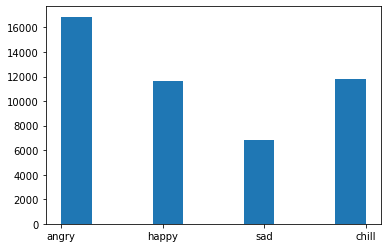

In [213]:
plt.hist(final_filtered_df['Emotion']);

In [214]:
final_filtered_df.groupby('Emotion').count()['polarity'].sort_values(ascending=False).iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Mood', xTitle='Emotion Name')

In [215]:
import plotly.graph_objects as go

y0 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'happy']['polarity']
y1 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'sad']['polarity']
y2 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'angry']['polarity']
y3 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'chill']['polarity']

trace0 = go.Box(y=y0, name = 'happy', marker = dict(color = 'rgb(214, 12, 140)', ))
trace1 = go.Box(y=y1, name = 'sad', marker = dict(color = 'rgb(0, 128, 128)', ))
trace2 = go.Box(y=y2, name = 'angry', marker = dict(color = 'rgb(10, 0, 100)', ))
trace3 = go.Box(y=y3, name = 'chill', marker = dict(color = 'rgb(10, 140, 208)', ))

data = [trace0, trace1, trace2, trace3]
layout = go.Layout(title = "Sentiment Polarity Boxplot of Emotion/Mood")

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Sentiment Polarity Boxplot of Emotion/Mood")

In [216]:
x0 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'happy', 'polarity']
x1 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'sad', 'polarity']
x2 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'angry', 'polarity']
x3 = final_filtered_df.loc[final_filtered_df['Emotion'] == 'chill', 'polarity']

trace0 = go.Histogram(x=x0, name='happy', opacity=0.5)
trace1 = go.Histogram(x=x1, name = 'sad', opacity=0.5)
trace2 = go.Histogram(x=x2, name = 'angry', opacity=0.5)
trace3 = go.Histogram(x=x3, name = 'chill', opacity=0.5)

data = [trace0, trace1, trace2, trace3]
layout = go.Layout(barmode='overlay', title='Distribution of Sentiment polarity of reviews based on Emotion')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')